In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import random as rn
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from keras.layers import Conv2D, MaxPooling2D,GlobalAvgPool2D
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten,Activation
from tensorflow.keras.optimizers import Adam
import cv2
from keras.preprocessing.image import ImageDataGenerator

In [2]:
labels = os.listdir('data/train')
print(labels)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite',

In [3]:
train_path = 'data/train/{0}/'
test_path = 'data/valid/{0}/'
num_cls = len(labels)
num_cls

38

In [4]:
num = []
for label in labels:
    path = train_path.format(label)
    folder_data = os.listdir(path)
    k = 0
    print('\n', label.upper())
    for image_path in folder_data:
        k = k+1
    num.append(k)
    print('there are ', k,' images in ', label, 'class')


 APPLE___APPLE_SCAB
there are  2016  images in  Apple___Apple_scab class

 APPLE___BLACK_ROT
there are  1987  images in  Apple___Black_rot class

 APPLE___CEDAR_APPLE_RUST
there are  1760  images in  Apple___Cedar_apple_rust class

 APPLE___HEALTHY
there are  2008  images in  Apple___healthy class

 BLUEBERRY___HEALTHY
there are  1816  images in  Blueberry___healthy class

 CHERRY_(INCLUDING_SOUR)___HEALTHY
there are  1826  images in  Cherry_(including_sour)___healthy class

 CHERRY_(INCLUDING_SOUR)___POWDERY_MILDEW
there are  1683  images in  Cherry_(including_sour)___Powdery_mildew class

 CORN_(MAIZE)___CERCOSPORA_LEAF_SPOT GRAY_LEAF_SPOT
there are  1642  images in  Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot class

 CORN_(MAIZE)___COMMON_RUST_
there are  1907  images in  Corn_(maize)___Common_rust_ class

 CORN_(MAIZE)___HEALTHY
there are  1859  images in  Corn_(maize)___healthy class

 CORN_(MAIZE)___NORTHERN_LEAF_BLIGHT
there are  1908  images in  Corn_(maize)___Northern_

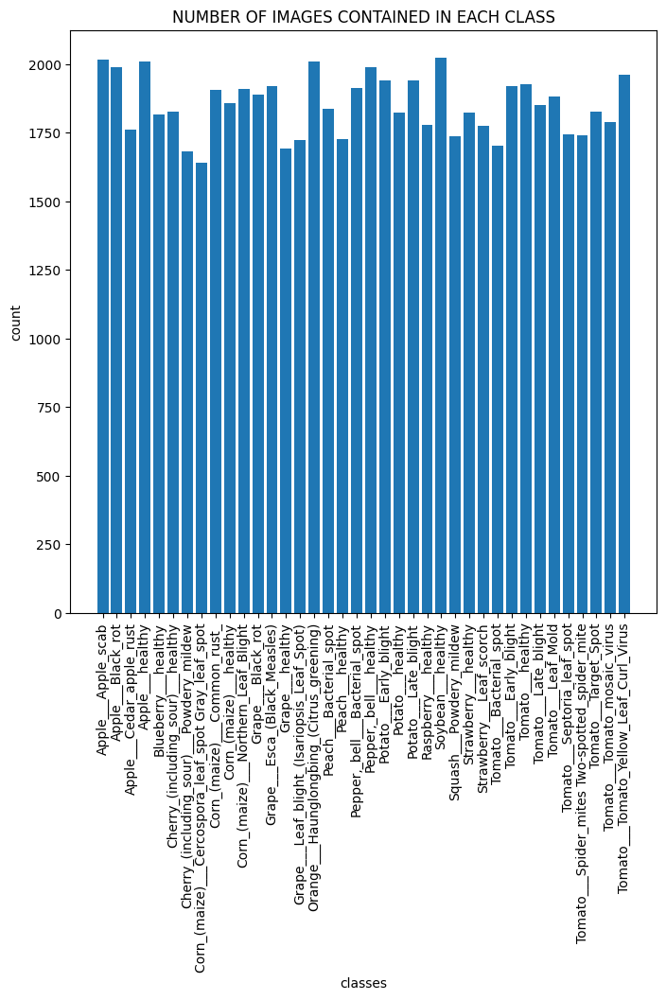

In [5]:
plt.figure(figsize = (8,8))
plt.bar(labels, num)
plt.title('NUMBER OF IMAGES CONTAINED IN EACH CLASS')
plt.xlabel('classes')
plt.xticks(rotation=90)
plt.ylabel('count')
plt.show()

In [37]:
import os
import cv2
import numpy as np

x_data =[]
y_data = []
for label in labels:
    path = train_path.format(label)
    folder_data = os.listdir(path)
    for image_path in folder_data:
        image = cv2.imread(path+image_path,cv2.IMREAD_COLOR)
        image_resized = cv2.resize(image, (224,224))
        x_data.append(np.array(image_resized))
        y_data.append(label)

In [38]:
num = []
for label in labels:
    k = 0
    print('\n', label.upper())
    for image_path in x_data:
        k = k+1
    num.append(k)
    print('there are ', k,' images in ', label, 'class')


 TOMATO___BACTERIAL_SPOT
there are  3663  images in  Tomato___Bacterial_spot class

 TOMATO___TOMATO_YELLOW_LEAF_CURL_VIRUS
there are  3663  images in  Tomato___Tomato_Yellow_Leaf_Curl_Virus class


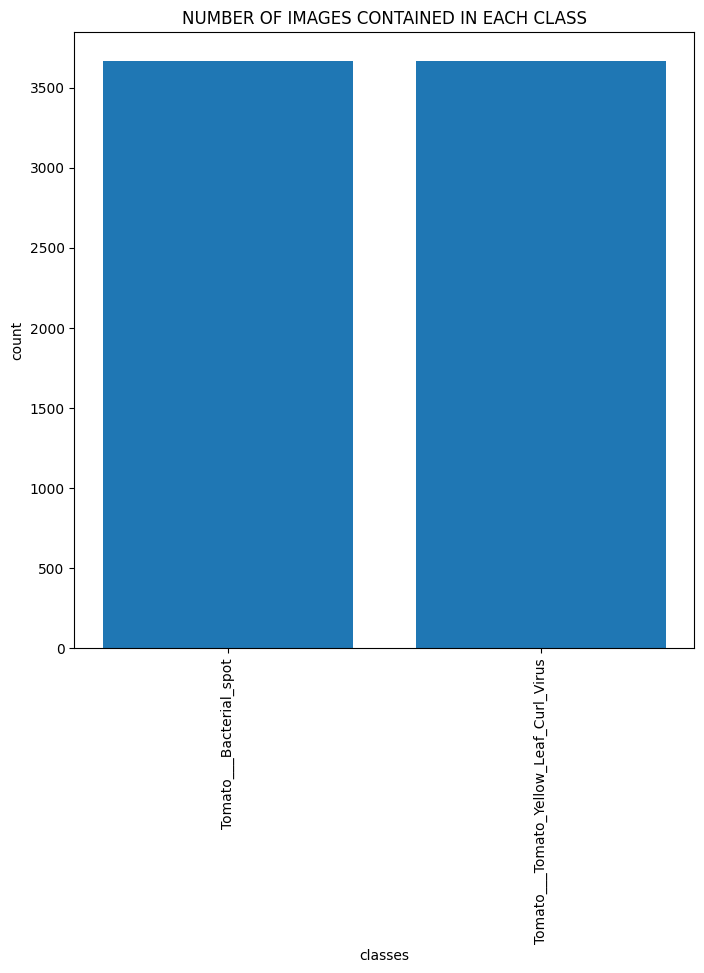

In [39]:
plt.figure(figsize = (8,8))
plt.bar(labels, num)
plt.title('NUMBER OF IMAGES CONTAINED IN EACH CLASS')
plt.xlabel('classes')
plt.xticks(rotation=90)
plt.ylabel('count')
plt.show()

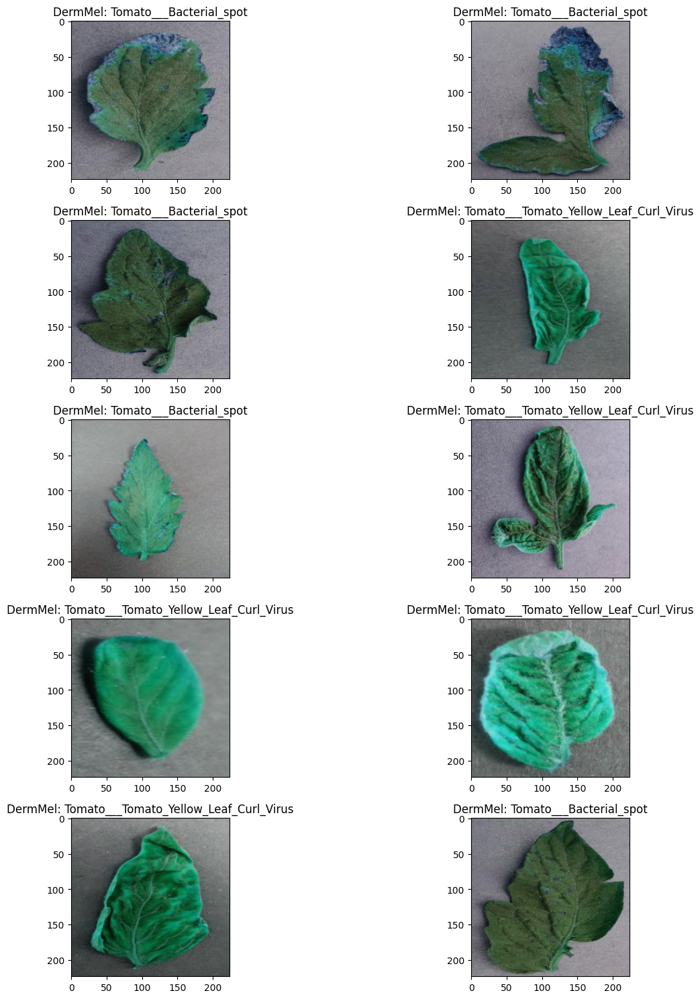

In [40]:
fig,ax=plt.subplots(5,2)
fig.set_size_inches(15,15)
for i in range(5):
    for j in range (2):
        l=rn.randint(0,len(y_data))
        ax[i,j].imshow(x_data[l])
        ax[i,j].set_title('DermMel: '+y_data[l])
        
plt.tight_layout()

In [41]:
x_data = np.array(x_data)

y_data = np.array(y_data)

print('the shape of X is: ', x_data.shape, 'and that of Y is: ', y_data.shape)

the shape of X is:  (3663, 224, 224, 3) and that of Y is:  (3663,)


In [42]:
le=LabelEncoder()
Y=le.fit_transform(y_data)
Y=to_categorical(Y,num_cls)
x_data = x_data/255   #standarization 
Y.shape

(3663, 2)

In [43]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

def build_model(input_shape=(224, 224, 3)):
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
    
    for layer in base_model.layers[:]:
        layer.trainable = False
    
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu', kernel_regularizer=l2())(x)
    predictions = Dense(2, activation='sigmoid')(x)
    
    # Construct the final model
    model = Model(inputs=base_model.input, outputs=predictions)
    
    # Compile the model with specified optimizer and loss
    model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

# Build the model
model = build_model()
model.summary() 

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [44]:
test_label = os.listdir('data/valid')
print(test_label)

['Tomato___Bacterial_spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus']


In [45]:
x_test =[]
y_test = []

for label in test_label:
    path = test_path.format(label)
    folder_data = os.listdir(path)
    for image_path in folder_data:
        image = cv2.imread(path+image_path,cv2.IMREAD_COLOR)
        image_resized = cv2.resize(image, (224,224))
        x_test.append(np.array(image_resized))
        y_test.append(label)

In [46]:
x_test = np.array(x_test)
x_test = x_test/255
y_test = np.array(y_test)
le = LabelEncoder()
y = le.fit_transform(y_test)
y = to_categorical(y,num_cls)

In [47]:
x_test.shape,y.shape

((915, 224, 224, 3), (915, 2))

In [48]:
from keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss', patience=7, verbose=1, mode='auto')

In [49]:
history = model.fit(x_data,Y,epochs = 50, validation_data = (x_test,y),
                    verbose = 1)

Epoch 1/50
115/115 [==============================] - 11s 74ms/step - loss: 13.8322 - accuracy: 0.8217 - val_loss: 13.3736 - val_accuracy: 0.9443
Epoch 2/50
115/115 [==============================] - 7s 63ms/step - loss: 13.0427 - accuracy: 0.9438 - val_loss: 12.7061 - val_accuracy: 0.9639
Epoch 3/50
115/115 [==============================] - 7s 63ms/step - loss: 12.4019 - accuracy: 0.9610 - val_loss: 12.0817 - val_accuracy: 0.9716
Epoch 4/50
115/115 [==============================] - 7s 64ms/step - loss: 11.7895 - accuracy: 0.9656 - val_loss: 11.4818 - val_accuracy: 0.9770
Epoch 5/50
115/115 [==============================] - 7s 64ms/step - loss: 11.1983 - accuracy: 0.9702 - val_loss: 10.9010 - val_accuracy: 0.9770
Epoch 6/50
115/115 [==============================] - 7s 64ms/step - loss: 10.6285 - accuracy: 0.9746 - val_loss: 10.3410 - val_accuracy: 0.9792
Epoch 7/50
115/115 [==============================] - 7s 64ms/step - loss: 10.0786 - accuracy: 0.9773 - val_loss: 9.8039 - val_ac

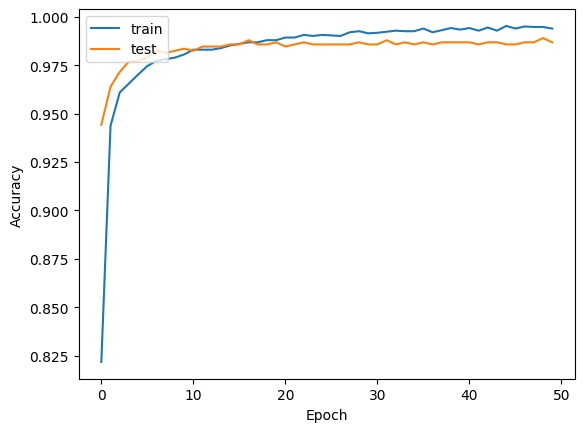

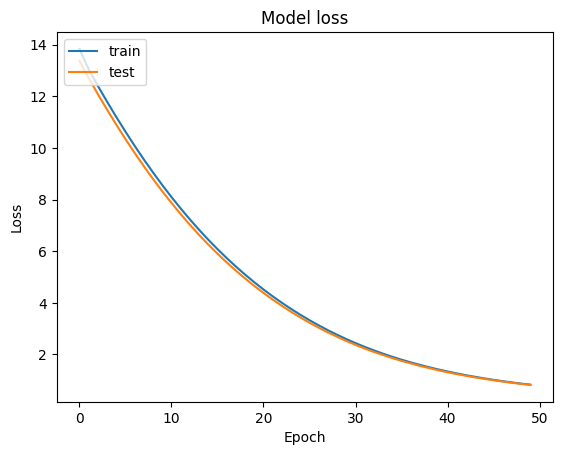

In [50]:
    fig=plt.figure()
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])    # plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    fig.savefig("accuracy.png")
    # # summarize history for loss
    fig=plt.figure()
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    fig.savefig("loss.png")

In [51]:
model.save('plantIncepV3.hdf5')
# model.load_weights('plantIncepV3.hdf5')

In [69]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np

# # 1. Load the trained model
model = load_model('plantIncepV3.hdf5')

# 2. Preprocess the image
def preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.  # Assuming your model uses the same normalization
    return img_array

img_path = 'bs123.png'
img_array = preprocess_image(img_path)

# 3. Predict
predictions = model.predict(img_array)

predicted_class = np.argmax(predictions[0])

# 4. Postprocess (if needed)
# If you have class names, you can map the predicted_class index to its name
class_names = ['bs', 'ycv']  # Replace with your actual class names
print(f"Predicted class: {class_names[predicted_class]}")


1/1 [==============================] - 1s 984ms/step
Predicted class: bs


In [38]:
import base64
from PIL import Image
import io
import torch
import torchvision.transforms as transforms
import tensorflow as tf

# Now you can use 'model' for predictions or other tasks

def predict_image_base64(base64_image, model):
    try:
        # Decode the base64 image string to bytes
        image_data = base64.b64decode(base64_image.split(",")[1])  # Extract data after ','

        # Convert bytes to a PIL Image
        image = Image.open(io.BytesIO(image_data))

        # Define a transformation to preprocess the image (modify as needed)
        transform = transforms.Compose([
            transforms.Resize((128, 128)),  # Resize the image to match the model's input size
            transforms.ToTensor(),  # Convert to PyTorch tensor
            # Add other preprocessing transformations as needed (e.g., normalization)
        ])

        # Apply the transformation to the image
        image = transform(image).unsqueeze(0)  # Add a batch dimension

        # Make predictions using the model
        with torch.no_grad():
            model.eval()
            output = model(image)

        # Assuming 'model' is a classification model, get the predicted class
        predicted_class = torch.argmax(output, dim=1).item()

        return predicted_class

    except Exception as e:
        return str(e)


In [17]:
# Load the pre-trained model from the .h5 file
import tensorflow as tf
model = tf.keras.models.load_model("AlexNetModel.hdf5")

In [38]:
li = ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']

In [ ]:
import numpy as np
import os
import cv2
from tensorflow.keras.applications.inception_v3 import preprocess_input
from sklearn.svm import SVC

# Function to extract features from images
def extract_features(image_paths):
    features = []
    for image_path in image_paths:
        print(f"Processing image: {image_path}")
        try:
            img = cv2.imread(image_path)
            if img is None or img.size == 0:
                print(f"Skipping image: {image_path} (failed to load or empty)")
                continue

            img = cv2.resize(img, (224, 224))
            if img is None or img.size == 0:
                print(f"Skipping image: {image_path} (failed to resize or empty)")
                continue

            img = preprocess_input(img)
            img = np.expand_dims(img, axis=0)
            feature_vector = model.predict(img)
            features.append(feature_vector)
        except Exception as e:
            print(f"Error processing image: {image_path}")
            print(str(e))
    return np.vstack(features)

# Specify the root directory containing subdirectories with images
root_data_dir = 'data'

# Recursively find image files within subdirectories of the root directory
def find_image_files(root_dir):
    image_paths = []
    for subdir, _, files in os.walk(root_dir):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
                image_paths.append(os.path.join(subdir, file))
    return image_paths

# Find image paths for both training and validation data
train_image_paths = find_image_files(os.path.join(root_data_dir, 'train'))
valid_image_paths = find_image_files(os.path.join(root_data_dir, 'valid'))

# Assuming you have a list of labels for your images
labels = ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_mosaic_virus', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus']

# Extract features from training and validation images
train_features = extract_features(train_image_paths)
valid_features = extract_features(valid_image_paths)

# Train separate SVMs for each class using a one-vs-all strategy
svm_models = {}
for class_label in set(labels):
    # Create a binary label for the current class
    y_train_binary = np.array(labels) == class_label
    
    # Create an SVM classifier and train it
    svm = SVC(probability=True)
    svm.fit(train_features, y_train_binary)
    
    # Store the trained SVM model
    svm_models[class_label] = svm

# Classify a new image
def classify_image(image_path):
    feature_vector = extract_features([image_path])
    class_probabilities = {}
    for class_label, svm in svm_models.items():
        probability = svm.predict_proba(feature_vector)[0][1]
        class_probabilities[class_label] = probability
    predicted_class = max(class_probabilities, key=class_probabilities.get)
    return predicted_class

# Test the classification on a sample image (replace with your own image path)
sample_image_path = 'path/to/your/sample/image.jpg'
predicted_class = classify_image(sample_image_path)
print(f'Predicted class: {predicted_class}')


Processing image: data\train\Apple___Apple_scab\00075aa8-d81a-4184-8541-b692b78d398a___FREC_Scab 3335.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Apple___Apple_scab\01a66316-0e98-4d3b-a56f-d78752cd043f___FREC_Scab 3003.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\01a66316-0e98-4d3b-a56f-d78752cd043f___FREC_Scab 3003_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\01a66316-0e98-4d3b-a56f-d78752cd043f___FREC_Scab 3003_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\01a66316-0e98-4d3b-a56f-d78752cd043f___FREC_Scab 3003_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\01f3deaa-6143-4b6c-9c22-620a46d8be04___FREC_Scab 3112.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\075b1885-250b-4b3e-8168-e54efdbb04e8___FREC_Scab 3173.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\075b1885-250b-4b3e-8168-e54efdbb04e8___FREC_Scab 3173_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\075b1885-250b-4b3e-8168-e54efdbb04e8___FREC_Scab 3173_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\075b1885-250b-4b3e-8168-e54efdbb04e8___FREC_Scab 3173_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\0812e1e4-6d1b-4264-8f23-6519354fc5a6___FREC_Scab 3293_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\0812e1e4-6d1b-4264-8f23-6519354fc5a6___FREC_Scab 3293_90deg.JPG
1/1 [======

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\0d3c0790-7833-470b-ac6e-94d0a3bf3e7c___FREC_Scab 2959_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\0d3c0790-7833-470b-ac6e-94d0a3bf3e7c___FREC_Scab 2959_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\0d3c0790-7833-470b-ac6e-94d0a3bf3e7c___FREC_Scab 2959_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\0d8d5b80-962d-4381-8d3b-9eca3f2f1bb0___FREC_Scab 3449.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\0d8d5b80-962d-4381-8d3b-9eca3f2f1bb0___FREC_Scab 3449_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\0d8d5b80-962d-4381-8d3b-9eca3f2f1bb0___FREC_Scab 3449_90deg.JPG
1/1 [======

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\13f31401-f65a-4025-823a-4f2738e8bff9___FREC_Scab 3062_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\14c623e5-051c-42f6-9e4f-f7a93e6a723c___FREC_Scab 2965.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\14c623e5-051c-42f6-9e4f-f7a93e6a723c___FREC_Scab 2965_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\1547f817-6a4d-4cbc-8ce0-7dff293562ee___FREC_Scab 3194.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\1547f817-6a4d-4cbc-8ce0-7dff293562ee___FREC_Scab 3194_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\1547f817-6a4d-4cbc-8ce0-7dff293562ee___FREC_Scab 3194_new30degFlipLR.JPG


1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\1b1004c8-99e9-4c85-8fe5-b1c11d558cf8___FREC_Scab 3300.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Apple_scab\1b1004c8-99e9-4c85-8fe5-b1c11d558cf8___FREC_Scab 3300_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\1b1004c8-99e9-4c85-8fe5-b1c11d558cf8___FREC_Scab 3300_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\1bc60205-27cc-4d10-bc87-7e968573e5d5___FREC_Scab 3531.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\1bc60205-27cc-4d10-bc87-7e968573e5d5___FREC_Scab 3531_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\1bc60205-27cc-4d10-bc87-7e968573e5d5___FREC_Scab 3531_90deg.JPG
1/1 [============

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\22c12d6a-3c17-45be-b53b-f17f1b3f5168___FREC_Scab 3206_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\233b7aec-ccec-47a3-b5bd-27e154d7a8f7___FREC_Scab 2912.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\233b7aec-ccec-47a3-b5bd-27e154d7a8f7___FREC_Scab 2912_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\233b7aec-ccec-47a3-b5bd-27e154d7a8f7___FREC_Scab 2912_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\233b7aec-ccec-47a3-b5bd-27e154d7a8f7___FREC_Scab 2912_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\23466313-6a2c-46e7-ad89-1f95dd2d3b40___FREC_Scab 3517_90deg.JPG
1/1 [=======

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\2a59761b-c91c-451c-8e13-d9dc3aff8d29___FREC_Scab 3503.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\2a59761b-c91c-451c-8e13-d9dc3aff8d29___FREC_Scab 3503_270deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\2a59761b-c91c-451c-8e13-d9dc3aff8d29___FREC_Scab 3503_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\2a59761b-c91c-451c-8e13-d9dc3aff8d29___FREC_Scab 3503_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\2a800c84-902e-4aa8-af13-4e020d6f17dd___FREC_Scab 3124_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\2a800c84-902e-4aa8-af13-4e020d6f17dd___FREC_Scab 3124_90deg.JPG
1/1 [======

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\2f668a95-80ab-40ac-98ef-657bd85b668b___FREC_Scab 3247.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\2f668a95-80ab-40ac-98ef-657bd85b668b___FREC_Scab 3247_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\30111fee-0c22-4ca4-aeb4-ac14a9a5d651___FREC_Scab 3097.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\30111fee-0c22-4ca4-aeb4-ac14a9a5d651___FREC_Scab 3097_270deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\30111fee-0c22-4ca4-aeb4-ac14a9a5d651___FREC_Scab 3097_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\30111fee-0c22-4ca4-aeb4-ac14a9a5d651___FREC_Scab 3097_new30degFlipLR.JPG
1/1 [=============

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\36d99a07-4a43-4416-b204-6886f71d5039___FREC_Scab 3294_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\37659856-0fc8-430b-871a-af4f0b557e49___FREC_Scab 3081.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\37659856-0fc8-430b-871a-af4f0b557e49___FREC_Scab 3081_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\37659856-0fc8-430b-871a-af4f0b557e49___FREC_Scab 3081_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\37659856-0fc8-430b-871a-af4f0b557e49___FREC_Scab 3081_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\376aaef3-8649-43aa-89f8-166bd349a3d3___FREC_Scab 3064.JPG
1/1 [====

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\4147e694-ce1f-47ea-b641-899e60ef3f3a___FREC_Scab 3278_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\4151028c-c8bc-4394-b4a7-aff414864c15___FREC_Scab 3418.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\4151028c-c8bc-4394-b4a7-aff414864c15___FREC_Scab 3418_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\4151028c-c8bc-4394-b4a7-aff414864c15___FREC_Scab 3418_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\419c16b2-13aa-485b-8342-3760707e21f9___FREC_Scab 3285.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\419c16b2-13aa-485b-8342-3760707e21f9___FREC_Scab 3285_270deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\45512c84-e453-459c-b12f-1d08ce44001b___FREC_Scab 3072.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\45512c84-e453-459c-b12f-1d08ce44001b___FREC_Scab 3072_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\45512c84-e453-459c-b12f-1d08ce44001b___FREC_Scab 3072_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\45512c84-e453-459c-b12f-1d08ce44001b___FREC_Scab 3072_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\4555c009-6c33-4913-accc-fd1a8355646b___FREC_Scab 2929.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\4555c009-6c33-4913-accc-fd1a8355646b___FREC_Scab 2929_270deg.JPG
1/1 [============

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\495816a8-4d85-47a5-9aca-a09f3f30a068___FREC_Scab 3443_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\4a50158d-dcd0-4a1f-885e-2d9b16a4e344___FREC_Scab 3205.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\4a50158d-dcd0-4a1f-885e-2d9b16a4e344___FREC_Scab 3205_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\4a7f12ff-a785-4d12-8943-f1644789a21b___FREC_Scab 2916.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\4a7f12ff-a785-4d12-8943-f1644789a21b___FREC_Scab 2916_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\4a7f12ff-a785-4d12-8943-f1644789a21b___FREC_Scab 2916_90deg.JPG
1/1 [=============

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\51929389-451f-4c78-a66b-b644e82a33b6___FREC_Scab 3528.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\51929389-451f-4c78-a66b-b644e82a33b6___FREC_Scab 3528_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\51929389-451f-4c78-a66b-b644e82a33b6___FREC_Scab 3528_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\52d5723a-b498-4759-89a1-a7d815689716___FREC_Scab 3034_270deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\52d5723a-b498-4759-89a1-a7d815689716___FREC_Scab 3034_90deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\53035d10-9f2b-4c90-ab75-dfde2a9af82f___FREC_Scab 2915.JPG
1/1 [=============

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\5990ed9f-ffe8-4622-bd26-e536ea5e1109___FREC_Scab 3042_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\59c9641b-c84e-4595-8f2c-13b5f914aa4a___FREC_Scab 3060_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\59c9641b-c84e-4595-8f2c-13b5f914aa4a___FREC_Scab 3060_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\5a178d63-372d-48c4-adb8-d616130ba3f0___FREC_Scab 3104.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\5a178d63-372d-48c4-adb8-d616130ba3f0___FREC_Scab 3104_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\5a178d63-372d-48c4-adb8-d616130ba3f0___FREC_Scab 3104_90deg.JPG
1/

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\61643f40-eb9a-4c6b-8de5-c12319fc7680___FREC_Scab 3114_new30degFlipLR.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\6171eecd-e385-4010-b9cd-5982f4674fee___FREC_Scab 2911_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\6171eecd-e385-4010-b9cd-5982f4674fee___FREC_Scab 2911_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\6171eecd-e385-4010-b9cd-5982f4674fee___FREC_Scab 2911_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\623fb084-dbac-42fb-b636-7cfcb89ba9f6___FREC_Scab 3437.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\623fb084-dbac-42fb-b636-7cfcb89ba9f6___FREC_Scab 3437_270deg.JPG
1/

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\663ad178-6346-4b89-8074-6655f1be1578___FREC_Scab 3500_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\663ad178-6346-4b89-8074-6655f1be1578___FREC_Scab 3500_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\6643566f-d980-4bdb-88d7-4d3ab3c771fa___FREC_Scab 3038.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\6643566f-d980-4bdb-88d7-4d3ab3c771fa___FREC_Scab 3038_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\6643566f-d980-4bdb-88d7-4d3ab3c771fa___FREC_Scab 3038_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\6643566f-d980-4bdb-88d7-4d3ab3c771fa___FREC_Scab 3038_new30degFlipLR.JPG
1/

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\6a2c0f48-b0f7-4bd9-b7b8-7410c1ef4048___FREC_Scab 2999_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\6a61688a-c972-4f8f-b3b7-46fd00264240___FREC_Scab 3271_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\6a61688a-c972-4f8f-b3b7-46fd00264240___FREC_Scab 3271_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\6b5e1187-9b7b-4b4c-912f-b2175619f35f___FREC_Scab 3121_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\6b5e1187-9b7b-4b4c-912f-b2175619f35f___FREC_Scab 3121_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\6b66d8dd-af9f-43b5-a43f-6e4c6d64bede___FREC_Scab 3248

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\6fb41b7b-d1f0-451c-988a-1083d038acdb___FREC_Scab 3094_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\6fb62aa7-c3d4-457a-b95d-a8b3102cccd8___FREC_Scab 3005.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\6fb62aa7-c3d4-457a-b95d-a8b3102cccd8___FREC_Scab 3005_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\6fb62aa7-c3d4-457a-b95d-a8b3102cccd8___FREC_Scab 3005_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\6fb62aa7-c3d4-457a-b95d-a8b3102cccd8___FREC_Scab 3005_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\70fa2c8f-5657-444f-b57b-3ad6755acc74___FREC_Scab 3275.JPG
1/1 [====

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\76e50482-74b2-468f-8556-7669e1682f1e___FREC_Scab 3323_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\76eca386-c7c1-4807-ae27-13c793d06e02___FREC_Scab 3272.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\76eca386-c7c1-4807-ae27-13c793d06e02___FREC_Scab 3272_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\76eca386-c7c1-4807-ae27-13c793d06e02___FREC_Scab 3272_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\76eca386-c7c1-4807-ae27-13c793d06e02___FREC_Scab 3272_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\774fb249-80b5-4575-ab5a-5459a9c14ef6___FREC_Scab 3024_270deg.JPG
1/

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\7c66bda4-301c-4987-85b8-fd8230c5a2f2___FREC_Scab 3324_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\7c83792f-d375-42fb-a5a0-1bc2cb3a8eff___FREC_Scab 2914.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\7c83792f-d375-42fb-a5a0-1bc2cb3a8eff___FREC_Scab 2914_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\7ceb532d-1a58-4a25-bbff-8dd04a117744___FREC_Scab 3422.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\7ceb532d-1a58-4a25-bbff-8dd04a117744___FREC_Scab 3422_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\7ceb532d-1a58-4a25-bbff-8dd04a117744___FREC_Scab 3422_new30degFlipLR.JPG


1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\80894f41-f887-4d0c-8b09-0a7cd24fbe18___FREC_Scab 3526_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\80894f41-f887-4d0c-8b09-0a7cd24fbe18___FREC_Scab 3526_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\80894f41-f887-4d0c-8b09-0a7cd24fbe18___FREC_Scab 3526_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\80ddd81b-9c75-4711-8012-7ee68af378db___FREC_Scab 3458.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\80ddd81b-9c75-4711-8012-7ee68af378db___FREC_Scab 3458_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Apple_scab\80ddd81b-9c75-4711-8012-7ee68af378db___FREC_Scab 3458_90deg.JPG
1/1 [======

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Apple_scab\85aad925-f1e2-463e-840b-266d49a56d1f___FREC_Scab 3100_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\86054e9e-26b4-42b5-b192-58ddee7b0c34___FREC_Scab 3011.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\86054e9e-26b4-42b5-b192-58ddee7b0c34___FREC_Scab 3011_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\86054e9e-26b4-42b5-b192-58ddee7b0c34___FREC_Scab 3011_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\8632c6b9-84e1-4779-9294-71548ff838e5___FREC_Scab 3423.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\8632c6b9-84e1-4779-9294-71548ff838e5___FREC_Scab 3423_270deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\8c72c236-8f13-4087-8d1d-f365211563f0___FREC_Scab 3196.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\8c72c236-8f13-4087-8d1d-f365211563f0___FREC_Scab 3196_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\8c916434-af92-4360-9833-0422aa510f7e___FREC_Scab 3245.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\8c916434-af92-4360-9833-0422aa510f7e___FREC_Scab 3245_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\8c916434-af92-4360-9833-0422aa510f7e___FREC_Scab 3245_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\8d2bd2f9-2c65-43f7-95f7-22f7f404ba13___FREC_Scab 3232_270deg.JPG
1/1 [====

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\96a26f9f-76b9-456a-b39f-d390ff20bc58___FREC_Scab 3257_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\96f7f6b4-4dd6-4887-b6b2-89449271274f___FREC_Scab 3047.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\96f7f6b4-4dd6-4887-b6b2-89449271274f___FREC_Scab 3047_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\96f7f6b4-4dd6-4887-b6b2-89449271274f___FREC_Scab 3047_90deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\96f7f6b4-4dd6-4887-b6b2-89449271274f___FREC_Scab 3047_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\97294a06-04ae-440f-b130-ddff2817c727___FREC_Scab 3372.JPG
1/1 [====

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\9b7399aa-1c3c-4137-ae4e-196cd23fe573___FREC_Scab 3468_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Apple_scab\9c04ca1c-e5f5-4a03-8205-544c1475a18c___FREC_Scab 3502.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\9c04ca1c-e5f5-4a03-8205-544c1475a18c___FREC_Scab 3502_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\9c04ca1c-e5f5-4a03-8205-544c1475a18c___FREC_Scab 3502_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\9c04ca1c-e5f5-4a03-8205-544c1475a18c___FREC_Scab 3502_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\9cbb6419-1670-45d5-a8ad-90cf9eaac971___FREC_Scab 3075.JPG
1/1 [====

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\a0fd13e3-e36c-4386-beb2-ec6a587bfd70___FREC_Scab 3053.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\a0fd13e3-e36c-4386-beb2-ec6a587bfd70___FREC_Scab 3053_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\a0fd13e3-e36c-4386-beb2-ec6a587bfd70___FREC_Scab 3053_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\a0fd13e3-e36c-4386-beb2-ec6a587bfd70___FREC_Scab 3053_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\a15c8e33-6b90-489e-800d-99b3056235c2___FREC_Scab 3466.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\a15c8e33-6b90-489e-800d-99b3056235c2___FREC_Scab 3466_270deg.JPG
1/1 [============

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\ab7d0d06-b45c-4472-a708-c2a1d65ee748___FREC_Scab 3152_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\aba69098-9c79-46cc-ba1f-6f88a456b56f___FREC_Scab 3039.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\aba69098-9c79-46cc-ba1f-6f88a456b56f___FREC_Scab 3039_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\abd8b296-db97-40c0-af5b-39e03f4dec16___FREC_Scab 3041.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\abd8b296-db97-40c0-af5b-39e03f4dec16___FREC_Scab 3041_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\abd8b296-db97-40c0-af5b-39e03f4dec16___FREC_Scab 3041_new30degFlipLR.JPG
1/1 [====

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\aff87313-e090-401b-aa23-92fba4c55fae___FREC_Scab 3305_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\affb666c-6915-48e6-ba8a-92385af75826___FREC_Scab 3395.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\affb666c-6915-48e6-ba8a-92385af75826___FREC_Scab 3395_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\affb666c-6915-48e6-ba8a-92385af75826___FREC_Scab 3395_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\b006c4b8-5f33-4794-91bd-7aaa430e6ceb___FREC_Scab 3498.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\b006c4b8-5f33-4794-91bd-7aaa430e6ceb___FREC_Scab 3498_270deg.JPG
1/1 [====

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\b24daaef-81e1-47fc-a858-b8c8b346d956___FREC_Scab 2927_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\b24daaef-81e1-47fc-a858-b8c8b346d956___FREC_Scab 2927_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\b24daaef-81e1-47fc-a858-b8c8b346d956___FREC_Scab 2927_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\b2567b00-d781-4177-9c3f-6a7b9f47941f___FREC_Scab 3414.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\b2567b00-d781-4177-9c3f-6a7b9f47941f___FREC_Scab 3414_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\b2567b00-d781-4177-9c3f-6a7b9f47941f___FREC_Scab 3414_90deg.JPG
1/1 [======

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\b98c71e9-79a0-4e8d-9c8d-0438c4fe8a57___FREC_Scab 2948_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\b98c71e9-79a0-4e8d-9c8d-0438c4fe8a57___FREC_Scab 2948_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\b98ecede-7f6f-4e39-a761-4dc37699507b___FREC_Scab 2971.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\b98ecede-7f6f-4e39-a761-4dc37699507b___FREC_Scab 2971_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\b98ecede-7f6f-4e39-a761-4dc37699507b___FREC_Scab 2971_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\b98ecede-7f6f-4e39-a761-4dc37699507b___FREC_Scab 2971_new30degFlipLR.JPG
1/1

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\bceb695a-e877-4b2b-bf05-241661d511d4___FREC_Scab 3240_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\bceb695a-e877-4b2b-bf05-241661d511d4___FREC_Scab 3240_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\bceb695a-e877-4b2b-bf05-241661d511d4___FREC_Scab 3240_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\bda4a657-9bc8-4a02-a450-d38c7056172a___FREC_Scab 3316.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\bda4a657-9bc8-4a02-a450-d38c7056172a___FREC_Scab 3316_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\bda4a657-9bc8-4a02-a450-d38c7056172a___FREC_Scab 3316_90deg.JPG
1/1 [======

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\c27b45af-c362-4d37-ab5b-ee197a3670de___FREC_Scab 3521.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\c27b45af-c362-4d37-ab5b-ee197a3670de___FREC_Scab 3521_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\c27b45af-c362-4d37-ab5b-ee197a3670de___FREC_Scab 3521_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\c2997bb6-d9ae-4ffc-bc3f-c85510480e13___FREC_Scab 3428.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\c2997bb6-d9ae-4ffc-bc3f-c85510480e13___FREC_Scab 3428_270deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\c2997bb6-d9ae-4ffc-bc3f-c85510480e13___FREC_Scab 3428_90deg.JPG
1/1 [=============

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\c777c2ac-ea64-4aad-a97a-90b35e2db603___FREC_Scab 3156_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\c777c2ac-ea64-4aad-a97a-90b35e2db603___FREC_Scab 3156_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\c7a9601c-b927-413d-8bc8-2175e573b128___FREC_Scab 3031.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\c7a9601c-b927-413d-8bc8-2175e573b128___FREC_Scab 3031_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\c7a9601c-b927-413d-8bc8-2175e573b128___FREC_Scab 3031_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\c7a9601c-b927-413d-8bc8-2175e573b128___FREC_Scab 3031_new30degFlipLR.JPG
1/1

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\cd7bc55c-1c47-4af7-9875-f29147d54115___FREC_Scab 3471_270deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\cd7bc55c-1c47-4af7-9875-f29147d54115___FREC_Scab 3471_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\cd7bc55c-1c47-4af7-9875-f29147d54115___FREC_Scab 3471_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\ce7338f4-ed12-4014-8d2f-4b674b672357___FREC_Scab 3532.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\ce7338f4-ed12-4014-8d2f-4b674b672357___FREC_Scab 3532_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\ced72cdb-0358-420c-abdd-1c94ba303435___FREC_Scab 3217.JPG
1/1 [============

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\d608ac35-eaf8-43e2-b429-f9b433126023___FREC_Scab 3386_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\d652b023-0ade-4f34-a490-206a87489e5e___FREC_Scab 3066.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\d652b023-0ade-4f34-a490-206a87489e5e___FREC_Scab 3066_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\d652b023-0ade-4f34-a490-206a87489e5e___FREC_Scab 3066_new30degFlipLR.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\d66bf6da-1199-4f2b-9776-8cbc4529b268___FREC_Scab 3157.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\d66bf6da-1199-4f2b-9776-8cbc4529b268___FREC_Scab 3157_270deg.JPG
1/1 [===

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\dbf66e2f-cf58-418c-9dcd-14254af3ddb1___FREC_Scab 2934_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\dbf6dab4-0765-454c-8cb9-6b4329bca971___FREC_Scab 3225.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\dbf6dab4-0765-454c-8cb9-6b4329bca971___FREC_Scab 3225_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\dbf6dab4-0765-454c-8cb9-6b4329bca971___FREC_Scab 3225_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\dbf6dab4-0765-454c-8cb9-6b4329bca971___FREC_Scab 3225_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Apple_scab\dc12e2fd-e41b-43b5-9874-09661913316e___FREC_Scab 3073_270deg.JPG
1/1 [======

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\e2746374-a734-4d96-9dc8-503fbd35effa___FREC_Scab 2979.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\e2746374-a734-4d96-9dc8-503fbd35effa___FREC_Scab 2979_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\e2746374-a734-4d96-9dc8-503fbd35effa___FREC_Scab 2979_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\e2746374-a734-4d96-9dc8-503fbd35effa___FREC_Scab 2979_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\e3509da1-332c-4e43-977a-c57978ff6a38___FREC_Scab 3219.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Apple_scab\e3509da1-332c-4e43-977a-c57978ff6a38___FREC_Scab 3219_270deg.JPG
1/1 [============

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\ed1d17cd-a5c2-4b10-996f-53f316df30b7___FREC_Scab 3456_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\ed33dbe0-edc4-4ad8-85c2-0495f384e3fe___FREC_Scab 3467_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\ed33dbe0-edc4-4ad8-85c2-0495f384e3fe___FREC_Scab 3467_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Apple_scab\ed33dbe0-edc4-4ad8-85c2-0495f384e3fe___FREC_Scab 3467_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\ed3fa713-5de5-4298-96c1-9cf5bb830078___FREC_Scab 3105_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\ed3fa713-5de5-4298-96c1-9cf5bb830078___FREC_Scab 3105_90deg.

1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\f141c7f9-66b7-4052-b5c7-db3df1a894f2___FREC_Scab 3261.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\f141c7f9-66b7-4052-b5c7-db3df1a894f2___FREC_Scab 3261_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\f141c7f9-66b7-4052-b5c7-db3df1a894f2___FREC_Scab 3261_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\f18c0441-917e-4f34-b26e-a1a71d0adec2___FREC_Scab 3429_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\f18c0441-917e-4f34-b26e-a1a71d0adec2___FREC_Scab 3429_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\f18c0441-917e-4f34-b26e-a1a71d0adec2___FREC_Scab 3429_new30degFlipLR.JPG
1/1

1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\f79c50ef-d89d-4371-b581-810b37eb2ac9___FREC_Scab 3255.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\f79c50ef-d89d-4371-b581-810b37eb2ac9___FREC_Scab 3255_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\f79c50ef-d89d-4371-b581-810b37eb2ac9___FREC_Scab 3255_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\f7c4bd45-5098-4b2c-bbfb-2e47c8f2d711___FREC_Scab 3361.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\f7c4bd45-5098-4b2c-bbfb-2e47c8f2d711___FREC_Scab 3361_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\f7c4bd45-5098-4b2c-bbfb-2e47c8f2d711___FREC_Scab 3361_90deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\fd3ae59f-e06e-403b-b317-83ee68aa9ea7___FREC_Scab 3492_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\fd3ae59f-e06e-403b-b317-83ee68aa9ea7___FREC_Scab 3492_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\fd5a96b7-6623-41cc-b34c-3b940ea27286___FREC_Scab 3013_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Apple_scab\fd5a96b7-6623-41cc-b34c-3b940ea27286___FREC_Scab 3013_90deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Apple_scab\fd5a96b7-6623-41cc-b34c-3b940ea27286___FREC_Scab 3013_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Apple_scab\fdc58f83-8a94-4f0c-aefe-c6f2b5028682___FREC_Scab 3014.JPG
1/1

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\033b1492-d5cf-4de7-a195-941f7780e092___JR_FrgE.S 8710_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\033b1492-d5cf-4de7-a195-941f7780e092___JR_FrgE.S 8710_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\03fd7154-2e33-4fb6-999d-bfc3a3f467fe___JR_FrgE.S 8681_90deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Black_rot\03fd7154-2e33-4fb6-999d-bfc3a3f467fe___JR_FrgE.S 8681_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\04de1246-ecfa-4d2c-bc2d-16b81b0bd364___JR_FrgE.S 2970.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\04de1246-ecfa-4d2c-bc2d-16b81b0bd364___JR_FrgE.S 2970_270deg.JPG
1/1 [====

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\0b8dabb7-5f1b-4fdc-b3fa-30b289707b90___JR_FrgE.S 3047.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\0b8dabb7-5f1b-4fdc-b3fa-30b289707b90___JR_FrgE.S 3047_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\0b8dabb7-5f1b-4fdc-b3fa-30b289707b90___JR_FrgE.S 3047_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\0bb8fb61-d561-43fd-89a3-d24d253adef9___JR_FrgE.S 2849.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\0bb8fb61-d561-43fd-89a3-d24d253adef9___JR_FrgE.S 2849_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\0bb8fb61-d561-43fd-89a3-d24d253adef9___JR_FrgE.S 2849_90deg.JPG
1/1 [==================

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\1bb4d1d5-ca06-49b6-8f89-ed0d6c1d68af___JR_FrgE.S 8777_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\1bb4d1d5-ca06-49b6-8f89-ed0d6c1d68af___JR_FrgE.S 8777_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\1c31a116-f51d-4f56-9c69-c26c5fe69f57___JR_FrgE.S 2844.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\1c31a116-f51d-4f56-9c69-c26c5fe69f57___JR_FrgE.S 2844_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\1c31a116-f51d-4f56-9c69-c26c5fe69f57___JR_FrgE.S 2844_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\1c31a116-f51d-4f56-9c69-c26c5fe69f57___JR_FrgE.S 2844_new30degFlipLR.JPG
1/1 [====

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\2171eff3-55f1-4b5e-8258-d8ddacc66062___JR_FrgE.S 2752.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\2171eff3-55f1-4b5e-8258-d8ddacc66062___JR_FrgE.S 2752_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\2171eff3-55f1-4b5e-8258-d8ddacc66062___JR_FrgE.S 2752_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\23641520-3fbf-42e9-ba5f-c689bc74ce8c___JR_FrgE.S 8620.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\23641520-3fbf-42e9-ba5f-c689bc74ce8c___JR_FrgE.S 8620_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\24420d48-c47b-4e67-959a-bf28131abbdc___JR_FrgE.S 2811.JPG
1/1 [=========================

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\330224ac-f2e0-4ace-ad1c-0f163894eaae___JR_FrgE.S 3083_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\337ea111-17e2-470d-8fae-1fe8c61c13dc___JR_FrgE.S 2985.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\337ea111-17e2-470d-8fae-1fe8c61c13dc___JR_FrgE.S 2985_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\337ea111-17e2-470d-8fae-1fe8c61c13dc___JR_FrgE.S 2985_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\337ea111-17e2-470d-8fae-1fe8c61c13dc___JR_FrgE.S 2985_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\33bc7491-a0b2-4834-aec7-abad940e8684___JR_FrgE.S 8741.JPG
1/1 [==========

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\39c257ad-8334-45e7-a4e1-f131bb4a7eee___JR_FrgE.S 3023.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\39c257ad-8334-45e7-a4e1-f131bb4a7eee___JR_FrgE.S 3023_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\39cf3d6d-0324-4d2c-8a43-ee21f8b910c2___JR_FrgE.S 8603_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\3afb0100-58b4-4825-bfb4-037258cd5925___JR_FrgE.S 8755_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\3afb0100-58b4-4825-bfb4-037258cd5925___JR_FrgE.S 8755_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\3b1299be-2602-451f-9877-93edd8bf09a8___JR_FrgE.S 2801.JPG
1/1 [===========

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Black_rot\4186abb2-d07c-495c-9596-db575c3f7051___JR_FrgE.S 2891_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Black_rot\42277cf4-c76e-4c00-b42f-6254f2cb8496___JR_FrgE.S 2771.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\42277cf4-c76e-4c00-b42f-6254f2cb8496___JR_FrgE.S 2771_90deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Black_rot\4231e86c-5f4c-439c-be0f-1fa0274581c6___JR_FrgE.S 3067_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Black_rot\4231e86c-5f4c-439c-be0f-1fa0274581c6___JR_FrgE.S 3067_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\4231e86c-5f4c-439c-be0f-1fa0274581c6___JR_FrgE.S 3067_new30degFlipLR.JPG
1/1 [====

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\4dadb9f1-27b1-4d3c-8111-d1602febd585___JR_FrgE.S 8632.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Black_rot\4dadb9f1-27b1-4d3c-8111-d1602febd585___JR_FrgE.S 8632_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\4dadb9f1-27b1-4d3c-8111-d1602febd585___JR_FrgE.S 8632_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\4dadb9f1-27b1-4d3c-8111-d1602febd585___JR_FrgE.S 8632_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\4db0765f-5928-4254-b935-e6fcbec9deeb___JR_FrgE.S 3062.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\4db0765f-5928-4254-b935-e6fcbec9deeb___JR_FrgE.S 3062_270deg.JPG
1/1 [==================

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\5435d1b3-2138-47ca-aca4-23cac9d1bb43___JR_FrgE.S 2779_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\5435d1b3-2138-47ca-aca4-23cac9d1bb43___JR_FrgE.S 2779_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\554089f3-ff67-45ff-9d9a-b0aba573df6a___JR_FrgE.S 2730_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\554089f3-ff67-45ff-9d9a-b0aba573df6a___JR_FrgE.S 2730_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\559b0b4a-085d-46e6-b924-fce94fb8c375___JR_FrgE.S 2781.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\559b0b4a-085d-46e6-b924-fce94fb8c375___JR_FrgE.S 2781_90deg.JPG
1/1 [=============

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\5979896a-3aaa-4e0c-8b74-cfeda37cb166___JR_FrgE.S 2739_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\5979896a-3aaa-4e0c-8b74-cfeda37cb166___JR_FrgE.S 2739_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\5984db18-75d7-4c3a-be4b-74c3c0351887___JR_FrgE.S 8685.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\5984db18-75d7-4c3a-be4b-74c3c0351887___JR_FrgE.S 8685_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\5984db18-75d7-4c3a-be4b-74c3c0351887___JR_FrgE.S 8685_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\5984db18-75d7-4c3a-be4b-74c3c0351887___JR_FrgE.S 8685_new30degFlipLR.JPG
1/1 [===

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\5dea1611-b335-47f7-aa30-e6856f668c80___JR_FrgE.S 2968_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\5dea1611-b335-47f7-aa30-e6856f668c80___JR_FrgE.S 2968_new30degFlipLR.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Black_rot\5e917525-fa2f-473b-bed0-cd45b77f2388___JR_FrgE.S 2816.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\5e917525-fa2f-473b-bed0-cd45b77f2388___JR_FrgE.S 2816_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\5e917525-fa2f-473b-bed0-cd45b77f2388___JR_FrgE.S 2816_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\5f569320-f84c-4a08-b414-1fd93f7e382b___JR_FrgE.S 8661.JPG
1/1 [==========

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\67281292-f15a-4157-b531-395f3844e6ce___JR_FrgE.S 2792_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\67281292-f15a-4157-b531-395f3844e6ce___JR_FrgE.S 2792_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\67281292-f15a-4157-b531-395f3844e6ce___JR_FrgE.S 2792_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\67a17e09-3409-4515-bde6-cb739d679f64___JR_FrgE.S 8708.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\67a17e09-3409-4515-bde6-cb739d679f64___JR_FrgE.S 8708_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\67a17e09-3409-4515-bde6-cb739d679f64___JR_FrgE.S 8708_90deg.JPG
1/1 [============

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\6df2fa87-ba57-4627-ae8f-cba5f080e9cd___JR_FrgE.S 3049_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\6df2fa87-ba57-4627-ae8f-cba5f080e9cd___JR_FrgE.S 3049_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\6df2fa87-ba57-4627-ae8f-cba5f080e9cd___JR_FrgE.S 3049_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Black_rot\6dfd829f-aca0-459d-aa67-ed4636a66033___JR_FrgE.S 8653.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\6dfd829f-aca0-459d-aa67-ed4636a66033___JR_FrgE.S 8653_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\6dfd829f-aca0-459d-aa67-ed4636a66033___JR_FrgE.S 8653_90deg.JPG
1/1 [============

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\78c153fc-2118-4a91-8b39-3a0c92091097___JR_FrgE.S 3069_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\78d063f1-e38a-414f-85f1-72cbf3dbe229___JR_FrgE.S 2884.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\78d063f1-e38a-414f-85f1-72cbf3dbe229___JR_FrgE.S 2884_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\78d063f1-e38a-414f-85f1-72cbf3dbe229___JR_FrgE.S 2884_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\78d063f1-e38a-414f-85f1-72cbf3dbe229___JR_FrgE.S 2884_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\7a081a31-bbfa-4a43-8579-3353f6672f76___JR_FrgE.S 2861.JPG
1/1 [==========

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\7e9d57ad-9e61-49f8-841c-c49b8aa1c1e1___JR_FrgE.S 8786.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\7e9d57ad-9e61-49f8-841c-c49b8aa1c1e1___JR_FrgE.S 8786_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\7e9d57ad-9e61-49f8-841c-c49b8aa1c1e1___JR_FrgE.S 8786_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\7eee2c9b-285a-411a-950b-7cd5547a9440___JR_FrgE.S 3028.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\7eee2c9b-285a-411a-950b-7cd5547a9440___JR_FrgE.S 3028_90deg.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Black_rot\7f11ba2d-0894-4240-9d41-b0e131d8e711___JR_FrgE.S 2731_270deg.JPG
1/1 [===================

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\8cd80d06-a223-433e-adce-c0feed839b97___JR_FrgE.S 8679_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\8d816370-cd56-4eb4-8d73-f9966e1853c6___JR_FrgE.S 2882.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\8d816370-cd56-4eb4-8d73-f9966e1853c6___JR_FrgE.S 2882_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\8d816370-cd56-4eb4-8d73-f9966e1853c6___JR_FrgE.S 2882_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\8d816370-cd56-4eb4-8d73-f9966e1853c6___JR_FrgE.S 2882_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\8d911287-49a5-4b0b-b9e5-8d270baf40f0___JR_FrgE.S 8792.JPG
1/1 [==========

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\9a74119d-ce66-49a9-bec1-52df73abf8d0___JR_FrgE.S 2910_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\9a74119d-ce66-49a9-bec1-52df73abf8d0___JR_FrgE.S 2910_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\9a74119d-ce66-49a9-bec1-52df73abf8d0___JR_FrgE.S 2910_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\9b5bb550-6b75-47a3-a702-08ef34def9ff___JR_FrgE.S 8743.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\9b5bb550-6b75-47a3-a702-08ef34def9ff___JR_FrgE.S 8743_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\9b5bb550-6b75-47a3-a702-08ef34def9ff___JR_FrgE.S 8743_90deg.JPG
1/1 [============

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\9efc127e-4eb6-403a-87f8-1c57c2bb8298___JR_FrgE.S 8657_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\9efc127e-4eb6-403a-87f8-1c57c2bb8298___JR_FrgE.S 8657_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\9f05f403-78c7-4a14-9c4d-452f433745eb___JR_FrgE.S 3091.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\9f05f403-78c7-4a14-9c4d-452f433745eb___JR_FrgE.S 3091_270deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\9f05f403-78c7-4a14-9c4d-452f433745eb___JR_FrgE.S 3091_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\9f05f403-78c7-4a14-9c4d-452f433745eb___JR_FrgE.S 3091_new30degFlipLR.JPG
1/1 [====

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\ab496771-c3b7-4c15-8cf1-d90455ab05cc___JR_FrgE.S 8573_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\ab496771-c3b7-4c15-8cf1-d90455ab05cc___JR_FrgE.S 8573_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\ab55985d-4327-44d3-ac98-17d99f4bf18d___JR_FrgE.S 2754_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\ab55985d-4327-44d3-ac98-17d99f4bf18d___JR_FrgE.S 2754_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\abdb807d-552f-433d-bb3e-b73494bbff15___JR_FrgE.S 8780.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\abdb807d-552f-433d-bb3e-b73494bbff15___JR_FrgE.S 8780_270deg.JPG
1/1 [====

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\baf805d8-6809-4883-99ff-2fd59dd8be5f___JR_FrgE.S 2886_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\bb1f1f60-cd69-4661-aca2-bcb19eb1def2___JR_FrgE.S 8785.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\bb1f1f60-cd69-4661-aca2-bcb19eb1def2___JR_FrgE.S 8785_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Black_rot\bb4461e1-297a-4f68-b5d7-9d469489ee67___JR_FrgE.S 2871.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\bb4461e1-297a-4f68-b5d7-9d469489ee67___JR_FrgE.S 2871_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\bb4461e1-297a-4f68-b5d7-9d469489ee67___JR_FrgE.S 2871_90deg.JPG
1/1 [==========

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\c46d0eff-8a56-4655-9940-93a323c7154a___JR_FrgE.S 3033.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\c46d0eff-8a56-4655-9940-93a323c7154a___JR_FrgE.S 3033_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Black_rot\c46d0eff-8a56-4655-9940-93a323c7154a___JR_FrgE.S 3033_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\c4746563-b461-420a-9963-9a9b467c97d6___JR_FrgE.S 2742.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\c4746563-b461-420a-9963-9a9b467c97d6___JR_FrgE.S 2742_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\c4746563-b461-420a-9963-9a9b467c97d6___JR_FrgE.S 2742_new30degFlipLR.JPG
1/1 [=========

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\cb323687-3c3a-41d0-b5f8-445f15d9aa76___JR_FrgE.S 8688_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\cb323687-3c3a-41d0-b5f8-445f15d9aa76___JR_FrgE.S 8688_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\cb323687-3c3a-41d0-b5f8-445f15d9aa76___JR_FrgE.S 8688_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\cc0d5a51-bb90-421f-9e0a-f74fc323dcf6___JR_FrgE.S 8717.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\cc0d5a51-bb90-421f-9e0a-f74fc323dcf6___JR_FrgE.S 8717_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\cc0d5a51-bb90-421f-9e0a-f74fc323dcf6___JR_FrgE.S 8717_new30degFlipLR.JPG
1/1 [===

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\d270d610-6fb5-4ae1-9a00-ad72b3e98526___JR_FrgE.S 8635_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\d270d610-6fb5-4ae1-9a00-ad72b3e98526___JR_FrgE.S 8635_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\d2ca1cb3-50b5-4861-85d8-a7bdae78265d___JR_FrgE.S 2995.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\d2ca1cb3-50b5-4861-85d8-a7bdae78265d___JR_FrgE.S 2995_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\d2ca1cb3-50b5-4861-85d8-a7bdae78265d___JR_FrgE.S 2995_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\d30f9b23-402d-4c3f-bdf7-406c9e35d038___JR_FrgE.S 8715.JPG
1/1 [===========================

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\deffd3c8-a9c7-4082-ba2a-4a54aad8ab17___JR_FrgE.S 2789.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\deffd3c8-a9c7-4082-ba2a-4a54aad8ab17___JR_FrgE.S 2789_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\deffd3c8-a9c7-4082-ba2a-4a54aad8ab17___JR_FrgE.S 2789_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\deffd3c8-a9c7-4082-ba2a-4a54aad8ab17___JR_FrgE.S 2789_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\df0e8bc3-8244-4843-8d54-0593a6f2ee05___JR_FrgE.S 2743.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\df0e8bc3-8244-4843-8d54-0593a6f2ee05___JR_FrgE.S 2743_270deg.JPG
1/1 [==================

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\eb36abb9-44c2-47e1-86fe-36c834ed7add___JR_FrgE.S 8644_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\eb98c4ac-28e3-40ef-8cf4-38acddd5d774___JR_FrgE.S 3043.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\eb98c4ac-28e3-40ef-8cf4-38acddd5d774___JR_FrgE.S 3043_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\eb98c4ac-28e3-40ef-8cf4-38acddd5d774___JR_FrgE.S 3043_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\eb98c4ac-28e3-40ef-8cf4-38acddd5d774___JR_FrgE.S 3043_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\ebe0af1e-91e2-4f41-bea2-179e720da94b___JR_FrgE.S 8750.JPG
1/1 [==========

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\f15c02d9-9aa6-45b5-84fc-97e22f7fabaa___JR_FrgE.S 2831_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\f1844803-f6fb-4cfb-851e-b9095fb40c9e___JR_FrgE.S 2898.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\f1844803-f6fb-4cfb-851e-b9095fb40c9e___JR_FrgE.S 2898_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\f1931320-4177-4453-93fd-3decee538b51___JR_FrgE.S 8707.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\f1931320-4177-4453-93fd-3decee538b51___JR_FrgE.S 8707_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\f1931320-4177-4453-93fd-3decee538b51___JR_FrgE.S 8707_90deg.JPG
1/1 [===================

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\fb8255a6-e05d-44d3-a115-80c1e55009bd___JR_FrgE.S 3074.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\fb8255a6-e05d-44d3-a115-80c1e55009bd___JR_FrgE.S 3074_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\fb8255a6-e05d-44d3-a115-80c1e55009bd___JR_FrgE.S 3074_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\fb9d8933-5a5b-4553-a75e-dc50efc35975___JR_FrgE.S 8686_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\fb9d8933-5a5b-4553-a75e-dc50efc35975___JR_FrgE.S 8686_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Black_rot\fbbd1259-ea22-4f56-8298-8429d228a07c___JR_FrgE.S 2934_270deg.JPG
1/1 [===========

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\ff7087a7-3388-45dc-a9e9-0aed99539223___JR_FrgE.S 2979_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Black_rot\ff7087a7-3388-45dc-a9e9-0aed99539223___JR_FrgE.S 2979_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Black_rot\ff7087a7-3388-45dc-a9e9-0aed99539223___JR_FrgE.S 2979_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\025b2b9a-0ec4-4132-96ac-7f2832d0db4a___FREC_C.Rust 3655.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\025b2b9a-0ec4-4132-96ac-7f2832d0db4a___FREC_C.Rust 3655_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\025b2b9a-0ec4-4132-96ac-7f2832d0db4a___FREC_C.Rust 3655_

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\11a41b2a-5bf3-458a-801c-0898dd280c1e___FREC_C.Rust 9874_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\11a41b2a-5bf3-458a-801c-0898dd280c1e___FREC_C.Rust 9874_new30degFlipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\11a41b2a-5bf3-458a-801c-0898dd280c1e___FREC_C.Rust 9874_newGRR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\1440b8ad-ba66-44dc-aeff-13515fe5eb68___FREC_C.Rust 3816_180deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\1440b8ad-ba66-44dc-aeff-13515fe5eb68___FREC_C.Rust 3816_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___Cedar_apple_rust\1440b8ad-ba66

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\1a69060b-e45e-4d95-881c-f6d1960dffcd___FREC_C.Rust 0065_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\1a69060b-e45e-4d95-881c-f6d1960dffcd___FREC_C.Rust 0065_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\1a69060b-e45e-4d95-881c-f6d1960dffcd___FREC_C.Rust 0065_newGRR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\1a69060b-e45e-4d95-881c-f6d1960dffcd___FREC_C.Rust 0065_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\1a80b84d-1a5a-4e23-8deb-823ba928e29a___FREC_C.Rust 4431.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\1a80b84d-1a5a-4e23-8deb-8

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\23f6e0fa-3860-48a5-a3f4-4e64b54a3046___FREC_C.Rust 4336_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\23f6e0fa-3860-48a5-a3f4-4e64b54a3046___FREC_C.Rust 4336_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\23f6e0fa-3860-48a5-a3f4-4e64b54a3046___FREC_C.Rust 4336_new30degFlipTB.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\23f6e0fa-3860-48a5-a3f4-4e64b54a3046___FREC_C.Rust 4336_newGRR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\23f6e0fa-3860-48a5-a3f4-4e64b54a3046___FREC_C.Rust 4336_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\24f68f21-8

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\2a6fe192-977f-482c-8af7-3465448920f4___FREC_C.Rust 9919_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\2ac8d689-f30a-4eee-a856-86c92f8dcbd2___FREC_C.Rust 3952.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\2ac8d689-f30a-4eee-a856-86c92f8dcbd2___FREC_C.Rust 3952_180deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\2ac8d689-f30a-4eee-a856-86c92f8dcbd2___FREC_C.Rust 3952_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\2ac8d689-f30a-4eee-a856-86c92f8dcbd2___FREC_C.Rust 3952_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\2ac8d689-f30a-4eee-a856-86c92f8dc

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3dcf5bf7-744a-439e-881b-10f73fd83616___FREC_C.Rust 3642_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3dcf5bf7-744a-439e-881b-10f73fd83616___FREC_C.Rust 3642_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3dcf5bf7-744a-439e-881b-10f73fd83616___FREC_C.Rust 3642_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3dcf5bf7-744a-439e-881b-10f73fd83616___FREC_C.Rust 3642_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3dcf5bf7-744a-439e-881b-10f73fd83616___FREC_C.Rust 3642_new30degFlipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3dcf5bf7-744a-

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3fb3806c-db88-491d-b9b0-191b3d5964cd___FREC_C.Rust 4130_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3fb3806c-db88-491d-b9b0-191b3d5964cd___FREC_C.Rust 4130_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3fb3806c-db88-491d-b9b0-191b3d5964cd___FREC_C.Rust 4130_new30degFlipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3fb3806c-db88-491d-b9b0-191b3d5964cd___FREC_C.Rust 4130_newGRR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3fe25d8e-4497-49bd-b4e0-9c7dd3c3c6cd___FREC_C.Rust 9960.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\3fe25d8e-4497-49bd-b4

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4444fa5c-3ad7-49cf-9384-8686b691e4b8___FREC_C.Rust 3600_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4444fa5c-3ad7-49cf-9384-8686b691e4b8___FREC_C.Rust 3600_90deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4444fa5c-3ad7-49cf-9384-8686b691e4b8___FREC_C.Rust 3600_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4444fa5c-3ad7-49cf-9384-8686b691e4b8___FREC_C.Rust 3600_new30degFlipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4444fa5c-3ad7-49cf-9384-8686b691e4b8___FREC_C.Rust 3600_newGRR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4444fa5c-3ad7-

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4bd5f28f-beb3-4b27-b4f1-7e94b332ef93___FREC_C.Rust 9932_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4bd5f28f-beb3-4b27-b4f1-7e94b332ef93___FREC_C.Rust 9932_new30degFlipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4bd5f28f-beb3-4b27-b4f1-7e94b332ef93___FREC_C.Rust 9932_newGRR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4bd5f28f-beb3-4b27-b4f1-7e94b332ef93___FREC_C.Rust 9932_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4d7f4b74-59f6-431e-afa3-6fbbb9ac90ea___FREC_C.Rust 0145_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4d7f4b74-

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\4fe22d35-3e93-414a-83fc-1be230cec721___FREC_C.Rust 4424_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\503fa8ad-36cc-41ea-997c-d61727a7677c___FREC_C.Rust 3842.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\503fa8ad-36cc-41ea-997c-d61727a7677c___FREC_C.Rust 3842_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\503fa8ad-36cc-41ea-997c-d61727a7677c___FREC_C.Rust 3842_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\503fa8ad-36cc-41ea-997c-d61727a7677c___FREC_C.Rust 3842_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\503fa8ad-36cc-41ea-997c-d61727a76

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\5c9da5f6-93f9-4fba-8adc-49a6392a7467___FREC_C.Rust 3909_newPixel25.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\5cc20b25-edc1-4ec9-afc8-c19a5ef1cfda___FREC_C.Rust 3540.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\5cc20b25-edc1-4ec9-afc8-c19a5ef1cfda___FREC_C.Rust 3540_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\5cc20b25-edc1-4ec9-afc8-c19a5ef1cfda___FREC_C.Rust 3540_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\5cc20b25-edc1-4ec9-afc8-c19a5ef1cfda___FREC_C.Rust 3540_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\5cc20b25-edc1-4ec9-afc8-c19a5ef1c

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\68a4878f-c220-49ff-a858-5b026e56e7b0___FREC_C.Rust 9844_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\69561ee3-9a1f-42cd-a2fc-f3f06102747c___FREC_C.Rust 0190.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\69561ee3-9a1f-42cd-a2fc-f3f06102747c___FREC_C.Rust 0190_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___Cedar_apple_rust\69561ee3-9a1f-42cd-a2fc-f3f06102747c___FREC_C.Rust 0190_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\69561ee3-9a1f-42cd-a2fc-f3f06102747c___FREC_C.Rust 0190_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\69561ee3-9a1f-42cd-a2fc-f3f061027

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\6fe0e179-4491-4257-a1d3-9cff9e9e2d27___FREC_C.Rust 0225_newPixel25.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\70190de6-c93f-4b1e-9c6d-19b0b424f42f___FREC_C.Rust 4315_180deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\70190de6-c93f-4b1e-9c6d-19b0b424f42f___FREC_C.Rust 4315_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\70190de6-c93f-4b1e-9c6d-19b0b424f42f___FREC_C.Rust 4315_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\70190de6-c93f-4b1e-9c6d-19b0b424f42f___FREC_C.Rust 4315_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\70190de6-c93f-4b1e

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\7b2dd7f1-d16e-47b6-8750-cfaf315aad87___FREC_C.Rust 0109_newPixel25.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\7ba80ce1-562a-404b-a8e9-273cd917081a___FREC_C.Rust 9833.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\7ba80ce1-562a-404b-a8e9-273cd917081a___FREC_C.Rust 9833_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\7ba80ce1-562a-404b-a8e9-273cd917081a___FREC_C.Rust 9833_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\7ba80ce1-562a-404b-a8e9-273cd917081a___FREC_C.Rust 9833_newPixel25.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\7c4829bb-fb00-42fc-b1

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\848e865c-bdbb-41eb-a4d1-90f1d49d1d74___FREC_C.Rust 0067_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\848e865c-bdbb-41eb-a4d1-90f1d49d1d74___FREC_C.Rust 0067_newGRR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\848e865c-bdbb-41eb-a4d1-90f1d49d1d74___FREC_C.Rust 0067_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\84eda310-5cbd-4de7-949d-471213cd0016___FREC_C.Rust 3679.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\84eda310-5cbd-4de7-949d-471213cd0016___FREC_C.Rust 3679_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\84eda310-5cbd-4de7-949d-

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\87ea6ae6-eaf6-468d-85cd-cded92ba526f___FREC_C.Rust 9963_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\87ea6ae6-eaf6-468d-85cd-cded92ba526f___FREC_C.Rust 9963_new30degFlipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\87ea6ae6-eaf6-468d-85cd-cded92ba526f___FREC_C.Rust 9963_newGRR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\87ea6ae6-eaf6-468d-85cd-cded92ba526f___FREC_C.Rust 9963_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\8817af29-8b64-4fae-be6d-f05a2eed6b85___FREC_C.Rust 3695.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\8817af29-8b64-4f

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\8fd46690-5e57-47f6-8d99-235d4738411f___FREC_C.Rust 0074_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\8fd46690-5e57-47f6-8d99-235d4738411f___FREC_C.Rust 0074_new30degFlipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\8fd46690-5e57-47f6-8d99-235d4738411f___FREC_C.Rust 0074_newGRR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\8fd46690-5e57-47f6-8d99-235d4738411f___FREC_C.Rust 0074_newPixel25.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\90355db8-e997-4ab6-a1a3-14aca5e55395___FREC_C.Rust 9907.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\90355db8-e997-4a

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9251881a-0cf0-48e1-80c5-562704abb40c___FREC_C.Rust 3681_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9251881a-0cf0-48e1-80c5-562704abb40c___FREC_C.Rust 3681_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9251881a-0cf0-48e1-80c5-562704abb40c___FREC_C.Rust 3681_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9251881a-0cf0-48e1-80c5-562704abb40c___FREC_C.Rust 3681_new30degFlipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9251881a-0cf0-48e1-80c5-562704abb40c___FREC_C.Rust 3681_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\928e5ee5-6

1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Cedar_apple_rust\96a1d021-2c27-46a0-9891-41e449e4910e___FREC_C.Rust 3610_newPixel25.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\96bec7bd-9c12-4284-a298-d20379abb4a2___FREC_C.Rust 3815.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\96bec7bd-9c12-4284-a298-d20379abb4a2___FREC_C.Rust 3815_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\96bec7bd-9c12-4284-a298-d20379abb4a2___FREC_C.Rust 3815_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\96bec7bd-9c12-4284-a298-d20379abb4a2___FREC_C.Rust 3815_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\96bec7bd-9c12-4284-a298-d20379abb

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9d03ec86-ab87-4193-8589-9cfeada9fe70___FREC_C.Rust 4442_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9d03ec86-ab87-4193-8589-9cfeada9fe70___FREC_C.Rust 4442_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9d03ec86-ab87-4193-8589-9cfeada9fe70___FREC_C.Rust 4442_newPixel25.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9dad463d-4f26-4fa5-b500-7b85613dbf46___FREC_C.Rust 9824.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9dad463d-4f26-4fa5-b500-7b85613dbf46___FREC_C.Rust 9824_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\9dad463d-4f26-4fa5-b500-7

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\a9c36955-73f5-43d5-9e1e-03672ed95b38___FREC_C.Rust 3893_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\a9c36955-73f5-43d5-9e1e-03672ed95b38___FREC_C.Rust 3893_new30degFlipTB.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\a9c36955-73f5-43d5-9e1e-03672ed95b38___FREC_C.Rust 3893_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\aa87fd23-a302-4e4e-80e7-18a261b17fd5___FREC_C.Rust 9989.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\aa87fd23-a302-4e4e-80e7-18a261b17fd5___FREC_C.Rust 9989_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\aa87fd23-a302-4e

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\b83383d6-f476-412f-b8b8-6965a795ef7b___FREC_C.Rust 3541_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\b83383d6-f476-412f-b8b8-6965a795ef7b___FREC_C.Rust 3541_90deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\b83383d6-f476-412f-b8b8-6965a795ef7b___FREC_C.Rust 3541_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\b83383d6-f476-412f-b8b8-6965a795ef7b___FREC_C.Rust 3541_newGRR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\b83383d6-f476-412f-b8b8-6965a795ef7b___FREC_C.Rust 3541_newPixel25.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\b845075b-dbb8-4b69

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\c16bbb5c-bd59-4568-80a4-ac10eb488a4e___FREC_C.Rust 4274_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\c16bbb5c-bd59-4568-80a4-ac10eb488a4e___FREC_C.Rust 4274_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\c16bbb5c-bd59-4568-80a4-ac10eb488a4e___FREC_C.Rust 4274_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\c16bbb5c-bd59-4568-80a4-ac10eb488a4e___FREC_C.Rust 4274_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\c16bbb5c-bd59-4568-80a4-ac10eb488a4e___FREC_C.Rust 4274_new30degFlipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\c16bbb5c-bd59-

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\cc887bc3-fb12-407d-9a11-d8f829e3d6a0___FREC_C.Rust 0127_new30degFlipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\cc887bc3-fb12-407d-9a11-d8f829e3d6a0___FREC_C.Rust 0127_newGRR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\cc887bc3-fb12-407d-9a11-d8f829e3d6a0___FREC_C.Rust 0127_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\cdb4821f-1d1b-4f61-982f-2057ca1b7ecb___FREC_C.Rust 4270_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\cdb4821f-1d1b-4f61-982f-2057ca1b7ecb___FREC_C.Rust 4270_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\cdb4821f-1d1b-4f6

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d46c67aa-e05c-48f7-9287-fbc727396c9e___FREC_C.Rust 4036_270deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d46c67aa-e05c-48f7-9287-fbc727396c9e___FREC_C.Rust 4036_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d46c67aa-e05c-48f7-9287-fbc727396c9e___FREC_C.Rust 4036_new30degFlipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d46c67aa-e05c-48f7-9287-fbc727396c9e___FREC_C.Rust 4036_newGRR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d46c67aa-e05c-48f7-9287-fbc727396c9e___FREC_C.Rust 4036_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d4cda9ab-

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d79cfdd6-fa8a-4a96-aa90-3c347bb9c800___FREC_C.Rust 4125.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d79cfdd6-fa8a-4a96-aa90-3c347bb9c800___FREC_C.Rust 4125_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d79cfdd6-fa8a-4a96-aa90-3c347bb9c800___FREC_C.Rust 4125_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d79cfdd6-fa8a-4a96-aa90-3c347bb9c800___FREC_C.Rust 4125_new30degFlipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d79cfdd6-fa8a-4a96-aa90-3c347bb9c800___FREC_C.Rust 4125_newGRR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\d79cfdd6-fa8a-4a96-a

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\de0d25d1-eb08-4b9a-ac44-07d755d1fca0___FREC_C.Rust 9856_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\de0d25d1-eb08-4b9a-ac44-07d755d1fca0___FREC_C.Rust 9856_new30degFlipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\de0d25d1-eb08-4b9a-ac44-07d755d1fca0___FREC_C.Rust 9856_newGRR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\de0d25d1-eb08-4b9a-ac44-07d755d1fca0___FREC_C.Rust 9856_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\de78e9f9-5e7f-47e2-b750-7d510e876bae___FREC_C.Rust 3611.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\de78e9f9-5e7f-47

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\e21f859e-9fee-43ee-a1ca-722c55885ad2___FREC_C.Rust 3852.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\e21f859e-9fee-43ee-a1ca-722c55885ad2___FREC_C.Rust 3852_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\e21f859e-9fee-43ee-a1ca-722c55885ad2___FREC_C.Rust 3852_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\e21f859e-9fee-43ee-a1ca-722c55885ad2___FREC_C.Rust 3852_90deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\e21f859e-9fee-43ee-a1ca-722c55885ad2___FREC_C.Rust 3852_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\e21f859e-9fee-43ee-a1ca-722c5

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\eb94b818-0cd7-4233-8315-1138c258eb88___FREC_C.Rust 0164_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\eb94b818-0cd7-4233-8315-1138c258eb88___FREC_C.Rust 0164_new30degFlipTB.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___Cedar_apple_rust\eb94b818-0cd7-4233-8315-1138c258eb88___FREC_C.Rust 0164_newGRR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\eb94b818-0cd7-4233-8315-1138c258eb88___FREC_C.Rust 0164_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\ec8120c7-f9b9-4831-a7b3-242a9c22a17a___FREC_C.Rust 3720.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\ec8120c7-f9b9-48

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\f167b41b-c294-47e4-aed9-9ff7923176a5___FREC_C.Rust 3969_270deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\f167b41b-c294-47e4-aed9-9ff7923176a5___FREC_C.Rust 3969_90deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\f167b41b-c294-47e4-aed9-9ff7923176a5___FREC_C.Rust 3969_new30degFlipLR.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\f167b41b-c294-47e4-aed9-9ff7923176a5___FREC_C.Rust 3969_new30degFlipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\f167b41b-c294-47e4-aed9-9ff7923176a5___FREC_C.Rust 3969_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\f2c49716-d

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\fa148283-75ee-4806-8282-63662a2e05c1___FREC_C.Rust 4416_newGRR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___Cedar_apple_rust\fa148283-75ee-4806-8282-63662a2e05c1___FREC_C.Rust 4416_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\fb11d069-d664-4666-ab51-3a7a4284e495___FREC_C.Rust 3791.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___Cedar_apple_rust\fb11d069-d664-4666-ab51-3a7a4284e495___FREC_C.Rust 3791_180deg.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___Cedar_apple_rust\fb11d069-d664-4666-ab51-3a7a4284e495___FREC_C.Rust 3791_new30degFlipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___Cedar_apple_rust\fb11d069-d664-4666-ab51-

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\036e9351-118e-4795-9f80-74c369b98c88___RS_HL 7513.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\039d297c-374b-47cd-bed1-a94ac757eb8b___RS_HL 7612.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\03aebf5c-6cca-40da-b61d-f3f83e1cbf9e___RS_HL 8080.JPG
1/1 [==============================] - 0s 14ms/step
Processing image: data\train\Apple___healthy\03cb0cf0-04cf-4549-a2b8-44ed75b2e56c___RS_HL 7460.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\03d420e7-42a1-41d8-9600-16d577043c64___RS_HL 5738.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\03d9267c-935a-487b-a27f-fa22f935b299___RS_HL 5671.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healt

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\0bc2127e-99b9-44ea-bb2b-4e1b0b0f7624___RS_HL 7777.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\0bff693d-bab0-4438-9dac-e4503e5e83bb___RS_HL 5741.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\0c056dd8-2040-48cf-a9a8-53d8ae5662d0___RS_HL 7987.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\0c30f1f2-9eed-4861-bf66-eceae1b0b625___RS_HL 7430.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\0c83f4eb-4949-47c8-bf63-312d16e64913___RS_HL 7619.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\0ca762d0-3853-4018-896e-8f01e29cb144___RS_HL 7558.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healt

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\13298d36-4425-437d-ae8e-c7d70e200084___RS_HL 6271.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\13298d36-4425-437d-ae8e-c7d70e200084___RS_HL 6271_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\1331fd38-acdf-488f-a5db-8dfcecfa5690___RS_HL 7381_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\133aae4b-64c8-4def-8f1d-cdc4e1bb73a7___RS_HL 6180.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\1356ba06-a72d-480b-b9e5-7bc349d9e605___RS_HL 6208_flipTB.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\13575fc3-1674-4511-a124-2ed065f00cda___RS_HL 7351.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: dat

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\177ee310-d918-4756-ab59-f6f5a1b9e446___RS_HL 7740.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\17af118c-a4aa-49c6-b31b-b7de49b58dfa___RS_HL 7557.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\17e328e5-37ef-4f34-b610-092fdfbbb314___RS_HL 5915.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\18121688-72a8-414a-8e36-43060cdebb22___RS_HL 5747.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\18571abd-0d3c-42de-a257-f46c1a6d1517___RS_HL 6126.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\18571abd-0d3c-42de-a257-f46c1a6d1517___RS_HL 6126_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple_

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\263c9e0a-4cba-451c-98bf-77ce71af1b82___RS_HL 6237.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\264deb35-dd16-459c-bbd5-4991f6b21be3___RS_HL 5842.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\2693000f-ad26-46ae-9d5f-3fb67de2b86c___RS_HL 8206.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\269865f0-68b7-4046-8076-22e347b36567___RS_HL 6256.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\269865f0-68b7-4046-8076-22e347b36567___RS_HL 6256_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\26e85922-aaf1-4cc6-8bdb-2fb0222a4b8c___RS_HL 7624.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple_

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\2da4c099-fc85-4895-bedc-8a0241ed23b5___RS_HL 5754.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\2e403d36-e4f2-4323-a78c-5a7330f1083c___RS_HL 7857.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\2e599aab-11dd-4073-845e-b45a6accb4de___RS_HL 8009.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\2e6c2a31-e580-49ad-aa9e-31c11f0ff4b3___RS_HL 8137.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\2e7471ae-fd24-4038-9caf-98f4cf2a6946___RS_HL 7437.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\2f2f3662-f870-4b42-b00a-cf098b974d85___RS_HL 8140.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healt

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\36ab2af7-aff6-4578-99ef-4cf5b6527a9c___RS_HL 7689.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\36b2cda3-5c11-45e2-962e-d9d9ba5a4896___RS_HL 7711.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\36c00bef-25c2-48ae-9505-41827bcd83d8___RS_HL 6085.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\36cc892a-a8de-4547-939d-6dcaf2a8f179___RS_HL 7553.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\3737a846-d49c-4f70-bb38-a11922e093d5___RS_HL 8017.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\3737a846-d49c-4f70-bb38-a11922e093d5___RS_HL 8017_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple_

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\3df65fa9-1348-4c13-aca6-04bdca4fc070___RS_HL 5668.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\3e19a6c4-e5d8-4649-b403-7a8fd36b88e2___RS_HL 7533.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\3e3eaffe-3dda-4a64-8aa7-ca6cf40ff284___RS_HL 5698.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\3e694355-bfdc-4dfe-978e-16c08b70bdba___RS_HL 8028.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\3e8eb97c-b2ad-4aeb-82ff-2f1334801c9b___RS_HL 6098.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\3ecbb982-2844-4662-ad65-9a94fee38fa3___RS_HL 8060.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healt

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\45584571-03d6-40eb-909e-00c752a4d66e___RS_HL 5803_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\456779f4-b7a7-4980-94ee-1798491ca888___RS_HL 7415.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\456779f4-b7a7-4980-94ee-1798491ca888___RS_HL 7415_flipTB.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\456d5c1e-e025-4d4d-866c-799627dfeb36___RS_HL 5673.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\45c79d4a-ac12-4bf8-a4d6-f59898aa4570___RS_HL 6317.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\45ec1880-a9d2-4458-bd99-f0a6c01e54c4___RS_HL 6303.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\57e50846-b756-498f-a4b7-84571faed0ab___RS_HL 7541.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\58200f54-e3ef-4546-9378-0700a030e697___RS_HL 8005.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\5820f6e9-8564-4b16-b548-4565567b07c0___RS_HL 7793.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Apple___healthy\5823ffd3-bd23-4088-80f5-dd33ae876694___RS_HL 7765.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Apple___healthy\5857071f-208a-40a0-85f2-6bc9f5a98fea___RS_HL 6026.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___healthy\58bebbd8-1cfa-486b-86b3-64cf33697320___RS_HL 7651.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healt

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\605bebdc-6d3e-4cfe-8498-3ccd1028e76d___RS_HL 7877.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\606de063-baa7-4f80-b474-6e5cf4ea010a___RS_HL 7979.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\60a20878-4945-491b-adff-ca8829824261___RS_HL 5847.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\60af8fc1-7f44-496c-9999-507d06e92142___RS_HL 7278.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\60be19f7-984f-4e9d-ad1d-4d21ea4c0eef___RS_HL 7966.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___healthy\61697828-b645-4f07-844a-dc9902713d3e___RS_HL 7363.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Apple___healt

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\68dd3ff0-d8d5-49a7-8813-46293114d967___RS_HL 7990.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\68f559ea-dff3-43a8-a804-a491e5c4feb9___RS_HL 7909.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\68fdb88e-755a-47c3-8e60-600533b8a53c___RS_HL 7780.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\68feaaac-b503-4202-99fb-2cb86ad427c3___RS_HL 7916.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\69344270-ab7c-44c1-a395-03dfb984108a___RS_HL 5925.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Apple___healthy\69344270-ab7c-44c1-a395-03dfb984108a___RS_HL 5925_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple_

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Apple___healthy\74df20a6-770a-4ab4-87a6-7020c98bc329___RS_HL 8064.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\7519aef6-3f42-4dd9-8e9e-f3eced492298___RS_HL 5863.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\7519aef6-3f42-4dd9-8e9e-f3eced492298___RS_HL 5863_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\752c8f77-8b65-46df-886f-e95346e7856f___RS_HL 5705.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\753a02e9-3624-4692-a0c9-ccb78c8f916b___RS_HL 5782.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\7569e8c8-96c8-4d87-8bcd-139566dd4d87___RS_HL 5763.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple_

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___healthy\7de88302-023d-4979-ad91-88cb5c02f14b___RS_HL 7255.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\7e502244-9105-4931-abde-46f8f7993fd7___RS_HL 7745.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\7e582ef9-de24-4f2d-bfd7-a9c79dd4fb1f___RS_HL 5881.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\7e721779-b328-4c32-ad15-889743f9846a___RS_HL 7832.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\7ea27d6d-f7a0-44b3-b6a2-f24455deb48b___RS_HL 7589.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\7f447118-8a9c-4e77-8333-d411d1124c7f___RS_HL 5849.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healt

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\84ed8ffd-a47f-4b52-befa-938a10012a4c___RS_HL 6135.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\8516ac47-c297-4943-9ac1-a10f26e9101c___RS_HL 6094.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\8516ac47-c297-4943-9ac1-a10f26e9101c___RS_HL 6094_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\8536327d-1f21-4599-a587-c75b3ae576e4___RS_HL 5746.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\8558ed98-6e99-4d7e-98e1-9437bd4d2382___RS_HL 5766.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\8558ed98-6e99-4d7e-98e1-9437bd4d2382___RS_HL 5766_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\8c00f0dd-bcef-4188-a270-91e563d7b18b___RS_HL 6182.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Apple___healthy\8c43ceb4-000b-441b-887f-ef495da381e2___RS_HL 7864.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\8c656b1d-5f20-4904-a20b-d0f7ef64e773___RS_HL 7526.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\8c65a84d-100d-42af-bc07-6a02fd953a59___RS_HL 8192.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\8c678916-c5d8-445d-9283-88c90c529edc___RS_HL 5740.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\8c6b7e3f-0a34-4370-9477-110614bd7a8f___RS_HL 7281.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___healt

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Apple___healthy\956ef90c-41af-4e70-89a7-291687859623___RS_HL 6063_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\95742a3e-9664-496c-8e3d-90bdd9299ae5___RS_HL 7298.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\95742a3e-9664-496c-8e3d-90bdd9299ae5___RS_HL 7298_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\957a4a41-e0d8-4dc3-8ed8-43f8c2ac3684___RS_HL 8157.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\957a4a41-e0d8-4dc3-8ed8-43f8c2ac3684___RS_HL 8157_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___healthy\957b622a-4f30-459f-9dbb-97c3f4bde0d3___RS_HL 6150.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: dat

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\9decdcd8-8027-4901-8da6-bd27c01e1ba1___RS_HL 5798.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\9e5f1beb-8245-4775-8298-4cb787b3f897___RS_HL 5854.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\9e68d5bf-8b78-4ba1-9f04-ce5c69c14d46___RS_HL 7733.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\9ebc421f-9c65-41ee-a650-2da921e8e7cb___RS_HL 6227.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\9ec4f654-e45e-4910-8b1f-8b9825cefbd1___RS_HL 8173.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\9ece0a35-9af4-4974-acad-2aa973badf17___RS_HL 8129.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healt

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\a359d235-43af-469c-a14b-3a6677c0bb2e___RS_HL 8118_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\a36d3771-3cbd-48ef-9e31-a1de629e56a6___RS_HL 8082.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___healthy\a36d3771-3cbd-48ef-9e31-a1de629e56a6___RS_HL 8082_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\a3d2fcfa-645e-419e-91a5-ab626f5fab6c___RS_HL 5930.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\a3dfe485-ef1c-4c7b-bb11-38528d73947b___RS_HL 7982.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\a4339fb7-ea48-4a93-ad00-aa1a55ea2b4e___RS_HL 7524.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\afc0668a-0e88-4fa3-a91b-acf3f54551d7___RS_HL 7800.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\afc0668a-0e88-4fa3-a91b-acf3f54551d7___RS_HL 7800_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\afc70f71-aaa3-4de5-9fe4-1e951fda71cc___RS_HL 6211.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\afc70f71-aaa3-4de5-9fe4-1e951fda71cc___RS_HL 6211_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\b0178b88-d413-498c-a6de-1d7cef560d3a___RS_HL 7925.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\b0178b88-d413-498c-a6de-1d7cef560d3a___RS_HL 7925_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: dat

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\bbc953a4-7860-4273-a653-6697a53c74e2___RS_HL 7606.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\bbf190ed-4d1d-4add-a0d9-e672860c7b1e___RS_HL 7736.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\bbf190ed-4d1d-4add-a0d9-e672860c7b1e___RS_HL 7736_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\bc0818a9-ad35-4d9d-93c7-20a9901c0781___RS_HL 8098.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\bc0818a9-ad35-4d9d-93c7-20a9901c0781___RS_HL 8098_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\bc1fe2f2-05c7-485e-9f97-af1dfb59394a___RS_HL 5901.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\bfe9c599-e0d3-4ce6-8d8a-403df3d265cc___RS_HL 8058.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\bfe9c599-e0d3-4ce6-8d8a-403df3d265cc___RS_HL 8058_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\bfef73e8-a8d2-4c50-8266-b8eaafd993e4___RS_HL 5861.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\bfef73e8-a8d2-4c50-8266-b8eaafd993e4___RS_HL 5861_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\bfff4d8f-8a42-435a-9793-07d7858d0e9a___RS_HL 6177.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\bfff4d8f-8a42-435a-9793-07d7858d0e9a___RS_HL 6177_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: dat

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\c5415525-b654-4f0d-8aaf-c529db6c630f___RS_HL 8115.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\c5415525-b654-4f0d-8aaf-c529db6c630f___RS_HL 8115_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\c57694cb-8849-405f-9a84-bf0158c53c95___RS_HL 7241.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\c57694cb-8849-405f-9a84-bf0158c53c95___RS_HL 7241_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\c58cad9c-4529-4be6-8c40-d0f10701fe14___RS_HL 5744.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\c58cad9c-4529-4be6-8c40-d0f10701fe14___RS_HL 5744_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: dat

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\cfde002c-0d87-4ccd-ab55-f14b47941e34___RS_HL 7424.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\cfde002c-0d87-4ccd-ab55-f14b47941e34___RS_HL 7424_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\d05d3b29-86dc-411c-a7c2-ca2f9a784e02___RS_HL 8138.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\d05d3b29-86dc-411c-a7c2-ca2f9a784e02___RS_HL 8138_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\d06d7e4c-e0d4-4f03-8f9d-004405a19f2b___RS_HL 5986.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\d06d7e4c-e0d4-4f03-8f9d-004405a19f2b___RS_HL 5986_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: dat

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\d3db83a2-69b7-4de2-b868-fc3f04a0bf85___RS_HL 7481_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Apple___healthy\d3f4f38e-212e-451f-9a8f-26a6ea5e3877___RS_HL 5924.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\d3f4f38e-212e-451f-9a8f-26a6ea5e3877___RS_HL 5924_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\d4008303-6d94-458e-b0f4-61044cc427ae___RS_HL 7709.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\d4008303-6d94-458e-b0f4-61044cc427ae___RS_HL 7709_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\d40c491e-7efa-4e8e-865a-fc2e5a240a66___RS_HL 8148_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing ima

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\dab82d8b-05d6-4f3c-8ab7-666b6cc46d72___RS_HL 7874.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\dab82d8b-05d6-4f3c-8ab7-666b6cc46d72___RS_HL 7874_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\daf045c7-3756-4753-922e-8f36a84a3422___RS_HL 5719.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\daf045c7-3756-4753-922e-8f36a84a3422___RS_HL 5719_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\db172d76-ff08-4bd5-bd0b-6231f432434a___RS_HL 5725.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\db1d4348-8db7-420a-b2b4-ac86393f349e___RS_HL 8199_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: dat

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\e0b3b9e7-70ab-4cd5-ba2f-2924568dc837___RS_HL 7774_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\e1049a9b-7eb2-423b-9a2f-299d24499732___RS_HL 7344.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\e10f9ab3-4775-4947-920a-d272329ae225___RS_HL 7946.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\e10f9ab3-4775-4947-920a-d272329ae225___RS_HL 7946_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\e1571e9e-b373-4d7d-9106-a0b1e4e89bd9___RS_HL 7342_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\e162d750-979e-4e0c-b530-5ebde0367453___RS_HL 7345_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing ima

1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Apple___healthy\e7de79f6-05b5-4f79-8b00-b6c212bea3cd___RS_HL 7699_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\e7ef1fc4-cb01-4be4-98ea-207ec6dfb91a___RS_HL 6316_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\e7f0bd90-56b8-4d09-a406-9c4786eaca3a___RS_HL 7738.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Apple___healthy\e7f0bd90-56b8-4d09-a406-9c4786eaca3a___RS_HL 7738_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\e81989f9-3f71-4473-b997-fc0230a2f87e___RS_HL 7568.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\e81989f9-3f71-4473-b997-fc0230a2f87e___RS_HL 7568_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing ima

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\f38f938c-4c62-49f0-b271-d0616057e84e___RS_HL 7843_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\f3c88876-d854-4f94-999c-7fcddb87ced7___RS_HL 8202.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\f3c88876-d854-4f94-999c-7fcddb87ced7___RS_HL 8202_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\f3f9c00a-94b1-43bf-aa9a-a712f0925aaa___RS_HL 6308.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\f3f9c00a-94b1-43bf-aa9a-a712f0925aaa___RS_HL 6308_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Apple___healthy\f43cffa7-756c-40c1-ad67-8924692019a1___RS_HL 6187.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: dat

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Apple___healthy\ffb59eab-a2c5-471b-96f9-7699d5504b4d___RS_HL 7390_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\00fee259-67b7-4dd7-8b36-12503bbdba14___RS_HL 2681_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\00fee259-67b7-4dd7-8b36-12503bbdba14___RS_HL 2681_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\00fee259-67b7-4dd7-8b36-12503bbdba14___RS_HL 2681_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\011405e4-a92a-44b6-9f04-10fec28d93f5___RS_HL 2311.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\0137389a-9b78-4a94-afdb-c2b50861f89c___RS_HL 2347.JPG
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\04bd89de-3fc5-45c1-acd7-ead9933eb9e3___RS_HL 2428_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\04bd89de-3fc5-45c1-acd7-ead9933eb9e3___RS_HL 2428_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\04c891f2-2039-4a50-b99b-a8b103276a37___RS_HL 2281.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\04c891f2-2039-4a50-b99b-a8b103276a37___RS_HL 2281_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\04c891f2-2039-4a50-b99b-a8b103276a37___RS_HL 2281_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\04c891f2-2039-4a50-b99b-a8b103276a37___RS_HL 2281_new30degFlipLR.JPG
1/1 [==========

Processing image: data\train\Blueberry___healthy\0acad158-32bf-4512-8f97-3b3856daffb5___RS_HL 0765.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\0acad158-32bf-4512-8f97-3b3856daffb5___RS_HL 0765_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\0acad158-32bf-4512-8f97-3b3856daffb5___RS_HL 0765_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\0acad158-32bf-4512-8f97-3b3856daffb5___RS_HL 0765_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\0acad158-32bf-4512-8f97-3b3856daffb5___RS_HL 0765_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\0af69fdc-fc5f-44ac-bb75-0939611516f6___RS_HL 0323_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\0d8e77c4-1930-456c-b429-e8774653a8cd___RS_HL 2272_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\0d8e77c4-1930-456c-b429-e8774653a8cd___RS_HL 2272_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\0d8e77c4-1930-456c-b429-e8774653a8cd___RS_HL 2272_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\0db48db7-bbff-4b44-9bad-717610f2e10c___RS_HL 2407.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Blueberry___healthy\0db48db7-bbff-4b44-9bad-717610f2e10c___RS_HL 2407_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\0db48db7-bbff-4b44-9bad-717610f2e10c___RS_HL 2407_flipTB.JPG
1/1 [==================

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\108aaec9-7e83-4cd6-87ed-996e729c31b8___RS_HL 2616.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\10b53198-6b56-4d03-b197-3ea84f14d49f___RS_HL 0338.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\11921236-c5b6-4126-8ec8-a82d7899f75d___RS_HL 2676.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\11c5d24d-7e9c-402f-92a1-ac982ef80284___RS_HL 5294.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\11dc114c-533f-49f1-bd32-24b0010e9d1d___RS_HL 2309.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\123ae9c2-f12e-4f9f-a80d-bf6f8f1ee701___RS_HL 4912.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: 

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\1a80f857-9e16-40d0-b110-9ad52692221b___RS_HL 0692_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\1a80f857-9e16-40d0-b110-9ad52692221b___RS_HL 0692_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\1a80f857-9e16-40d0-b110-9ad52692221b___RS_HL 0692_new30degFlipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\1a80f857-9e16-40d0-b110-9ad52692221b___RS_HL 0692_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\1a84a64f-b55e-4e87-933f-c2d366f6cf03___RS_HL 2251.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\1a84a64f-b55e-4e87-933f-c2d366f6cf03___RS_HL 2251_180deg.JPG
1/1 [==================

Processing image: data\train\Blueberry___healthy\1c65dbf7-54be-4c14-9849-119521c4bd26___RS_HL 4986_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\1c65dbf7-54be-4c14-9849-119521c4bd26___RS_HL 4986_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\1c65dbf7-54be-4c14-9849-119521c4bd26___RS_HL 4986_new30degFlipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Blueberry___healthy\1c65dbf7-54be-4c14-9849-119521c4bd26___RS_HL 4986_newPixel25.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\1c9022ae-8319-419c-9082-b3d7a16340ee___RS_HL 2278.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\1c9022ae-8319-419c-9082-b3d7a16340ee___RS_HL 2278_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\1db73b81-6321-4bc0-a473-b156bf19955f___RS_HL 5323.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\1db73b81-6321-4bc0-a473-b156bf19955f___RS_HL 5323_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\1db73b81-6321-4bc0-a473-b156bf19955f___RS_HL 5323_flipTB.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Blueberry___healthy\1db73b81-6321-4bc0-a473-b156bf19955f___RS_HL 5323_new30degFlipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Blueberry___healthy\1db73b81-6321-4bc0-a473-b156bf19955f___RS_HL 5323_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\1dce9d73-e579-48f5-bdd9-2a998ab41529___RS_HL 5415.JPG
1/1 [=========================

Processing image: data\train\Blueberry___healthy\1f453a9b-446a-495b-b4e1-62b98d36e5b6___RS_HL 5039.JPG
1/1 [==============================] - 0s 15ms/step
Processing image: data\train\Blueberry___healthy\1f453a9b-446a-495b-b4e1-62b98d36e5b6___RS_HL 5039_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\1f453a9b-446a-495b-b4e1-62b98d36e5b6___RS_HL 5039_newPixel25.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\1f4f4f01-a174-4b69-9abc-beca7dbad1cb___RS_HL 4980_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\1f4f4f01-a174-4b69-9abc-beca7dbad1cb___RS_HL 4980_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\1f4f4f01-a174-4b69-9abc-beca7dbad1cb___RS_HL 4980_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: d

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\276eefe5-2742-4610-9d6a-7d22083d10b1___RS_HL 5285.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\279e129c-d119-4397-b530-c7bc68e763de___RS_HL 0420.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\280c4731-779a-413a-a109-07450385382c___RS_HL 0690.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\288f4f73-e998-4685-b080-bf6e1a4bb5bd___RS_HL 4950.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\2897abb5-7b1a-4ab4-a853-8eae5717b9f4___RS_HL 2289.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\28e41224-82ad-4ac8-9e9f-b02132cd5fdf___RS_HL 0418.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: 

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\2d781105-f8f5-422d-96cb-d794714f89f4___RS_HL 2650_new30degFlipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Blueberry___healthy\2d781105-f8f5-422d-96cb-d794714f89f4___RS_HL 2650_newPixel25.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\2d8540de-c3db-497b-bbce-c49a561426d8___RS_HL 2293_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\2d8540de-c3db-497b-bbce-c49a561426d8___RS_HL 2293_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\2d8540de-c3db-497b-bbce-c49a561426d8___RS_HL 2293_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\2d8540de-c3db-497b-bbce-c49a561426d8___RS_HL 2293_newPixel25.JPG
1/1 

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\3a1a17f2-2d62-4594-9edb-2b19c038aa68___RS_HL 2370_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\3a1a17f2-2d62-4594-9edb-2b19c038aa68___RS_HL 2370_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\3a1a17f2-2d62-4594-9edb-2b19c038aa68___RS_HL 2370_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\3a1acc2a-2e26-41fa-94dd-5ed86d9c1e36___RS_HL 5107.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\3a1acc2a-2e26-41fa-94dd-5ed86d9c1e36___RS_HL 5107_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\3a1acc2a-2e26-41fa-94dd-5ed86d9c1e36___RS_HL 5107_new30degFlipLR.JPG
1/1 [==========

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\3d587365-547f-4b93-9587-ab581fb01880___RS_HL 0605.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\3d587365-547f-4b93-9587-ab581fb01880___RS_HL 0605_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\3d587365-547f-4b93-9587-ab581fb01880___RS_HL 0605_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\3d587365-547f-4b93-9587-ab581fb01880___RS_HL 0605_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\3d587365-547f-4b93-9587-ab581fb01880___RS_HL 0605_newPixel25.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\3d666ccc-a8d2-45df-8030-3252e2b72422___RS_HL 4914.JPG
1/1 [=========================

Processing image: data\train\Blueberry___healthy\44f18ad5-9dea-4f69-ae1b-2d7d59db68c8___RS_HL 0724.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4506e107-ada5-4118-96c3-b4febe3e6c3a___RS_HL 5124.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\45125eef-ab89-43b1-be9f-e7bfcb28deb8___RS_HL 5276.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\45148f5a-3724-43e7-ae3a-711c1883b5ad___RS_HL 5473.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\45249be0-22cd-4358-bea9-41f36735f3dd___RS_HL 2387.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\453cbd96-50e7-48c4-8546-233436243125___RS_HL 0335.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\458da6c6-56c6-4248-87

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\4b3ad67f-2cde-45ec-bc8c-dace6ce7082a___RS_HL 2589_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4b3ad67f-2cde-45ec-bc8c-dace6ce7082a___RS_HL 2589_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4b3ad67f-2cde-45ec-bc8c-dace6ce7082a___RS_HL 2589_newPixel25.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4bcb5ceb-466f-4c4c-8989-296cf61b2ed0___RS_HL 5468.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\4bcb5ceb-466f-4c4c-8989-296cf61b2ed0___RS_HL 5468_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\4bcb5ceb-466f-4c4c-8989-296cf61b2ed0___RS_HL 5468_flipTB.JPG
1/1 [==========================

Processing image: data\train\Blueberry___healthy\4d7c21ee-314f-40fd-9b8d-8e85007a82f0___RS_HL 5301_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\4d7c21ee-314f-40fd-9b8d-8e85007a82f0___RS_HL 5301_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\4d7c21ee-314f-40fd-9b8d-8e85007a82f0___RS_HL 5301_newPixel25.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4d865e8e-3420-4d16-91ce-fca0d5450dd5___RS_HL 0697_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4d865e8e-3420-4d16-91ce-fca0d5450dd5___RS_HL 0697_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4d865e8e-3420-4d16-91ce-fca0d5450dd5___RS_HL 0697_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processi

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\4f71ab62-fa68-4288-8306-a26d30629ed7___RS_HL 2554_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4f92ff8c-f097-4696-b7ba-35f4d16cd702___RS_HL 5280.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\4f92ff8c-f097-4696-b7ba-35f4d16cd702___RS_HL 5280_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4f92ff8c-f097-4696-b7ba-35f4d16cd702___RS_HL 5280_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\4f92ff8c-f097-4696-b7ba-35f4d16cd702___RS_HL 5280_newPixel25.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\4f9c78e3-36eb-4a7b-a5fa-5a69f9942e1e___RS_HL 0602.JPG
1/1 [==============================] -

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\593b8190-c3e4-4f63-94ef-b71008ce4a06___RS_HL 0684.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\59708206-5175-435a-acce-5137fe7291c1___RS_HL 2412.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\59ac1bfb-d90d-43a5-879b-1700f72dd35a___RS_HL 2634.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\59ef91e6-2323-4105-8355-7fe55723bcd2___RS_HL 0601.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\5a227a99-06f7-4743-8eb7-d5eb59f9071f___RS_HL 4999.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\5a227a99-06f7-4743-8eb7-d5eb59f9071f___RS_HL 4999_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing 

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\5cce3429-f31d-4f51-a71a-c155769ac53c___RS_HL 5278_new30degFlipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Blueberry___healthy\5cce3429-f31d-4f51-a71a-c155769ac53c___RS_HL 5278_newPixel25.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\5cfe4558-e726-4213-ab56-309927d660a5___RS_HL 0681_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\5cfe4558-e726-4213-ab56-309927d660a5___RS_HL 0681_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\5d0af823-08b2-4f19-b40d-2fb880077e9b___RS_HL 2414.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\5d0af823-08b2-4f19-b40d-2fb880077e9b___RS_HL 2414_180deg.JPG
1/1 [==========

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\733d9c5c-6ec2-417f-8ecf-373d79d3774d___RS_HL 2603.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\736bd63c-b079-4f0a-b71a-60c722391652___RS_HL 2288.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\73723c9a-f495-4e80-b3d3-91cdc8c76e3f___RS_HL 2366.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\73737594-5138-492f-9548-2b4242127066___RS_HL 2429.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\737ab517-6ea9-4175-95c3-4f8cb8e56818___RS_HL 2314.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\73cf21a8-388d-4f7f-b2d2-e41eaaf99d3b___RS_HL 5326.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: 

1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\7ba38ea1-9389-44b8-8caa-83ca35c6cfd6___RS_HL 2404.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\7bbedc12-5132-4fd0-a333-9b70af78c096___RS_HL 2493.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\7c6c3c41-8c5f-421a-92d5-898db8939ead___RS_HL 2277.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\7c9cf810-0007-4e1b-9d4b-5a7f2dc820b8___RS_HL 0594.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\7cd2e48c-8650-44cb-b827-46139e417daf___RS_HL 2330.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\7dddd115-6bff-49da-a366-9d74a26fae6a___RS_HL 5273.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: 

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\885d65ce-526a-4d67-88ae-b02bf055242a___RS_HL 2578.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\886a65f7-e331-4ca5-b9ac-5c656457afab___RS_HL 5028.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\886af2b5-6eb0-4995-827e-3110a0ee3608___RS_HL 0394.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\8876abb2-ffc0-4b66-b6ef-512ab71ea9d7___RS_HL 0339.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\88a2aadd-d9c4-495b-b175-a5a4c8246264___RS_HL 0449.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\88da6ec4-18b9-436d-b8cd-69b39ee83561___RS_HL 0549.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: 

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\92cf5490-52b8-4159-905c-860133fdb463___RS_HL 5014.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\931b27f1-991b-43cf-84b3-f9f576a481fc___RS_HL 5052.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\93588c32-6a3c-41eb-b7f4-f8c70f1f397d___RS_HL 0441.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\93a17a3d-a09b-4aad-8735-353cf1ff70ae___RS_HL 4917.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\93e02c2b-0ccb-43a9-b34d-07f6b83d62a7___RS_HL 2525.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\93f07079-a290-4d59-8829-82c039305330___RS_HL 0764.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: 

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\9e7cd61a-dc19-4e11-89a9-bde417b33227___RS_HL 5228.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\9e83765f-cf21-4183-b080-51c3f63ec0a4___RS_HL 2625.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\9eb11c5b-5662-4e53-b5ed-937ea7be928c___RS_HL 2374.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\9eb89229-39fd-4812-875a-09f7c11d03d4___RS_HL 4966.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\9f2b853f-9e38-4867-a083-13222abdf778___RS_HL 5312.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\9f441698-d5bd-4717-8677-b13ed8231cb7___RS_HL 5266.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: 

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\aaf04542-b3d0-45c6-a6f8-3c231a88b015___RS_HL 0771.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\ab49740c-89af-47b3-be58-0268d147349f___RS_HL 2384.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\ab685ede-83a8-4073-bc81-c90865e8ba3d___RS_HL 2658.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\ab727bcb-3957-4940-82b4-4bb510ce3076___RS_HL 5173.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\ab77a320-e2cf-4f0f-b564-eef658015ed3___RS_HL 0550.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\ab8549c5-ddd6-4a0b-b26f-c6116e4b1587___RS_HL 5470.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: 

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\b5b976f0-c08f-49c9-9993-c50c4dfbffc9___RS_HL 5040.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\b61f3fe7-c628-45dc-b37c-fb51c4db6836___RS_HL 5264.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\b63698d3-d1ae-4174-8077-7291a11e06a3___RS_HL 2319.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\b68f6b46-0c90-4799-966f-03cb9cc16a63___RS_HL 0485.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\b69d1f42-0b4e-4d17-b953-d569e2feee06___RS_HL 0667.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\b6df7199-5c95-4d6c-9291-987c2bbed1f2___RS_HL 5400.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: 

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\c0cabde2-0a12-48d2-afa9-3596ed4d0144___RS_HL 2649.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\c0cb40ec-fcb3-4267-8304-1760589cd1c5___RS_HL 0417.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\c0d8e2d9-f563-40ec-85e3-5c7a46f9af2b___RS_HL 5048.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\c14e84bd-2006-42b6-9ec2-5d1da5e9a87f___RS_HL 2688.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\c1b1625c-bb97-4a74-87a1-9528a90e2ed1___RS_HL 0636.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\c1dd2618-74c6-41fc-8f27-362775524790___RS_HL 4904.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: 

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\cbc58efe-eeae-431c-a96c-53c3f9247e89___RS_HL 5069.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\ccb8b4b6-0452-465e-b7b8-747df5827dbe___RS_HL 5001.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\ccef32e8-c447-4351-a156-2e03cf9ba679___RS_HL 4959.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\ccfb80b4-d2ab-4554-a5b5-03176ac3a569___RS_HL 2256.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\cd2581e0-04a8-434e-95da-1996417058e7___RS_HL 5078.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\cd807874-fb8e-4a8b-a83e-ca22ebc12c36___RS_HL 5073.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: 

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\d852c5b2-b227-4401-873f-887b3fa20014___RS_HL 5380.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\d854996e-44ef-4344-9896-f963cd355652___RS_HL 2302.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\d86f2ccd-020e-4b4d-a9e3-85af2bd37b11___RS_HL 0416.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\d87471d3-8ea5-45ff-bb7a-5f9c2340500c___RS_HL 5394.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\d8f932dc-db74-4026-8629-d4e70c8c14e4___RS_HL 0526.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\d9097325-4aa1-4042-a6ab-55e6547702cf___RS_HL 5238.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: 

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\e2903138-9876-40a7-b2cb-5ee8305a303e___RS_HL 2416.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\e2dfbb60-25d4-4f1b-8684-58ca1df8e505___RS_HL 5436.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\e2ecdcb8-43cd-4819-8493-bf9c228d94f8___RS_HL 0637.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\e308a6c9-4637-430f-844d-cc94a0e7fbfa___RS_HL 2323.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\e3178591-4611-495f-a9a2-72359913e0e6___RS_HL 5225.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Blueberry___healthy\e345f36c-fdaf-4a3d-bafa-ec637147d819___RS_HL 4919.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: 

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Blueberry___healthy\ed1662da-a95c-4335-b3d4-ddab584cf3e3___RS_HL 2410.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\ed2b6234-d7fd-45cd-b025-d42777c032d7___RS_HL 2561.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\ed4cbad2-ce47-47c0-83af-8948c6243ffe___RS_HL 2529.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\ed7d78eb-f75a-46be-a9c7-72f4ec6ad4ed___RS_HL 2481.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\edb6801b-43b0-40de-becf-96604f11a7eb___RS_HL 5426.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\edd2c77c-5b65-47af-8e32-3279539aea13___RS_HL 2566.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: 

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Blueberry___healthy\f6109369-c78f-4a19-9510-cf70a02772d7___RS_HL 5094.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\f6536c54-5035-4de9-9259-6d7a8d081730___RS_HL 0499.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\f6652635-5cd0-4814-b3a1-2e910ecb8dd5___RS_HL 2283.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Blueberry___healthy\f695d749-697f-443f-8a4c-74fdae01ec66___RS_HL 2637.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\f6993189-da0b-403e-8889-ec75d5b7b1e0___RS_HL 0719.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Blueberry___healthy\f75e19f7-4839-4f9a-adf3-98d97182a056___RS_HL 0624.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: 

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\0008f3d3-2f85-4973-be9a-1b520b8b59fc___JR_HL 4092.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\0008f3d3-2f85-4973-be9a-1b520b8b59fc___JR_HL 4092_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\0008f3d3-2f85-4973-be9a-1b520b8b59fc___JR_HL 4092_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\002efba9-09b3-43de-93b7-5c2460185cde___JR_HL 9655.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\0048afb8-b950-4c57-9e72-7e26282327ee___JR_HL 9765.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\0048afb8-b950-4c57-9e72-7e

Processing image: data\train\Cherry_(including_sour)___healthy\085e9f8b-9574-4b6f-a8e9-309a35c94b25___JR_HL 9755.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\085e9f8b-9574-4b6f-a8e9-309a35c94b25___JR_HL 9755_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\085e9f8b-9574-4b6f-a8e9-309a35c94b25___JR_HL 9755_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\088b245d-2b68-4d2b-b7fe-0e9fc42131d3___JR_HL 4132.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\088b245d-2b68-4d2b-b7fe-0e9fc42131d3___JR_HL 4132_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\088b245d-2b68-4d2b-b7fe-0e9fc42131d3___JR_HL 4132_flipTB.JPG
1/1 [=====

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\1344cdd8-d33e-48a3-bf96-6a388e6b4fb6___JR_HL 9858_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\135f64b7-91ed-40b5-a27b-9a8a602001ec___JR_HL 9878 copy.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\135f64b7-91ed-40b5-a27b-9a8a602001ec___JR_HL 9878 copy_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\135f64b7-91ed-40b5-a27b-9a8a602001ec___JR_HL 9878 copy_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\1362d69c-5a63-4c71-97e9-1df4140ffa42___JR_HL 9662.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\1362

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\1ffc094d-131a-481d-a888-0965c3da7e65___JR_HL 9883 copy.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\204b913d-7c61-43aa-a805-69dd7bd19933___JR_HL 3924.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\204b913d-7c61-43aa-a805-69dd7bd19933___JR_HL 3924_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\204b913d-7c61-43aa-a805-69dd7bd19933___JR_HL 3924_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\2090ddbb-9efc-4954-8971-432fa56dbd6f___JR_HL 4269.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\2090ddbb-9efc-4954-89

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\314c9e52-d530-4d1e-8115-f2ddc4b991f7___JR_HL 9860_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\3174d49f-1233-40f0-a0cd-e90abaea175f___JR_HL 9890 copy_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\3174d49f-1233-40f0-a0cd-e90abaea175f___JR_HL 9890 copy_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\318dfc8b-46ee-43cd-9fa5-7bdb8c022e4b___JR_HL 9840.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\318dfc8b-46ee-43cd-9fa5-7bdb8c022e4b___JR_HL 9840_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\31

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\39d74098-3be8-4fcf-80a2-64609f5c140f___JR_HL 4089_180deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\39d74098-3be8-4fcf-80a2-64609f5c140f___JR_HL 4089_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\3ab90983-46ea-47bd-b127-e6beae597d92___JR_HL 9500.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\3b32151e-5a15-4ca5-a5c2-025bda5bbd81___JR_HL 4292.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\3c3e26f4-6a9e-4d98-9e4c-1bed9d51e7b3___JR_HL 4225.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\3c96ff43-4d86-4bfd-a450-b4

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\41f5385e-d509-4178-80f2-730cb5ec4871___JR_HL 9552_flipTB.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\42050e7c-4235-49fe-aaf6-af4ab80d60b2___JR_HL 9776.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\42050e7c-4235-49fe-aaf6-af4ab80d60b2___JR_HL 9776_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\42050e7c-4235-49fe-aaf6-af4ab80d60b2___JR_HL 9776_flipTB.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\42a55bb4-52e8-442d-a2cc-60ff645d5db9___JR_HL 9708.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\42a55bb4-52e8-442d-

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\527a0f49-31af-413b-b1b7-f7abd7095df9___JR_HL 4306_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\527a0f49-31af-413b-b1b7-f7abd7095df9___JR_HL 4306_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\534159ca-ce41-470a-bce3-729af336d250___JR_HL 9809.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\534159ca-ce41-470a-bce3-729af336d250___JR_HL 9809_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\53e48eeb-608e-4660-9297-a5ff6f193e48___JR_HL 9792.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\53e48eeb-608e-4660-

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\5d6ae672-3a2e-4be6-905c-c9e42e381a8a___JR_HL 9841.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\5dcf6a68-ca6d-4814-a50d-4b55cd0a11da___JR_HL 9562.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\5e30c4df-ee7c-4771-9cb9-29cf2917df78___JR_HL 9737.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\5e41de53-cd10-49e0-8b6a-ed5c8f19b463___JR_HL 9761.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\5ebfa4f5-0bcb-4055-a44b-612cbbfdeb96___JR_HL 3987.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\5f3d0eae-f30c-46b6-8611-1b524b087186___J

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\68efa134-12ed-4417-add7-d1bd13f9f780___JR_HL 4137_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\68f0e459-0938-4988-862f-893afb413d57___JR_HL 4268.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\68f0e459-0938-4988-862f-893afb413d57___JR_HL 4268_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\69de380a-4fd8-4c50-bdff-a983495dcd8c___JR_HL 4175.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\69de380a-4fd8-4c50-bdff-a983495dcd8c___JR_HL 4175_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\69de380a-4fd8-4c50-

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\76e3298c-998d-4bce-956a-f8812315e1d6___JR_HL 3979.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\76e3298c-998d-4bce-956a-f8812315e1d6___JR_HL 3979_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\76e3298c-998d-4bce-956a-f8812315e1d6___JR_HL 3979_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\76fcf126-ce7a-4848-b2ba-d248ff170906___JR_HL 9879 copy.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\76fcf126-ce7a-4848-b2ba-d248ff170906___JR_HL 9879 copy_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\76fcf126-

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\810b4077-aceb-4dbc-afad-9abf732ea00b___JR_HL 9457_180deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\810b4077-aceb-4dbc-afad-9abf732ea00b___JR_HL 9457_flipTB.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\81bb1547-9da2-4754-8829-3690422f46bd___JR_HL 9519.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\81bb1547-9da2-4754-8829-3690422f46bd___JR_HL 9519_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\81bb1547-9da2-4754-8829-3690422f46bd___JR_HL 9519_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\81dd61f6-d35

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\90546341-6ac6-434c-8cb4-ec2e1a0e515e___JR_HL 9448_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\90546341-6ac6-434c-8cb4-ec2e1a0e515e___JR_HL 9448_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9061c91f-b268-4725-a2b7-26500a26f1f1___JR_HL 4248_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9061c91f-b268-4725-a2b7-26500a26f1f1___JR_HL 4248_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9085e422-36a7-44fc-958b-5212f8a29c79___JR_HL 4173.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9085e422-36a

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9af553ae-5150-4736-bfd9-82173b911272___JR_HL 9619_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9af553ae-5150-4736-bfd9-82173b911272___JR_HL 9619_flipTB.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9b15b47c-53e0-4873-b51c-d2b6e316d56c___JR_HL 4180.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9b15b47c-53e0-4873-b51c-d2b6e316d56c___JR_HL 4180_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9b15b47c-53e0-4873-b51c-d2b6e316d56c___JR_HL 4180_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\9b497cf2-f77

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\a5aafeac-4d2f-4bd2-835e-79506ec7e458___JR_HL 4228.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\a5aafeac-4d2f-4bd2-835e-79506ec7e458___JR_HL 4228_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\a5aafeac-4d2f-4bd2-835e-79506ec7e458___JR_HL 4228_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\a5acd354-cbb4-42fb-ac89-4c2ee84955d6___JR_HL 9486_180deg.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\a5acd354-cbb4-42fb-ac89-4c2ee84955d6___JR_HL 9486_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\a5f22940-d3e

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\aec7da61-0d91-4a9f-9a69-154268db63e4___JR_HL 9657.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\aec7da61-0d91-4a9f-9a69-154268db63e4___JR_HL 9657_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\aed890d7-234c-4f7b-a9f4-7e30c1275467___JR_HL 3975.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\aed890d7-234c-4f7b-a9f4-7e30c1275467___JR_HL 3975_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\af0a0059-222f-4991-94da-a4501a9d3c50___JR_HL 9533.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\af0a0059-222f-4991-94da-a4

Processing image: data\train\Cherry_(including_sour)___healthy\b4035665-67f0-4fce-857a-10b40aca7cd9___JR_HL 4009_180deg.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b4035665-67f0-4fce-857a-10b40aca7cd9___JR_HL 4009_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b489ce0e-ab37-4bd9-b45a-84f8d994eb0f___JR_HL 9495.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b489ce0e-ab37-4bd9-b45a-84f8d994eb0f___JR_HL 9495_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b489ce0e-ab37-4bd9-b45a-84f8d994eb0f___JR_HL 9495_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b4ab9ee4-136d-4150-b01c-1d885669da4a___JR_HL 4312.JPG
1/1 [=====

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b8b81fac-673a-4f90-849e-b1fa9cd255df___JR_HL 4060_180deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b8b81fac-673a-4f90-849e-b1fa9cd255df___JR_HL 4060_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b8eb52cb-27de-4707-b089-5b80f550adb1___JR_HL 9676.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b8eb52cb-27de-4707-b089-5b80f550adb1___JR_HL 9676_180deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b98e33ce-f1b1-45ab-8429-23c303eb079a___JR_HL 3981.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\b98e33ce-f1b1-45ab-

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\c4720744-b5a7-4cb2-8d61-b4f42d03d035___JR_HL 9783.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\c4720744-b5a7-4cb2-8d61-b4f42d03d035___JR_HL 9783_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\c4720744-b5a7-4cb2-8d61-b4f42d03d035___JR_HL 9783_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\c4a9900b-1227-4e73-b9b1-9e9ed037d6b3___JR_HL 4094.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\c4a9900b-1227-4e73-b9b1-9e9ed037d6b3___JR_HL 4094_180deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\c4a9900b-1227-4e73-

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\d0ce3993-5ee6-4745-97de-eaf810eec402___JR_HL 9784_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\d0ce3993-5ee6-4745-97de-eaf810eec402___JR_HL 9784_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\d1113e15-85d4-48a1-8323-f65c688ecf8c___JR_HL 9654.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\d1113e15-85d4-48a1-8323-f65c688ecf8c___JR_HL 9654_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\d1113e15-85d4-48a1-8323-f65c688ecf8c___JR_HL 9654_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\d1783f85-5cb

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\dc3751b1-9e26-400b-9b08-ba9b9dd1f275___JR_HL 9490.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\dc3751b1-9e26-400b-9b08-ba9b9dd1f275___JR_HL 9490_180deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\dc3751b1-9e26-400b-9b08-ba9b9dd1f275___JR_HL 9490_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\dc8ada8f-338c-4428-8878-b3d91f038374___JR_HL 9545.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\dc8ada8f-338c-4428-8878-b3d91f038374___JR_HL 9545_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\dc8ada8f-338c-4428-

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\e4fbf393-baea-4a95-9c4f-94606bffc2f9___JR_HL 9435_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\e5229d51-784e-4300-ad41-98f4b49c7d64___JR_HL 9857.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\e5229d51-784e-4300-ad41-98f4b49c7d64___JR_HL 9857_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\e58b547e-5bad-4ee3-aadb-d8a7e06d3a41___JR_HL 9569.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\e58b547e-5bad-4ee3-aadb-d8a7e06d3a41___JR_HL 9569_180deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\e657ea73-d5b8-43f4-

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\ee4413f6-08dd-4aab-80fb-7714028c7a27___JR_HL 4271_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\ee4413f6-08dd-4aab-80fb-7714028c7a27___JR_HL 4271_flipTB.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\ee929bdd-22bd-4a39-be24-11aa93d586fa___JR_HL 9576.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\ee929bdd-22bd-4a39-be24-11aa93d586fa___JR_HL 9576_180deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\ee929bdd-22bd-4a39-be24-11aa93d586fa___JR_HL 9576_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\eea5ee8e-b2a

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\fbc4b288-cdef-4634-b619-155a9bb64dec___JR_HL 9675_flipTB.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\fbe2d91f-dce3-4e45-8d56-c0179460478a___JR_HL 9785.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\fbe2d91f-dce3-4e45-8d56-c0179460478a___JR_HL 9785_180deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\fbe2d91f-dce3-4e45-8d56-c0179460478a___JR_HL 9785_flipTB.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\fc3797d0-32dc-4871-ab1f-d6def737a0a5___JR_HL 4199.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___healthy\fc3797d0-32dc-4871-

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\093d5f5b-f724-457e-b354-7f74b07cba64___FREC_Pwd.M 5078.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\093d5f5b-f724-457e-b354-7f74b07cba64___FREC_Pwd.M 5078_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\095db5eb-0b4e-4344-b3e9-f3f37a97ac24___FREC_Pwd.M 0421.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\0963eabe-73b2-429d-969a-6e8392f2e424___FREC_Pwd.M 4769.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\096c6145-3976-48f3-8d14-54b16af6975f___FREC_Pwd.M 5153.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\118ecd9c-5536-467e-bfe5-c11289a73b07___FREC_Pwd.M 4556_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\118fc556-d623-4ac9-95e3-e42052930df4___FREC_Pwd.M 5040_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\119ee0ba-5aec-455d-9ce7-cfc7dae1b39d___FREC_Pwd.M 4542.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\11afdbd5-eecf-4f56-a1a7-a63ce9aa3a3a___FREC_Pwd.M 5032.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\11afdbd5-eecf-4f56-a1a7-a63ce9aa3a3a___FREC_Pwd.M 5032_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\176d6faf-285c-4bf0-a643-cdfa9b4c741d___FREC_Pwd.M 0348.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\177ebecc-dcdc-4d9f-8949-cb47b4473730___FREC_Pwd.M 4709.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\177ebecc-dcdc-4d9f-8949-cb47b4473730___FREC_Pwd.M 4709_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\17a1b5f6-cd54-4c25-b9b5-23e098ac16d0___FREC_Pwd.M 0542_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\1816815c-24b3-4da2-bc43-61f8a9a93e2d___FREC_Pwd.M 4937.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\1f58631e-fd2c-4a0f-8cea-bc8a9feee0eb___FREC_Pwd.M 0285.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\1f58631e-fd2c-4a0f-8cea-bc8a9feee0eb___FREC_Pwd.M 0285_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\2030c843-fee8-4b7d-b784-faac863a658f___FREC_Pwd.M 4606.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\207ffec3-0692-474d-bee1-8cde0affb7db___FREC_Pwd.M 0496.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\207ffec3-0692-474d-bee1-8cde0affb7db___FREC_Pwd.M 0496_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\25369852-ce99-4d86-8b53-6b7553f91aac___FREC_Pwd.M 4564_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\2590bd2f-bef8-4dea-9835-d0740aef6778___FREC_Pwd.M 4514.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\2590bd2f-bef8-4dea-9835-d0740aef6778___FREC_Pwd.M 4514_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\25d7583a-4dee-4848-abb9-43029421ec3d___FREC_Pwd.M 4951.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\25d7583a-4dee-4848-abb9-43029421ec3d___FREC_Pwd.M 4951_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\2c45c7d5-235f-49ff-ba53-f65456d933ec___FREC_Pwd.M 0428_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\2c972b35-2f4c-4658-ac84-3bb1af7a746d___FREC_Pwd.M 4660.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\2c972b35-2f4c-4658-ac84-3bb1af7a746d___FREC_Pwd.M 4660_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\2c9735ee-ac5b-4312-8956-beadb239456f___FREC_Pwd.M 4527.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\2c9735ee-ac5b-4312-8956-beadb239456f___FREC_Pwd.M 4527_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\3241ea49-4272-490b-95d5-6797a3aea739___FREC_Pwd.M 0408_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\324c0529-3992-4015-91f2-1f8c8b87940f___FREC_Pwd.M 0323.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\324c0529-3992-4015-91f2-1f8c8b87940f___FREC_Pwd.M 0323_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\327470f8-b708-4976-b2fa-873da3ef6b39___FREC_Pwd.M 0319.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\327470f8-b708-4976-b2fa-873da3ef6b39___FREC_Pwd.M 0319_flipLR.JPG
1/1 [==============================] - 0s 16ms/step
Processing image: data

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\392bcdd9-eed3-4f4e-a56f-227b990d9719___FREC_Pwd.M 0531_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\3947085c-910c-4251-bd9f-90c25fddcb3a___FREC_Pwd.M 0576.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\3947085c-910c-4251-bd9f-90c25fddcb3a___FREC_Pwd.M 0576_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\3983b22e-b3b0-464f-b623-bf9131cb513a___FREC_Pwd.M 4741.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\3983b22e-b3b0-464f-b623-bf9131cb513a___FREC_Pwd.M 4741_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\405eb186-3a7e-4160-896b-b23b25d06548___FREC_Pwd.M 4669.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\405eb186-3a7e-4160-896b-b23b25d06548___FREC_Pwd.M 4669_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\4089802b-53ff-475e-a074-da6c0423a82a___FREC_Pwd.M 0313.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\4089802b-53ff-475e-a074-da6c0423a82a___FREC_Pwd.M 0313_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\40f6e95a-837c-4d31-a1b4-14351c25bd25___FREC_Pwd.M 4621.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\48a8b952-2746-4a2d-95f0-18f6efcaa834___FREC_Pwd.M 4794.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\49008a5d-9ba2-4291-ad7a-93c8bc72b4b2___FREC_Pwd.M 0463.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\49008a5d-9ba2-4291-ad7a-93c8bc72b4b2___FREC_Pwd.M 0463_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\498a52a4-eb74-42bf-9209-1bbb5d803342___FREC_Pwd.M 0567.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\498a52a4-eb74-42bf-9209-1bbb5d803342___FREC_Pwd.M 0567_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\4ecaf512-0d48-40e2-ae00-3dda8914c1a3___FREC_Pwd.M 0310.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\4ecaf512-0d48-40e2-ae00-3dda8914c1a3___FREC_Pwd.M 0310_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\4f75ddb3-f360-4d18-9d1b-f3fe7ffc1798___FREC_Pwd.M 4595.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\4f75ddb3-f360-4d18-9d1b-f3fe7ffc1798___FREC_Pwd.M 4595_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\4fb47a09-ee8b-445f-9fb0-b74a8317a65f___FREC_Pwd.M 4577.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\5588e2ce-bc1e-4ce0-8392-6bfa40d334d5___FREC_Pwd.M 4671.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\5588e2ce-bc1e-4ce0-8392-6bfa40d334d5___FREC_Pwd.M 4671_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\55aba0f4-a57d-49ed-b2d4-4e5c783dc25d___FREC_Pwd.M 0393.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\55ea082c-7aec-4a9a-9181-afad1a342959___FREC_Pwd.M 4492.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\55ea082c-7aec-4a9a-9181-afad1a342959___FREC_Pwd.M 4492_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\5bdf2bac-34ff-4636-81fa-813a3564e1c6___FREC_Pwd.M 4802_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\5be6f819-7f95-4078-bc8a-320b79dd5bee___FREC_Pwd.M 4706.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\5bff6ee9-60ba-46d9-82a6-637458ebb8b0___FREC_Pwd.M 0483_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\5c001ce6-71a9-4f04-9fbd-06f7e73c671b___FREC_Pwd.M 4965.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\5c001ce6-71a9-4f04-9fbd-06f7e73c671b___FREC_Pwd.M 4965_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\61bd19e2-80b5-4370-a497-2d25a15a7ac7___FREC_Pwd.M 0577_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\62104eb2-475c-47c3-9ed8-a1ea990b5c72___FREC_Pwd.M 5016.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\62104eb2-475c-47c3-9ed8-a1ea990b5c72___FREC_Pwd.M 5016_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\6269aa19-6cb1-41de-828d-e59361033b3f___FREC_Pwd.M 0565.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\6269aa19-6cb1-41de-828d-e59361033b3f___FREC_Pwd.M 0565_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\6881e24e-2702-4f68-8dd1-13120bc48e9d___FREC_Pwd.M 0440_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\68ae9ec5-0f6e-42f9-90ad-c620230e5f03___FREC_Pwd.M 0485_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\6915b42c-598c-4a75-b9bc-096ded10b120___FREC_Pwd.M 0562.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\6915b42c-598c-4a75-b9bc-096ded10b120___FREC_Pwd.M 0562_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\693a442d-fa07-421e-b8f6-b5db6817b604___FREC_Pwd.M 0532.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\7054a175-341f-47e7-b948-1db7dd713ff1___FREC_Pwd.M 4605_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\70c5c136-d253-4825-902a-ab8e4f6b8588___FREC_Pwd.M 4849.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\70c5c136-d253-4825-902a-ab8e4f6b8588___FREC_Pwd.M 4849_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\70e798a5-6773-4abd-86b6-f2e4d2fbb265___FREC_Pwd.M 0574_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\7103d533-8699-4038-886c-65556c9524fb___FREC_Pwd.M 4668.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\77989419-b1f4-4e7e-8e85-48edbd870d31___FREC_Pwd.M 4933.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\77989419-b1f4-4e7e-8e85-48edbd870d31___FREC_Pwd.M 4933_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\77e3b2c2-5e50-467f-b081-91a84f9d6436___FREC_Pwd.M 0258.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\77e3b2c2-5e50-467f-b081-91a84f9d6436___FREC_Pwd.M 0258_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\783d0cdc-ee4a-4e54-a0cd-4409c9c1bd47___FREC_Pwd.M 4867.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\7fdf71f5-9de9-4a09-b8e4-a20d15c9b9af___FREC_Pwd.M 0417_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\7fe8279e-ac07-4b37-823d-35c2d81e7d3c___FREC_Pwd.M 4478.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\7fe8279e-ac07-4b37-823d-35c2d81e7d3c___FREC_Pwd.M 4478_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\80b27199-5f5a-48e0-8dd0-f75cf23e1519___FREC_Pwd.M 4927_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\80f0343a-1bea-4cfd-9869-0c16763aa0b9___FREC_Pwd.M 5021.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\874f041d-b07c-4fe3-a847-72bafd5f6075___FREC_Pwd.M 0326_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\879dacc2-8446-40dc-818e-a6a025c95673___FREC_Pwd.M 4617.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\879dacc2-8446-40dc-818e-a6a025c95673___FREC_Pwd.M 4617_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\87b1168d-39cf-4e31-966b-53a9fc8b8917___FREC_Pwd.M 4956.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\87b1168d-39cf-4e31-966b-53a9fc8b8917___FREC_Pwd.M 4956_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\900cf5aa-c000-45d4-8e30-743c195b1ccd___FREC_Pwd.M 0516_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9010117f-944e-4649-8610-5bd70d100f03___FREC_Pwd.M 4808.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9010117f-944e-4649-8610-5bd70d100f03___FREC_Pwd.M 4808_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\902ca277-0bba-4a6d-a685-c5b1aa8fa4ec___FREC_Pwd.M 0448_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\908003f7-4b82-4be9-9d9d-e2e8debb230e___FREC_Pwd.M 0453.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9772d53b-c48b-472c-86cb-24d0de2446a6___FREC_Pwd.M 0327.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9772d53b-c48b-472c-86cb-24d0de2446a6___FREC_Pwd.M 0327_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9798c4ae-5a80-4386-9e1c-c306d507940b___FREC_Pwd.M 0465.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9798c4ae-5a80-4386-9e1c-c306d507940b___FREC_Pwd.M 0465_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\98735a23-9c85-4110-a4b7-f3614a7e168d___FREC_Pwd.M 5055.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9f1b8936-8c75-4b99-aac1-5e716edd6d9c___FREC_Pwd.M 4672.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9f1b8936-8c75-4b99-aac1-5e716edd6d9c___FREC_Pwd.M 4672_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9f75b6f7-0a6e-4347-8476-cc2054a4f49f___FREC_Pwd.M 0311.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\9f75b6f7-0a6e-4347-8476-cc2054a4f49f___FREC_Pwd.M 0311_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\a00c665f-2c4b-42b1-9e36-a77a129c79da___FREC_Pwd.M 0301.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\a6421f2e-fa46-45a6-9f1b-64b60cde096a___FREC_Pwd.M 4743.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\a6421f2e-fa46-45a6-9f1b-64b60cde096a___FREC_Pwd.M 4743_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\a6d1f85a-bb21-40d2-822e-aa603d8b2a65___FREC_Pwd.M 4541.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\a6d1f85a-bb21-40d2-822e-aa603d8b2a65___FREC_Pwd.M 4541_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\a726864c-cd52-4dde-818b-7b79b6ce2f0e___FREC_Pwd.M 4915.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ac6dfdbf-88d8-41f3-ae2c-ac264c1be2f5___FREC_Pwd.M 5083_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ad7637de-7c1f-4ec7-a3d6-14032337a6c3___FREC_Pwd.M 5163.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ad7637de-7c1f-4ec7-a3d6-14032337a6c3___FREC_Pwd.M 5163_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ada55066-abf9-4e86-99b6-6f06adbc85f2___FREC_Pwd.M 4518.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ada55066-abf9-4e86-99b6-6f06adbc85f2___FREC_Pwd.M 4518_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\b3e33cf2-c3ab-4ad1-9194-6e394554a340___FREC_Pwd.M 4614.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\b3e33cf2-c3ab-4ad1-9194-6e394554a340___FREC_Pwd.M 4614_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\b42d85e1-0707-4692-93a1-74b0465ef2ef___FREC_Pwd.M 4468.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\b42d85e1-0707-4692-93a1-74b0465ef2ef___FREC_Pwd.M 4468_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\b46f4b1a-1ee5-4f1c-bc0a-b6409df369b7___FREC_Pwd.M 4584.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\bd12f0aa-a242-420f-9811-dd75b1b5d6c0___FREC_Pwd.M 0456_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\bda9d7d5-617a-4159-92f2-a30a05396091___FREC_Pwd.M 4924_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\bdb92bce-9638-4d5b-ab73-daad834b5427___FREC_Pwd.M 0368.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\bdb92bce-9638-4d5b-ab73-daad834b5427___FREC_Pwd.M 0368_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\be3fa929-9035-41bf-adfb-e55f97fab802___FREC_Pwd.M 4684.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\c2e9925a-9896-47a0-a969-3ce336a3ae05___FREC_Pwd.M 4874_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\c312eaa4-27e2-4d22-85e3-fb7d103dc43e___FREC_Pwd.M 4644.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\c312eaa4-27e2-4d22-85e3-fb7d103dc43e___FREC_Pwd.M 4644_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\c327e44c-a0df-4811-89da-af4a761aeefb___FREC_Pwd.M 0380.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\c327e44c-a0df-4811-89da-af4a761aeefb___FREC_Pwd.M 0380_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ca96a7a3-f34e-4796-86b7-b2826b760002___FREC_Pwd.M 0338.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\cb149e1b-f02f-4948-9058-ab06a9b7ab72___FREC_Pwd.M 4899.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\cb149e1b-f02f-4948-9058-ab06a9b7ab72___FREC_Pwd.M 4899_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\cb5807a3-cdda-4f87-b17a-be25c42ef72b___FREC_Pwd.M 0587.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\cb5807a3-cdda-4f87-b17a-be25c42ef72b___FREC_Pwd.M 0587_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\cfe1fe90-4871-461c-b5b3-68df83336004___FREC_Pwd.M 4918_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\d016bc3b-b8e8-4012-8403-3b5cd92a91bf___FREC_Pwd.M 5023.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\d016bc3b-b8e8-4012-8403-3b5cd92a91bf___FREC_Pwd.M 5023_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\d03d9ea1-7be8-4501-bb94-271f2a593865___FREC_Pwd.M 5051.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\d03d9ea1-7be8-4501-bb94-271f2a593865___FREC_Pwd.M 5051_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\d6ee77c1-4959-4d8f-9f4c-bd797de9bf5d___FREC_Pwd.M 5064.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\d70696ef-e9b2-418a-b729-51b4abad93d1___FREC_Pwd.M 0274.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\d70696ef-e9b2-418a-b729-51b4abad93d1___FREC_Pwd.M 0274_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\d7e1d949-4c49-43c5-8db1-a65f2ed18661___FREC_Pwd.M 4469.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\d82e44ba-e838-447c-91b7-e7a20aba12aa___FREC_Pwd.M 4667.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\dcfeb267-a13b-475a-9506-4f74b30d8e03___FREC_Pwd.M 0416_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\dd6a34da-d476-471e-ad72-f7ac94236416___FREC_Pwd.M 0365.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\dd9b1943-fdfa-468a-a09c-c80fbdde7c5d___FREC_Pwd.M 0247_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ddfca5ac-a909-43ca-b8c7-66aeb996c8ad___FREC_Pwd.M 5036.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\de8ef18c-2d11-47e0-8fa1-85f5f0177277___FREC_Pwd.M 0473.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\e3e163b5-48e0-4820-8140-6353bf6ab71d___FREC_Pwd.M 0270.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\e3e163b5-48e0-4820-8140-6353bf6ab71d___FREC_Pwd.M 0270_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\e57a51c0-d0c0-46a1-a298-4c9cfd0337e2___FREC_Pwd.M 4778.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\e57a51c0-d0c0-46a1-a298-4c9cfd0337e2___FREC_Pwd.M 4778_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\e5914945-129f-4862-836e-0866309dc6b1___FREC_Pwd.M 4989.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ea5bee00-19ac-4b88-a52c-751bb287c087___FREC_Pwd.M 0580.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ea5bee00-19ac-4b88-a52c-751bb287c087___FREC_Pwd.M 0580_flipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ea7682b0-f644-40a7-95b1-83cb41265907___FREC_Pwd.M 4872.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ea7682b0-f644-40a7-95b1-83cb41265907___FREC_Pwd.M 4872_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\ea9ddb0e-bde0-4972-b202-8554fb62e348___FREC_Pwd.M 4806.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f0318151-9783-43f4-a1f1-d8ec05e565df___FREC_Pwd.M 0315_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f05c24da-e97c-4749-afc3-cd9832428f60___FREC_Pwd.M 5028.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f05c24da-e97c-4749-afc3-cd9832428f60___FREC_Pwd.M 5028_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f0a3927a-f7b3-4907-b511-930107a5607f___FREC_Pwd.M 0590.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f0a3927a-f7b3-4907-b511-930107a5607f___FREC_Pwd.M 0590_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f50f0410-32ed-4012-85ed-9a1124cf6014___FREC_Pwd.M 4688.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f50f0410-32ed-4012-85ed-9a1124cf6014___FREC_Pwd.M 4688_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f5984d40-8f9d-4947-999e-7e146441e9c9___FREC_Pwd.M 4703_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f5ad64c9-d9ee-40be-9bbf-452adc290ea4___FREC_Pwd.M 4558_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\f5e5ebb5-07c1-4774-bcca-fd8c575a7bd0___FREC_Pwd.M 0385.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\fae0ccf9-efd8-47c2-af4d-77a13740e172___FREC_Pwd.M 4779.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\fb9f7797-a300-4486-aef5-0203b072ddce___FREC_Pwd.M 4510.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\fb9f7797-a300-4486-aef5-0203b072ddce___FREC_Pwd.M 4510_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\fbc52151-4c04-430b-a188-a03b17d93d0d___FREC_Pwd.M 0266.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\fbc52151-4c04-430b-a188-a03b17d93d0d___FREC_Pwd.M 0266_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\fff3ae4b-4bce-4b7a-b53c-98c482d9d8fd___FREC_Pwd.M 0414_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\fffc6a5c-66f3-4d73-afd2-84862fb83c4f___FREC_Pwd.M 5085.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Cherry_(including_sour)___Powdery_mildew\fffc6a5c-66f3-4d73-afd2-84862fb83c4f___FREC_Pwd.M 5085_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\00120a18-ff90-46e4-92fb-2b7a10345bd3___RS_GLSp 9357_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\00120a18-ff90-46e4-92fb-2b7a10345bd3___RS_GLSp 9357_new30degFlipLR.JPG
1/1 [==============================] - 0s 20m

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\0ce6543f-9694-4b3a-b767-9bc909f54f73___RS_GLSp 4663 copy_270deg.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\0ce6543f-9694-4b3a-b767-9bc909f54f73___RS_GLSp 4663 copy_90deg.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\0d13a6d5-7993-4a5d-beb1-4f38b7805fac___RS_GLSp 9303.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\0d13a6d5-7993-4a5d-beb1-4f38b7805fac___RS_GLSp 9303_270deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\0d13a6d5-7993-4a5d-beb1-4f38b7805fac___RS_GLSp 9303_90deg.JPG
1/1 [===================

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\14913b5b-f425-43f4-8266-e6c353f96781___RS_GLSp 4328_90deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\14913b5b-f425-43f4-8266-e6c353f96781___RS_GLSp 4328_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\150ed8d9-abf5-4811-b976-8878b2d0048d___RS_GLSp 7321.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\150ed8d9-abf5-4811-b976-8878b2d0048d___RS_GLSp 7321_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\150ed8d9-abf5-4811-b976-8878b2d0048d___RS_GLSp 7321_90deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\1effc5b5-4f56-4374-92c8-4acb0b506527___RS_GLSp 7314.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\1effc5b5-4f56-4374-92c8-4acb0b506527___RS_GLSp 7314_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\1effc5b5-4f56-4374-92c8-4acb0b506527___RS_GLSp 7314_90deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\1f23992c-3a9f-4ebb-a89f-6272ee23c7c4___RS_GLSp 4500 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\1f23992c-3a9f-4ebb-a89f-6272ee23c7c4___RS_GLSp 4500 copy_270deg.jpg
1/1 [=========================

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\23ee1be9-789c-4499-be4b-f99c241ada2d___RS_GLSp 4633.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\23ee1be9-789c-4499-be4b-f99c241ada2d___RS_GLSp 4633_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\23ee1be9-789c-4499-be4b-f99c241ada2d___RS_GLSp 4633_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\23ee1be9-789c-4499-be4b-f99c241ada2d___RS_GLSp 4633_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\24098661-633d-46fb-9542-a12a41dd3223___RS_GLSp 4472.JPG
1/1 [===========================

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\2c890074-1b01-46cb-9e56-8601d13ec218___RS_GLSp 4469 copy_new30degFlipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\2ca70127-9310-4312-8769-d9d6b43526a1___RS_GLSp 4369.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\2ca70127-9310-4312-8769-d9d6b43526a1___RS_GLSp 4369_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\2ca70127-9310-4312-8769-d9d6b43526a1___RS_GLSp 4369_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\2ccec9ab-60e1-4b79-bfdc-b33d387db907___RS_GLSp 4576.JPG
1/1 [==============

1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\348aafc3-4309-4507-b6b3-cb037711ca48___RS_GLSp 4399_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\348aafc3-4309-4507-b6b3-cb037711ca48___RS_GLSp 4399_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\34ed1bf6-87eb-49dd-bc0b-fd9d0bd3dd0c___RS_GLSp 4378 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\34ed1bf6-87eb-49dd-bc0b-fd9d0bd3dd0c___RS_GLSp 4378 copy_new30degFlipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\357866f9-d9f0-49a4-862e-6bfb2cb830c8___RS_GLSp 4291.JPG
1/1 [=========

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\3bc19f2c-2ab4-4a1c-bd0f-e0a322058b8b___RS_GLSp 4423.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\3bc19f2c-2ab4-4a1c-bd0f-e0a322058b8b___RS_GLSp 4423_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\3bc19f2c-2ab4-4a1c-bd0f-e0a322058b8b___RS_GLSp 4423_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\3c53ba48-cb78-4803-b01c-7d10ea13284c___RS_GLSp 4611_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\3c53ba48-cb78-4803-b01c-7d10ea13284c___RS_GLSp 4611_90deg.JPG
1/1 [====================

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\42423e5e-790d-4839-a683-abb2d9dce89a___RS_GLSp 7296.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\42423e5e-790d-4839-a683-abb2d9dce89a___RS_GLSp 7296_270deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\42423e5e-790d-4839-a683-abb2d9dce89a___RS_GLSp 7296_new30degFlipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\43a7a5a1-655e-4534-aa3d-ce53628c34b1___RS_GLSp 7302.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\43a7a5a1-655e-4534-aa3d-ce53628c34b1___RS_GLSp 7302_270deg.JPG
1/1 [==========================

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\4f01283d-c07f-4c1f-9a94-186536d98196___RS_GLSp 4486_90deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\4f01283d-c07f-4c1f-9a94-186536d98196___RS_GLSp 4486_new30degFlipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\4f3406d0-c000-40ea-91e2-0e41d69f668b___RS_GLSp 4458.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\4f3406d0-c000-40ea-91e2-0e41d69f668b___RS_GLSp 4458_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\4f50bad3-aee2-4d6d-a144-5c56f4c1fdd9___RS_GLSp 9297_270deg.JPG
1/1 [====================

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\5786dc07-0a0f-460b-896b-2bb4a240679e___RS_GLSp 7282_90deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\5786dc07-0a0f-460b-896b-2bb4a240679e___RS_GLSp 7282_new30degFlipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\57e4abec-e203-4574-85f8-bc321b0e0ac3___RS_GLSp 4662_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\57e4abec-e203-4574-85f8-bc321b0e0ac3___RS_GLSp 4662_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\584a0a63-7d44-469c-a0b0-f4d0aaa4c82f___RS_GLSp 4445.JPG
1/1 [=====================

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\5d69a1f2-cead-4661-8014-63e35e131850___RS_GLSp 4337 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\5d69a1f2-cead-4661-8014-63e35e131850___RS_GLSp 4337 copy_270deg.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\5d69a1f2-cead-4661-8014-63e35e131850___RS_GLSp 4337 copy_90deg.jpg
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\5d69a1f2-cead-4661-8014-63e35e131850___RS_GLSp 4337 copy_new30degFlipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\5dcd9141-4aaf-41c7-94a5-0af587f0a58c___RS_GLSp 4391.JPG
1/1 [=======

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\639ec33d-bc8e-469b-8968-71f0ec060d18___RS_GLSp 4320.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\639ec33d-bc8e-469b-8968-71f0ec060d18___RS_GLSp 4320_270deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\639ec33d-bc8e-469b-8968-71f0ec060d18___RS_GLSp 4320_90deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\639ec33d-bc8e-469b-8968-71f0ec060d18___RS_GLSp 4320_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\648f5a4f-9fb5-486f-97ac-918c5804ab53___RS_GLSp 4370_270deg.JPG
1/1 [====================

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\716dd056-ffe4-4e09-a26f-6c90991b1aff___RS_GLSp 4288 copy_90deg.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\716dd056-ffe4-4e09-a26f-6c90991b1aff___RS_GLSp 4288 copy_new30degFlipLR.jpg
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\719de1a2-172b-44fd-855c-6fa8df27e5bf___RS_GLSp 4652 copy_270deg.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\719de1a2-172b-44fd-855c-6fa8df27e5bf___RS_GLSp 4652 copy_90deg.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\719de1a2-172b-44fd-855c-6fa8df27e5bf___RS_GLSp 4652 copy_new30

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\782d68b3-4619-4a4b-865f-7071d2552500___RS_GLSp 4593_90deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\782d68b3-4619-4a4b-865f-7071d2552500___RS_GLSp 4593_new30degFlipLR.JPG
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\792d473d-472a-43df-b0e1-dba9ab94edd5___RS_GLSp 4330.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\792d473d-472a-43df-b0e1-dba9ab94edd5___RS_GLSp 4330_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\792d473d-472a-43df-b0e1-dba9ab94edd5___RS_GLSp 4330_new30degFlipLR.JPG
1/1 [============

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\87b2cf78-1514-454d-b9c9-8b1296002b6a___RS_GLSp 4386_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\87e9e4cd-55fd-4437-9f93-84cd25e744c2___RS_GLSp 4504_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\88423d75-8546-414c-a037-3292a5194695___RS_GLSp 9298.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\88423d75-8546-414c-a037-3292a5194695___RS_GLSp 9298_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\88423d75-8546-414c-a037-3292a5194695___RS_GLSp 9298_90deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\8d7cc082-a5e3-4a8c-a5e2-c81828814f2f___RS_GLSp 4575_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\8d7cc082-a5e3-4a8c-a5e2-c81828814f2f___RS_GLSp 4575_90deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\8d7cc082-a5e3-4a8c-a5e2-c81828814f2f___RS_GLSp 4575_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\8da48548-461c-4574-9435-74310d8207a3___RS_GLSp 4387.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\8da48548-461c-4574-9435-74310d8207a3___RS_GLSp 4387_90deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\97173da1-f3d9-4b42-8e86-3f2a066c1704___RS_GLSp 4449.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\97173da1-f3d9-4b42-8e86-3f2a066c1704___RS_GLSp 4449_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\97173da1-f3d9-4b42-8e86-3f2a066c1704___RS_GLSp 4449_90deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\97173da1-f3d9-4b42-8e86-3f2a066c1704___RS_GLSp 4449_new30degFlipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\97231a3c-2a80-4fa6-b619-b6493ab335a4___RS_GLSp 4377.JPG
1/1 [===========================

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\9d24f300-aaa7-413a-8abb-bf5b2b662fdc___RS_GLSp 4374 copy_270deg.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\9d24f300-aaa7-413a-8abb-bf5b2b662fdc___RS_GLSp 4374 copy_90deg.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\9d3711f5-7b4a-4d56-8455-f092daf27a01___RS_GLSp 4306.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\9d3711f5-7b4a-4d56-8455-f092daf27a01___RS_GLSp 4306_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\9d3711f5-7b4a-4d56-8455-f092daf27a01___RS_GLSp 4306_new30degFlipLR.JPG
1/1 [===========

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a23f96ad-07de-46fe-b45d-bd5690db290c___RS_GLSp 4337.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a23f96ad-07de-46fe-b45d-bd5690db290c___RS_GLSp 4337_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a23f96ad-07de-46fe-b45d-bd5690db290c___RS_GLSp 4337_90deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a23f96ad-07de-46fe-b45d-bd5690db290c___RS_GLSp 4337_new30degFlipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a27ab77f-274b-4785-95f7-4844aa141c32___RS_GLSp 9353.JPG
1/1 [===========================

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a7659e27-ba53-4b85-a0dd-6a1009703831___RS_GLSp 4619_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a768a3ed-74df-4223-a9ec-9c58663d2323___RS_GLSp 4496 copy.jpg
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a768a3ed-74df-4223-a9ec-9c58663d2323___RS_GLSp 4496 copy_270deg.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a768a3ed-74df-4223-a9ec-9c58663d2323___RS_GLSp 4496 copy_90deg.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\a79e6eae-3c49-455b-9b51-e34da9ce6d1b___RS_GLSp 4493_90deg.JPG
1/1 [======

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ac871be5-33e2-4fda-995a-8818e8cb7fa2___RS_GLSp 4663 copy 2_270deg.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ac871be5-33e2-4fda-995a-8818e8cb7fa2___RS_GLSp 4663 copy 2_90deg.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\aca41693-0f3c-4fae-a692-5fd2a4db2304___RS_GLSp 4389.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\aca41693-0f3c-4fae-a692-5fd2a4db2304___RS_GLSp 4389_270deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\aca41693-0f3c-4fae-a692-5fd2a4db2304___RS_GLSp 4389_90deg.JPG
1/1 [===============

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b131eadc-23e6-4784-92b4-4aaee4293bb7___RS_GLSp 4431.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b131eadc-23e6-4784-92b4-4aaee4293bb7___RS_GLSp 4431_270deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b131eadc-23e6-4784-92b4-4aaee4293bb7___RS_GLSp 4431_90deg.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b131eadc-23e6-4784-92b4-4aaee4293bb7___RS_GLSp 4431_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b17b326d-8bb8-4cc7-bff3-183d2cc9a624___RS_GLSp 7280.JPG
1/1 [===========================

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b60e5a26-af11-4e63-aecf-e526cb61ec5a___RS_GLSp 4341_new30degFlipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b62826b2-1547-4c3d-bb4f-4ebc2e166b9c___RS_GLSp 4651 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b62826b2-1547-4c3d-bb4f-4ebc2e166b9c___RS_GLSp 4651 copy_270deg.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b62826b2-1547-4c3d-bb4f-4ebc2e166b9c___RS_GLSp 4651 copy_new30degFlipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\b710abba-f82e-4d13-9d39-1522a1c8ab33___RS_GLSp 4432.JPG
1/1 [===

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\bbde9366-ec3c-4354-815b-5b95b6cdb676___RS_GLSp 4481.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\bbde9366-ec3c-4354-815b-5b95b6cdb676___RS_GLSp 4481_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\bbde9366-ec3c-4354-815b-5b95b6cdb676___RS_GLSp 4481_90deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\bbde9366-ec3c-4354-815b-5b95b6cdb676___RS_GLSp 4481_new30degFlipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\bbea95f8-cc26-40b6-9436-228f70d605d7___RS_GLSp 7332.JPG
1/1 [===========================

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\c7506909-ffa6-4143-9811-f73e29854443___RS_GLSp 7318.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\c7506909-ffa6-4143-9811-f73e29854443___RS_GLSp 7318_270deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\c7506909-ffa6-4143-9811-f73e29854443___RS_GLSp 7318_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\c7506909-ffa6-4143-9811-f73e29854443___RS_GLSp 7318_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\c7707d46-6667-44ae-bb3c-fc7b2b8bb76c___RS_GLSp 7298.JPG
1/1 [===========================

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\cc115c6f-75d2-4fae-b6f9-a1eaa80fb68e___RS_GLSp 9284.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\cc115c6f-75d2-4fae-b6f9-a1eaa80fb68e___RS_GLSp 9284_270deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\cc60499e-6802-47fd-b4cb-8ec70207e464___RS_GLSp 9305.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\cc60499e-6802-47fd-b4cb-8ec70207e464___RS_GLSp 9305_270deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\cc60499e-6802-47fd-b4cb-8ec70207e464___RS_GLSp 9305_90deg.JPG
1/1 [==============================] - 0

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d1b2206b-39e5-4444-9ebe-223d0d78880e___RS_GLSp 4407_90deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d1b2206b-39e5-4444-9ebe-223d0d78880e___RS_GLSp 4407_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d1f96a7c-c108-45a4-82f6-ffe84b0d081f___RS_GLSp 9304.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d1f96a7c-c108-45a4-82f6-ffe84b0d081f___RS_GLSp 9304_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d1f96a7c-c108-45a4-82f6-ffe84b0d081f___RS_GLSp 9304_90deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d5c6e7d2-c531-4ef2-adb5-987d705923bb___RS_GLSp 4657 copy_270deg.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d5c6e7d2-c531-4ef2-adb5-987d705923bb___RS_GLSp 4657 copy_90deg.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d5c6e7d2-c531-4ef2-adb5-987d705923bb___RS_GLSp 4657 copy_new30degFlipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d63f0a92-e489-4acd-b5df-847a83172abc___RS_GLSp 4607.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\d63f0a92-e489-4acd-b5df-847a83172abc___RS_GLSp 4607_270deg.JPG
1/1 [=====

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\dda4a05e-e5cd-471b-9c6b-38f589d863dd___RS_GLSp 4491 copy_new30degFlipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\de3ae60a-a0f9-45cd-b803-edb41b29a42d___RS_GLSp 7286.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\de3ae60a-a0f9-45cd-b803-edb41b29a42d___RS_GLSp 7286_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\de3ae60a-a0f9-45cd-b803-edb41b29a42d___RS_GLSp 7286_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\de4b44f2-76c6-40bf-b48a-d69d458bb68d___RS_GLSp 4638 copy 2.jpg
1/1 [=======

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\e4be1210-e9dc-44d0-8674-2dc7ecac0acc___RS_GLSp 4659_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\e4be1210-e9dc-44d0-8674-2dc7ecac0acc___RS_GLSp 4659_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\e5021ce3-49e4-4b43-88e4-fdb1d98ede70___RS_GLSp 4695.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\e5021ce3-49e4-4b43-88e4-fdb1d98ede70___RS_GLSp 4695_90deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\e5021ce3-49e4-4b43-88e4-fdb1d98ede70___RS_GLSp 4695_new30degFlipLR.JPG
1/1 [=============

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ebf90794-7915-4842-8548-f91f6c2bbf72___RS_GLSp 4471.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ebf90794-7915-4842-8548-f91f6c2bbf72___RS_GLSp 4471_270deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ebf90794-7915-4842-8548-f91f6c2bbf72___RS_GLSp 4471_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ebf90794-7915-4842-8548-f91f6c2bbf72___RS_GLSp 4471_new30degFlipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ec76caa7-e1a4-440e-9b4c-3ee355aac33b___RS_GLSp 4479_90deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\efab43d9-e45a-4ad2-ac72-2f4c51253d90___RS_GLSp 4438_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\efab43d9-e45a-4ad2-ac72-2f4c51253d90___RS_GLSp 4438_new30degFlipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\f0519795-ad80-4e8c-9b03-71843202c86e___RS_GLSp 7284.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\f0519795-ad80-4e8c-9b03-71843202c86e___RS_GLSp 7284_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\f0519795-ad80-4e8c-9b03-71843202c86e___RS_GLSp 7284_90deg.JPG
1/1 [====================

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\f8101df7-db23-4241-9362-a00396806364___RS_GLSp 4336_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\f8c850bb-1c2e-4340-8f00-bda707afcfa6___RS_GLSp 4451_270deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\f8c850bb-1c2e-4340-8f00-bda707afcfa6___RS_GLSp 4451_90deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\f8c850bb-1c2e-4340-8f00-bda707afcfa6___RS_GLSp 4451_new30degFlipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\f8dafa02-edfb-4fc6-bea1-a51cab4d4111___RS_GLSp 4472 copy.jpg
1/1 [=======

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ff619f22-b7a3-422f-a410-6c7b244738f2___RS_GLSp 4615_270deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ff619f22-b7a3-422f-a410-6c7b244738f2___RS_GLSp 4615_90deg.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ff619f22-b7a3-422f-a410-6c7b244738f2___RS_GLSp 4615_new30degFlipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ff8671f5-09be-49d7-8093-2707c3a32489___RS_GLSp 4620.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot\ff8671f5-09be-49d7-8093-2707c3a32489___RS_GLSp 4620_270deg.JPG
1/1 [====================

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1597.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1597_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1598.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1599.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1600.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1600_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1601.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_r

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1676_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1677.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1677_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1678.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1678_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1679.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1680.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___C

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1753_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1754_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1755_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1756.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1757.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1757_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1758_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Co

Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1838.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1838_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1839.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1841_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1842.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1842_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1843.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1844.JPG
1/1 [==================

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1877.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1878.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1878_flipLR.JPG
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1879.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1879_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1880.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1880_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___C

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1956.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1956_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1957.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1958.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1958_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1959.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 1959_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___C

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2040_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2041.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2041_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2042_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2044.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2045_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2046_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Co

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2119_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2120.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2121.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2121_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2122.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2122_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2123.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___C

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2159.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2159_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2160.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2161.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2161_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2162.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2162_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___C

1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2234_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2235.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2235_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2236.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2236_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2237.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2238.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___C

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2314_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2315.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2315_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2316_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2317_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2318_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2319.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Co

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2399_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2400.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2400_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2401.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2401_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2402.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2403.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___C

Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2439_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2440_flipLR.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2441.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2441_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2442.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2442_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2443.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2445.JPG
1/1 [===========

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2479.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2480.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2480_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2481.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2482.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2482_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2483.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_r

Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2558_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2559.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2559_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2560.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2560_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2561.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2563.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2563_flipLR.JPG
1/1 [===========

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2598_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2599.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2599_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2600.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2600_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2601.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2601_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(mai

1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2679_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2680.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2680_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2681.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2681_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2682.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2682_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Corn_(mai

Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2718_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2719.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2719_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2720.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2720_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2721.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2721_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2722_flipLR.JPG
1/1 [====

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2757.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2757_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2758.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2758_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2759.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2759_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Common_rust_\RS_Rust 2760.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___C

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\0630fcdc-33c1-478b-882f-07da48cf8002___R.S_HL 8026 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\0630fcdc-33c1-478b-882f-07da48cf8002___R.S_HL 8026 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\06612347-fe75-4026-9ed0-8cb1587b60a6___R.S_HL 8130 copy.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\06612347-fe75-4026-9ed0-8cb1587b60a6___R.S_HL 8130 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\0673a42c-74f8-4fe8-b07b-401592875c57___R.S_HL 5536 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\0673a42c-74f8-4fe8-b07b-401592875c57___R.S_HL 5536 copy_flipLR

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\0b03beed-0247-4d38-87ba-eb5b94415312___R.S_HL 8233 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\0b03beed-0247-4d38-87ba-eb5b94415312___R.S_HL 8233 copy 2_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\0b1610fa-438a-42e2-9ba2-274bb64a29ed___R.S_HL 8091 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\0b1610fa-438a-42e2-9ba2-274bb64a29ed___R.S_HL 8091 copy 2_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\0b2282ef-75e9-47e8-878f-6e1557dc1f00___R.S_HL 8312 copy_flipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\0b703646-9307-401b-bd31-ace32353d467___R.S_HL 5

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\10f7f563-e9bf-4ac6-8fc9-497ba8d01024___R.S_HL 5495 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\115535a9-367c-4769-bd36-cb1485e1fc34___R.S_HL 7882 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\115535a9-367c-4769-bd36-cb1485e1fc34___R.S_HL 7882 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\116ba4e1-7cd5-4d4e-b876-5212a41a0ab3___R.S_HL 8201 copy .jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\116ba4e1-7cd5-4d4e-b876-5212a41a0ab3___R.S_HL 8201 copy _flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\116e19d7-8948-4eaa-8309-617434b47f57___R.S_HL 0615_fl

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\165473bb-7697-4f40-bf65-c3ca4fb4fd35___R.S_HL 8055 copy_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\1675b5c5-4f27-47b4-8088-1387b0eb437d___R.S_HL 8095 copy.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___healthy\1675b5c5-4f27-47b4-8088-1387b0eb437d___R.S_HL 8095 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\16826b2f-b614-47ed-bd5c-198c0054723a___R.S_HL 0634 copy 2.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\1693cd6c-a0ce-4956-bef9-4d64d7c86814___R.S_HL 5541 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\169f4815-9403-4002-b463-b578b3cf4323___R.S_HL 7929 co

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\1a95abb5-1e21-47ce-a1d9-fc9d235a2da6___R.S_HL 5537 copy 3_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\1a97f807-999a-4215-a0ce-9d2d8ca0f1de___R.S_HL 8344 copy 3_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\1ac52fdf-f093-4495-a668-ff2745f56fbe___R.S_HL 8195 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\1b0e7982-54b4-4197-9a3d-5ff8eeb2dee6___R.S_HL 8303 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\1b2f5c24-e2af-47cf-b9c2-f2b8c4c25a3f___R.S_HL 7990 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\1b2f5c24-e2af-47cf-b9c2-f2b8c4c25a3f___R.S_HL 7990 

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\216989d3-2721-4c2d-b279-763d393d8c03___R.S_HL 7879 copy.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\216cc3ea-7af3-4fa5-a2f6-b3845b749c85___R.S_HL 8113 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\216cc3ea-7af3-4fa5-a2f6-b3845b749c85___R.S_HL 8113 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\21bcd072-87a4-4a25-b6fe-3d6cb261b879___R.S_HL 8012 copy 2.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\21bcd072-87a4-4a25-b6fe-3d6cb261b879___R.S_HL 8012 copy 2_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\21f7da6b-c22e-4f1a-9a22-39aaaa6cc38a___R.S_HL 5551 copy.jp

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\28be876d-e1c7-4c86-8241-0077b1393ac0___R.S_HL 7972 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\28ca7e31-0f73-4546-b234-98dcaa581d67___R.S_HL 7920 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\28ca7e31-0f73-4546-b234-98dcaa581d67___R.S_HL 7920 copy_flipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\28d6c05f-6bd8-4a26-ab71-8af6418562d9___R.S_HL 0632 copy 3.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\28d6c05f-6bd8-4a26-ab71-8af6418562d9___R.S_HL 0632 copy 3_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\28e63fb7-865f-48d1-9324-e1c214e73f5b___R.S_HL 7979 

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\2d691af4-7e00-47ef-bf2a-077b6c536881___R.S_HL 5543 copy 2.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\2dbc047b-b666-47f7-8aec-c17c4d4c3753___R.S_HL 5533 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\2dbc047b-b666-47f7-8aec-c17c4d4c3753___R.S_HL 5533 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\2dea9c22-b644-47f4-905b-ceaec13c929a___R.S_HL 0632 copy 4.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\2dea9c22-b644-47f4-905b-ceaec13c929a___R.S_HL 0632 copy 4_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\2e065cbc-6888-4ced-b839-bfba2f6c411a___R.S_HL 8021 c

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\35f5abfd-1feb-4dc6-9607-8a0655a2ab9c___R.S_HL 8175 copy 3_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\363ba8b2-4b66-4caa-ae2c-df6523aa6da6___R.S_HL 8234 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\365694a5-6ad3-46c2-a929-5de7b0dce2e2___R.S_HL 8066 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\370ef13d-e998-4e6f-a179-5f4a3bf0f054___R.S_HL 0635 copy 3_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\37f6cdf3-3424-4ff9-8106-7840c506ddd8___R.S_HL 8166 copy.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\37fa5c5c-0c0b-4f9e-b3fa-f9fac95639a7___R.S

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\3d03268f-ed6d-4dcf-af46-0197dd518e4c___R.S_HL 0621 copy 2_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\3d233d54-4960-454c-b98e-2febc7019bba___R.S_HL 7944 copy.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\3d760d50-9c32-4532-b3a0-e56066a43ef1___R.S_HL 7891 copy.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\3d760d50-9c32-4532-b3a0-e56066a43ef1___R.S_HL 7891 copy_flipLR.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___healthy\3d7b536d-9c3c-4ac4-9027-1e7f3c1be0a6___R.S_HL 8215 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\3d7b536d-9c3c-4ac4-9027-1e7f3c1be0a6___R.S_HL 8215 copy_flip

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___healthy\44f2a3c4-6e69-40d8-9aec-ba79a37a767d___R.S_HL 5529 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\44f2a3c4-6e69-40d8-9aec-ba79a37a767d___R.S_HL 5529 copy_flipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\4511c343-1fb9-450f-9991-7fc433034f7a___R.S_HL 7996 copy.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\4511c343-1fb9-450f-9991-7fc433034f7a___R.S_HL 7996 copy_flipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\451cb857-dcdc-45a5-b60f-7c4b99a77023___R.S_HL 8286 copy.jpg
1/1 [==============================] - 0s 17ms/step
Processing image: data\train\Corn_(maize)___healthy\451cb857-dcdc-45a5-b60f-7c4b99a77023___R.S_HL 8286 copy_flipLR

1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\4bf9482d-8953-49ca-bc10-ed2742d40e9c___R.S_HL 5522 copy 2_flipLR.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___healthy\4bffb932-0f73-4ea5-b1b3-ffbef8c5f07d___R.S_HL 7895 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\4bffb932-0f73-4ea5-b1b3-ffbef8c5f07d___R.S_HL 7895 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\4c32154e-bea7-4a62-bd5f-fa8e3cf14c20___R.S_HL 0609 copy 2.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\4c7c0c9d-eade-4f48-9c77-da0e1b5f587e___R.S_HL 8104 copy 2.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\4c7c0c9d-eade-4f48-9c77-da0e1b5f587e___R.S_HL 8104 copy 

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\51f761a5-df28-4a44-bb1c-abd0ac8fe3f9___R.S_HL 7894 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\51f761a5-df28-4a44-bb1c-abd0ac8fe3f9___R.S_HL 7894 copy 2_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\5243e506-339c-4c97-8e1a-86f146aa5684___R.S_HL 8057 copy 2.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\5243e506-339c-4c97-8e1a-86f146aa5684___R.S_HL 8057 copy 2_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\526e6386-1a1f-4ac3-a49b-770d588faf4f___R.S_HL 7961 copy 2.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\526e6386-1a1f-4ac3-a49b-770d588faf4f___R.S_HL 7961 c

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\596f6046-a290-45e2-8c1b-7a60e191f640___R.S_HL 7966 copy 2_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\59bc56e1-31cb-410e-a8bb-4afafb0fac7d___R.S_HL 0599 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\59c6e1f0-eef8-4e82-a113-07f5056a5f37___R.S_HL 8030 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\59c6e1f0-eef8-4e82-a113-07f5056a5f37___R.S_HL 8030 copy_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\59d025eb-f3a8-4a92-a5bb-dfc3acf3515b___R.S_HL 8206 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\59d025eb-f3a8-4a92-a5bb-dfc3acf3515b___R.S_HL 8206 copy_fl

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\5f5bea51-4735-46f8-9e41-d885172532b7___R.S_HL 8325 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\5f5bea51-4735-46f8-9e41-d885172532b7___R.S_HL 8325 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\5face5cd-e150-42f5-8ae6-eef79c43b05b___R.S_HL 8010 copy 2_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\5fb83fde-b027-465f-a126-f62ebf450be3___R.S_HL 5502 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\5fb83fde-b027-465f-a126-f62ebf450be3___R.S_HL 5502 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\5fd226ef-ae5a-45e8-bacc-c34f6d9aa94f___R.S_HL 8327 co

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\64d75b51-f153-4bb5-84b4-d7fcb8279f25___R.S_HL 8018 copy 2.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___healthy\650d4770-c4b9-4854-8476-681d9d93034c___R.S_HL 5557 copy_flipLR.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___healthy\65182820-6207-4a47-b757-9b5ae02b80ef___R.S_HL 8218 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\659a0087-4ac1-4956-800f-d14c619bcf47___R.S_HL 7900 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\659a0087-4ac1-4956-800f-d14c619bcf47___R.S_HL 7900 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\65deda93-1bde-4adc-a57e-b7e1b8372101___R.S_HL 0603_

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___healthy\6b1b41a1-16f3-4d6f-ae52-de5d93b6c368___R.S_HL 7959 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\6b6bcf84-35e5-417a-95cb-f1b7d227eab2___R.S_HL 8189 copy 3.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\6b6bcf84-35e5-417a-95cb-f1b7d227eab2___R.S_HL 8189 copy 3_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\6bb4c303-7e34-43a6-8eca-20a171672c31___R.S_HL 8089 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\6bb4c303-7e34-43a6-8eca-20a171672c31___R.S_HL 8089 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\6be24373-115c-42d4-9e57-35a7b208a021___R.S_HL 0614 c

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\74a4c1f4-26e2-4861-bcc8-16d26f215387___R.S_HL 8300 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\74b73acb-62f4-435b-bc40-295d4fc117ad___R.S_HL 8292 copy 2.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\74b73acb-62f4-435b-bc40-295d4fc117ad___R.S_HL 8292 copy 2_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\74c048f5-c421-427c-a63a-df0f5db11af3___R.S_HL 0616 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\74c048f5-c421-427c-a63a-df0f5db11af3___R.S_HL 0616 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\74d0b40e-57a6-4467-b0d8-98b3bb0b1c16___R.S_HL 822

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\7c1d9131-4e97-4e81-97e6-496bab9d9134___R.S_HL 8093 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\7c1d9131-4e97-4e81-97e6-496bab9d9134___R.S_HL 8093 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\7c28a1e2-08fb-406d-9fad-769be3096e85___R.S_HL 0603 copy 2.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___healthy\7c28a1e2-08fb-406d-9fad-769be3096e85___R.S_HL 0603 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\7c7e1c48-88cd-4ea5-8e34-ce9a2a164880___R.S_HL 8300 copy_flipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\7cb008fd-2be4-415d-bc80-912dbf959aa4___R.S_HL 7884 

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\82bee6cc-67db-4e6c-a430-30791dfc0c60___R.S_HL 0629 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\833d16ec-bdc3-47ec-9a67-d5080a6e0c91___R.S_HL 8106 copy 2.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\833d16ec-bdc3-47ec-9a67-d5080a6e0c91___R.S_HL 8106 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\83b4342a-c9b5-4fd5-8310-327f935e08c2___R.S_HL 8024 copy 2.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\83bd7012-4dff-4fe3-862d-c4e59ce02216___R.S_HL 8062 copy 3.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\83bd7012-4dff-4fe3-862d-c4e59ce02216___R.S_HL 8062 copy 3_fli

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\88935f3f-d71e-451d-8fd4-ccf4c11ab1c7___R.S_HL 8142 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\88935f3f-d71e-451d-8fd4-ccf4c11ab1c7___R.S_HL 8142 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\88966c55-4abc-4e8b-9b21-353186513806___R.S_HL 7953 copy 2_flipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\88bb3bc0-d78d-4446-8a5e-e050c3a60e14___R.S_HL 7888 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\88bb3bc0-d78d-4446-8a5e-e050c3a60e14___R.S_HL 7888 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\88ceaf86-c010-42d0-b1d2-8ee4f17655d5___R.S_HL 8210 co

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\8ebcdebd-d838-43da-b6fe-395879008848___R.S_HL 8145 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\8edc3c56-97f0-4bcd-8f77-968048928cdd___R.S_HL 8042 copy.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\8edc3c56-97f0-4bcd-8f77-968048928cdd___R.S_HL 8042 copy_flipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\8f37159d-ef5f-45c7-8d10-42534761761a___R.S_HL 8261 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\8f37159d-ef5f-45c7-8d10-42534761761a___R.S_HL 8261 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\8f5c3f84-4ecc-4298-a5a0-d8a853f991dd___R.S_HL 8147 copy.jpg
1/

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\96d3f95b-bef6-4bdd-a53a-f7049ccff3d1___R.S_HL 7933 copy.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\96d3f95b-bef6-4bdd-a53a-f7049ccff3d1___R.S_HL 7933 copy_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\97433b9f-77bb-4279-b9d2-7b7bd6e12f5d___R.S_HL 7941 copy 2.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\97433b9f-77bb-4279-b9d2-7b7bd6e12f5d___R.S_HL 7941 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\975bf2e2-458b-48e0-a941-7afccabd69cf___R.S_HL 0634 copy 4_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\9822967e-a218-48cd-9c31-632481bb8091___R.S_HL 800

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\9e5babf1-042a-4272-aa78-c29f30041a47___R.S_HL 7910 copy 2.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___healthy\9e5d6522-3dc0-4851-84d7-5ee6a6981fb0___R.S_HL 8171 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\9ea8e303-02c0-457b-a5ae-b48052a8aee1___R.S_HL 8264 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\9eb04276-feae-45fe-815d-9c64ff452827___R.S_HL 8006 copy 2.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\9eb04276-feae-45fe-815d-9c64ff452827___R.S_HL 8006 copy 2_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\9f0564fa-2184-4df2-b0b9-bec3f36294e8___R.S_HL 0651 cop

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\a4933b63-666a-4214-84a7-7712bb32b8b6___R.S_HL 0633 copy 2_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\a55e07ea-e11d-443d-bc3d-d88aa8038d2e___R.S_HL 7923 copy 2_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\a5756fdb-9819-4654-acf8-f430ede8410e___R.S_HL 8193 copy 3.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___healthy\a5756fdb-9819-4654-acf8-f430ede8410e___R.S_HL 8193 copy 3_flipLR.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___healthy\a5964bbc-97ad-4ee7-a5e4-2463d49b2d5a___R.S_HL 8214 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\a5964bbc-97ad-4ee7-a5e4-2463d49b2d5a___R.S_HL

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\aabcc73c-187b-4fed-b318-3ad529e6ee15___R.S_HL 8244 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\aad5f376-fca2-4eed-8174-b9bc86654441___R.S_HL 0629 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\aad5f376-fca2-4eed-8174-b9bc86654441___R.S_HL 0629 copy 2_flipLR.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___healthy\ab077499-4113-4aec-b483-e2e23f9ff109___R.S_HL 7931 copy.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\ab077499-4113-4aec-b483-e2e23f9ff109___R.S_HL 7931 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\ab0fc79a-bd95-406c-a008-21985ddcb71a___R.S_HL 7985 

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\af750927-82e2-4089-a40f-b4c86eec3118___R.S_HL 7883 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\af750927-82e2-4089-a40f-b4c86eec3118___R.S_HL 7883 copy_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\afa06f0f-ee50-4291-bb66-fe535affef23___R.S_HL 8225 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\afa06f0f-ee50-4291-bb66-fe535affef23___R.S_HL 8225 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\afa863a3-deb8-4391-9478-ae877c49ad00___R.S_HL 7982 copy 2.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\afa863a3-deb8-4391-9478-ae877c49ad00___R.S_HL 7982 copy 2_fl

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\b3ff7fcd-955e-4a4d-9278-9642ac737f73___R.S_HL 0638 copy 2_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\b4b60243-de84-444a-973f-f2ce191527f5___R.S_HL 7981 copy.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\b4f7d270-984f-4bac-807c-d804ae7b7de2___R.S_HL 8241 copy.jpg
1/1 [==============================] - 0s 18ms/step
Processing image: data\train\Corn_(maize)___healthy\b5069c6e-a377-46a8-a53c-1275896c3036___R.S_HL 8235 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\b5069c6e-a377-46a8-a53c-1275896c3036___R.S_HL 8235 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\b54a855c-999d-4e7a-9e0d-9da3d66f1273___R.S_HL 5490 copy 

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\bb8f35ea-47d6-410e-911f-8bde0e62d6be___R.S_HL 7923 copy_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\bc2d6546-a407-4353-b903-93c5b68bfa2a___R.S_HL 8254 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\bc2d6546-a407-4353-b903-93c5b68bfa2a___R.S_HL 8254 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\bc45e1c9-7937-4fe6-9601-371df46a60da___R.S_HL 8025 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\bc45e1c9-7937-4fe6-9601-371df46a60da___R.S_HL 8025 copy 2_flipLR.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\bc95ac1d-48c4-4a4b-a303-7441a09751d9___R.S_HL 7887 

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\c2c77995-0b78-4864-9dc6-2f6cb2183347___R.S_HL 5499 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\c3479d2a-e11f-4b3d-8152-930ae6e24d5c___R.S_HL 7904 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\c479a63d-cd2c-450b-807b-e85bce7a0af8___R.S_HL 8213 copy 3.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\c479a63d-cd2c-450b-807b-e85bce7a0af8___R.S_HL 8213 copy 3_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\c48488e9-03c9-4cae-8d74-d69d36891854___R.S_HL 7927 copy 2.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\c48488e9-03c9-4cae-8d74-d69d36891854___R.S_HL 7927 copy 

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\ca38172d-5f4b-42aa-bef9-e88b94f7f47d___R.S_HL 7932 copy_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\ca48bf18-8687-40b7-93b2-c85adf03e507___R.S_HL 5546 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\caf84ecd-be68-434b-8a0c-86cdccd4eb94___R.S_HL 8036 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\caf84ecd-be68-434b-8a0c-86cdccd4eb94___R.S_HL 8036 copy_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\cb08f6cf-4701-475a-b589-d3f486a672a5___R.S_HL 7898 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\cb4a3d83-e307-4eb7-8723-21ae84d4fb64___R.S_HL 82

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\d3acd928-1f63-4192-8da5-8ebc84caacc2___R.S_HL 5521 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\d47b58e9-1131-425b-a1da-1d607caef89e___R.S_HL 8014 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\d47b58e9-1131-425b-a1da-1d607caef89e___R.S_HL 8014 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\d497c6d2-6bfd-4de6-be98-5d3d4ab525fd___R.S_HL 8338 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\d497c6d2-6bfd-4de6-be98-5d3d4ab525fd___R.S_HL 8338 copy_flipLR.jpg
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___healthy\d4ec84d5-69d6-45e9-a846-c8976446d31a___R.S_HL 7906 copy

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\d96a3d7e-3c5d-4b22-9506-6451660bb8bf___R.S_HL 8182 copy 2_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\d976fc74-23c2-4c34-a068-db120a61fe0f___R.S_HL 5561 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\da416e40-8b10-4d39-86ed-9da9396d98f0___R.S_HL 8278 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\da416e40-8b10-4d39-86ed-9da9396d98f0___R.S_HL 8278 copy 2_flipLR.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\da6eb23a-534c-47cd-ac20-4c3de9c54d67___R.S_HL 8056 copy 2.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\da6eb23a-534c-47cd-ac20-4c3de9c54d67___R.S_HL 8056 cop

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Corn_(maize)___healthy\e1b7f0d4-be03-417b-8edb-77c4e7b37e53___R.S_HL 8297 copy 2.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\e1b7f0d4-be03-417b-8edb-77c4e7b37e53___R.S_HL 8297 copy 2_flipLR.jpg
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___healthy\e2735878-7aa1-4db0-9013-6bf31f6e4e43___R.S_HL 0598 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\e2819ae6-5e1f-4b49-96dd-5f130d73983c___R.S_HL 8282 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\e2819ae6-5e1f-4b49-96dd-5f130d73983c___R.S_HL 8282 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\e29df32e-9fec-4ef4-b0fd-e71cf4f567ce___R.S_HL 5527 c

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___healthy\e7390b09-74e0-4ce3-af38-95aa97c78e34___R.S_HL 8263 copy 2.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\e7390b09-74e0-4ce3-af38-95aa97c78e34___R.S_HL 8263 copy 2_flipLR.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\e753f9e0-cfa5-482f-a361-ab3ad2ab151e___R.S_HL 7921 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\e79d33b8-9a57-48d3-b2bb-523ff0f4a384___R.S_HL 8337 copy.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\e79d33b8-9a57-48d3-b2bb-523ff0f4a384___R.S_HL 8337 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\e7a4c459-f737-4efb-b13c-13c31662f1d3___R.S_HL 7976 copy.

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\f07047fa-af9d-4f33-afcc-bda603f4c568___R.S_HL 5523 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\f07047fa-af9d-4f33-afcc-bda603f4c568___R.S_HL 5523 copy 2_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\f092f9e8-3b8e-4ec5-b5a4-024f74c1d5f6___R.S_HL 7997 copy.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\f09ff96a-fb4b-47c4-887e-2734dadb7feb___R.S_HL 8166 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\f0fedb37-88fb-4631-a69c-573c849ced9c___R.S_HL 7892 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\f0fedb37-88fb-4631-a69c-573c849ced9c___R.S_HL 7892 copy_flipLR.

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\f741de14-0e76-4922-8c59-3281d55f019a___R.S_HL 5491 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\f7f289da-cdf0-4f65-b4f8-1afc4507a32f___R.S_HL 7880 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\f7f289da-cdf0-4f65-b4f8-1afc4507a32f___R.S_HL 7880 copy 2_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\f82f0eb7-b399-4983-b69b-8b2ac5f0c7f5___R.S_HL 5491 copy 4.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\f85a5f36-d0f7-4aaa-9d28-9ff33d092385___R.S_HL 8207 copy 2.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___healthy\f85a5f36-d0f7-4aaa-9d28-9ff33d092385___R.S_HL 8207 copy 2_f

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\fe50a4b4-0e43-47d7-afdf-de6544ebbec9___R.S_HL 7952 copy 2_flipLR.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___healthy\fe6ae74d-1f06-41bf-b4e9-30cac4019986___R.S_HL 8020 copy.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\febf9991-3178-49f7-a46d-fe4177e8502a___R.S_HL 7982 copy.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___healthy\febf9991-3178-49f7-a46d-fe4177e8502a___R.S_HL 7982 copy_flipLR.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___healthy\fec7d3b4-736b-4d95-92cb-2e8b302f7488___R.S_HL 8306 copy.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___healthy\fec7d3b4-736b-4d95-92cb-2e8b302f7488___R.S_HL 8306 copy_flip

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\0527ab7c-4ebe-4fd5-8254-ceea1b147005___RS_NLB 3925_180deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\0527ab7c-4ebe-4fd5-8254-ceea1b147005___RS_NLB 3925_flipTB.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\053eadf4-34ce-4bdb-8dd8-b75f5d572583___RS_NLB 3788.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\053eadf4-34ce-4bdb-8dd8-b75f5d572583___RS_NLB 3788_flipTB.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\055934ae-8875-4c5e-8c7b-d72287ae967c___RS_NLB 3637.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\05

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\0da79f56-07f6-4494-a5ba-9722919ee8ad___RS_NLB 3962 copy.jpg
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\0db9d2c1-46d7-4cce-aa6a-299ad6fd367d___RS_NLB 3608.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\0e4a16ba-4a67-4d0d-8c54-79108e3ddae2___RS_NLB 4165.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\0e9f32b5-3423-4412-a9b6-69ba653db207___RS_NLB 3565 copy 2.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\0ea6082b-93ed-4823-a7c5-acd907695d6f___RS_NLB 4080.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\0fb76874-6a

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\180b911a-5c9f-4c76-972a-999e81d3b772___RS_NLB 3710.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\180b911a-5c9f-4c76-972a-999e81d3b772___RS_NLB 3710_180deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\180b911a-5c9f-4c76-972a-999e81d3b772___RS_NLB 3710_flipTB.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\1955cc33-ecd0-4853-9743-3620d815bbfd___RS_NLB 3577.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\1955cc33-ecd0-4853-9743-3620d815bbfd___RS_NLB 3577_180deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\19

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\2270041a-e14b-4b57-9906-c5a3991a1b09___RS_NLB 3556_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\22d215df-2361-481f-b3a7-27e3e2d5cebb___RS_NLB 3587.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\230579e7-a090-41dc-bc71-e796d898523a___RS_NLB 3616.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\230579e7-a090-41dc-bc71-e796d898523a___RS_NLB 3616_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\230579e7-a090-41dc-bc71-e796d898523a___RS_NLB 3616_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\23

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\281807e5-a1db-4bff-88f9-dbb7535a1b53___RS_NLB 4177_180deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\281807e5-a1db-4bff-88f9-dbb7535a1b53___RS_NLB 4177_flipTB.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\282df623-9898-4233-913c-ce9e88613cf7___RS_NLB 4015.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\282df623-9898-4233-913c-ce9e88613cf7___RS_NLB 4015_180deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\282df623-9898-4233-913c-ce9e88613cf7___RS_NLB 4015_flipTB.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Bl

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\31104df7-10fe-4dea-a3fe-2c65ecbf2b1f___RS_NLB 3991_flipTB.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\3138c754-7a79-4d77-8556-edbbf78184d4___RS_NLB 4084.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\3138c754-7a79-4d77-8556-edbbf78184d4___RS_NLB 4084_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\3138c754-7a79-4d77-8556-edbbf78184d4___RS_NLB 4084_flipTB.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\3146b6fc-7fe8-4b26-bc9f-faf642acc8b5___RS_NLB 3829.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\31

Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\3513a96e-7db5-4a2b-9dd8-79847c92e75b___RS_NLB 4045 copy 2_flipTB.jpg
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\35aaee78-3936-4cf4-87cd-5fd74a1d031b___RS_NLB 3889.JPG
1/1 [==============================] - 0s 19ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\35aaee78-3936-4cf4-87cd-5fd74a1d031b___RS_NLB 3889_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\35aaee78-3936-4cf4-87cd-5fd74a1d031b___RS_NLB 3889_flipTB.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\361f06a6-6dbc-4ea0-b954-c3a1e6b9b481___RS_NLB 3653.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\361f06a6-6dbc-4ea0-b954-c3a1e6b9b481___RS_NLB 3

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\39bbce49-e9e0-463b-8c87-a3c0b1204050___RS_NLB 4011_180deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\39bbce49-e9e0-463b-8c87-a3c0b1204050___RS_NLB 4011_flipTB.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\39d7cc50-1271-4196-8a7b-ac11b470fe1f___RS_NLB 4163.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\39d7cc50-1271-4196-8a7b-ac11b470fe1f___RS_NLB 4163_flipTB.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\39facd4b-a088-4d14-8261-5e54beabc108___RS_NLB 4201_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Bl

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\431a8c6c-3eed-4079-ba49-5bc7a12b94b0___RS_NLB 0766_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\432d152d-dd08-40b4-ba2f-2cbf2352d29c___RS_NLB 3586_180deg.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\432d152d-dd08-40b4-ba2f-2cbf2352d29c___RS_NLB 3586_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\43587b1b-344c-4034-9420-3875c4a1f13e___RS_NLB 4023 copy.jpg
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\43587b1b-344c-4034-9420-3875c4a1f13e___RS_NLB 4023 copy_180deg.jpg
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northe

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\49d8ec4d-4600-4f2e-a04b-01dabb76aa21___RS_NLB 3735_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\49d8ec4d-4600-4f2e-a04b-01dabb76aa21___RS_NLB 3735_flipTB.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\49ef0291-35d7-4306-84f2-1351fd8d1349___RS_NLB 3907.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\49ef0291-35d7-4306-84f2-1351fd8d1349___RS_NLB 3907_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\49ef0291-35d7-4306-84f2-1351fd8d1349___RS_NLB 3907_flipTB.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Bl

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\5400a487-4b38-40d1-bfb0-7d9e89f58de9___RS_NLB 3610_180deg.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\5400a487-4b38-40d1-bfb0-7d9e89f58de9___RS_NLB 3610_flipTB.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\5447ab85-f4ba-46cd-81ab-433d7624300c___RS_NLB 4058.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\54c5e426-34e0-4545-a562-b30e179c01e7___RS_NLB 0785.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\54c5e426-34e0-4545-a562-b30e179c01e7___RS_NLB 0785_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\54

Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\59b2c9f9-6a26-4870-aaf9-a613d960efe8___RS_NLB 3875_180deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\59b2c9f9-6a26-4870-aaf9-a613d960efe8___RS_NLB 3875_flipTB.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\59bc212e-6b39-4712-b9c9-6edc3fa3e05f___RS_NLB 3604 copy 2_180deg.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\59bc212e-6b39-4712-b9c9-6edc3fa3e05f___RS_NLB 3604 copy 2_flipTB.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\59d0b355-5722-4c98-9498-83264f1e9a84___RS_NLB 4020 copy 2.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\59d0b355-5722-4c98-9498-83

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\66fb9e0e-39cb-4a5f-8780-1bcfbda5577c___RS_NLB 3919.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\66fb9e0e-39cb-4a5f-8780-1bcfbda5577c___RS_NLB 3919_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\6728afe3-9ab4-4235-b7e3-5b9ee80b6675___RS_NLB 3605_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\6728afe3-9ab4-4235-b7e3-5b9ee80b6675___RS_NLB 3605_flipTB.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\67352cb5-36c2-4548-99b6-4138741f0b08___RS_NLB 0792_180deg.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Bl

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\6e9d79b9-3d43-4e52-86b9-e131d62407ec___RS_NLB 3743.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\6f129430-750d-4d02-b509-1ec760ae8aaa___RS_NLB 3486 copy.jpg
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\6f24eec3-fd4e-478f-9688-717515242cea___RS_NLB 4278.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\6f25e428-12b2-43ab-ad91-6e20df3c35af___RS_NLB 3899.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\6f370eac-7a90-40a3-be93-62147f32041c___RS_NLB  4608.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\6f484030-13f8-460

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\74c8a3a5-7a9d-40a4-9ec7-4003ef2a6eed___RS_NLB 4251.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\751475e8-516b-4708-8509-7137931ad7ae___RS_NLB 3597_180deg.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\751475e8-516b-4708-8509-7137931ad7ae___RS_NLB 3597_flipTB.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\75820bce-be66-4da7-ba84-987bafe3afc5___RS_NLB 3752_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\75820bce-be66-4da7-ba84-987bafe3afc5___RS_NLB 3752_flipTB.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Bl

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\81d3043b-914e-47fb-b681-a73900025e2a___RS_NLB 3958_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\81d3043b-914e-47fb-b681-a73900025e2a___RS_NLB 3958_flipTB.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\823df39c-56d2-4a28-b757-61d19db5152c___RS_NLB 4235 copy 2.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\823df39c-56d2-4a28-b757-61d19db5152c___RS_NLB 4235 copy 2_180deg.jpg
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\823df39c-56d2-4a28-b757-61d19db5152c___RS_NLB 4235 copy 2_flipTB.jpg
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maiz

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\92ace470-d37c-45c6-9416-c03b6ea60f6f___RS_NLB 3882_flipTB.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\92cfbad9-bad0-428a-b9e1-d3aa67d0c063___RS_NLB 4217.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\92cfbad9-bad0-428a-b9e1-d3aa67d0c063___RS_NLB 4217_180deg.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\92d654a4-bd4d-48ed-9bdf-1750662ae4af___RS_NLB 4088.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\92d654a4-bd4d-48ed-9bdf-1750662ae4af___RS_NLB 4088_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\92

1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\9691fbda-c8f7-4e2c-b1e8-a95038599794___RS_NLB 3900_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\9691fbda-c8f7-4e2c-b1e8-a95038599794___RS_NLB 3900_flipTB.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\96ad24f7-d865-433f-b3ef-798ed8cc78f1___RS_NLB 3819 copy 2.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\96ad24f7-d865-433f-b3ef-798ed8cc78f1___RS_NLB 3819 copy 2_flipTB.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\96e81d2a-1f67-423a-905e-6b0b3543f120___RS_NLB 3576 copy 2_180deg.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maiz

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\a04d47a2-1cca-41c5-aef8-875158c78531___RS_NLB 3646_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\a0d31f49-895a-4921-afb7-a546f6589433___RS_NLB  4670 copy 2.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\a0d31f49-895a-4921-afb7-a546f6589433___RS_NLB  4670 copy 2_flipTB.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\a1239833-7c07-4f71-b81a-44bbdf370f1a___RS_NLB 3825_180deg.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\a1239833-7c07-4f71-b81a-44bbdf370f1a___RS_NLB 3825_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___

1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\a9d8c701-7c8d-4615-9486-6b8d78918ebc___RS_NLB 3866_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\aa89ced6-2f16-48c3-8cb6-d0782dca70ba___RS_NLB 3805.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\aa89ced6-2f16-48c3-8cb6-d0782dca70ba___RS_NLB 3805_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\aa89ced6-2f16-48c3-8cb6-d0782dca70ba___RS_NLB 3805_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\aab5319c-f249-41e2-86c1-ce96c4c89ca0___RS_NLB 3504_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Bl

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\af44d1ff-8fae-49a0-ad5a-2b08204e397c___RS_NLB 3722.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\af44d1ff-8fae-49a0-ad5a-2b08204e397c___RS_NLB 3722_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\afa9db47-da6a-4914-b218-5612baf34d87___RS_NLB 3501.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\afa9db47-da6a-4914-b218-5612baf34d87___RS_NLB 3501_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\afa9db47-da6a-4914-b218-5612baf34d87___RS_NLB 3501_flipTB.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\b0

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\b9f34f6d-5d5f-4638-a2f0-d45ac2ea71c3___RS_NLB 3959_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ba2884c9-c118-441a-8095-9a287f8a865d___RS_NLB 3954 copy_180deg.jpg
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ba2884c9-c118-441a-8095-9a287f8a865d___RS_NLB 3954 copy_flipTB.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ba97ee35-01d7-4cb4-a44c-913c329ca328___RS_NLB 4149.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ba97ee35-01d7-4cb4-a44c-913c329ca328___RS_NLB 4149_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northe

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\c58adcec-6938-4e1b-9a47-5b09f8d4e0b1___RS_NLB 4147_flipTB.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\c5e23efb-7f78-47c4-8de8-a00d5a925af1___RS_NLB 3626_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\c5e23efb-7f78-47c4-8de8-a00d5a925af1___RS_NLB 3626_flipTB.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\c5f896e0-5526-4016-b74e-65c6f8629e8a___RS_NLB 3593_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\c65c728d-d83d-4bd5-ba44-c27fa1adb9c8___RS_NLB 4052.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Bl

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\cebcbe6b-0ed3-4397-b94a-bd40ab1094e7___RS_NLB 3698_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\cf3d2eeb-aa81-4956-bd18-fa7e10e8ba25___RS_NLB 4085.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\cf3d2eeb-aa81-4956-bd18-fa7e10e8ba25___RS_NLB 4085_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\cfa52648-e9ac-45da-8046-e96046ff948a___RS_NLB 0804 copy.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\cfa52648-e9ac-45da-8046-e96046ff948a___RS_NLB 0804 copy_180deg.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf

1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\d66d0212-e2bc-48d4-a7ba-8f0bc6549280___RS_NLB 3621.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\d66d0212-e2bc-48d4-a7ba-8f0bc6549280___RS_NLB 3621_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\d66d0212-e2bc-48d4-a7ba-8f0bc6549280___RS_NLB 3621_flipTB.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\d675c185-9018-4693-9bb3-d5f325cd0c2c___RS_NLB 3551_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\d675c185-9018-4693-9bb3-d5f325cd0c2c___RS_NLB 3551_flipTB.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Bl

1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\e09f88c6-ca04-4f63-bc86-e18a6cbad85d___RS_NLB 3574 copy 2.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\e09f88c6-ca04-4f63-bc86-e18a6cbad85d___RS_NLB 3574 copy 2_180deg.jpg
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\e09f88c6-ca04-4f63-bc86-e18a6cbad85d___RS_NLB 3574 copy 2_flipTB.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\e0b458e7-cea5-4d65-9b14-2aa51ba38438___RS_NLB 3857.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\e0b458e7-cea5-4d65-9b14-2aa51ba38438___RS_NLB 3857_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___No

Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ea5341a5-d8b9-4e96-a3c8-7785e02d0341___RS_NLB 3816_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ea9ba5b2-e8e7-48c8-ac16-d594a9e5cc51___RS_NLB  4443 copy 2.jpg
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ea9ba5b2-e8e7-48c8-ac16-d594a9e5cc51___RS_NLB  4443 copy 2_180deg.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ea9ba5b2-e8e7-48c8-ac16-d594a9e5cc51___RS_NLB  4443 copy 2_flipTB.jpg
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\eac45516-3f72-4dac-bf0f-566a663c1409___RS_NLB 3580.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\eac45516-3f72-4dac-bf0f-566a66

Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ed966f7f-71e9-4dc2-9689-32654a609956___RS_NLB 4046 copy_180deg.jpg
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ed966f7f-71e9-4dc2-9689-32654a609956___RS_NLB 4046 copy_flipTB.jpg
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ee389c10-aaf2-42d5-bd7e-aabfb9acd42b___RS_NLB 4183.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ee389c10-aaf2-42d5-bd7e-aabfb9acd42b___RS_NLB 4183_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ee389c10-aaf2-42d5-bd7e-aabfb9acd42b___RS_NLB 4183_flipTB.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\ee4269d5-9492-4863-a283-17396a086e0d_

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\f25476a1-6701-4519-a20e-075643e5359e___RS_NLB 0815.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\f25476a1-6701-4519-a20e-075643e5359e___RS_NLB 0815_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\f25476a1-6701-4519-a20e-075643e5359e___RS_NLB 0815_flipTB.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\f283c7ad-19cf-4e5f-a2cb-d1123610b077___RS_NLB 3573.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\f283c7ad-19cf-4e5f-a2cb-d1123610b077___RS_NLB 3573_flipTB.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\f2

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\fdff294e-df6e-42eb-9bcf-edecf4002891___RS_NLB 4158_flipTB.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\fe2aa542-8ace-4e0d-8315-48d4c6d023ef___RS_NLB 4271.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\fe2aa542-8ace-4e0d-8315-48d4c6d023ef___RS_NLB 4271_180deg.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\fe2aa542-8ace-4e0d-8315-48d4c6d023ef___RS_NLB 4271_flipTB.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\fed381d0-4407-4ec5-a178-d70ec1ca93d3___RS_NLB 3914.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Corn_(maize)___Northern_Leaf_Blight\fe

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\0b9d95bb-51c7-40f1-8a4b-f9838becb418___FAM_B.Rot 0493.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\0b9d95bb-51c7-40f1-8a4b-f9838becb418___FAM_B.Rot 0493_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\0baabe1e-b188-4c55-8f61-0f484f90c73b___FAM_B.Rot 3532.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\0bfeae5e-878a-45ac-b62c-fbdfa9577874___FAM_B.Rot 0501.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\0bfeae5e-878a-45ac-b62c-fbdfa9577874___FAM_B.Rot 0501_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\0c7369b1-b8f1-4287-8875-fef5f1a5b3ac___FAM_B.Rot 3156.JPG
1/1 [==============================] - 0s 25

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\11f66442-5612-499c-a0a1-77f8c3668234___FAM_B.Rot 0727.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\11f66442-5612-499c-a0a1-77f8c3668234___FAM_B.Rot 0727_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\1265c7db-f189-48ca-8a41-f894c763925a___FAM_B.Rot 0573.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Black_rot\1265c7db-f189-48ca-8a41-f894c763925a___FAM_B.Rot 0573_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\12669996-08a8-4ed9-80fb-6f0e1fabca8a___FAM_B.Rot 0386.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\12669996-08a8-4ed9-80fb-6f0e1fabca8a___FAM_B.Rot 0386_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\20116670-5108-4cd0-a941-b51046151c43___FAM_B.Rot 3551_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\2011a0a0-a9f9-4be8-9a2e-db1d4a655d01___FAM_B.Rot 3471.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Grape___Black_rot\2011a0a0-a9f9-4be8-9a2e-db1d4a655d01___FAM_B.Rot 3471_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\204c54ed-d895-4fb5-a2ba-4164ea1b19d3___FAM_B.Rot 3163.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\20665daf-9b0c-4485-84e3-1387941ce4b3___FAM_B.Rot 0516.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\20665daf-9b0c-4485-84e3-1387941ce4b3___FAM_B.Rot 0516_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Black_rot\2e7b7a8c-8ba2-404a-91f6-8b9e6bcd903b___FAM_B.Rot 0414_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Black_rot\2e875c76-45f3-48f9-b678-f2282da11408___FAM_B.Rot 3101_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\2e9ce8b1-28a5-4a47-8b66-8ffdce48f100___FAM_B.Rot 5027.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Grape___Black_rot\2e9ce8b1-28a5-4a47-8b66-8ffdce48f100___FAM_B.Rot 5027_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Grape___Black_rot\302b14ac-d6aa-43af-95a6-fb305454c6ab___FAM_B.Rot 0587.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Grape___Black_rot\302b14ac-d6aa-43af-95a6-fb305454c6ab___FAM_B.Rot 0587_flipLR.JPG
1/1 [=========================

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\3e3a858c-ef05-44a2-9370-bb8bfe754a28___FAM_B.Rot 0595_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\3e5adab5-7d96-47c2-b927-936237c00044___FAM_B.Rot 0415.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\3e5adab5-7d96-47c2-b927-936237c00044___FAM_B.Rot 0415_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\3e9bad2a-43e2-4646-aa5b-8b141a6966ce___FAM_B.Rot 3258.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\3e9bad2a-43e2-4646-aa5b-8b141a6966ce___FAM_B.Rot 3258_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\3f092a00-8ffd-4bc7-9c33-17555cb192c3___FAM_B.Rot 0654.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\45631fc9-ee25-4556-acba-12eab79ec01b___FAM_B.Rot 0708.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\45631fc9-ee25-4556-acba-12eab79ec01b___FAM_B.Rot 0708_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Black_rot\458d2f09-f646-42e6-ac1f-0aa5e123c127___FAM_B.Rot 0583_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\45b6a769-0ac8-449e-8470-ff55515a34a7___FAM_B.Rot 3047.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\45b6a769-0ac8-449e-8470-ff55515a34a7___FAM_B.Rot 3047_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\461ca062-5f02-457a-a060-7ba8d459878d___FAM_B.Rot 3427.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\4d8e130b-809c-4f17-b724-83463c8fbbab___FAM_B.Rot 3092.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\4d8e130b-809c-4f17-b724-83463c8fbbab___FAM_B.Rot 3092_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\4d8eb211-0ad4-4cac-be0a-56d5d0ad9d8e___FAM_B.Rot 3008.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\4d8eb211-0ad4-4cac-be0a-56d5d0ad9d8e___FAM_B.Rot 3008_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Black_rot\4dca234a-1cf7-4524-ade0-7aadda601943___FAM_B.Rot 0525.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Black_rot\4dca234a-1cf7-4524-ade0-7aadda601943___FAM_B.Rot 0525_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\58bfc473-5447-4e92-b867-42a1d8886bb5___FAM_B.Rot 3412.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Black_rot\58bfc473-5447-4e92-b867-42a1d8886bb5___FAM_B.Rot 3412_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\58d4a2f5-625a-41e1-87ec-885441b56cd4___FAM_B.Rot 3533.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Black_rot\58d4a2f5-625a-41e1-87ec-885441b56cd4___FAM_B.Rot 3533_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\58e3332c-b8a0-4bb0-9dec-26447ff451cb___FAM_B.Rot 3160.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\58e3332c-b8a0-4bb0-9dec-26447ff451cb___FAM_B.Rot 3160_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\69471ae8-e051-4b67-9d66-2ce2cdc8256c___FAM_B.Rot 0453_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\69b68016-b0a9-437f-b8a2-3cec7b1ced89___FAM_B.Rot 0370.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\69b68016-b0a9-437f-b8a2-3cec7b1ced89___FAM_B.Rot 0370_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\6a140925-ad57-4690-abc4-0aad99a706e8___FAM_B.Rot 0554.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Black_rot\6a140925-ad57-4690-abc4-0aad99a706e8___FAM_B.Rot 0554_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\6a292305-78bc-4000-ad62-857b4261fec5___FAM_B.Rot 5090.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\793ac5bc-a6e7-4988-a757-16768d3f8870___FAM_B.Rot 3346.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\793ac5bc-a6e7-4988-a757-16768d3f8870___FAM_B.Rot 3346_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\793fac94-98dc-430a-aeb7-479def588185___FAM_B.Rot 3442.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\793fac94-98dc-430a-aeb7-479def588185___FAM_B.Rot 3442_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\794d2785-70e5-4fb2-a44b-ceeae69a048f___FAM_B.Rot 5085_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Black_rot\796d96a4-6f82-424d-acb7-cc27012c4ebd___FAM_B.Rot 3143_flipLR.JPG
1/1 [=========================

1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Black_rot\7e73eb9f-9480-439e-a336-aa75a338f0de___FAM_B.Rot 3094.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\7e73eb9f-9480-439e-a336-aa75a338f0de___FAM_B.Rot 3094_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\7e991204-ece6-4749-af0e-1fc0432c5d51___FAM_B.Rot 2996_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\7e9bf6fd-382c-4a45-b419-dc91d9fbcb7d___FAM_B.Rot 3177_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\7ea77255-d587-474e-a4ab-f25e78c41fa0___FAM_B.Rot 3468.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\7ea77255-d587-474e-a4ab-f25e78c41fa0___FAM_B.Rot 3468_flipLR.JPG
1/1 [=========================

1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Black_rot\8498fa41-e478-47af-9974-f543ec077136___FAM_B.Rot 3279.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\8498fa41-e478-47af-9974-f543ec077136___FAM_B.Rot 3279_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\84d1ed5f-382d-4841-a2ad-7e8330fa6010___FAM_B.Rot 3044.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\84d1ed5f-382d-4841-a2ad-7e8330fa6010___FAM_B.Rot 3044_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\84d48be8-eb1e-4c4f-96bc-527cbacb6334___FAM_B.Rot 3360.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\8557739e-484e-42dc-871e-f4373b361024___FAM_B.Rot 0690.JPG
1/1 [==============================] - 0s 21

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\914632e9-3cfb-4879-bafc-9e66849706d8___FAM_B.Rot 0443.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\916a177a-421c-4db0-9cff-22583bf4fbf7___FAM_B.Rot 3224.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\916a177a-421c-4db0-9cff-22583bf4fbf7___FAM_B.Rot 3224_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\91bc5e98-a8c6-4307-9c1b-28f02d9514b8___FAM_B.Rot 0596.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\91bc5e98-a8c6-4307-9c1b-28f02d9514b8___FAM_B.Rot 0596_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\91c76a12-447c-42f8-b0a8-33c4b9a2eb83___FAM_B.Rot 0600.JPG
1/1 [==============================] - 0s 25

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\9fa2219a-57c9-4938-9221-0365a180397d___FAM_B.Rot 0751.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\9fa2219a-57c9-4938-9221-0365a180397d___FAM_B.Rot 0751_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\9fbd4d4e-cb72-4fbb-b982-df897afed921___FAM_B.Rot 0566.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\9fbd4d4e-cb72-4fbb-b982-df897afed921___FAM_B.Rot 0566_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\9fc5009e-ee91-4501-9d85-46662014e555___FAM_B.Rot 3378.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\9fc5009e-ee91-4501-9d85-46662014e555___FAM_B.Rot 3378_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\a6ef3e8d-1bd6-4426-9251-cf7985a04f26___FAM_B.Rot 0468.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\a6ef3e8d-1bd6-4426-9251-cf7985a04f26___FAM_B.Rot 0468_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\a709f4dc-abb4-49c0-a75a-e761fbd075fd___FAM_B.Rot 3504.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Black_rot\a709f4dc-abb4-49c0-a75a-e761fbd075fd___FAM_B.Rot 3504_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Black_rot\a71b79c9-e226-4e66-b83a-8846f6239f44___FAM_B.Rot 0698.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\a71b79c9-e226-4e66-b83a-8846f6239f44___FAM_B.Rot 0698_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\b0f6ff75-57b0-4e99-9403-3cee48995e11___FAM_B.Rot 3365_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\b1399035-32fc-48fa-a326-60d27f9af5bc___FAM_B.Rot 0364.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\b15f50bc-64db-428b-a65c-786befec714e___FAM_B.Rot 0369.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Black_rot\b1838f67-2a2d-456a-abba-806efc3ed25f___FAM_B.Rot 0699.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Black_rot\b1838f67-2a2d-456a-abba-806efc3ed25f___FAM_B.Rot 0699_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\b1b9ce3a-712c-467f-9326-7130a271dc3f___FAM_B.Rot 3093.JPG
1/1 [==============================] - 0s 23

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Black_rot\bc29bf91-3597-48d1-8ec3-8fe9112185ca___FAM_B.Rot 0760.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\bc29bf91-3597-48d1-8ec3-8fe9112185ca___FAM_B.Rot 0760_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\bc63968f-7336-4935-a2ff-275ed4423117___FAM_B.Rot 0557.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\bca43508-6643-40ec-bf51-01c1a5de3e56___FAM_B.Rot 3608.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\bca43508-6643-40ec-bf51-01c1a5de3e56___FAM_B.Rot 3608_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\bca5a83a-5899-4b06-9737-190f2021e93b___FAM_B.Rot 3431.JPG
1/1 [==============================] - 0s 27

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\c98f3c66-a408-4db6-a7bb-83be981ff1cc___FAM_B.Rot 3168.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\c9e80cc7-a928-42a6-a84d-0fd112c538a7___FAM_B.Rot 0520.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\c9e80cc7-a928-42a6-a84d-0fd112c538a7___FAM_B.Rot 0520_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\ca2d4db1-7716-4007-a5d9-fc6d23655c2b___FAM_B.Rot 5051_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\ca5a472e-6719-4bea-90c4-d05a31e7e593___FAM_B.Rot 0675.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\ca5a472e-6719-4bea-90c4-d05a31e7e593___FAM_B.Rot 0675_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\d1036803-9ef8-4adc-9647-de361c04633c___FAM_B.Rot 5065.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\d1036803-9ef8-4adc-9647-de361c04633c___FAM_B.Rot 5065_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\d14d8e05-c7f8-45cc-a733-9b76aba7300d___FAM_B.Rot 3629.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\d14d8e05-c7f8-45cc-a733-9b76aba7300d___FAM_B.Rot 3629_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Black_rot\d14d9d41-e190-45ed-88a9-0a553197ec1b___FAM_B.Rot 0731.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Black_rot\d14d9d41-e190-45ed-88a9-0a553197ec1b___FAM_B.Rot 0731_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\e034377a-c8b8-4257-8673-e3a0d776c06f___FAM_B.Rot 3327.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\e034377a-c8b8-4257-8673-e3a0d776c06f___FAM_B.Rot 3327_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\e07f1822-fdc2-4177-8012-2fb11497a34a___FAM_B.Rot 3332.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Black_rot\e07f1822-fdc2-4177-8012-2fb11497a34a___FAM_B.Rot 3332_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\e09bbce3-c5ad-404d-82c9-206ceaa40a24___FAM_B.Rot 0519.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\e09bbce3-c5ad-404d-82c9-206ceaa40a24___FAM_B.Rot 0519_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\ed9d7946-b257-4d2f-a42e-9ef02d623985___FAM_B.Rot 0404.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\edd4a96a-0194-4e62-b9e5-091c066a004b___FAM_B.Rot 3162_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\ee301b2c-ea9d-4758-96e3-956c58102bc0___FAM_B.Rot 3198.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Black_rot\ee301b2c-ea9d-4758-96e3-956c58102bc0___FAM_B.Rot 3198_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Black_rot\ee376899-ae9e-4f14-9e05-11aa9517487f___FAM_B.Rot 0652.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Black_rot\ee376899-ae9e-4f14-9e05-11aa9517487f___FAM_B.Rot 0652_flipLR.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Black_rot\fb8d7c2b-beea-4216-9f06-1e4fd081a2a2___FAM_B.Rot 3621_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Black_rot\fbb08a40-39fc-4b96-adfd-3883de429c8a___FAM_B.Rot 0478.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Black_rot\fbb08a40-39fc-4b96-adfd-3883de429c8a___FAM_B.Rot 0478_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\fbf08736-4641-4943-a4b5-4f86f9b609cc___FAM_B.Rot 3151_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Black_rot\fc114047-c698-4bfd-89dd-ce3173aaffd5___FAM_B.Rot 5038_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Black_rot\fc12aaf6-c133-46fb-b08a-bf7dd5d619ac___FAM_B.Rot 0462.JPG
1/1 [=========================

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\06534733-e694-4772-96bb-70bcfc14780e___FAM_B.Msls 4253.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\06534733-e694-4772-96bb-70bcfc14780e___FAM_B.Msls 4253_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\066df51b-4f56-417d-8cf0-b6990b27b952___FAM_B.Msls 4382.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\069123c0-8f04-499e-a2ac-687e24b099f4___FAM_B.Msls 3917.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\069123c0-8f04-499e-a2ac-687e24b099f4___FAM_B.Msls 3917_flipLR.JPG
1/1 [==============================] - 0s 20ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\06b3cef1-9eeb-4a15-a8c6-429532a

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\15a57336-a8a5-464d-bb8a-14de39dcb809___FAM_B.Msls 1092.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\15b9f39b-2c90-4158-84f4-ce390561384a___FAM_B.Msls 4007.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\15d50f9e-ddb0-423e-9591-58d86e7f3530___FAM_B.Msls 3988.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\164aa8cc-cc2f-4099-a448-a197241cfecc___FAM_B.Msls 1784.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\164aa8cc-cc2f-4099-a448-a197241cfecc___FAM_B.Msls 1784_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\166f355b-da44-426d-8660-6ed5cad6538d__

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\258f5fc8-e002-4270-933e-b7b12027122c___FAM_B.Msls 4316.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\258f5fc8-e002-4270-933e-b7b12027122c___FAM_B.Msls 4316_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\25a3f640-8f7b-4bd9-9604-e75406c0ec1a___FAM_B.Msls 1862.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\25a3f640-8f7b-4bd9-9604-e75406c0ec1a___FAM_B.Msls 1862_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\25aa33f8-caad-43e7-bc92-ffde674fc641___FAM_B.Msls 1342.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\25aa33f8-caad-43e7-bc92-ffde674

1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\2969871a-ffcf-4322-b038-844fc3321445___FAM_B.Msls 1147_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\29aa9647-37c9-4f10-8afd-1d06168d871c___FAM_B.Msls 4482.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\29aa9647-37c9-4f10-8afd-1d06168d871c___FAM_B.Msls 4482_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\29d37648-9474-4e6f-a92a-42af58cc7e1b___FAM_B.Msls 4433.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\29d37648-9474-4e6f-a92a-42af58cc7e1b___FAM_B.Msls 4433_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\2a060fdd-7e9a-4f01-8d8a-

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\327d4657-b463-4bb5-86be-cd7d482557d0___FAM_B.Msls 4451.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\327d4657-b463-4bb5-86be-cd7d482557d0___FAM_B.Msls 4451_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\3288cfd7-1989-4154-89ba-d20eba66a9d5___FAM_B.Msls 4004.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\3288cfd7-1989-4154-89ba-d20eba66a9d5___FAM_B.Msls 4004_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\32aa193b-8cdd-4ff2-9d10-cc2ec5d3b62c___FAM_B.Msls 3955.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\32bb6f54-7655-406f-a60f-88767f8

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\36a8ecb2-659c-4b9c-92c8-4c0b883a7b91___FAM_B.Msls 1109_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\37150e29-46d5-45e7-9b92-5986eafc5a90___FAM_B.Msls 1142.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\375d0a8d-4722-41c2-afd1-1ae96eff47b1___FAM_B.Msls 1360.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\375d0a8d-4722-41c2-afd1-1ae96eff47b1___FAM_B.Msls 1360_flipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\37642d48-d6b8-49b6-9190-d0a12bea3f6c___FAM_B.Msls 0851.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\37642d48-d6b8-49b6-9190-d0a12be

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\40b6121e-4a4b-42de-822f-f7f9886476c3___FAM_B.Msls 1033.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\40b6121e-4a4b-42de-822f-f7f9886476c3___FAM_B.Msls 1033_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\40bb979c-d121-44c1-b522-9f5b5b28dddd___FAM_B.Msls 1274.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\40bb979c-d121-44c1-b522-9f5b5b28dddd___FAM_B.Msls 1274_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\412d9985-5f73-4705-84a5-a2f23f71fc97___FAM_B.Msls 1072.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\412d9985-5f73-4705-84a5-a2f23f7

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\46270bf8-4d82-4c7e-b1ce-b7abfe81b891___FAM_B.Msls 3854.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\46270bf8-4d82-4c7e-b1ce-b7abfe81b891___FAM_B.Msls 3854_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\46572386-7c18-4dcf-891a-04317add7685___FAM_B.Msls 1752.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\46572386-7c18-4dcf-891a-04317add7685___FAM_B.Msls 1752_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\46b1f2e5-daa8-4270-bb0b-aee8c0737e91___FAM_B.Msls 4135.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\46b1f2e5-daa8-4270-bb0b-aee8c07

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\4d766d16-bad4-48be-87eb-b619beae5725___FAM_B.Msls 4257.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\4eb67c58-2763-46ed-8a2b-9cf59d86585c___FAM_B.Msls 3934.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\4ecc654a-bf88-430d-8d82-19050abd8be1___FAM_B.Msls 4420.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\4f249e52-12ac-4367-9961-8758bb191905___FAM_B.Msls 0953.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\4f38f405-d739-4c2f-b594-fa0850602d3a___FAM_B.Msls 4421.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\4f4e7ebe-e01c-4053-a5e3-09bda9411e7c___FAM_B.

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\524266ea-5c83-4de4-8e36-f98293427349___FAM_B.Msls 1112_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\525e71ef-1ceb-40b8-85dd-96a280508181___FAM_B.Msls 1263_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\528cda88-683f-4fe6-b039-fba2fc93add7___FAM_B.Msls 0830.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\52b669f8-973d-446c-bfad-53d47760d8cb___FAM_B.Msls 4047.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\52d0164b-7040-4089-a64e-ac293d236be5___FAM_B.Msls 4454.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\52d0164b-7040-4089-a64e-ac293d2

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\58a7a680-1399-408a-be93-f2d7ee89adb0___FAM_B.Msls 3986.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\58a7a680-1399-408a-be93-f2d7ee89adb0___FAM_B.Msls 3986_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\58fc7167-055e-456d-bd41-23c26fbfac25___FAM_B.Msls 0996.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\58fc7167-055e-456d-bd41-23c26fbfac25___FAM_B.Msls 0996_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\5973395a-d9c4-4d9f-9f8e-52a36b256e63___FAM_B.Msls 4394.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\5973395a-d9c4-4d9f-9f8e-52a36b2

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\61f9f562-a64b-4e80-82d6-1babe2cf1fa1___FAM_B.Msls 4229.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\626b4979-d55d-409e-802d-64d3051e1726___FAM_B.Msls 1199.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\626b4979-d55d-409e-802d-64d3051e1726___FAM_B.Msls 1199_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\62bc65e0-1408-4a21-bde4-7766b2b98083___FAM_B.Msls 1791.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\62bc65e0-1408-4a21-bde4-7766b2b98083___FAM_B.Msls 1791_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\62d0106c-d1a5-42af-a712-7f0137f

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\67d5e8c9-6dc2-4436-9fa1-b3236b97080f___FAM_B.Msls 4377.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\6812896d-2751-4bb3-b8ca-1b853f9ec183___FAM_B.Msls 1139.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\6812896d-2751-4bb3-b8ca-1b853f9ec183___FAM_B.Msls 1139_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\6825b6f0-01f5-45b3-aabb-9f96d3192c6f___FAM_B.Msls 4115_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\68508b25-aff4-4a35-959b-31acd9e42430___FAM_B.Msls 1810_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\6859994c-de46-4b2a-9efd-

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\70bc78b7-f512-4e4e-b3e3-b9aaf357e947___FAM_B.Msls 3793_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\7112eab8-38fb-4fae-b00f-aa6006a3e67a___FAM_B.Msls 3794_flipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\711410f3-8120-4ede-b3e6-cca000145495___FAM_B.Msls 4273.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\711410f3-8120-4ede-b3e6-cca000145495___FAM_B.Msls 4273_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\71291c5e-e127-48ce-98b2-bddc3f3e1cf6___FAM_B.Msls 3999_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\713a3b31-9704-4e8

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\745ce798-85c3-4fa6-b743-09d3645b3c4d___FAM_B.Msls 4189.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\745ce798-85c3-4fa6-b743-09d3645b3c4d___FAM_B.Msls 4189_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\745e8ab5-e315-4357-9145-eec7c2fcf641___FAM_B.Msls 4176.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\745e8ab5-e315-4357-9145-eec7c2fcf641___FAM_B.Msls 4176_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\74b8a767-7073-47e0-b30d-1c087d080fc0___FAM_B.Msls 3901_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\74be2700-9949-4a16-9184-

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\7a0b90f2-95f9-4886-b35e-3b86baee2de6___FAM_B.Msls 1872.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\7a1245c8-4a23-476a-8e7a-1d5dd9da5856___FAM_B.Msls 4477.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\7a4949b4-6a03-4e36-8ba8-c038053554b9___FAM_B.Msls 4372.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\7a883f12-060f-4e0a-bd1e-b9100d9cd7d8___FAM_B.Msls 1052.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\7ad1bf89-7506-4a32-bf98-add875e8b1f8___FAM_B.Msls 1227.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\7b179702-2225-4942-8ef9-6acb6e80a373___FAM_B.

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\87893340-2bb9-4980-8b3b-746ef641312b___FAM_B.Msls 3974_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\87e0af25-97f8-4065-9f31-661f57b894ce___FAM_B.Msls 4092_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\88291acf-e5ec-4682-a50c-648becde68ab___FAM_B.Msls 1000.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\88291acf-e5ec-4682-a50c-648becde68ab___FAM_B.Msls 1000_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\88521b5a-1f1a-4214-8286-aed4483b11c9___FAM_B.Msls 4011.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\88521b5a-1f1a-4214-8286-

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\90c88154-0510-451e-bab0-7cf705fa0576___FAM_B.Msls 0912_flipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\910dc3b9-2237-475a-b211-2e36a380c60d___FAM_B.Msls 4439.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\9123d7b2-e9ed-4cdd-a616-7c0ebcfef10c___FAM_B.Msls 1042.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\91388c88-ea82-4ae3-a4b3-4b9832e86837___FAM_B.Msls 0920_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\913fb01a-40e2-454b-bc87-aba0669633cf___FAM_B.Msls 3910.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\913fb01a-40e2-454b-bc87-aba0669

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\978b6171-5d81-4c21-807b-667cea6314c0___FAM_B.Msls 4392_flipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\97af59b0-ff69-4a55-9be3-bda181b789cd___FAM_B.Msls 4402_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\981b4f34-bd2d-469b-9701-d68ff303fe85___FAM_B.Msls 0847.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\981b4f34-bd2d-469b-9701-d68ff303fe85___FAM_B.Msls 0847_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\985ada5a-091c-4c5d-bb88-a8ccc32a4d2c___FAM_B.Msls 4126.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\989c0a62-1c16-48bd-8721-

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\a75e0225-d002-4491-a20b-437970b49e19___FAM_B.Msls 1157_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\a79bdd76-8d9c-44a4-970f-0b37bbed5cd6___FAM_B.Msls 4407.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\a79bdd76-8d9c-44a4-970f-0b37bbed5cd6___FAM_B.Msls 4407_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\a7b50224-023b-4992-9ac9-df1d4fc9637e___FAM_B.Msls 0915.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\a7b50224-023b-4992-9ac9-df1d4fc9637e___FAM_B.Msls 0915_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\a7d77dc1-c8d7-4105-8e9f-

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\ac3e8aeb-be50-4c98-a0f3-fb5d9860c459___FAM_B.Msls 0823_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\ac480b93-9c90-41d4-820d-71edf3ac7127___FAM_B.Msls 3916.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\ac480b93-9c90-41d4-820d-71edf3ac7127___FAM_B.Msls 3916_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\ac7c985b-e1bb-48ec-970e-abe18934141a___FAM_B.Msls 4298.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\ac7c985b-e1bb-48ec-970e-abe18934141a___FAM_B.Msls 4298_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\ac8344c0-85ee-4544-ae59-

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b1f6e94e-2997-4325-bf8b-9987882d79f2___FAM_B.Msls 4412.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b1f6e94e-2997-4325-bf8b-9987882d79f2___FAM_B.Msls 4412_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b2d975d2-e270-4b8b-91ee-02e7290ead9d___FAM_B.Msls 4001.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b2d975d2-e270-4b8b-91ee-02e7290ead9d___FAM_B.Msls 4001_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b32b1e1d-a0e4-4959-bd2d-89710def27a6___FAM_B.Msls 1053.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b32b1e1d-a0e4-4959-bd2d-89710de

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b7afda87-9d7d-4986-8c65-a0839dea2418___FAM_B.Msls 4183_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b7c11789-fbc0-4fab-bc35-d049e74c8ee7___FAM_B.Msls 0874.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b7c11789-fbc0-4fab-bc35-d049e74c8ee7___FAM_B.Msls 0874_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b7dd1fd2-e831-4d81-95ae-5150274bea6f___FAM_B.Msls 3880.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b7dd1fd2-e831-4d81-95ae-5150274bea6f___FAM_B.Msls 3880_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\b8818e9a-b495-4868-8add-

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\bf2388b6-08d4-43c5-afb4-2a16a335cda5___FAM_B.Msls 0946.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\bf2388b6-08d4-43c5-afb4-2a16a335cda5___FAM_B.Msls 0946_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\bf607e80-310a-4111-8ca1-30ba05d06d47___FAM_B.Msls 3919.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\bf607e80-310a-4111-8ca1-30ba05d06d47___FAM_B.Msls 3919_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\bf994355-935f-4a31-b212-b927038e6862___FAM_B.Msls 4484.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\bf994355-935f-4a31-b212-b927038

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c1b6eb39-5db5-4d52-be6a-b3fe18aeb1ab___FAM_B.Msls 4058.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c1d3b9c2-7c7c-4f9e-8cd1-d355e8d1363a___FAM_B.Msls 3834.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c1d3b9c2-7c7c-4f9e-8cd1-d355e8d1363a___FAM_B.Msls 3834_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c1d4a89c-d1b9-4363-9b2e-d1e5a6b04062___FAM_B.Msls 0994_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c1fdb0d9-6fac-4c64-b520-cb73709e6536___FAM_B.Msls 1224.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c1fdb0d9-6fac-4c64-b520-cb73709

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c6279afd-9a75-4a94-9d6d-a40d74cfe2c4___FAM_B.Msls 4116_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c65b21c8-7b34-404f-a798-c964b4eaee97___FAM_B.Msls 0940.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c65b21c8-7b34-404f-a798-c964b4eaee97___FAM_B.Msls 0940_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c65bf67d-61a9-43ef-b218-ea0a383ffc96___FAM_B.Msls 4313_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c6701b18-c9ab-4a72-9956-e0c492d58550___FAM_B.Msls 1232.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\c69df623-9381-4d46-869f-

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\cb89454d-f03c-424a-a006-b8049c685f86___FAM_B.Msls 0999_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\cb95559e-ee56-475a-b60e-d1f271750926___FAM_B.Msls 3829.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\cb95559e-ee56-475a-b60e-d1f271750926___FAM_B.Msls 3829_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\cbf81b0d-3366-4851-8f87-9596a1e60b2a___FAM_B.Msls 4339.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\cbf81b0d-3366-4851-8f87-9596a1e60b2a___FAM_B.Msls 4339_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\cc0cffcf-3a33-4ba5-a4b8-

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d1c14c9d-d5d7-466d-9b86-d7603b981c08___FAM_B.Msls 4123.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d207a1c7-2680-4684-8334-73e67346ee68___FAM_B.Msls 4495.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d207a1c7-2680-4684-8334-73e67346ee68___FAM_B.Msls 4495_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d21ba060-6f5e-49cc-a1b9-0aa63758e9db___FAM_B.Msls 1201.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d21ba060-6f5e-49cc-a1b9-0aa63758e9db___FAM_B.Msls 1201_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d235c093-08ec-48ab-87b0-0852d87

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d6c4ac8f-bf29-4756-89ac-6343d67d0dde___FAM_B.Msls 4185.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d6c4ac8f-bf29-4756-89ac-6343d67d0dde___FAM_B.Msls 4185_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d6d55694-3887-46aa-9dc6-e6dbee509343___FAM_B.Msls 4296.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d6d55694-3887-46aa-9dc6-e6dbee509343___FAM_B.Msls 4296_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d732a975-8b4d-4810-bf68-0bff1a028d21___FAM_B.Msls 1845.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\d732a975-8b4d-4810-bf68-0bff1a0

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\db7b81bb-dd27-48a9-8272-d10a4fe08c2f___FAM_B.Msls 1261_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\db98cbec-5d70-46b9-88f8-37d03cfd4342___FAM_B.Msls 4188.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\db98cbec-5d70-46b9-88f8-37d03cfd4342___FAM_B.Msls 4188_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\dc132c1f-a60f-4f57-a7f2-a9f05541d382___FAM_B.Msls 3837.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\dc132c1f-a60f-4f57-a7f2-a9f05541d382___FAM_B.Msls 3837_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\dc2b8377-2096-44c3-a195-

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e4852b88-474d-45a0-af73-54443db119f3___FAM_B.Msls 3883_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e491942b-9db9-4a03-96a6-875ef89f65c9___FAM_B.Msls 0904.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e491942b-9db9-4a03-96a6-875ef89f65c9___FAM_B.Msls 0904_flipLR.JPG
1/1 [==============================] - 0s 21ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e4ac2a60-ac34-4e1b-b9f3-da8f35a317a9___FAM_B.Msls 0947.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e4ac2a60-ac34-4e1b-b9f3-da8f35a317a9___FAM_B.Msls 0947_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e4b39784-a3a9-4c27-b265-

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e9ab2ee7-be8c-41c2-b239-05fe6bbbd591___FAM_B.Msls 4053_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e9b5a691-e85f-48fc-8135-94b4147e9bda___FAM_B.Msls 4231.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e9b5a691-e85f-48fc-8135-94b4147e9bda___FAM_B.Msls 4231_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e9bba3ea-0e5c-46ff-85f1-d13256d05aa5___FAM_B.Msls 0860.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e9bba3ea-0e5c-46ff-85f1-d13256d05aa5___FAM_B.Msls 0860_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\e9dec9be-76c0-4a5b-a0a3-

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\ed99773d-d7ad-4d6d-a114-5311a02d0fda___FAM_B.Msls 1875.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\ed99773d-d7ad-4d6d-a114-5311a02d0fda___FAM_B.Msls 1875_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\eda4c723-94b7-496a-8b24-107d453f6787___FAM_B.Msls 1059.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\eda4c723-94b7-496a-8b24-107d453f6787___FAM_B.Msls 1059_flipLR.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\edb0ff9e-80c1-4e03-901d-9549726afdc9___FAM_B.Msls 0875.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\edb0ff9e-80c1-4e03-901d-9549726

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f2412a05-edfd-4958-9d3a-85999a712eb5___FAM_B.Msls 0890.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f2412a05-edfd-4958-9d3a-85999a712eb5___FAM_B.Msls 0890_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f28b2f24-618f-460f-8e42-31fdcfcf4ba1___FAM_B.Msls 4128.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f39245e4-e7cf-4b76-aec0-c08edae0d058___FAM_B.Msls 1796.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f39245e4-e7cf-4b76-aec0-c08edae0d058___FAM_B.Msls 1796_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f4926d0c-7d9a-4d8a-a1f8-a85f3b9

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f9294630-d8f2-41a2-9469-50a771ae91ce___FAM_B.Msls 3947_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f9298d68-f616-499b-8612-b1b8d0289253___FAM_B.Msls 0995.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f9298d68-f616-499b-8612-b1b8d0289253___FAM_B.Msls 0995_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f97297d3-e374-44cf-8708-86764752e9c5___FAM_B.Msls 4073.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f97297d3-e374-44cf-8708-86764752e9c5___FAM_B.Msls 4073_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\f984be4f-df55-45c3-be37-

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\fe2a34b4-5689-499c-a608-adb5d7877c77___FAM_B.Msls 4424.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\fe2a34b4-5689-499c-a608-adb5d7877c77___FAM_B.Msls 4424_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\fe3c2a51-3f57-45aa-8547-99f4c6c58ada___FAM_B.Msls 1073.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\fe4a9ac0-87eb-4feb-afbc-05105c6a0661___FAM_B.Msls 3987.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\fe4a9ac0-87eb-4feb-afbc-05105c6a0661___FAM_B.Msls 3987_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Esca_(Black_Measles)\fe707855-adf5-4a5f-ac65-6f8f977

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___healthy\0681edcd-e6f2-4ebe-8ef9-24d3e058e1ec___Mt.N.V_HL 8948.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\0681edcd-e6f2-4ebe-8ef9-24d3e058e1ec___Mt.N.V_HL 8948_180deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___healthy\0681edcd-e6f2-4ebe-8ef9-24d3e058e1ec___Mt.N.V_HL 8948_270deg.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___healthy\0681edcd-e6f2-4ebe-8ef9-24d3e058e1ec___Mt.N.V_HL 8948_90deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\0681edcd-e6f2-4ebe-8ef9-24d3e058e1ec___Mt.N.V_HL 8948_new30degFlipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\0708190e-d6a1-4186-8428-1cd816419bfd___Mt.N.V_HL 9017_270deg.JPG
1/1 [=======================

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\0e49ddc9-b969-46e6-af95-8d21dfac22ec___Mt.N.V_HL 9088_90deg.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\0e49ddc9-b969-46e6-af95-8d21dfac22ec___Mt.N.V_HL 9088_new30degFlipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\0e599f33-3a12-462e-adc1-b47a0d1fc6d8___Mt.N.V_HL 9126.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\0e599f33-3a12-462e-adc1-b47a0d1fc6d8___Mt.N.V_HL 9126_270deg.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\0e599f33-3a12-462e-adc1-b47a0d1fc6d8___Mt.N.V_HL 9126_90deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\0e599f33-3a12-462e-adc1-b47a0d1fc6d8___Mt.N.V_HL 9126_new30degFlipLR.JPG
1/1 [================

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\11c32403-6d55-4f16-8c16-fae9c04a9920___Mt.N.V_HL 9008_90deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\11c32403-6d55-4f16-8c16-fae9c04a9920___Mt.N.V_HL 9008_new30degFlipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\120e3a97-f879-4047-8811-077c723cb069___Mt.N.V_HL 9058.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\120e3a97-f879-4047-8811-077c723cb069___Mt.N.V_HL 9058_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\120e3a97-f879-4047-8811-077c723cb069___Mt.N.V_HL 9058_90deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___healthy\120e3a97-f879-4047-8811-077c723cb069___Mt.N.V_HL 9058_new30degFlipLR.JPG
1/1 [================

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Grape___healthy\18830d61-997d-438c-bd24-4dd427a45c4d___Mt.N.V_HL 6123_90deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\18830d61-997d-438c-bd24-4dd427a45c4d___Mt.N.V_HL 6123_new30degFlipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\18db578d-ab6c-4469-8e07-01d8c211a91f___Mt.N.V_HL 8983.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Grape___healthy\18db578d-ab6c-4469-8e07-01d8c211a91f___Mt.N.V_HL 8983_90deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\18db578d-ab6c-4469-8e07-01d8c211a91f___Mt.N.V_HL 8983_new30degFlipLR.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___healthy\18fd5d50-f80c-426c-bfdb-5ca325065f24___Mt.N.V_HL 6024.JPG
1/1 [=======================

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\21abfc5f-c711-4732-8049-b85fd60180a2___Mt.N.V_HL 9035_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\21abfc5f-c711-4732-8049-b85fd60180a2___Mt.N.V_HL 9035_270deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\21abfc5f-c711-4732-8049-b85fd60180a2___Mt.N.V_HL 9035_new30degFlipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\2211cfa2-311c-41f0-aba5-9bdef8037f20___Mt.N.V_HL 6051.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\2211cfa2-311c-41f0-aba5-9bdef8037f20___Mt.N.V_HL 6051_180deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Grape___healthy\2211cfa2-311c-41f0-aba5-9bdef8037f20___Mt.N.V_HL 6051_270deg.JPG
1/1 [======================

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\28c615fe-bb32-4003-9178-1f130c84c0a3___Mt.N.V_HL 9129_new30degFlipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\29586035-b412-4f9e-b3a8-f57b38810f02___Mt.N.V_HL 8921.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\29586035-b412-4f9e-b3a8-f57b38810f02___Mt.N.V_HL 8921_180deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\29586035-b412-4f9e-b3a8-f57b38810f02___Mt.N.V_HL 8921_270deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\29586035-b412-4f9e-b3a8-f57b38810f02___Mt.N.V_HL 8921_90deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\29fe6146-b910-437d-991b-9f684c876846___Mt.N.V_HL 8999.JPG
1/1 [==============================

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___healthy\2fe405ca-8955-40a7-a2fb-526cd723548f___Mt.N.V_HL 8953_90deg.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\2fe405ca-8955-40a7-a2fb-526cd723548f___Mt.N.V_HL 8953_new30degFlipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\304f5d6d-b17f-4e89-9196-9e649f117d03___Mt.N.V_HL 6189.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___healthy\304f5d6d-b17f-4e89-9196-9e649f117d03___Mt.N.V_HL 6189_270deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Grape___healthy\304f5d6d-b17f-4e89-9196-9e649f117d03___Mt.N.V_HL 6189_90deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\304f5d6d-b17f-4e89-9196-9e649f117d03___Mt.N.V_HL 6189_new30degFlipLR.JPG
1/1 [================

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\37730143-a639-46a3-b6a5-e1385e8ae4a4___Mt.N.V_HL 9049_180deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\37730143-a639-46a3-b6a5-e1385e8ae4a4___Mt.N.V_HL 9049_270deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\37730143-a639-46a3-b6a5-e1385e8ae4a4___Mt.N.V_HL 9049_90deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\37730143-a639-46a3-b6a5-e1385e8ae4a4___Mt.N.V_HL 9049_new30degFlipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\386f8bff-7dbb-42db-80f7-fc36fc226a97___Mt.N.V_HL 8981_180deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\386f8bff-7dbb-42db-80f7-fc36fc226a97___Mt.N.V_HL 8981_90deg.JPG
1/1 [=================

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\4035c446-454c-4873-9b74-18f7ea951f78___Mt.N.V_HL 9091_180deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\4035c446-454c-4873-9b74-18f7ea951f78___Mt.N.V_HL 9091_90deg.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\4035c446-454c-4873-9b74-18f7ea951f78___Mt.N.V_HL 9091_new30degFlipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\40802018-54d4-4be9-8dd3-0856e6dac368___Mt.N.V_HL 9050.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___healthy\40802018-54d4-4be9-8dd3-0856e6dac368___Mt.N.V_HL 9050_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___healthy\40802018-54d4-4be9-8dd3-0856e6dac368___Mt.N.V_HL 9050_90deg.JPG
1/1 [========================

1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\4b266fb8-a762-4073-a9e2-25a3861115c4___Mt.N.V_HL 6152.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___healthy\4b266fb8-a762-4073-a9e2-25a3861115c4___Mt.N.V_HL 6152_180deg.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___healthy\4b266fb8-a762-4073-a9e2-25a3861115c4___Mt.N.V_HL 6152_270deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\4b266fb8-a762-4073-a9e2-25a3861115c4___Mt.N.V_HL 6152_new30degFlipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\4b472308-dde6-41b2-943e-707eb5b4b050___Mt.N.V_HL 8942.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\4b472308-dde6-41b2-943e-707eb5b4b050___Mt.N.V_HL 8942_180deg.JPG
1/1 [=============================

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\508d0cc9-05ef-488a-aa84-1f28073954d4___Mt.N.V_HL 6163_new30degFlipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\509b9b28-8ecf-4713-a3b0-8b741212ab63___Mt.N.V_HL 8960.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___healthy\509b9b28-8ecf-4713-a3b0-8b741212ab63___Mt.N.V_HL 8960_270deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\509b9b28-8ecf-4713-a3b0-8b741212ab63___Mt.N.V_HL 8960_90deg.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___healthy\509b9b28-8ecf-4713-a3b0-8b741212ab63___Mt.N.V_HL 8960_new30degFlipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\509fba3a-503b-4b72-b969-8b4aae39f7da___Mt.N.V_HL 8915.JPG
1/1 [======================

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\55b69a06-7f10-41b1-8033-cc9e6c2bea5c___Mt.N.V_HL 8949_new30degFlipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\56eda055-bb22-4adf-b829-549c03804b9d___Mt.N.V_HL 6155.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___healthy\56eda055-bb22-4adf-b829-549c03804b9d___Mt.N.V_HL 6155_180deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\56eda055-bb22-4adf-b829-549c03804b9d___Mt.N.V_HL 6155_270deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\56eda055-bb22-4adf-b829-549c03804b9d___Mt.N.V_HL 6155_new30degFlipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___healthy\57540d89-7300-46fa-bd28-1aa3733e0757___Mt.N.V_HL 9039.JPG
1/1 [=====================

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\5dcbb418-66cf-4ee2-87ae-1de6c0608180___Mt.N.V_HL 6034_new30degFlipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\5e8fe4a1-4b7c-44d6-bee6-2a97360a09f1___Mt.N.V_HL 9044.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\5e8fe4a1-4b7c-44d6-bee6-2a97360a09f1___Mt.N.V_HL 9044_270deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\5e8fe4a1-4b7c-44d6-bee6-2a97360a09f1___Mt.N.V_HL 9044_90deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\5e8fe4a1-4b7c-44d6-bee6-2a97360a09f1___Mt.N.V_HL 9044_new30degFlipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\5fccb358-a1fd-4cdb-a9a8-da8b2a3e184c___Mt.N.V_HL 8954_180deg.JPG
1/1 [===============

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\666536ee-371f-46c2-b20d-f6fc87847cb1___Mt.N.V_HL 8944_180deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\666536ee-371f-46c2-b20d-f6fc87847cb1___Mt.N.V_HL 8944_90deg.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\666536ee-371f-46c2-b20d-f6fc87847cb1___Mt.N.V_HL 8944_new30degFlipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\66b4364e-f8c7-4358-96e4-1d8012830b40___Mt.N.V_HL 6087.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\66b4364e-f8c7-4358-96e4-1d8012830b40___Mt.N.V_HL 6087_180deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\66b4364e-f8c7-4358-96e4-1d8012830b40___Mt.N.V_HL 6087_270deg.JPG
1/1 [=======================

1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___healthy\6cf81f1f-7f6b-4e06-a0b5-c466e840feed___Mt.N.V_HL 8930_90deg.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\6cf81f1f-7f6b-4e06-a0b5-c466e840feed___Mt.N.V_HL 8930_new30degFlipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\6d08f78b-51f3-4aae-9bb0-a575fc1bd76b___Mt.N.V_HL 9110.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\6d08f78b-51f3-4aae-9bb0-a575fc1bd76b___Mt.N.V_HL 9110_180deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\6d08f78b-51f3-4aae-9bb0-a575fc1bd76b___Mt.N.V_HL 9110_270deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\6d08f78b-51f3-4aae-9bb0-a575fc1bd76b___Mt.N.V_HL 9110_90deg.JPG
1/1 [========================

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\75ad9d58-7f7e-4a4c-8ced-fec8d23d9a7e___Mt.N.V_HL 6170_270deg.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___healthy\75ad9d58-7f7e-4a4c-8ced-fec8d23d9a7e___Mt.N.V_HL 6170_90deg.JPG
1/1 [==============================] - 0s 22ms/step
Processing image: data\train\Grape___healthy\75ad9d58-7f7e-4a4c-8ced-fec8d23d9a7e___Mt.N.V_HL 6170_new30degFlipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___healthy\75f1babe-5d93-4a37-9878-8d3846054ed7___Mt.N.V_HL 9030.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\75f1babe-5d93-4a37-9878-8d3846054ed7___Mt.N.V_HL 9030_180deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\75f1babe-5d93-4a37-9878-8d3846054ed7___Mt.N.V_HL 9030_90deg.JPG
1/1 [========================

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___healthy\7dcbe0fa-4dc1-4234-97d4-9c19391fbe21___Mt.N.V_HL 9114_270deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\7dcbe0fa-4dc1-4234-97d4-9c19391fbe21___Mt.N.V_HL 9114_90deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\7dcbe0fa-4dc1-4234-97d4-9c19391fbe21___Mt.N.V_HL 9114_new30degFlipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\7e72db84-6afb-408b-b0de-d1b16e9a48af___Mt.N.V_HL 6050.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___healthy\7e72db84-6afb-408b-b0de-d1b16e9a48af___Mt.N.V_HL 6050_180deg.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\7e72db84-6afb-408b-b0de-d1b16e9a48af___Mt.N.V_HL 6050_270deg.JPG
1/1 [=======================

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___healthy\869e0f89-3cd1-4080-8789-7f13de41afac___Mt.N.V_HL 6144_180deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\869e0f89-3cd1-4080-8789-7f13de41afac___Mt.N.V_HL 6144_270deg.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___healthy\869e0f89-3cd1-4080-8789-7f13de41afac___Mt.N.V_HL 6144_90deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\869e0f89-3cd1-4080-8789-7f13de41afac___Mt.N.V_HL 6144_new30degFlipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\86f98f21-f6aa-439b-a8b3-dd80beaf147c___Mt.N.V_HL 9118.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\86f98f21-f6aa-439b-a8b3-dd80beaf147c___Mt.N.V_HL 9118_180deg.JPG
1/1 [=======================

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\8c3b791e-e2e5-4f3b-8183-610458658926___Mt.N.V_HL 8982_90deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\8c3b791e-e2e5-4f3b-8183-610458658926___Mt.N.V_HL 8982_new30degFlipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\8c3e4fd0-4183-4a75-9e29-76851d08379c___Mt.N.V_HL 8965.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\8c3e4fd0-4183-4a75-9e29-76851d08379c___Mt.N.V_HL 8965_180deg.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___healthy\8c3e4fd0-4183-4a75-9e29-76851d08379c___Mt.N.V_HL 8965_270deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\8c3e4fd0-4183-4a75-9e29-76851d08379c___Mt.N.V_HL 8965_90deg.JPG
1/1 [========================

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___healthy\92fbe3df-dc85-4e06-8109-3a14f5109b29___Mt.N.V_HL 6173.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\92fbe3df-dc85-4e06-8109-3a14f5109b29___Mt.N.V_HL 6173_180deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\92fbe3df-dc85-4e06-8109-3a14f5109b29___Mt.N.V_HL 6173_270deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\92fbe3df-dc85-4e06-8109-3a14f5109b29___Mt.N.V_HL 6173_90deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___healthy\92fbe3df-dc85-4e06-8109-3a14f5109b29___Mt.N.V_HL 6173_new30degFlipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\93f13053-88c2-4e0e-af52-b8057795b060___Mt.N.V_HL 8955_180deg.JPG
1/1 [=======================

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\98a433ea-a772-4549-8539-fa96e54bfffc___Mt.N.V_HL 6088_270deg.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\98a433ea-a772-4549-8539-fa96e54bfffc___Mt.N.V_HL 6088_90deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\99edf5b5-3b65-47bc-8eb9-c9ff2582a28d___Mt.N.V_HL 8972.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___healthy\99edf5b5-3b65-47bc-8eb9-c9ff2582a28d___Mt.N.V_HL 8972_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___healthy\99edf5b5-3b65-47bc-8eb9-c9ff2582a28d___Mt.N.V_HL 8972_270deg.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\99edf5b5-3b65-47bc-8eb9-c9ff2582a28d___Mt.N.V_HL 8972_90deg.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___healthy\9dcbfa01-f415-4792-87d8-d790d771e272___Mt.N.V_HL 8943.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___healthy\9dcbfa01-f415-4792-87d8-d790d771e272___Mt.N.V_HL 8943_90deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\9e6f4d5f-c44a-40f0-bfbc-dcf0ef5f1371___Mt.N.V_HL 8940.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___healthy\9e6f4d5f-c44a-40f0-bfbc-dcf0ef5f1371___Mt.N.V_HL 8940_180deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\9e6f4d5f-c44a-40f0-bfbc-dcf0ef5f1371___Mt.N.V_HL 8940_270deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\9e6f4d5f-c44a-40f0-bfbc-dcf0ef5f1371___Mt.N.V_HL 8940_90deg.JPG
1/1 [==============================] - 0s 28

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\abe2906e-bb00-466f-bf7c-72ef59a5ea82___Mt.N.V_HL 9062_180deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\abe2906e-bb00-466f-bf7c-72ef59a5ea82___Mt.N.V_HL 9062_270deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\abe2906e-bb00-466f-bf7c-72ef59a5ea82___Mt.N.V_HL 9062_90deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\abe2906e-bb00-466f-bf7c-72ef59a5ea82___Mt.N.V_HL 9062_new30degFlipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\abf00723-a8e1-41e9-9fa6-0c73be7d0854___Mt.N.V_HL 6208.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\abf00723-a8e1-41e9-9fa6-0c73be7d0854___Mt.N.V_HL 6208_180deg.JPG
1/1 [=======================

1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Grape___healthy\b25497ff-4272-43e3-8ead-71b57c676529___Mt.N.V_HL 9087_180deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Grape___healthy\b25497ff-4272-43e3-8ead-71b57c676529___Mt.N.V_HL 9087_270deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\b25497ff-4272-43e3-8ead-71b57c676529___Mt.N.V_HL 9087_90deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\b25497ff-4272-43e3-8ead-71b57c676529___Mt.N.V_HL 9087_new30degFlipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\b297f494-eb0a-407f-8edf-25ecdbf278bf___Mt.N.V_HL 9022_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\b297f494-eb0a-407f-8edf-25ecdbf278bf___Mt.N.V_HL 9022_270deg.JPG
1/1 [================

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\b6c619c6-fd1e-41f3-80c8-8b35c2fa87ee___Mt.N.V_HL 8973_90deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\b7b4fb14-c350-4c88-8a2c-2e35c239af6a___Mt.N.V_HL 9051.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\b7b4fb14-c350-4c88-8a2c-2e35c239af6a___Mt.N.V_HL 9051_180deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\b7b4fb14-c350-4c88-8a2c-2e35c239af6a___Mt.N.V_HL 9051_270deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\b7b4fb14-c350-4c88-8a2c-2e35c239af6a___Mt.N.V_HL 9051_90deg.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\b80580f7-8e3e-4a81-ae32-df854d6ae3a8___Mt.N.V_HL 8978.JPG
1/1 [==============================] - 0s 30

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___healthy\c0f3b55f-8078-4e91-aba7-9a187eec61d0___Mt.N.V_HL 8987_180deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Grape___healthy\c0f3b55f-8078-4e91-aba7-9a187eec61d0___Mt.N.V_HL 8987_270deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\c0f3b55f-8078-4e91-aba7-9a187eec61d0___Mt.N.V_HL 8987_90deg.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___healthy\c197dfe9-44d6-4a7e-bb5a-75e2bf05380b___Mt.N.V_HL 6100.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\c197dfe9-44d6-4a7e-bb5a-75e2bf05380b___Mt.N.V_HL 6100_180deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\c197dfe9-44d6-4a7e-bb5a-75e2bf05380b___Mt.N.V_HL 6100_new30degFlipLR.JPG
1/1 [=======================

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\c839e134-6692-4065-8e12-7ea01adcc794___Mt.N.V_HL 9014.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\c839e134-6692-4065-8e12-7ea01adcc794___Mt.N.V_HL 9014_180deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___healthy\c839e134-6692-4065-8e12-7ea01adcc794___Mt.N.V_HL 9014_270deg.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___healthy\c839e134-6692-4065-8e12-7ea01adcc794___Mt.N.V_HL 9014_90deg.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___healthy\c95315d3-0a8f-476e-9eee-c6c9f4246841___Mt.N.V_HL 6197.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___healthy\c95315d3-0a8f-476e-9eee-c6c9f4246841___Mt.N.V_HL 6197_270deg.JPG
1/1 [==============================] - 0s 2

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\cec7f924-af25-4461-9ef2-6a9525ac6513___Mt.N.V_HL 6029_new30degFlipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\cf021a08-5619-4b8b-9835-c9c03d291875___Mt.N.V_HL 6086.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___healthy\cf021a08-5619-4b8b-9835-c9c03d291875___Mt.N.V_HL 6086_180deg.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___healthy\cf021a08-5619-4b8b-9835-c9c03d291875___Mt.N.V_HL 6086_270deg.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___healthy\cf021a08-5619-4b8b-9835-c9c03d291875___Mt.N.V_HL 6086_new30degFlipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\cf290224-e5ca-4d0b-8037-c147acfc290d___Mt.N.V_HL 6049.JPG
1/1 [=====================

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___healthy\d774560f-b9c6-4b28-886e-eba716072e44___Mt.N.V_HL 9028_270deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\d774560f-b9c6-4b28-886e-eba716072e44___Mt.N.V_HL 9028_90deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\d774560f-b9c6-4b28-886e-eba716072e44___Mt.N.V_HL 9028_new30degFlipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\d9399e07-dc4e-4c86-af6d-a74a4bccc089___Mt.N.V_HL 8984_180deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\d9399e07-dc4e-4c86-af6d-a74a4bccc089___Mt.N.V_HL 8984_90deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\d9399e07-dc4e-4c86-af6d-a74a4bccc089___Mt.N.V_HL 8984_new30degFlipLR.JPG
1/1 [=========

Processing image: data\train\Grape___healthy\e1520328-8fdd-42a9-bd49-95721a89078c___Mt.N.V_HL 6125_270deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\e1520328-8fdd-42a9-bd49-95721a89078c___Mt.N.V_HL 6125_new30degFlipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\e17f9151-51a0-417d-a7c6-9ad9a2cce0d9___Mt.N.V_HL 9053.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___healthy\e17f9151-51a0-417d-a7c6-9ad9a2cce0d9___Mt.N.V_HL 9053_180deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Grape___healthy\e17f9151-51a0-417d-a7c6-9ad9a2cce0d9___Mt.N.V_HL 9053_270deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\e17f9151-51a0-417d-a7c6-9ad9a2cce0d9___Mt.N.V_HL 9053_90deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\eb3c315d-2ec9-4923-a602-9bce8c2db303___Mt.N.V_HL 6188_90deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\eb3c315d-2ec9-4923-a602-9bce8c2db303___Mt.N.V_HL 6188_new30degFlipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\ec1a4297-7055-4ff3-9635-de6f5b2b6533___Mt.N.V_HL 9013.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___healthy\ec1a4297-7055-4ff3-9635-de6f5b2b6533___Mt.N.V_HL 9013_180deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___healthy\ec1a4297-7055-4ff3-9635-de6f5b2b6533___Mt.N.V_HL 9013_270deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___healthy\ec1a4297-7055-4ff3-9635-de6f5b2b6533___Mt.N.V_HL 9013_90deg.JPG
1/1 [========================

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___healthy\f2c0965b-9c08-4e34-98e2-fbf310ae2ef8___Mt.N.V_HL 9038_new30degFlipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\f37f2d8a-9f14-4b68-a680-3f2a483ccb6f___Mt.N.V_HL 9073.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\f37f2d8a-9f14-4b68-a680-3f2a483ccb6f___Mt.N.V_HL 9073_180deg.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___healthy\f37f2d8a-9f14-4b68-a680-3f2a483ccb6f___Mt.N.V_HL 9073_270deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___healthy\f37f2d8a-9f14-4b68-a680-3f2a483ccb6f___Mt.N.V_HL 9073_90deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___healthy\f429e685-fc81-40a9-827f-30a259a9387d___Mt.N.V_HL 6183_90deg.JPG
1/1 [========================

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\fc24bccd-6d46-48b8-9dad-99f7bc0e3eec___Mt.N.V_HL 6031_new30degFlipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___healthy\fce60e82-c31e-4040-ba92-8dde8410e93f___Mt.N.V_HL 8991_270deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Grape___healthy\fce60e82-c31e-4040-ba92-8dde8410e93f___Mt.N.V_HL 8991_90deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___healthy\fd3c8bea-70d4-4526-8a83-f89c567b65ed___Mt.N.V_HL 6059_new30degFlipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___healthy\fdf4cdd9-cb41-42de-a73e-87301576fade___Mt.N.V_HL 9000_180deg.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___healthy\fdf4cdd9-cb41-42de-a73e-87301576fade___Mt.N.V_HL 9000_270deg.JPG
1/1 [========

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\01d00d79-98e1-46c2-90a9-52dcaeb895d2___FAM_L.Blight 4610_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\0231ac9c-05aa-4710-8753-819c721b29b5___FAM_L.Blight 4639.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\0231ac9c-05aa-4710-8753-819c721b29b5___FAM_L.Blight 4639_flipLR.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\0249d5d6-ca79-40a5-9cdb-3d72382e25e1___FAM_L.Blight 1392.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\0249d5d6-ca79-40a5-9cdb-3d72382e25e1___FAM_L.Blight 1392_flipLR.JPG
1/1 [==============================] - 0s 35ms/step
Pr

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\09d4e9db-7d08-432d-9d4e-c5365df0d5a4___FAM_L.Blight 4723_flipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\09fa9fa8-7274-4abb-a999-3ba8999af0a9___FAM_L.Blight 1584_flipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\0a04146e-d973-40ad-ac79-3cc37b26fd58___FAM_L.Blight 4874.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\0b1c9d42-1c2f-47fa-ad5c-409624f10fbd___FAM_L.Blight 4748.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\0b1c9d42-1c2f-47fa-ad5c-409624f10fbd___FAM_L.Blight 4748_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Pr

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\10ee05f6-5440-4b66-9979-2a5491d9ebaa___FAM_L.Blight 1644_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\119f836d-93b0-4eca-8b86-4c3374072c26___FAM_L.Blight 1672.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\119f836d-93b0-4eca-8b86-4c3374072c26___FAM_L.Blight 1672_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\11b802fc-dde7-4b6b-87a7-cfc80aa450bc___FAM_L.Blight 0812_flipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\11e6dc21-29f5-40e6-aaec-52b649a404ba___FAM_L.Blight 1449.JPG
1/1 [==============================] - 0s 34ms/step
Pr

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\184758ec-c84f-413e-904d-265cec1cdb32___FAM_L.Blight 4942.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\184758ec-c84f-413e-904d-265cec1cdb32___FAM_L.Blight 4942_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\18a12e2e-fc10-4f0c-bc83-af82a58a19e3___FAM_L.Blight 4524.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\18a12e2e-fc10-4f0c-bc83-af82a58a19e3___FAM_L.Blight 4524_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\18d62932-85ee-43f3-a061-645d73873c6e___FAM_L.Blight 1606.JPG
1/1 [==============================] - 0s 26ms/step
Processin

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\1f3e89cb-5cb3-4538-b473-f701eccb6b6c___FAM_L.Blight 3672_flipLR.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\200b0ce7-899b-4cfe-b36b-1202ad34bc50___FAM_L.Blight 1617_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\20cec8eb-c67c-40fd-a979-57a7eded83d2___FAM_L.Blight 4880.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\20cec8eb-c67c-40fd-a979-57a7eded83d2___FAM_L.Blight 4880_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\20f4f346-c804-4459-af12-d9e89c35a716___FAM_L.Blight 1426_flipLR.JPG
1/1 [==============================] - 0s 35ms/

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\269ceea5-a0bf-42a6-af53-a0127a28df6f___FAM_L.Blight 1462_flipLR.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\26d3fccb-95ee-460d-9e6c-35d316fb93fb___FAM_L.Blight 4512.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\26df4ce2-e8aa-44e6-9e0f-17542b61e005___FAM_L.Blight 4738.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\26df4ce2-e8aa-44e6-9e0f-17542b61e005___FAM_L.Blight 4738_flipLR.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\27864945-3c63-4d6a-9419-e99c14de3486___FAM_L.Blight 3638.JPG
1/1 [==============================] - 0s 30ms/step
Processin

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\2b735e09-c466-4d1d-903c-f4ea036225fa___FAM_L.Blight 4703.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\2b735e09-c466-4d1d-903c-f4ea036225fa___FAM_L.Blight 4703_flipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\2b82e665-b765-4514-93c9-715a2e452b34___FAM_L.Blight 0791.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\2bab09e8-aaf0-40d9-8ac9-fd4004da49c5___FAM_L.Blight 1442.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\2bab428e-519b-4e4e-95db-45d88765a486___FAM_L.Blight 4907.JPG
1/1 [==============================] - 0s 32ms/step
Processing image

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\325f26c8-daa3-45c0-9bc1-ef5d80d07685___FAM_L.Blight 4526_flipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\325fc0cb-e7e3-44a4-8755-9c795af5b552___FAM_L.Blight 4933.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\32757952-25cc-4d73-8b2d-8a0e4b7efa46___FAM_L.Blight 4853.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\32757952-25cc-4d73-8b2d-8a0e4b7efa46___FAM_L.Blight 4853_flipLR.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3286281c-4090-49b9-a22c-a78ed57986cf___FAM_L.Blight 1501.JPG
1/1 [==============================] - 0s 31ms/step
Processin

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\37223a0a-c8d1-4e21-af9a-6bc5a768bd64___FAM_L.Blight 1476.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\37223a0a-c8d1-4e21-af9a-6bc5a768bd64___FAM_L.Blight 1476_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\375a9558-432c-4bdd-90b2-96a1d533f93d___FAM_L.Blight 0771.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\375a9558-432c-4bdd-90b2-96a1d533f93d___FAM_L.Blight 0771_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3765ad24-832a-44c6-8155-58a0f20b1b2c___FAM_L.Blight 3782.JPG
1/1 [==============================] - 0s 35ms/step
Processin

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3b7f3c9b-a314-4877-b1ea-4d51ef68370f___FAM_L.Blight 5006_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3b8a92d2-4975-4fb7-b411-fb33e3a4feca___FAM_L.Blight 1580.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3b8a92d2-4975-4fb7-b411-fb33e3a4feca___FAM_L.Blight 1580_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3b8d48cf-bc06-4fd5-a35f-712519b8f7bc___FAM_L.Blight 3648.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3b918fb2-9919-4172-bdd4-47a0b82f988a___FAM_L.Blight 4765.JPG
1/1 [==============================] - 0s 34ms/step
Processin

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4207d5c0-b978-4e0a-8162-c952451a0984___FAM_L.Blight 4500.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4265a06b-8b7e-43ec-8fd0-7419f4ca9afd___FAM_L.Blight 4801.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4265a06b-8b7e-43ec-8fd0-7419f4ca9afd___FAM_L.Blight 4801_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\428c9d21-9203-4594-b5af-9573e80fd9fc___FAM_L.Blight 3687_flipLR.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\42a253b5-cad2-4748-8c89-5511b901cb3e___FAM_L.Blight 1598.JPG
1/1 [==============================] - 0s 35ms/step
Processin

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4aaa189f-d5bc-408a-9c36-13aaed174f16___FAM_L.Blight 3686.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4aaa189f-d5bc-408a-9c36-13aaed174f16___FAM_L.Blight 3686_flipLR.JPG
1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4b45f1a3-1227-4e76-a1a1-7998f1227d08___FAM_L.Blight 1503.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4b73f4d9-df92-4980-8c44-dee058574393___FAM_L.Blight 4817.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4b73f4d9-df92-4980-8c44-dee058574393___FAM_L.Blight 4817_flipLR.JPG
1/1 [==============================] - 0s 43ms/step
Processin

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\527c2536-8d58-483e-afd4-3430a87e3b9e___FAM_L.Blight 3745.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\527c2536-8d58-483e-afd4-3430a87e3b9e___FAM_L.Blight 3745_flipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\52c1cf06-9639-4877-b9e0-8579b8d85232___FAM_L.Blight 1638.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\52c1cf06-9639-4877-b9e0-8579b8d85232___FAM_L.Blight 1638_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\52d309ed-a833-4def-9950-0cc29a3b5952___FAM_L.Blight 4802.JPG
1/1 [==============================] - 0s 30ms/step
Processin

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\58413dac-4a1a-4ac2-8e6d-59ee0addea73___FAM_L.Blight 4725.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\58413dac-4a1a-4ac2-8e6d-59ee0addea73___FAM_L.Blight 4725_flipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\588c485c-ae0f-4db5-9646-9334b06501dd___FAM_L.Blight 4589.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\588c485c-ae0f-4db5-9646-9334b06501dd___FAM_L.Blight 4589_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\58d319d5-99c7-4cd1-9584-b24797c2ad8d___FAM_L.Blight 3720_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Pr

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5e932db0-3806-40be-a8bf-62aea2f89800___FAM_L.Blight 1523.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5ec9c3cc-63e6-49da-ad80-7360bb484a1a___FAM_L.Blight 4828.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5ed51a97-4772-420a-a99d-60ce1d7d96d7___FAM_L.Blight 4616.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5ed51a97-4772-420a-a99d-60ce1d7d96d7___FAM_L.Blight 4616_flipLR.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5ee05c0b-7c46-402d-89e0-9bf9f5c90d3f___FAM_L.Blight 1396_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processin

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\64e55be2-194f-45e7-ae3a-f58a92e193b5___FAM_L.Blight 3735.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\64e55be2-194f-45e7-ae3a-f58a92e193b5___FAM_L.Blight 3735_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\6508907b-9a28-49bd-ba19-06bd6ae06827___FAM_L.Blight 4620.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\6508907b-9a28-49bd-ba19-06bd6ae06827___FAM_L.Blight 4620_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\65a918cd-495a-4c1c-88be-cff9d081ca1b___FAM_L.Blight 4680.JPG
1/1 [==============================] - 0s 35ms/step
Processin

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\6d175054-ad8e-449c-9ff3-5901ef968969___FAM_L.Blight 1713_flipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\6d1b8a4c-e7c0-4bab-a9fa-312516c91849___FAM_L.Blight 4739.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\6d1b8a4c-e7c0-4bab-a9fa-312516c91849___FAM_L.Blight 4739_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\6db1bb48-8768-4ef9-a8e5-d50ef54ca255___FAM_L.Blight 4799.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\6db1bb48-8768-4ef9-a8e5-d50ef54ca255___FAM_L.Blight 4799_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Pr

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\6fff9ba3-40b8-460e-abae-f7a22d890047___FAM_L.Blight 4585_flipLR.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7090cd40-37c5-457f-a2b0-a10809d05178___FAM_L.Blight 1450.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7090cd40-37c5-457f-a2b0-a10809d05178___FAM_L.Blight 1450_flipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\71119c61-edcb-4e12-93ca-4e10ab0c42c7___FAM_L.Blight 1562_flipLR.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\713eabd7-3a12-4c99-9852-6468aaec325b___FAM_L.Blight 4603.JPG
1/1 [==============================] - 0s 31ms/step
Pr

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\754505a9-a4d3-4dc4-a136-b55389b80b76___FAM_L.Blight 1698_flipLR.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\755c30c1-da9c-4c9f-ac99-ad27791e0a47___FAM_L.Blight 4819.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\755e9018-f32f-4cc6-8e79-7816c2667cfc___FAM_L.Blight 4744.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\755e9018-f32f-4cc6-8e79-7816c2667cfc___FAM_L.Blight 4744_flipLR.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\756bd990-15bf-447e-9e3d-3d597509a79d___FAM_L.Blight 4605_flipLR.JPG
1/1 [==============================] - 0s 35ms/step
Pr

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7c6b29f5-5e98-40d7-a20c-0daa54f8579d___FAM_L.Blight 4754.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7c6b29f5-5e98-40d7-a20c-0daa54f8579d___FAM_L.Blight 4754_flipLR.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7c93551d-8c52-4e87-8dbc-8c8f13a2aad4___FAM_L.Blight 1549.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7c93551d-8c52-4e87-8dbc-8c8f13a2aad4___FAM_L.Blight 1549_flipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7cf30c73-6418-4458-9463-b4afadfd0e1c___FAM_L.Blight 4842.JPG
1/1 [==============================] - 0s 39ms/step
Processin

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\85b5b58b-ce03-4a10-844e-08e3b2c14d61___FAM_L.Blight 4573.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\85b5b58b-ce03-4a10-844e-08e3b2c14d61___FAM_L.Blight 4573_flipLR.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\860a117c-1e68-4daf-bfa7-84be8d9cbe11___FAM_L.Blight 4695.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\860a117c-1e68-4daf-bfa7-84be8d9cbe11___FAM_L.Blight 4695_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8624f4b8-5861-40a9-91a9-90db77e4cbd4___FAM_L.Blight 1397.JPG
1/1 [==============================] - 0s 32ms/step
Processin

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8d9ebabe-3872-4158-a212-71089fd3f285___FAM_L.Blight 0802_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8dacdf2a-e031-4b21-b191-86e82078ef6d___FAM_L.Blight 1629.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8dacdf2a-e031-4b21-b191-86e82078ef6d___FAM_L.Blight 1629_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8de0e75e-c51b-4df4-aeb0-d061d4926520___FAM_L.Blight 1628.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8e0fb902-f3b0-4e31-a2e0-3a82e75891b6___FAM_L.Blight 4518.JPG
1/1 [==============================] - 0s 26ms/step
Processin

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\93ceca0e-43ec-4b03-97ab-6dc037899eec___FAM_L.Blight 4510_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\94bc3a84-42de-4296-acde-f3d85c9f1514___FAM_L.Blight 1367.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\94bc3a84-42de-4296-acde-f3d85c9f1514___FAM_L.Blight 1367_flipLR.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\94ccd9b8-2669-4ec0-8ad9-be62feaf4f6c___FAM_L.Blight 1471.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\9514b3b1-da30-41b1-9058-c56279349f84___FAM_L.Blight 4900_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Pr

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\9c02fedf-c41e-4535-8825-41b934fbf9ed___FAM_L.Blight 0783_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\9c1701d7-58e0-4486-8492-9625b9da5204___FAM_L.Blight 3777.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\9c1701d7-58e0-4486-8492-9625b9da5204___FAM_L.Blight 3777_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\9c6fb219-6111-4bec-b97f-8cbba312470b___FAM_L.Blight 0773.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\9c6fb219-6111-4bec-b97f-8cbba312470b___FAM_L.Blight 0773_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Pr

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\a3c0ea9e-826f-4898-a614-e2ab42ecd1bc___FAM_L.Blight 4701.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\a3c0ea9e-826f-4898-a614-e2ab42ecd1bc___FAM_L.Blight 4701_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\a3de34b4-3bc9-4e5c-b8ba-d145536287f0___FAM_L.Blight 3779.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\a3de34b4-3bc9-4e5c-b8ba-d145536287f0___FAM_L.Blight 3779_flipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\a3ed2570-7749-432c-971b-56c684aac305___FAM_L.Blight 4579.JPG
1/1 [==============================] - 0s 33ms/step
Processin

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\a9c04a45-3472-420a-aabb-7537155163f5___FAM_L.Blight 4529_flipLR.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\a9f431ae-3982-48bb-a6c6-82194562dcb0___FAM_L.Blight 3692.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\a9f431ae-3982-48bb-a6c6-82194562dcb0___FAM_L.Blight 3692_flipLR.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\aa04ad0f-141c-4e2d-b9f6-0f3899af1d40___FAM_L.Blight 0782.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\aa04ad0f-141c-4e2d-b9f6-0f3899af1d40___FAM_L.Blight 0782_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Pr

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\aed2c582-4c84-4dd9-ae5d-ad9d09d89c7d___FAM_L.Blight 3669_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\af2fd434-c8b9-4b6b-a90b-ab1500a6d1a3___FAM_L.Blight 4576.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\af35c228-1910-47aa-acbd-6e099be38ce2___FAM_L.Blight 4928.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\af35c228-1910-47aa-acbd-6e099be38ce2___FAM_L.Blight 4928_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\af48285c-385a-473e-871b-6f2e72ae4002___FAM_L.Blight 4798.JPG
1/1 [==============================] - 0s 24ms/step
Processin

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\b6ed759b-b849-4049-9b67-251579446961___FAM_L.Blight 4950.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\b6ed759b-b849-4049-9b67-251579446961___FAM_L.Blight 4950_flipLR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\b6fa1a91-5854-4ee3-b6bd-7500bfb067c5___FAM_L.Blight 4877_flipLR.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\b72e44b6-9ccf-4140-8874-84584abd0aeb___FAM_L.Blight 4699.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\b745c08c-5668-4cb0-a8c3-9c6a46b56fc0___FAM_L.Blight 4582.JPG
1/1 [==============================] - 0s 32ms/step
Processin

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\be7eb500-3179-4a58-aa1b-78b0cb57681a___FAM_L.Blight 4643_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\be82ae53-7239-4e65-b704-284ccc524a0d___FAM_L.Blight 1391.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\be82ae53-7239-4e65-b704-284ccc524a0d___FAM_L.Blight 1391_flipLR.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\bea2e523-b63a-4925-9737-fe163d164dff___FAM_L.Blight 3641.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\bea2e523-b63a-4925-9737-fe163d164dff___FAM_L.Blight 3641_flipLR.JPG
1/1 [==============================] - 0s 34ms/step
Pr

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c49b0b04-635d-4499-a85b-6d95efb2d89a___FAM_L.Blight 3765.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c49b0b04-635d-4499-a85b-6d95efb2d89a___FAM_L.Blight 3765_flipLR.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c4cb351b-6350-48eb-ae21-82cbc0af75db___FAM_L.Blight 3668.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c4d2c087-d73d-4e0e-9dd6-6b2da0f2faaf___FAM_L.Blight 4659_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c550df77-b653-4415-be0a-dc04a2ad8abd___FAM_L.Blight 1616.JPG
1/1 [==============================] - 0s 35ms/step
Processin

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\caa24bc6-c55d-4730-856f-a397108a7887___FAM_L.Blight 4756.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\caa24bc6-c55d-4730-856f-a397108a7887___FAM_L.Blight 4756_flipLR.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\caea8f9b-7bc3-4332-af28-8824bc3e1b96___FAM_L.Blight 4966.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\caea8f9b-7bc3-4332-af28-8824bc3e1b96___FAM_L.Blight 4966_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\cb340afd-cfe7-47f7-84c6-28c8d4dd3166___FAM_L.Blight 0803.JPG
1/1 [==============================] - 0s 34ms/step
Processin

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\cfe478f6-9bc2-4c85-9405-dc94c520a1ad___FAM_L.Blight 4713.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\cfe478f6-9bc2-4c85-9405-dc94c520a1ad___FAM_L.Blight 4713_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\d015d963-36d2-47d8-b78f-7cc20631dd11___FAM_L.Blight 4927.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\d015d963-36d2-47d8-b78f-7cc20631dd11___FAM_L.Blight 4927_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\d01c2be1-52bc-4401-917a-0be1a7ce890e___FAM_L.Blight 0784.JPG
1/1 [==============================] - 0s 30ms/step
Processin

1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\d61d11c6-030a-400c-b846-41f1e20a8628___FAM_L.Blight 4920.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\d61d11c6-030a-400c-b846-41f1e20a8628___FAM_L.Blight 4920_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\d6236498-7c4d-40cd-9f1b-476816ab3c85___FAM_L.Blight 3693.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\d6236498-7c4d-40cd-9f1b-476816ab3c85___FAM_L.Blight 3693_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\d6999988-9044-42a6-a750-abff02f09aa5___FAM_L.Blight 1678.JPG
1/1 [==============================] - 0s 41ms/step
Processin

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\dde6a496-e297-4d30-8cbb-eda1b202b841___FAM_L.Blight 1472.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\dde6a496-e297-4d30-8cbb-eda1b202b841___FAM_L.Blight 1472_flipLR.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ddef4fe1-5b44-4ac1-b5a0-9e5c00d3c8c2___FAM_L.Blight 4839.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ddef4fe1-5b44-4ac1-b5a0-9e5c00d3c8c2___FAM_L.Blight 4839_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ddf56736-b01a-45bd-90d8-04c8713b6dbe___FAM_L.Blight 1389.JPG
1/1 [==============================] - 0s 30ms/step
Processin

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\e42ac598-6191-4402-8c86-e2ea197ab8ad___FAM_L.Blight 4804_flipLR.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\e598b8fd-f1ba-4037-ac58-fd931bf8cd56___FAM_L.Blight 4557.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\e598b8fd-f1ba-4037-ac58-fd931bf8cd56___FAM_L.Blight 4557_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\e5d63c26-dc6a-4995-93b9-9dc980ea75a6___FAM_L.Blight 4932.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\e5d63c26-dc6a-4995-93b9-9dc980ea75a6___FAM_L.Blight 4932_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Pr

1/1 [==============================] - 0s 23ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\e9bb7f70-2d50-4500-b068-3ac1dfd15b62___FAM_L.Blight 4970_flipLR.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\e9e804ba-072f-4249-bbca-33f0a46f23b3___FAM_L.Blight 1652.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\e9e804ba-072f-4249-bbca-33f0a46f23b3___FAM_L.Blight 1652_flipLR.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\e9f3a45e-b9ba-4b5c-9c24-d8fa0385a393___FAM_L.Blight 4976.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ea7391a1-7052-4db6-bbd4-210fb75bd238___FAM_L.Blight 1363.JPG
1/1 [==============================] - 0s 33ms/step
Processin

1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ee4bbe95-5ec0-4c54-897b-5351c3a9af2f___FAM_L.Blight 4946_flipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ee92d217-67ac-4064-a0e6-e4c84c887e4c___FAM_L.Blight 4727.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ee92d217-67ac-4064-a0e6-e4c84c887e4c___FAM_L.Blight 4727_flipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ef1eaf4e-50fa-48d2-8ff9-3f3953043409___FAM_L.Blight 1383.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ef1eaf4e-50fa-48d2-8ff9-3f3953043409___FAM_L.Blight 1383_flipLR.JPG
1/1 [==============================] - 0s 24ms/step
Pr

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f29ba282-53be-4035-9f51-0ea9db5b644f___FAM_L.Blight 3780.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f29ba282-53be-4035-9f51-0ea9db5b644f___FAM_L.Blight 3780_flipLR.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f2b27716-3d46-41b3-9937-c0fd76b93be2___FAM_L.Blight 4556_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f2c19695-4d63-40ac-ad0e-c451e83c1435___FAM_L.Blight 4657.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f2d39fee-b4e8-448d-a81f-f5eebbbb6c2a___FAM_L.Blight 4894.JPG
1/1 [==============================] - 0s 36ms/step
Processin

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f99fb4b7-78bc-4c3a-a76b-4b25dec56864___FAM_L.Blight 3647_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f9a9bb91-8c47-49aa-aa7a-8d56ddd4e2ad___FAM_L.Blight 4805.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f9a9bb91-8c47-49aa-aa7a-8d56ddd4e2ad___FAM_L.Blight 4805_flipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f9bcac32-7cc0-48a8-896a-583dd0c17c9b___FAM_L.Blight 4534.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f9bcac32-7cc0-48a8-896a-583dd0c17c9b___FAM_L.Blight 4534_flipLR.JPG
1/1 [==============================] - 0s 32ms/step
Pr

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\07385527-7435-40e3-81d9-36c5c9f7a08a___CREC_HLB 4864.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\081546bd-22ec-481b-9dd4-d877f37cc22a___CREC_HLB 5121.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\0818064d-2a35-43c9-bfd9-ec712ae070e1___UF.Citrus_HLB_Lab 1007.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\082992fa-822f-4ae0-87bb-2d34ad94d93e___CREC_HLB 5677.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\0857104e-fafa-44ab-9ed8-4529a8be31b2___CREC_HLB 7092.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Orange___Haungl

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\29607423-9184-438b-9d6a-438aefadc379___CREC_HLB 5400.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\302628f7-9df4-481f-82bc-b05030ad709f___CREC_HLB 6599.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\30288a78-5fa1-4b43-91bb-af203dabe675___CREC_HLB 4342.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\308323f4-0230-461e-9f34-9a768ab21123___UF.Citrus_HLB_Lab 0933.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\3177876f-5c90-46b4-b991-2be4ccdb9ae4___UF.Citrus_HLB_Lab 0592.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\375057be-b988-4fb7-b24f-705963adee17___CREC_HLB 5605.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\3752cdb7-1c76-4f51-8678-0fa679ea4374___CREC_HLB 4194.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\3758587b-8a0a-4bb9-8d11-1b4b1253c68a___CREC_HLB 7482.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\3761ae68-5bd3-41af-8879-c0cf120ed8c3___CREC_HLB 4041.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\37704308-12ea-46de-84dd-99bde8dc3251___UF.Citrus_HLB_Lab 0846.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haungl

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\587478ba-120a-4d3e-9224-1694284553a4___CREC_HLB 6724.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\5893310e-4d0c-40a2-88cf-1e4f3fdcf84c___UF.Citrus_HLB_Lab 9919.JPG
1/1 [==============================] - 0s 24ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\591252ee-8448-436c-b0f2-9f5442be34fe___CREC_HLB 4561.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\5914614d-5ff8-4492-a3ab-7ab78555f5b3___CREC_HLB 7586.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\59168cca-b920-4c7f-befa-da0da52cab3a___UF.Citrus_HLB_Lab 0223.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\69029a12-10c2-4fcb-a926-7ec040956ca9___UF.Citrus_HLB_Lab 1388.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\69557047-2d41-4ffa-a683-e40d3cad3434___CREC_HLB 6863.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\696736d2-d5d1-4dc3-8713-128bf24692e1___CREC_HLB 5506.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\69894a1b-b804-4c20-95a2-bb37e0dc6dc0___UF.Citrus_HLB_Lab 9738.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\70137793-cedb-4753-ac3c-8186a9e8a9b6___CREC_HLB 6735.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\927187dd-2691-4741-b1a2-4ca0845c70e7___UF.Citrus_HLB_Lab 9825.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\93452081-9c9a-4924-9b72-524321809cdf___CREC_HLB 7441.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\93468651-f2e8-4b8a-96a1-708b59710715___UF.Citrus_HLB_Lab 0074.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\93908d4f-09eb-4fb5-8076-4b7a45a6251d___CREC_HLB 4240.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\93938ec4-af82-4c89-b1fe-ae9aca2716ec___UF.Citrus_HLB_Lab 0910.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\tra

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a0c06f78-abfa-45f2-8509-3af9a8e77279___CREC_HLB 5431.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a0d73308-2e5b-4ccf-b38b-20a2ac4a8c06___UF.Citrus_HLB_Lab 0988.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a0d7bade-5319-457c-aa41-06cae432f28e___CREC_HLB 7498.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a0dfa669-3127-467c-aef6-1f7d2a99d2d9___CREC_HLB 7407.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a0edce97-686e-47ec-8854-308ccf1d0a8a___UF.Citrus_HLB_Lab 0366.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a58bd635-1dcc-4394-8cc8-02c0f4d1d072___UF.Citrus_HLB_Lab 0904.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a5a08fc2-55d1-4af5-b295-729740ae3e70___CREC_HLB 4245.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a5ab66b0-ea38-4ceb-9720-262e4d12d642___UF.Citrus_HLB_Lab 1258.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a5ad582e-e895-4d37-8d8b-932d38a2e2bc___CREC_HLB 7733.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a5b3b32c-5908-4b5b-b5eb-912b749d6ae9___CREC_HLB 6417.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a7ba4246-10e4-40de-a413-1ed3a0b2e8ac___CREC_HLB 4517.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a7f79336-d13c-42c7-9b58-134d30de76b6___UF.Citrus_HLB_Lab 1463.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a8096531-237b-4625-95b5-7d93b74256ce___UF.Citrus_HLB_Lab 1486.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a81841ad-a32c-4e09-8f37-101526091ced___CREC_HLB 5119.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\a852e30f-0210-4244-a905-c97129956caa___UF.Citrus_HLB_Lab 0510.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\tra

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ade39c8c-6856-4801-94bc-8bb17f67b074___CREC_HLB 7372.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\adf02a80-eb2f-4a72-9eb6-3b6032d2e1aa___CREC_HLB 5712.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ae12d475-c9b1-448e-a2e5-45a5029512b2___CREC_HLB 6447.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ae25e020-5974-4404-8ab4-9b8ec6fd284e___CREC_HLB 6851.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ae29164f-5425-44da-8a62-0975467d0e8c___UF.Citrus_HLB_Lab 0052.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haungl

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b33e7c89-b39b-4a4a-8007-5f2f7f97587d___CREC_HLB 4781.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b3440724-c3bc-4664-96d8-7ebb1f4a6c03___CREC_HLB 7714.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b3521057-4378-43fe-b0e6-c8af578eeb77___UF.Citrus_HLB_Lab 1583.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b360f60a-49bc-433e-a18e-870dede1e9d1___CREC_HLB 4632.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b36ad558-d2b7-4181-8782-1b8a31e037c0___CREC_HLB 4502.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haungl

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b6b38f69-0052-44ba-8fa5-ae34c582ccc4___UF.Citrus_HLB_Lab 0508.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b6b7c413-e1a7-4cb7-a5b9-8e5e7a425ea3___CREC_HLB 5686.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b6f25048-7867-4fbf-80a3-a0a3119fbb3a___CREC_HLB 6996.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b6f92a2a-d996-4b70-a949-99bfae585ab9___UF.Citrus_HLB_Lab 1693.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\b7123534-2cc7-44c3-8f6d-ff9fc2486de1___CREC_HLB 7451.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ba25c0c6-c93d-422c-8c5f-91abfa3d0c88___CREC_HLB 6441.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ba2c4c68-d729-4402-8005-dce9d03b3232___UF.Citrus_HLB_Lab 9880.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ba2fb3a7-7baf-4b72-a48c-4fe7aafa6528___CREC_HLB 7688.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ba469ee6-3d38-4e31-aeaf-621bc8fa7dc7___CREC_HLB 4127.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ba546ecd-3d67-4243-99dd-065ca5b357ae___UF.Citrus_HLB_Lab 1041.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bc2e334a-2584-4cdc-af85-1a37a22cc6e2___UF.Citrus_HLB_Lab 9676.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bc4ff6cf-cf49-4dff-8b30-7d467ec0e94e___CREC_HLB 7716.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bc65e905-a39b-4bcd-8acf-56669ba4ae6f___UF.Citrus_HLB_Lab 1086.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bc6fa1c6-ff39-4773-a1fa-49eadc3334e2___CREC_HLB 4275.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bc705614-e7e3-4312-bd37-5e26bac660cb___UF.Citrus_HLB_Lab 0373.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\tra

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bef0a145-d241-480a-97b9-6dec2eb3ee02___CREC_HLB 5103.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bf1fc528-578f-460f-8699-1c6db5a2e272___CREC_HLB 7514.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bf54f208-2e1f-44a9-be92-e53c92b7b142___CREC_HLB 7645.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bf5cdc68-34b1-45b2-befb-7d7fc0826a51___UF.Citrus_HLB_Lab 0821.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\bf62e94d-3ccf-46c3-81f1-2f1aba095994___UF.Citrus_HLB_Lab 0596.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c1f545cd-a1f2-4d6c-a3eb-a829f6db1d22___UF.Citrus_HLB_Lab 1496.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c1fab335-7669-491d-a22d-e086f607e557___CREC_HLB 7650.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c204b397-cdbf-481f-84d5-72f9e16cfa79___CREC_HLB 7560.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c20aef97-9340-441f-9737-c48aa7081788___UF.Citrus_HLB_Lab 9750.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c213469f-53f0-4815-b333-30b5dd8ab697___CREC_HLB 6513.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c48e6f28-9130-4050-84cd-173278c2adb9___CREC_HLB 5151.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c4b6de50-c70a-4a83-8201-9c11d0e65435___CREC_HLB 7590.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c4dfb655-344e-457c-8992-1437ce8ed31a___CREC_HLB 4750.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c4f65114-1e25-4505-93d5-67253fc2790c___CREC_HLB 6902.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c4fd7f6e-6c47-4afc-ac26-546c3b3e34e8___CREC_HLB 4957.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c829cc8f-f9b3-497d-b598-ba5c7b8cb8b7___CREC_HLB 4197.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c83f05bf-46c6-4a56-921c-1c45fbdbec28___CREC_HLB 7375.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c8477df6-78bc-4f9e-9042-5a331b72ddf6___CREC_HLB 4065.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c849a95f-a064-4e28-b880-1a2acd82faae___CREC_HLB 7885.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\c84c59a9-844d-450f-8a90-29a23d1f8749___CREC_HLB 7465.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(

1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ca8b29ba-bd80-435e-ab1e-e1a1fb6895d0___UF.Citrus_HLB_Lab 1716.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ca93fb2a-6a01-46c6-a5f5-a04555083ada___CREC_HLB 4673.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\caa816c9-496e-42d9-9aa3-74140d107574___CREC_HLB 7077.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\cac504a3-1293-4083-9a94-0d0c49e50950___UF.Citrus_HLB_Lab 9808.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\cadd8fbb-0cc9-4376-b313-cb3da15cb10a___UF.Citrus_HLB_Lab 0315.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\tra

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\cfd7f086-585b-415f-b86f-be7928e76575___CREC_HLB 6741.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\cfea56a8-a10a-4804-8c1f-13388de04abf___UF.Citrus_HLB_Lab 1763.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\cff85391-038f-4ed1-9694-b5dac720b301___UF.Citrus_HLB_Lab 1506.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d02af35d-e1e3-4526-84e6-52a2cda49636___CREC_HLB 5640.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d02ca9ca-2dae-42a1-9aaf-f302ce32db25___CREC_HLB 5536.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d33d1a79-39d2-421d-adf9-0aa83dc8d0da___CREC_HLB 7735.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d33f8e24-dcfc-4923-8d7d-a78e3f464d0f___UF.Citrus_HLB_Lab 0364.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d35254e7-1c7e-42ed-8650-9aa0b4392b71___UF.Citrus_HLB_Lab 1017.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d360ab15-e260-4487-b1f8-80980a440efa___CREC_HLB 5369.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d361b7dc-17e3-4bcb-937e-88f6ccc1646f___UF.Citrus_HLB_Lab 1631.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\tra

1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d9026e2c-b9bf-4d4f-959f-b18440a5ef5a___CREC_HLB 5114.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d90ca6db-2fd9-48f5-9ad8-1fc8c8b3f33b___CREC_HLB 4496.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d918dc99-f5d2-434e-9b0d-eca3c86801d2___UF.Citrus_HLB_Lab 1130.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d91c1c92-ad03-4b02-9914-51ae8125615a___CREC_HLB 7060.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\d92217c6-8a61-4ff7-8b4b-5fe702b5e792___CREC_HLB 4522.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haungl

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\de476c65-76ca-4743-b323-882be56032a6___CREC_HLB 5422.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\de5008b3-2020-4ecf-9e1b-01f10e1fda19___UF.Citrus_HLB_Lab 1384.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\de6c79e8-2d4e-4023-9053-9d56c6ab9062___UF.Citrus_HLB_Lab 1220.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\de6db6f9-58f6-42f5-8a69-e7560c2998e4___CREC_HLB 7822.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\deaceeac-25bc-46da-bd51-ccc92d4b6b08___UF.Citrus_HLB_Lab 0369.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\tra

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e3af556f-8c11-477f-bcac-6e28daef8ac8___CREC_HLB 7198.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e3cc8b53-e797-42bd-b048-550c6a83570d___CREC_HLB 7393.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e3d4dcd0-af7f-4fcd-a3b6-97c30184261a___UF.Citrus_HLB_Lab 1639.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e3efbcf5-afa3-4201-b422-d27013b7c7be___UF.Citrus_HLB_Lab 0037.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e40102fb-657f-4215-a728-986267100175___UF.Citrus_HLB_Lab 9920.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\tra

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e5fbd9bd-302f-49b6-b55a-6016ea6c9d2f___UF.Citrus_HLB_Lab 0158.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e5ff1dc8-5d79-494c-965e-76e03db2a660___UF.Citrus_HLB_Lab 0283.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e5ffd71e-c08f-40ce-a756-9e71f5d27eef___UF.Citrus_HLB_Lab 0925.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e6248f91-e68e-4c74-88b0-e2836ca85d17___CREC_HLB 7603.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e631197d-7299-4215-8d4a-9ebf1ee2f91e___CREC_HLB 3959.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\tra

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e92f23db-c1fa-404b-a5bf-6260b41bc010___UF.Citrus_HLB_Lab 1312.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e95cb2d4-9585-4e41-bdce-2ff40df0f78d___UF.Citrus_HLB_Lab 1127.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e97eb470-0eca-4963-a0e4-efb86bfcd845___CREC_HLB 4015.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e99eccfa-de0e-40ac-a952-c973ff84dbf7___CREC_HLB 4086.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\e9acde86-5f10-42bb-8c40-fa1d6bda232d___CREC_HLB 6537.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ebab3649-ce60-4043-9c50-c1c734914bab___CREC_HLB 4200.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ebabe306-d371-47f7-9cc9-23b786c28f9c___CREC_HLB 5544.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ebaf7f19-ef63-4797-8de6-fd36c6de86a3___CREC_HLB 7067.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ebb1ed0d-957d-46f7-a199-1a5fef9d3d9d___CREC_HLB 6906.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ebb59b3d-5a7b-41c7-aa08-5d9fbf3c90d0___CREC_HLB 5023.JPG
1/1 [==============================] - 0s 25ms/step
Processing image: data\train\Orange___Haunglongbing_(

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\edb2f484-b70f-4e09-9ae9-9a954d0e1778___CREC_HLB 6715.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\edb66f27-8c8e-401f-b5a2-3c5054c69866___UF.Citrus_HLB_Lab 0543.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ede37b82-0d5c-4ffa-8300-4a0d8d98b3db___CREC_HLB 5553.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\edf07401-cd18-4b45-ba11-30e0ec58f00c___CREC_HLB 5348.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ee0f8350-77f1-490f-8286-7b9b59085e64___CREC_HLB 7089.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Orange___Haungl

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\efcb7b79-2894-4c32-9c0f-419e6ac79324___UF.Citrus_HLB_Lab 1119.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\efd4a960-921d-43a2-9341-40b9259c7c64___CREC_HLB 5664.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\effb81ef-6306-4645-8c19-17d12c1e04e3___CREC_HLB 4101.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f045802b-b001-463e-9407-b108aeb6e99e___CREC_HLB 6957.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f06739f5-547d-4ed7-8745-5c491cb5750f___UF.Citrus_HLB_Lab 0059.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f27d3357-4f3c-439b-b1cd-b34e9e66312d___UF.Citrus_HLB_Lab 9744.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f2aa2ec1-2de0-40f0-82b7-50df77afadac___CREC_HLB 7181.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f2bdcac0-2718-4966-b8b5-b82469fa68ce___UF.Citrus_HLB_Lab 0088.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f2e56b82-03ed-489d-9f61-53515333cc96___CREC_HLB 7785.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f303c566-63b8-4976-9acd-0e8af37ef074___CREC_HLB 7558.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f498dd76-8a11-404a-abf7-53be2f00377b___CREC_HLB 7911.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f49cb922-5c94-406c-a35c-c3f351838d42___CREC_HLB 7751.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f49eb31d-7d30-4d4c-82cf-f3c635f0f7b1___UF.Citrus_HLB_Lab 1673.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f4adb937-8e3a-48bf-8c6b-a0e276a3f5f1___CREC_HLB 7859.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f4bd9cd4-d1df-4dd7-a12a-c41520b1e079___UF.Citrus_HLB_Lab 9826.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Orange

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f6aa3bfa-5f2d-4850-8050-9aac6e5b924a___CREC_HLB 6991.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f6affcaf-8ec2-4849-894a-1d5a56f04fb2___CREC_HLB 5288.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f6b8989d-b4f0-46b2-b81c-8da000bfdbdb___CREC_HLB 4682.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f6c1210b-b50f-4a1e-bb80-1bdb3181bf68___UF.Citrus_HLB_Lab 0935.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\f6ca20eb-ea8b-4c53-a2ba-5e7f7a393c29___CREC_HLB 6473.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haungl

1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\fca2b35d-ad5f-4047-8185-98548ea71d95___CREC_HLB 7259.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\fce68e97-3bf8-481d-8c9b-f3ff2be2f17a___UF.Citrus_HLB_Lab 0142.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\fcfad538-08aa-41ec-8954-ed3b9a44ceff___CREC_HLB 7027.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\fd0f5d85-a98a-4513-91bd-fa3aea8199aa___UF.Citrus_HLB_Lab 1093.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\fd2286b6-3442-409b-869b-49e133840af7___UF.Citrus_HLB_Lab 1391.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\tra

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ff6441c8-7c51-4f49-8ad3-a557bc0de3e2___UF.Citrus_HLB_Lab 0153.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ff695158-0e2a-442a-aac5-73298106b3bd___UF.Citrus_HLB_Lab 9984.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ff6bf1fd-a474-43f9-aee7-a852ac08dd03___CREC_HLB 7095.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ff740c44-679a-476f-abed-fafc5bdc31ff___CREC_HLB 4618.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Orange___Haunglongbing_(Citrus_greening)\ff7d28bc-e561-44c5-a8dd-af111f7555e9___UF.Citrus_HLB_Lab 0758.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\tra

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\03eb7f6a-6a2f-4584-b6e1-03e765b863d1___Rut._Bact.S 1449.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\03f6da80-18ec-4e2a-ab3e-dfa20cd2cb2f___Rutg._Bact.S 1274.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\04158c05-5a58-4b81-97db-578e98cc992c___Rutg._Bact.S 1870.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\04247281-9f40-4e85-a533-ac1c90de2208___Rutg._Bact.S 1138.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___Bacterial_spot\043ec9e5-dd9f-4bed-80fd-50ffa254e475___Rut._Bact.S 3385.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___Bacterial_spot\0483ec87-7965-49bb-b27b-a0125b7dc56a___Rut._Bact.S 0961.JPG
1/1 [========

1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\0b310704-6c82-42c1-b41e-c4c70b75f94e___Rutg._Bact.S 2102.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\0b56f3af-ab2e-4111-b3d0-2eadc030095e___Rut._Bact.S 0884.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\0b6513ec-a7eb-40c7-9a42-82300fd8f216___Rut._Bact.S 3420.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\0bb4cbce-0e68-49a0-93d0-26c9635528ec___Rutg._Bact.S 2249.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\0bb77fcc-27ca-474f-beae-6b3519727cf9___Rutg._Bact.S 1901.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\0bbbbca0-8fac-4f04-aea3-d99769c11923___Rut._Bact.S 1032.JPG
1/1 [========

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\114a3057-a764-41ce-b1ac-b63a93b3129d___Rutg._Bact.S 2256.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\1150d1df-5db3-43fe-80fb-47b371ea22b4___Rut._Bact.S 1152.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\1188bb30-05d1-4e20-8480-1478b63e60f1___Rut._Bact.S 0919.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\11a1967c-4cc4-4b11-9fa0-04f4a2f0a952___Rut._Bact.S 3495.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\11a5e2cc-e9fd-4b62-85d6-7c674de253e1___Rutg._Bact.S 2059.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\11ceb191-6205-42c1-bf59-e83a3c816cfa___Rut._Bact.S 1071.JPG
1/1 [=========

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\1e71d44e-c6e9-42de-85b7-eb831f289b37___Rutg._Bact.S 2067.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\1e76ff49-acff-48c5-95f2-f6c94a95bd28___Rut._Bact.S 1293.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___Bacterial_spot\1e98ed83-8d03-42ec-a95a-8551421f1673___Rutg._Bact.S 2128.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\1eae36d7-f4e8-442f-8603-d0dd40713bab___Rutg._Bact.S 1087.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\1f0458a5-cf16-4c12-8cc8-97a1dd312eef___Rut._Bact.S 1395.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\1f12cfba-3acd-458c-9a6c-9be0a4c7668b___Rutg._Bact.S 1722.JPG
1/1 [=======

1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___Bacterial_spot\265e6c18-6d4c-4ea7-8677-da5d2ffe94ee___Rut._Bact.S 0860.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\266b6514-44b5-4fd2-b771-bd987f734e96___Rut._Bact.S 1166.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\268a9c23-c7a6-4049-bb0d-d8acc633e037___Rut._Bact.S 0866.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\26a6861c-a924-40ec-acb5-88609f211cb9___Rutg._Bact.S 2220.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\26c7fa4c-5aa4-40b2-80c4-e5cdfdc95745___Rutg._Bact.S 1140.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\272513fb-2710-4b4f-97ff-e399d762aba0___Rutg._Bact.S 1239.JPG
1/1 [========

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\2da5779a-3d70-49da-90f7-2237ad7e443a___Rutg._Bact.S 2299.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\2db08489-d2d2-47e2-a37a-84a19dca6f6d___Rutg._Bact.S 1385.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\2df50b5a-65d6-4feb-b0df-e5e6be9e6726___Rutg._Bact.S 1352.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\2dfc5f0d-c134-4b40-9c64-7c3ec239cae5___Rutg._Bact.S 2091.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\2e256ddc-3648-457b-a0a7-77bf6bc070d2___Rutg._Bact.S 1174.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\2e39d122-19b5-4c62-bb2d-98f2e9240976___Rut._Bact.S 3439.JPG
1/1 [======

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___Bacterial_spot\325f8055-c4d7-4997-b415-bd5b28edcf26___Rut._Bact.S 1092.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\32631f9d-5d1b-4e76-a662-adaf51a5c262___Rut._Bact.S 0745.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\329b24c8-0435-4ff4-97f6-4f683d2fed33___Rutg._Bact.S 2037.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\32a7c58e-a8ff-47dc-8589-5a760bef9aac___Rutg._Bact.S 1211.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\32e493a2-cf4c-4460-87df-045761080028___Rutg._Bact.S 1418.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\32faaa6b-a893-49fc-9669-d197298a9f97___Rut._Bact.S 1465.JPG
1/1 [========

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\3a541587-272f-4c63-b3a4-049da91022e7___Rutg._Bact.S 2225.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\3a775f35-5467-4ae0-a03e-df8755d2475d___Rut._Bact.S 3354.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\3a8eee78-9d10-4110-8ad0-1d79da75dc1f___Rut._Bact.S 0948.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___Bacterial_spot\3ad07151-b33e-4054-8bcb-71d98f1f3a69___Rutg._Bact.S 2385.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\3ade7ff9-2d87-42db-888e-2ae690b97397___Rut._Bact.S 1090.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\3b13dee2-a18c-4258-8f20-0bf8d327fefb___Rut._Bact.S 0897.JPG
1/1 [=========

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___Bacterial_spot\413ac1e6-a5f1-411c-b610-81b8290bbed2___Rutg._Bact.S 1849.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___Bacterial_spot\418fdf77-7a09-4dd4-a6c1-fbcc6cf09468___Rut._Bact.S 1035.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\41dbe79d-c76d-4c24-abfb-8a9b8a13a526___Rutg._Bact.S 1207.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\41dc26ff-7912-4bda-9ff5-e138dd3c7131___Rut._Bact.S 3491.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___Bacterial_spot\41f10840-bd11-40ba-93f5-3875669d78fb___Rutg._Bact.S 1580.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\41f8d567-54ab-4e34-bd71-55d83dff7021___Rutg._Bact.S 2179.JPG
1/1 [=======

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\47b95cc7-a9f0-4b78-8aad-b91d4376b172___Rutg._Bact.S 1659.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\48327829-0bde-4767-9063-2e7e9238e46b___Rutg._Bact.S 1161.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\48522c71-75aa-4f11-9c23-51144a9413fa___Rutg._Bact.S 2187.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\485e0319-4f79-4504-b3eb-8c3f2dcc0c3e___Rut._Bact.S 0750.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\48bd8743-fe41-4f84-b7cd-41ca94ad365d___Rutg._Bact.S 1196.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___Bacterial_spot\48e4d710-8646-4bc0-bb0a-fb6728cc15e4___Rutg._Bact.S 1987.JPG
1/1 [======

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\50983362-4b54-4925-9a9c-7ed42655c3a0___Rutg._Bact.S 1773.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\509ec9fc-50ed-4f7c-8550-083d5d9423da___Rutg._Bact.S 1240.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\50abc808-2fe0-4e3d-b67c-e65e06be2c32___Rutg._Bact.S 1873.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\50eb334c-ff77-4837-a917-2b66294a32e3___Rutg._Bact.S 1265.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\514e1f75-17bb-474f-a895-5852404d9986___Rutg._Bact.S 1165.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Peach___Bacterial_spot\5195d1ff-9d9d-4a36-bda4-43edf7ce6f3a___Rutg._Bact.S 2138.JPG
1/1 [=====

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___Bacterial_spot\58abd2fa-3d5e-486d-b8f3-abf2c649db23___Rutg._Bact.S 1480.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\59098ed3-2a86-443a-af81-44e6ec28112a___Rut._Bact.S 0763.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\591a4240-3fcf-4206-95f2-6efed4e52964___Rutg._Bact.S 2282.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\595c75e1-71b4-4ccf-bcbe-ed5b3036f445___Rutg._Bact.S 1684.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___Bacterial_spot\5970f270-e90a-4040-aaaa-2f1b2ff8406c___Rutg._Bact.S 1665.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___Bacterial_spot\597b02b7-ecbd-4c5a-8e72-07bf4a16464c___Rut._Bact.S 1562.JPG
1/1 [=======

1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\607a57a1-53fd-498b-884f-cfaab7755fb8___Rut._Bact.S 1545.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\609e263f-612b-4025-800d-874693b9eed3___Rutg._Bact.S 2336.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\60bba089-264c-42b6-932c-ee06df464d80___Rut._Bact.S 0890.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\60ce64ce-7aa0-4713-989b-6d8b2eb9dc0d___Rut._Bact.S 1526.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___Bacterial_spot\616ede3e-f5e0-4941-bf1f-71b2b7da0863___Rutg._Bact.S 1264.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\6185378a-26ca-4e86-95e3-d7f8a1ef39c6___Rutg._Bact.S 1647.JPG
1/1 [========

1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Peach___Bacterial_spot\67bb2817-bb8a-4990-9183-18581df3a1c4___Rutg._Bact.S 1100.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\67c0d89a-b963-457b-9a53-90656a53876c___Rut._Bact.S 1535.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\67c7d9c9-4822-4761-b636-00308f2f08a3___Rut._Bact.S 1401.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___Bacterial_spot\67cf9f86-f793-4dcc-a817-aabc0a7ab782___Rutg._Bact.S 1372.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\67d743c7-6a0d-4942-bc38-b2252bc8445c___Rutg._Bact.S 1592.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Peach___Bacterial_spot\67d88b23-7591-4649-8689-46dd8c3d8848___Rut._Bact.S 0740.JPG
1/1 [========

1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\6e8fcc4e-ec8c-4e20-97c6-f974fcb9c502___Rutg._Bact.S 2035.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\6e9da5f6-011f-4456-a181-970b47ed1ecd___Rut._Bact.S 1457.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\6eac9441-b698-42ce-8d28-0cd0690cf502___Rutg._Bact.S 2264.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\6ee5519f-53ca-469f-a0d7-ba5f4c50783c___Rutg._Bact.S 1648.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\6ef60810-911d-4f96-9fa7-7bc5064b96c5___Rutg._Bact.S 2012.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\6ef76848-da55-48ee-9b36-cec0ef421adc___Rut._Bact.S 1245.JPG
1/1 [=======

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\753426dd-c605-4bfd-9dd8-e70a4662561a___Rutg._Bact.S 1703.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\7542a647-9f23-437e-b3bb-f3c49890bbeb___Rut._Bact.S 0792.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\7578ff1b-71fa-4bbf-af02-7f83e51a3928___Rutg._Bact.S 1958.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\75943a80-ad49-4817-a2a4-9e9c8f82a7fa___Rutg._Bact.S 1541.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Peach___Bacterial_spot\75f1c321-9dae-4132-bf03-0b951d6a04c1___Rutg._Bact.S 1508.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Peach___Bacterial_spot\75f876b6-2b3e-4b24-b337-6f7754e1df23___Rut._Bact.S 1291.JPG
1/1 [=======

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\7d94e522-04c2-4b25-a174-ada36d311c79___Rut._Bact.S 0945.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\7da49cae-8142-4c39-9705-7830b82e175a___Rut._Bact.S 1268.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\7e4205c6-1fa0-4d4b-8429-9f778c2b5fba___Rutg._Bact.S 1369.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\7e43be7d-6c60-4b3f-af20-82ac41706ccc___Rutg._Bact.S 1941.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___Bacterial_spot\7e49aca2-295e-43a7-a9e4-8378fced8fd2___Rutg._Bact.S 2265.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___Bacterial_spot\7e74be0c-cd8c-45fe-80db-66bb30a8a4cc___Rut._Bact.S 0826.JPG
1/1 [========

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\84586954-3e88-4bf5-ae88-249cdd4b2a63___Rutg._Bact.S 1989.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\84611f76-8ca4-410d-8c35-7fcdff8746a4___Rutg._Bact.S 1785.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\8487294e-5dfc-499b-8582-f25f7da24b9e___Rutg._Bact.S 1858.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\849ac9e0-eda5-4a14-9259-c0996aca1bcf___Rutg._Bact.S 1226.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\84b13b83-62ea-49c5-ac8a-70817ec0dec0___Rutg._Bact.S 1747.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\84e9f6cb-d17a-4c33-a8d7-8ab4fa926033___Rutg._Bact.S 1141.JPG
1/1 [=====

1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Peach___Bacterial_spot\8aacdfbd-1d5e-445a-9b28-ee8397a85cfd___Rutg._Bact.S 1548.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\8b16ead4-e791-492d-941e-005740839fbf___Rut._Bact.S 1269.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\8b398a06-92ee-4602-ae4a-8b795e2333db___Rut._Bact.S 1419.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\8b3f1862-63d0-4bbd-9910-3155849dec07___Rutg._Bact.S 1091.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\8beb9d78-059d-49dd-a651-05c1290d9217___Rut._Bact.S 3338.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___Bacterial_spot\8c099d50-4226-4db0-9e66-956cf42226d7___Rutg._Bact.S 2379.JPG
1/1 [========

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\911f51d8-2f1b-4c57-897c-78e67ea46a4b___Rutg._Bact.S 1601.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\9130fa27-f45a-4f1e-b786-1aab0b466738___Rut._Bact.S 0901.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\91596c44-dbe1-405a-b350-9949d8cea365___Rutg._Bact.S 1972.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\916b77b2-b513-4531-9e31-cf39ea515f66___Rut._Bact.S 1200.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\9171dba7-ce85-4d22-bebc-ca368b9089da___Rutg._Bact.S 2318.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\91dcfeed-36f2-41b6-8cd8-7b5b7420c567___Rutg._Bact.S 2258.JPG
1/1 [=======

1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___Bacterial_spot\9834c6d2-7657-42f6-b4af-b97789fa9a94___Rut._Bact.S 3424.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\985ef2d7-e5b3-4e26-b92d-e94514a6b885___Rut._Bact.S 1021.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___Bacterial_spot\98c60aef-7285-45d6-b4af-6af0b9498576___Rutg._Bact.S 1234.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___Bacterial_spot\98c9bb6b-2984-43d6-9629-5373368b6d38___Rut._Bact.S 0985.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\98e62742-85d9-4d28-a92d-eae0374e7c32___Rutg._Bact.S 1823.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___Bacterial_spot\98ececa4-026a-46d0-89da-936d4f235440___Rutg._Bact.S 1698.JPG
1/1 [========

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\9f97adb6-ffba-4e0f-a303-ee5380887979___Rut._Bact.S 0896.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\9fa34bad-b3f7-40fe-9c7f-b6d46161966a___Rutg._Bact.S 1134.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___Bacterial_spot\9fc4c12b-aed1-46b3-974b-77e6c4e1a183___Rutg._Bact.S 1456.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___Bacterial_spot\9fc53c8b-59ad-4646-ac06-5bb7296dd0c7___Rutg._Bact.S 1513.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___Bacterial_spot\9fcb1907-08a1-4dff-ae1a-d83c10527725___Rut._Bact.S 1001.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___Bacterial_spot\9fcc7e82-89f1-43d6-a7c3-3e87d7b3d96c___Rutg._Bact.S 1507.JPG
1/1 [=======

1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\a6999beb-7c47-4130-a543-8f362614c053___Rut._Bact.S 1040.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\a6a6510a-50c5-47dc-bd3c-02eb70bc91de___Rutg._Bact.S 2316.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\a6b1b5d7-99a1-40fd-8639-0f2e4719c327___Rutg._Bact.S 1402.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\a6b2ccf6-570f-4497-bb33-f9d3537deeba___Rut._Bact.S 0839.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\a6f937b8-260a-4a8b-80ff-219c212e6ee1___Rutg._Bact.S 1183.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___Bacterial_spot\a72f9871-d2e3-49f3-b10a-bad425b626eb___Rut._Bact.S 3476.JPG
1/1 [========

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\adfe86d9-0029-40f4-ba54-fbd62aaeecca___Rutg._Bact.S 2333.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\ae214f25-4b80-4b63-812f-b044497de086___Rutg._Bact.S 1751.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\ae4cbcaf-652c-4861-b7e9-7519f7fa8d7f___Rutg._Bact.S 1822.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\ae831d28-a455-4d9f-b24a-2faa8a397aec___Rutg._Bact.S 1604.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\ae976675-43e5-40de-a8db-10af98b2b23d___Rut._Bact.S 1493.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___Bacterial_spot\aeead217-9a57-4422-928a-ee160d6af27e___Rut._Bact.S 1384.JPG
1/1 [=======

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\b46af47f-a8b8-4454-b84a-4621e9e404c0___Rutg._Bact.S 2263.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\b4b622a1-c1ec-4000-ad27-254c6706eee0___Rutg._Bact.S 2377.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___Bacterial_spot\b4bbae72-5479-44dd-b0a6-c45bdd3e8d55___Rutg._Bact.S 2005.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\b542847a-4a39-4229-9456-e87ca7170dae___Rutg._Bact.S 2077.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\b553d499-0e00-4d08-8502-8986fa12096e___Rutg._Bact.S 1328.JPG
1/1 [==============================] - 0s 26ms/step
Processing image: data\train\Peach___Bacterial_spot\b5592aa4-64fa-4d90-a772-df29748c3c99___Rut._Bact.S 1262.JPG
1/1 [======

1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Peach___Bacterial_spot\bc465a8d-2447-4e0d-b9a2-126b2cd39080___Rutg._Bact.S 1839.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___Bacterial_spot\bc52e77c-9af2-4799-9807-cab7867fc7d6___Rutg._Bact.S 2027.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\bc69656f-9dae-4e3a-bd39-04c504cca208___Rut._Bact.S 0895.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\bcaacb0d-5943-4088-bad1-b69536468235___Rutg._Bact.S 1312.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\bcc95b12-c380-4ece-92be-92ee6e1cff88___Rut._Bact.S 0788.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\bcd36c29-86dc-4fe2-9d7e-55bdec77bf43___Rut._Bact.S 3392.JPG
1/1 [========

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\c0dde579-21e5-46b3-a7e6-102b65c97a2b___Rut._Bact.S 3482.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\c10c6dbd-9165-40de-b82d-3ff586f7647b___Rut._Bact.S 1230.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\c1473df7-8182-463a-9b83-b36b46845b3d___Rut._Bact.S 1256.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\c15696ee-41f1-41f4-9012-6e8fde70078c___Rut._Bact.S 1500.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___Bacterial_spot\c17ba14a-6400-4281-9251-07371ffb60e2___Rutg._Bact.S 2081.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\c19b5a8b-bc8e-4c74-9a6f-280e50450993___Rutg._Bact.S 1238.JPG
1/1 [=========

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___Bacterial_spot\c6a13081-82d3-490c-b0b5-2538b723aa83___Rut._Bact.S 1513.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___Bacterial_spot\c6d3c914-69a1-42c0-a367-8ddd4e30eb2a___Rut._Bact.S 1333.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\c6db0660-2c27-4d89-825e-93a211e1615a___Rutg._Bact.S 1982.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\c6ed82a3-bca1-4aa0-9daf-8a6e276ab793___Rut._Bact.S 1558.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\c71301df-ba65-4e59-945e-66f8d6ec4d92___Rut._Bact.S 1181.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___Bacterial_spot\c715c01f-aa82-4685-9fca-5d2d46c44228___Rut._Bact.S 0746.JPG
1/1 [==========

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\cc412224-9645-4d4c-9539-6d347b8fef65___Rutg._Bact.S 1472.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\cc4d1bd2-5fd5-4556-8e23-a2f5fddf3b96___Rutg._Bact.S 1301.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___Bacterial_spot\cc6862ac-d977-4e60-8ab2-019703a8a476___Rut._Bact.S 0937.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\cc6ba247-ad20-4f84-896a-49f9eb2a6415___Rutg._Bact.S 1820.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\cc6bedbb-b0ce-430d-940c-74ec79b3570f___Rutg._Bact.S 2063.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\ccd15168-727d-4259-95a6-b874537ba190___Rutg._Bact.S 2364.JPG
1/1 [======

1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\d48e765a-2a8e-4e87-a01d-2a45500fc506___Rutg._Bact.S 2371.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___Bacterial_spot\d4c57f11-a7f4-46ea-bb14-3ca154da624b___Rutg._Bact.S 2329.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Peach___Bacterial_spot\d4d021b9-e613-4890-9af8-6d21ef1fd035___Rutg._Bact.S 1811.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\d4edf42d-efab-46e5-975a-c006286c8d31___Rutg._Bact.S 2352.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___Bacterial_spot\d5120d33-c4cc-484c-9caa-2e3c69628dd0___Rut._Bact.S 3490.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\d5594423-87ee-49af-970f-51f035804509___Rut._Bact.S 1438.JPG
1/1 [=======

1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\dbc488d3-60b8-4bef-bdd5-11c87a1ad2b2___Rutg._Bact.S 1832.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\dbc5b1bf-87ab-454c-8166-28d2158138f4___Rut._Bact.S 1441.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\dbcb3a31-6bd8-4bd3-99d9-7650edfb2eef___Rutg._Bact.S 1544.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\dc154558-7441-47ed-b38e-69f02a3e9901___Rutg._Bact.S 2180.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\dc230968-10e5-4ff6-a5cd-f53b3e2e9e9b___Rut._Bact.S 0958.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\dc4214fc-6108-45f1-866a-0be4e35e4e4d___Rut._Bact.S 0908.JPG
1/1 [========

1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___Bacterial_spot\e3900e40-f0d8-45c8-9df3-c8b2d8039fe5___Rutg._Bact.S 1434.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___Bacterial_spot\e3ea0934-c622-412d-b261-bc77a1704570___Rutg._Bact.S 1268.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___Bacterial_spot\e4259253-0aa8-47a8-be09-5304f9d05e19___Rutg._Bact.S 1359.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\e431bcfd-2e90-4a23-a904-4d692f494fc5___Rutg._Bact.S 1781.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\e465bfdf-4972-4e02-a342-3a1409d86964___Rut._Bact.S 0903.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\e48ee8da-6420-4a81-944d-1a5f03cc9136___Rutg._Bact.S 1875.JPG
1/1 [======

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\eadf3814-0533-4635-9444-97846a9a5449___Rutg._Bact.S 2255.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\eafb35ad-9f2a-415f-92ca-87c1a43e6736___Rutg._Bact.S 1964.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\eb10d777-d382-4109-8bd1-d3279d04e410___Rut._Bact.S 1431.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\eb5e4575-3603-4d17-8132-53832e4c88e9___Rutg._Bact.S 1635.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___Bacterial_spot\eb81c9a2-65da-498f-8550-73b51026850e___Rut._Bact.S 1084.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___Bacterial_spot\eb83eac1-feae-44eb-baf3-5adb93436815___Rutg._Bact.S 1777.JPG
1/1 [=======

1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___Bacterial_spot\f0f39daf-36bb-46a2-84d8-cf9af8687606___Rutg._Bact.S 2208.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___Bacterial_spot\f0f9bf84-b3b5-4b67-aba9-25dfa437d776___Rut._Bact.S 1506.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Peach___Bacterial_spot\f1272e13-e76f-4e87-a489-016b8db11837___Rutg._Bact.S 2245.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\f13cda90-ae86-4aff-b8f5-d561c2c4c54c___Rutg._Bact.S 1421.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___Bacterial_spot\f1403c41-1c20-425a-b6cf-5cd790262f79___Rutg._Bact.S 1197.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___Bacterial_spot\f16ea352-6713-401e-9cac-ba0edeba848c___Rut._Bact.S 1413.JPG
1/1 [=======

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\f84594dc-1a42-4044-b2b1-a0d867e4738b___Rut._Bact.S 1193.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___Bacterial_spot\f8495284-cd69-428b-adca-ec0e2c29b4c0___Rut._Bact.S 0877.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Peach___Bacterial_spot\f85173b3-397a-40df-a6d2-e9be7fdaff25___Rutg._Bact.S 2032.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___Bacterial_spot\f865c19d-1f57-485e-a653-bd98b9c80a70___Rut._Bact.S 1554.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\f8844336-cd1a-4c0f-a468-ff7937285d7a___Rutg._Bact.S 1724.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\f88bf8c7-b9be-4432-b324-1b8c7e5d93e2___Rut._Bact.S 0952.JPG
1/1 [=========

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___Bacterial_spot\ff66ea4f-22c1-4e37-a1b5-24ddc9179f7a___Rutg._Bact.S 1976.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\ff7372a7-88ce-4687-b2a0-df7593e43d7e___Rut._Bact.S 3359.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Peach___Bacterial_spot\ff953b99-4615-4788-9dcd-54d082740aac___Rut._Bact.S 1000.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___Bacterial_spot\ff997ef8-ae82-422b-8745-fa0d45ce9ada___Rutg._Bact.S 2000.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___Bacterial_spot\ffa8a63e-99e8-4654-9ec8-fa79f62c420c___Rut._Bact.S 1080.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___Bacterial_spot\ffbd5dbc-880d-43d0-b422-e86a2e5ac1c5___Rut._Bact.S 0994.JPG
1/1 [=========

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___healthy\04c2f170-d421-473e-9131-c4aaa681a9d2___Rutg._HL 3724.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___healthy\04c2f170-d421-473e-9131-c4aaa681a9d2___Rutg._HL 3724_270deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Peach___healthy\04c2f170-d421-473e-9131-c4aaa681a9d2___Rutg._HL 3724_90deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\04c2f170-d421-473e-9131-c4aaa681a9d2___Rutg._HL 3724_new30degFlipLR.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Peach___healthy\0598c367-7200-4f61-af7b-eddb6bf99e55___Rutg._HL 3737_180deg.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\0598c367-7200-4f61-af7b-eddb6bf99e55___Rutg._HL 3737_270deg.JPG
1/1 [=============================

1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\07c2bde2-5bde-4c55-ae2b-0286761adefb___Rutg._HL 3575_90deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\07c2bde2-5bde-4c55-ae2b-0286761adefb___Rutg._HL 3575_newPixel25.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\08773cca-e716-45ae-828f-9a35f67e7d2a___Rutg._HL 3718.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\08773cca-e716-45ae-828f-9a35f67e7d2a___Rutg._HL 3718_270deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\08773cca-e716-45ae-828f-9a35f67e7d2a___Rutg._HL 3718_90deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\08773cca-e716-45ae-828f-9a35f67e7d2a___Rutg._HL 3718_new30degFlipLR.JPG
1/1 [==========================

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\0ccb71ac-bf4e-4722-a545-d70f47ec4591___Rutg._HL 3533_270deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___healthy\0ccb71ac-bf4e-4722-a545-d70f47ec4591___Rutg._HL 3533_90deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\0ccb71ac-bf4e-4722-a545-d70f47ec4591___Rutg._HL 3533_new30degFlipLR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\0ccb71ac-bf4e-4722-a545-d70f47ec4591___Rutg._HL 3533_newPixel25.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\0d082b09-eca2-4ee5-b7b5-e840590bceac___Rutg._HL 3574.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\0d082b09-eca2-4ee5-b7b5-e840590bceac___Rutg._HL 3574_180deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\17ac623e-bce1-469f-9a32-171ab33f47b9___Rutg._HL 2439.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\17ac623e-bce1-469f-9a32-171ab33f47b9___Rutg._HL 2439_180deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Peach___healthy\17ac623e-bce1-469f-9a32-171ab33f47b9___Rutg._HL 2439_270deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\17ac623e-bce1-469f-9a32-171ab33f47b9___Rutg._HL 2439_90deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\17ac623e-bce1-469f-9a32-171ab33f47b9___Rutg._HL 2439_new30degFlipLR.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\19baaa3d-d7ee-4806-a3a8-fa8164252be0___Rutg._HL 3635.JPG
1/1 [==============================] - 0s

1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\20bc6354-137f-4418-ad54-37cd28ee80b5___Rutg._HL 3554_new30degFlipLR.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Peach___healthy\20bc6354-137f-4418-ad54-37cd28ee80b5___Rutg._HL 3554_newPixel25.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\22e79c3d-19e5-4978-95fc-d59d4ccabf73___Rutg._HL 3589.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\22e79c3d-19e5-4978-95fc-d59d4ccabf73___Rutg._HL 3589_270deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\22e79c3d-19e5-4978-95fc-d59d4ccabf73___Rutg._HL 3589_90deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\22e79c3d-19e5-4978-95fc-d59d4ccabf73___Rutg._HL 3589_new30degFlipLR.JPG
1/1 [=================

1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\2b637867-a7c2-4870-b777-3094ac81a079___Rutg._HL 3730_newPixel25.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\2c1f8048-9206-4c09-8a45-66e532c0e7a7___Rutg._HL 3691.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\2c1f8048-9206-4c09-8a45-66e532c0e7a7___Rutg._HL 3691_180deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\2c1f8048-9206-4c09-8a45-66e532c0e7a7___Rutg._HL 3691_270deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\2c1f8048-9206-4c09-8a45-66e532c0e7a7___Rutg._HL 3691_90deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\2c1f8048-9206-4c09-8a45-66e532c0e7a7___Rutg._HL 3691_new30degFlipLR.JPG
1/1 [=========================

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\30b5e155-096a-4a10-93e6-0c2bbf88e203___Rutg._HL 2438_270deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___healthy\30b5e155-096a-4a10-93e6-0c2bbf88e203___Rutg._HL 2438_90deg.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___healthy\30b5e155-096a-4a10-93e6-0c2bbf88e203___Rutg._HL 2438_new30degFlipLR.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\30b5e155-096a-4a10-93e6-0c2bbf88e203___Rutg._HL 2438_newPixel25.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\318a8776-e017-48f7-8fb3-0da59c29e0e0___Rutg._HL 2446.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\318a8776-e017-48f7-8fb3-0da59c29e0e0___Rutg._HL 2446_180deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___healthy\3605c81a-d0c3-4c15-a0e7-1c29c00ae183___Rutg._HL 3577_90deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\3658d11f-3a09-43ce-bace-391510b30737___Rutg._HL 3569.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\3658d11f-3a09-43ce-bace-391510b30737___Rutg._HL 3569_180deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\3658d11f-3a09-43ce-bace-391510b30737___Rutg._HL 3569_90deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\3658d11f-3a09-43ce-bace-391510b30737___Rutg._HL 3569_new30degFlipLR.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___healthy\370b3158-f35d-4c1f-af3e-21c80f4d4adb___Rutg._HL 3673.JPG
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\3c8a7113-9e2a-4925-84c0-7c0991e4aae1___Rutg._HL 3749_newPixel25.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___healthy\3e2ac2c4-97c0-45bf-8770-9087bbe889b5___Rutg._HL 3745.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\3e2ac2c4-97c0-45bf-8770-9087bbe889b5___Rutg._HL 3745_180deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\3e2ac2c4-97c0-45bf-8770-9087bbe889b5___Rutg._HL 3745_270deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___healthy\3e2ac2c4-97c0-45bf-8770-9087bbe889b5___Rutg._HL 3745_90deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\3e2ac2c4-97c0-45bf-8770-9087bbe889b5___Rutg._HL 3745_new30degFlipLR.JPG
1/1 [=========================

1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\493f89d6-f910-44c4-9da0-6bd3d7358fa3___Rutg._HL 2480_90deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___healthy\493f89d6-f910-44c4-9da0-6bd3d7358fa3___Rutg._HL 2480_new30degFlipLR.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\4a592d90-1902-4b88-acb2-b3b5b746ce0a___Rutg._HL 2430.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\4a592d90-1902-4b88-acb2-b3b5b746ce0a___Rutg._HL 2430_180deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\4a592d90-1902-4b88-acb2-b3b5b746ce0a___Rutg._HL 2430_270deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\4a592d90-1902-4b88-acb2-b3b5b746ce0a___Rutg._HL 2430_new30degFlipLR.JPG
1/1 [=====================

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___healthy\4f82e4bd-5144-4da9-a725-27be98f75581___Rutg._HL 3698_180deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\4f82e4bd-5144-4da9-a725-27be98f75581___Rutg._HL 3698_270deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\4f82e4bd-5144-4da9-a725-27be98f75581___Rutg._HL 3698_90deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___healthy\4f82e4bd-5144-4da9-a725-27be98f75581___Rutg._HL 3698_new30degFlipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___healthy\4f82e4bd-5144-4da9-a725-27be98f75581___Rutg._HL 3698_newPixel25.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Peach___healthy\4f9facfb-c1ed-4254-8581-85c35091d5d8___Rutg._HL 3675.JPG
1/1 [=========================

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\52545cfe-0344-4f21-b24f-834263a7525b___Rutg._HL 2456_newPixel25.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\532604de-0396-4511-85e8-f9eb41ae2a45___Rutg._HL 2482.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___healthy\532604de-0396-4511-85e8-f9eb41ae2a45___Rutg._HL 2482_180deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___healthy\532604de-0396-4511-85e8-f9eb41ae2a45___Rutg._HL 2482_270deg.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\532604de-0396-4511-85e8-f9eb41ae2a45___Rutg._HL 2482_new30degFlipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___healthy\532604de-0396-4511-85e8-f9eb41ae2a45___Rutg._HL 2482_newPixel25.JPG
1/1 [====================

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___healthy\5ea01071-e066-4018-9208-9e68e3e9f355___Rutg._HL 2476.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___healthy\5ea01071-e066-4018-9208-9e68e3e9f355___Rutg._HL 2476_180deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\5ea01071-e066-4018-9208-9e68e3e9f355___Rutg._HL 2476_270deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\5ea01071-e066-4018-9208-9e68e3e9f355___Rutg._HL 2476_90deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\5ea01071-e066-4018-9208-9e68e3e9f355___Rutg._HL 2476_new30degFlipLR.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\5ea01071-e066-4018-9208-9e68e3e9f355___Rutg._HL 2476_newPixel25.JPG
1/1 [=========================

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\64a6b33f-e9eb-431f-a252-954ed9dccd7b___Rutg._HL 3622.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Peach___healthy\64a6b33f-e9eb-431f-a252-954ed9dccd7b___Rutg._HL 3622_180deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\64a6b33f-e9eb-431f-a252-954ed9dccd7b___Rutg._HL 3622_270deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\64a6b33f-e9eb-431f-a252-954ed9dccd7b___Rutg._HL 3622_newPixel25.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\6544ed11-a701-4a1a-8b7c-9cfbdfd8154c___Rutg._HL 3607_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Peach___healthy\6544ed11-a701-4a1a-8b7c-9cfbdfd8154c___Rutg._HL 3607_270deg.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\6a2f2cb0-1a49-47ea-97a0-10ef2704c97d___Rutg._HL 3687_90deg.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Peach___healthy\6a2f2cb0-1a49-47ea-97a0-10ef2704c97d___Rutg._HL 3687_new30degFlipLR.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\6a2f2cb0-1a49-47ea-97a0-10ef2704c97d___Rutg._HL 3687_newPixel25.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Peach___healthy\6a69def6-4b4d-463c-865a-7b932d487054___Rutg._HL 2429.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___healthy\6a69def6-4b4d-463c-865a-7b932d487054___Rutg._HL 2429_180deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\6a69def6-4b4d-463c-865a-7b932d487054___Rutg._HL 2429_270deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\74fb7a01-8e8d-4b5e-99a0-22b9a2bdf837___Rutg._HL 3591.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\74fb7a01-8e8d-4b5e-99a0-22b9a2bdf837___Rutg._HL 3591_180deg.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___healthy\74fb7a01-8e8d-4b5e-99a0-22b9a2bdf837___Rutg._HL 3591_270deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\74fb7a01-8e8d-4b5e-99a0-22b9a2bdf837___Rutg._HL 3591_90deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\74fb7a01-8e8d-4b5e-99a0-22b9a2bdf837___Rutg._HL 3591_new30degFlipLR.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Peach___healthy\74fb7a01-8e8d-4b5e-99a0-22b9a2bdf837___Rutg._HL 3591_newPixel25.JPG
1/1 [=========================

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\7ce08c69-b8ad-45e4-b91e-6d45a257973b___Rutg._HL 3568_newPixel25.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\7ce55677-2a3e-4dc1-b16b-f006d53c19ac___Rutg._HL 3603.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\7ce55677-2a3e-4dc1-b16b-f006d53c19ac___Rutg._HL 3603_270deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\7ce55677-2a3e-4dc1-b16b-f006d53c19ac___Rutg._HL 3603_90deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\7ce55677-2a3e-4dc1-b16b-f006d53c19ac___Rutg._HL 3603_new30degFlipLR.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Peach___healthy\7ce55677-2a3e-4dc1-b16b-f006d53c19ac___Rutg._HL 3603_newPixel25.JPG
1/1 [=====================

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\7ff2a455-a9d4-43ca-9c1b-6819adaa3c59___Rutg._HL 3623_270deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\7ff2a455-a9d4-43ca-9c1b-6819adaa3c59___Rutg._HL 3623_90deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\7ff2a455-a9d4-43ca-9c1b-6819adaa3c59___Rutg._HL 3623_new30degFlipLR.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\7ff2a455-a9d4-43ca-9c1b-6819adaa3c59___Rutg._HL 3623_newPixel25.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\814d98ab-0c6e-493b-ad41-c7e108ddc851___Rutg._HL 2481.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\814d98ab-0c6e-493b-ad41-c7e108ddc851___Rutg._HL 2481_180deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\88025ed3-53e8-4f5d-b9a2-3c67a01cae05___Rutg._HL 3563_newPixel25.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___healthy\88727612-1afe-4782-9f7a-beb71eb02168___Rutg._HL 2496.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\88727612-1afe-4782-9f7a-beb71eb02168___Rutg._HL 2496_270deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Peach___healthy\88727612-1afe-4782-9f7a-beb71eb02168___Rutg._HL 2496_new30degFlipLR.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___healthy\88727612-1afe-4782-9f7a-beb71eb02168___Rutg._HL 2496_newPixel25.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\889676f3-e37b-4b86-a440-c087611e5cd5___Rutg._HL 2432.JPG
1/1 [===========================

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\92330542-da73-46c4-888d-5a42714366d7___Rutg._HL 3559_newPixel25.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\9257bc50-ad01-4de3-84b6-6ac5f6bb0b9a___Rutg._HL 2421_270deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\9257bc50-ad01-4de3-84b6-6ac5f6bb0b9a___Rutg._HL 2421_90deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\9257bc50-ad01-4de3-84b6-6ac5f6bb0b9a___Rutg._HL 2421_new30degFlipLR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\9257bc50-ad01-4de3-84b6-6ac5f6bb0b9a___Rutg._HL 2421_newPixel25.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\92d1e537-2d61-4e06-a511-d748f5620cab___Rutg._HL 2449.JPG
1/1 [=====================

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___healthy\97052680-ea06-4e00-866a-7ceda1ed1118___Rutg._HL 3656_90deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___healthy\97052680-ea06-4e00-866a-7ceda1ed1118___Rutg._HL 3656_new30degFlipLR.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\97052680-ea06-4e00-866a-7ceda1ed1118___Rutg._HL 3656_newPixel25.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\98365918-af55-417f-bff4-91b93d0e257a___Rutg._HL 3659.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Peach___healthy\98365918-af55-417f-bff4-91b93d0e257a___Rutg._HL 3659_90deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\98365918-af55-417f-bff4-91b93d0e257a___Rutg._HL 3659_newPixel25.JPG
1/1 [======================

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\a16ae757-2474-428f-a5ef-8985004a77ce___Rutg._HL 3517_270deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___healthy\a16ae757-2474-428f-a5ef-8985004a77ce___Rutg._HL 3517_90deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Peach___healthy\a16ae757-2474-428f-a5ef-8985004a77ce___Rutg._HL 3517_new30degFlipLR.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\a16ae757-2474-428f-a5ef-8985004a77ce___Rutg._HL 3517_newPixel25.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\a2f68cd8-68fc-41f9-a5e8-c1eea81a69ad___Rutg._HL 3557.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\a2f68cd8-68fc-41f9-a5e8-c1eea81a69ad___Rutg._HL 3557_180deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\ac7886c0-246e-4bae-b68d-9e7fbf237852___Rutg._HL 3602_270deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___healthy\ac7886c0-246e-4bae-b68d-9e7fbf237852___Rutg._HL 3602_90deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\ac7886c0-246e-4bae-b68d-9e7fbf237852___Rutg._HL 3602_new30degFlipLR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\ac7886c0-246e-4bae-b68d-9e7fbf237852___Rutg._HL 3602_newPixel25.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\ad535bed-68fa-4808-94b3-f2d7472f23f3___Rutg._HL 2478.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\ad535bed-68fa-4808-94b3-f2d7472f23f3___Rutg._HL 2478_180deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\b0c65d2c-f705-4eb7-9b93-186bcc21a357___Rutg._HL 3541_new30degFlipLR.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\b0c65d2c-f705-4eb7-9b93-186bcc21a357___Rutg._HL 3541_newPixel25.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___healthy\b0d72b66-bf52-4ca8-855f-d9379996c6cc___Rutg._HL 2433.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\b0d72b66-bf52-4ca8-855f-d9379996c6cc___Rutg._HL 2433_180deg.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___healthy\b0d72b66-bf52-4ca8-855f-d9379996c6cc___Rutg._HL 2433_270deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___healthy\b0d72b66-bf52-4ca8-855f-d9379996c6cc___Rutg._HL 2433_90deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___healthy\b74f4c1c-2ab1-490c-bebe-0bd43b8883d7___Rutg._HL 3572_new30degFlipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___healthy\b74f4c1c-2ab1-490c-bebe-0bd43b8883d7___Rutg._HL 3572_newPixel25.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___healthy\b7b2f367-97b8-463b-b0b6-b0091de7370f___Rutg._HL 3642.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Peach___healthy\b7b2f367-97b8-463b-b0b6-b0091de7370f___Rutg._HL 3642_90deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\b7b2f367-97b8-463b-b0b6-b0091de7370f___Rutg._HL 3642_new30degFlipLR.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Peach___healthy\b7e10988-36af-4eb5-a5dd-b512dbc4ff59___Rutg._HL 2462.JPG
1/1 [========================

1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___healthy\c0fa787f-dee0-42a0-a51a-2e7fb36fcdc8___Rutg._HL 3628_90deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\c0fa787f-dee0-42a0-a51a-2e7fb36fcdc8___Rutg._HL 3628_new30degFlipLR.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\c0fa787f-dee0-42a0-a51a-2e7fb36fcdc8___Rutg._HL 3628_newPixel25.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\c125fe01-53ee-466b-a3c0-ac8cdf10bc8f___Rutg._HL 3565.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Peach___healthy\c125fe01-53ee-466b-a3c0-ac8cdf10bc8f___Rutg._HL 3565_180deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Peach___healthy\c125fe01-53ee-466b-a3c0-ac8cdf10bc8f___Rutg._HL 3565_270deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\c800df52-fa12-4662-9f93-c3bb476cf867___Rutg._HL 3658_180deg.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___healthy\c800df52-fa12-4662-9f93-c3bb476cf867___Rutg._HL 3658_270deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\c800df52-fa12-4662-9f93-c3bb476cf867___Rutg._HL 3658_90deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Peach___healthy\c800df52-fa12-4662-9f93-c3bb476cf867___Rutg._HL 3658_new30degFlipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___healthy\c800df52-fa12-4662-9f93-c3bb476cf867___Rutg._HL 3658_newPixel25.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\c8441084-79e5-46b0-bc88-0fc3818d75e8___Rutg._HL 3655.JPG
1/1 [=========================

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___healthy\d18f20af-448a-41d9-bc72-c47675f20457___Rutg._HL 3594_90deg.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Peach___healthy\d18f20af-448a-41d9-bc72-c47675f20457___Rutg._HL 3594_new30degFlipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___healthy\d18f20af-448a-41d9-bc72-c47675f20457___Rutg._HL 3594_newPixel25.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___healthy\d3025c79-1ee2-420c-9949-c3d208010dad___Rutg._HL 2413.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\d3025c79-1ee2-420c-9949-c3d208010dad___Rutg._HL 2413_270deg.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\d3025c79-1ee2-420c-9949-c3d208010dad___Rutg._HL 2413_90deg.JPG
1/1 [==========================

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\d8426d2f-8dbb-45d7-9f59-d82dd15cb38b___Rutg._HL 3520_270deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Peach___healthy\d8426d2f-8dbb-45d7-9f59-d82dd15cb38b___Rutg._HL 3520_90deg.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Peach___healthy\d8426d2f-8dbb-45d7-9f59-d82dd15cb38b___Rutg._HL 3520_new30degFlipLR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Peach___healthy\d8426d2f-8dbb-45d7-9f59-d82dd15cb38b___Rutg._HL 3520_newPixel25.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\d90453fc-d913-4778-84e0-42c9e52c4483___Rutg._HL 3664.JPG
1/1 [==============================] - 0s 27ms/step
Processing image: data\train\Peach___healthy\d90453fc-d913-4778-84e0-42c9e52c4483___Rutg._HL 3664_180deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___healthy\de24a77e-882e-4d5b-b2e6-cf18ea535b1c___Rutg._HL 3740_newPixel25.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\df27e876-1152-4b9f-869b-f88e62a53ad2___Rutg._HL 3653.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\df27e876-1152-4b9f-869b-f88e62a53ad2___Rutg._HL 3653_270deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\df27e876-1152-4b9f-869b-f88e62a53ad2___Rutg._HL 3653_90deg.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___healthy\df27e876-1152-4b9f-869b-f88e62a53ad2___Rutg._HL 3653_new30degFlipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___healthy\df27e876-1152-4b9f-869b-f88e62a53ad2___Rutg._HL 3653_newPixel25.JPG
1/1 [=====================

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\e7e94555-86a0-4798-970f-6c9b1a6fd0b9___Rutg._HL 2469_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Peach___healthy\e7e94555-86a0-4798-970f-6c9b1a6fd0b9___Rutg._HL 2469_270deg.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___healthy\e7e94555-86a0-4798-970f-6c9b1a6fd0b9___Rutg._HL 2469_90deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Peach___healthy\e7e94555-86a0-4798-970f-6c9b1a6fd0b9___Rutg._HL 2469_new30degFlipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\e7e94555-86a0-4798-970f-6c9b1a6fd0b9___Rutg._HL 2469_newPixel25.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Peach___healthy\e83b9b4e-5915-410f-b38e-3659365de310___Rutg._HL 3518.JPG
1/1 [=========================

1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Peach___healthy\ee4537d3-b53b-4825-b924-30696dffe4ed___Rutg._HL 2501_new30degFlipLR.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Peach___healthy\ee4537d3-b53b-4825-b924-30696dffe4ed___Rutg._HL 2501_newPixel25.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\ef2395e9-7dcc-47bf-84a9-052ec4f7c368___Rutg._HL 3515.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Peach___healthy\ef2395e9-7dcc-47bf-84a9-052ec4f7c368___Rutg._HL 3515_180deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___healthy\ef2395e9-7dcc-47bf-84a9-052ec4f7c368___Rutg._HL 3515_270deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Peach___healthy\ef2395e9-7dcc-47bf-84a9-052ec4f7c368___Rutg._HL 3515_90deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Peach___healthy\f66ae60d-38db-4b67-8b43-a69ece8a32f6___Rutg._HL 3531.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Peach___healthy\f66ae60d-38db-4b67-8b43-a69ece8a32f6___Rutg._HL 3531_180deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Peach___healthy\f66ae60d-38db-4b67-8b43-a69ece8a32f6___Rutg._HL 3531_90deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\f66ae60d-38db-4b67-8b43-a69ece8a32f6___Rutg._HL 3531_new30degFlipLR.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Peach___healthy\f66ae60d-38db-4b67-8b43-a69ece8a32f6___Rutg._HL 3531_newPixel25.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Peach___healthy\f68df329-bfa7-4aa4-a4fd-1c8310d49d9a___Rutg._HL 3688_180deg.JPG
1/1 [=========================

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Peach___healthy\fe3bc54d-4164-4fea-a0bd-d96299ab3422___Rutg._HL 3578_90deg.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\0022d6b7-d47c-4ee2-ae9a-392a53f48647___JR_B.Spot 8964.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\00f2e69a-1e56-412d-8a79-fdce794a17e4___JR_B.Spot 3132.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\01613cd0-d3cd-4e96-945c-a312002037bf___JR_B.Spot 3262.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\01613cd0-d3cd-4e96-945c-a312002037bf___JR_B.Spot 3262_180deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\01613cd0-d3cd-4e96-945c-a312002037bf___JR_B.Sp

1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\11b85334-0029-430e-873d-9402bd9e5e9f___JR_B.Spot 9031.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\11e6ce0a-8511-485a-b22c-21b978d28e5e___JR_B.Spot 3383.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\121268d0-b5e9-452b-aa45-df90ddcc5ee5___JR_B.Spot 8876_180deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\121268d0-b5e9-452b-aa45-df90ddcc5ee5___JR_B.Spot 8876_flipTB.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\1219f26f-a23a-4c2a-99f0-407fc785c74a___JR_B.Spot 3332_180deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\12342367-f62b-40d0-897b

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\20531434-4064-4aeb-a839-d3bcfe0ecb3e___NREC_B.Spot 9104_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\208c40d0-cdd9-4988-a03a-22755febfafb___JR_B.Spot 8908.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\208c40d0-cdd9-4988-a03a-22755febfafb___JR_B.Spot 8908_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\20a9aed4-ba56-413d-b88d-f4491cf184b3___JR_B.Spot 3265.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\21556c18-1833-43a9-86b2-8e7130b4dbce___JR_B.Spot 3230.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\21556c18-1833-43a9-86b2-8e71

1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\27388bbc-c768-427c-94d4-c195af364507___JR_B.Spot 8935_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\27388bbc-c768-427c-94d4-c195af364507___JR_B.Spot 8935_flipTB.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\276e68d4-8a80-4260-a47d-da9eb588bb7b___JR_B.Spot 3319.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\276e68d4-8a80-4260-a47d-da9eb588bb7b___JR_B.Spot 3319_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\28462e1b-741c-4949-884f-e5c35375dab4___JR_B.Spot 3111.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\28462e1b-741c-4949-884f

1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\313665a9-0f55-4f00-9373-74bf7349e6a6___NREC_B.Spot 1982.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\313665a9-0f55-4f00-9373-74bf7349e6a6___NREC_B.Spot 1982_180deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\313665a9-0f55-4f00-9373-74bf7349e6a6___NREC_B.Spot 1982_flipTB.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\313c8e04-9195-4b11-9f63-72ce704f78f3___NREC_B.Spot 9245.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\313c8e04-9195-4b11-9f63-72ce704f78f3___NREC_B.Spot 9245_180deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\313c8e04-9195

1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\3fdbfdf3-ae31-49eb-8012-04cb4d3fc051___NREC_B.Spot 1973.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\4040f0a8-b1e5-47e9-b8ad-521818bf8c52___NREC_B.Spot 9202.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\4040f0a8-b1e5-47e9-b8ad-521818bf8c52___NREC_B.Spot 9202_180deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\4040f0a8-b1e5-47e9-b8ad-521818bf8c52___NREC_B.Spot 9202_flipTB.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\411c6355-117b-4762-80d9-d78556c4e9a1___NREC_B.Spot 1815.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\411c6355-117b-4762-8

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\44dd61ff-4a53-4657-8340-4bd56d8d5dae___JR_B.Spot 8911.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\45820fd3-e954-4baf-85cb-23175212dc0d___JR_B.Spot 8844.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\45820fd3-e954-4baf-85cb-23175212dc0d___JR_B.Spot 8844_180deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\45820fd3-e954-4baf-85cb-23175212dc0d___JR_B.Spot 8844_flipTB.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\4591498b-f2d2-4138-b603-8f734df28c1b___NREC_B.Spot 9063_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\4591498b-f2d2-4138-b6

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\49df8e8e-ecbb-4a62-b417-16f662d67b09___JR_B.Spot 9042.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\49df8e8e-ecbb-4a62-b417-16f662d67b09___JR_B.Spot 9042_flipTB.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\4a18013a-dcd1-4974-b841-89c49b198a11___NREC_B.Spot 1984.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\4a1ba341-501b-4f74-879b-61a9e29a8f9a___NREC_B.Spot 9211.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\4aa16bda-c8f4-40b1-9f68-16bc936e6e9e___JR_B.Spot 3157.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\4b5d5cc8-6df9-4963-8e68-1aaf3e8f2

1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\524b0b87-2adb-409c-acd6-02327fb7a064___NREC_B.Spot 9212.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\524b0b87-2adb-409c-acd6-02327fb7a064___NREC_B.Spot 9212_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\524b0b87-2adb-409c-acd6-02327fb7a064___NREC_B.Spot 9212_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\525555a6-c09c-4551-8b9d-d2a8050f474d___JR_B.Spot 3355.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\525555a6-c09c-4551-8b9d-d2a8050f474d___JR_B.Spot 3355_180deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\531eb612-a03c-45a

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\56c2ec78-14d2-4445-be5d-77a8db483e2a___NREC_B.Spot 1803_180deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\56c2ec78-14d2-4445-be5d-77a8db483e2a___NREC_B.Spot 1803_flipTB.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\56d81c17-6145-4887-af27-ea9c6dd64b33___NREC_B.Spot 9068_flipTB.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\5724817a-2d5d-4664-9388-d208c21bc09e___NREC_B.Spot 1953.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\5724817a-2d5d-4664-9388-d208c21bc09e___NREC_B.Spot 1953_180deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\572481

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\6103f8b9-13cd-4a76-a501-33ebe9d24427___JR_B.Spot 8936_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\61764b09-9bb9-44b3-af94-d3408045b7c3___NREC_B.Spot 1891.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\61764b09-9bb9-44b3-af94-d3408045b7c3___NREC_B.Spot 1891_180deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\61764b09-9bb9-44b3-af94-d3408045b7c3___NREC_B.Spot 1891_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\61ec5d27-b456-4164-9bb2-71443e542775___JR_B.Spot 8843.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\61ec5d27-b456-416

1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\65a84ec0-79dc-4ae3-bfce-81c3f4b50a08___JR_B.Spot 8858.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\65a84ec0-79dc-4ae3-bfce-81c3f4b50a08___JR_B.Spot 8858_180deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\65a94537-481e-44d0-a1e1-d8ba6551247d___JR_B.Spot 3202_180deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\65a94537-481e-44d0-a1e1-d8ba6551247d___JR_B.Spot 3202_flipTB.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\65c3a8f9-9631-4b86-9ae3-28116c869247___JR_B.Spot 9005.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\65c3a8f9-9631-4b86-9ae3

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\75a64b98-63dd-4ef1-907f-09bdeb3a89dc___JR_B.Spot 3228_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\75a64b98-63dd-4ef1-907f-09bdeb3a89dc___JR_B.Spot 3228_flipTB.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\75faa1f4-e20f-4bb2-811f-9cbd757c652c___JR_B.Spot 9006.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\75faa1f4-e20f-4bb2-811f-9cbd757c652c___JR_B.Spot 9006_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\75faa1f4-e20f-4bb2-811f-9cbd757c652c___JR_B.Spot 9006_flipTB.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\7642e377-d6af-40

1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\799cf6ba-63c7-442c-b33a-4b1d31b00eac___NREC_B.Spot 1852.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\799cf6ba-63c7-442c-b33a-4b1d31b00eac___NREC_B.Spot 1852_flipTB.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\79aa6f93-2261-4e77-a452-c6d09f836ba3___JR_B.Spot 3126.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\79aa6f93-2261-4e77-a452-c6d09f836ba3___JR_B.Spot 3126_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\79b51b11-8ce2-4166-be8c-699522bacbd0___JR_B.Spot 8968.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\79b51b11-8ce2-4166-be8c-69

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\82b9fdcc-3000-46fe-b955-063e77dd5968___JR_B.Spot 3324_flipTB.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\831d19a0-117e-477c-9301-d9279edd1c5d___JR_B.Spot 3343.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\831d19a0-117e-477c-9301-d9279edd1c5d___JR_B.Spot 3343_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\831d19a0-117e-477c-9301-d9279edd1c5d___JR_B.Spot 3343_flipTB.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\8344bdaa-cb73-4046-bdc0-4657564ccef8___JR_B.Spot 3170.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\8344bdaa-cb73-4046-bdc0

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\937f93b6-2ecd-4129-9995-e0473d498335___NREC_B.Spot 9045_flipTB.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\94096850-51ab-4a15-bac0-61390e9b0d45___NREC_B.Spot 9080_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\94096850-51ab-4a15-bac0-61390e9b0d45___NREC_B.Spot 9080_flipTB.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\9435d4a5-e198-4c46-8a90-a888cb2e7267___JR_B.Spot 3316_flipTB.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\948bc0e0-8552-426a-898f-270b9573c28f___NREC_B.Spot 9062.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\948bc0e0

1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\975b25df-a4d7-4aca-b1b9-312487544eaa___JR_B.Spot 8830_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\975b25df-a4d7-4aca-b1b9-312487544eaa___JR_B.Spot 8830_flipTB.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\976a6621-9c5a-4c7b-a045-fdceff04d081___JR_B.Spot 3108.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\976a6621-9c5a-4c7b-a045-fdceff04d081___JR_B.Spot 3108_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\97b1492e-13ef-44f3-aa9d-de01444499db___JR_B.Spot 3219.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\97fa8b63-1a92-4760-802c

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a15291c3-e639-42d5-b22d-ed147c6453be___JR_B.Spot 3134_180deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a15291c3-e639-42d5-b22d-ed147c6453be___JR_B.Spot 3134_flipTB.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a163c949-fc6a-4f51-94ea-18caf6930630___JR_B.Spot 3338.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a163c949-fc6a-4f51-94ea-18caf6930630___JR_B.Spot 3338_180deg.JPG
1/1 [==============================] - 0s 28ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a163c949-fc6a-4f51-94ea-18caf6930630___JR_B.Spot 3338_flipTB.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a18e15a9-8127-4a

1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a40f6c5e-3e3b-43e8-95da-10b90705262f___NREC_B.Spot 9124_180deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a40f6c5e-3e3b-43e8-95da-10b90705262f___NREC_B.Spot 9124_flipTB.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a47d3b9e-eda3-4de2-b8a9-f5505e28d309___JR_B.Spot 3118.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a47d3b9e-eda3-4de2-b8a9-f5505e28d309___JR_B.Spot 3118_180deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a50c5b48-03df-44af-8dac-62976376a4cd___JR_B.Spot 3247.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a50c5b48-03df-44af-

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a9c4f5b6-dd12-492d-bdd3-b2a593916add___JR_B.Spot 8871.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a9c4f5b6-dd12-492d-bdd3-b2a593916add___JR_B.Spot 8871_180deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\a9c4f5b6-dd12-492d-bdd3-b2a593916add___JR_B.Spot 8871_flipTB.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\aa74582c-f87a-46cb-9be9-83fcb11a94b6___JR_B.Spot 3315.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\aa74582c-f87a-46cb-9be9-83fcb11a94b6___JR_B.Spot 3315_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\aad5f483-16a2-4208-ab0b

1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b0d97a12-ed6a-41f0-9772-bb3b801e6041___NREC_B.Spot 9194_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b0d97a12-ed6a-41f0-9772-bb3b801e6041___NREC_B.Spot 9194_flipTB.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b12cadfe-7823-40f6-9c50-87e509c9dcf7___JR_B.Spot 3393.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b12cadfe-7823-40f6-9c50-87e509c9dcf7___JR_B.Spot 3393_180deg.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b143a281-5395-4a2a-8308-f6b23a476505___JR_B.Spot 8854.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b143a281-5395-4a2a-

1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b48a8fc2-be1c-4116-9336-7335a341c512___JR_B.Spot 9020_180deg.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b565ed4a-0fd4-4776-a998-363132307e11___NREC_B.Spot 1926.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b565ed4a-0fd4-4776-a998-363132307e11___NREC_B.Spot 1926_180deg.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b565ed4a-0fd4-4776-a998-363132307e11___NREC_B.Spot 1926_flipTB.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b5d5a42e-5d4f-4429-8923-aee42e0a0c5d___NREC_B.Spot 9189.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\b5d5a42e-5d4f-4

1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\bd2fcca9-6e34-44db-ade7-a0b595c97dcf___NREC_B.Spot 9126.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\bd2fcca9-6e34-44db-ade7-a0b595c97dcf___NREC_B.Spot 9126_180deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\bd2fcca9-6e34-44db-ade7-a0b595c97dcf___NREC_B.Spot 9126_flipTB.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\bd493982-5fe3-4851-b4d3-1e9e962f1d70___NREC_B.Spot 1876.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\bd493982-5fe3-4851-b4d3-1e9e962f1d70___NREC_B.Spot 1876_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\bd493982-5fe3

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c4791388-b93b-4cad-9ee8-e243c2847f0c___JR_B.Spot 9024_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c4791388-b93b-4cad-9ee8-e243c2847f0c___JR_B.Spot 9024_flipTB.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c4ce3fe2-def6-4098-96a5-0781ed4332e6___NREC_B.Spot 9165.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c4ce3fe2-def6-4098-96a5-0781ed4332e6___NREC_B.Spot 9165_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c4ce3fe2-def6-4098-96a5-0781ed4332e6___NREC_B.Spot 9165_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c4f483a6-1

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c955b22e-69b7-4062-96ef-431fe8c37690___JR_B.Spot 8993.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c955b22e-69b7-4062-96ef-431fe8c37690___JR_B.Spot 8993_180deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c955b22e-69b7-4062-96ef-431fe8c37690___JR_B.Spot 8993_flipTB.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c9c9c8b5-11a8-4553-9a37-c78f218dba2b___JR_B.Spot 8984_180deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c9c9c8b5-11a8-4553-9a37-c78f218dba2b___JR_B.Spot 8984_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\c9cc28e5-a5c4-46

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\cdc03013-24a2-4b69-8cbe-f1acfb0272a8___JR_B.Spot 3345_flipTB.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ce9e38ed-d605-4894-b3be-cfe0f9f43910___JR_B.Spot 8958.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ce9e38ed-d605-4894-b3be-cfe0f9f43910___JR_B.Spot 8958_180deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ce9e38ed-d605-4894-b3be-cfe0f9f43910___JR_B.Spot 8958_flipTB.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ce9fbb2a-9b61-463a-816f-b9d1d8273a67___JR_B.Spot 8860.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ce9fbb2a-9b61-463a-816f

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\d6b7a95f-019c-4cf6-b7da-d8bdc18a6c76___JR_B.Spot 9028_flipTB.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\d6ec81e9-4a00-4b62-9e45-0d4fde6a5c68___NREC_B.Spot 1850.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\d6ec81e9-4a00-4b62-9e45-0d4fde6a5c68___NREC_B.Spot 1850_flipTB.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\d7010297-6cb4-435d-ad31-12758c1520c8___JR_B.Spot 8940.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\d7010297-6cb4-435d-ad31-12758c1520c8___JR_B.Spot 8940_180deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\d7010297-6cb4-435d-

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\da56da68-37e7-4003-8ebe-de5e545945f6___NREC_B.Spot 9197_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\da56da68-37e7-4003-8ebe-de5e545945f6___NREC_B.Spot 9197_flipTB.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\da6bf599-43d6-4b8e-80bd-97721561273f___JR_B.Spot 8973.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\da6bf599-43d6-4b8e-80bd-97721561273f___JR_B.Spot 8973_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\da6bf599-43d6-4b8e-80bd-97721561273f___JR_B.Spot 8973_flipTB.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\da80eee6-ceb

1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\e073380b-e5ad-4e07-8ed5-5adec8bac1ff___NREC_B.Spot 1906_flipTB.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\e0a37710-24b7-4b37-878c-537906b6b6e5___JR_B.Spot 3318.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\e0b8d24b-c115-49d8-8e87-67f35681d181___JR_B.Spot 8877_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\e0b8d24b-c115-49d8-8e87-67f35681d181___JR_B.Spot 8877_flipTB.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\e184272e-73aa-4b9c-a03b-1597c761de1f___JR_B.Spot 8938.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\e184272e-73aa-4b9c-a0

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ea460c0a-532e-492b-93fa-5b9b936c7506___NREC_B.Spot 1810_180deg.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ea460c0a-532e-492b-93fa-5b9b936c7506___NREC_B.Spot 1810_flipTB.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ea679763-149c-44b1-9593-e82242f303cb___NREC_B.Spot 1985_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ea9d49e5-e3ee-4429-8592-4ce9a910376f___NREC_B.Spot 1821.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ea9d49e5-e3ee-4429-8592-4ce9a910376f___NREC_B.Spot 1821_180deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ea9d49

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\eeb59903-65af-4d9f-9ab9-ec6725aa3a39___JR_B.Spot 3359_flipTB.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\eecaf451-abc4-4079-b612-f6a15d95ca6e___JR_B.Spot 3398.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\eecaf451-abc4-4079-b612-f6a15d95ca6e___JR_B.Spot 3398_180deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\eecaf451-abc4-4079-b612-f6a15d95ca6e___JR_B.Spot 3398_flipTB.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ef02f719-ca79-481f-9429-365fa1685a80___JR_B.Spot 9056.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\ef02f719-ca79-481f-9429

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\fd674a82-dd98-419b-998c-48e43bfcbf1f___NREC_B.Spot 1900_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\fd674a82-dd98-419b-998c-48e43bfcbf1f___NREC_B.Spot 1900_flipTB.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\fd733c73-855b-49df-87cd-628bcd5e87a7___NREC_B.Spot 9240.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\fd733c73-855b-49df-87cd-628bcd5e87a7___NREC_B.Spot 9240_180deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\fd733c73-855b-49df-87cd-628bcd5e87a7___NREC_B.Spot 9240_flipTB.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___Bacterial_spot\fdaea6

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___healthy\023f9133-6194-41d5-b4b0-e82821bda698___JR_HL 5884.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___healthy\02a7d2e5-9169-4856-9683-d4fa9894e012___JR_HL 8002_flipTB.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\02a7d2e5-9169-4856-9683-d4fa9894e012___JR_HL 8002_new30degFlipLR.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\030eee8e-5db2-4596-8ebc-6ab9b2fec504___JR_HL 5993.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\031f6e91-afc0-48c2-8989-a2ce770549d5___JR_HL 7911.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\03396fd1-be05-40a7-81b2-67000e77d479___JR_HL 8721.JPG
1/1 [=========================

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\0a3f2927-4410-46a3-bfda-5f4769a5aaf8___JR_HL 8275_newPixel25.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___healthy\0ade14b6-8937-43ea-93eb-98343af6bae7___JR_HL 8026.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\0ade14b6-8937-43ea-93eb-98343af6bae7___JR_HL 8026_180deg.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Pepper,_bell___healthy\0ade14b6-8937-43ea-93eb-98343af6bae7___JR_HL 8026_flipTB.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Pepper,_bell___healthy\0ade14b6-8937-43ea-93eb-98343af6bae7___JR_HL 8026_new30degFlipLR.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\0b76f650-27cf-4b62-b3ad-c97d81e0db0c___JR_HL 8554.JPG
1/1 [=======

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Pepper,_bell___healthy\0e043e9a-7652-4e7a-aef1-0caa0c085f55___JR_HL 8479_new30degFlipLR.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\0e043e9a-7652-4e7a-aef1-0caa0c085f55___JR_HL 8479_newPixel25.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\0e05c3e0-7766-4049-b7a8-563b5c028c33___JR_HL 8828.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\0e05c3e0-7766-4049-b7a8-563b5c028c33___JR_HL 8828_180deg.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Pepper,_bell___healthy\0e05c3e0-7766-4049-b7a8-563b5c028c33___JR_HL 8828_new30degFlipLR.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Pepper,_bell___healthy\0e05c3e0-7766-4049-b7a8-563b5c028c33___JR_HL 8828_newPixel

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Pepper,_bell___healthy\105552cf-6862-4781-a953-3d11dc7306f5___JR_HL 7949.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\105c1a83-1454-4b75-a174-4fa8443ff97f___JR_HL 8844.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___healthy\10614d60-3077-4bdf-9771-53e8be8add9e___JR_HL 8302.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Pepper,_bell___healthy\10724f1f-17fb-4443-9878-26e31d97e2d9___JR_HL 7585.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\1091d6d7-6767-4643-897e-3637df768172___JR_HL 8111.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\10976831-4c21-447e-b738-e46a2c84ef70___JR_HL 5813.JPG
1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\1a482d0c-d3a9-4e79-b412-f2288dc5067f___JR_HL 5852_newPixel25.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___healthy\1a629a1c-1000-48ce-a7d8-2064aa7e24ae___JR_HL 6001.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___healthy\1a629a1c-1000-48ce-a7d8-2064aa7e24ae___JR_HL 6001_180deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\1a629a1c-1000-48ce-a7d8-2064aa7e24ae___JR_HL 6001_new30degFlipLR.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\1a93f310-cd75-4af6-96d3-690180b4542a___JR_HL 5850.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___healthy\1a93f310-cd75-4af6-96d3-690180b4542a___JR_HL 5850_180deg.JPG
1/1 [=======

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___healthy\1be321d5-d2cc-4945-b2f3-a36c41160838___JR_HL 7596_180deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___healthy\1be321d5-d2cc-4945-b2f3-a36c41160838___JR_HL 7596_flipTB.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\1be321d5-d2cc-4945-b2f3-a36c41160838___JR_HL 7596_new30degFlipLR.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\1be321d5-d2cc-4945-b2f3-a36c41160838___JR_HL 7596_newPixel25.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___healthy\1bf8d046-2b1c-44bf-9a00-9f16e0971d2a___JR_HL 8281.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___healthy\1bf8d046-2b1c-44bf-9a00-9f16e0971d2a___JR_HL 8281_180deg.JPG
1/1 [

1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\1d0430f7-af9b-4e3d-9d4a-47cf676556fe___JR_HL 5938_180deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Pepper,_bell___healthy\1d0430f7-af9b-4e3d-9d4a-47cf676556fe___JR_HL 5938_flipTB.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___healthy\1d0430f7-af9b-4e3d-9d4a-47cf676556fe___JR_HL 5938_new30degFlipLR.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___healthy\1d6e01ff-affd-4867-895d-fb82b6b0dce3___JR_HL 7952.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\1d6e01ff-affd-4867-895d-fb82b6b0dce3___JR_HL 7952_180deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\1d6e01ff-affd-4867-895d-fb82b6b0dce3___JR_HL 7952_new30degFlipLR.JPG
1

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___healthy\1ed45244-4767-4607-a59e-61342e8f4750___JR_HL 8601_180deg.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Pepper,_bell___healthy\1ed45244-4767-4607-a59e-61342e8f4750___JR_HL 8601_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\1ed45244-4767-4607-a59e-61342e8f4750___JR_HL 8601_new30degFlipLR.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___healthy\1ed45244-4767-4607-a59e-61342e8f4750___JR_HL 8601_newPixel25.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\1f12962f-8c78-44dd-a2fc-fac013a76475___JR_HL 8489_180deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___healthy\1f12962f-8c78-44dd-a2fc-fac013a76475___JR_HL 8489_flipTB.JP

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Pepper,_bell___healthy\279a5c86-76d2-4c9d-9293-9ce666ced419___JR_HL 7893.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\27a57823-95ed-4619-ac8c-25270fd0b030___JR_HL 7630.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Pepper,_bell___healthy\2853ccb3-5c5e-49b9-a2ff-988224505f23___JR_HL 7851.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___healthy\28bb4671-65da-465d-9322-3727e363f13a___JR_HL 7964.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___healthy\29596d82-86a8-4747-b019-b7bfa6e75ba0___JR_HL 8569.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___healthy\296be9fb-0c43-48a4-9d05-8d906fee9c16___JR_HL 8643.JPG
1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\2bd72641-4eea-4cf4-99b4-37815f06f096___JR_HL 5984.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___healthy\2bd72641-4eea-4cf4-99b4-37815f06f096___JR_HL 5984_180deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\2bd72641-4eea-4cf4-99b4-37815f06f096___JR_HL 5984_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\2bd72641-4eea-4cf4-99b4-37815f06f096___JR_HL 5984_newPixel25.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\2bf8e05e-8a65-4cf7-8171-3013044c1e9c___JR_HL 8209.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___healthy\2bf8e05e-8a65-4cf7-8171-3013044c1e9c___JR_HL 8209_flipTB.JPG
1/1 [===============

Processing image: data\train\Pepper,_bell___healthy\2d93ee5a-6562-49c4-82fd-f5fbc950f4df___JR_HL 5943_180deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\2d93ee5a-6562-49c4-82fd-f5fbc950f4df___JR_HL 5943_flipTB.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___healthy\2d93ee5a-6562-49c4-82fd-f5fbc950f4df___JR_HL 5943_new30degFlipLR.JPG
1/1 [==============================] - 0s 30ms/step
Processing image: data\train\Pepper,_bell___healthy\2ddd4ad3-221e-4400-a188-0c5ae7a18403___JR_HL 8154.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___healthy\2ddd4ad3-221e-4400-a188-0c5ae7a18403___JR_HL 8154_flipTB.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___healthy\2ddd4ad3-221e-4400-a188-0c5ae7a18403___JR_HL 8154_newPixel25.JPG
1/1 [==============================] - 0s 44ms/step
Proce

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___healthy\30f972e1-6b7e-4ec1-bf77-10ceedf095bf___JR_HL 8378.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\31123ed4-ec77-4c22-8a11-0fa1efbdf2bc___JR_HL 8540.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___healthy\31186a00-f246-4438-9ae7-f0b36aa9596e___JR_HL 7884.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\31dce414-c0de-4355-b10e-953ac45623f0___JR_HL 8034.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\322bea7e-a6c3-4c86-99f5-76c2225243cc___JR_HL 5929.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___healthy\3290a3a9-07b9-40a0-948b-3c346ee4e202___JR_HL 5920.JPG
1/1 [==============================] - 0s 46ms/step


Processing image: data\train\Pepper,_bell___healthy\3c3ae39d-c397-4ad0-a95f-88d46cd15427___JR_HL 8210_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\3c3ae39d-c397-4ad0-a95f-88d46cd15427___JR_HL 8210_flipTB.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Pepper,_bell___healthy\3c9b066f-f4c0-4060-8d3b-e303d2262d73___JR_HL 7947.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\3c9b066f-f4c0-4060-8d3b-e303d2262d73___JR_HL 7947_180deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Pepper,_bell___healthy\3c9b066f-f4c0-4060-8d3b-e303d2262d73___JR_HL 7947_flipTB.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___healthy\3c9b066f-f4c0-4060-8d3b-e303d2262d73___JR_HL 7947_new30degFlipLR.JPG
1/1 [==============================] - 0s 43ms/step
Processin

1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___healthy\3e75d3f9-4e1b-4f09-94e2-e55a9c4d860e___JR_HL 5978_new30degFlipLR.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\3e75d3f9-4e1b-4f09-94e2-e55a9c4d860e___JR_HL 5978_newPixel25.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\3ede2904-b21a-4b6a-940b-062c21ff71fa___JR_HL 7613_180deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\3ede2904-b21a-4b6a-940b-062c21ff71fa___JR_HL 7613_flipTB.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\3ede2904-b21a-4b6a-940b-062c21ff71fa___JR_HL 7613_new30degFlipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___healthy\3ede2904-b21a-4b6a-940b-062c21ff71fa___JR_HL 7613_n

1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\493523c6-c658-4c8f-bc8c-0ac673d396c7___JR_HL 7662.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\496bcc16-a0f1-47cb-bf86-db0c959fc0d0___JR_HL 7614.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\4989156a-6b39-4a12-940e-fbd068ecbb65___JR_HL 8145.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\498c3933-65ca-487e-91d1-35c715d281f2___JR_HL 7706.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___healthy\49b4fd49-ffc0-40c3-ad76-452b933d58c7___JR_HL 8267.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\49fe17e3-29c6-4619-9312-290858cb78be___JR_HL 7598.JPG
1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___healthy\4afe528f-0d52-41ba-8fe5-009b3548858c___JR_HL 7898_new30degFlipLR.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___healthy\4b305da8-ccc7-4c6c-938c-cef12420aaab___JR_HL 5954.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\4b305da8-ccc7-4c6c-938c-cef12420aaab___JR_HL 5954_newPixel25.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\4b481d99-9c9c-4578-a778-21aef93166f3___JR_HL 8654.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Pepper,_bell___healthy\4b481d99-9c9c-4578-a778-21aef93166f3___JR_HL 8654_180deg.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Pepper,_bell___healthy\4b481d99-9c9c-4578-a778-21aef93166f3___JR_HL 8654_flipTB.JPG
1/1 [=======

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___healthy\4daa16b4-51ec-45a3-8617-b6b61562d8a5___JR_HL 8218_newPixel25.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___healthy\4dae1983-04d3-44f9-a226-e94f256677e0___JR_HL 8355.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\4dae1983-04d3-44f9-a226-e94f256677e0___JR_HL 8355_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\4dae1983-04d3-44f9-a226-e94f256677e0___JR_HL 8355_newPixel25.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\4e6e9475-7cdb-443b-aacf-3e10d937e1a3___JR_HL 8290.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___healthy\4e6e9475-7cdb-443b-aacf-3e10d937e1a3___JR_HL 8290_flipTB.JPG
1/1 [===========

1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\529dc793-fa77-4aab-90af-1c61539f9aee___JR_HL 8429.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Pepper,_bell___healthy\52fd227a-51d0-46ec-87c2-c5a0833f07c9___JR_HL 8529.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\53339b41-66f9-4fea-8b87-acd5f341a0c3___JR_HL 5946.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Pepper,_bell___healthy\53572873-8205-48a9-81c0-6a60022c76ce___JR_HL 8550.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\537a12f3-7157-461c-8e15-631bc74e3b3a___JR_HL 5810.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___healthy\537b8292-53ec-408a-b761-3026d651ba29___JR_HL 7797.JPG
1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___healthy\5a6ed509-461a-4ad4-bf52-fe967df0fc09___JR_HL 8598_flipTB.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\5a6ed509-461a-4ad4-bf52-fe967df0fc09___JR_HL 8598_new30degFlipLR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\5a6ed509-461a-4ad4-bf52-fe967df0fc09___JR_HL 8598_newPixel25.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\5a8eff54-8e99-4fcc-a603-643391d4aa6e___JR_HL 8116.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\5a8eff54-8e99-4fcc-a603-643391d4aa6e___JR_HL 8116_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\5a8eff54-8e99-4fcc-a603-643391d4aa6e___JR_HL 8116_flipTB.JPG
1/1 [

1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Pepper,_bell___healthy\5e276091-f62f-4eb4-9ba4-21e8892d2175___JR_HL 8101_new30degFlipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Pepper,_bell___healthy\5e276091-f62f-4eb4-9ba4-21e8892d2175___JR_HL 8101_newPixel25.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Pepper,_bell___healthy\5e455ad8-5451-4468-b6e7-f1fc3b189a4b___JR_HL 5881.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Pepper,_bell___healthy\5e455ad8-5451-4468-b6e7-f1fc3b189a4b___JR_HL 5881_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___healthy\5e455ad8-5451-4468-b6e7-f1fc3b189a4b___JR_HL 5881_flipTB.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___healthy\5e455ad8-5451-4468-b6e7-f1fc3b189a4b___JR_HL 5881_new30degFlipLR.J

Processing image: data\train\Pepper,_bell___healthy\5f1f95af-30a1-4ae7-866b-ac6ef015eb4c___JR_HL 8328_newPixel25.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\5f4577b0-b161-4839-8556-cdbd49303e30___JR_HL 5941.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___healthy\5f4577b0-b161-4839-8556-cdbd49303e30___JR_HL 5941_180deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\5f4577b0-b161-4839-8556-cdbd49303e30___JR_HL 5941_flipTB.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\5f4577b0-b161-4839-8556-cdbd49303e30___JR_HL 5941_newPixel25.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\5f6fca00-3b9a-4f8d-bc53-36ada4085c0a___JR_HL 5832.JPG
1/1 [==============================] - 0s 55ms/step
Processing image

1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\65b444c4-e03b-49e2-8ea6-ee3135be368e___JR_HL 8088.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\65cb29a7-d70b-4e0d-a6c6-812a28232243___JR_HL 8879.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___healthy\664d7802-d1ee-4095-ac6a-61bd3e2f1c13___JR_HL 8666.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___healthy\665d65b1-d8a4-4c2d-b65f-3410104e4b2e___JR_HL 5934.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___healthy\667509c5-152d-4db9-b56b-bd1469c9e3a0___JR_HL 8090.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___healthy\66b13c76-6f77-49c1-b286-717d26dc7fbc___JR_HL 7873.JPG
1/1 [==============================] - 0s 51ms/step


1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___healthy\6b3bf816-2c6b-4a71-93a3-9815bea001a6___JR_HL 7935.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Pepper,_bell___healthy\6b3bf816-2c6b-4a71-93a3-9815bea001a6___JR_HL 7935_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___healthy\6b3bf816-2c6b-4a71-93a3-9815bea001a6___JR_HL 7935_flipTB.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___healthy\6b3bf816-2c6b-4a71-93a3-9815bea001a6___JR_HL 7935_new30degFlipLR.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\6b3bf816-2c6b-4a71-93a3-9815bea001a6___JR_HL 7935_newPixel25.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\6bc90016-1508-43ff-8b1e-c2013f236337___JR_HL 8645_180deg.JPG
1/1 [

1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Pepper,_bell___healthy\6ce25a21-b7c3-4351-93c3-db7a3246a421___JR_HL 7743_flipTB.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\6ce25a21-b7c3-4351-93c3-db7a3246a421___JR_HL 7743_newPixel25.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\6cee02dc-372c-4a96-a68e-900cbdc00d12___JR_HL 8736.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\6cee02dc-372c-4a96-a68e-900cbdc00d12___JR_HL 8736_180deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Pepper,_bell___healthy\6cee02dc-372c-4a96-a68e-900cbdc00d12___JR_HL 8736_flipTB.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Pepper,_bell___healthy\6cee02dc-372c-4a96-a68e-900cbdc00d12___JR_HL 8736_new30degFlipLR.JPG
1/1 [

1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Pepper,_bell___healthy\6ff92031-6a52-47ba-91d0-3df19f11104c___JR_HL 7774.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Pepper,_bell___healthy\705ed2b5-efe8-48eb-8f95-3274d0841027___JR_HL 8368.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Pepper,_bell___healthy\7087d135-b565-492a-9fc3-431fe2f63850___JR_HL 8144.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Pepper,_bell___healthy\7100698f-5430-4fed-ba4f-391d6b5956d8___JR_HL 8454.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Pepper,_bell___healthy\710225f8-f924-428c-a7f0-a0e1169318fe___JR_HL 7985.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\71711626-a835-43fe-941d-36f314205074___JR_HL 8679.JPG
1/1 [==============================] - 0s 54ms/step


1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Pepper,_bell___healthy\7c8b6274-abca-4531-a84d-5bd56c859ccc___JR_HL 8794.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\7c95b0e8-b8df-4312-aca8-51d4731e7c1e___JR_HL 8899.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___healthy\7cad85ff-b760-4440-b81e-e25fec79afbd___JR_HL 7709.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___healthy\7cb1f036-bf36-4271-a765-86e575664f3c___JR_HL 8075.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Pepper,_bell___healthy\7cf9831d-709b-4283-9ac1-70e601d5d740___JR_HL 7742.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\7d2663b8-9779-4665-8a3d-055fd046979d___JR_HL 7999.JPG
1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\88e440d8-6cea-4146-98d9-29c0ade1b88f___JR_HL 7927.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\890ec9d5-8497-4984-b149-b29bc683b838___JR_HL 7615.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\89746044-25ed-4cea-8c29-82b26b20d8ae___JR_HL 5837.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\8984c4c8-d358-405f-909d-f0d7351e44a7___JR_HL 8677.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\89af662a-f923-49c8-b99a-9cdfa4a8ba32___JR_HL 7790.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\89c4dbbc-4d4c-4074-9eaa-c4f8beafeb14___JR_HL 7796.JPG
1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Pepper,_bell___healthy\924def88-3dbe-4450-9132-87ae43630f59___JR_HL 8324.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___healthy\92688273-9135-48c4-82b1-f4e0a32fafe1___JR_HL 5848.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\92885a8f-715f-44f9-a124-f90b4f456b01___JR_HL 7588.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Pepper,_bell___healthy\933e660d-55cf-4383-992d-48612e53bbd8___JR_HL 7624.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\93871bd6-a65b-4a43-9a06-c8f9092fef90___JR_HL 8881.JPG
1/1 [==============================] - 0s 29ms/step
Processing image: data\train\Pepper,_bell___healthy\9395cf41-c7f6-4b44-81f1-bf9f58fa1ca6___JR_HL 8846.JPG
1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___healthy\9b9bf01f-e632-4bc9-a903-ba708b15d876___JR_HL 7617.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___healthy\9bee7e0d-69b8-4282-b182-6084f5977559___JR_HL 8651.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___healthy\9c0c9643-2c4c-4feb-a918-31813ad73835___JR_HL 7747.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Pepper,_bell___healthy\9c83cc15-710a-49f9-8f8a-4afac475d5ac___JR_HL 8843.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\9c949d87-f2fb-4b21-9648-69ba51f7a9b9___JR_HL 7948.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\9cde7a11-a044-4ca6-b1f1-4507b867f915___JR_HL 8580.JPG
1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Pepper,_bell___healthy\a6df86ad-1d11-43f3-9a71-7aa4a9c35b8b___JR_HL 8272.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\a72c9475-9671-497d-8ab7-a4ec2e349590___JR_HL 7726.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\a7427b19-b68c-4ca9-b175-6fca8174c4b0___JR_HL 8142.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\a75f1c24-d102-4283-8033-dade69c87c04___JR_HL 5834.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___healthy\a7766fc4-117e-4e48-bc2d-e2639512ad69___JR_HL 7957.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___healthy\a78a9a04-3ff9-44b2-bf18-58d5dc301014___JR_HL 8633.JPG
1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Pepper,_bell___healthy\b303761b-5357-4d82-9e78-1b26c2804196___JR_HL 7879.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\b355fbff-bc2c-4266-be05-f6266692c1dd___JR_HL 8410.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\b39dd01c-b297-4d3f-ad79-c06a488a99cd___JR_HL 8268.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___healthy\b3b3fd1a-5783-403a-bab2-8567c66fa0df___JR_HL 8827.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___healthy\b3f3c64e-d3f1-42e9-9c6f-51ab8ab36a4d___JR_HL 7717.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___healthy\b3f830ee-a2b4-4e58-8f76-4c11c315c31e___JR_HL 5911.JPG
1/1 [==============================] - 0s 48ms/step


1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\c0466e8b-d9cd-4bad-83c0-e8813b17788c___JR_HL 8053.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\c0cc5199-5c3e-4bf1-acb5-3b38d26a3938___JR_HL 8781.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\c0da16ab-82d4-4572-98a0-4bf4057fd6e4___JR_HL 8716.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___healthy\c0ecb719-fde8-4003-98bd-b82c6162a5b2___JR_HL 8893.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___healthy\c0f3838f-cfcd-45f7-8ba4-e7dab5519c62___JR_HL 8709.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___healthy\c0f45b4c-fd37-4555-8e2f-4ab0f2622e6c___JR_HL 8546.JPG
1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___healthy\ca8ef249-eb56-438f-acf0-17e0104b16ec___JR_HL 8231.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Pepper,_bell___healthy\cac7a135-d3d1-4151-baa6-8288c6903423___JR_HL 7556.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Pepper,_bell___healthy\cac9b9c2-4be6-4580-a453-cd00809e5761___JR_HL 8156.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Pepper,_bell___healthy\cb09bcdb-3a22-41f5-abce-ec92d151752f___JR_HL 8778.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Pepper,_bell___healthy\cb1e200a-8358-4f5a-a4a8-714edcc7df01___JR_HL 8123.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___healthy\cbc69440-99b0-46b4-ba9d-faf487692528___JR_HL 8674.JPG
1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\d6383a68-2f43-42fb-8e69-2685a9fb7711___JR_HL 8785.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Pepper,_bell___healthy\d66b5be2-52c2-41f5-bc30-c82b9f4a9bd5___JR_HL 8274.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\d6e06adc-15b1-4513-97b7-7e7b3920824f___JR_HL 8258.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Pepper,_bell___healthy\d72e75e1-39d2-47bc-ba9c-e341bd5d7390___JR_HL 7660.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___healthy\d73e8a23-5eac-4278-92f1-275bb49bec57___JR_HL 8286.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Pepper,_bell___healthy\d7840b85-45be-4dc2-8135-d3aea938dcf5___JR_HL 5942.JPG
1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Pepper,_bell___healthy\df5a72ad-2928-4bcb-81d8-cfb85a3186a2___JR_HL 8243.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\df7005ca-2252-470b-aba5-e1eb43bb468e___JR_HL 5916.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\df911e7c-0200-4e05-9076-6c40141bcbab___JR_HL 8273.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Pepper,_bell___healthy\df99e967-62ec-4d50-991f-c0dd948d0cf0___JR_HL 8586.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\dfd700a9-cef2-453e-8006-52fd08c0ca35___JR_HL 8770.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Pepper,_bell___healthy\dfe76f2d-7086-4c4c-9f6c-a6af6b666dee___JR_HL 7714.JPG
1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Pepper,_bell___healthy\ed3e2340-08a3-48bd-beee-3ef52f3aadfc___JR_HL 8829.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___healthy\ed86e92d-91d6-4378-8759-9028e0ae6b23___JR_HL 8847.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\eda72409-f9cd-4668-9267-42d8079a4892___JR_HL 8647.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Pepper,_bell___healthy\eddbea96-abe9-47be-8bda-12149f061e6a___JR_HL 8884.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Pepper,_bell___healthy\ee3ec69a-f2a4-42f2-90e1-121db2f97e42___JR_HL 8164.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Pepper,_bell___healthy\ee42aa43-86bf-418d-8716-3cc8c710a0b3___JR_HL 8337.JPG
1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Pepper,_bell___healthy\fa64670e-5a85-4817-b2ee-7b12bba99176___JR_HL 8545.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Pepper,_bell___healthy\fa865ee2-c3b8-45ac-b845-1dead949a24a___JR_HL 5818.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pepper,_bell___healthy\fa950a7a-dddd-4ae7-9925-a35452e2da4d___JR_HL 8502.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\fae85a08-cbd5-4dae-9a03-474cd6ab7efe___JR_HL 7645.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Pepper,_bell___healthy\fb4468f7-1a89-496a-8953-32edb1ff775a___JR_HL 8888.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Pepper,_bell___healthy\fb7d12ae-ac5d-4593-8f17-1f248a6ff331___JR_HL 8539.JPG
1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___Early_blight\042135e2-e126-4900-9212-d42d900b8125___RS_Early.B 8791_flipTB.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Early_blight\044c3abc-0bc9-45fb-8fd5-094aeb605f90___RS_Early.B 8044.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___Early_blight\044c3abc-0bc9-45fb-8fd5-094aeb605f90___RS_Early.B 8044_flipTB.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\048d18ae-98b1-484d-97da-5a0e69b9ebc1___RS_Early.B 6845_180deg.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___Early_blight\048d18ae-98b1-484d-97da-5a0e69b9ebc1___RS_Early.B 6845_flipTB.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Potato___Early_blight\04c8e6b9-7710-4cdd-b259-2d78b15d1036___RS_Early.B 7066.JPG


1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\0c5b14d9-8b1c-4c39-bb23-1835b5760caa___RS_Early.B 7937.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\0d2e2971-f1c9-4278-b35c-91dd8a22a64d___RS_Early.B 7581.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\0d987d4a-26bc-4f74-8a16-12f8969dfed8___RS_Early.B 7013.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\0ddd62cd-a999-4d58-a8f1-506e1004a595___RS_Early.B 8041.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___Early_blight\0e0a1b51-f61c-4934-bc57-a820af1faacb___RS_Early.B 7147.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Early_blight\0e6b9e09-2bcd-41e0-b001-b80a33a8a78b___RS_Early.B 8694.JPG
1/1 [=======================

1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___Early_blight\16133ed7-f960-44a5-bd03-8e665e777363___RS_Early.B 7504_180deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___Early_blight\16133ed7-f960-44a5-bd03-8e665e777363___RS_Early.B 7504_flipTB.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Early_blight\17520079-9d7b-481a-bc9e-676c5404d160___RS_Early.B 6774_180deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___Early_blight\17667077-cf29-4976-9282-359c6da25cf6___RS_Early.B 6971.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___Early_blight\17667077-cf29-4976-9282-359c6da25cf6___RS_Early.B 6971_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\17667077-cf29-4976-9282-359c6da25cf6___RS_Early.B 6971_flip

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\1ff86a73-9f36-45c5-8012-c5d90445b7ac___RS_Early.B 8563.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___Early_blight\201fed44-8dde-4ece-9e76-3706b8afdf46___RS_Early.B 8259.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Potato___Early_blight\201fed44-8dde-4ece-9e76-3706b8afdf46___RS_Early.B 8259_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\203357f4-1deb-42b2-99ed-32df34aa166c___RS_Early.B 6780.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Early_blight\203357f4-1deb-42b2-99ed-32df34aa166c___RS_Early.B 6780_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\203357f4-1deb-42b2-99ed-32df34aa166c___RS_Early.B 6780_flipTB.JPG
1/1 [==

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___Early_blight\2771e005-3cb4-4e12-8868-80adca5ce02a___RS_Early.B 8640_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\2771e005-3cb4-4e12-8868-80adca5ce02a___RS_Early.B 8640_flipTB.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\283134dd-8b32-447e-8e82-547d3b69f4d4___RS_Early.B 7494.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\283134dd-8b32-447e-8e82-547d3b69f4d4___RS_Early.B 7494_flipTB.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Early_blight\28f275f9-4dd9-479a-a005-ed442362840a___RS_Early.B 6790.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Potato___Early_blight\292a3f93-96a2-4b0d-879f-581136c57bcf___RS_Early.B 7099.JPG
1/1 [==

1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\33d72b8e-ae59-4fd4-8c74-eaf342682b47___RS_Early.B 7884.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Potato___Early_blight\349730da-a627-4da6-90d5-707c4a3dba88___RS_Early.B 7553_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Potato___Early_blight\349730da-a627-4da6-90d5-707c4a3dba88___RS_Early.B 7553_flipTB.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___Early_blight\34b0f33c-be8b-4338-9334-5418a5f84f28___RS_Early.B 7532.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Early_blight\34d2260c-888c-419c-b32c-938efa379b97___RS_Early.B 8253.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Early_blight\34d62dee-797e-4f31-9063-f6a285935b4d___RS_Early.B 6733.JPG
1/1 [=========

1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Potato___Early_blight\3a8429cf-f8a7-4f64-a435-ec4f1ad692c7___RS_Early.B 8990.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Potato___Early_blight\3a97c74a-3d6e-4cd9-86e0-10a8e716e7b5___RS_Early.B 8422.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\3ab17a89-2e50-49c2-bb75-518369da98c1___RS_Early.B 8636.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___Early_blight\3ab92984-3126-4154-9bfd-f2c8c9fd670e___RS_Early.B 7440.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Potato___Early_blight\3aea17a1-9413-4312-bcf2-e9aadb7371ab___RS_Early.B 8237.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\3bf3bb26-3cbd-46f2-a9ba-c86700edafcb___RS_Early.B 7599.JPG
1/1 [=======================

1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___Early_blight\43ddad18-d70a-49d3-97d6-9a5f82ddeecd___RS_Early.B 9069_flipTB.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___Early_blight\450b4a32-39ae-4daa-aeb6-87559afb0b42___RS_Early.B 9202_180deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___Early_blight\454203b9-0376-4db3-92ed-047545daa7c6___RS_Early.B 6953_180deg.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___Early_blight\454203b9-0376-4db3-92ed-047545daa7c6___RS_Early.B 6953_flipTB.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\45ecd7ac-7db9-49bf-b34d-ccd2e83123b0___RS_Early.B 6883.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Early_blight\45ecd7ac-7db9-49bf-b34d-ccd2e83123b0___RS_Early.B 6883_180d

Processing image: data\train\Potato___Early_blight\4b925312-1973-41cf-afdf-9090d02dd539___RS_Early.B 7913.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___Early_blight\4bac4925-72ff-43e7-8726-5e2126c6c30d___RS_Early.B 8206.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___Early_blight\4be99b40-e269-4c69-8c90-ac75514650af___RS_Early.B 6830.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\4c246dbf-ad6c-4563-ad59-d5ea84453817___RS_Early.B 7662.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___Early_blight\4c7622da-663c-48df-8005-355fff221fe1___RS_Early.B 8432.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Potato___Early_blight\4c8df1cf-82bb-49eb-894c-8a516fbd1d74___RS_Early.B 6753.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Potato___Early_blight\541b768f-ec74-4f60-8e5a-778a5eb359da___RS_Early.B 8647.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___Early_blight\541b768f-ec74-4f60-8e5a-778a5eb359da___RS_Early.B 8647_180deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Potato___Early_blight\541b768f-ec74-4f60-8e5a-778a5eb359da___RS_Early.B 8647_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___Early_blight\541f3dc9-a330-4caf-97f3-88bec1b60c53___RS_Early.B 7767.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___Early_blight\541f3dc9-a330-4caf-97f3-88bec1b60c53___RS_Early.B 7767_180deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___Early_blight\54260e42-8e3f-44c2-b252-c784391ce639___RS_Early.B 7508.JPG
1/1 [==

1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Early_blight\62490062-4c67-4caf-bec5-df1342ec2987___RS_Early.B 7946_180deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Early_blight\62490062-4c67-4caf-bec5-df1342ec2987___RS_Early.B 7946_flipTB.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\625f9c30-b56a-4e4e-9b34-aab8d2385d02___RS_Early.B 7226.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\625f9c30-b56a-4e4e-9b34-aab8d2385d02___RS_Early.B 7226_180deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Early_blight\625f9c30-b56a-4e4e-9b34-aab8d2385d02___RS_Early.B 7226_flipTB.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Early_blight\6269c9ec-ef8a-49b5-ab1a-451565529c38___RS_Early.B 7166.JPG


1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Early_blight\70a2aa43-f50f-448b-bd98-9315f27cf456___RS_Early.B 7927_180deg.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\70a2aa43-f50f-448b-bd98-9315f27cf456___RS_Early.B 7927_flipTB.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___Early_blight\70b89c8b-2850-4ec8-8da1-a4b9de5351c7___RS_Early.B 6889.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Early_blight\70b89c8b-2850-4ec8-8da1-a4b9de5351c7___RS_Early.B 6889_180deg.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Potato___Early_blight\70b89c8b-2850-4ec8-8da1-a4b9de5351c7___RS_Early.B 6889_flipTB.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___Early_blight\70da76f2-b067-40f0-82d2-16b2dec3e189___RS_Early.B 8358.JPG


1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___Early_blight\811eba3a-112e-43dd-8b22-57f3cde4c504___RS_Early.B 7983.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___Early_blight\811eba3a-112e-43dd-8b22-57f3cde4c504___RS_Early.B 7983_180deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___Early_blight\81bc4d94-be1f-4127-8203-da3ae29aa3d5___RS_Early.B 7305.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Potato___Early_blight\81bc4d94-be1f-4127-8203-da3ae29aa3d5___RS_Early.B 7305_180deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Potato___Early_blight\81bc4d94-be1f-4127-8203-da3ae29aa3d5___RS_Early.B 7305_flipTB.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Potato___Early_blight\82048f32-5a2c-491c-8771-109a1024fd5a___RS_Early.B 8199.JPG
1/1 [==

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___Early_blight\8a9f0340-d5d1-479b-9dc5-d8df11685951___RS_Early.B 7024.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___Early_blight\8ace7694-6cdd-495e-a987-f9c0ee82bcab___RS_Early.B 9016.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\8b20db6d-9c57-46d7-b40d-c6a809b49e07___RS_Early.B 9127.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\8bcbd0ab-e530-4b6c-83a2-e0c649abbdaf___RS_Early.B 6676.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\8be5bc25-febc-4bde-bd2b-01a54d3c6e3c___RS_Early.B 8760.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___Early_blight\8c01f338-2648-4bcf-99cb-853978b39014___RS_Early.B 6742.JPG
1/1 [=======================

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Potato___Early_blight\9125d133-5b86-4363-8fbe-79c813ac8795___RS_Early.B 6748_180deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___Early_blight\9125d133-5b86-4363-8fbe-79c813ac8795___RS_Early.B 6748_flipTB.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___Early_blight\9141a8b4-6144-446d-b71d-925bcd432840___RS_Early.B 8648.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Potato___Early_blight\9141a8b4-6144-446d-b71d-925bcd432840___RS_Early.B 8648_180deg.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___Early_blight\9141a8b4-6144-446d-b71d-925bcd432840___RS_Early.B 8648_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___Early_blight\91721448-8786-49f6-a66d-d410fe714676___RS_Early.B 7725.JPG


1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Early_blight\a02f78b3-da52-400a-ab11-7184df9ea485___RS_Early.B 8403.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\a08eec21-8500-4ac5-92a9-d9b14067f01c___RS_Early.B 8985.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Potato___Early_blight\a08eec21-8500-4ac5-92a9-d9b14067f01c___RS_Early.B 8985_180deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___Early_blight\a08eec21-8500-4ac5-92a9-d9b14067f01c___RS_Early.B 8985_flipTB.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Potato___Early_blight\a0d8a499-e9e4-4c88-829c-7c2270073735___RS_Early.B 8525.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Potato___Early_blight\a10b278a-fcce-4cf4-aada-254e89050be5___RS_Early.B 7524.JPG
1/1 [=========

1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Early_blight\acb84d77-5b1c-4beb-be27-99fee467bf1f___RS_Early.B 7577_flipTB.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Early_blight\acff9d5e-4b38-4817-a239-93c115a0b3ff___RS_Early.B 8993.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___Early_blight\acff9d5e-4b38-4817-a239-93c115a0b3ff___RS_Early.B 8993_180deg.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Potato___Early_blight\ad8c76f3-16b3-4d7f-a9e9-cbec8c398d34___RS_Early.B 6694.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___Early_blight\ad8c76f3-16b3-4d7f-a9e9-cbec8c398d34___RS_Early.B 6694_180deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Potato___Early_blight\ad8c76f3-16b3-4d7f-a9e9-cbec8c398d34___RS_Early.B 6694_flipTB.JPG


1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___Early_blight\b805f812-ef18-47ed-9756-1f5a5dd05b5d___RS_Early.B 7746.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Potato___Early_blight\b805f812-ef18-47ed-9756-1f5a5dd05b5d___RS_Early.B 7746_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\b805f812-ef18-47ed-9756-1f5a5dd05b5d___RS_Early.B 7746_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___Early_blight\b817817e-a6b1-4123-88e7-db98b453ce17___RS_Early.B 6880_flipTB.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___Early_blight\b83aea19-9485-412f-808d-c0a590d75388___RS_Early.B 6951.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___Early_blight\b83aea19-9485-412f-808d-c0a590d75388___RS_Early.B 6951_180deg.JPG


1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___Early_blight\c30ce1e1-5f05-4cb7-a95a-f22d3621c54f___RS_Early.B 6964_180deg.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Early_blight\c30ce1e1-5f05-4cb7-a95a-f22d3621c54f___RS_Early.B 6964_flipTB.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___Early_blight\c3356ff5-91b3-4673-b1d2-d47195b162cd___RS_Early.B 8352.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___Early_blight\c3356ff5-91b3-4673-b1d2-d47195b162cd___RS_Early.B 8352_180deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___Early_blight\c3356ff5-91b3-4673-b1d2-d47195b162cd___RS_Early.B 8352_flipTB.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Early_blight\c3bf3f15-b1ae-4e36-97a4-f341879db6ae___RS_Early.B 8263.JPG


1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\cac99520-3403-4602-961d-3a668bb980fb___RS_Early.B 7388_180deg.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___Early_blight\cac99520-3403-4602-961d-3a668bb980fb___RS_Early.B 7388_flipTB.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Early_blight\caef0735-6517-4194-b124-5916815e4a71___RS_Early.B 7956.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\caef0735-6517-4194-b124-5916815e4a71___RS_Early.B 7956_180deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Early_blight\caef0735-6517-4194-b124-5916815e4a71___RS_Early.B 7956_flipTB.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___Early_blight\caf7512b-4e4e-44fc-ae7d-8544168cf903___RS_Early.B 7120.JPG


1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\d44a363d-c186-416e-8fad-1a456699bba2___RS_Early.B 7229_180deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___Early_blight\d472b6e3-a00c-4b4e-b13a-cdababff9d24___RS_Early.B 7699_180deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___Early_blight\d472b6e3-a00c-4b4e-b13a-cdababff9d24___RS_Early.B 7699_flipTB.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___Early_blight\d4cd2357-1142-4f0c-8c44-201241a27573___RS_Early.B 9146.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Early_blight\d4cd2357-1142-4f0c-8c44-201241a27573___RS_Early.B 9146_180deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___Early_blight\d4cd2357-1142-4f0c-8c44-201241a27573___RS_Early.B 9146_flip

1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___Early_blight\dcc9e3a4-04dc-46fd-9bc9-739334aa23d9___RS_Early.B 6799.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\dcc9e3a4-04dc-46fd-9bc9-739334aa23d9___RS_Early.B 6799_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\dcc9e3a4-04dc-46fd-9bc9-739334aa23d9___RS_Early.B 6799_flipTB.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Early_blight\dcdcc724-b029-4987-9d12-ccc8893ac6b4___RS_Early.B 8387.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___Early_blight\dcdcc724-b029-4987-9d12-ccc8893ac6b4___RS_Early.B 8387_180deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___Early_blight\dcdcc724-b029-4987-9d12-ccc8893ac6b4___RS_Early.B 8387_flipTB.JPG


1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Potato___Early_blight\e6693b54-623a-4323-aa79-3e0fc3c07288___RS_Early.B 9198.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Potato___Early_blight\e6693b54-623a-4323-aa79-3e0fc3c07288___RS_Early.B 9198_180deg.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Potato___Early_blight\e6aec621-1699-433a-8cf5-7310ec895810___RS_Early.B 8764_180deg.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___Early_blight\e6aec621-1699-433a-8cf5-7310ec895810___RS_Early.B 8764_flipTB.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Early_blight\e6d543a1-8e5e-4709-9329-b93d63f52edf___RS_Early.B 8324.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___Early_blight\e6d543a1-8e5e-4709-9329-b93d63f52edf___RS_Early.B 8324_flipTB.JPG


1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Early_blight\f164ce92-d109-47ca-9f75-380a7f16155a___RS_Early.B 7104_flipTB.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\f188a6c1-fbed-4941-a5a7-e11a6b4ddcfb___RS_Early.B 6910.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___Early_blight\f188a6c1-fbed-4941-a5a7-e11a6b4ddcfb___RS_Early.B 6910_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\f188a6c1-fbed-4941-a5a7-e11a6b4ddcfb___RS_Early.B 6910_flipTB.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___Early_blight\f194debe-e829-4bfb-af09-681e50358f50___RS_Early.B 7739.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Early_blight\f194debe-e829-4bfb-af09-681e50358f50___RS_Early.B 7739_flipTB.JPG


1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Early_blight\fba7a41d-25df-4a1c-93d1-98d62e3376e0___RS_Early.B 8207_180deg.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___Early_blight\fba7a41d-25df-4a1c-93d1-98d62e3376e0___RS_Early.B 8207_flipTB.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\fbbe7b93-e6da-4dc8-b1ee-ba5646a5e039___RS_Early.B 8216.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Early_blight\fbbe7b93-e6da-4dc8-b1ee-ba5646a5e039___RS_Early.B 8216_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Early_blight\fbc1b154-7b53-4ac5-ad3a-5e9e5078a289___RS_Early.B 7551.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Potato___Early_blight\fbc1b154-7b53-4ac5-ad3a-5e9e5078a289___RS_Early.B 7551_180deg.JPG


Processing image: data\train\Potato___healthy\00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864_new200degFlipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___healthy\00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864_new200degFlipTB.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864_new30degFlipLR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864_new30degFlipTB.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864_new90degFlipLR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___healthy\03da9931-e514-4cc7-b04a-8f474a133ce5___RS_HL 1830.JPG
1/1 [==============================] - 0s 44ms/step
Processing 

1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Potato___healthy\07dfb451-4378-49d1-b699-33a5fc49ff07___RS_HL 5399_new90degFlipLR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Potato___healthy\07dfb451-4378-49d1-b699-33a5fc49ff07___RS_HL 5399_new90degFlipTB.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___healthy\07dfb451-4378-49d1-b699-33a5fc49ff07___RS_HL 5399_newGGR.JPG
1/1 [==============================] - 0s 31ms/step
Processing image: data\train\Potato___healthy\07dfb451-4378-49d1-b699-33a5fc49ff07___RS_HL 5399_newGRR.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\07dfb451-4378-49d1-b699-33a5fc49ff07___RS_HL 5399_newPixel25.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___healthy\0b3e5032-8ae8-49ac-8157-a1cac3df01dd___RS_HL 1817_180deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Potato___healthy\111cd9d8-4d27-4225-be9e-d29b21cf56b9___RS_HL 5419_270deg.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Potato___healthy\111cd9d8-4d27-4225-be9e-d29b21cf56b9___RS_HL 5419_90deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Potato___healthy\111cd9d8-4d27-4225-be9e-d29b21cf56b9___RS_HL 5419_flipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___healthy\111cd9d8-4d27-4225-be9e-d29b21cf56b9___RS_HL 5419_new200degFlipLR.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\111cd9d8-4d27-4225-be9e-d29b21cf56b9___RS_HL 5419_new200degFlipTB.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\111cd9d8-4d27-4225-be9e-d29b21cf56b9___RS_HL 5419_new30degFlipLR.JPG
1/1 [================

Processing image: data\train\Potato___healthy\163ada72-4288-4f85-a3c1-feed23c8d1de___RS_HL 1940_new90degFlipLR.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\163ada72-4288-4f85-a3c1-feed23c8d1de___RS_HL 1940_new90degFlipTB.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Potato___healthy\163ada72-4288-4f85-a3c1-feed23c8d1de___RS_HL 1940_newGRR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\163ada72-4288-4f85-a3c1-feed23c8d1de___RS_HL 1940_newPixel25.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___healthy\170f1f57-0fd4-421f-9c82-3b1804be63ad___RS_HL 1771.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Potato___healthy\170f1f57-0fd4-421f-9c82-3b1804be63ad___RS_HL 1771_180deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Pota

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___healthy\23f1ab77-d664-49c4-92eb-41eb66c6d101___RS_HL 4169_new200degFlipTB.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Potato___healthy\23f1ab77-d664-49c4-92eb-41eb66c6d101___RS_HL 4169_new30degFlipTB.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\23f1ab77-d664-49c4-92eb-41eb66c6d101___RS_HL 4169_new90degFlipLR.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\23f1ab77-d664-49c4-92eb-41eb66c6d101___RS_HL 4169_new90degFlipTB.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___healthy\23f1ab77-d664-49c4-92eb-41eb66c6d101___RS_HL 4169_newGGR.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___healthy\23f1ab77-d664-49c4-92eb-41eb66c6d101___RS_HL 4169_newPixel25.JPG
1/1 [====

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\2dee1571-ef6b-40ef-8c46-334e89aad3f1___RS_HL 1950_new30degFlipLR.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\2dee1571-ef6b-40ef-8c46-334e89aad3f1___RS_HL 1950_new90degFlipLR.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\2dee1571-ef6b-40ef-8c46-334e89aad3f1___RS_HL 1950_new90degFlipTB.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\2dee1571-ef6b-40ef-8c46-334e89aad3f1___RS_HL 1950_newGGR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\2dee1571-ef6b-40ef-8c46-334e89aad3f1___RS_HL 1950_newGRR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\2dee1571-ef6b-40ef-8c46-334e89aad3f1___RS_HL 1950_newPixel25.JPG
1/1 [=============

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\31a09d39-6791-4ecb-8f44-af2ed85dbd33___RS_HL 1970_new200degFlipLR.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\31a09d39-6791-4ecb-8f44-af2ed85dbd33___RS_HL 1970_new200degFlipTB.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___healthy\31a09d39-6791-4ecb-8f44-af2ed85dbd33___RS_HL 1970_new30degFlipLR.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Potato___healthy\31a09d39-6791-4ecb-8f44-af2ed85dbd33___RS_HL 1970_new90degFlipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Potato___healthy\31a09d39-6791-4ecb-8f44-af2ed85dbd33___RS_HL 1970_newGGR.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Potato___healthy\31a09d39-6791-4ecb-8f44-af2ed85dbd33___RS_HL 1970_newGRR.JPG
1/1 [=======

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\3a00204c-5e53-4e5d-95a6-f8819031744e___RS_HL 5420_new30degFlipTB.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___healthy\3a00204c-5e53-4e5d-95a6-f8819031744e___RS_HL 5420_new90degFlipLR.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Potato___healthy\3a00204c-5e53-4e5d-95a6-f8819031744e___RS_HL 5420_new90degFlipTB.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___healthy\3a00204c-5e53-4e5d-95a6-f8819031744e___RS_HL 5420_newGGR.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\3a00204c-5e53-4e5d-95a6-f8819031744e___RS_HL 5420_newPixel25.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___healthy\3a1dbeee-089c-43f0-8f51-a92d3687a515___RS_HL 1754.JPG
1/1 [====================

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Potato___healthy\413bc2e9-eb2a-48fd-ba65-48b5121fd85c___RS_HL 4200.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\413bc2e9-eb2a-48fd-ba65-48b5121fd85c___RS_HL 4200_180deg.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Potato___healthy\413bc2e9-eb2a-48fd-ba65-48b5121fd85c___RS_HL 4200_270deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___healthy\413bc2e9-eb2a-48fd-ba65-48b5121fd85c___RS_HL 4200_90deg.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\413bc2e9-eb2a-48fd-ba65-48b5121fd85c___RS_HL 4200_new200degFlipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\413bc2e9-eb2a-48fd-ba65-48b5121fd85c___RS_HL 4200_new200degFlipTB.JPG
1/1 [==============================]

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\45bc0b37-ca59-4a89-8531-705af42a6fd5___RS_HL 1946_flipLR.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Potato___healthy\45bc0b37-ca59-4a89-8531-705af42a6fd5___RS_HL 1946_flipTB.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\45bc0b37-ca59-4a89-8531-705af42a6fd5___RS_HL 1946_new200degFlipTB.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\45bc0b37-ca59-4a89-8531-705af42a6fd5___RS_HL 1946_new30degFlipLR.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Potato___healthy\45bc0b37-ca59-4a89-8531-705af42a6fd5___RS_HL 1946_new30degFlipTB.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Potato___healthy\45bc0b37-ca59-4a89-8531-705af42a6fd5___RS_HL 1946_new90degFlipLR.JPG
1/1 [========

1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___healthy\4ae82355-6885-40e7-9807-dabe46ed3441___RS_HL 5410_90deg.JPG
1/1 [==============================] - 0s 32ms/step
Processing image: data\train\Potato___healthy\4ae82355-6885-40e7-9807-dabe46ed3441___RS_HL 5410_flipLR.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___healthy\4ae82355-6885-40e7-9807-dabe46ed3441___RS_HL 5410_flipTB.JPG
1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Potato___healthy\4ae82355-6885-40e7-9807-dabe46ed3441___RS_HL 5410_new200degFlipLR.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___healthy\4ae82355-6885-40e7-9807-dabe46ed3441___RS_HL 5410_new200degFlipTB.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\4ae82355-6885-40e7-9807-dabe46ed3441___RS_HL 5410_new30degFlipTB.JPG
1/1 [================

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___healthy\533abd3a-3e1d-42d0-ae9c-5189282b78af___RS_HL 5369_new200degFlipTB.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___healthy\533abd3a-3e1d-42d0-ae9c-5189282b78af___RS_HL 5369_new30degFlipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___healthy\533abd3a-3e1d-42d0-ae9c-5189282b78af___RS_HL 5369_new30degFlipTB.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___healthy\533abd3a-3e1d-42d0-ae9c-5189282b78af___RS_HL 5369_new90degFlipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___healthy\533abd3a-3e1d-42d0-ae9c-5189282b78af___RS_HL 5369_new90degFlipTB.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\533abd3a-3e1d-42d0-ae9c-5189282b78af___RS_HL 5369_newGRR.JPG
1/1 [

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\57e24d88-fd01-4422-b8b5-d688d2296184___RS_HL 5401_new30degFlipLR.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\57e24d88-fd01-4422-b8b5-d688d2296184___RS_HL 5401_new30degFlipTB.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\57e24d88-fd01-4422-b8b5-d688d2296184___RS_HL 5401_new90degFlipLR.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\57e24d88-fd01-4422-b8b5-d688d2296184___RS_HL 5401_new90degFlipTB.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___healthy\57e24d88-fd01-4422-b8b5-d688d2296184___RS_HL 5401_newGGR.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Potato___healthy\57e24d88-fd01-4422-b8b5-d688d2296184___RS_HL 5401_newGRR.JPG
1/1 [=========

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\5cb360dd-5c17-4c57-b31d-97cd8dd8d0bd___RS_HL 1797_new90degFlipTB.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Potato___healthy\5cb360dd-5c17-4c57-b31d-97cd8dd8d0bd___RS_HL 1797_newGGR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\5cb360dd-5c17-4c57-b31d-97cd8dd8d0bd___RS_HL 1797_newGRR.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\5cb360dd-5c17-4c57-b31d-97cd8dd8d0bd___RS_HL 1797_newPixel25.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\5d505af8-3f73-4781-980c-a4a696a04550___RS_HL 1934.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___healthy\5d505af8-3f73-4781-980c-a4a696a04550___RS_HL 1934_180deg.JPG
1/1 [==============================] - 0s

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\5ea316eb-10a2-42c0-b781-40d90356ccaa___RS_HL 1935_new30degFlipLR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\5ea316eb-10a2-42c0-b781-40d90356ccaa___RS_HL 1935_new30degFlipTB.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\5ea316eb-10a2-42c0-b781-40d90356ccaa___RS_HL 1935_new90degFlipLR.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Potato___healthy\5ea316eb-10a2-42c0-b781-40d90356ccaa___RS_HL 1935_new90degFlipTB.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Potato___healthy\5ea316eb-10a2-42c0-b781-40d90356ccaa___RS_HL 1935_newGGR.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\5ea316eb-10a2-42c0-b781-40d90356ccaa___RS_HL 1935_newGRR.JPG
1/1 [=========

1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___healthy\61b8a692-91d8-40f5-a4a4-4d910875a638___RS_HL 1966_new200degFlipLR.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\61b8a692-91d8-40f5-a4a4-4d910875a638___RS_HL 1966_new30degFlipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___healthy\61b8a692-91d8-40f5-a4a4-4d910875a638___RS_HL 1966_new30degFlipTB.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\61b8a692-91d8-40f5-a4a4-4d910875a638___RS_HL 1966_new90degFlipLR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\61b8a692-91d8-40f5-a4a4-4d910875a638___RS_HL 1966_new90degFlipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Potato___healthy\61b8a692-91d8-40f5-a4a4-4d910875a638___RS_HL 1966_newGGR.JPG
1/1 [

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___healthy\750584fd-72e0-45c8-b37c-97208bd559cc___RS_HL 1885_flipLR.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___healthy\750584fd-72e0-45c8-b37c-97208bd559cc___RS_HL 1885_flipTB.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Potato___healthy\750584fd-72e0-45c8-b37c-97208bd559cc___RS_HL 1885_new200degFlipTB.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\750584fd-72e0-45c8-b37c-97208bd559cc___RS_HL 1885_new90degFlipLR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\750584fd-72e0-45c8-b37c-97208bd559cc___RS_HL 1885_new90degFlipTB.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\750584fd-72e0-45c8-b37c-97208bd559cc___RS_HL 1885_newGGR.JPG
1/1 [================

1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___healthy\7948ada9-eabc-4cb7-a579-b73e938eb716___RS_HL 4185_new200degFlipLR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\7948ada9-eabc-4cb7-a579-b73e938eb716___RS_HL 4185_new30degFlipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\7948ada9-eabc-4cb7-a579-b73e938eb716___RS_HL 4185_new30degFlipTB.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\7948ada9-eabc-4cb7-a579-b73e938eb716___RS_HL 4185_new90degFlipLR.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\7948ada9-eabc-4cb7-a579-b73e938eb716___RS_HL 4185_new90degFlipTB.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\7948ada9-eabc-4cb7-a579-b73e938eb716___RS_HL 4185_newGGR.JPG
1/1 [

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\7e7b6ab4-9adb-4a3b-abfb-8716b0039879___RS_HL 1921_newGGR.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Potato___healthy\80bb8697-bfab-449b-b870-e1ed2089df58___RS_HL 1827.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___healthy\80bb8697-bfab-449b-b870-e1ed2089df58___RS_HL 1827_180deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\80bb8697-bfab-449b-b870-e1ed2089df58___RS_HL 1827_270deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___healthy\80bb8697-bfab-449b-b870-e1ed2089df58___RS_HL 1827_flipLR.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___healthy\80bb8697-bfab-449b-b870-e1ed2089df58___RS_HL 1827_flipTB.JPG
1/1 [==============================] - 0s 46ms/step
P

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___healthy\875d6ded-5f01-495c-a945-ad2e17f87f91___RS_HL 1848_flipTB.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___healthy\875d6ded-5f01-495c-a945-ad2e17f87f91___RS_HL 1848_new200degFlipTB.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Potato___healthy\875d6ded-5f01-495c-a945-ad2e17f87f91___RS_HL 1848_new30degFlipLR.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\875d6ded-5f01-495c-a945-ad2e17f87f91___RS_HL 1848_new30degFlipTB.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\875d6ded-5f01-495c-a945-ad2e17f87f91___RS_HL 1848_new90degFlipLR.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Potato___healthy\875d6ded-5f01-495c-a945-ad2e17f87f91___RS_HL 1848_new90degFlipTB.JPG
1/1 [

1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___healthy\907f26b7-a14f-463f-a41e-f35d6e0f1417___RS_HL 1757_new200degFlipTB.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\907f26b7-a14f-463f-a41e-f35d6e0f1417___RS_HL 1757_new30degFlipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\907f26b7-a14f-463f-a41e-f35d6e0f1417___RS_HL 1757_new30degFlipTB.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\907f26b7-a14f-463f-a41e-f35d6e0f1417___RS_HL 1757_new90degFlipTB.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___healthy\907f26b7-a14f-463f-a41e-f35d6e0f1417___RS_HL 1757_newGRR.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\923d4cc3-021a-4bcd-9f5f-1d6f69e4ad33___RS_HL 1888.JPG
1/1 [===============

1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\9a6eb7c4-6b43-477a-89e0-69f62ef67991___RS_HL 1846_newPixel25.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\9b5be0c5-7d7e-493d-88ba-c721c85f73ca___RS_HL 5405.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\9b5be0c5-7d7e-493d-88ba-c721c85f73ca___RS_HL 5405_90deg.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\9b5be0c5-7d7e-493d-88ba-c721c85f73ca___RS_HL 5405_flipLR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\9b5be0c5-7d7e-493d-88ba-c721c85f73ca___RS_HL 5405_flipTB.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___healthy\9b5be0c5-7d7e-493d-88ba-c721c85f73ca___RS_HL 5405_new200degFlipLR.JPG
1/1 [==============================] - 0s

1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___healthy\a1abff90-34e5-464d-b4d3-0c09f5924900___RS_HL 5414_270deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\a1abff90-34e5-464d-b4d3-0c09f5924900___RS_HL 5414_90deg.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___healthy\a1abff90-34e5-464d-b4d3-0c09f5924900___RS_HL 5414_flipLR.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Potato___healthy\a1abff90-34e5-464d-b4d3-0c09f5924900___RS_HL 5414_new200degFlipLR.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\a1abff90-34e5-464d-b4d3-0c09f5924900___RS_HL 5414_new200degFlipTB.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\a1abff90-34e5-464d-b4d3-0c09f5924900___RS_HL 5414_new30degFlipLR.JPG
1/1 [================

1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Potato___healthy\a8d687be-3777-403f-bae7-5c8c19340b3f___RS_HL 1738_new90degFlipLR.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\a8d687be-3777-403f-bae7-5c8c19340b3f___RS_HL 1738_new90degFlipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Potato___healthy\a8d687be-3777-403f-bae7-5c8c19340b3f___RS_HL 1738_newGGR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___healthy\a8d687be-3777-403f-bae7-5c8c19340b3f___RS_HL 1738_newGRR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___healthy\aa04db6d-645f-4e8a-88dc-c9f9396f0800___RS_HL 1975.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Potato___healthy\aa04db6d-645f-4e8a-88dc-c9f9396f0800___RS_HL 1975_180deg.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\b28c43f9-5844-4e9b-86bf-36bc114cae07___RS_HL 1736.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Potato___healthy\b28c43f9-5844-4e9b-86bf-36bc114cae07___RS_HL 1736_180deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\b28c43f9-5844-4e9b-86bf-36bc114cae07___RS_HL 1736_270deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___healthy\b28c43f9-5844-4e9b-86bf-36bc114cae07___RS_HL 1736_90deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___healthy\b28c43f9-5844-4e9b-86bf-36bc114cae07___RS_HL 1736_flipLR.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___healthy\b28c43f9-5844-4e9b-86bf-36bc114cae07___RS_HL 1736_flipTB.JPG
1/1 [==============================] - 0s 49ms/step
Pr

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Potato___healthy\b536ea91-c5f8-413b-87f3-a22ac3d959d1___RS_HL 1825_flipLR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\b536ea91-c5f8-413b-87f3-a22ac3d959d1___RS_HL 1825_flipTB.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___healthy\b536ea91-c5f8-413b-87f3-a22ac3d959d1___RS_HL 1825_new200degFlipLR.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___healthy\b536ea91-c5f8-413b-87f3-a22ac3d959d1___RS_HL 1825_new200degFlipTB.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Potato___healthy\b536ea91-c5f8-413b-87f3-a22ac3d959d1___RS_HL 1825_new30degFlipTB.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\b536ea91-c5f8-413b-87f3-a22ac3d959d1___RS_HL 1825_new90degFlipTB.JPG
1/1 [=======

1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\b925ad3e-fc49-497d-a6eb-115f0de20800___RS_HL 4170.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\b925ad3e-fc49-497d-a6eb-115f0de20800___RS_HL 4170_270deg.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\b925ad3e-fc49-497d-a6eb-115f0de20800___RS_HL 4170_90deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\b925ad3e-fc49-497d-a6eb-115f0de20800___RS_HL 4170_flipLR.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___healthy\b925ad3e-fc49-497d-a6eb-115f0de20800___RS_HL 4170_flipTB.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\b925ad3e-fc49-497d-a6eb-115f0de20800___RS_HL 4170_new200degFlipLR.JPG
1/1 [==============================] - 0s 48m

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___healthy\bde33d08-678c-4f84-b80e-fcb986a9a446___RS_HL 5415_flipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\bde33d08-678c-4f84-b80e-fcb986a9a446___RS_HL 5415_flipTB.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\bde33d08-678c-4f84-b80e-fcb986a9a446___RS_HL 5415_new200degFlipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___healthy\bde33d08-678c-4f84-b80e-fcb986a9a446___RS_HL 5415_new200degFlipTB.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\bde33d08-678c-4f84-b80e-fcb986a9a446___RS_HL 5415_new30degFlipLR.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___healthy\bde33d08-678c-4f84-b80e-fcb986a9a446___RS_HL 5415_new30degFlipTB.JPG
1/1 [=======

1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___healthy\c548fe0e-21c2-4241-b806-1e438a1213bd___RS_HL 1770_new30degFlipTB.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___healthy\c548fe0e-21c2-4241-b806-1e438a1213bd___RS_HL 1770_new90degFlipLR.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\c548fe0e-21c2-4241-b806-1e438a1213bd___RS_HL 1770_new90degFlipTB.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\c548fe0e-21c2-4241-b806-1e438a1213bd___RS_HL 1770_newGGR.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___healthy\c548fe0e-21c2-4241-b806-1e438a1213bd___RS_HL 1770_newGRR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\c548fe0e-21c2-4241-b806-1e438a1213bd___RS_HL 1770_newPixel25.JPG
1/1 [=============

1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___healthy\d1752ed4-a0a7-4075-917d-205c0e785dcf___RS_HL 1911_90deg.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Potato___healthy\d1752ed4-a0a7-4075-917d-205c0e785dcf___RS_HL 1911_flipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___healthy\d1752ed4-a0a7-4075-917d-205c0e785dcf___RS_HL 1911_new200degFlipLR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\d1752ed4-a0a7-4075-917d-205c0e785dcf___RS_HL 1911_new200degFlipTB.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\d1752ed4-a0a7-4075-917d-205c0e785dcf___RS_HL 1911_new30degFlipLR.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Potato___healthy\d1752ed4-a0a7-4075-917d-205c0e785dcf___RS_HL 1911_new90degFlipLR.JPG
1/1 [========

1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___healthy\d340704d-cc00-4068-bb8a-ae70840b7bfa___RS_HL 1773_new30degFlipTB.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\d340704d-cc00-4068-bb8a-ae70840b7bfa___RS_HL 1773_newGGR.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___healthy\d340704d-cc00-4068-bb8a-ae70840b7bfa___RS_HL 1773_newGRR.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___healthy\d340704d-cc00-4068-bb8a-ae70840b7bfa___RS_HL 1773_newPixel25.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\d50a580b-46bd-47f5-a0bf-8535da774104___RS_HL 5408.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___healthy\d50a580b-46bd-47f5-a0bf-8535da774104___RS_HL 5408_180deg.JPG
1/1 [==============================] - 0s

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Potato___healthy\de9a8669-d437-40f0-aa56-fe2d8276a1e0___RS_HL 1910_newGGR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___healthy\de9a8669-d437-40f0-aa56-fe2d8276a1e0___RS_HL 1910_newGRR.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\de9a8669-d437-40f0-aa56-fe2d8276a1e0___RS_HL 1910_newPixel25.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Potato___healthy\e1b49d1b-165b-4f4e-8a30-735e62bc39c5___RS_HL 1839.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\e1b49d1b-165b-4f4e-8a30-735e62bc39c5___RS_HL 1839_180deg.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___healthy\e1b49d1b-165b-4f4e-8a30-735e62bc39c5___RS_HL 1839_270deg.JPG
1/1 [==============================] - 0s 51ms/st

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Potato___healthy\ec6e43d3-512d-4908-99f2-c9e2a0be54be___RS_HL 4202_90deg.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\ec6e43d3-512d-4908-99f2-c9e2a0be54be___RS_HL 4202_flipLR.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\ec6e43d3-512d-4908-99f2-c9e2a0be54be___RS_HL 4202_flipTB.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\ec6e43d3-512d-4908-99f2-c9e2a0be54be___RS_HL 4202_new30degFlipTB.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Potato___healthy\ec6e43d3-512d-4908-99f2-c9e2a0be54be___RS_HL 4202_new90degFlipLR.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___healthy\ec6e43d3-512d-4908-99f2-c9e2a0be54be___RS_HL 4202_new90degFlipTB.JPG
1/1 [==================

1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\f0fdde26-78b4-46f0-9eb8-7c2a743d34aa___RS_HL 4165_newPixel25.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___healthy\f30983c0-6e20-43cc-8672-4622ca34c830___RS_HL 1949.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___healthy\f30983c0-6e20-43cc-8672-4622ca34c830___RS_HL 1949_180deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Potato___healthy\f30983c0-6e20-43cc-8672-4622ca34c830___RS_HL 1949_270deg.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___healthy\f30983c0-6e20-43cc-8672-4622ca34c830___RS_HL 1949_90deg.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___healthy\f30983c0-6e20-43cc-8672-4622ca34c830___RS_HL 1949_flipLR.JPG
1/1 [==============================] - 0s 61ms/ste

1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Potato___healthy\f66af6c0-6fc6-4020-b1de-a73685d497c2___RS_HL 4181_flipLR.JPG
1/1 [==============================] - 0s 33ms/step
Processing image: data\train\Potato___healthy\f66af6c0-6fc6-4020-b1de-a73685d497c2___RS_HL 4181_new200degFlipLR.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___healthy\f66af6c0-6fc6-4020-b1de-a73685d497c2___RS_HL 4181_new200degFlipTB.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___healthy\f66af6c0-6fc6-4020-b1de-a73685d497c2___RS_HL 4181_new30degFlipLR.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Potato___healthy\f66af6c0-6fc6-4020-b1de-a73685d497c2___RS_HL 4181_new30degFlipTB.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Potato___healthy\f66af6c0-6fc6-4020-b1de-a73685d497c2___RS_HL 4181_new90degFlipLR.JPG
1/1 

1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Late_blight\0201bf8e-27e3-4c92-ae97-2fb4f665b5d3___RS_LB 4320.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Late_blight\0201bf8e-27e3-4c92-ae97-2fb4f665b5d3___RS_LB 4320_180deg.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___Late_blight\0201bf8e-27e3-4c92-ae97-2fb4f665b5d3___RS_LB 4320_flipTB.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___Late_blight\02212653-e92b-49aa-96b7-9497af51e502___RS_LB 3151.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Late_blight\02212653-e92b-49aa-96b7-9497af51e502___RS_LB 3151_180deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Potato___Late_blight\02212653-e92b-49aa-96b7-9497af51e502___RS_LB 3151_flipTB.JPG
1/1 [==============================]

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\0736dad0-be93-484b-9e89-bcb825fefda1___RS_LB 5454_flipTB.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Potato___Late_blight\073a7489-b8dd-4efc-8393-7f024fe8542a___RS_LB 2617.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Potato___Late_blight\073a7489-b8dd-4efc-8393-7f024fe8542a___RS_LB 2617_180deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Potato___Late_blight\073a7489-b8dd-4efc-8393-7f024fe8542a___RS_LB 2617_flipTB.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___Late_blight\07fea080-7f6b-48e9-b6b5-10d7daf57610___RS_LB 3210.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Potato___Late_blight\07ff77ae-07b4-4a2d-9c4a-bb89bb4fb1ef___RS_LB 2985.JPG
1/1 [==============================] - 0s 5

1/1 [==============================] - 0s 36ms/step
Processing image: data\train\Potato___Late_blight\1531198a-c611-47ee-af7d-7b124b863870___RS_LB 4793.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Potato___Late_blight\1562e8f9-f2d1-43b3-8deb-6b1687bd20dc___RS_LB 2726.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___Late_blight\1562e8f9-f2d1-43b3-8deb-6b1687bd20dc___RS_LB 2726_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Late_blight\1650365d-437c-4d36-b110-113a88c1090a___RS_LB 5459_flipTB.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___Late_blight\16e37160-9dca-4110-a914-955304e7daf5___RS_LB 3033.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___Late_blight\1736a728-bae9-4133-bfca-60a7c3b6382c___RS_LB 4855.JPG
1/1 [==============================] - 0s 57ms/ste

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Potato___Late_blight\224d9d63-c097-4142-b1a6-56f88a7bae2e___RS_LB 2630.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___Late_blight\224d9d63-c097-4142-b1a6-56f88a7bae2e___RS_LB 2630_180deg.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Late_blight\224d9d63-c097-4142-b1a6-56f88a7bae2e___RS_LB 2630_flipTB.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Potato___Late_blight\2269e6d9-bb15-49f1-8349-2f0126165960___RS_LB 3197.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Potato___Late_blight\2269e6d9-bb15-49f1-8349-2f0126165960___RS_LB 3197_180deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Potato___Late_blight\2269e6d9-bb15-49f1-8349-2f0126165960___RS_LB 3197_flipTB.JPG
1/1 [==============================]

1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Potato___Late_blight\324a0ba8-726a-4e6c-a15f-c32a1904f891___RS_LB 3078_180deg.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___Late_blight\324a0ba8-726a-4e6c-a15f-c32a1904f891___RS_LB 3078_flipTB.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Late_blight\326919e6-16b9-442b-ada3-e4c37b3ab8ef___RS_LB 3187.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Potato___Late_blight\326919e6-16b9-442b-ada3-e4c37b3ab8ef___RS_LB 3187_180deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Potato___Late_blight\326919e6-16b9-442b-ada3-e4c37b3ab8ef___RS_LB 3187_flipTB.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Late_blight\33551627-5824-42b9-9547-4df44590fee1___RS_LB 4848.JPG
1/1 [==============================]

Processing image: data\train\Potato___Late_blight\38d82b6e-16ec-4ac6-b42f-29ff524b4e43___RS_LB 5269.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\38f1a80d-6961-4763-ada2-7504f388cf2d___RS_LB 3217.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\38f1a80d-6961-4763-ada2-7504f388cf2d___RS_LB 3217_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Late_blight\38f1a80d-6961-4763-ada2-7504f388cf2d___RS_LB 3217_flipTB.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\38fa4c3b-0541-4d14-80e7-84a1153b9e5f___RS_LB 4713.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Potato___Late_blight\38fa4c3b-0541-4d14-80e7-84a1153b9e5f___RS_LB 4713_flipTB.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___Late_

1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Potato___Late_blight\42bc0da9-199f-428f-854c-a9b05c57aa75___RS_LB 2770_flipTB.JPG
1/1 [==============================] - 0s 34ms/step
Processing image: data\train\Potato___Late_blight\42cd0719-199a-40a8-aaa0-228bb80e1832___RS_LB 4440.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___Late_blight\42cd0719-199a-40a8-aaa0-228bb80e1832___RS_LB 4440_180deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___Late_blight\430b0d0d-c0aa-4e5b-9826-34251466f735___RS_LB 4718.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___Late_blight\430b0d0d-c0aa-4e5b-9826-34251466f735___RS_LB 4718_180deg.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\430b0d0d-c0aa-4e5b-9826-34251466f735___RS_LB 4718_flipTB.JPG
1/1 [==============================]

1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Late_blight\530d9a52-266a-49ca-b0d0-a430acac0011___RS_LB 5054.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Potato___Late_blight\530d9a52-266a-49ca-b0d0-a430acac0011___RS_LB 5054_180deg.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Late_blight\5318452f-222d-4abc-b39c-55fa6c26a82a___RS_LB 3063.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Late_blight\5318452f-222d-4abc-b39c-55fa6c26a82a___RS_LB 3063_180deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Potato___Late_blight\5318452f-222d-4abc-b39c-55fa6c26a82a___RS_LB 3063_flipTB.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Potato___Late_blight\531a9b98-e034-4a76-81f0-55f597552f6a___RS_LB 5021.JPG
1/1 [==============================] - 0s 5

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Potato___Late_blight\6148bead-5236-461d-90ca-bc552dc95abc___RS_LB 2983_flipTB.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___Late_blight\625cf166-4cb5-4e6f-ac94-1193698388f2___RS_LB 5427.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___Late_blight\625cf166-4cb5-4e6f-ac94-1193698388f2___RS_LB 5427_flipTB.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Potato___Late_blight\629303c0-a89e-4f67-9ac8-aa769cf3a163___RS_LB 3945.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___Late_blight\629303c0-a89e-4f67-9ac8-aa769cf3a163___RS_LB 3945_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Late_blight\629303c0-a89e-4f67-9ac8-aa769cf3a163___RS_LB 3945_flipTB.JPG
1/1 [==============================]

1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___Late_blight\72e10017-f8a6-4813-8036-0cde4dad6057___RS_LB 4666_flipTB.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\73366261-64f3-4219-a43a-97cda85474a9___RS_LB 3332.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Potato___Late_blight\73366261-64f3-4219-a43a-97cda85474a9___RS_LB 3332_180deg.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___Late_blight\73366261-64f3-4219-a43a-97cda85474a9___RS_LB 3332_flipTB.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Potato___Late_blight\734b84f8-3bcb-4abd-bf22-0896a16e8df7___RS_LB 2929.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___Late_blight\734b84f8-3bcb-4abd-bf22-0896a16e8df7___RS_LB 2929_flipTB.JPG
1/1 [==============================]

1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Potato___Late_blight\76ebfd7a-b3d8-4cde-b6b6-7e5132ec269b___RS_LB 4935_flipTB.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Potato___Late_blight\76ee26db-ef55-43b9-9179-6b9ba15dc21a___RS_LB 4058.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Potato___Late_blight\76ee26db-ef55-43b9-9179-6b9ba15dc21a___RS_LB 4058_flipTB.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___Late_blight\77164347-18bd-4466-aca9-0f61e6a36468___RS_LB 4155.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Potato___Late_blight\77164347-18bd-4466-aca9-0f61e6a36468___RS_LB 4155_180deg.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Potato___Late_blight\7774658c-0dcb-4b7c-a1fa-573de03373dd___RS_LB 3135.JPG
1/1 [==============================] - 0s 6

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Potato___Late_blight\8137ed93-0e40-4bcd-9da7-f69ad5a08cd5___RS_LB 3059_180deg.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___Late_blight\8137ed93-0e40-4bcd-9da7-f69ad5a08cd5___RS_LB 3059_flipTB.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Potato___Late_blight\815516f8-6fb1-4f92-bdff-63349e5ee83f___RS_LB 3237.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___Late_blight\815516f8-6fb1-4f92-bdff-63349e5ee83f___RS_LB 3237_180deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Potato___Late_blight\815516f8-6fb1-4f92-bdff-63349e5ee83f___RS_LB 3237_flipTB.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\8192a596-e2e9-4451-a33d-a92a26a739ee___RS_LB 2624_180deg.JPG
1/1 [========================

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\87681326-2843-4e63-9042-602b08a98a66___RS_LB 4145_flipTB.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Potato___Late_blight\8797bc6a-f738-4caf-9569-797fdf28cd24___RS_LB 2903.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\8797bc6a-f738-4caf-9569-797fdf28cd24___RS_LB 2903_180deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Potato___Late_blight\8797bc6a-f738-4caf-9569-797fdf28cd24___RS_LB 2903_flipTB.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Late_blight\87c99be5-a930-410f-8529-e79e030cba0c___RS_LB 5294.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Late_blight\87c99be5-a930-410f-8529-e79e030cba0c___RS_LB 5294_180deg.JPG
1/1 [==============================]

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Potato___Late_blight\90596f7b-1efa-4595-8d57-bcbd4c48253f___RS_LB 4753_180deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___Late_blight\908546cd-34b8-4502-ab09-0c5bb7c1d87b___RS_LB 4912.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Potato___Late_blight\908546cd-34b8-4502-ab09-0c5bb7c1d87b___RS_LB 4912_180deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Potato___Late_blight\908546cd-34b8-4502-ab09-0c5bb7c1d87b___RS_LB 4912_flipTB.JPG
1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Potato___Late_blight\90c2a92c-9e38-49a3-aefe-e1805fe64537___RS_LB 3016.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Late_blight\90c2a92c-9e38-49a3-aefe-e1805fe64537___RS_LB 3016_180deg.JPG
1/1 [==============================]

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Potato___Late_blight\9fa8f0a5-50ba-41d9-8132-077a807fcf86___RS_LB 4045.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Potato___Late_blight\a0622f86-c94d-4b59-9483-68c57dee81fa___RS_LB 4794_180deg.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Potato___Late_blight\a0622f86-c94d-4b59-9483-68c57dee81fa___RS_LB 4794_flipTB.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___Late_blight\a0c129b8-4fb3-406d-b2f6-1309fec50c70___RS_LB 5139.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Potato___Late_blight\a0c129b8-4fb3-406d-b2f6-1309fec50c70___RS_LB 5139_180deg.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Potato___Late_blight\a0c129b8-4fb3-406d-b2f6-1309fec50c70___RS_LB 5139_flipTB.JPG
1/1 [==============================]

1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Potato___Late_blight\a5aabda7-209a-4e1e-966c-de2a1ccc7869___RS_LB 5046_180deg.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___Late_blight\a5aabda7-209a-4e1e-966c-de2a1ccc7869___RS_LB 5046_flipTB.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___Late_blight\a6623827-bcdc-40ed-81e6-5cde1a1da997___RS_LB 3179.JPG
1/1 [==============================] - 0s 38ms/step
Processing image: data\train\Potato___Late_blight\a6623827-bcdc-40ed-81e6-5cde1a1da997___RS_LB 3179_180deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Potato___Late_blight\a6623827-bcdc-40ed-81e6-5cde1a1da997___RS_LB 3179_flipTB.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Potato___Late_blight\a69b634c-1bb1-4098-9da0-8393f9b8d6e1___RS_LB 5120_flipTB.JPG
1/1 [========================

1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Potato___Late_blight\ab9b15fb-d4cc-4d67-a5bb-8b88f066c1db___RS_LB 4825_180deg.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Potato___Late_blight\ab9b15fb-d4cc-4d67-a5bb-8b88f066c1db___RS_LB 4825_flipTB.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Potato___Late_blight\ac35ccac-2c52-4af5-b0e3-3325f45e2c97___RS_LB 2749_180deg.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Potato___Late_blight\ac35ccac-2c52-4af5-b0e3-3325f45e2c97___RS_LB 2749_flipTB.JPG
1/1 [==============================] - 0s 125ms/step
Processing image: data\train\Potato___Late_blight\ac42817b-71f9-4336-ad8b-bdfb4b27a64a___RS_LB 4782.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\train\Potato___Late_blight\ac42817b-71f9-4336-ad8b-bdfb4b27a64a___RS_LB 4782_180deg.JPG
1/1 [======================

1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Potato___Late_blight\b03529cf-21fd-4c94-a948-461a8d17e01c___RS_LB 4828.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Potato___Late_blight\b03529cf-21fd-4c94-a948-461a8d17e01c___RS_LB 4828_180deg.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Potato___Late_blight\b03529cf-21fd-4c94-a948-461a8d17e01c___RS_LB 4828_flipTB.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Potato___Late_blight\b0945b27-3331-4f03-b1c9-1465e12577aa___RS_LB 4355.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Potato___Late_blight\b0945b27-3331-4f03-b1c9-1465e12577aa___RS_LB 4355_180deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Potato___Late_blight\b0db9fbb-ff7f-4b5c-901c-19c7797c1d4a___RS_LB 2969.JPG
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Potato___Late_blight\b9cde1e2-71f8-46a2-9fa4-0bfc7d16815f___RS_LB 2610_180deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Potato___Late_blight\b9cde1e2-71f8-46a2-9fa4-0bfc7d16815f___RS_LB 2610_flipTB.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Potato___Late_blight\ba15e1af-3f3a-4eef-8be1-4f0a221444fd___RS_LB 2866.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Potato___Late_blight\ba15e1af-3f3a-4eef-8be1-4f0a221444fd___RS_LB 2866_180deg.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Potato___Late_blight\ba15e1af-3f3a-4eef-8be1-4f0a221444fd___RS_LB 2866_flipTB.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Potato___Late_blight\baac20f4-7978-4258-8cd0-f3f8fe98bf83___RS_LB 4774.JPG
1/1 [=============================

1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Potato___Late_blight\c008d8a7-aa55-400b-ad6c-f4fd7654c516___RS_LB 5242_flipTB.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Potato___Late_blight\c01daf14-9595-4b10-974d-3452fe133060___RS_LB 4463.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\train\Potato___Late_blight\c01daf14-9595-4b10-974d-3452fe133060___RS_LB 4463_180deg.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Potato___Late_blight\c01daf14-9595-4b10-974d-3452fe133060___RS_LB 4463_flipTB.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Potato___Late_blight\c073bdde-9753-4035-8758-31fdc7cae993___RS_LB 2916.JPG
1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Potato___Late_blight\c073bdde-9753-4035-8758-31fdc7cae993___RS_LB 2916_180deg.JPG
1/1 [=============================

1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Potato___Late_blight\c66982eb-dd83-487a-98c6-2aefdf5d7be0___RS_LB 4683.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Potato___Late_blight\c66982eb-dd83-487a-98c6-2aefdf5d7be0___RS_LB 4683_180deg.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Potato___Late_blight\c6842cfb-6996-4a51-bc0a-7e2f89a903f0___RS_LB 3911.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Potato___Late_blight\c6842cfb-6996-4a51-bc0a-7e2f89a903f0___RS_LB 3911_180deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Potato___Late_blight\c6842cfb-6996-4a51-bc0a-7e2f89a903f0___RS_LB 3911_flipTB.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Potato___Late_blight\c6c8843f-6b36-472a-9a87-bf1a235e08b6___RS_LB 5136.JPG
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Potato___Late_blight\cba4be0b-2554-4a9e-8dd0-94cbb2467388___RS_LB 3335_180deg.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Potato___Late_blight\cbb653f7-72fd-4499-9d90-efdcd8c30077___RS_LB 2764.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Potato___Late_blight\cbb653f7-72fd-4499-9d90-efdcd8c30077___RS_LB 2764_flipTB.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Potato___Late_blight\ccdf64d2-81fe-429e-8041-05b5a9ce50c9___RS_LB 5052.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Potato___Late_blight\ccdf64d2-81fe-429e-8041-05b5a9ce50c9___RS_LB 5052_180deg.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Potato___Late_blight\ccdf64d2-81fe-429e-8041-05b5a9ce50c9___RS_LB 5052_flipTB.JPG
1/1 [==============================

1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Potato___Late_blight\d5bf2575-1e57-4792-81a1-5770e701be1b___RS_LB 3209_180deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Potato___Late_blight\d5bf2575-1e57-4792-81a1-5770e701be1b___RS_LB 3209_flipTB.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Potato___Late_blight\d5f14365-91a1-41e4-95a5-9ae88c3ff4d6___RS_LB 5163.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Potato___Late_blight\d5f14365-91a1-41e4-95a5-9ae88c3ff4d6___RS_LB 5163_180deg.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Potato___Late_blight\d5f14365-91a1-41e4-95a5-9ae88c3ff4d6___RS_LB 5163_flipTB.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Potato___Late_blight\d648ee66-d38a-4df0-8696-c6fe5490a15b___RS_LB 4144.JPG
1/1 [==============================

1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Potato___Late_blight\d992e6d3-25c9-4bbb-a806-8bc1455e5c40___RS_LB 4968_flipTB.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Potato___Late_blight\d994fd7e-a338-42c5-ac37-ede01c18999e___RS_LB 5134.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Potato___Late_blight\d994fd7e-a338-42c5-ac37-ede01c18999e___RS_LB 5134_180deg.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Potato___Late_blight\d994fd7e-a338-42c5-ac37-ede01c18999e___RS_LB 5134_flipTB.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Potato___Late_blight\d99f0d05-6ee3-440c-9dc6-48f7ba2bfc24___RS_LB 2654.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Potato___Late_blight\d99f0d05-6ee3-440c-9dc6-48f7ba2bfc24___RS_LB 2654_180deg.JPG
1/1 [==============================]

1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Potato___Late_blight\de282779-9d54-4b8f-8292-e06c3e020e16___RS_LB 3971_flipTB.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Potato___Late_blight\de54e40d-4c5f-48d9-9b6d-bc96bde09898___RS_LB 4086.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Potato___Late_blight\de54e40d-4c5f-48d9-9b6d-bc96bde09898___RS_LB 4086_flipTB.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\train\Potato___Late_blight\de63bbba-d8d0-4e74-95d7-6d5adfcd0955___RS_LB 3222_180deg.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Potato___Late_blight\de63bbba-d8d0-4e74-95d7-6d5adfcd0955___RS_LB 3222_flipTB.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Potato___Late_blight\def9c9e1-fd12-44d9-92ae-18c5ff0f52da___RS_LB 2605_180deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Potato___Late_blight\e19d0007-3013-419d-a46a-0b1919f05cc4___RS_LB 4057_180deg.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Potato___Late_blight\e19d0007-3013-419d-a46a-0b1919f05cc4___RS_LB 4057_flipTB.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Potato___Late_blight\e231f522-dd72-4fbd-94b4-5b4d7b935269___RS_LB 4131.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Potato___Late_blight\e231f522-dd72-4fbd-94b4-5b4d7b935269___RS_LB 4131_180deg.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Potato___Late_blight\e231f522-dd72-4fbd-94b4-5b4d7b935269___RS_LB 4131_flipTB.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Potato___Late_blight\e2326741-ee59-4e3c-86bf-9e81ccf50b6b___RS_LB 4147_180deg.JPG
1/1 [===================

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Potato___Late_blight\e749122f-0dcc-4613-87a9-5347a51a7b58___RS_LB 4409_180deg.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Potato___Late_blight\e749122f-0dcc-4613-87a9-5347a51a7b58___RS_LB 4409_flipTB.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Potato___Late_blight\e766a563-c87a-4d14-ae00-898ce62e15d4___RS_LB 5123.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Potato___Late_blight\e766a563-c87a-4d14-ae00-898ce62e15d4___RS_LB 5123_180deg.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Potato___Late_blight\e766a563-c87a-4d14-ae00-898ce62e15d4___RS_LB 5123_flipTB.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Potato___Late_blight\e8040f51-18ed-43ec-9fa3-b5eb972f4fec___RS_LB 2527.JPG
1/1 [==============================]

1/1 [==============================] - 0s 126ms/step
Processing image: data\train\Potato___Late_blight\ec5974a3-4c73-4129-a372-8ddec73eb246___RS_LB 3034_flipTB.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Potato___Late_blight\ec88be1e-7e05-4fa4-b456-529d7f1bf81c___RS_LB 3922.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Potato___Late_blight\ec88be1e-7e05-4fa4-b456-529d7f1bf81c___RS_LB 3922_180deg.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Potato___Late_blight\ec958877-f479-4c8c-a947-3686039f8921___RS_LB 2587.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Potato___Late_blight\ec958877-f479-4c8c-a947-3686039f8921___RS_LB 2587_180deg.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Potato___Late_blight\ec958877-f479-4c8c-a947-3686039f8921___RS_LB 2587_flipTB.JPG
1/1 [==============================

1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Potato___Late_blight\f37f6160-4f5b-447f-b497-cc6eb7662e3b___RS_LB 4951_flipTB.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Potato___Late_blight\f3ee2886-4ada-4287-94b6-c4c93005b887___RS_LB 4352.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Potato___Late_blight\f3ee2886-4ada-4287-94b6-c4c93005b887___RS_LB 4352_180deg.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Potato___Late_blight\f46c0317-fc28-4b5b-a09d-b52ef54fae67___RS_LB 3889.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Potato___Late_blight\f477f5a9-90cf-416b-8a3d-782ea2365c9f___RS_LB 3884_180deg.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Potato___Late_blight\f4e0bb0f-5f98-497c-a090-4e4c47f6707b___RS_LB 5153.JPG
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Potato___Late_blight\f93b9fc8-469b-4a2f-8c0b-ca3d1a093185___RS_LB 3870_flipTB.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Potato___Late_blight\f95a6bbd-39a3-48e7-a612-8833c2b7b3ff___RS_LB 2784_flipTB.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Potato___Late_blight\f964b423-2146-4523-9f71-d7937c475bf0___RS_LB 3842.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Potato___Late_blight\f964b423-2146-4523-9f71-d7937c475bf0___RS_LB 3842_180deg.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\train\Potato___Late_blight\f973bbe0-ce70-4215-8d5b-9e7adc099261___RS_LB 2507.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Potato___Late_blight\f973bbe0-ce70-4215-8d5b-9e7adc099261___RS_LB 2507_180deg.JPG
1/1 [============================

1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Potato___Late_blight\fdf53f6c-db92-48b9-9e06-0358e4114be6___RS_LB 2656.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Potato___Late_blight\fdf53f6c-db92-48b9-9e06-0358e4114be6___RS_LB 2656_180deg.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Potato___Late_blight\fdf53f6c-db92-48b9-9e06-0358e4114be6___RS_LB 2656_flipTB.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Potato___Late_blight\fe3eb287-4bb0-4a6f-b50e-253370bd19dd___RS_LB 4073.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Potato___Late_blight\fe3eb287-4bb0-4a6f-b50e-253370bd19dd___RS_LB 4073_180deg.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Potato___Late_blight\fe3eb287-4bb0-4a6f-b50e-253370bd19dd___RS_LB 4073_flipTB.JPG
1/1 [============================

1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Raspberry___healthy\0df51eb7-e701-492b-bb9f-994d30ea16c7___Mary_HL 6301.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Raspberry___healthy\0df51eb7-e701-492b-bb9f-994d30ea16c7___Mary_HL 6301_180deg.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Raspberry___healthy\0df51eb7-e701-492b-bb9f-994d30ea16c7___Mary_HL 6301_270deg.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Raspberry___healthy\0df51eb7-e701-492b-bb9f-994d30ea16c7___Mary_HL 6301_new30degFlipLR.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Raspberry___healthy\0df51eb7-e701-492b-bb9f-994d30ea16c7___Mary_HL 6301_newPixel25.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Raspberry___healthy\0f025626-b89a-47da-9726-7526051b5bb9___Mary_HL 9344.JPG
1/1 [============

1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Raspberry___healthy\12e3e5f1-f619-4cdc-889a-dde4b086acab___Mary_HL 9254_90deg.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Raspberry___healthy\12e3e5f1-f619-4cdc-889a-dde4b086acab___Mary_HL 9254_new30degFlipLR.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Raspberry___healthy\12e3e5f1-f619-4cdc-889a-dde4b086acab___Mary_HL 9254_newPixel25.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Raspberry___healthy\13c2d9a8-e8ee-49a1-aaf4-b81ef121be2a___Mary_HL 6225_180deg.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Raspberry___healthy\13c2d9a8-e8ee-49a1-aaf4-b81ef121be2a___Mary_HL 6225_270deg.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Raspberry___healthy\13c2d9a8-e8ee-49a1-aaf4-b81ef121be2a___Mary_HL 6225_90deg.JPG
1/1 [=

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Raspberry___healthy\174c3316-f010-47bd-aef7-53826f8ec1dc___Mary_HL 6340_180deg.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\train\Raspberry___healthy\174c3316-f010-47bd-aef7-53826f8ec1dc___Mary_HL 6340_270deg.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\train\Raspberry___healthy\1786ad41-a684-4087-b26a-e86f633e48ab___Mary_HL 9339.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Raspberry___healthy\1786ad41-a684-4087-b26a-e86f633e48ab___Mary_HL 9339_180deg.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Raspberry___healthy\1786ad41-a684-4087-b26a-e86f633e48ab___Mary_HL 9339_270deg.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Raspberry___healthy\1786ad41-a684-4087-b26a-e86f633e48ab___Mary_HL 9339_90deg.JPG
1/1 [===============

1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Raspberry___healthy\1bed2618-6c49-46c3-a8be-53fc4f924662___Mary_HL 6345_180deg.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Raspberry___healthy\1bed2618-6c49-46c3-a8be-53fc4f924662___Mary_HL 6345_270deg.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Raspberry___healthy\1bed2618-6c49-46c3-a8be-53fc4f924662___Mary_HL 6345_90deg.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Raspberry___healthy\1bf5e5e4-d00c-442c-b153-497aa3ed9278___Mary_HL 6240_180deg.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Raspberry___healthy\1bf5e5e4-d00c-442c-b153-497aa3ed9278___Mary_HL 6240_270deg.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Raspberry___healthy\1bf5e5e4-d00c-442c-b153-497aa3ed9278___Mary_HL 6240_90deg.JPG
1/1 [=========

1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Raspberry___healthy\21d0e467-fe38-46f5-939a-7855aaa57856___Mary_HL 9193.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Raspberry___healthy\21d0e467-fe38-46f5-939a-7855aaa57856___Mary_HL 9193_180deg.JPG
1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Raspberry___healthy\21d0e467-fe38-46f5-939a-7855aaa57856___Mary_HL 9193_270deg.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\21d0e467-fe38-46f5-939a-7855aaa57856___Mary_HL 9193_90deg.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Raspberry___healthy\21d0e467-fe38-46f5-939a-7855aaa57856___Mary_HL 9193_new30degFlipLR.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Raspberry___healthy\21d0e467-fe38-46f5-939a-7855aaa57856___Mary_HL 9193_newPixel25.JPG
1/1 [======

1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\29833d64-5b6a-47a3-9802-18f88e9fa48d___Mary_HL 9247_270deg.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Raspberry___healthy\29833d64-5b6a-47a3-9802-18f88e9fa48d___Mary_HL 9247_90deg.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Raspberry___healthy\29833d64-5b6a-47a3-9802-18f88e9fa48d___Mary_HL 9247_new30degFlipLR.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Raspberry___healthy\29833d64-5b6a-47a3-9802-18f88e9fa48d___Mary_HL 9247_newPixel25.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Raspberry___healthy\2acf2191-96db-4afa-bcdf-77590e0b7428___Mary_HL 6233.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Raspberry___healthy\2acf2191-96db-4afa-bcdf-77590e0b7428___Mary_HL 6233_180deg.JPG
1/1 [======

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Raspberry___healthy\3368e77a-9245-4e4f-89ee-41968b060e56___Mary_HL 6251_180deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Raspberry___healthy\3368e77a-9245-4e4f-89ee-41968b060e56___Mary_HL 6251_270deg.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Raspberry___healthy\3368e77a-9245-4e4f-89ee-41968b060e56___Mary_HL 6251_90deg.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Raspberry___healthy\3368e77a-9245-4e4f-89ee-41968b060e56___Mary_HL 6251_new30degFlipLR.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Raspberry___healthy\3368e77a-9245-4e4f-89ee-41968b060e56___Mary_HL 6251_newPixel25.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Raspberry___healthy\351b6286-11bf-41f4-9b36-aa2869a11252___Mary_HL 6372.JPG
1/1 [=====

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Raspberry___healthy\37557051-4ace-415d-851b-5c01eb006fcf___Mary_HL 9209_new30degFlipLR.JPG
1/1 [==============================] - 0s 124ms/step
Processing image: data\train\Raspberry___healthy\376a1bda-3613-4275-be2f-2060422e4398___Mary_HL 9211_180deg.JPG
1/1 [==============================] - 0s 117ms/step
Processing image: data\train\Raspberry___healthy\376a1bda-3613-4275-be2f-2060422e4398___Mary_HL 9211_270deg.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\train\Raspberry___healthy\376a1bda-3613-4275-be2f-2060422e4398___Mary_HL 9211_90deg.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Raspberry___healthy\376a1bda-3613-4275-be2f-2060422e4398___Mary_HL 9211_newPixel25.JPG
1/1 [==============================] - 0s 112ms/step
Processing image: data\train\Raspberry___healthy\38f51834-e6de-477e-87fd-3e457bcb4ee1___Mary_HL 9289.JPG
1/1 [==

1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Raspberry___healthy\432379a4-dc5d-49fa-9d75-ebe05a1e01eb___Mary_HL 9161_newPixel25.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\4333640a-cdfb-4280-a11b-b5a436eece9c___Mary_HL 6405_180deg.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\4333640a-cdfb-4280-a11b-b5a436eece9c___Mary_HL 6405_270deg.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Raspberry___healthy\4333640a-cdfb-4280-a11b-b5a436eece9c___Mary_HL 6405_90deg.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Raspberry___healthy\4333640a-cdfb-4280-a11b-b5a436eece9c___Mary_HL 6405_new30degFlipLR.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Raspberry___healthy\4476eba1-1286-4bc0-985c-c08f8178cf38___Mary_HL 9267.JPG
1/1 [===

1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Raspberry___healthy\4b969e28-98d7-48a3-80b6-6bd99c866f77___Mary_HL 9174_270deg.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Raspberry___healthy\4b969e28-98d7-48a3-80b6-6bd99c866f77___Mary_HL 9174_90deg.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Raspberry___healthy\4b969e28-98d7-48a3-80b6-6bd99c866f77___Mary_HL 9174_new30degFlipLR.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Raspberry___healthy\4b969e28-98d7-48a3-80b6-6bd99c866f77___Mary_HL 9174_newPixel25.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Raspberry___healthy\4c210242-adfc-4011-88e5-3380cbee49b1___Mary_HL 9351.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Raspberry___healthy\4c210242-adfc-4011-88e5-3380cbee49b1___Mary_HL 9351_270deg.JPG
1/1 [======

1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Raspberry___healthy\50afaeb0-372d-4b4f-a0e7-3a792bfdf2d8___Mary_HL 9203_new30degFlipLR.JPG
1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Raspberry___healthy\50afaeb0-372d-4b4f-a0e7-3a792bfdf2d8___Mary_HL 9203_newPixel25.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\50c0401f-40bc-4591-a171-18c9ad56a2a1___Mary_HL 6334.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\50c0401f-40bc-4591-a171-18c9ad56a2a1___Mary_HL 6334_180deg.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Raspberry___healthy\50c0401f-40bc-4591-a171-18c9ad56a2a1___Mary_HL 6334_270deg.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Raspberry___healthy\50c0401f-40bc-4591-a171-18c9ad56a2a1___Mary_HL 6334_90deg.JPG
1/1 [====

1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Raspberry___healthy\5a43ca3a-6454-4339-b9d9-3ad5e3ca8314___Mary_HL 9147_new30degFlipLR.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Raspberry___healthy\5a59cfb6-8600-40d5-bf8c-3bb8a30422b9___Mary_HL 6252.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Raspberry___healthy\5a59cfb6-8600-40d5-bf8c-3bb8a30422b9___Mary_HL 6252_270deg.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Raspberry___healthy\5a59cfb6-8600-40d5-bf8c-3bb8a30422b9___Mary_HL 6252_90deg.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Raspberry___healthy\5a59cfb6-8600-40d5-bf8c-3bb8a30422b9___Mary_HL 6252_new30degFlipLR.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\5a59cfb6-8600-40d5-bf8c-3bb8a30422b9___Mary_HL 6252_newPixel25.JPG
1/

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Raspberry___healthy\6043e3b8-9f0f-4ff1-a3ee-542c613633aa___Mary_HL 6335_90deg.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\6043e3b8-9f0f-4ff1-a3ee-542c613633aa___Mary_HL 6335_new30degFlipLR.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Raspberry___healthy\6043e3b8-9f0f-4ff1-a3ee-542c613633aa___Mary_HL 6335_newPixel25.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Raspberry___healthy\60b355c2-b031-49e3-bc98-dc5d6bd3f6b1___Mary_HL 9288.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Raspberry___healthy\60b355c2-b031-49e3-bc98-dc5d6bd3f6b1___Mary_HL 9288_180deg.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Raspberry___healthy\60b355c2-b031-49e3-bc98-dc5d6bd3f6b1___Mary_HL 9288_270deg.JPG
1/1 [=====

1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Raspberry___healthy\68c91797-4323-4a34-a203-8393cdf3889b___Mary_HL 9143.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Raspberry___healthy\68c91797-4323-4a34-a203-8393cdf3889b___Mary_HL 9143_270deg.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Raspberry___healthy\68c91797-4323-4a34-a203-8393cdf3889b___Mary_HL 9143_90deg.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Raspberry___healthy\68c91797-4323-4a34-a203-8393cdf3889b___Mary_HL 9143_new30degFlipLR.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Raspberry___healthy\69de5784-3876-4928-80b9-43245d16d54d___Mary_HL 6341.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Raspberry___healthy\69de5784-3876-4928-80b9-43245d16d54d___Mary_HL 6341_180deg.JPG
1/1 [===============

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Raspberry___healthy\6e46f8bd-3bbd-4a8d-945c-c3959c01f0fd___Mary_HL 9294_newPixel25.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Raspberry___healthy\6e7da959-6ecf-41d2-b9d6-dcc7e8c8dcd2___Mary_HL 6406.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Raspberry___healthy\6e7da959-6ecf-41d2-b9d6-dcc7e8c8dcd2___Mary_HL 6406_180deg.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Raspberry___healthy\6e7da959-6ecf-41d2-b9d6-dcc7e8c8dcd2___Mary_HL 6406_270deg.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Raspberry___healthy\6e7da959-6ecf-41d2-b9d6-dcc7e8c8dcd2___Mary_HL 6406_90deg.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Raspberry___healthy\6e7da959-6ecf-41d2-b9d6-dcc7e8c8dcd2___Mary_HL 6406_newPixel25.JPG
1/1 [==========

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Raspberry___healthy\7317ad8f-a7a3-496d-81c7-6e086b20a661___Mary_HL 6391_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Raspberry___healthy\7317ad8f-a7a3-496d-81c7-6e086b20a661___Mary_HL 6391_270deg.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Raspberry___healthy\7317ad8f-a7a3-496d-81c7-6e086b20a661___Mary_HL 6391_90deg.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Raspberry___healthy\7317ad8f-a7a3-496d-81c7-6e086b20a661___Mary_HL 6391_new30degFlipLR.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Raspberry___healthy\7317ad8f-a7a3-496d-81c7-6e086b20a661___Mary_HL 6391_newPixel25.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Raspberry___healthy\733631a5-c883-4e9f-946f-950edc90477a___Mary_HL 6284.JPG
1/1 [======

1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Raspberry___healthy\79862cb8-224c-4e96-b1fa-83662a7cfb1b___Mary_HL 6316_180deg.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Raspberry___healthy\79862cb8-224c-4e96-b1fa-83662a7cfb1b___Mary_HL 6316_270deg.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Raspberry___healthy\79862cb8-224c-4e96-b1fa-83662a7cfb1b___Mary_HL 6316_90deg.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Raspberry___healthy\79862cb8-224c-4e96-b1fa-83662a7cfb1b___Mary_HL 6316_new30degFlipLR.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Raspberry___healthy\7a064f8d-66cf-42f8-8e70-567c61d027aa___Mary_HL 6392.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Raspberry___healthy\7a064f8d-66cf-42f8-8e70-567c61d027aa___Mary_HL 6392_180deg.JPG
1/1 [==========

1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Raspberry___healthy\7f771790-da66-43db-a051-5900affecc6e___Mary_HL 9261_new30degFlipLR.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Raspberry___healthy\7f771790-da66-43db-a051-5900affecc6e___Mary_HL 9261_newPixel25.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Raspberry___healthy\7fd734c2-0c61-40cb-a3c0-f7e229ea30f9___Mary_HL 9280.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Raspberry___healthy\7fd734c2-0c61-40cb-a3c0-f7e229ea30f9___Mary_HL 9280_180deg.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Raspberry___healthy\7fd734c2-0c61-40cb-a3c0-f7e229ea30f9___Mary_HL 9280_270deg.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Raspberry___healthy\7fd734c2-0c61-40cb-a3c0-f7e229ea30f9___Mary_HL 9280_90deg.JPG
1/1 [=====

1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Raspberry___healthy\88dd5bfb-6e3d-4c35-8e39-2feb735ccc6d___Mary_HL 6360_90deg.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Raspberry___healthy\88dd5bfb-6e3d-4c35-8e39-2feb735ccc6d___Mary_HL 6360_new30degFlipLR.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\88dd5bfb-6e3d-4c35-8e39-2feb735ccc6d___Mary_HL 6360_newPixel25.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\894cf725-37b5-498f-beae-d1a9a3e32bac___Mary_HL 6388_270deg.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Raspberry___healthy\894cf725-37b5-498f-beae-d1a9a3e32bac___Mary_HL 6388_90deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Raspberry___healthy\894cf725-37b5-498f-beae-d1a9a3e32bac___Mary_HL 6388_new30degFlipLR.

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Raspberry___healthy\8e8297fd-5e23-44f2-be98-92f7b8908f81___Mary_HL 6315_90deg.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Raspberry___healthy\8e8297fd-5e23-44f2-be98-92f7b8908f81___Mary_HL 6315_new30degFlipLR.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Raspberry___healthy\8eef072d-0f99-4ba4-9003-249f5395d6f5___Mary_HL 6400_270deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Raspberry___healthy\8eef072d-0f99-4ba4-9003-249f5395d6f5___Mary_HL 6400_90deg.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\8eef072d-0f99-4ba4-9003-249f5395d6f5___Mary_HL 6400_new30degFlipLR.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Raspberry___healthy\8fb1b24f-806a-40f3-abf6-a02790512dc5___Mary_HL 6232.JPG
1/1 [====

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Raspberry___healthy\9fc0d788-9c2b-4067-ba69-3aca330fd389___Mary_HL 9145.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Raspberry___healthy\9fc0d788-9c2b-4067-ba69-3aca330fd389___Mary_HL 9145_270deg.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Raspberry___healthy\9fc0d788-9c2b-4067-ba69-3aca330fd389___Mary_HL 9145_90deg.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\train\Raspberry___healthy\9fc0d788-9c2b-4067-ba69-3aca330fd389___Mary_HL 9145_new30degFlipLR.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\train\Raspberry___healthy\9fc0d788-9c2b-4067-ba69-3aca330fd389___Mary_HL 9145_newPixel25.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\9fef3df4-201a-4c35-ba56-1142ccebeba0___Mary_HL 9230.JPG
1/1 [===========

1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Raspberry___healthy\a88a1dba-2f73-4074-ab3d-a1ff93417591___Mary_HL 9243_180deg.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Raspberry___healthy\a88a1dba-2f73-4074-ab3d-a1ff93417591___Mary_HL 9243_90deg.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Raspberry___healthy\a88a1dba-2f73-4074-ab3d-a1ff93417591___Mary_HL 9243_new30degFlipLR.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Raspberry___healthy\a88a1dba-2f73-4074-ab3d-a1ff93417591___Mary_HL 9243_newPixel25.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Raspberry___healthy\a8bea1f3-eff7-4819-b0a8-72259d864518___Mary_HL 6376.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Raspberry___healthy\a8bea1f3-eff7-4819-b0a8-72259d864518___Mary_HL 6376_180deg.JPG
1/1 [====

1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Raspberry___healthy\afe05bf6-ccef-4665-8a62-6a4a4c2d2939___Mary_HL 9239_180deg.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Raspberry___healthy\afe05bf6-ccef-4665-8a62-6a4a4c2d2939___Mary_HL 9239_270deg.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Raspberry___healthy\afe05bf6-ccef-4665-8a62-6a4a4c2d2939___Mary_HL 9239_90deg.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\train\Raspberry___healthy\afe05bf6-ccef-4665-8a62-6a4a4c2d2939___Mary_HL 9239_new30degFlipLR.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Raspberry___healthy\afe05bf6-ccef-4665-8a62-6a4a4c2d2939___Mary_HL 9239_newPixel25.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Raspberry___healthy\b00a6846-c092-4461-8b52-da94e81d960d___Mary_HL 9266.JPG
1/1 [=====

1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\b446d3f3-e55a-45eb-8e46-d2e3cc7e40b5___Mary_HL 6403_180deg.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Raspberry___healthy\b446d3f3-e55a-45eb-8e46-d2e3cc7e40b5___Mary_HL 6403_270deg.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Raspberry___healthy\b446d3f3-e55a-45eb-8e46-d2e3cc7e40b5___Mary_HL 6403_90deg.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Raspberry___healthy\b446d3f3-e55a-45eb-8e46-d2e3cc7e40b5___Mary_HL 6403_newPixel25.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Raspberry___healthy\b4e5bed9-5737-4903-b30a-3d3b88c91f4f___Mary_HL 9190.JPG
1/1 [==============================] - 0s 137ms/step
Processing image: data\train\Raspberry___healthy\b4e5bed9-5737-4903-b30a-3d3b88c91f4f___Mary_HL 9190_180deg.JPG
1/1 [============

1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\ba2f9f86-c854-42d0-bc56-0992eaa2799a___Mary_HL 6302_90deg.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Raspberry___healthy\ba2f9f86-c854-42d0-bc56-0992eaa2799a___Mary_HL 6302_new30degFlipLR.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Raspberry___healthy\ba2f9f86-c854-42d0-bc56-0992eaa2799a___Mary_HL 6302_newPixel25.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\bc42d851-1621-47ab-ad98-f410a474b4ca___Mary_HL 6218.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Raspberry___healthy\bc42d851-1621-47ab-ad98-f410a474b4ca___Mary_HL 6218_180deg.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\train\Raspberry___healthy\bc42d851-1621-47ab-ad98-f410a474b4ca___Mary_HL 6218_270deg.JPG
1/1 [==

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Raspberry___healthy\c43f2be4-4d7d-4f36-9aaa-4b031ef1c2e1___Mary_HL 9149_newPixel25.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Raspberry___healthy\c463b097-0151-4950-84bf-6ee4b834cd1a___Mary_HL 6280_180deg.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Raspberry___healthy\c463b097-0151-4950-84bf-6ee4b834cd1a___Mary_HL 6280_90deg.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Raspberry___healthy\c463b097-0151-4950-84bf-6ee4b834cd1a___Mary_HL 6280_new30degFlipLR.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Raspberry___healthy\c463b097-0151-4950-84bf-6ee4b834cd1a___Mary_HL 6280_newPixel25.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Raspberry___healthy\c4893608-2543-4f6c-887a-be45f12c5bef___Mary_HL 9206.JPG
1/1 

1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Raspberry___healthy\caff89cd-939b-415c-b02c-8bbe1149893c___Mary_HL 9302_180deg.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\caff89cd-939b-415c-b02c-8bbe1149893c___Mary_HL 9302_90deg.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Raspberry___healthy\caff89cd-939b-415c-b02c-8bbe1149893c___Mary_HL 9302_new30degFlipLR.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Raspberry___healthy\caff89cd-939b-415c-b02c-8bbe1149893c___Mary_HL 9302_newPixel25.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Raspberry___healthy\cbc8918e-c03b-4689-9cfb-6b430c464938___Mary_HL 6381.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Raspberry___healthy\cbc8918e-c03b-4689-9cfb-6b430c464938___Mary_HL 6381_180deg.JPG
1/1 [====

1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Raspberry___healthy\d1387960-14d6-4654-ad5c-b92afa86ff6a___Mary_HL 9262_90deg.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Raspberry___healthy\d1387960-14d6-4654-ad5c-b92afa86ff6a___Mary_HL 9262_new30degFlipLR.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Raspberry___healthy\d1387960-14d6-4654-ad5c-b92afa86ff6a___Mary_HL 9262_newPixel25.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Raspberry___healthy\d1793bb4-1e90-4377-8cf9-d8f14630eed0___Mary_HL 6277.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\train\Raspberry___healthy\d1793bb4-1e90-4377-8cf9-d8f14630eed0___Mary_HL 6277_180deg.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Raspberry___healthy\d1793bb4-1e90-4377-8cf9-d8f14630eed0___Mary_HL 6277_90deg.JPG
1/1 [==

1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\da0491a0-9b8d-4b46-9430-472cdc477b0d___Mary_HL 6220.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Raspberry___healthy\da0491a0-9b8d-4b46-9430-472cdc477b0d___Mary_HL 6220_180deg.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Raspberry___healthy\da0491a0-9b8d-4b46-9430-472cdc477b0d___Mary_HL 6220_270deg.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\da0491a0-9b8d-4b46-9430-472cdc477b0d___Mary_HL 6220_90deg.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Raspberry___healthy\da0491a0-9b8d-4b46-9430-472cdc477b0d___Mary_HL 6220_new30degFlipLR.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Raspberry___healthy\da0491a0-9b8d-4b46-9430-472cdc477b0d___Mary_HL 6220_newPixel25.JPG
1/1 [=

1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\dd14b50c-230e-4d4e-aaad-7e7c9c856503___Mary_HL 9146_newPixel25.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\dd97d1bf-56e2-46e2-b45d-43355ce1faa7___Mary_HL 6382_270deg.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Raspberry___healthy\dd97d1bf-56e2-46e2-b45d-43355ce1faa7___Mary_HL 6382_newPixel25.JPG
1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Raspberry___healthy\de3b86c7-8f0b-4cd8-ab11-2450fff0ec52___Mary_HL 9154_180deg.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Raspberry___healthy\de3b86c7-8f0b-4cd8-ab11-2450fff0ec52___Mary_HL 9154_270deg.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Raspberry___healthy\de3b86c7-8f0b-4cd8-ab11-2450fff0ec52___Mary_HL 9154_90deg.JPG
1/1 [==

1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Raspberry___healthy\e4c62575-44c8-4c43-b3b7-d0ad7f3020c5___Mary_HL 9249.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Raspberry___healthy\e4c62575-44c8-4c43-b3b7-d0ad7f3020c5___Mary_HL 9249_180deg.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\train\Raspberry___healthy\e4c62575-44c8-4c43-b3b7-d0ad7f3020c5___Mary_HL 9249_90deg.JPG
1/1 [==============================] - 0s 134ms/step
Processing image: data\train\Raspberry___healthy\e4c62575-44c8-4c43-b3b7-d0ad7f3020c5___Mary_HL 9249_new30degFlipLR.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Raspberry___healthy\e4c62575-44c8-4c43-b3b7-d0ad7f3020c5___Mary_HL 9249_newPixel25.JPG
1/1 [==============================] - 0s 138ms/step
Processing image: data\train\Raspberry___healthy\e50afd0e-c0dd-4e7e-acfb-71e31eee51f8___Mary_HL 6336.JPG
1/1 [========

1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Raspberry___healthy\eae1663a-1498-43c0-ae7e-f5457ae8494f___Mary_HL 9336_newPixel25.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Raspberry___healthy\eb8b3204-11d3-4a9b-b7b8-b24a60ef3d57___Mary_HL 9187.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Raspberry___healthy\eb8b3204-11d3-4a9b-b7b8-b24a60ef3d57___Mary_HL 9187_270deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Raspberry___healthy\eb8b3204-11d3-4a9b-b7b8-b24a60ef3d57___Mary_HL 9187_90deg.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Raspberry___healthy\eb8b3204-11d3-4a9b-b7b8-b24a60ef3d57___Mary_HL 9187_new30degFlipLR.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Raspberry___healthy\eb8b3204-11d3-4a9b-b7b8-b24a60ef3d57___Mary_HL 9187_newPixel25.JPG
1/1 [===

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Raspberry___healthy\f7ad37d0-0294-447d-bd0e-71c6758d0a0b___Mary_HL 6288.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Raspberry___healthy\f7ad37d0-0294-447d-bd0e-71c6758d0a0b___Mary_HL 6288_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Raspberry___healthy\f7ad37d0-0294-447d-bd0e-71c6758d0a0b___Mary_HL 6288_90deg.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Raspberry___healthy\f7ad37d0-0294-447d-bd0e-71c6758d0a0b___Mary_HL 6288_new30degFlipLR.JPG
1/1 [==============================] - 0s 125ms/step
Processing image: data\train\Raspberry___healthy\f7ad37d0-0294-447d-bd0e-71c6758d0a0b___Mary_HL 6288_newPixel25.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Raspberry___healthy\f900ec33-0b1d-4f4e-b38f-fdd9f34a2a5e___Mary_HL 6250.JPG
1/1 [=============

1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Raspberry___healthy\fe1c1683-06cc-49c5-b86a-a41fb36f058b___Mary_HL 6249_90deg.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Raspberry___healthy\fe1c1683-06cc-49c5-b86a-a41fb36f058b___Mary_HL 6249_new30degFlipLR.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Raspberry___healthy\fe1c1683-06cc-49c5-b86a-a41fb36f058b___Mary_HL 6249_newPixel25.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Raspberry___healthy\fe5ab322-74b0-46c4-a11a-384c6ce0040c___Mary_HL 9355.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Raspberry___healthy\fe5ab322-74b0-46c4-a11a-384c6ce0040c___Mary_HL 9355_90deg.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Raspberry___healthy\fe5ab322-74b0-46c4-a11a-384c6ce0040c___Mary_HL 9355_new30degFlipLR.JPG
1

1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Soybean___healthy\14852734-5680-468d-9223-5ceff49c0291___RS_HL 6377.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Soybean___healthy\149345c8-1ee3-4d7b-9d3e-06377b0284fc___RS_HL 7360.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\train\Soybean___healthy\15857bd6-9356-49d1-8f52-c37460dfe6fa___RS_HL 3849.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Soybean___healthy\15925314-c2fc-4e3c-a28c-1e5e878a9bec___RS_HL 3069.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Soybean___healthy\1611530e-4656-462d-8ec0-298afe413ff7___RS_HL 2732.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Soybean___healthy\16248d15-e455-46ac-8924-4905312549dd___RS_HL 4244.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train

Processing image: data\train\Soybean___healthy\2875203d-ef03-4f4e-89c4-b8b110a307ec___RS_HL 3808.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Soybean___healthy\28875c91-0ee0-4a3a-9369-9ca8596c443d___RS_HL 7019.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Soybean___healthy\288913e0-25b1-45b4-9b0f-f2b13f0bc9df___RS_HL 3632.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Soybean___healthy\29040ffb-9de2-4d78-b5c7-ecb504c4805f___RS_HL 4536.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Soybean___healthy\2910887d-2f59-40b2-98a7-a34a57bbce10___RS_HL 7089.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Soybean___healthy\2911675e-4918-4723-b473-511fd2679b78___RS_HL 5393.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\train\Soybean___healthy\292084a9-9028-4db7-b1ef-8e26ed

1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Soybean___healthy\42082722-38c1-4ee6-b60c-8259452b0c45___RS_HL 6949.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\train\Soybean___healthy\42466f1b-808e-47e2-b424-ef737ca2b08d___RS_HL 5842.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Soybean___healthy\42727c9c-59e8-46a6-8050-7ee4eaa8002b___RS_HL 6965.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Soybean___healthy\431006f8-c905-4fbd-8589-79c1cd16fdf7___RS_HL 7307.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Soybean___healthy\432221ce-2545-4d1f-b3e2-a19440c3ffeb___RS_HL 7037.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Soybean___healthy\43315ad0-b929-4b65-b714-847d6f68c441___RS_HL 5968.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\tra

Processing image: data\train\Soybean___healthy\54324891-30a3-4d9f-9772-f26f8e52ec91___RS_HL 5790 1.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Soybean___healthy\5456917a-6a97-4951-874c-4f713fd6fb12___RS_HL 6422.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Soybean___healthy\54609941-a579-4cc0-920e-06cb14038e4a___RS_HL 6822.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Soybean___healthy\54610bc6-0575-4bae-8989-47e0771a393e___RS_HL 7460.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Soybean___healthy\55025a58-24d2-4824-8b45-1b7280397c60___RS_HL 2958.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Soybean___healthy\551614f2-d150-4fed-a135-cdb9fa5b90c2___RS_HL 4065.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Soybean___healthy\55557998-e110-47bf-9a3d-c137

1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Soybean___healthy\65964a13-2cec-4597-8012-f8ca09d29806___RS_HL 6671.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Soybean___healthy\65994960-9084-439c-a3e4-0e2869ab4ee7___RS_HL 2956.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Soybean___healthy\6640274b-f451-426f-ad4f-3084210f25f7___RS_HL 5950.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Soybean___healthy\66470940-d138-4a1c-8c96-0fcd0b6a6f7f___RS_HL 6346.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Soybean___healthy\67027757-c8ce-474c-925d-0b570b7e678b___RS_HL 5434.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Soybean___healthy\67059f41-a020-45f6-910e-fda4cbc677d6___RS_HL 3986.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train

1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Soybean___healthy\8259367d-70f9-4574-8d8f-8b3d78a173f1___RS_HL 7049.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Soybean___healthy\82684656-0a6a-4f8e-b7d6-5d30cb9c4abd___RS_HL 5154.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Soybean___healthy\82887587-9fbc-441e-a5bd-c8e2da3099d6___RS_HL 4965.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Soybean___healthy\8301ef4a-4e67-44db-84a6-50147c7498eb___RS_HL 2887.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Soybean___healthy\8302f802-cee2-4e90-a54f-91b781656e03___RS_HL 6407.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Soybean___healthy\8315e27e-56c3-46b8-b5b7-eb66d68c6b70___RS_HL 7480.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\

Processing image: data\train\Soybean___healthy\9028e35b-bc04-4b68-8297-a2208b09d0c5___RS_HL 4934.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Soybean___healthy\90455617-5ca2-4fc6-a3ee-b31407c4f5f0___RS_HL 3101.JPG
1/1 [==============================] - 0s 132ms/step
Processing image: data\train\Soybean___healthy\9050f7a9-e83a-44a3-abf7-24aee0ca737a___RS_HL 3388.JPG
1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Soybean___healthy\9074e470-e166-455e-8205-cc4ade4bc334___RS_HL 4909.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Soybean___healthy\9086b538-fd9d-4293-88b3-6504954fafe2___RS_HL 3847.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Soybean___healthy\916436ad-4470-482d-af25-53456a7de862___RS_HL 4320.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Soybean___healthy\9181a07b-a2a1-4425-83aa-a5cd8c4ab

1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Soybean___healthy\99525cf7-be2d-4810-9728-18d82059f50b___RS_HL 4707.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Soybean___healthy\9958f708-6915-46f8-965a-cfdea6a889df___RS_HL 2852.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Soybean___healthy\9959a991-0138-46b5-8d6e-9c49cfc8a064___RS_HL 6584.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Soybean___healthy\9966e5cf-e41f-4bd5-a916-46383dbbe4d7___RS_HL 7020.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Soybean___healthy\9967f7ff-d8ac-41d7-a114-f9557dc7f6da___RS_HL 6835.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Soybean___healthy\9972e33e-02d9-4ba7-92c4-61af5d6a6094___RS_HL 7123.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\trai

1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Soybean___healthy\a301d3ad-f2c6-4333-8f25-2ff8008b0706___RS_HL 5639.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Soybean___healthy\a30be293-c2cb-4869-a328-97450a75e73a___RS_HL 2736.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Soybean___healthy\a313b5a4-e068-48c9-a7af-b7d8f4916907___RS_HL 3892.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Soybean___healthy\a317c320-548b-48f1-881c-f09fbf0149b7___RS_HL 6316.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Soybean___healthy\a31a592b-027c-4b8f-a48f-9c3c8ffc8a06___RS_HL 6460.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Soybean___healthy\a32b5d06-e3d0-41a4-99c1-9817e44cad4f___RS_HL 2752.JPG
1/1 [==============================] - 0s 112ms/step
Processing image: data\train

1/1 [==============================] - 0s 111ms/step
Processing image: data\train\Soybean___healthy\a65be49b-a711-4445-973f-d415b0450076___RS_HL 4181.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Soybean___healthy\a65e9b80-a93f-4563-80b2-8df8cdaca853___RS_HL 6573.JPG
1/1 [==============================] - 0s 141ms/step
Processing image: data\train\Soybean___healthy\a6608c94-f040-423b-af29-2c530f1ad765___RS_HL 7014.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Soybean___healthy\a6783f05-9d0d-4429-ab95-4638ed8a81c1___RS_HL 4779.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Soybean___healthy\a6bd3e38-a3d7-490d-8fed-577ba4119b63___RS_HL 6022.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Soybean___healthy\a6beb4d1-08e0-40dd-aa9d-ab1e6c071f10___RS_HL 2781.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\tra

1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Soybean___healthy\ad4bb065-7043-4c66-9de5-d949af068028___RS_HL 6839.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\train\Soybean___healthy\ad6fc88e-e9ea-483c-b4ac-be44c2557a78___RS_HL 5158.JPG
1/1 [==============================] - 0s 132ms/step
Processing image: data\train\Soybean___healthy\ad7192cf-a9ed-4d31-9b44-b12877f5729a___RS_HL 5731 1.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Soybean___healthy\ad76e596-0648-446e-9e23-d24a77f49c4a___RS_HL 7322.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Soybean___healthy\ad79ae0c-ab1a-43d8-9f62-5d67943a8acf___RS_HL 4702.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Soybean___healthy\ad846b67-1ef2-4567-bf42-a34584304295___RS_HL 6545.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data

1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Soybean___healthy\b3d010c1-8c96-4674-b526-04a0874aa543___RS_HL 4839.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Soybean___healthy\b3e3e409-a953-4b6c-8c4a-cdd507104d7d___RS_HL 5578 1.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Soybean___healthy\b4069962-eac9-403d-9195-bae430444ac5___RS_HL 3893.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Soybean___healthy\b41bc5f0-c73b-419e-93bd-3b08d3e57727___RS_HL 4176.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Soybean___healthy\b428b60e-4c9a-4eb9-9400-1d35f9340680___RS_HL 3293.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Soybean___healthy\b42a7f6d-fe76-4031-8369-03099a3ac27a___RS_HL 6892.JPG
1/1 [==============================] - 0s 127ms/step
Processing image: data\tr

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Soybean___healthy\b7abfde5-1375-49af-8651-62a0a850447c___RS_HL 2790.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Soybean___healthy\b7ac4fa3-554d-40c9-95fa-ad68a4b8f567___RS_HL 3141.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Soybean___healthy\b7d14bba-dfc4-405d-9f90-1286a2f0c0ed___RS_HL 4818.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\b7e1aa10-0274-4d70-9d6b-9f993b727192___RS_HL 5395.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Soybean___healthy\b806080a-9fc9-4b52-8c39-df966cf5f496___RS_HL 3968.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Soybean___healthy\b80880b2-246c-4777-a9f5-ad44f951cb97___RS_HL 3202.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Soybean___healthy\babf6c94-59d6-41bb-ba89-c9f73b64d624___RS_HL 2901.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\bac89c58-80d8-4b50-b263-7966ab9d90a0___RS_HL 4683.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Soybean___healthy\bad4c39b-3dec-4e61-8d86-48459406ba19___RS_HL 6507.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Soybean___healthy\bae32d39-98e3-4359-90ed-6f7acbc185d5___RS_HL 3047.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Soybean___healthy\baeb603a-d572-4eea-b078-f5495e6cec80___RS_HL 3806.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Soybean___healthy\bb171f67-77ec-4025-9ff3-ea5b66be396b___RS_HL 6945.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Soybean___healthy\be0ef65b-7fb9-4840-a805-6581cc0c67f1___RS_HL 3430.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Soybean___healthy\be29f0ce-6988-41fe-a3cb-800ca2523cb2___RS_HL 5664 1.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Soybean___healthy\be38b988-c458-4508-8bcf-cb394fb87de8___RS_HL 5596 1.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Soybean___healthy\be4f4236-6b33-494f-b728-e7fd06c9379a___RS_HL 6350.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Soybean___healthy\be5388ae-97bc-4364-a24d-3815f1fa946e___RS_HL 4607.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Soybean___healthy\be618514-250f-4cea-817c-b0ec422a834e___RS_HL 5801.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\tra

1/1 [==============================] - 0s 37ms/step
Processing image: data\train\Soybean___healthy\c11db611-6a92-4019-aa6b-7bfa2c6f094a___RS_HL 3694.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Soybean___healthy\c12518ce-383b-4cc5-a8a8-d22babb4ad7a___RS_HL 4812.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Soybean___healthy\c127579f-9800-44fe-88fd-40eceef2520c___RS_HL 6733.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Soybean___healthy\c132a970-158f-4077-9ec3-a92c8878ad43___RS_HL 3664.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Soybean___healthy\c144a508-207e-42fa-8dbf-241620e3bd38___RS_HL 5360.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Soybean___healthy\c14c5813-34ce-48ec-a472-a0df316be13c___RS_HL 4472.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Soybean___healthy\c3e56f1d-74e2-49fb-a917-32cbaf7b5a78___RS_HL 3061.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Soybean___healthy\c3fc4f16-7001-4444-a452-64490cdc7e73___RS_HL 5803.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Soybean___healthy\c4042d57-5f0f-4d1e-a26d-31906452ec91___RS_HL 5565.JPG
1/1 [==============================] - 0s 35ms/step
Processing image: data\train\Soybean___healthy\c445cf8c-a7a7-4dd8-9a6b-8be767b69155___RS_HL 5036.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Soybean___healthy\c44a4744-706d-46e6-99cc-7c847e94906e___RS_HL 6975.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Soybean___healthy\c4573e21-30ad-4d70-9c0f-77209c926043___RS_HL 4192.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Soybean___healthy\c760428e-8cdb-42f8-a61b-012194362672___RS_HL 3105.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Soybean___healthy\c763b13c-dadc-42f3-a2af-fe2cc2d95597___RS_HL 3522.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Soybean___healthy\c78c69ef-0bc4-41ec-818d-3ecc5798c56d___RS_HL 7490.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Soybean___healthy\c79e4318-6b72-4112-b3a7-3ed49a36393a___RS_HL 3755.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Soybean___healthy\c79f5095-e15e-4f1c-9742-70942d2882e9___RS_HL 3616.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Soybean___healthy\c7caf31a-4ef1-40ec-a1df-87745676e1fb___RS_HL 4703.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Soybean___healthy\cb5a7b17-53a2-47c6-9316-749c2d45aef1___RS_HL 7354.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Soybean___healthy\cb5b539c-e94a-4c71-9a95-209a576d6391___RS_HL 5808.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Soybean___healthy\cb793d21-b35f-43b0-b3ea-938b1c133f43___RS_HL 5726.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Soybean___healthy\cb9026e4-92ac-4704-9a73-8233ebe7bb3f___RS_HL 6129.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Soybean___healthy\cb93e25c-8c71-40f7-b317-48da0569f437___RS_HL 3135.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\cb9db845-5c66-4ace-a165-35e7e10ed2a7___RS_HL 5233.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Soybean___healthy\cebfd46f-2c21-49a0-ab19-7c6db44ceeb0___RS_HL 5079.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Soybean___healthy\cec1c76a-0bab-49c2-884a-f6e4a62e9c45___RS_HL 6762.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Soybean___healthy\cec39ec4-681a-4a6f-baba-b56cf2b3b277___RS_HL 4458.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Soybean___healthy\cede2335-bc0d-4f1b-8886-644c3c97d990___RS_HL 3727.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Soybean___healthy\cee2fec0-c9d2-4a9e-97e3-ebb4b01582d0___RS_HL 3178.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Soybean___healthy\cf12c31b-2c24-47d3-b04a-1ec52334eed8___RS_HL 6101.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Soybean___healthy\d193f842-1cff-4bcd-be76-d6d0fb6c0e15___RS_HL 3045.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\d19f7cf2-f9f4-4c0f-ac3f-f9b9c2e949a0___RS_HL 5315.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\d1a45d27-1c54-4a40-932b-df4fd40f140e___RS_HL 3279.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Soybean___healthy\d1a5db98-bf65-4d0f-9202-35fc8a06b4ca___RS_HL 6315.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\d1a814dc-6423-4ae4-bbbc-7a8a02f502dc___RS_HL 2820.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Soybean___healthy\d1d02c39-d883-4233-a7d0-26c034e0c5df___RS_HL 5621 1.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Soybean___healthy\d52c7953-d971-4e49-9ff6-5f3721da8a77___RS_HL 5401.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Soybean___healthy\d54052b7-8f00-4585-8d9c-24cde2d41a95___RS_HL 5725.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Soybean___healthy\d553e82d-4444-47a2-9849-3809d763459e___RS_HL 5973.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Soybean___healthy\d55703d5-b4d7-48f9-af40-07dce5542f6d___RS_HL 5310.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Soybean___healthy\d55912f7-4d3f-4354-a23c-d5fe033de024___RS_HL 4313.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Soybean___healthy\d55d241c-f1e1-43dd-93bb-a40ed143eec3___RS_HL 3041.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Soybean___healthy\d83a322c-9d7b-4f1a-ac19-7ba33f13421e___RS_HL 6833.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Soybean___healthy\d83b6710-75e9-49f2-9cff-535a3d05b726___RS_HL 2751.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Soybean___healthy\d841295e-a634-4a28-aa99-3e58a9a0572f___RS_HL 4042.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Soybean___healthy\d854b8e4-017c-413d-899f-a037cd7b7880___RS_HL 5705 1.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Soybean___healthy\d8634477-baca-4b5b-8d79-dd673e49c2f6___RS_HL 5462.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Soybean___healthy\d87e95cd-49f5-44e9-abd9-885018cf1c99___RS_HL 6914.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train

1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Soybean___healthy\db599e85-8fc4-4266-8ee8-134917610bc5___RS_HL 5015.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Soybean___healthy\db69f08b-9d13-415b-af84-aba7aa3da6ba___RS_HL 4775.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Soybean___healthy\db73c356-b775-411c-9c97-406b5a298e4e___RS_HL 5620 1.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Soybean___healthy\db7d4426-3e1e-4612-bd98-39eac6d06a72___RS_HL 5678.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\db8fc0e0-eeae-4cba-942c-6de6e3e5a134___RS_HL 5556 1.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Soybean___healthy\db9b4870-a21b-4e61-8e00-79da689903d1___RS_HL 5936.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\tra

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Soybean___healthy\dec71b6f-7896-4214-9c11-903ac42ccd8d___RS_HL 7034.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Soybean___healthy\df09dc22-91df-47d7-a1f1-f5616e70d87e___RS_HL 5782.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Soybean___healthy\df0a9edb-8f9f-4507-ac1b-c730e6408ef5___RS_HL 3551.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Soybean___healthy\df0b7bfe-a099-4ef2-8c0d-0d1d094b7039___RS_HL 3468.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Soybean___healthy\df24370c-e2c2-4eef-96e3-75e2bb8307ea___RS_HL 3599.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Soybean___healthy\df31709c-022e-46c9-894f-a4ea277d685c___RS_HL 4794.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Soybean___healthy\e2ff5ec3-4899-41b2-adc5-69c4bb7a8cca___RS_HL 7531.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Soybean___healthy\e3521a30-f36e-4cf3-a028-39bddaece624___RS_HL 6122.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Soybean___healthy\e357abdf-3d4b-414d-82f6-b676896ae7b8___RS_HL 4633.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Soybean___healthy\e3596088-9f16-47a3-9af5-4d4c525de7be___RS_HL 3347.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Soybean___healthy\e38ec336-55d9-492e-a87e-b7bae9427b8c___RS_HL 3472.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\e3948770-81f1-406e-817b-9646fff97801___RS_HL 5778.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Soybean___healthy\e723c4f7-ab23-45e6-91b5-885055b1c9f3___RS_HL 6436.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Soybean___healthy\e7348c45-c6fe-49a8-a93c-ef7eda556d6f___RS_HL 5651.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\e7495934-65df-4642-a7bb-53c4193e2ba8___RS_HL 5661 1.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Soybean___healthy\e74f4161-893f-42d2-b1ec-f2be751d9391___RS_HL 6127.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Soybean___healthy\e75b624c-b04f-4429-a066-94f11006ee67___RS_HL 4029.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Soybean___healthy\e75cd37d-e259-4607-afa8-d31c29d13abf___RS_HL 5593.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Soybean___healthy\ea7acf4e-2935-422f-9dca-298a78e28169___RS_HL 7407.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Soybean___healthy\ea7d3705-1773-4acd-b02c-2a3d2ee0e1eb___RS_HL 5547.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Soybean___healthy\ea7f5e25-0e96-40e5-acef-9384b8e3948c___RS_HL 6814.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Soybean___healthy\ea800de9-cad6-4b81-8fa7-420d71ca9157___RS_HL 6240.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Soybean___healthy\ea95e694-0b69-4af5-8c5c-ce40051db186___RS_HL 7283.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Soybean___healthy\ead6df99-8906-43b4-9e89-5cf273fd2053___RS_HL 5076.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Soybean___healthy\eda84e36-1708-4ad0-a528-0b3d2fbaac42___RS_HL 5788 1.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Soybean___healthy\eda96839-51ec-4101-b2a3-1c5d7ee248ec___RS_HL 5905.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Soybean___healthy\edbab8fb-3ef3-4321-80cb-e19c818bdcc7___RS_HL 4410.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Soybean___healthy\edd05ee9-bfe5-4c78-8c3d-025c4c56ed51___RS_HL 4805.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Soybean___healthy\edd09edd-862f-42dd-82d8-24552f169584___RS_HL 3739.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Soybean___healthy\edd7d237-bbe2-4483-ad77-84265177b8af___RS_HL 5735 1.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\tra

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Soybean___healthy\f11dd33b-f42f-4d99-a7fc-c0786c9302d1___RS_HL 3839.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Soybean___healthy\f13a6875-4afc-4dc8-a713-18001d7f2804___RS_HL 3782.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\f13cefbc-d264-40d5-87b7-8acfd523f922___RS_HL 6271.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Soybean___healthy\f14329a7-c0f7-423b-bb36-2e327e8516c8___RS_HL 4846.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\f1768e6d-93a0-4860-81d6-7ad395fe930e___RS_HL 4941.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Soybean___healthy\f180d29b-90e2-430d-bd5c-cb427915fcc6___RS_HL 3361.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Soybean___healthy\f43716bd-636f-4f02-b5b8-7b94f26822cb___RS_HL 5084.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Soybean___healthy\f449fded-2fb3-4889-9416-164e7c1525e5___RS_HL 7002.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Soybean___healthy\f45c08b6-2154-4d20-b22a-773c86c34c1e___RS_HL 5810.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Soybean___healthy\f47dd8b4-adcc-4832-a895-ba02df2a854f___RS_HL 4541.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train\Soybean___healthy\f47feb83-da09-4f5a-b2a1-82b40b244879___RS_HL 5571.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Soybean___healthy\f49dfbd7-696e-42e0-bd8d-cd8e9543b01f___RS_HL 4118.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\S

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\f6e67c9d-cbeb-4d55-a2ef-64479e7dec65___RS_HL 4604.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Soybean___healthy\f6eeec44-97db-4465-8151-098be2fe55b8___RS_HL 5088.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Soybean___healthy\f701dd0f-3033-4673-bb29-aa8e827a1122___RS_HL 6961.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Soybean___healthy\f709491b-2ca5-4f6f-8ba3-1d0cd2197a2a___RS_HL 3900.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\f70f3e77-ef67-4c7e-b302-8aa30316196f___RS_HL 3086.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Soybean___healthy\f712f5c9-4581-4263-ad02-c89b64aa867f___RS_HL 5663 1.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\fa1c0c16-4655-4d91-aa9a-bb24dfc0b714___RS_HL 4597.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\fa2eef33-32d2-4bbb-80b7-1abb54c18898___RS_HL 5059.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Soybean___healthy\fa38d240-b439-4fc5-9e19-10df684897c5___RS_HL 5102.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Soybean___healthy\fa47853f-5a5c-4293-97b0-791a0a306632___RS_HL 7023.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Soybean___healthy\fa4a6106-fca8-406c-a865-8a862215ca07___RS_HL 5547 1.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Soybean___healthy\fa51553a-4211-4ad7-bcef-36d2a2ebc407___RS_HL 4843.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train

1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Soybean___healthy\fdc93ee5-6885-424a-9e52-6fb7a74f44b2___RS_HL 5675 1.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Soybean___healthy\fdda5699-2dd7-4a3c-a40a-9a2a05f187e7___RS_HL 6562.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Soybean___healthy\fde59eb3-be09-4b8d-8207-e3fb48b52842___RS_HL 3729.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Soybean___healthy\fde813a6-fdf0-4cdd-935a-02a7fe012d51___RS_HL 6307.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Soybean___healthy\fdf7e72d-16d0-46b6-9e61-410173ceb9be___RS_HL 4415.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Soybean___healthy\fdfd0f27-6e34-4672-9781-45a442d3df33___RS_HL 7408.JPG
1/1 [==============================] - 0s 39ms/step
Processing image: data\train

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Squash___Powdery_mildew\01bcc9a4-db47-41ba-9ad1-5a379a8d6696___UMD_Powd.M 0259.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Squash___Powdery_mildew\01bcc9a4-db47-41ba-9ad1-5a379a8d6696___UMD_Powd.M 0259_flipLR.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Squash___Powdery_mildew\01f35103-b63d-4bbd-a97c-8df9c2460a21___MD_Powd.M 0842.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Squash___Powdery_mildew\01f4ace1-e82c-4ac6-b0fe-b0d5b114b57e___UMD_Powd.M 0731.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Squash___Powdery_mildew\01f4ace1-e82c-4ac6-b0fe-b0d5b114b57e___UMD_Powd.M 0731_flipLR.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Squash___Powdery_mildew\023260dc-0ffb-48ab-81a4-de25ec83185f___UMD_Powd.M 0273.JPG
1/1

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Squash___Powdery_mildew\0b2d35c7-7e83-4ef0-953a-bf91b66fb7ec___MD_Powd.M 9887_flipLR.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Squash___Powdery_mildew\0b4c2086-348f-4f8e-b582-9b0b8caa4c06___UMD_Powd.M 9781.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Squash___Powdery_mildew\0b4c2086-348f-4f8e-b582-9b0b8caa4c06___UMD_Powd.M 9781_flipLR.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Squash___Powdery_mildew\0b6c2fae-c193-4993-9a4b-6369447ba3b3___MD_Powd.M 0159.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Squash___Powdery_mildew\0b6c2fae-c193-4993-9a4b-6369447ba3b3___MD_Powd.M 0159_flipLR.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Squash___Powdery_mildew\0b83ecfb-0615-4661-b25d-b8571cf80916___MD_Powd.M 0972.JPG

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Squash___Powdery_mildew\196885f6-d1fa-4cdb-a466-bfe87817c0de___UMD_Powd.M 0644.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Squash___Powdery_mildew\196af359-f86e-4741-8b4e-ef44de2e8ee8___UMD_Powd.M 9630.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Squash___Powdery_mildew\19ba7276-1f19-422e-90ae-5c45a0d0e965___UMD_Powd.M 9777.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\1a161841-9997-4751-a9bb-57fa7fe01489___UMD_Powd.M 0679.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Squash___Powdery_mildew\1a22345b-f5a7-43c7-b30d-30eb259e6412___MD_Powd.M 1003.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Squash___Powdery_mildew\1a269cc8-eb0d-468d-9d09-5e69ed88fb8b___UMD_Powd.M 0045.JPG
1/1 [============

1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Squash___Powdery_mildew\266ae5d7-84b9-496e-ae4d-a3ab3d7410af___UMD_Powd.M 0466.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Squash___Powdery_mildew\2695cd34-14cb-4f6e-82cf-08b7b8b48296___MD_Powd.M 9934.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Squash___Powdery_mildew\269f489a-7748-4151-ae5e-7c85626bfc35___UMD_Powd.M 0354.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Squash___Powdery_mildew\2768d421-bb85-4398-90c4-f882b6b4866a___UMD_Powd.M 0402.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Squash___Powdery_mildew\27922892-c59e-4cb5-afae-7206d5949d05___MD_Powd.M 0802.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Squash___Powdery_mildew\27a8a678-6a6b-4d26-9f3d-d410aa806256___UMD_Powd.M 9888 copy.jpg
1/1 [========

1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Squash___Powdery_mildew\2c6af827-311e-45cf-8e96-81c4d95e8658___UMD_Powd.M 0458.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Squash___Powdery_mildew\2c6af827-311e-45cf-8e96-81c4d95e8658___UMD_Powd.M 0458_flipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Squash___Powdery_mildew\2c71d0cd-7ba1-48e3-bf76-9b7958c45b8e___UMD_Powd.M 0175_flipLR.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Squash___Powdery_mildew\2c83e8bf-de82-4884-925a-0853a713774e___UMD_Powd.M 0247.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Squash___Powdery_mildew\2c83e8bf-de82-4884-925a-0853a713774e___UMD_Powd.M 0247_flipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Squash___Powdery_mildew\2ca04622-a708-4e0b-a3d9-ee0f685708b5___MD_Powd.M 0052_

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Squash___Powdery_mildew\39b0ca33-17e5-4e76-8981-954f921e8f1b___MD_Powd.M 0464.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Squash___Powdery_mildew\39f17979-4c1a-4d08-983a-d8f1feb48ec3___UMD_Powd.M 0298.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Squash___Powdery_mildew\3a0292e4-f05a-49c3-9493-e2ad4fa3257b___MD_Powd.M 0202.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\3a0292e4-f05a-49c3-9493-e2ad4fa3257b___MD_Powd.M 0202_flipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\3a09b94f-a437-4697-9fcc-08b406e6cedc___MD_Powd.M 0092_flipLR.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Squash___Powdery_mildew\3a1b0974-c706-47f1-9150-0a3ddfe0c50f___MD_Powd.M 0630_flipLR.JPG


1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Squash___Powdery_mildew\3da7ddc8-1c4d-4f46-ba56-e0089b01d91b___UMD_Powd.M 9674.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Squash___Powdery_mildew\3da7ddc8-1c4d-4f46-ba56-e0089b01d91b___UMD_Powd.M 9674_flipLR.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\3de82440-5188-40f8-b28f-d54227b6ee05___UMD_Powd.M 9871.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\3e351e5c-0003-41d9-9e39-b127939eb857___MD_Powd.M 0738.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Squash___Powdery_mildew\3e351e5c-0003-41d9-9e39-b127939eb857___MD_Powd.M 0738_flipLR.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Squash___Powdery_mildew\3e56b133-e377-45e6-a205-7d2f192763f9___MD_Powd.M 0985.JPG
1/1 [

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Squash___Powdery_mildew\42ae4c04-8d25-4bac-9f24-ce84e00af0ce___UMD_Powd.M 0689.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Squash___Powdery_mildew\42c1e862-8f8b-4e41-b091-7e0a4ed25d2e___MD_Powd.M 0086.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Squash___Powdery_mildew\42c32e41-2010-4f6e-bb6a-191245dff323___MD_Powd.M 0557.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Squash___Powdery_mildew\42d14d71-192d-4370-b5c1-a21d6b23a1ca___MD_Powd.M 0152.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Squash___Powdery_mildew\4336f698-4aa8-43ad-9d40-a428f86f7be6___UMD_Powd.M 9621.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Squash___Powdery_mildew\4348728d-ace4-4c62-937f-e0b168428cca___UMD_Powd.M 0341.JPG
1/1 [==============

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Squash___Powdery_mildew\4a7a34e4-2cd3-421b-adfc-8a94f701ba8d___UMD_Powd.M 9728_flipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Squash___Powdery_mildew\4a7e86f8-f1aa-4c1a-be2d-0b72ceb28809___UMD_Powd.M 9648.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Squash___Powdery_mildew\4a7e86f8-f1aa-4c1a-be2d-0b72ceb28809___UMD_Powd.M 9648_flipLR.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Squash___Powdery_mildew\4a995c7c-3697-4fcc-ac40-dfd30ebd7355___UMD_Powd.M 0236_flipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Squash___Powdery_mildew\4a9b74d0-a066-48a0-8b58-c896aaf45335___MD_Powd.M 0525.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Squash___Powdery_mildew\4a9b74d0-a066-48a0-8b58-c896aaf45335___MD_Powd.M 0525_f

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Squash___Powdery_mildew\56307288-28da-4bb0-9ace-575f84935bcb___UMD_Powd.M 9703.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Squash___Powdery_mildew\5652442c-6f60-4d6b-ba91-77fde6872dd7___UMD_Powd.M 9937.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\565c4158-2b6a-45a7-af2c-830047ffb8ac___MD_Powd.M 0377.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Squash___Powdery_mildew\5680ba41-f933-4442-b76c-80f4a2d3d893___MD_Powd.M 0548.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\56d0d7a8-3a75-445e-8d0a-6438dee313e8___MD_Powd.M 0188.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\56debe8d-12b9-49fa-a691-bca659691ff2___MD_Powd.M 0414.JPG
1/1 [===============

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Squash___Powdery_mildew\5ce5c29a-47c6-414d-80d7-f12b0255f71a___MD_Powd.M 1062.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Squash___Powdery_mildew\5d013a7e-a9fc-4686-9453-d76b33d6b949___UMD_Powd.M 9667.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Squash___Powdery_mildew\5d013a7e-a9fc-4686-9453-d76b33d6b949___UMD_Powd.M 9667_flipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\5d77af95-f354-424e-bfa0-4e3c8f3980df___MD_Powd.M 0641.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Squash___Powdery_mildew\5d77af95-f354-424e-bfa0-4e3c8f3980df___MD_Powd.M 0641_flipLR.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Squash___Powdery_mildew\5dbb9bb7-29da-4681-a3b4-48b8cf0a8669___MD_Powd.M 1053.JPG
1/1 [=

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Squash___Powdery_mildew\65468ea8-f3a2-4864-84ce-de0ad079c315___MD_Powd.M 0794.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\6556a8c1-da42-4b59-b7ae-f8b9c507f39e___MD_Powd.M 0451.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Squash___Powdery_mildew\65571232-9fa3-4003-afae-2faba13ba3b3___UMD_Powd.M 0673.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Squash___Powdery_mildew\657dd14c-3fc9-405c-a82c-c09a1a9375c3___UMD_Powd.M 0730.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Squash___Powdery_mildew\6594e619-769f-4654-91f4-27c60bc2f0d0___UMD_Powd.M 0335.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Squash___Powdery_mildew\6597567f-5d09-4643-84cc-dea248b75551___UMD_Powd.M 0040.JPG
1/1 [=============

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Squash___Powdery_mildew\6c35d1c9-8047-4f1e-b5b5-0c79fa0efeec___MD_Powd.M 0550_flipLR.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Squash___Powdery_mildew\6ca41a52-67c6-43c7-a2a5-f07b215ee52a___UMD_Powd.M 0260_flipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Squash___Powdery_mildew\6cf19802-ebba-4675-a178-81563a138962___MD_Powd.M 0108.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Squash___Powdery_mildew\6d0c052e-5f30-422c-bf47-f435ac6d6d82___MD_Powd.M 0136.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\6d0c052e-5f30-422c-bf47-f435ac6d6d82___MD_Powd.M 0136_flipLR.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Squash___Powdery_mildew\6d42cc7d-a48f-44f8-be4a-fb60ee4610ac___UMD_Powd.M 0181_fli

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Squash___Powdery_mildew\72d96abb-a01a-4683-b584-9ed1bbf53055___MD_Powd.M 0734.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Squash___Powdery_mildew\730d497a-7165-486a-83f4-bbf8e1f90ffc___UMD_Powd.M 0390.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Squash___Powdery_mildew\733b1b90-4664-4574-9fc1-35f4ecc78e51___MD_Powd.M 0667.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Squash___Powdery_mildew\73687e67-f011-47be-a70a-220e052cfce4___UMD_Powd.M 9841.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Squash___Powdery_mildew\736bfded-a956-4890-94af-43db79114b9c___UMD_Powd.M 0596.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Squash___Powdery_mildew\737d2417-bebd-40ff-95e5-89be2ca98926___MD_Powd.M 0421.JPG
1/1 [==============

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Squash___Powdery_mildew\7b7e08c5-f24f-4dda-8261-2f809dede00e___UMD_Powd.M 0521.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\7b7e08c5-f24f-4dda-8261-2f809dede00e___UMD_Powd.M 0521_flipLR.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Squash___Powdery_mildew\7b7f445b-f7fc-431f-b72b-8720db30fe24___MD_Powd.M 0384.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Squash___Powdery_mildew\7b817927-e18c-4222-8452-b48ee9be929e___MD_Powd.M 0984.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Squash___Powdery_mildew\7b817927-e18c-4222-8452-b48ee9be929e___MD_Powd.M 0984_flipLR.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Squash___Powdery_mildew\7b82e781-3853-4e32-a9a4-e456fbe673c1___UMD_Powd.M 0547_flipLR.JP

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\819c8db0-78ab-4c64-b516-93fd51bc0271___UMD_Powd.M 0472.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Squash___Powdery_mildew\81a1a55a-85ab-4ada-a33c-d17ba843bf29___MD_Powd.M 0867.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\81ad1d43-cf36-41a3-a824-c58301ecfb49___MD_Powd.M 1030.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Squash___Powdery_mildew\81b87b4c-7c62-4d35-8dab-6b3de8fd59d3___MD_Powd.M 0558.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Squash___Powdery_mildew\81bda923-247b-412c-a7c3-dc6199c48ea2___UMD_Powd.M 9983.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Squash___Powdery_mildew\82198458-d3bc-49f4-8ea7-9b98c8d3e029___UMD_Powd.M 0622.JPG
1/1 [==============

1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Squash___Powdery_mildew\941742ec-8f20-4dc9-86e3-09aed142efee___MD_Powd.M 1020.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Squash___Powdery_mildew\9421c307-cf31-44af-9d97-431c9e748436___MD_Powd.M 0539.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Squash___Powdery_mildew\945467d8-be2e-4147-86bb-e555b3ae6122___UMD_Powd.M 0643.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Squash___Powdery_mildew\94553138-aaec-4eaf-9eb5-97efe365d3ff___UMD_Powd.M 9712.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Squash___Powdery_mildew\9478a032-a595-464e-b9ea-d926ee3b4839___UMD_Powd.M 0565.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Squash___Powdery_mildew\94eb33c1-d99a-4b83-8815-3f043cf2c99e___MD_Powd.M 0771.JPG
1/1 [==============

1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Squash___Powdery_mildew\a3dc5d99-97b1-4598-97b5-95bd190d7764___MD_Powd.M 1040.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Squash___Powdery_mildew\a3e0cc0b-d86f-49f9-93c9-db6a5162dafa___MD_Powd.M 0616.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Squash___Powdery_mildew\a4439956-d6e4-4d92-b16d-aaf4893fd4c1___UMD_Powd.M 0370.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Squash___Powdery_mildew\a445d4f6-39c2-4490-aa2e-1d41a442e3e1___MD_Powd.M 0077.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Squash___Powdery_mildew\a45ad529-b9e5-4da6-b884-ea4e42dfb1ea___MD_Powd.M 0828.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Squash___Powdery_mildew\a493003e-cadd-4da2-b0b5-2c18b92acf88___MD_Powd.M 0612.JPG
1/1 [================

1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\b27c11c4-c228-4db7-95c1-2673a225b66f___MD_Powd.M 0739.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Squash___Powdery_mildew\b2bf6032-4be9-4fe6-9aef-74278612a94d___MD_Powd.M 0555.JPG
1/1 [==============================] - 0s 40ms/step
Processing image: data\train\Squash___Powdery_mildew\b2c969a1-6f2f-4735-94ab-b166e9aa00e8___UMD_Powd.M 9706.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Squash___Powdery_mildew\b3098bbe-b7c1-49fd-b4aa-7a167227c84e___MD_Powd.M 0127.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Squash___Powdery_mildew\b30beea2-e138-4c3d-b571-7774d32c2250___UMD_Powd.M 0145.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\b32cb36b-20e6-460b-a267-7e0ccf82afbb___MD_Powd.M 0987.JPG
1/1 [===============

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Squash___Powdery_mildew\c30ccd60-28f5-4a34-9a06-1bdd7a7475e1___UMD_Powd.M 9782.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Squash___Powdery_mildew\c31a20cd-a29a-46fd-838f-e18fd50bfbfc___MD_Powd.M 0837.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Squash___Powdery_mildew\c3933a29-ed87-4fd2-8c40-d8499a07bbb4___MD_Powd.M 0883.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Squash___Powdery_mildew\c408b863-3d68-4f42-9fc3-19dd3c0d4cd1___UMD_Powd.M 0214.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Squash___Powdery_mildew\c4461a00-67aa-445f-9462-e65c660dc2b9___UMD_Powd.M 9953.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Squash___Powdery_mildew\c49732c9-e96c-425d-a74d-44b916c3fdd6___MD_Powd.M 9999.JPG
1/1 [==============

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Squash___Powdery_mildew\d2f3fa3e-e05f-4852-9e89-6c8d2d4fe9b6___UMD_Powd.M 0051.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Squash___Powdery_mildew\d3014b79-f91a-48c0-bcb8-4fb6e808c771___MD_Powd.M 0994.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Squash___Powdery_mildew\d33ab127-1a0c-4526-aef6-9526a6885642___MD_Powd.M 0890.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Squash___Powdery_mildew\d344b6b9-b67a-4b00-89ca-de3c4a14f2d6___MD_Powd.M 0785.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Squash___Powdery_mildew\d378f6d3-1f0e-42ee-807f-9b1e4c18b033___MD_Powd.M 0097.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Squash___Powdery_mildew\d38d0144-2ca4-43fc-ad2c-bedec1a22a63___UMD_Powd.M 9798.JPG
1/1 [===============

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Squash___Powdery_mildew\e4160b46-bcfa-4c3b-b887-506bf8939a5b___MD_Powd.M 0978.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\e4a0de2e-b3af-47e0-ba58-92c018187834___MD_Powd.M 0265.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\e4b4d5b3-9def-4686-a049-c99bc40e98cd___UMD_Powd.M 9965.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Squash___Powdery_mildew\e4d095aa-2785-43bb-9c3c-f8d62cb75221___MD_Powd.M 0857.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Squash___Powdery_mildew\e4daa484-273c-4574-98a3-ed55568e1098___UMD_Powd.M 9878.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\e545bb43-8d04-4f2b-ba4b-83e9ff175cd0___MD_Powd.M 0768.JPG
1/1 [===============

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Squash___Powdery_mildew\f3bf25bc-0e0e-434f-ac6b-765707724de0___UMD_Powd.M 0410.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\f3bfed47-5fab-4bb9-894b-87e0654560bf___MD_Powd.M 0703.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Squash___Powdery_mildew\f3c2c4fb-067a-4bce-821a-ccdbf911c7d9___UMD_Powd.M 0557.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Squash___Powdery_mildew\f3e28335-317d-4cff-99c4-f7863331ead7___UMD_Powd.M 0352.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Squash___Powdery_mildew\f42cd44d-c2cb-4878-a2e6-b5d3e08fc767___MD_Powd.M 0997.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Squash___Powdery_mildew\f44f23f2-653e-4b6a-a0ec-c0b9242ea5cb___MD_Powd.M 0134.JPG
1/1 [==============

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___healthy\02ecedef-e743-4909-a000-bff6ff373b6c___RS_HL 2222_90deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___healthy\0370bc9b-c0c8-49b5-b999-c44323c45216___RS_HL 2202_90deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___healthy\0370bc9b-c0c8-49b5-b999-c44323c45216___RS_HL 2202_new30degFlipLR.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___healthy\03fe6806-ca61-46c1-8889-45e40228c168___RS_HL 4632.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___healthy\03fe6806-ca61-46c1-8889-45e40228c168___RS_HL 4632_270deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___healthy\03fe6806-ca61-46c1-8889-45e40228c168___RS_HL 4632_90deg.JPG
1/1 [===================

Processing image: data\train\Strawberry___healthy\09b43094-79ca-4404-aafc-4c93eac76e06___RS_HL 4347_90deg.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___healthy\0b444634-b557-45f4-a68a-8e9e38cd6683___RS_HL 2184_180deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___healthy\0b444634-b557-45f4-a68a-8e9e38cd6683___RS_HL 2184_270deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\0b444634-b557-45f4-a68a-8e9e38cd6683___RS_HL 2184_90deg.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Strawberry___healthy\0b444634-b557-45f4-a68a-8e9e38cd6683___RS_HL 2184_new30degFlipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___healthy\0cb1928d-bed3-4bb7-8c08-35848eb0f7e8___RS_HL 1718_270deg.JPG
1/1 [==============================] - 0s 52ms/step
Processing image

1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___healthy\13c61e01-c2ee-4ab2-9621-22c6d7d4cdf1___RS_HL 4837_270deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Strawberry___healthy\13c61e01-c2ee-4ab2-9621-22c6d7d4cdf1___RS_HL 4837_new30degFlipLR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Strawberry___healthy\1402ff6e-c678-4c37-b49b-b63374ac0557___RS_HL 1907_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___healthy\1402ff6e-c678-4c37-b49b-b63374ac0557___RS_HL 1907_90deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___healthy\1402ff6e-c678-4c37-b49b-b63374ac0557___RS_HL 1907_new30degFlipLR.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___healthy\14b39aa2-a081-45a5-ba2d-79d21f9b29a1___RS_HL 1972.JPG
1/1 [=========

Processing image: data\train\Strawberry___healthy\1a28038d-0e6d-4ac7-94d1-76d30fc89d71___RS_HL 2058_270deg.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Strawberry___healthy\1a28038d-0e6d-4ac7-94d1-76d30fc89d71___RS_HL 2058_90deg.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___healthy\1a28038d-0e6d-4ac7-94d1-76d30fc89d71___RS_HL 2058_new30degFlipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___healthy\1b250776-ccb2-49b9-9964-a729567f60b9___RS_HL 2205.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___healthy\1b250776-ccb2-49b9-9964-a729567f60b9___RS_HL 2205_180deg.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Strawberry___healthy\1b250776-ccb2-49b9-9964-a729567f60b9___RS_HL 2205_270deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data

1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Strawberry___healthy\20dab82c-afc9-4e70-9334-b9245de1f537___RS_HL 2139_new30degFlipLR.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Strawberry___healthy\23471535-c155-435a-b538-a1647bb13e08___RS_HL 4742_180deg.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Strawberry___healthy\23471535-c155-435a-b538-a1647bb13e08___RS_HL 4742_270deg.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Strawberry___healthy\23471535-c155-435a-b538-a1647bb13e08___RS_HL 4742_90deg.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\23471535-c155-435a-b538-a1647bb13e08___RS_HL 4742_new30degFlipLR.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\23bce3ab-97d8-43a9-b38b-9e4e6fa57807___RS_HL 1829.JPG
1/1 [=========

1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___healthy\2e164016-5845-40c3-919b-6953bf72a67a___RS_HL 1877_270deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___healthy\2e164016-5845-40c3-919b-6953bf72a67a___RS_HL 1877_90deg.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Strawberry___healthy\2e738c4c-8d5c-4c1d-91ad-52dfa3e4ec1f___RS_HL 1768.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Strawberry___healthy\2e738c4c-8d5c-4c1d-91ad-52dfa3e4ec1f___RS_HL 1768_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___healthy\2e738c4c-8d5c-4c1d-91ad-52dfa3e4ec1f___RS_HL 1768_270deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___healthy\2e738c4c-8d5c-4c1d-91ad-52dfa3e4ec1f___RS_HL 1768_90deg.JPG
1/1 [==========================

Processing image: data\train\Strawberry___healthy\328cd6a7-46a5-4beb-8b62-b68db500a830___RS_HL 1908_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___healthy\328cd6a7-46a5-4beb-8b62-b68db500a830___RS_HL 1908_270deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\328cd6a7-46a5-4beb-8b62-b68db500a830___RS_HL 1908_90deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___healthy\328cd6a7-46a5-4beb-8b62-b68db500a830___RS_HL 1908_new30degFlipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___healthy\3303d3bf-c26b-47b9-ade2-b51348eaf7a1___RS_HL 4465.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___healthy\3303d3bf-c26b-47b9-ade2-b51348eaf7a1___RS_HL 4465_180deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data

1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Strawberry___healthy\38292ca8-c7fe-4ba5-837f-c98c714ab099___RS_HL 4608_270deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___healthy\38292ca8-c7fe-4ba5-837f-c98c714ab099___RS_HL 4608_90deg.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Strawberry___healthy\38292ca8-c7fe-4ba5-837f-c98c714ab099___RS_HL 4608_new30degFlipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___healthy\39d0dfab-0fd3-49e0-8bef-702c97490655___RS_HL 2001.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___healthy\39d0dfab-0fd3-49e0-8bef-702c97490655___RS_HL 2001_180deg.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\39d0dfab-0fd3-49e0-8bef-702c97490655___RS_HL 2001_270deg.JPG
1/1 [=================

1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___healthy\4c5da64b-2f39-4c84-9130-0ff7b8fcda7a___RS_HL 1662_270deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___healthy\4c5da64b-2f39-4c84-9130-0ff7b8fcda7a___RS_HL 1662_90deg.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Strawberry___healthy\4c5da64b-2f39-4c84-9130-0ff7b8fcda7a___RS_HL 1662_new30degFlipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___healthy\4c953897-2924-49cc-a504-e4249b012d18___RS_HL 4869.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\4c953897-2924-49cc-a504-e4249b012d18___RS_HL 4869_180deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___healthy\4c953897-2924-49cc-a504-e4249b012d18___RS_HL 4869_270deg.JPG
1/1 [=================

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\5455791a-eeab-4665-841c-a38e68058b54___RS_HL 2135.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___healthy\5455791a-eeab-4665-841c-a38e68058b54___RS_HL 2135_270deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___healthy\5455791a-eeab-4665-841c-a38e68058b54___RS_HL 2135_90deg.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Strawberry___healthy\5455791a-eeab-4665-841c-a38e68058b54___RS_HL 2135_new30degFlipLR.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\550c54e7-c80e-4225-8060-b20af93458ff___RS_HL 1640_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___healthy\550c54e7-c80e-4225-8060-b20af93458ff___RS_HL 1640_270deg.JPG
1/1 [=================

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\64531481-3721-4073-879e-d1db62204a2f___RS_HL 1932_270deg.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Strawberry___healthy\64531481-3721-4073-879e-d1db62204a2f___RS_HL 1932_90deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___healthy\64531481-3721-4073-879e-d1db62204a2f___RS_HL 1932_new30degFlipLR.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___healthy\64939151-e6df-4236-8ba4-51ac9bcd7795___RS_HL 1811.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Strawberry___healthy\64939151-e6df-4236-8ba4-51ac9bcd7795___RS_HL 1811_180deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___healthy\64939151-e6df-4236-8ba4-51ac9bcd7795___RS_HL 1811_270deg.JPG
1/1 [=================

Processing image: data\train\Strawberry___healthy\6cdf4322-10d1-40e1-96d8-6db10ae52144___RS_HL 1672.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Strawberry___healthy\6cdf4322-10d1-40e1-96d8-6db10ae52144___RS_HL 1672_180deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\6cdf4322-10d1-40e1-96d8-6db10ae52144___RS_HL 1672_270deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Strawberry___healthy\6cdf4322-10d1-40e1-96d8-6db10ae52144___RS_HL 1672_new30degFlipLR.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___healthy\6e3bbd66-5fb8-4cef-a84f-ac093bb96b1f___RS_HL 4856.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___healthy\6e3bbd66-5fb8-4cef-a84f-ac093bb96b1f___RS_HL 4856_180deg.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\73cc96dc-59d4-4a43-91ed-8286de00beea___RS_HL 4593_90deg.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Strawberry___healthy\73df294b-0578-4a9f-a874-05169a2a9b66___RS_HL 4560.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\73df294b-0578-4a9f-a874-05169a2a9b66___RS_HL 4560_270deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___healthy\73df294b-0578-4a9f-a874-05169a2a9b66___RS_HL 4560_90deg.JPG
1/1 [==============================] - 0s 41ms/step
Processing image: data\train\Strawberry___healthy\741e834f-a63a-4efd-b961-d5f7e047abdc___RS_HL 2085.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___healthy\741e834f-a63a-4efd-b961-d5f7e047abdc___RS_HL 2085_180deg.JPG
1/1 [==============================] -

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___healthy\77c79af8-cfa3-447a-8780-55f9c3836a12___RS_HL 4509_180deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___healthy\77c79af8-cfa3-447a-8780-55f9c3836a12___RS_HL 4509_270deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___healthy\786744bd-7252-4dec-b86a-b2ecfaa0b33f___RS_HL 4874.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___healthy\786744bd-7252-4dec-b86a-b2ecfaa0b33f___RS_HL 4874_180deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Strawberry___healthy\786744bd-7252-4dec-b86a-b2ecfaa0b33f___RS_HL 4874_90deg.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___healthy\786744bd-7252-4dec-b86a-b2ecfaa0b33f___RS_HL 4874_new30degFlipLR.JPG
1/1 [=================

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___healthy\89e133b4-9f70-4711-a14e-2535ae3a00ee___RS_HL 4792_180deg.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Strawberry___healthy\89e133b4-9f70-4711-a14e-2535ae3a00ee___RS_HL 4792_270deg.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Strawberry___healthy\89e133b4-9f70-4711-a14e-2535ae3a00ee___RS_HL 4792_90deg.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___healthy\8a540a98-3e4e-44a9-b1c3-990772c57985___RS_HL 4597.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Strawberry___healthy\8a540a98-3e4e-44a9-b1c3-990772c57985___RS_HL 4597_270deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___healthy\8a540a98-3e4e-44a9-b1c3-990772c57985___RS_HL 4597_90deg.JPG
1/1 [==========================

1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Strawberry___healthy\93e51b7e-3a41-40e3-9790-c5eeb86a4d61___RS_HL 4706.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___healthy\93e51b7e-3a41-40e3-9790-c5eeb86a4d61___RS_HL 4706_180deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\93e51b7e-3a41-40e3-9790-c5eeb86a4d61___RS_HL 4706_270deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Strawberry___healthy\93e51b7e-3a41-40e3-9790-c5eeb86a4d61___RS_HL 4706_90deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Strawberry___healthy\93e51b7e-3a41-40e3-9790-c5eeb86a4d61___RS_HL 4706_new30degFlipLR.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Strawberry___healthy\941b6567-8f4e-4092-a954-911fbde578d7___RS_HL 2040_180deg.JPG
1/1 [=================

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___healthy\974f90d8-f19f-4174-8cfc-a1f658e322a5___RS_HL 4669.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___healthy\974f90d8-f19f-4174-8cfc-a1f658e322a5___RS_HL 4669_270deg.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Strawberry___healthy\974f90d8-f19f-4174-8cfc-a1f658e322a5___RS_HL 4669_90deg.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___healthy\974f90d8-f19f-4174-8cfc-a1f658e322a5___RS_HL 4669_new30degFlipLR.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___healthy\975a4f22-0c55-4d2a-a4a2-e8686acc9897___RS_HL 1799.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Strawberry___healthy\975a4f22-0c55-4d2a-a4a2-e8686acc9897___RS_HL 1799_180deg.JPG
1/1 [========================

1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Strawberry___healthy\a48c8384-32d8-45d2-a734-7224569a40d3___RS_HL 1695_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___healthy\a48c8384-32d8-45d2-a734-7224569a40d3___RS_HL 1695_270deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\a48c8384-32d8-45d2-a734-7224569a40d3___RS_HL 1695_new30degFlipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___healthy\a53942e6-2216-49a0-b09b-5d8a72bf7a39___RS_HL 4627.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Strawberry___healthy\a53942e6-2216-49a0-b09b-5d8a72bf7a39___RS_HL 4627_180deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Strawberry___healthy\a53942e6-2216-49a0-b09b-5d8a72bf7a39___RS_HL 4627_270deg.JPG
1/1 [================

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___healthy\b3698114-5399-4cfe-b585-252b2a63ff64___RS_HL 4654_90deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___healthy\b3698114-5399-4cfe-b585-252b2a63ff64___RS_HL 4654_new30degFlipLR.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\b37b7fa8-117a-43ae-ac02-d960195833a3___RS_HL 4492.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___healthy\b37b7fa8-117a-43ae-ac02-d960195833a3___RS_HL 4492_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___healthy\b37b7fa8-117a-43ae-ac02-d960195833a3___RS_HL 4492_270deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___healthy\b37b7fa8-117a-43ae-ac02-d960195833a3___RS_HL 4492_new30degFlipLR.JPG
1/1 [=========

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___healthy\b9612bf8-67ad-4f8a-96f3-102869f7887f___RS_HL 1931_180deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___healthy\b9612bf8-67ad-4f8a-96f3-102869f7887f___RS_HL 1931_270deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\b9612bf8-67ad-4f8a-96f3-102869f7887f___RS_HL 1931_90deg.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___healthy\b9612bf8-67ad-4f8a-96f3-102869f7887f___RS_HL 1931_new30degFlipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___healthy\b973706d-80b9-43bc-bcc7-c451bf0e7835___RS_HL 2243_180deg.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___healthy\b973706d-80b9-43bc-bcc7-c451bf0e7835___RS_HL 2243_270deg.JPG
1/1 [==========

1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Strawberry___healthy\cc16d1b1-818c-4a83-a045-5027af514a89___RS_HL 4715_180deg.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Strawberry___healthy\cc16d1b1-818c-4a83-a045-5027af514a89___RS_HL 4715_270deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\cc16d1b1-818c-4a83-a045-5027af514a89___RS_HL 4715_new30degFlipLR.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___healthy\cc31bcec-0229-4fe2-9a1f-7dbb10d70a1d___RS_HL 1620.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___healthy\cc31bcec-0229-4fe2-9a1f-7dbb10d70a1d___RS_HL 1620_180deg.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___healthy\cc31bcec-0229-4fe2-9a1f-7dbb10d70a1d___RS_HL 1620_270deg.JPG
1/1 [================

1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Strawberry___healthy\d3ff051d-c299-4df2-b3fd-ba515c062385___RS_HL 1769_90deg.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___healthy\d3ff051d-c299-4df2-b3fd-ba515c062385___RS_HL 1769_new30degFlipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Strawberry___healthy\d41bf2be-46ed-4d79-bb75-8f690ba1b332___RS_HL 4545.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Strawberry___healthy\d41bf2be-46ed-4d79-bb75-8f690ba1b332___RS_HL 4545_180deg.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Strawberry___healthy\d41bf2be-46ed-4d79-bb75-8f690ba1b332___RS_HL 4545_270deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___healthy\d41bf2be-46ed-4d79-bb75-8f690ba1b332___RS_HL 4545_new30degFlipLR.JPG
1/1 [=========

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\de967d7c-a2fb-4b7b-94ef-501b05be474d___RS_HL 4534.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___healthy\de967d7c-a2fb-4b7b-94ef-501b05be474d___RS_HL 4534_180deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___healthy\de967d7c-a2fb-4b7b-94ef-501b05be474d___RS_HL 4534_270deg.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Strawberry___healthy\de967d7c-a2fb-4b7b-94ef-501b05be474d___RS_HL 4534_90deg.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___healthy\de967d7c-a2fb-4b7b-94ef-501b05be474d___RS_HL 4534_new30degFlipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Strawberry___healthy\e0a7a770-3f85-4cad-a62b-0633dd7a8265___RS_HL 4594.JPG
1/1 [========================

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Strawberry___healthy\f058c607-09ac-4fe6-ad0f-c957d48bb0ed___RS_HL 4348_90deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___healthy\f076aa8c-cacf-48b0-8a0f-764e7498407d___RS_HL 4826.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Strawberry___healthy\f076aa8c-cacf-48b0-8a0f-764e7498407d___RS_HL 4826_180deg.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___healthy\f076aa8c-cacf-48b0-8a0f-764e7498407d___RS_HL 4826_270deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___healthy\f076aa8c-cacf-48b0-8a0f-764e7498407d___RS_HL 4826_90deg.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___healthy\f076aa8c-cacf-48b0-8a0f-764e7498407d___RS_HL 4826_new30degFlipLR.JPG
1/1 [==================

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Strawberry___healthy\fd530597-32df-4d80-bae0-4af7a8ebcb92___RS_HL 4771_270deg.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___healthy\fd530597-32df-4d80-bae0-4af7a8ebcb92___RS_HL 4771_90deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\fd530597-32df-4d80-bae0-4af7a8ebcb92___RS_HL 4771_new30degFlipLR.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___healthy\fd603558-801c-43bc-94c7-07bcd78814a5___RS_HL 4485.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___healthy\fd603558-801c-43bc-94c7-07bcd78814a5___RS_HL 4485_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___healthy\fd603558-801c-43bc-94c7-07bcd78814a5___RS_HL 4485_270deg.JPG
1/1 [=================

1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Strawberry___Leaf_scorch\01cff44f-9564-42f7-9a29-3daa487b306a___RS_L.Scorch 1333.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Strawberry___Leaf_scorch\01f11949-54ba-4c0e-afb7-1e435ecac63a___RS_L.Scorch 0045.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Strawberry___Leaf_scorch\01f11949-54ba-4c0e-afb7-1e435ecac63a___RS_L.Scorch 0045_flipLR.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___Leaf_scorch\029228d0-ad78-41fa-8370-5ac18df762b1___RS_L.Scorch 1556.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Strawberry___Leaf_scorch\029228d0-ad78-41fa-8370-5ac18df762b1___RS_L.Scorch 1556_flipLR.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Strawberry___Leaf_scorch\02cd135e-0ef2-45ec-b77d-a329b68cbea7___RS_L.Scorch

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\0b6d3d6d-82c1-40d3-86b3-ea320a7e6584___RS_L.Scorch 1370.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___Leaf_scorch\0b6d3d6d-82c1-40d3-86b3-ea320a7e6584___RS_L.Scorch 1370_flipLR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___Leaf_scorch\0be84fb6-08e5-40a0-af47-b576e92c12f8___RS_L.Scorch 1001.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\0be84fb6-08e5-40a0-af47-b576e92c12f8___RS_L.Scorch 1001_flipLR.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___Leaf_scorch\0c389f38-7be5-4218-803d-dfde6e8a7832___RS_L.Scorch 1065.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___Leaf_scorch\0c389f38-7be5-4218-803d-dfde6e8a7832___RS_L.Scorch

Processing image: data\train\Strawberry___Leaf_scorch\13e6f9a3-0eff-4d81-a576-985cdc97872c___RS_L.Scorch 0165.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Strawberry___Leaf_scorch\13e6f9a3-0eff-4d81-a576-985cdc97872c___RS_L.Scorch 0165_flipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Strawberry___Leaf_scorch\149dfa76-2e7b-4ed8-bbd3-cbf55fd6384a___RS_L.Scorch 1112.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___Leaf_scorch\149dfa76-2e7b-4ed8-bbd3-cbf55fd6384a___RS_L.Scorch 1112_flipLR.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Strawberry___Leaf_scorch\14d239f5-d25b-4512-b0f2-65817b9144ca___RS_L.Scorch 1318.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___Leaf_scorch\14d239f5-d25b-4512-b0f2-65817b9144ca___RS_L.Scorch 1318_flipLR.JPG
1/1 [==============================

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1a8d07be-539f-456b-9d01-6f8a0dac3583___RS_L.Scorch 1174.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1a8d07be-539f-456b-9d01-6f8a0dac3583___RS_L.Scorch 1174_flipLR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1ad2c944-a4cf-4c97-a31f-6265c0a927e1___RS_L.Scorch 9937.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1ad2c944-a4cf-4c97-a31f-6265c0a927e1___RS_L.Scorch 9937_flipLR.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1ae1d3c0-fba3-49a0-a7ff-0619e7596a6c___RS_L.Scorch 0986.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1ae1d3c0-fba3-49a0-a7ff-0619e7596a6c___RS_L.Scorch

Processing image: data\train\Strawberry___Leaf_scorch\1f77b357-fb4d-4454-95a1-0b351ba4b3f2___RS_L.Scorch 0123.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1f77b357-fb4d-4454-95a1-0b351ba4b3f2___RS_L.Scorch 0123_flipLR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1f7f3e65-fb9f-4a05-8304-26850067d617___RS_L.Scorch 1536.JPG
1/1 [==============================] - 0s 42ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1f7f3e65-fb9f-4a05-8304-26850067d617___RS_L.Scorch 1536_flipLR.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1fc21810-f901-4c83-a510-583980dccc01___RS_L.Scorch 0100.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___Leaf_scorch\1fc21810-f901-4c83-a510-583980dccc01___RS_L.Scorch 0100_flipLR.JPG
1/1 [==============================

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Strawberry___Leaf_scorch\247833b5-b655-418d-80c8-72fa4889dc5b___RS_L.Scorch 9978_flipLR.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Strawberry___Leaf_scorch\24aae4e3-0f75-4c07-9c61-4feb94b91688___RS_L.Scorch 1510.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Strawberry___Leaf_scorch\24b4756b-eea7-43b9-ace7-8f74e68b8c4f___RS_L.Scorch 0991.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___Leaf_scorch\24b4756b-eea7-43b9-ace7-8f74e68b8c4f___RS_L.Scorch 0991_flipLR.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___Leaf_scorch\24ed4d2a-098e-4313-b131-cf5ca2b49ab2___RS_L.Scorch 1602.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\24ed4d2a-098e-4313-b131-cf5ca2b49ab2___RS_L.Scorch

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___Leaf_scorch\2b78f984-c7b8-45ad-a96b-d790de14b369___RS_L.Scorch 0797_flipLR.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___Leaf_scorch\2bdc3e10-2225-46b7-9808-ff6d9553901a___RS_L.Scorch 1543_flipLR.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___Leaf_scorch\2c20ad16-5d7c-48dd-9c50-f504caf993d2___RS_L.Scorch 1197.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___Leaf_scorch\2ca86722-3dd1-41ae-adcd-cc7b7c62f7b3___RS_L.Scorch 0043.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___Leaf_scorch\2cc638a0-2dbd-4287-b9bb-35402baf0f4b___RS_L.Scorch 1493.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___Leaf_scorch\2cc638a0-2dbd-4287-b9bb-35402baf0f4b___RS_L.Scorch

Processing image: data\train\Strawberry___Leaf_scorch\33456e3e-53a3-4be9-be9c-64fe7cd821a8___RS_L.Scorch 1355_flipLR.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___Leaf_scorch\33d4cf68-a314-4898-a875-2b66672a98be___RS_L.Scorch 0815.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___Leaf_scorch\33d4cf68-a314-4898-a875-2b66672a98be___RS_L.Scorch 0815_flipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\35240d39-9516-4279-bc07-1d9fb39edcca___RS_L.Scorch 0814.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___Leaf_scorch\35240d39-9516-4279-bc07-1d9fb39edcca___RS_L.Scorch 0814_flipLR.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___Leaf_scorch\35288753-ee09-4304-b89c-6f27002a8f28___RS_L.Scorch 1229.JPG
1/1 [==============================

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Strawberry___Leaf_scorch\3a6e5fc2-1b6a-4168-a126-d46e1ca0dcb0___RS_L.Scorch 1360.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___Leaf_scorch\3a6e5fc2-1b6a-4168-a126-d46e1ca0dcb0___RS_L.Scorch 1360_flipLR.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Strawberry___Leaf_scorch\3b234433-9b25-4e29-b2d4-65b9f1b38d6f___RS_L.Scorch 1307.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___Leaf_scorch\3b3c1f78-4ac2-416e-a725-a5b2ace4fa8c___RS_L.Scorch 1520.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___Leaf_scorch\3b3c1f78-4ac2-416e-a725-a5b2ace4fa8c___RS_L.Scorch 1520_flipLR.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Strawberry___Leaf_scorch\3b44d2b5-fc5a-497c-92fb-1068e323c67e___RS_L.Scorch

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Strawberry___Leaf_scorch\41bc22da-9d26-4ad7-a084-c781b17e069e___RS_L.Scorch 0776_flipLR.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___Leaf_scorch\41e49b9f-0df6-43aa-a504-a8fd8a133bf3___RS_L.Scorch 1313.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___Leaf_scorch\41e49b9f-0df6-43aa-a504-a8fd8a133bf3___RS_L.Scorch 1313_flipLR.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___Leaf_scorch\42579a41-271a-420c-84df-fe08213c3600___RS_L.Scorch 0103.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___Leaf_scorch\427ab6dd-58e8-4c02-8908-88ab2101cbb5___RS_L.Scorch 0169.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___Leaf_scorch\427ab6dd-58e8-4c02-8908-88ab2101cbb5___RS_L.Scorch

Processing image: data\train\Strawberry___Leaf_scorch\48dde4cb-db7e-4c20-85bc-dc48746bbffa___RS_L.Scorch 0145_flipLR.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\493f7895-dc9e-4ebb-b7ed-0c2bf2853da6___RS_L.Scorch 0153.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___Leaf_scorch\493f7895-dc9e-4ebb-b7ed-0c2bf2853da6___RS_L.Scorch 0153_flipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___Leaf_scorch\49d4fbb9-749c-4477-af9d-f347ad55d276___RS_L.Scorch 1118.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\4a2676a7-dedd-40c6-bd50-9012129ec708___RS_L.Scorch 1172.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Strawberry___Leaf_scorch\4a48fdfb-bcba-4e5d-972e-44d35ffce2a5___RS_L.Scorch 1491.JPG
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Strawberry___Leaf_scorch\503e1d1c-8ac3-4984-829d-79be5050e383___RS_L.Scorch 1610.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Strawberry___Leaf_scorch\503e1d1c-8ac3-4984-829d-79be5050e383___RS_L.Scorch 1610_flipLR.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Strawberry___Leaf_scorch\508172b2-cb62-4d87-a88d-050fd2033f65___RS_L.Scorch 1582.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___Leaf_scorch\508172b2-cb62-4d87-a88d-050fd2033f65___RS_L.Scorch 1582_flipLR.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Strawberry___Leaf_scorch\50c95fbd-1d28-47e6-9206-57b601abfa43___RS_L.Scorch 0078.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___Leaf_scorch\50c95fbd-1d28-47e6-9206-57b601abfa43___RS_L.Scorch

Processing image: data\train\Strawberry___Leaf_scorch\5793ad89-cf6c-4d56-9ea5-26162e1a5f6d___RS_L.Scorch 0138_flipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___Leaf_scorch\57e2561b-caf9-4986-a7f1-4bbd5e4cde3b___RS_L.Scorch 0101.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___Leaf_scorch\57e2561b-caf9-4986-a7f1-4bbd5e4cde3b___RS_L.Scorch 0101_flipLR.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Strawberry___Leaf_scorch\5879315d-20ab-4f95-8a38-3459fd973d5a___RS_L.Scorch 1208.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Strawberry___Leaf_scorch\5879315d-20ab-4f95-8a38-3459fd973d5a___RS_L.Scorch 1208_flipLR.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Strawberry___Leaf_scorch\5891c20a-f582-4ff7-b6d0-c5ba94afac60___RS_L.Scorch 1428_flipLR.JPG
1/1 [=======================

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___Leaf_scorch\5fb14034-b8e8-4f6a-81cf-6e34bf60292f___RS_L.Scorch 0023.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___Leaf_scorch\5fb14034-b8e8-4f6a-81cf-6e34bf60292f___RS_L.Scorch 0023_flipLR.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Strawberry___Leaf_scorch\5fc51dfe-82f0-477e-8280-dd1b00d7f134___RS_L.Scorch 1219.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Strawberry___Leaf_scorch\5fc51dfe-82f0-477e-8280-dd1b00d7f134___RS_L.Scorch 1219_flipLR.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___Leaf_scorch\5fc91330-7005-4f57-9676-c57e653c8e12___RS_L.Scorch 1204_flipLR.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___Leaf_scorch\6007f5b7-bd62-429b-a1cb-dea633ad3590___RS_L

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\6a19c4f6-e87a-4866-a468-3032fb20b699___RS_L.Scorch 1394.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Strawberry___Leaf_scorch\6a19c4f6-e87a-4866-a468-3032fb20b699___RS_L.Scorch 1394_flipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\6a29fa42-1de4-4f30-9b59-961793ae719f___RS_L.Scorch 1317.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___Leaf_scorch\6a29fa42-1de4-4f30-9b59-961793ae719f___RS_L.Scorch 1317_flipLR.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___Leaf_scorch\6a459155-1892-46e5-bac6-c15bf352fc1c___RS_L.Scorch 1214.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___Leaf_scorch\6a459155-1892-46e5-bac6-c15bf352fc1c___RS_L.Scorch

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___Leaf_scorch\70c7d7ed-2ca9-41f4-a19a-864e20f5bbb8___RS_L.Scorch 9977.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___Leaf_scorch\70d2220e-f8b2-444f-8c75-12e49979d4c7___RS_L.Scorch 9980.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Strawberry___Leaf_scorch\70d2220e-f8b2-444f-8c75-12e49979d4c7___RS_L.Scorch 9980_flipLR.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___Leaf_scorch\70e14292-8be7-4452-89c4-366960b85d32___RS_L.Scorch 1424.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___Leaf_scorch\70e14292-8be7-4452-89c4-366960b85d32___RS_L.Scorch 1424_flipLR.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___Leaf_scorch\70e522da-fc11-4fd0-b82d-c177b593b299___RS_L.Scorch

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Strawberry___Leaf_scorch\75c26292-5d4b-48fa-9dcd-39bc1be9e61a___RS_L.Scorch 1471_flipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___Leaf_scorch\7614ff40-fd01-4c7c-929f-f74814c5de74___RS_L.Scorch 1448.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Strawberry___Leaf_scorch\761f5853-82c3-4f08-ba2c-d632350aa9e3___RS_L.Scorch 1158_flipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___Leaf_scorch\76393088-1815-4397-9ca6-2243078f21ce___RS_L.Scorch 1100.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Strawberry___Leaf_scorch\76393088-1815-4397-9ca6-2243078f21ce___RS_L.Scorch 1100_flipLR.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Strawberry___Leaf_scorch\765973d5-5323-4f69-82f8-0bae219a58c2___RS_L

1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___Leaf_scorch\7d2fb39a-6558-471c-9d9c-4c2e388b3e2f___RS_L.Scorch 1129_flipLR.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Strawberry___Leaf_scorch\7d3c63ed-92ad-4809-b5d2-42d9adb94504___RS_L.Scorch 0893.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Strawberry___Leaf_scorch\7d3c63ed-92ad-4809-b5d2-42d9adb94504___RS_L.Scorch 0893_flipLR.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\7dc86e31-aa31-4de0-89b2-290c26245e76___RS_L.Scorch 0972.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___Leaf_scorch\7dc86e31-aa31-4de0-89b2-290c26245e76___RS_L.Scorch 0972_flipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\7dd6c396-e69d-4aa2-ac3e-8608c9d3f8fe___RS_L

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8353a939-175d-4c89-8107-89eb472bf2e5___RS_L.Scorch 0956.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8353a939-175d-4c89-8107-89eb472bf2e5___RS_L.Scorch 0956_flipLR.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___Leaf_scorch\83580508-0c6b-4eeb-bbde-07a3949da0ab___RS_L.Scorch 0777.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Strawberry___Leaf_scorch\83580508-0c6b-4eeb-bbde-07a3949da0ab___RS_L.Scorch 0777_flipLR.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8385f8c3-730e-461f-94fc-3154a5b0e846___RS_L.Scorch 1264.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8385f8c3-730e-461f-94fc-3154a5b0e846___RS_L.Scorch

1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8830892d-8a46-498a-bc52-2da674bf1288___RS_L.Scorch 1038_flipLR.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Strawberry___Leaf_scorch\88530a2d-30da-4c93-8dd7-f0535b9c948a___RS_L.Scorch 1557.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___Leaf_scorch\88530a2d-30da-4c93-8dd7-f0535b9c948a___RS_L.Scorch 1557_flipLR.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8890b926-3a8e-434e-9775-bba40fb43839___RS_L.Scorch 1027.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8892b524-43c6-43eb-8b34-78b1b9efe530___RS_L.Scorch 0804.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8892b524-43c6-43eb-8b34-78b1b9efe530___RS_L.Scorch

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8f7f9c9f-37b9-45e0-9292-c6b69bdfb494___RS_L.Scorch 1575_flipLR.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8fcd1d14-b91c-4d1b-9c8b-db4fdd59ce5a___RS_L.Scorch 0118.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8fcd1d14-b91c-4d1b-9c8b-db4fdd59ce5a___RS_L.Scorch 0118_flipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8ff7a1e6-f68f-4f06-a84c-f83e9ba12af7___RS_L.Scorch 1607.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___Leaf_scorch\8ff7a1e6-f68f-4f06-a84c-f83e9ba12af7___RS_L.Scorch 1607_flipLR.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Strawberry___Leaf_scorch\9000b097-ea05-452f-bbbd-b8a156c9a779___RS_L

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___Leaf_scorch\9504a4b2-ef82-4153-8522-d9070ef78359___RS_L.Scorch 0935.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Strawberry___Leaf_scorch\9504a4b2-ef82-4153-8522-d9070ef78359___RS_L.Scorch 0935_flipLR.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___Leaf_scorch\951c42f8-6f8d-4191-9723-55a76eec222f___RS_L.Scorch 0812.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Strawberry___Leaf_scorch\951c42f8-6f8d-4191-9723-55a76eec222f___RS_L.Scorch 0812_flipLR.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Strawberry___Leaf_scorch\954f4764-c75e-41e3-a7d7-ae2b3aaba672___RS_L.Scorch 1291.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___Leaf_scorch\954f4764-c75e-41e3-a7d7-ae2b3aaba672___RS_L.Scorch

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\9a32a6bd-4745-4926-b3b4-bcf244cb155e___RS_L.Scorch 0094_flipLR.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\9a86e092-62b7-4072-be7b-5499b0cfde01___RS_L.Scorch 0065.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___Leaf_scorch\9a86e092-62b7-4072-be7b-5499b0cfde01___RS_L.Scorch 0065_flipLR.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\9aaa43d2-766c-439d-8607-c15378db4a6f___RS_L.Scorch 1139.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___Leaf_scorch\9aaa43d2-766c-439d-8607-c15378db4a6f___RS_L.Scorch 1139_flipLR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___Leaf_scorch\9ab653fe-889e-4f4a-a48b-c8d9a339fdf1___RS_L

1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Strawberry___Leaf_scorch\aa6f0946-8281-41d0-b5c7-778fe456ff1f___RS_L.Scorch 1046.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Strawberry___Leaf_scorch\aa6f0946-8281-41d0-b5c7-778fe456ff1f___RS_L.Scorch 1046_flipLR.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Strawberry___Leaf_scorch\aa8c2cc5-1f2b-448d-ad62-b70a82fdb911___RS_L.Scorch 0113.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Strawberry___Leaf_scorch\aa8c2cc5-1f2b-448d-ad62-b70a82fdb911___RS_L.Scorch 0113_flipLR.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Strawberry___Leaf_scorch\aaa5e2ef-23d0-444e-9bc6-95f09fe94eab___RS_L.Scorch 1470.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Strawberry___Leaf_scorch\aae0ff02-b80a-43f1-84d0-ee3db0ad0c9b___RS_L.Scorch

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b235939a-9e69-40d3-ae58-b6fb77913613___RS_L.Scorch 1028.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b235939a-9e69-40d3-ae58-b6fb77913613___RS_L.Scorch 1028_flipLR.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b2f174f5-6ab4-46db-adbc-a392bebe3f1f___RS_L.Scorch 0926.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b2f174f5-6ab4-46db-adbc-a392bebe3f1f___RS_L.Scorch 0926_flipLR.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b357a25b-7f80-45e4-93b5-1c68c593e0f4___RS_L.Scorch 1029.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b357a25b-7f80-45e4-93b5-1c68c593e0f4___RS_L.Scorch

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b82642a3-1995-41c2-95de-39cc5610dc80___RS_L.Scorch 1485_flipLR.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b8337539-4a9f-4df5-be0d-266a7b792cb2___RS_L.Scorch 0016.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b8481213-d4a4-4c23-938e-86adeeece189___RS_L.Scorch 1237.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b8481213-d4a4-4c23-938e-86adeeece189___RS_L.Scorch 1237_flipLR.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b8495422-6eb2-48b7-9886-d2ddf595ecb2___RS_L.Scorch 1131.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Strawberry___Leaf_scorch\b8495422-6eb2-48b7-9886-d2ddf595ecb2___RS_L.Scorch

1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Strawberry___Leaf_scorch\bcf52398-58a1-414e-afd7-ba7b0e26d66e___RS_L.Scorch 1110.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___Leaf_scorch\bd1837c6-5386-4a16-9939-d36b45cedf21___RS_L.Scorch 0881.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Strawberry___Leaf_scorch\bd89b21e-7f53-490d-94ab-0eb54a79c465___RS_L.Scorch 1206.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Strawberry___Leaf_scorch\bd89b21e-7f53-490d-94ab-0eb54a79c465___RS_L.Scorch 1206_flipLR.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___Leaf_scorch\bdbe8588-e5e2-427b-8b56-834cb6212fe5___RS_L.Scorch 0085.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Strawberry___Leaf_scorch\bdbe8588-e5e2-427b-8b56-834cb6212fe5___RS_L.Scorch 0085_f

1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Strawberry___Leaf_scorch\c3da5694-ff77-42fe-9ce5-059318a22214___RS_L.Scorch 9976.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___Leaf_scorch\c40bd146-a70e-4e13-aecd-3bf3b86ebbf6___RS_L.Scorch 0786.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___Leaf_scorch\c40bd146-a70e-4e13-aecd-3bf3b86ebbf6___RS_L.Scorch 0786_flipLR.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___Leaf_scorch\c42f9f75-1ec9-4dda-b718-de6a9e6b7538___RS_L.Scorch 1043.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___Leaf_scorch\c42f9f75-1ec9-4dda-b718-de6a9e6b7538___RS_L.Scorch 1043_flipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\c47ccf21-5249-4a95-8d33-0d640e3529f7___RS_L.Scorch

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ca2403bc-1ae9-494e-9336-063140a9243e___RS_L.Scorch 1196.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ca33c3f3-52d8-4401-8a6a-962a9b13f11d___RS_L.Scorch 9912_flipLR.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ca7e294b-5d3c-48ca-b65f-f8de011ba288___RS_L.Scorch 0060.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ca7e294b-5d3c-48ca-b65f-f8de011ba288___RS_L.Scorch 0060_flipLR.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Strawberry___Leaf_scorch\caa6bf76-9ff3-4bc1-b9d8-c9ea29a48167___RS_L.Scorch 1321.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___Leaf_scorch\cadecca1-c833-4e3f-847d-0c17f7b8972e___RS_L.Scorch

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Strawberry___Leaf_scorch\d1d8d8d5-c84c-4547-a5ac-99691a8f5c23___RS_L.Scorch 0946_flipLR.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Strawberry___Leaf_scorch\d25ad1a1-3d38-489b-9ecb-34130b89fe9b___RS_L.Scorch 1103.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___Leaf_scorch\d2d6b4e7-806e-43ce-bf1b-d73c887c7bc3___RS_L.Scorch 0059.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___Leaf_scorch\d306834f-2362-49bc-aadb-8da5364d88f1___RS_L.Scorch 1334.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Strawberry___Leaf_scorch\d306834f-2362-49bc-aadb-8da5364d88f1___RS_L.Scorch 1334_flipLR.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Strawberry___Leaf_scorch\d3df0a6c-9a93-44ba-9c33-b17331d590c5___RS_L.Scorch

Processing image: data\train\Strawberry___Leaf_scorch\e1f777c9-fdd5-42f2-b7b2-e598b47f9e38___RS_L.Scorch 1362_flipLR.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e208828b-bb26-4eb6-a49d-7f0280f443d3___RS_L.Scorch 0955_flipLR.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e243d9af-803f-4694-8eca-96c8295b6e82___RS_L.Scorch 0062.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e243d9af-803f-4694-8eca-96c8295b6e82___RS_L.Scorch 0062_flipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e285ffe0-4b24-4651-950e-014f82aa4df3___RS_L.Scorch 9931.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e285ffe0-4b24-4651-950e-014f82aa4df3___RS_L.Scorch 9931_flipLR.JPG
1/1 [=======================

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e80d59db-8d78-497a-90fc-0b7fbdf48365___RS_L.Scorch 1273_flipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e80d81f2-f9b6-480c-959e-9a169d42acd0___RS_L.Scorch 1160.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e80d81f2-f9b6-480c-959e-9a169d42acd0___RS_L.Scorch 1160_flipLR.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e821c563-d9f1-4e43-ad29-e85282ce80d9___RS_L.Scorch 0075_flipLR.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e84ee8ed-5a7b-46e7-ae90-5b9571d789dc___RS_L.Scorch 9981_flipLR.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Strawberry___Leaf_scorch\e8671e60-f38d-4bce-9c34-90c2b7875397

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Strawberry___Leaf_scorch\f7ee8706-dac1-41c5-9db6-997277cec8ee___RS_L.Scorch 1402.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Strawberry___Leaf_scorch\f7ee8706-dac1-41c5-9db6-997277cec8ee___RS_L.Scorch 1402_flipLR.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Strawberry___Leaf_scorch\f7f364a3-98dc-4647-8bf3-5114242fc61f___RS_L.Scorch 1393.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Strawberry___Leaf_scorch\f7fbc156-4bc0-4156-9294-3d288abe6dbf___RS_L.Scorch 0805.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___Leaf_scorch\f8a87615-21a8-4511-9c67-e82394e55329___RS_L.Scorch 1341.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Strawberry___Leaf_scorch\f8a87615-21a8-4511-9c67-e82394e55329___RS_L.Scorch 1341_f

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ff7c7db9-f3d9-4b75-8e86-5631595e2cb8___RS_L.Scorch 0125.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ff7c7db9-f3d9-4b75-8e86-5631595e2cb8___RS_L.Scorch 0125_flipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ffb6bb88-780d-4528-96b2-4ec8826f6ae1___RS_L.Scorch 0895.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ffbb7db7-6b1c-40a1-8d7b-2c5b05ac0963___RS_L.Scorch 0106.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ffbb7db7-6b1c-40a1-8d7b-2c5b05ac0963___RS_L.Scorch 0106_flipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Strawberry___Leaf_scorch\ffe7dfb3-9cf3-40fd-9edd-de64da9d708a___RS_L.Scorch

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Bacterial_spot\072f9c7d-c296-49d9-a432-6ec9448cab2a___GCREC_Bact.Sp 3558.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Bacterial_spot\0740bf94-09c3-4718-8375-6ceed7db97a3___GCREC_Bact.Sp 3628.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Bacterial_spot\07458546-6893-49c8-b94f-edde706b19fa___GCREC_Bact.Sp 3835.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Tomato___Bacterial_spot\0756753c-decb-4344-892f-4677b8215f0f___GCREC_Bact.Sp 5778.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Bacterial_spot\076ef17d-dfd3-4dbc-a351-a14eff1aecdb___UF.GRC_BS_Lab Leaf 8980.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Bacterial_spot\07957e12-d57c-45db-9243-731dd6b8caaa___GCREC_Bact.Sp 58

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\0f80595f-b712-4028-b7db-7627322ce019___GCREC_Bact.Sp 5712.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Tomato___Bacterial_spot\0f81cc91-5b9b-4061-a127-74105ebbcccf___GCREC_Bact.Sp 6305.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Bacterial_spot\0f952ca0-e30b-4075-8bb9-1ebccb8aeb9f___GCREC_Bact.Sp 3326.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Bacterial_spot\0fac0401-b9dc-49a0-9011-2cd3eb906107___GCREC_Bact.Sp 3144.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\0ff228a7-60f4-47f0-b1a3-96969a63105f___GCREC_Bact.Sp 6056.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Bacterial_spot\10eddc16-1127-4de1-832e-6ae55cc0f953___GCREC_Bact.Sp 6180.JP

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Tomato___Bacterial_spot\1657e79d-9172-4170-aa17-56714f2ad03b___UF.GRC_BS_Lab Leaf 9145.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___Bacterial_spot\1664fff5-8d2e-4615-a448-2dd093c0df82___GCREC_Bact.Sp 3290.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Bacterial_spot\166a69a7-cae0-4e6e-ac75-bc207a5335f4___GCREC_Bact.Sp 5705.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Bacterial_spot\16899432-0c58-4c00-a212-f24faed4d040___GCREC_Bact.Sp 2981.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\16912266-6a1b-426c-9e58-2f0ff1a4e35a___UF.GRC_BS_Lab Leaf 8673.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Bacterial_spot\16bbb84a-b078-4c74-8ab0-872ac7240052___UF.GRC_BS_L

1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Bacterial_spot\1d85e264-29cc-4239-88e7-2810569e1d87___GCREC_Bact.Sp 3105.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\1dbd6b67-25f1-444e-81d8-cbb54213cbb4___GCREC_Bact.Sp 3528.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Bacterial_spot\1dd56ebe-f509-4ec1-a43e-13bd49b263e5___GCREC_Bact.Sp 3832.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Bacterial_spot\1e0582c9-3b55-4aaf-b63b-f223c13eac86___GCREC_Bact.Sp 5571.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Bacterial_spot\1e982ff7-1d2f-43e9-9c10-8735b84de1aa___GCREC_Bact.Sp 3329.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Bacterial_spot\1eb09166-61e7-4816-9a48-4d7afaa25a86___GCREC_Bact.Sp 3310.JP

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\259e3235-f6f5-4d2a-8fb6-f63f3446d2f9___GCREC_Bact.Sp 6282.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Bacterial_spot\25a52867-003f-4390-a80d-03c63c038e9a___UF.GRC_BS_Lab Leaf 0341.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Bacterial_spot\25a8ea2f-8337-4b4b-8e2d-2110ee2b89ff___GCREC_Bact.Sp 5688.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Bacterial_spot\25a94cb1-a32d-4da4-a379-4d5732fb6f5e___GCREC_Bact.Sp 3615.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Bacterial_spot\26079b3e-dfa6-4ad2-b699-cccf9d9b5032___GCREC_Bact.Sp 5678.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Bacterial_spot\2622ba72-7a9b-4aa6-98c8-c35f2f186476___GCREC_Bact.Sp 55

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Bacterial_spot\2e44b9e9-05f3-4465-9747-b90a5ea44579___UF.GRC_BS_Lab Leaf 0224.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Bacterial_spot\2e604e19-fcb1-4d3c-9c04-4b154e1ca480___UF.GRC_BS_Lab Leaf 9241.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Bacterial_spot\2e917b6c-8617-419d-b54e-2e5222d88e09___UF.GRC_BS_Lab Leaf 8938.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Bacterial_spot\2ef1523a-213c-4c36-af0a-8473fb932452___UF.GRC_BS_Lab Leaf 0364.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Bacterial_spot\2ef68d83-8e54-49b9-9a2e-67382e843a31___GCREC_Bact.Sp 3190.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Bacterial_spot\2effb567-7a19-49c6-b819-e79c9f3a03ab___G

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Bacterial_spot\35bec389-2983-44f6-8bd5-d70e77cda204___GCREC_Bact.Sp 5617.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Bacterial_spot\35c80526-d4ca-4742-9903-6a9463c532e4___GCREC_Bact.Sp 2965.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Bacterial_spot\35cfd84d-af4a-48c6-9add-aa389b3ef354___GCREC_Bact.Sp 3019.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Bacterial_spot\35dfda90-eb0e-452a-b1cb-0ff20ef36e4b___GCREC_Bact.Sp 2972.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\360c7149-e544-48d4-bed2-2b03a10cbfe4___GCREC_Bact.Sp 2988.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Bacterial_spot\365b9e42-fc7d-4805-8737-dd51f26a2468___GCREC_Bact.Sp 3256.JP

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Bacterial_spot\3dd61e20-fb5a-486e-b579-763312c9cf27___GCREC_Bact.Sp 3116.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Bacterial_spot\3dde2c0b-a6d1-49f7-bcdc-3a615ea9d0c0___GCREC_Bact.Sp 5731.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Bacterial_spot\3dea7f7c-4bdc-4be6-8643-008b4d37ffc8___GCREC_Bact.Sp 3530.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Bacterial_spot\3e4ca861-5f1d-43c1-9b31-225455da4533___GCREC_Bact.Sp 3098.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Bacterial_spot\3eb58ecd-dff2-47e6-a7a9-81fc4b75ada0___GCREC_Bact.Sp 5563.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Bacterial_spot\3f03db8d-6db0-45c0-ab1f-ca69db013041___GCREC_Bact.Sp 5729.JP

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Bacterial_spot\4523ca34-56f9-467b-9194-a297cf47e09a___GCREC_Bact.Sp 3854.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\4552e196-00f9-4de7-9a47-605de7a9ecd0___UF.GRC_BS_Lab Leaf 9296.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Bacterial_spot\458fa745-af8d-48e2-aa5e-06b60f722f30___GCREC_Bact.Sp 6206.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Bacterial_spot\459dc80c-b60d-4da1-9400-7e0803cb2432___UF.GRC_BS_Lab Leaf 0708.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Bacterial_spot\45b562f0-a975-4c93-a705-699d7cc977bc___GCREC_Bact.Sp 5733.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\45e47cab-d129-497f-ba97-ab2a2ed62f5c___GCREC_Bact.

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Bacterial_spot\4c4765f3-e177-4baa-a2a3-c7784e8f6a78___GCREC_Bact.Sp 3411.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Bacterial_spot\4c8f178b-1d65-40ee-bc71-b78e95d9f200___GCREC_Bact.Sp 5835.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\4cc672a5-b8d1-4f05-b95f-333e72fa6205___GCREC_Bact.Sp 5997.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Bacterial_spot\4ceb9395-b11a-4290-bfc4-db6afe8ad21e___UF.GRC_BS_Lab Leaf 0806.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\4d02e3e4-c583-402a-adc0-b258c8a3384f___UF.GRC_BS_Lab Leaf 0287.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Bacterial_spot\4d036bc9-ce94-4da8-af1b-564b2846fbf8___GCREC_Bact.

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Bacterial_spot\5343448b-1c53-435c-9f2a-7344772438a2___GCREC_Bact.Sp 3057.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\5360a154-707e-47fe-94cf-dbe155b648bd___GCREC_Bact.Sp 3270.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\53824ab2-5655-4524-916b-9900ee0b949b___UF.GRC_BS_Lab Leaf 1159.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Bacterial_spot\538b69f4-6f98-4bd6-8da7-8f8448c8731b___GCREC_Bact.Sp 5775.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Bacterial_spot\53a586ef-8136-4f96-929e-f51c590a628c___UF.GRC_BS_Lab Leaf 0769.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Bacterial_spot\53be4d43-f23b-46c5-9904-efe2dbb1e647___GCREC_Bact.

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Bacterial_spot\5b65716f-ed7d-42cc-b9b6-c7712782f366___UF.GRC_BS_Lab Leaf 9230.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Bacterial_spot\5b69f555-2033-48e7-83e7-9ff798eac600___GCREC_Bact.Sp 6395.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\5bac1e11-978e-457e-85c2-11a1b5c618ca___GCREC_Bact.Sp 5860.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Bacterial_spot\5bb01712-dec5-40e7-8ceb-a2836ffab201___GCREC_Bact.Sp 3851.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\5bc14ad9-12ff-4f0d-a775-5407ebe7944d___GCREC_Bact.Sp 3141.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\5bc8227b-796d-40cb-8f9e-dc5b5a0fc055___GCREC_Bact.Sp 56

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Bacterial_spot\64110a6c-c670-435f-8264-3cd5d45250cb___GCREC_Bact.Sp 6289.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Bacterial_spot\641aa012-41e5-4e85-bac4-1d81bd67be58___GCREC_Bact.Sp 5665.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\64208676-e4c1-4f27-84ba-38c7e0790320___GCREC_Bact.Sp 3779.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\6423c12d-7802-4fd0-92d3-2f5438f22418___UF.GRC_BS_Lab Leaf 9152.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Bacterial_spot\645095d4-fe92-4759-8b40-1a7c13b2e02e___GCREC_Bact.Sp 3219.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Bacterial_spot\64d5ec90-b356-4ce8-9ad4-2a152d98782e___GCREC_Bact.Sp 55

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Bacterial_spot\6a416698-31f1-4625-8c83-195721e70508___GCREC_Bact.Sp 3339.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\6a4a7ca5-06c2-44b6-b08c-073d94a01db4___GCREC_Bact.Sp 5960.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\6a56a429-b241-428d-9fb7-7ea0b84d2b12___GCREC_Bact.Sp 3246.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Bacterial_spot\6a63c776-470d-41a4-b94d-3b90dfd12f0e___GCREC_Bact.Sp 3505.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Bacterial_spot\6b30245b-6c88-4cdb-b170-96bcba1212c4___UF.GRC_BS_Lab Leaf 8765.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\6b68592a-aa06-4fac-ac47-b6d341e6f45e___UF.GRC_BS_Lab Le

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Bacterial_spot\717c7e16-5170-4f12-9e76-cffdfe950803___GCREC_Bact.Sp 3718.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Bacterial_spot\71bbf536-8d96-427e-8dd5-1f330b24aff9___GCREC_Bact.Sp 2982.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Bacterial_spot\71da2612-0ab3-4b9b-981e-f82b41568fca___GCREC_Bact.Sp 6176.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Bacterial_spot\7218c0f5-1083-4b2d-b0da-4c32edb279de___GCREC_Bact.Sp 3286.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Bacterial_spot\7236e643-bb0f-475e-8bb6-41981fc696f4___UF.GRC_BS_Lab Leaf 8747.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Bacterial_spot\72617b0d-a051-4296-a577-5cfd1539d1a9___GCREC_Bact.Sp 29

1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Bacterial_spot\7a267eba-0898-4396-8df8-2434795bdf9b___GCREC_Bact.Sp 5879.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Bacterial_spot\7a7d2d5e-2d40-4db5-bd90-ffa09495c0fb___GCREC_Bact.Sp 3838.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\7a90df1d-f47b-4614-b75c-a997bd61396a___GCREC_Bact.Sp 3043.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\7af94581-44a3-4c4b-a6a9-d88d831f0f0a___GCREC_Bact.Sp 3820.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Bacterial_spot\7b0955af-e428-4c82-9834-7158f6cf86db___UF.GRC_BS_Lab Leaf 0509.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\7b3ae7bd-0438-47a3-88ef-f8096e0fca60___GCREC_Bact.Sp 32

1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Bacterial_spot\8227d24c-9e0f-4119-9324-8ba192ba9201___GCREC_Bact.Sp 3299.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Bacterial_spot\822e2ff3-34d5-4634-b82e-2d5cc16c1485___GCREC_Bact.Sp 5990.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\8242a847-cd26-45ee-995d-dcec33ba89f3___GCREC_Bact.Sp 3806.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Bacterial_spot\8282af2e-63e1-4522-afed-d9a5210d30ec___GCREC_Bact.Sp 5898.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Bacterial_spot\8296a61a-d33d-43a8-bfc9-c094b69f7666___GCREC_Bact.Sp 3784.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\82aa438d-e17c-4756-8464-59d8c49497e9___GCREC_Bact.Sp 3245.JP

1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Bacterial_spot\88cb990c-385b-4d79-89f4-f1a8698a2845___GCREC_Bact.Sp 5576.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Bacterial_spot\88cc038d-6215-45de-a0e7-26cb701e96e2___GCREC_Bact.Sp 3494.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Bacterial_spot\88f0b60f-1758-449a-afee-16c95edc6355___GCREC_Bact.Sp 2979.JPG
1/1 [==============================] - 0s 43ms/step
Processing image: data\train\Tomato___Bacterial_spot\88f636cd-922e-46b2-a630-200a002f3da3___GCREC_Bact.Sp 3000.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Bacterial_spot\88fbe274-cf0e-41f5-8b70-e36ec490f043___GCREC_Bact.Sp 6047.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\891189aa-f345-470c-91ad-509bae4bf611___GCREC_Bact.Sp 3277.JP

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Bacterial_spot\8e97cba6-8d12-420d-b2a7-914af21e0c7b___GCREC_Bact.Sp 6066.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\8ea20132-2bfb-4beb-bda6-88f1f4bb8936___GCREC_Bact.Sp 3103.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___Bacterial_spot\8eaf0808-40a2-40a0-987d-793b5cbab81f___GCREC_Bact.Sp 3585.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Bacterial_spot\8ee624c1-b070-486f-b322-7b87b254df8d___GCREC_Bact.Sp 6242.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Bacterial_spot\8eea255c-3cb6-49bf-938c-da2b85dfe40a___UF.GRC_BS_Lab Leaf 0294.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Bacterial_spot\8f48f7db-d8fd-42be-a347-904e944038df___UF.GRC_BS_Lab Le

1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Tomato___Bacterial_spot\95a89332-3fb0-49cd-98f4-3f1551ebcd6f___UF.GRC_BS_Lab Leaf 0406.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Bacterial_spot\95c643fe-b526-467b-bc19-65e0f5f745f8___GCREC_Bact.Sp 6378.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Bacterial_spot\962399bf-bc19-48a8-99b1-92b2963c2dcd___UF.GRC_BS_Lab Leaf 1074.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Bacterial_spot\965f8fae-c0d9-44a1-a203-3335b5f1fb74___GCREC_Bact.Sp 3391.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Bacterial_spot\967c57c6-5e39-4dae-ba99-40bea44e8dee___UF.GRC_BS_Lab Leaf 0901.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Bacterial_spot\967e3fd5-f8b1-47af-a3c4-d22f0386b013___GCREC_

1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Tomato___Bacterial_spot\9db76d87-45bd-4843-a9b8-8f10a85a302c___GCREC_Bact.Sp 3714.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\9de6c73c-49a3-4cd4-bc44-283a96b12328___GCREC_Bact.Sp 3574.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Bacterial_spot\9e643ad9-f96c-4f1d-a980-2a82dc72945a___GCREC_Bact.Sp 3704.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\9e6a8241-00d3-474b-a664-1f67015d5187___UF.GRC_BS_Lab Leaf 0309.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Bacterial_spot\9e748aef-42d5-429b-b2c6-c95dfa581331___GCREC_Bact.Sp 3363.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Bacterial_spot\9ec2ee25-8006-49f3-bde0-fb26f37a62f2___GCREC_Bact.Sp 34

1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Bacterial_spot\a37c30d3-2d4a-49f0-af5b-5ddc9c37baf8___GCREC_Bact.Sp 6038.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Bacterial_spot\a39109dc-8814-4066-af60-a3f986609122___GCREC_Bact.Sp 3857.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\a3df33d5-b1e6-49f8-93c4-013e47b5acc3___GCREC_Bact.Sp 3044.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Bacterial_spot\a3f46db1-a45c-4afa-9c80-86b4169459b9___GCREC_Bact.Sp 5754.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\a3f7725c-9df0-4bd0-9cad-7a209ed4a16d___GCREC_Bact.Sp 3465.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\a4106180-8662-4e07-b7dd-3a80c7fd08dd___GCREC_Bact.Sp 6230.JP

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\aaa27c3b-ff24-4d91-9c0c-fe68862ab77e___GCREC_Bact.Sp 3616.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Bacterial_spot\aaa4e010-ef65-4513-af1c-be9fb857fe5d___GCREC_Bact.Sp 5895.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Bacterial_spot\aabc0838-428f-46d6-b869-fabfc687cb16___GCREC_Bact.Sp 5630.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Bacterial_spot\ab089362-3c95-4c44-9f33-60f1fbdb15a1___GCREC_Bact.Sp 6288.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Bacterial_spot\ab4114fb-2312-41ba-a60d-bd262c97889f___GCREC_Bact.Sp 6258.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Bacterial_spot\ab66cbe8-486a-4f26-8253-7c12729fcbec___GCREC_Bact.Sp 3361.JP

1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Bacterial_spot\b179b3d0-80cf-4dbf-9e88-b3e9b4a93b3b___GCREC_Bact.Sp 3659.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Bacterial_spot\b1dd4d7d-40ab-40bc-8246-5dabfac9dbd9___GCREC_Bact.Sp 3488.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Bacterial_spot\b2045ca9-7594-4ff9-a2ae-4faef86160ba___GCREC_Bact.Sp 5816.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\b227ea2d-9b5c-48a3-9746-033207311fc6___GCREC_Bact.Sp 3794.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Tomato___Bacterial_spot\b25b9bc6-18c7-4dca-a47c-9e0e9652c53d___UF.GRC_BS_Lab Leaf 9307.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Bacterial_spot\b26ccea5-3d59-45ad-9957-983c2547d915___GCREC_Bact.Sp 61

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Bacterial_spot\ba30a8ef-d2b9-4c5a-8433-d52e0cdfa6fe___GCREC_Bact.Sp 3202.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Bacterial_spot\bab7f756-d2e7-483e-8155-2bead1b5f4ce___GCREC_Bact.Sp 6313.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Tomato___Bacterial_spot\badeca64-87ed-439a-b373-b4b872dbe173___GCREC_Bact.Sp 6219.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Bacterial_spot\bb72c8b2-9f96-4320-8062-e7b47839a39b___GCREC_Bact.Sp 3266.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Bacterial_spot\bba175d5-0107-4ea9-b485-00d169678afd___GCREC_Bact.Sp 6380.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Bacterial_spot\bc185bd9-5335-4fd5-b426-8c30b56feda3___UF.GRC_BS_Lab Leaf 87

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\c3ac7b7a-a626-4004-ae2b-58720f38f027___GCREC_Bact.Sp 6299.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\c3d68df9-2312-4b85-8d14-47b06fe5d0d8___UF.GRC_BS_Lab Leaf 0374.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Bacterial_spot\c3f278c8-3bf4-4837-91f1-2723a99a22d8___GCREC_Bact.Sp 6359.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Tomato___Bacterial_spot\c3fbdba4-a285-463b-a3fd-26d0d4a4d936___GCREC_Bact.Sp 3677.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Bacterial_spot\c41baf9d-cf9e-4acb-a7a8-bb0c7e201621___GCREC_Bact.Sp 3492.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Bacterial_spot\c42bf2e8-ccff-4c88-aa15-8f64e2577173___UF.GRC_BS_Lab Le

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Bacterial_spot\ca9d4e23-cd51-4912-b08e-0507546755b1___UF.GRC_BS_Lab Leaf 8802.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Bacterial_spot\cae55521-635e-4d8d-b67c-f178ba3f237a___GCREC_Bact.Sp 5904.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Bacterial_spot\cb4644f6-9f79-4cad-96e8-08da62d43550___GCREC_Bact.Sp 5732.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Bacterial_spot\cb496f19-8673-40dd-abe1-bff32695b2ab___UF.GRC_BS_Lab Leaf 0468.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Bacterial_spot\cb7d65bc-ae67-4686-94ce-f3fdcfc53149___UF.GRC_BS_Lab Leaf 8738.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Bacterial_spot\cbbb4f7c-382f-420e-a1c8-e919af9497a7___GCREC_

1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Bacterial_spot\d1c21ca6-efc2-48f3-a1be-1593320db75c___GCREC_Bact.Sp 3623.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Bacterial_spot\d20bb7c6-23ec-4daf-b94a-92a9459da99c___GCREC_Bact.Sp 3617.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Bacterial_spot\d20d7a01-ca5b-41ed-ade2-e62caf0ef543___GCREC_Bact.Sp 6003.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\d2baf547-f447-4b60-b642-7e1008ac6187___GCREC_Bact.Sp 5920.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Bacterial_spot\d2cbc8f4-b632-47de-bc45-edeb4f0911f1___GCREC_Bact.Sp 5994.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Bacterial_spot\d2e4bb70-7fa8-4ff3-87d7-77b10e0727bc___GCREC_Bact.Sp 3306.JP

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Bacterial_spot\d8e40874-f16d-43e2-9922-97a973861a0c___UF.GRC_BS_Lab Leaf 8728.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Bacterial_spot\d917a80d-e9b2-4c64-85ba-60014b11c757___GCREC_Bact.Sp 3588.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Bacterial_spot\d91864c6-22e4-4dea-b10f-e64061a300a3___GCREC_Bact.Sp 3572.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Bacterial_spot\d9461bb6-7502-4f29-80eb-e691b7f5619f___GCREC_Bact.Sp 6293.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Bacterial_spot\d9583f61-d03e-4c4f-a86c-125751b37324___GCREC_Bact.Sp 6376.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Bacterial_spot\d96166b8-e301-4613-adbb-66eb792a16b6___GCREC_Bact.Sp 37

1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Bacterial_spot\e0a6cc6b-56d6-45a3-a34a-5b484212712c___UF.GRC_BS_Lab Leaf 0255.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Bacterial_spot\e0c90a47-7d39-4bad-b6b2-b5ce16c9c95f___GCREC_Bact.Sp 5717.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Bacterial_spot\e0d9aef6-cce9-4ca0-9af6-ea44e9985cdf___GCREC_Bact.Sp 5847.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Bacterial_spot\e0f17fdb-6487-4087-8e72-de93c881ebb2___GCREC_Bact.Sp 5719.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Bacterial_spot\e14b7ae8-96ff-47e0-8b35-aa7203dc49d5___GCREC_Bact.Sp 3020.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Bacterial_spot\e16cf895-d49f-4798-af76-1343bdd0fe56___GCREC_Bact.Sp 30

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Bacterial_spot\e77c7af3-35cb-496d-bc8b-34bc2344b8fc___GCREC_Bact.Sp 3545.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Bacterial_spot\e797fd83-e984-4df6-a3a2-c19a95d19576___GCREC_Bact.Sp 3425.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Bacterial_spot\e7a41440-0635-43cf-8d8c-57d892f1ef10___GCREC_Bact.Sp 3399.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\e7b30707-3b57-49a1-ba38-ad82ca2c6cce___GCREC_Bact.Sp 5795.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Bacterial_spot\e7ce4652-41d2-4f9a-870d-7bfe3b3c08bd___GCREC_Bact.Sp 3519.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Bacterial_spot\e813e60a-25a6-4444-8fb6-eeab328d9ccc___GCREC_Bact.Sp 3573.JP

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Bacterial_spot\eded37cb-c3b5-4b5b-be22-cc20aa142d24___GCREC_Bact.Sp 5677.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Bacterial_spot\ee328e30-524c-4bcd-86f2-e9facfa6c5ae___GCREC_Bact.Sp 6002.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Bacterial_spot\ee5192e5-c7fc-402f-ac78-6ae93fd85032___GCREC_Bact.Sp 3323.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Bacterial_spot\ee6e4597-cc98-4966-a9e9-bd6a4a76ea97___GCREC_Bact.Sp 3491.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Bacterial_spot\ee6fafa1-2ab6-43c1-83fe-082b265e64f5___GCREC_Bact.Sp 2964.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Bacterial_spot\eeae17c8-445e-4116-8329-48397093073a___GCREC_Bact.Sp 3459.JP

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Bacterial_spot\f310847c-4d60-4212-babd-43d216cc8f88___UF.GRC_BS_Lab Leaf 0998.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Bacterial_spot\f321fdc4-0b37-4f12-bf76-30af4c54a573___UF.GRC_BS_Lab Leaf 9227.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Bacterial_spot\f3254462-bebf-48bc-84ce-93f88fddefe4___GCREC_Bact.Sp 6302.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Bacterial_spot\f332d822-2557-42ee-ba97-c62cafcc5c29___GCREC_Bact.Sp 3172.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Bacterial_spot\f3590208-3be1-4b32-accd-464e58950119___GCREC_Bact.Sp 3481.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Bacterial_spot\f35d15fe-0e89-45a0-b2c2-81bbc6173915___GCREC_Bact.

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Tomato___Bacterial_spot\fa70414b-4b11-43b7-a335-f73714c4894e___GCREC_Bact.Sp 3211.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Bacterial_spot\fa7ce242-fd51-411b-87bd-9b87cb734c47___GCREC_Bact.Sp 6387.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Bacterial_spot\faabf678-fe6e-48a5-b864-57f83ac33aa2___GCREC_Bact.Sp 3187.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Bacterial_spot\fac7526f-f9b4-439f-a158-48f8f04ccd4a___GCREC_Bact.Sp 6250.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Bacterial_spot\face0e7f-6173-456e-9ee5-973aedb41c3b___GCREC_Bact.Sp 3493.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Bacterial_spot\fad2f68e-4496-4c7b-9c87-20b2aa8c53f7___UF.GRC_BS_Lab Leaf 05

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Early_blight\01861c93-ea8b-4820-aaa8-cc6003b3e75b___RS_Erly.B 7855.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___Early_blight\01861c93-ea8b-4820-aaa8-cc6003b3e75b___RS_Erly.B 7855_180deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Early_blight\01861c93-ea8b-4820-aaa8-cc6003b3e75b___RS_Erly.B 7855_flipTB.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Early_blight\0208ed52-1b28-4c9c-88e3-4667581e1109___RS_Erly.B 7829_180deg.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Early_blight\0208ed52-1b28-4c9c-88e3-4667581e1109___RS_Erly.B 7829_flipTB.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Early_blight\023fe2d4-6e1d-40ce-99ae-85ba90f436ff___RS_Erly.B 6354.JPG
1/1 [=

1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Early_blight\08fe6531-bb66-4e0a-98b3-4b86a794f9f9___RS_Erly.B 7483.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Early_blight\090af0e4-75f2-495a-8bca-a3370c6dd2a6___RS_Erly.B 9562.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Early_blight\090af0e4-75f2-495a-8bca-a3370c6dd2a6___RS_Erly.B 9562_flipTB.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Early_blight\0982d864-182e-4d36-959a-dcc67d85d9e6___RS_Erly.B 9481.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Early_blight\0982d864-182e-4d36-959a-dcc67d85d9e6___RS_Erly.B 9481_flipTB.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Early_blight\0a2726e0-3358-4a46-b6dc-563a5a9f2bdf___RS_Erly.B 7860.JPG
1/1 [===============

1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\16c7ab4c-6940-41e9-854f-d1a9a99325ce___RS_Erly.B 8216.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\16ce3799-ff03-4724-8c99-48a4243a6ff9___RS_Erly.B 9565.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Early_blight\16dcb9cd-05ab-46d3-b76e-d19c16077a6a___RS_Erly.B 8345.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Early_blight\171b6622-c111-4fe9-b3f9-12b12ee0db06___RS_Erly.B 7836_180deg.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Early_blight\171b6622-c111-4fe9-b3f9-12b12ee0db06___RS_Erly.B 7836_flipTB.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Early_blight\1742dfdd-c687-46ff-b958-34194feb68e4___RS_Erly.B 7453.JPG
1/1 [===============

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Early_blight\25430871-a740-4dd8-a836-bf2d52eb233b___RS_Erly.B 6420_180deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Early_blight\257ffdcb-bd8b-4d18-98cc-e63a118155ea___RS_Erly.B 9520.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___Early_blight\257ffdcb-bd8b-4d18-98cc-e63a118155ea___RS_Erly.B 9520_180deg.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Early_blight\257ffdcb-bd8b-4d18-98cc-e63a118155ea___RS_Erly.B 9520_flipTB.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Early_blight\2586a260-ecf6-40e8-aa11-4b8a50845575___RS_Erly.B 7833.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Early_blight\2586a260-ecf6-40e8-aa11-4b8a50845575___RS_Erly.B 7833_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Early_blight\2998c7f2-9f4f-4734-aa39-403dd7211869___RS_Erly.B 7528_180deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\2998c7f2-9f4f-4734-aa39-403dd7211869___RS_Erly.B 7528_flipTB.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\29e36e1e-0857-4985-8d33-505290dff591___RS_Erly.B 6343.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Early_blight\29f5538a-fda9-4040-81c2-02269a45ad68___RS_Erly.B 7670.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\29f6e3c2-0bf9-42fe-9a39-aef42acd5191___RS_Erly.B 9480.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\29fb6588-a368-4143-9cdd-8a131f0d50f4___RS_Erly.B 7779.JPG
1/1 [===============

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\392df5d9-0383-4ce9-a6fa-17d09cdc3c62___RS_Erly.B 9497.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Early_blight\392df5d9-0383-4ce9-a6fa-17d09cdc3c62___RS_Erly.B 9497_flipTB.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Early_blight\394ebb8a-49b8-4122-bd81-f3c862491db9___RS_Erly.B 7513.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Early_blight\394ebb8a-49b8-4122-bd81-f3c862491db9___RS_Erly.B 7513_180deg.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Early_blight\394ebb8a-49b8-4122-bd81-f3c862491db9___RS_Erly.B 7513_flipTB.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Tomato___Early_blight\397ffe67-e784-44d5-ae1a-d1e2990c041b___RS_Erly.B 7637_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Early_blight\48dd3efc-400d-4b81-a569-13a51083df58___RS_Erly.B 7718_flipTB.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Early_blight\493f53cc-b8d5-4c71-9446-30f0365f1e4b___RS_Erly.B 7583_180deg.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Early_blight\493f53cc-b8d5-4c71-9446-30f0365f1e4b___RS_Erly.B 7583_flipTB.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Early_blight\496e8f67-eec4-47be-9c37-b7e8fd4cf230___RS_Erly.B 7743.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Early_blight\496e8f67-eec4-47be-9c37-b7e8fd4cf230___RS_Erly.B 7743_flipTB.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Early_blight\498e5205-4421-4ec6-80b5-e4f79156b1c5___RS_Erly.B 7362.JPG
1/1 [=

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Early_blight\579c6b36-c17e-4510-a1ba-31cabbb0951f___RS_Erly.B 7517_180deg.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Early_blight\579c6b36-c17e-4510-a1ba-31cabbb0951f___RS_Erly.B 7517_flipTB.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Early_blight\57ff9c36-2345-4401-986e-d9c06a784c15___RS_Erly.B 9515.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Early_blight\57ff9c36-2345-4401-986e-d9c06a784c15___RS_Erly.B 9515_180deg.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Early_blight\57ff9c36-2345-4401-986e-d9c06a784c15___RS_Erly.B 9515_flipTB.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\58268d35-a896-406d-9686-5f2f2b9a5b10___RS_Erly.B 7433_180deg.JPG

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Early_blight\64fd8cac-b985-45c1-9a5d-5f2f49381047___RS_Erly.B 9494.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Early_blight\64fd8cac-b985-45c1-9a5d-5f2f49381047___RS_Erly.B 9494_180deg.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Early_blight\64fd8cac-b985-45c1-9a5d-5f2f49381047___RS_Erly.B 9494_flipTB.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Early_blight\654d7c11-664e-47c0-a6aa-c5c45a07e386___RS_Erly.B 7799.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Early_blight\654d7c11-664e-47c0-a6aa-c5c45a07e386___RS_Erly.B 7799_180deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\654d7c11-664e-47c0-a6aa-c5c45a07e386___RS_Erly.B 7799_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Early_blight\69e0581c-14a5-42d8-ad48-4f689d05632f___RS_Erly.B 6432.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Early_blight\69e0581c-14a5-42d8-ad48-4f689d05632f___RS_Erly.B 6432_180deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\69e0581c-14a5-42d8-ad48-4f689d05632f___RS_Erly.B 6432_flipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\69eba018-9404-4e15-ad5f-75830ea4cbc9___RS_Erly.B 7691.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Early_blight\69eba018-9404-4e15-ad5f-75830ea4cbc9___RS_Erly.B 7691_180deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\69eba018-9404-4e15-ad5f-75830ea4cbc9___RS_Erly.B 7691_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\74354e66-6888-4fac-8984-b8f887df2d86___RS_Erly.B 7578_flipTB.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Early_blight\748ed7a9-9044-49d2-943d-8c82a1763c55___RS_Erly.B 8230.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\74b3c6cf-a35b-481b-aa22-7483a52bff76___RS_Erly.B 7792_180deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\74b3c6cf-a35b-481b-aa22-7483a52bff76___RS_Erly.B 7792_flipTB.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Early_blight\74c0d66d-a12d-4b9d-9f24-e283b8273a7e___RS_Erly.B 8302.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\74c0d66d-a12d-4b9d-9f24-e283b8273a7e___RS_Erly.B 8302_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Early_blight\79c34498-d83f-4afd-a339-074b4dbb20bd___RS_Erly.B 8450_flipTB.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Early_blight\7a255c73-1a41-47f8-8705-dee13a9a5827___RS_Erly.B 9399.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Early_blight\7a259d3d-cca4-4041-88ec-d3140cd96f25___RS_Erly.B 7415.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Early_blight\7a5ff9e1-b55d-490c-ac89-8b5003e407d9___RS_Erly.B 8231.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Early_blight\7b085d56-6867-4946-8208-5823afeba034___RS_Erly.B 7384.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Early_blight\7b2a8123-3905-48d9-be99-b5e749b5ba45___RS_Erly.B 6472.JPG
1/1 [======================

1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Early_blight\89e0c6b5-8812-4a16-92eb-e63401b50051___RS_Erly.B 9589.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Early_blight\89e0c6b5-8812-4a16-92eb-e63401b50051___RS_Erly.B 9589_flipTB.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Early_blight\89e7a492-7347-4659-ac0b-2df664ed4c80___RS_Erly.B 8438.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Early_blight\89e7a492-7347-4659-ac0b-2df664ed4c80___RS_Erly.B 8438_180deg.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Early_blight\8a089fe7-9e6a-4db7-b0e8-9792e4abc326___RS_Erly.B 7466.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Early_blight\8a13da5b-4bc2-485a-962d-df8c6634ea00___RS_Erly.B 7519.JPG
1/1 [===============

1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Early_blight\93296d31-4bc2-4998-adce-ec243e940152___RS_Erly.B 7410_180deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Tomato___Early_blight\93296d31-4bc2-4998-adce-ec243e940152___RS_Erly.B 7410_flipTB.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Early_blight\932fabe0-247e-4e51-92d3-cd824fc6bc5d___RS_Erly.B 9540.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Early_blight\932fabe0-247e-4e51-92d3-cd824fc6bc5d___RS_Erly.B 9540_180deg.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Early_blight\932fabe0-247e-4e51-92d3-cd824fc6bc5d___RS_Erly.B 9540_flipTB.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Early_blight\93533fec-94de-411f-a52e-38cd4d36dbee___RS_Erly.B 9558.JPG
1/1 [=

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Early_blight\99baac4a-7079-4c68-b2bf-c9cf123ddffc___RS_Erly.B 7619_flipTB.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\99cfe9bb-77a1-4bd6-9c48-58fffac2a133___RS_Erly.B 7387.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Early_blight\99cfe9bb-77a1-4bd6-9c48-58fffac2a133___RS_Erly.B 7387_flipTB.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Early_blight\99ea67c9-4c24-40b3-8a62-88233a53dc4a___RS_Erly.B 7522.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\99ea67c9-4c24-40b3-8a62-88233a53dc4a___RS_Erly.B 7522_180deg.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Early_blight\99ea67c9-4c24-40b3-8a62-88233a53dc4a___RS_Erly.B 7522_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Early_blight\a2b13360-65ce-4302-8bec-50bdc1b9789d___RS_Erly.B 9446.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\a2b13360-65ce-4302-8bec-50bdc1b9789d___RS_Erly.B 9446_180deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Early_blight\a2b13360-65ce-4302-8bec-50bdc1b9789d___RS_Erly.B 9446_flipTB.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Early_blight\a2da7455-c116-4d02-b506-89183f817d78___RS_Erly.B 9371.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\a2da7455-c116-4d02-b506-89183f817d78___RS_Erly.B 9371_180deg.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Early_blight\a2da7455-c116-4d02-b506-89183f817d78___RS_Erly.B 9371_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Early_blight\a7782a03-c8c5-459a-af4c-fbca70cea302___RS_Erly.B 8303_flipTB.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Early_blight\a7a4d12c-61bf-401d-ab88-0572c4dec56d___RS_Erly.B 9464.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\a7a4d12c-61bf-401d-ab88-0572c4dec56d___RS_Erly.B 9464_180deg.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\a7a4d12c-61bf-401d-ab88-0572c4dec56d___RS_Erly.B 9464_flipTB.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Early_blight\a7aac68f-92a8-42dd-ad5b-662c172fa594___RS_Erly.B 7579.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\a7aac68f-92a8-42dd-ad5b-662c172fa594___RS_Erly.B 7579_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Early_blight\ac6a9426-691d-46f4-941a-6637659bbbf7___RS_Erly.B 9394_flipTB.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Early_blight\ac804481-f1b0-498c-a6af-a66da467f84e___RS_Erly.B 7760.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___Early_blight\ac804481-f1b0-498c-a6af-a66da467f84e___RS_Erly.B 7760_180deg.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Early_blight\ac804481-f1b0-498c-a6af-a66da467f84e___RS_Erly.B 7760_flipTB.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Early_blight\aca65de6-6464-4f8c-803d-b55f92f950f8___RS_Erly.B 6663.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Early_blight\aca65de6-6464-4f8c-803d-b55f92f950f8___RS_Erly.B 6663_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Early_blight\b2b63d7c-d8f7-44ff-b53e-6214ddbed5d9___RS_Erly.B 9509_180deg.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Early_blight\b2b63d7c-d8f7-44ff-b53e-6214ddbed5d9___RS_Erly.B 9509_flipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\b3129245-a3b0-4451-a213-b15fe08734b7___RS_Erly.B 9423.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Early_blight\b3129245-a3b0-4451-a213-b15fe08734b7___RS_Erly.B 9423_180deg.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Early_blight\b3129245-a3b0-4451-a213-b15fe08734b7___RS_Erly.B 9423_flipTB.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Early_blight\b383b96d-13d9-454a-a179-3093e48d8708___RS_Erly.B 7500.JPG
1/1 [=

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\b7294a44-e1fd-4eab-97ac-ed6669c58d8f___RS_Erly.B 7514_flipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\b7b39e7d-16ca-4b55-9b3a-9bd68b746055___RS_Erly.B 7386.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Early_blight\b7b39e7d-16ca-4b55-9b3a-9bd68b746055___RS_Erly.B 7386_180deg.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Early_blight\b7b39e7d-16ca-4b55-9b3a-9bd68b746055___RS_Erly.B 7386_flipTB.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Early_blight\b7ca5e36-608f-4441-9549-88b011e7088a___RS_Erly.B 7753.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Early_blight\b7ca5e36-608f-4441-9549-88b011e7088a___RS_Erly.B 7753_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Early_blight\bbcccb3c-bcf2-4dc9-b2e2-6aecd86f52d5___RS_Erly.B 8370_flipTB.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\bbd73cdc-a2e5-4740-9a66-7e59d0416f25___RS_Erly.B 7502_180deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\bbd73cdc-a2e5-4740-9a66-7e59d0416f25___RS_Erly.B 7502_flipTB.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Early_blight\bc351ae2-a270-4e17-aff9-b1f559f665f3___RS_Erly.B 7634.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Early_blight\bc351ae2-a270-4e17-aff9-b1f559f665f3___RS_Erly.B 7634_flipTB.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Early_blight\bc894aa4-76ca-427e-a964-e86236fc0217___RS_Erly.B 7526.JPG
1/1 [=

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Tomato___Early_blight\c2369b01-d04f-443c-b6ab-9e62e1480420___RS_Erly.B 8397_180deg.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Early_blight\c27f6ed4-7ae2-4187-8e96-edafd886f123___RS_Erly.B 7618.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Early_blight\c27f6ed4-7ae2-4187-8e96-edafd886f123___RS_Erly.B 7618_180deg.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Early_blight\c29f66a1-5df9-4bd7-a6cd-89a0d4a4cba5___RS_Erly.B 9608.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Early_blight\c29f66a1-5df9-4bd7-a6cd-89a0d4a4cba5___RS_Erly.B 9608_180deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Early_blight\c29f66a1-5df9-4bd7-a6cd-89a0d4a4cba5___RS_Erly.B 9608_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Tomato___Early_blight\c8412a1c-4e61-4a35-9538-c3d3a7c46cbe___RS_Erly.B 7383_flipTB.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Early_blight\c87a666a-07bb-44cc-952a-33d69f075e14___RS_Erly.B 7631_180deg.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Tomato___Early_blight\c882c715-ae30-410e-9585-bd7061cf44a4___RS_Erly.B 7734.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\c882c715-ae30-410e-9585-bd7061cf44a4___RS_Erly.B 7734_flipTB.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Early_blight\c8dd6713-727e-4811-b951-e70e44d0c483___RS_Erly.B 7817.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\c8dd6713-727e-4811-b951-e70e44d0c483___RS_Erly.B 7817_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Tomato___Early_blight\cf2919ca-2b62-4f23-8a55-5dfa953db83c___RS_Erly.B 7352.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Early_blight\cf2919ca-2b62-4f23-8a55-5dfa953db83c___RS_Erly.B 7352_flipTB.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Early_blight\cf3cffb2-f822-402d-90b9-d1df870c13f3___RS_Erly.B 7741_180deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\cf3cffb2-f822-402d-90b9-d1df870c13f3___RS_Erly.B 7741_flipTB.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Early_blight\cf7acf3d-e079-4587-b3e8-bafe507c40d5___RS_Erly.B 8246_180deg.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\cf8c6e28-201c-4c8e-994f-8dcf98362e64___RS_Erly.B 7651.JPG
1/1 [=

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Early_blight\d4a47a64-0c10-4a43-8712-4eee11c8cf1b___RS_Erly.B 9524_180deg.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Early_blight\d4a47a64-0c10-4a43-8712-4eee11c8cf1b___RS_Erly.B 9524_flipTB.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Early_blight\d4d20c99-4cf3-4ecc-95ae-a964560cfeed___RS_Erly.B 9604.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\d4d20c99-4cf3-4ecc-95ae-a964560cfeed___RS_Erly.B 9604_180deg.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Early_blight\d4d20c99-4cf3-4ecc-95ae-a964560cfeed___RS_Erly.B 9604_flipTB.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Early_blight\d4e4bce8-d7ca-492b-8dda-69f3e95f4e5a___RS_Erly.B 6418_flipTB.JPG

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\da3ad71b-85ba-4e94-bd12-8eff52776138___RS_Erly.B 9469.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\da3ad71b-85ba-4e94-bd12-8eff52776138___RS_Erly.B 9469_180deg.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Early_blight\da3ad71b-85ba-4e94-bd12-8eff52776138___RS_Erly.B 9469_flipTB.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Early_blight\da84925b-554a-465d-bdb2-91851f77d5ce___RS_Erly.B 9420_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Early_blight\da84925b-554a-465d-bdb2-91851f77d5ce___RS_Erly.B 9420_flipTB.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Early_blight\db228bdf-309f-4dd5-a3c7-d77af0acadb8___RS_Erly.B 7584.JPG
1/1 [=

1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Early_blight\df9e0c7e-59cb-4a87-abbd-66f0f78e5130___RS_Erly.B 8275_flipTB.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Early_blight\dfa9f6bb-92ac-4b41-ac6c-fd2a7ddd093a___RS_Erly.B 8276.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Early_blight\dfa9f6bb-92ac-4b41-ac6c-fd2a7ddd093a___RS_Erly.B 8276_180deg.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Early_blight\dfa9f6bb-92ac-4b41-ac6c-fd2a7ddd093a___RS_Erly.B 8276_flipTB.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Early_blight\dfd261ab-30ad-456c-93b3-874a4ebaeaaf___RS_Erly.B 8451.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Early_blight\e008f248-eaa3-4d65-a649-4ba7134f4c56___RS_Erly.B 9537.JPG
1/1 [========

1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Early_blight\e468b44a-912b-4e7f-9383-41050a5d421b___RS_Erly.B 8445_180deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Early_blight\e468b44a-912b-4e7f-9383-41050a5d421b___RS_Erly.B 8445_flipTB.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Early_blight\e4739018-9e7b-4251-917f-c8502e8b5e86___RS_Erly.B 9443_flipTB.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Early_blight\e5266d06-0ba7-49c6-9bc6-c8351b56fc88___RS_Erly.B 8294.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Early_blight\e5266d06-0ba7-49c6-9bc6-c8351b56fc88___RS_Erly.B 8294_flipTB.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Early_blight\e56354a5-5e3f-4ed6-bfe5-3c783a32dc98___RS_Erly.B 9413.JPG
1/1 [=

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Early_blight\eaaea397-5e49-47e8-adad-f9a17e1cce65___RS_Erly.B 6487_flipTB.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\eabc47ee-5023-476b-9992-53baa566d270___RS_Erly.B 7757.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Early_blight\eaf0d111-089a-4808-a34c-dd40e3bb4db4___RS_Erly.B 8393.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Early_blight\eaf0d111-089a-4808-a34c-dd40e3bb4db4___RS_Erly.B 8393_180deg.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Early_blight\eaf0d111-089a-4808-a34c-dd40e3bb4db4___RS_Erly.B 8393_flipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Early_blight\eb2537b2-d6fa-4c70-b919-f90bbe2c65f2___RS_Erly.B 7605.JPG
1/1 [========

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Early_blight\efb0d54f-53c7-4a6a-a194-2bd449799c8c___RS_Erly.B 7726.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Early_blight\efb0d54f-53c7-4a6a-a194-2bd449799c8c___RS_Erly.B 7726_180deg.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Early_blight\efb0d54f-53c7-4a6a-a194-2bd449799c8c___RS_Erly.B 7726_flipTB.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\efd88799-7fbc-4638-b66b-4e49c7bf7b9f___RS_Erly.B 9390.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Early_blight\efd88799-7fbc-4638-b66b-4e49c7bf7b9f___RS_Erly.B 9390_180deg.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Early_blight\efd88799-7fbc-4638-b66b-4e49c7bf7b9f___RS_Erly.B 9390_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Early_blight\f62b2695-c850-47d4-9e42-e35e5596e729___RS_Erly.B 7777_flipTB.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Early_blight\f62e84ae-2bd4-4b15-918a-639c0470c25d___RS_Erly.B 7761.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Early_blight\f62e84ae-2bd4-4b15-918a-639c0470c25d___RS_Erly.B 7761_180deg.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___Early_blight\f62e84ae-2bd4-4b15-918a-639c0470c25d___RS_Erly.B 7761_flipTB.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Early_blight\f63f3650-9f84-45f9-898b-a6adef0294a3___RS_Erly.B 8419.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Early_blight\f63f3650-9f84-45f9-898b-a6adef0294a3___RS_Erly.B 8419_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Early_blight\f91230c1-b28c-46fe-ab7a-329fdb689a02___RS_Erly.B 9439.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Early_blight\f91230c1-b28c-46fe-ab7a-329fdb689a02___RS_Erly.B 9439_180deg.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Early_blight\f93578b3-4b98-4b13-95c3-495c656963f4___RS_Erly.B 8340.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Early_blight\f93578b3-4b98-4b13-95c3-495c656963f4___RS_Erly.B 8340_180deg.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Early_blight\f93578b3-4b98-4b13-95c3-495c656963f4___RS_Erly.B 8340_flipTB.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Early_blight\f9f35406-f925-4c34-a1f5-0f73563033a0___RS_Erly.B 7570.JPG
1/1 [========

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Early_blight\fe79c70c-0977-43f3-ad1b-3a1b4bceeceb___RS_Erly.B 7506.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Early_blight\fe79c70c-0977-43f3-ad1b-3a1b4bceeceb___RS_Erly.B 7506_180deg.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Early_blight\fe856320-407c-4390-9960-a6a539371182___RS_Erly.B 7624.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Early_blight\fe856320-407c-4390-9960-a6a539371182___RS_Erly.B 7624_180deg.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Early_blight\fee744d4-d0e5-439d-8b7b-04f8394251e8___RS_Erly.B 7396.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Early_blight\fee744d4-d0e5-439d-8b7b-04f8394251e8___RS_Erly.B 7396_180deg.JPG
1/1 [========

1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___healthy\03bc8804-bc25-4930-b9bf-35c35920dc3f___RS_HL 9940_flipTB.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___healthy\03bc8804-bc25-4930-b9bf-35c35920dc3f___RS_HL 9940_new30degFlipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\03bc8804-bc25-4930-b9bf-35c35920dc3f___RS_HL 9940_newPixel25.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Tomato___healthy\04141939-3a8c-47b2-a582-e8371ccc120f___RS_HL 0275.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___healthy\042d59c2-2fd8-45c2-91bb-c0a05dd07f30___RS_HL 0257.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___healthy\04483b12-5e9c-4e74-a5b6-e8c87f60b43f___GH_HL Leaf 439.JPG
1/1 [==============================] - 0s 47ms/step

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___healthy\0a31e630-0d98-416b-b0e4-88a88aad1dc5___RS_HL 9653_newPixel25.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___healthy\0a334ae6-bea3-4453-b200-85e082794d56___GH_HL Leaf 310.1.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___healthy\0a334ae6-bea3-4453-b200-85e082794d56___GH_HL Leaf 310.1_new30degFlipLR.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___healthy\0a334ae6-bea3-4453-b200-85e082794d56___GH_HL Leaf 310.1_newPixel25.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___healthy\0a86ddc0-4950-4efc-9260-0f16d4db046b___RS_HL 0469.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Tomato___healthy\0a86ddc0-4950-4efc-9260-0f16d4db046b___RS_HL 0469_180deg.JPG
1/1 [=====================

1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___healthy\0d259481-e08d-459d-aa92-fe05e1524742___GH_HL Leaf 253.1_newPixel25.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___healthy\0d2bcda8-8dae-408e-8919-21dfa6cc9eea___RS_HL 0335.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___healthy\0d2bcda8-8dae-408e-8919-21dfa6cc9eea___RS_HL 0335_180deg.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___healthy\0d2bcda8-8dae-408e-8919-21dfa6cc9eea___RS_HL 0335_flipTB.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___healthy\0d2bcda8-8dae-408e-8919-21dfa6cc9eea___RS_HL 0335_new30degFlipLR.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___healthy\0d2bcda8-8dae-408e-8919-21dfa6cc9eea___RS_HL 0335_newPixel25.JPG
1/1 [==========================

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___healthy\0eb4ba9a-6626-4e46-b561-c226b495073d___RS_HL 9862_180deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___healthy\0eb4ba9a-6626-4e46-b561-c226b495073d___RS_HL 9862_flipTB.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___healthy\0eb4ba9a-6626-4e46-b561-c226b495073d___RS_HL 9862_newPixel25.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___healthy\0ed55b5a-55e6-4c9c-bce4-9eba61bc3a6b___RS_HL 9889.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Tomato___healthy\0ed55b5a-55e6-4c9c-bce4-9eba61bc3a6b___RS_HL 9889_180deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\0ed55b5a-55e6-4c9c-bce4-9eba61bc3a6b___RS_HL 9889_flipTB.JPG
1/1 [==============================] - 0s 65ms/st

1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___healthy\12c28bfa-a576-4787-8d4e-a500ac446766___RS_HL 0526.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___healthy\12f2989a-82c7-41d1-ae23-93a6e85bfd57___RS_HL 9798.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___healthy\13053341-b112-411c-bc76-8cadbcb4eded___GH_HL Leaf 223.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___healthy\130c7763-2ace-42bc-b2f0-ef78be095e8c___RS_HL 0171.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\1317fd49-1819-4065-b3a4-d74f9763c7c4___RS_HL 0252.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___healthy\1352e7ea-9a81-44fb-98e9-25ee6c701753___RS_HL 0549.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tom

1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___healthy\1a308834-fdd7-4121-ae03-5736d8d52e26___RS_HL 9689.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___healthy\1a308834-fdd7-4121-ae03-5736d8d52e26___RS_HL 9689_180deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\1a308834-fdd7-4121-ae03-5736d8d52e26___RS_HL 9689_flipTB.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___healthy\1a308834-fdd7-4121-ae03-5736d8d52e26___RS_HL 9689_new30degFlipLR.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___healthy\1a308834-fdd7-4121-ae03-5736d8d52e26___RS_HL 9689_newPixel25.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___healthy\1a393116-cbd1-4e3f-acfc-563e96ae1e80___RS_HL 0268.JPG
1/1 [==============================] - 0s 54ms/s

1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___healthy\1d8bb370-3c10-4806-b2ff-1621e21355ba___RS_HL 9882.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___healthy\1d8bb370-3c10-4806-b2ff-1621e21355ba___RS_HL 9882_180deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\1d8bb370-3c10-4806-b2ff-1621e21355ba___RS_HL 9882_flipTB.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___healthy\1d8bb370-3c10-4806-b2ff-1621e21355ba___RS_HL 9882_new30degFlipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___healthy\1d8bb370-3c10-4806-b2ff-1621e21355ba___RS_HL 9882_newPixel25.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\1dae303e-6545-4c87-8c95-8805108f5282___RS_HL 0437.JPG
1/1 [==============================] - 0s 80ms/s

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___healthy\1fee5d1d-ab19-43ed-bef2-9547bbd1fdc9___RS_HL 0137.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\1fee5d1d-ab19-43ed-bef2-9547bbd1fdc9___RS_HL 0137_180deg.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___healthy\1fee5d1d-ab19-43ed-bef2-9547bbd1fdc9___RS_HL 0137_flipTB.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\1fee5d1d-ab19-43ed-bef2-9547bbd1fdc9___RS_HL 0137_new30degFlipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\1fee5d1d-ab19-43ed-bef2-9547bbd1fdc9___RS_HL 0137_newPixel25.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___healthy\20024ad7-62d7-492c-aa7c-5a139a9a2aff___GH_HL Leaf 416.JPG
1/1 [==============================] - 0s 64

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___healthy\2a089ff8-0fcf-4b18-b746-f997e3b18065___GH_HL Leaf 456.1_newPixel25.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___healthy\2a0d08cc-91b5-436b-abe4-31835c5f470b___RS_HL 0396.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\2a0d08cc-91b5-436b-abe4-31835c5f470b___RS_HL 0396_flipTB.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___healthy\2a0d08cc-91b5-436b-abe4-31835c5f470b___RS_HL 0396_new30degFlipLR.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\2a0d08cc-91b5-436b-abe4-31835c5f470b___RS_HL 0396_newPixel25.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___healthy\2a11ceb9-41c9-4f2e-bed9-ef1c1c7d479b___RS_HL 0371_180deg.JPG
1/1 [==========================

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___healthy\2b4ab56e-4afa-4b0f-910a-3270e90c707c___RS_HL 0035_180deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\2b4ab56e-4afa-4b0f-910a-3270e90c707c___RS_HL 0035_flipTB.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___healthy\2b4ab56e-4afa-4b0f-910a-3270e90c707c___RS_HL 0035_new30degFlipLR.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___healthy\2b4ab56e-4afa-4b0f-910a-3270e90c707c___RS_HL 0035_newPixel25.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___healthy\2b50c7a7-e22e-4103-9e23-909377ab00e3___RS_HL 0193.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___healthy\2b50c7a7-e22e-4103-9e23-909377ab00e3___RS_HL 0193_180deg.JPG
1/1 [==============================] - 0s

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___healthy\2d02a0d6-0734-4ac7-957f-44f2a011fdc3___RS_HL 0375.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___healthy\2d02a0d6-0734-4ac7-957f-44f2a011fdc3___RS_HL 0375_180deg.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\2d02a0d6-0734-4ac7-957f-44f2a011fdc3___RS_HL 0375_flipTB.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___healthy\2d02a0d6-0734-4ac7-957f-44f2a011fdc3___RS_HL 0375_newPixel25.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___healthy\2d4db3f7-a768-4a27-832c-fc72496e79b4___GH_HL Leaf 446.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\2d4db3f7-a768-4a27-832c-fc72496e79b4___GH_HL Leaf 446_180deg.JPG
1/1 [==============================] - 0s 65ms/s

1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___healthy\2e97e18f-8ae2-4d5d-b7fb-64baeead1ed4___GH_HL Leaf 221.1_flipTB.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___healthy\2e97e18f-8ae2-4d5d-b7fb-64baeead1ed4___GH_HL Leaf 221.1_new30degFlipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___healthy\2e97e18f-8ae2-4d5d-b7fb-64baeead1ed4___GH_HL Leaf 221.1_newPixel25.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___healthy\2ea87b73-a52b-4a4c-938f-4ce06335d171___GH_HL Leaf 177.1.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___healthy\2ea87b73-a52b-4a4c-938f-4ce06335d171___GH_HL Leaf 177.1_180deg.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___healthy\2ea87b73-a52b-4a4c-938f-4ce06335d171___GH_HL Leaf 177.1_flipTB.JPG
1/1 [

1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___healthy\33a75eb9-0745-4159-8c6e-3c4e4e418992___RS_HL 9767.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___healthy\3483a0b2-f04c-429f-a10e-f7f33ba5be6e___RS_HL 0439.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___healthy\34a5aaa7-f50f-4b19-8a92-78ad697f6865___GH_HL Leaf 407.1.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___healthy\34c81c57-e1fa-49dd-a49d-34fe8b2385fe___GH_HL Leaf 466.1.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___healthy\3574c8fc-19bd-4163-adc8-c36276fff0fb___GH_HL Leaf 362.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___healthy\362f6311-e53a-4c35-80b4-8f865b662bd0___RS_HL 9649.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: da

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___healthy\3b247bc2-44d4-4fea-ae3e-aef886d27e45___RS_HL 0584_new30degFlipLR.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___healthy\3b247bc2-44d4-4fea-ae3e-aef886d27e45___RS_HL 0584_newPixel25.JPG
1/1 [==============================] - 0s 46ms/step
Processing image: data\train\Tomato___healthy\3b4a011c-68ae-4b84-90b5-27ef4b2d3447___GH_HL Leaf 255_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___healthy\3b4a011c-68ae-4b84-90b5-27ef4b2d3447___GH_HL Leaf 255_flipTB.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\3b4a011c-68ae-4b84-90b5-27ef4b2d3447___GH_HL Leaf 255_new30degFlipLR.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___healthy\3b4a011c-68ae-4b84-90b5-27ef4b2d3447___GH_HL Leaf 255_newPixel25.JPG
1/1 [=

1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___healthy\3d16ce8b-81ef-4be2-aec6-d1deab7282b4___RS_HL 0089.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\3d16ce8b-81ef-4be2-aec6-d1deab7282b4___RS_HL 0089_flipTB.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\3d16ce8b-81ef-4be2-aec6-d1deab7282b4___RS_HL 0089_newPixel25.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\3d1ab8b2-d61c-4ab1-9222-52bf63eb0315___RS_HL 0548.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___healthy\3d1ab8b2-d61c-4ab1-9222-52bf63eb0315___RS_HL 0548_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___healthy\3d1ab8b2-d61c-4ab1-9222-52bf63eb0315___RS_HL 0548_flipTB.JPG
1/1 [==============================] - 0s 65ms/step
Proc

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\3e98f24b-4c2e-4b4d-916f-fe48430cd94b___RS_HL 0129.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___healthy\3e98f24b-4c2e-4b4d-916f-fe48430cd94b___RS_HL 0129_180deg.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___healthy\3e98f24b-4c2e-4b4d-916f-fe48430cd94b___RS_HL 0129_flipTB.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___healthy\3e98f24b-4c2e-4b4d-916f-fe48430cd94b___RS_HL 0129_new30degFlipLR.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Tomato___healthy\3e98f24b-4c2e-4b4d-916f-fe48430cd94b___RS_HL 0129_newPixel25.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Tomato___healthy\3e9a67e4-492b-4306-be1b-0a2624ea5c3e___GH_HL Leaf 175.JPG
1/1 [==============================] - 0s 61

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___healthy\410dea1e-836e-4d41-9039-9cfc2ec30c1e___GH_HL Leaf 318.1.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___healthy\4127b1a7-3442-4847-96cb-7ea68495039e___GH_HL Leaf 259.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___healthy\414359b9-153b-4985-bfe0-eaf22f7ff6ab___RS_HL 0062.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___healthy\416458ca-7db6-4383-ae0b-21ae2860af1b___RS_HL 0535.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___healthy\4184da3b-ccbd-4880-9aa7-dbb868a7f571___GH_HL Leaf 355.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\4187b29a-6f70-4d07-b88c-73f6f60dcb26___RS_HL 0343.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___healthy\4a077dcb-30be-4f8d-9dc9-00f3874b1676___GH_HL Leaf 465.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___healthy\4a077dcb-30be-4f8d-9dc9-00f3874b1676___GH_HL Leaf 465_180deg.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\4a077dcb-30be-4f8d-9dc9-00f3874b1676___GH_HL Leaf 465_flipTB.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___healthy\4a077dcb-30be-4f8d-9dc9-00f3874b1676___GH_HL Leaf 465_newPixel25.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___healthy\4a0a9092-e70e-4a73-bb51-4d83b3c90a38___GH_HL Leaf 195.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___healthy\4a0a9092-e70e-4a73-bb51-4d83b3c90a38___GH_HL Leaf 195_180deg.JPG
1/1 [===========================

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\4b9bc37a-a9af-4e3f-a4e4-1e6cfb79c673___RS_HL 0262_newPixel25.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___healthy\4bd918e2-ac0a-41b4-b1a0-f1bb799a309c___RS_HL 9846_180deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\4bd918e2-ac0a-41b4-b1a0-f1bb799a309c___RS_HL 9846_flipTB.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___healthy\4bd918e2-ac0a-41b4-b1a0-f1bb799a309c___RS_HL 9846_new30degFlipLR.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___healthy\4bd918e2-ac0a-41b4-b1a0-f1bb799a309c___RS_HL 9846_newPixel25.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___healthy\4c0fe9e1-bbe4-40dc-8a83-97a437693a23___RS_HL 0228.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___healthy\5d1894ec-b384-4a2a-951c-0ef866776500___GH_HL Leaf 523.4.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\5d3ceaec-e677-475f-b8ec-1efa66a6c84b___RS_HL 0237.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___healthy\5d49f9d4-e27e-4220-933a-3bef2f44c437___GH_HL Leaf 502.3.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___healthy\5d5b9f07-dd6a-4927-9ca0-92945e9ad8df___GH_HL Leaf 209.1.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___healthy\5dbc2db5-5bb2-4a3c-9a90-d2228c1462f8___RS_HL 9770.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___healthy\5df79085-2c00-41d6-ac0f-33a831a16d89___RS_HL 9634.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: 

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\66b194fd-6db3-453c-b851-e82862db9c24___RS_HL 0019.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___healthy\66fb848b-843a-469d-a2d2-80f0e0e7eda4___GH_HL Leaf 371.1.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___healthy\674f82cb-c61c-4944-b8d6-1afb6212f96f___RS_HL 9646.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___healthy\67549f03-2c86-44b7-9730-32d4a23287f3___GH_HL Leaf 495.2.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___healthy\676eaef6-b16c-4f13-a39d-86c22f64da83___GH_HL Leaf 356.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___healthy\679fc520-5ef8-499f-9d88-a963325bee3f___RS_HL 0571.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: da

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\7af927ee-8940-49bf-bcb3-78ec3fcc40f3___RS_HL 9626.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___healthy\7b651761-da31-437a-be17-6e49912f622a___RS_HL 9703.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___healthy\7b953f3c-719f-4b0e-b62d-2c651eac6c18___RS_HL 0635.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\7bb3bc73-873b-454c-82cf-a12cb0eb37fc___RS_HL 0206.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___healthy\7beda862-3964-4839-9d08-b9b3fa27b028___RS_HL 9952.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___healthy\7c2aba18-254c-4e86-86ee-196a5a092324___RS_HL 0395.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato_

Processing image: data\train\Tomato___healthy\8eb8512f-fbbe-4415-832a-52e58e3cde9e___RS_HL 0003.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\8ed42b66-acb0-42d9-a1d8-f624573e07d0___GH_HL Leaf 212.8.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\8edbb3bf-ae44-4870-9c39-cd33fd088a55___RS_HL 0429.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___healthy\8ee7fa28-296c-4cf0-970b-d2015b1b75e8___GH_HL Leaf 327.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___healthy\8f009cfa-d6f0-4e8b-8950-71638f04d2c1___RS_HL 0582.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___healthy\9022a9e2-3161-4d34-9c83-e3e72d8154a1___RS_HL 0233.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___healthy\902d49e5-febf-4970-b0fb-99a57e8e

1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___healthy\99330465-d609-4f9b-b1cf-da0410f6122c___RS_HL 0388.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___healthy\994d4897-7227-4f74-a5e1-610d528e7d87___RS_HL 9927.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___healthy\99736699-54e4-4c14-bcce-6c249444e156___RS_HL 0165.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\99fcb52b-0e4f-47a6-b350-1d49d26bc649___GH_HL Leaf 298.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___healthy\9a3e2912-5d94-4eb0-9bb2-4035eaf4c884___RS_HL 0102.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\9a97f632-a6a4-4a7e-9a82-90167fdf8fff___GH_HL Leaf 181.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___healthy\b427ec05-0b9a-45c6-8148-cbddad66e99d___GH_HL Leaf 516.3.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___healthy\b485c91b-36c7-42be-9572-69327a0ece88___RS_HL 9678.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___healthy\b48b9ce8-56ae-4ada-b90d-148b253d8a74___GH_HL Leaf 184.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\b4a648b8-4132-4bfa-9a7d-13c1a8696c9b___GH_HL Leaf 295.1.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___healthy\b4a854a1-cd40-4bac-b377-97fc49b8314c___RS_HL 9628.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\b4c862d2-74e7-44c7-be0e-226be86da648___RS_HL 9725.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: da

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\bc5416cb-a48f-4ed0-ab8e-0ffd7ef25f12___RS_HL 9992.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___healthy\bc6175c9-0e00-4618-af5a-3dd43a3e6266___GH_HL Leaf 238.1.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___healthy\bca86bca-56dd-4336-afea-5e42b5deec35___RS_HL 0197.JPG
1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___healthy\bcae8241-335d-48f4-ae20-e57b17b29db4___RS_HL 0521.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\bd18b0d8-3ee7-4c96-a2d4-cf8db766c047___GH_HL Leaf 498.2.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___healthy\bd4111eb-69bf-44b7-b02c-13477b5dc8e1___GH_HL Leaf 357.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: da

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___healthy\d30f0e3c-7246-455d-959c-6221eac22dfd___GH_HL Leaf 202.JPG
1/1 [==============================] - 0s 44ms/step
Processing image: data\train\Tomato___healthy\d382d5de-6608-4492-a1eb-e4c525f8b3e4___GH_HL Leaf 461.JPG
1/1 [==============================] - 0s 48ms/step
Processing image: data\train\Tomato___healthy\d3862da2-c8a4-4a40-98db-7148e5e7d2c9___RS_HL 9906.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___healthy\d3d3e88a-265a-4d4d-8887-b2930272d549___RS_HL 9873.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___healthy\d4091850-464c-4655-9edc-395f43c365e9___RS_HL 9657.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\d41e126d-fc0d-4224-96e0-2d5ae074e4ac___RS_HL 9933.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train

Processing image: data\train\Tomato___healthy\dd311971-e56c-4305-805e-a011ecebd38b___GH_HL Leaf 432.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\dd50e041-1df0-45e4-8ab7-126f0ae2b984___GH_HL Leaf 270.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___healthy\dd7a8ade-2bc7-4b28-9e27-f823e8466a76___GH_HL Leaf 236.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___healthy\dd7d8e47-35f8-4c97-900b-f095694c38ed___GH_HL Leaf 313.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___healthy\de40125f-3f01-4c7e-9406-529d033fdb52___RS_HL 0498.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___healthy\de914baa-f72d-4cbf-a9fd-a60baf466e06___GH_HL Leaf 450.1.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___healthy\dea347a1-4303-48e1-8

1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___healthy\e70e9a4c-481d-4c9c-8130-aff356057803___RS_HL 9661.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___healthy\e73a233d-84c8-407a-aefa-8a3865450351___GH_HL Leaf 222.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___healthy\e73f62f9-46f5-4827-a891-169cd96e066e___RS_HL 0467.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___healthy\e74a7250-6e1c-48e8-bef4-deb2724c7b5a___RS_HL 0091.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___healthy\e7a9a772-95f5-4bd4-ad34-831c3c47c024___RS_HL 9909.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___healthy\e7ca6603-d0c1-4bad-bc53-a45cfebb156f___GH_HL Leaf 355.1.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\tra

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___healthy\ff774aec-2504-4d11-8a61-2fd74c689a6f___RS_HL 9904.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\ffb39943-eabb-42cf-ad09-b17019e46d66___RS_HL 9871.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___healthy\ffd8aa68-138f-4114-96c7-21eef72e1e13___RS_HL 9881.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Late_blight\0003faa8-4b27-4c65-bf42-6d9e352ca1a5___RS_Late.B 4946.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Late_blight\0003faa8-4b27-4c65-bf42-6d9e352ca1a5___RS_Late.B 4946_flipLR.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Late_blight\00355ec2-f12c-4015-b8f9-94354f69ce22___RS_Late.B 5311.JPG
1/1 [==============================] - 0s 80ms/step
Proce

1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Late_blight\04d8f472-b6ba-4bf7-82eb-a643937af9aa___GHLB2 Leaf 113.3.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Late_blight\04d8f472-b6ba-4bf7-82eb-a643937af9aa___GHLB2 Leaf 113.3_flipLR.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Late_blight\04da342d-5952-4f2f-b19c-14cdc7fcb07b___GHLB2 Leaf 8716.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Late_blight\04da342d-5952-4f2f-b19c-14cdc7fcb07b___GHLB2 Leaf 8716_flipLR.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\050ddb3f-1eb7-4905-8fa3-fc537dc50b7a___GHLB2 Leaf 9042.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Late_blight\0545d961-8c4c-43ee-9574-e05d7682a99f___GHLB2 Leaf 8631.JPG
1/1 [=============

1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Late_blight\0da23640-656e-4f03-be14-4b4b36811861___GHLB2 Leaf 9072.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Late_blight\0da23640-656e-4f03-be14-4b4b36811861___GHLB2 Leaf 9072_flipLR.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Late_blight\0da53824-7b3b-43a9-9b34-146a7f71ef7e___RS_Late.B 6958.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Late_blight\0db85707-41f9-42df-ba3b-842d14f00a68___GHLB2 Leaf 8909.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Late_blight\0db85707-41f9-42df-ba3b-842d14f00a68___GHLB2 Leaf 8909_flipLR.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Late_blight\0dc24e61-c636-49e4-9a3d-3aa9a0efb429___GHLB2ES Leaf 69.JPG
1/1 [================

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Late_blight\1a9a2cbf-75f3-4dd9-93ef-3d3c58e97d06___GHLB2 Leaf 8666.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Late_blight\1a9a2cbf-75f3-4dd9-93ef-3d3c58e97d06___GHLB2 Leaf 8666_flipLR.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Late_blight\1aa4ebf9-7329-4108-94f6-8b6e9592d690___GHLB2 Leaf 98.1.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Late_blight\1aa4ebf9-7329-4108-94f6-8b6e9592d690___GHLB2 Leaf 98.1_flipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Late_blight\1aa88c5b-384f-43cf-8046-0d32d26a1133___GHLB Leaf 24 Day 12.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Late_blight\1aa88c5b-384f-43cf-8046-0d32d26a1133___GHLB Leaf 24 Day 12_flipLR.JPG
1/1 [

1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Late_blight\1e65a5c4-ba60-4edb-817c-c281d5a5e364___GHLB2 Leaf 9079.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Tomato___Late_blight\1ea54b98-1f87-4da7-9bc2-f6460f18b376___RS_Late.B 6713.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Late_blight\1ea54b98-1f87-4da7-9bc2-f6460f18b376___RS_Late.B 6713_flipLR.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Late_blight\1eacb98a-d88b-4e86-bbb8-19ec6a4e6c67___GHLB2 Leaf 148.2.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Late_blight\1eacb98a-d88b-4e86-bbb8-19ec6a4e6c67___GHLB2 Leaf 148.2_flipLR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Late_blight\1ec9c019-1594-4916-a04c-65b87eceb8ca___RS_Late.B 6069.JPG
1/1 [===============

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Late_blight\25de48a3-1b15-42cd-9e6c-795207f252c8___RS_Late.B 5237.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Late_blight\25fa2bdf-15e3-4330-8e54-1cbf6b714d3d___GHLB2 Leaf 133.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Late_blight\26480c44-e0f2-4ab7-a6a9-919d532ecfd5___RS_Late.B 5037.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Late_blight\26a317de-3882-41ca-a83d-5f1f106b9a85___RS_Late.B 4967.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Late_blight\26c09416-7271-4262-9ddc-fb741bedce05___GHLB2 Leaf 97.1.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\26d22895-7a72-4e27-99b7-222618d69b7b___RS_Late.B 5111.JPG
1/1 [==============================] - 

1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Late_blight\2d583f2c-3e59-4c4c-be45-5f367a38af95___GHLB2 Leaf 8724.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Late_blight\2d583f2c-3e59-4c4c-be45-5f367a38af95___GHLB2 Leaf 8724_flipLR.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Late_blight\2d63d91d-5366-4f88-83e1-cc5ce4b16d2e___GHLB2 Leaf 156.1.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Late_blight\2d63d91d-5366-4f88-83e1-cc5ce4b16d2e___GHLB2 Leaf 156.1_flipLR.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Late_blight\2d649ade-8085-44b7-ba6c-ec5d70f1d051___RS_Late.B 5604.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\2d649ade-8085-44b7-ba6c-ec5d70f1d051___RS_Late.B 5604_flipLR.JPG
1/1 [========

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Late_blight\3afd2f69-8335-4cb1-842c-1f95bb98f07e___RS_Late.B 6502.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Late_blight\3afd2f69-8335-4cb1-842c-1f95bb98f07e___RS_Late.B 6502_flipLR.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Late_blight\3b34322e-e2ad-4023-bf76-f290fb2455a1___GHLB_PS Leaf 52 Day 18.jpg
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Late_blight\3b66a8ec-5828-4bd0-9893-9f00ee22d394___RS_Late.B 5535.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Late_blight\3b66a8ec-5828-4bd0-9893-9f00ee22d394___RS_Late.B 5535_flipLR.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Late_blight\3b9a0c9e-353a-48c0-9b39-90c4ed35dcb7___RS_Late.B 6289.JPG
1/1 [=============

1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Late_blight\3ff48ec1-f9ba-443b-b5f8-89df812e1ad8___RS_Late.B 6034.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Late_blight\3ff48ec1-f9ba-443b-b5f8-89df812e1ad8___RS_Late.B 6034_flipLR.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Late_blight\40076fd7-8c21-41a4-9bc9-3c1c53e1a865___RS_Late.B 5594.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Late_blight\40161a9a-7473-4496-9267-99a451276868___RS_Late.B 5021.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Late_blight\40bca58c-a09e-429b-a0b3-03fce3ea88e5___GHLB2 Leaf 9113.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Tomato___Late_blight\40de149e-4734-4d63-a34a-7ab34ace1ae5___RS_Late.B 6126.JPG
1/1 [==========================

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Late_blight\4789c47e-2fcd-4dd5-8a57-818b745c123d___GHLB2 Leaf 8545.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Late_blight\47a6f6d3-e523-4103-bf89-ddc436f2a7a7___GHLB2 Leaf 154.5.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Late_blight\47a9ad56-28b2-4aaa-915e-55d04bef03b7___RS_Late.B 5425.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Late_blight\483e8a16-c92f-4f69-a048-54c5f4c3676a___RS_Late.B 6296.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Late_blight\485022b7-b861-4234-a906-1034b3d0bda6___RS_Late.B 5984.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Tomato___Late_blight\48f00178-13a0-4565-b09d-57944fe67472___RS_Late.B 5081.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\4de5d2c4-bed5-436a-95e2-bcf43a1723fd___GHLB2 Leaf 8727.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Late_blight\4de5d2c4-bed5-436a-95e2-bcf43a1723fd___GHLB2 Leaf 8727_flipLR.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Late_blight\4e1d7a08-a036-474f-8b4c-eef9d7c093fa___RS_Late.B 5043.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Late_blight\4e1d7a08-a036-474f-8b4c-eef9d7c093fa___RS_Late.B 5043_flipLR.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Late_blight\4e634785-ec5c-43b9-a352-9c9deb88b117___RS_Late.B 7095.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Late_blight\4e634785-ec5c-43b9-a352-9c9deb88b117___RS_Late.B 7095_flipLR.JPG
1/1 [============

1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Late_blight\55dd5de4-3ebb-44f9-9656-60c8ecc04f52___RS_Late.B 6462.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Late_blight\55fb99ea-6a7d-41ba-9a04-093194074f34___GHLB2 Leaf 8692.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\5600518d-5a2d-4155-a53b-cad312d7fbb1___GHLB_PS Leaf 26 Day 13.jpg
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Late_blight\5614e19d-53b7-4509-98e3-478712039c80___GHLB2 Leaf 8997.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Late_blight\56276ee7-be4e-46a5-a58b-ac12858c136c___RS_Late.B 6227.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Late_blight\563dc24f-a75e-4bde-8667-135ba74541e6___RS_Late.B 5319.JPG
1/1 [=========================

1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Late_blight\5c1531ba-78f7-4d02-b9f8-b227b33e22ac___GHLB2 Leaf 8874_flipLR.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Late_blight\5c25c249-5433-47b9-be00-6cd2d31f48c1___GHLB2 Leaf 8753.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Late_blight\5c25c249-5433-47b9-be00-6cd2d31f48c1___GHLB2 Leaf 8753_flipLR.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Late_blight\5c2e8475-ec0a-4566-af20-a4dedf3dc1c0___GHLB Leaf 2 Day 1.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Late_blight\5c2e8475-ec0a-4566-af20-a4dedf3dc1c0___GHLB Leaf 2 Day 1_flipLR.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Late_blight\5c33bdb3-8101-4b21-a9d1-8d490bb22e16___GHLB2 Leaf 8971.JPG
1/1 [====

1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Late_blight\5fe7a356-5447-4da3-afc8-f93a11250305___GHLB2ES Leaf 67_flipLR.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Late_blight\601bb6d6-6959-40d1-b0f4-5f7030172995___GHLB2 Leaf 126.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Late_blight\60b03301-a2d3-4063-9b4f-1840c9288c08___GHLB Leaf 23.6 Day 13.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Late_blight\60f7e012-0f60-4e15-a1ad-1541e20621af___RS_Late.B 6425.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Late_blight\61009f0a-e08d-46fb-b03d-270d2323ceff___GHLB Leaf 23.1 Day 12.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Late_blight\61237cd7-ac87-4720-90ed-299e39f520e1___RS_Late.B 5005.JPG
1/1 [=============

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Late_blight\6b7f4762-88d6-4e85-8fad-57ca4083ec89___GHLB_PS Leaf 8.1 Day 9_flipLR.jpg
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\6bb72ae0-dc39-4098-bc4e-e09044990c5c___RS_Late.B 4868.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Late_blight\6bb72ae0-dc39-4098-bc4e-e09044990c5c___RS_Late.B 4868_flipLR.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Late_blight\6bc35871-5096-4405-8064-10e586175e9a___RS_Late.B 5584.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Late_blight\6bc35871-5096-4405-8064-10e586175e9a___RS_Late.B 5584_flipLR.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Late_blight\6bd357a5-df74-4a18-a0d5-a078aeca7377___RS_Late.B 5134.JPG
1/1 [======

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Late_blight\7048f52e-7b68-43d2-81d7-a146d5a73407___GHLB2 Leaf 8708.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Late_blight\704b80c3-ffea-41c4-9f18-e07e56740279___RS_Late.B 6817.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Late_blight\7076ebe9-be52-4b6e-a667-a3ce940a0cbc___RS_Late.B 5392.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\712f0702-863c-487b-99b7-8e0c5284b91e___RS_Late.B 6363.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Late_blight\718abdbd-f884-4d86-aa62-96275f9b6241___RS_Late.B 6065.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Late_blight\71dc2643-35ec-4660-99ba-e2dbb3b82229___GHLB2 Leaf 8983.JPG
1/1 [==============================] -

1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Late_blight\78863d29-72bb-494d-8f05-c5648130283f___GHLB2 Leaf 9112.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Late_blight\78a7b27e-8992-4a31-ad38-cd8ecee2e3d4___GHLB2 Leaf 58.1.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\78b86a00-59ee-4e29-865c-c7cbf42dd9dd___GHLB2 Leaf 8715.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Late_blight\79619905-8b34-42a0-8176-17e28c200a5b___RS_Late.B 5090.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Late_blight\7973db5e-9bc6-4573-9173-f0ef7f1d62d6___GHLB Leaf 23.4 Day 18.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Late_blight\79bc9614-3dc9-49df-b4dd-8fc9a269a7c5___RS_Late.B 5314.JPG
1/1 [=========================

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Late_blight\7e322351-379f-4b07-8001-01baf6bf589c___RS_Late.B 7038_flipLR.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Late_blight\7e409fcc-0ff7-4d05-9852-e0f4495db3e8___RS_Late.B 6195.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Late_blight\7e409fcc-0ff7-4d05-9852-e0f4495db3e8___RS_Late.B 6195_flipLR.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Late_blight\7e4224e3-dd76-4041-8fe2-c9abf67d3a98___RS_Late.B 6630.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Late_blight\7e5386fc-de1d-4507-acb6-e0d0da3a35da___RS_Late.B 4900.JPG
1/1 [==============================] - 0s 45ms/step
Processing image: data\train\Tomato___Late_blight\7e5386fc-de1d-4507-acb6-e0d0da3a35da___RS_Late.B 4900_flipLR.JPG
1/1 [==============

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Late_blight\80817b48-d9dc-4b29-b6ac-1f7bb58e3d00___RS_Late.B 4833.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Late_blight\80b1ebb9-e5e0-48cd-a68a-d43ed57633dd___GHLB2 Leaf 9050.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Late_blight\80fc88e3-e4b6-49be-9f10-a364dbf88767___GHLB2ES Leaf 137.jpg
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Late_blight\812654c4-843c-42b1-a026-ab3ee7c9f837___RS_Late.B 7061.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Late_blight\8130621c-8ff8-4fd9-bd54-765491adc31f___GHLB2 Leaf 8822.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Late_blight\814df7b9-2950-4628-a03c-bfae17a4f0a8___GHLB2 Leaf 146.1.JPG
1/1 [=============================

1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Late_blight\88e31b4e-77e8-46ed-8e90-e48e6ec4e8eb___RS_Late.B 7077.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Late_blight\89226dd4-357b-4532-82d6-adeb7724e5e8___RS_Late.B 5387.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Late_blight\89454f79-f848-435c-aac6-d492da7051e5___GHLB2 Leaf 8996.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Late_blight\898fbe14-3442-44ae-9638-471ce8efcc2f___GHLB2 Leaf 117.1.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Late_blight\89a3122f-8ff0-453f-8677-b713ea76dddd___RS_Late.B 5284.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Late_blight\89c134ee-41f7-46b7-b4dc-4229b3b3ca08___GHLB2 Leaf 8952.JPG
1/1 [==============================]

1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Late_blight\948bd29b-11cf-4100-8e94-bae0a34def22___RS_Late.B 6781.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Late_blight\94b06669-5f80-4a76-9eae-8d34f6489f15___GHLB2 Leaf 8839.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\94c26dee-30cd-4033-9009-4851daa1e00b___RS_Late.B 5068.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Late_blight\94f53287-b156-4ece-94a2-3c12783e4fbb___RS_Late.B 5409.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Late_blight\952aafef-3bea-457b-aebb-1c66af1f5eb0___RS_Late.B 5020.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Late_blight\953f355a-fd2c-433e-8292-a8c1908e000e___GHLB2 Leaf 8853.JPG
1/1 [==============================] -

1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Late_blight\9c749114-89e9-49ee-a549-5b8bbf8da543___GHLB2 Leaf 119.JPG
1/1 [==============================] - 0s 49ms/step
Processing image: data\train\Tomato___Late_blight\9c8ae903-054b-4c55-bce9-5a1752771123___GHLB2 Leaf 8855.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Late_blight\9cb4cbdd-147f-4cfe-a30a-dd003520f0dc___GHLB2 Leaf 8988.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\9ce46f18-eccc-4dc4-aa01-f41ad7e6e7fb___GHLB2 Leaf 8544.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Late_blight\9cea37cf-f81c-464d-9379-13026d428cc9___RS_Late.B 5344.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\9cfd45ac-fe8d-4962-90e8-b78a85908892___RS_Late.B 6221.JPG
1/1 [==============================] 

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Late_blight\a5fbcb1e-c1f2-4cc9-b69b-24ce89f7ec7a___RS_Late.B 5585.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\a5fe1111-38b0-4206-9ac7-3eec701beb79___GHLB2 Leaf 8868.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Late_blight\a6007dbc-3a2f-4c1e-9ec6-28d7d3a17f28___GHLB_PS Leaf 13 Day 8.jpg
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Late_blight\a6154a52-2013-4b02-9682-f8c5b0b6c17a___GHLB2 Leaf 64.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Late_blight\a617c469-1174-43ab-910f-0c31a09dd0be___RS_Late.B 6085.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Late_blight\a63289bd-bdf3-4092-a460-2fa5138379be___RS_Late.B 7049.JPG
1/1 [============================

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Late_blight\ad81f722-e61f-49a8-aa2d-d3e95fff0aea___GHLB2 Leaf 8717.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Late_blight\ad90bf43-648e-479e-8256-5e4d628cfa36___RS_Late.B 7134.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Late_blight\ada20abd-9779-4e32-b331-1ba7b490b36e___GHLB2 Leaf 92.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\addfb0ca-2f18-4ed6-94e9-192ea15bf9e8___RS_Late.B 5616.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Late_blight\adf760b7-e95e-4c27-a829-a1105bc53ed4___RS_Late.B 7004.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\ae581c9f-2be2-4ca8-b27d-5a333d15012c___RS_Late.B 5170.JPG
1/1 [==============================] - 0

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Late_blight\b6f177f7-4475-4ee6-98cd-4123d7d6ac33___GHLB2ES Leaf 138.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Late_blight\b7c56bb2-80c1-4ffb-9be5-f8bf669ce6d8___GHLB2 Leaf 9025.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Late_blight\b7f7a13f-b7c0-4923-aaba-c270ce583b66___RS_Late.B 6686.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Late_blight\b7f7e1e7-f535-4428-8f00-74b8fecb3740___RS_Late.B 6779.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Late_blight\b88f6060-ca8b-4c4d-bd4c-1ec1ae186b71___GHLB2 Leaf 8711.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Late_blight\b8995533-058e-49fb-94ae-30b2d9cff3cc___GHLB2 Leaf 8646.JPG
1/1 [==============================

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Late_blight\c03b8994-6c6e-4997-83fd-803f3cc580ad___GHLB2 Leaf 8833.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Late_blight\c042e7e2-a583-4709-b944-830965256802___GHLB2 Leaf 110.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Late_blight\c062b009-0e6e-4cf0-976c-004a06b7e6ee___GHLB2 Leaf 8881.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Late_blight\c0767cc9-acc8-4f4b-b9b5-1958899633ef___GHLB2 Leaf 8807.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\c0b62c7a-4b0c-43d6-80d9-d5c6eef43325___RS_Late.B 6114.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Late_blight\c0cd110f-ee8a-428e-aa00-d51f89b5a843___GHLB2 Leaf 8639.JPG
1/1 [==============================]

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\c88e92df-e964-428e-9d8b-df1e402fa41f___GHLB_PS Leaf 27.1 Day 13.jpg
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Late_blight\c8e70ac1-1fbc-496d-a6eb-954ef48d4f56___RS_Late.B 4932.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Late_blight\c8fbd03f-4935-4199-8f8d-7bc1cc9e024d___GHLB2 Leaf 8941.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Late_blight\c8fca126-5379-4a48-8de1-5fcc8643999b___RS_Late.B 6934.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Late_blight\c9165329-532e-447d-b380-e4f15106ee15___RS_Late.B 6350.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Late_blight\c9258e44-7f45-4baf-8140-69d4857c56ee___GHLB_PS Leaf 45 Day 18.jpg
1/1 [================

1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Late_blight\cf2e943e-c8d7-43eb-a137-72f6b67b187a___RS_Late.B 7192.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Late_blight\cf724383-bfe7-454a-9f22-bb59072d56ae___RS_Late.B 5442.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Late_blight\cf848353-3cc5-4d85-95ae-453c7da065f4___RS_Late.B 6756.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Late_blight\cfa1ba1d-b853-441d-99b4-0d9d413c8eb0___RS_Late.B 5288.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Late_blight\cfaaca13-e947-4cc1-aa07-1611b17879a4___GHLB2 Leaf 9118.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Late_blight\d029a830-f39c-4668-b413-45b69e2b3640___RS_Late.B 4841.JPG
1/1 [==============================] - 

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Late_blight\d75573fb-2bd8-43fa-9af5-3f219e35142f___RS_Late.B 5070.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Late_blight\d7b354a6-7044-408d-85ee-b34576e901a4___RS_Late.B 4872.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\d7d87536-e71c-4324-a00a-107b9ee00614___GHLB_PS Leaf 22.1 Day 9.jpg
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Late_blight\d7fdf98a-cca7-441b-8014-ddeab2111617___RS_Late.B 6714.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Late_blight\d81682aa-746b-4e07-af2b-52ebb6f4c017___GHLB2 Leaf 102.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Late_blight\d82b634e-9a19-497b-b698-aaf100d622a1___GHLB_PS Leaf 24 Day 13.jpg
1/1 [==================

1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Late_blight\e09b337d-7ad9-42c8-9ca4-8c782ff942b1___RS_Late.B 5575.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Late_blight\e0cf0b07-8ee9-406e-a7fb-5410ba7c84b7___GHLB2 Leaf 8630.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Late_blight\e0d19a18-0c58-4424-a433-bb50ed57cf8e___RS_Late.B 5159.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\e1088349-de49-4d96-9405-6163002bf9de___RS_Late.B 6904.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Late_blight\e10eb7f2-7449-4061-bb0a-49fa55abd423___RS_Late.B 6718.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Late_blight\e114b022-a00f-4055-9ff0-ae67c6722607___RS_Late.B 5024.JPG
1/1 [==============================] - 

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Late_blight\e82e3fd9-cc3c-4196-9bef-178576b882de___RS_Late.B 6316.JPG
1/1 [==============================] - 0s 51ms/step
Processing image: data\train\Tomato___Late_blight\e837f5b0-6d32-481e-872c-a2db611d20c3___RS_Late.B 6804.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Late_blight\e85eea01-1188-4b85-8650-c64536c3a937___RS_Late.B 6754.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Late_blight\e8c3e15e-99ae-4c47-9d27-4d94c2b96e8a___GHLB_PS Leaf 26.3 Day 13.jpg
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Late_blight\e920998f-6980-4011-90f7-78fdc1c4eaad___RS_Late.B 6118.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Late_blight\e927308b-cd4a-4ff5-9654-218a6030e4a1___GHLB2 Leaf 8725.JPG
1/1 [========================

1/1 [==============================] - 0s 50ms/step
Processing image: data\train\Tomato___Late_blight\f0ac2b25-fb74-43f7-9ca6-52bb05dd2ec2___RS_Late.B 6545.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Late_blight\f14bdea6-8f1d-47c4-ab6f-dbf05c994901___GHLB2 Leaf 9046.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Late_blight\f15b868b-23ae-4e87-8053-6199c363e079___GHLB2 Leaf 8984.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Late_blight\f1604e72-b6ee-4b8b-81fa-cf3acc501e17___GHLB2 Leaf 8752.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Late_blight\f1aca7db-32e7-4cbe-a9ca-0b185fd1a1a9___GHLB2 Leaf 89.1.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Late_blight\f20d4b66-977f-4294-92d2-98322f9a4cb0___RS_Late.B 5137.JPG
1/1 [==============================]

1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Tomato___Late_blight\f972ee8f-5f07-49a0-974c-b919b0ad5b0b___RS_Late.B 4961.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\train\Tomato___Late_blight\f9bae5e8-64d9-4a34-9269-b4d97d095b47___RS_Late.B 4861.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Tomato___Late_blight\f9f0fe7b-8c5d-4927-afc9-347aebab1ffa___RS_Late.B 4925.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Tomato___Late_blight\fa524c8c-e08d-43ee-9f33-3bd2bf9b09f5___GHLB2 Leaf 8686.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\train\Tomato___Late_blight\fa98c595-ea2f-415d-90de-25c0a3926eee___RS_Late.B 6993.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\train\Tomato___Late_blight\fabaa5c5-3180-49b7-b538-d1a31316afd8___GHLB2 Leaf 121.4.JPG
1/1 [==========================

1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Tomato___Leaf_Mold\0ac36661-a47d-47ff-8948-42edec033b87___Crnl_L.Mold 9127.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Leaf_Mold\0adab1d4-5696-4cd8-8453-3931b70e856d___Crnl_L.Mold 8689.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Leaf_Mold\0ae36892-5cb1-476e-8a51-b7fd8183a535___Crnl_L.Mold 6728.JPG
1/1 [==============================] - 0s 146ms/step
Processing image: data\train\Tomato___Leaf_Mold\0b3d5bf2-607f-4f95-bdcd-3542b8bd3244___Crnl_L.Mold 6654.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Tomato___Leaf_Mold\0b943ada-01a9-4ce0-a607-e799394856de___Crnl_L.Mold 7008.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Tomato___Leaf_Mold\0ba88812-fa4f-4602-bcec-c03cd7d0ba2b___Crnl_L.Mold 6990.JPG
1/1 [==============================]

1/1 [==============================] - 0s 120ms/step
Processing image: data\train\Tomato___Leaf_Mold\2026a463-c6a6-4500-b382-9b5cbd73f9cf___Crnl_L.Mold 8734.JPG
1/1 [==============================] - 0s 149ms/step
Processing image: data\train\Tomato___Leaf_Mold\2026a463-c6a6-4500-b382-9b5cbd73f9cf___Crnl_L.Mold 8734_180deg.JPG
1/1 [==============================] - 0s 125ms/step
Processing image: data\train\Tomato___Leaf_Mold\206234e4-72f0-4543-8945-a697ceffe3c9___Crnl_L.Mold 6795.JPG
1/1 [==============================] - 0s 137ms/step
Processing image: data\train\Tomato___Leaf_Mold\206234e4-72f0-4543-8945-a697ceffe3c9___Crnl_L.Mold 6795_180deg.JPG
1/1 [==============================] - 0s 131ms/step
Processing image: data\train\Tomato___Leaf_Mold\206234e4-72f0-4543-8945-a697ceffe3c9___Crnl_L.Mold 6795_flipTB.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Tomato___Leaf_Mold\20bfb40a-3fac-43d0-8864-feb28b97b9cd___Crnl_L.Mold 6849.JPG
1/1 [========

1/1 [==============================] - 0s 153ms/step
Processing image: data\train\Tomato___Leaf_Mold\29059c14-7b1c-4e06-8c40-2fc73f28ffe6___Crnl_L.Mold 6927_180deg.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Leaf_Mold\2914fe18-387e-4d7f-8580-a0b530d7e727___Crnl_L.Mold 6777_180deg.JPG
1/1 [==============================] - 0s 124ms/step
Processing image: data\train\Tomato___Leaf_Mold\2914fe18-387e-4d7f-8580-a0b530d7e727___Crnl_L.Mold 6777_flipTB.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\train\Tomato___Leaf_Mold\29e4f2d6-7cbe-4f7e-84cd-a1f57957a35e___Crnl_L.Mold 6569.JPG
1/1 [==============================] - 0s 112ms/step
Processing image: data\train\Tomato___Leaf_Mold\2a15214d-cee6-4359-8baa-7281f3fc0182___Crnl_L.Mold 8672.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Tomato___Leaf_Mold\2a27ed39-5f6c-490e-8dae-8b1df4683dbc___Crnl_L.Mold 9099.JPG
1/1 [========

1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Leaf_Mold\41510736-fe3f-4ad7-888d-2b527f63672d___Crnl_L.Mold 8780_180deg.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Leaf_Mold\41510736-fe3f-4ad7-888d-2b527f63672d___Crnl_L.Mold 8780_flipTB.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Tomato___Leaf_Mold\4152fc15-f9d5-4928-b177-b993db007110___Crnl_L.Mold 8876.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Tomato___Leaf_Mold\4152fc15-f9d5-4928-b177-b993db007110___Crnl_L.Mold 8876_180deg.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Tomato___Leaf_Mold\4152fc15-f9d5-4928-b177-b993db007110___Crnl_L.Mold 8876_flipTB.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Tomato___Leaf_Mold\4163864b-4d3b-4b6e-8174-e26b4dfc0a86___Crnl_L.Mold 8943.JPG
1/1 [====

1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Leaf_Mold\454b480b-2ac5-4992-bc5e-5ac95311214c___Crnl_L.Mold 6544.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Tomato___Leaf_Mold\454b480b-2ac5-4992-bc5e-5ac95311214c___Crnl_L.Mold 6544_180deg.JPG
1/1 [==============================] - 0s 120ms/step
Processing image: data\train\Tomato___Leaf_Mold\454b480b-2ac5-4992-bc5e-5ac95311214c___Crnl_L.Mold 6544_flipTB.JPG
1/1 [==============================] - 0s 129ms/step
Processing image: data\train\Tomato___Leaf_Mold\45b77cd0-ca48-4fa8-9efe-a13e80419eff___Crnl_L.Mold 6699.JPG
1/1 [==============================] - 0s 131ms/step
Processing image: data\train\Tomato___Leaf_Mold\45b77cd0-ca48-4fa8-9efe-a13e80419eff___Crnl_L.Mold 6699_180deg.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\train\Tomato___Leaf_Mold\45b77cd0-ca48-4fa8-9efe-a13e80419eff___Crnl_L.Mold 6699_flipTB.JPG
1/1 [==

1/1 [==============================] - 0s 138ms/step
Processing image: data\train\Tomato___Leaf_Mold\4e9a0ebe-9df2-4fc6-ad17-3a2e3abdd55c___Crnl_L.Mold 7071.JPG
1/1 [==============================] - 0s 142ms/step
Processing image: data\train\Tomato___Leaf_Mold\4f03bdbd-e492-49a1-b04b-f19d9aaa95fd___Crnl_L.Mold 6837.JPG
1/1 [==============================] - 0s 134ms/step
Processing image: data\train\Tomato___Leaf_Mold\4f0b72d1-a80a-4602-9b93-495a7174dcdb___Crnl_L.Mold 8936.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Tomato___Leaf_Mold\4fbc277e-5998-48c1-922d-c3f2e070f9d6___Crnl_L.Mold 6593.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Leaf_Mold\4fd9ee11-86f0-4fc5-bec6-3df06ac53386___Crnl_L.Mold 7028.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\train\Tomato___Leaf_Mold\4ff6a1de-00e2-401b-b6c2-e523289a9228___Crnl_L.Mold 6715.JPG
1/1 [=============================

1/1 [==============================] - 0s 126ms/step
Processing image: data\train\Tomato___Leaf_Mold\53853659-7886-4d19-87a0-65318154b8e2___Crnl_L.Mold 8865.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: data\train\Tomato___Leaf_Mold\53853659-7886-4d19-87a0-65318154b8e2___Crnl_L.Mold 8865_flipTB.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\train\Tomato___Leaf_Mold\538d20ab-b01e-4d55-ad39-b0fbeb3babbe___Crnl_L.Mold 7002.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\train\Tomato___Leaf_Mold\538d20ab-b01e-4d55-ad39-b0fbeb3babbe___Crnl_L.Mold 7002_180deg.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\train\Tomato___Leaf_Mold\538d20ab-b01e-4d55-ad39-b0fbeb3babbe___Crnl_L.Mold 7002_flipTB.JPG
1/1 [==============================] - 0s 124ms/step
Processing image: data\train\Tomato___Leaf_Mold\53a46a74-0eb9-43e4-9480-1540475cf419___Crnl_L.Mold 8892_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 114ms/step
Processing image: data\train\Tomato___Leaf_Mold\58fa7c1e-418a-45e5-9228-14bdee34fc89___Crnl_L.Mold 6816_flipTB.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Tomato___Leaf_Mold\58fb4710-c0a7-4a76-8667-07fbe66bfac9___Crnl_L.Mold 6568.JPG
1/1 [==============================] - 0s 161ms/step
Processing image: data\train\Tomato___Leaf_Mold\58fb4710-c0a7-4a76-8667-07fbe66bfac9___Crnl_L.Mold 6568_180deg.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\train\Tomato___Leaf_Mold\58fb4710-c0a7-4a76-8667-07fbe66bfac9___Crnl_L.Mold 6568_flipTB.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\train\Tomato___Leaf_Mold\59ad7ddc-9db9-4a9f-b067-e190e0a494e7___Crnl_L.Mold 6566.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\train\Tomato___Leaf_Mold\59ad7ddc-9db9-4a9f-b067-e190e0a494e7___Crnl_L.Mold 6566_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Tomato___Leaf_Mold\6337ca93-b6c5-439e-964b-9ad0b984c227___Crnl_L.Mold 6642.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\train\Tomato___Leaf_Mold\6337ca93-b6c5-439e-964b-9ad0b984c227___Crnl_L.Mold 6642_180deg.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\train\Tomato___Leaf_Mold\6337ca93-b6c5-439e-964b-9ad0b984c227___Crnl_L.Mold 6642_flipTB.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Tomato___Leaf_Mold\636917d9-3ca7-43d0-9295-6b9fcf1103b0___Crnl_L.Mold 8919.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\train\Tomato___Leaf_Mold\636917d9-3ca7-43d0-9295-6b9fcf1103b0___Crnl_L.Mold 8919_flipTB.JPG
1/1 [==============================] - 0s 127ms/step
Processing image: data\train\Tomato___Leaf_Mold\6371bae8-f9d4-4b4c-88d7-96de89c4c14a___Crnl_L.Mold 7058_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 123ms/step
Processing image: data\train\Tomato___Leaf_Mold\69468833-8b43-4e43-8ebf-b86adcaeee0d___Crnl_L.Mold 6880.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\train\Tomato___Leaf_Mold\69468833-8b43-4e43-8ebf-b86adcaeee0d___Crnl_L.Mold 6880_180deg.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Leaf_Mold\69468833-8b43-4e43-8ebf-b86adcaeee0d___Crnl_L.Mold 6880_flipTB.JPG
1/1 [==============================] - 0s 145ms/step
Processing image: data\train\Tomato___Leaf_Mold\697ae68d-7932-4320-a28e-c8228cd23f50___Crnl_L.Mold 8629_180deg.JPG
1/1 [==============================] - 0s 137ms/step
Processing image: data\train\Tomato___Leaf_Mold\697ae68d-7932-4320-a28e-c8228cd23f50___Crnl_L.Mold 8629_flipTB.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\train\Tomato___Leaf_Mold\69fc385e-4ceb-4858-83d6-1fbc1973d441___Crnl_L.Mold 8844.JPG
1/1 [=

1/1 [==============================] - 0s 129ms/step
Processing image: data\train\Tomato___Leaf_Mold\77b74ab1-43d3-4d49-b901-e6e19ee0f200___Crnl_L.Mold 9063.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\train\Tomato___Leaf_Mold\77b74ab1-43d3-4d49-b901-e6e19ee0f200___Crnl_L.Mold 9063_180deg.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Leaf_Mold\77cd3874-ca19-4bfc-a112-696b240a88f9___Crnl_L.Mold 6652.JPG
1/1 [==============================] - 0s 125ms/step
Processing image: data\train\Tomato___Leaf_Mold\77cd3874-ca19-4bfc-a112-696b240a88f9___Crnl_L.Mold 6652_180deg.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\train\Tomato___Leaf_Mold\77cd3874-ca19-4bfc-a112-696b240a88f9___Crnl_L.Mold 6652_flipTB.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\train\Tomato___Leaf_Mold\780aabe7-0d54-4849-80b8-773552ca4b45___Crnl_L.Mold 8824.JPG
1/1 [========

1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Tomato___Leaf_Mold\81132ca8-bfed-4898-b8ef-4d6497b0b705___Crnl_L.Mold 7080_180deg.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Tomato___Leaf_Mold\81132ca8-bfed-4898-b8ef-4d6497b0b705___Crnl_L.Mold 7080_flipTB.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\train\Tomato___Leaf_Mold\8130385a-3f81-4fd6-9966-6f392cf90329___Crnl_L.Mold 8753.JPG
1/1 [==============================] - 0s 120ms/step
Processing image: data\train\Tomato___Leaf_Mold\8130385a-3f81-4fd6-9966-6f392cf90329___Crnl_L.Mold 8753_flipTB.JPG
1/1 [==============================] - 0s 122ms/step
Processing image: data\train\Tomato___Leaf_Mold\81a0a46e-f862-4a63-8304-e2c537ca8fb2___Crnl_L.Mold 6824.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\train\Tomato___Leaf_Mold\81a0a46e-f862-4a63-8304-e2c537ca8fb2___Crnl_L.Mold 6824_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 158ms/step
Processing image: data\train\Tomato___Leaf_Mold\87c76d05-d959-4fe6-ba9e-a874c88f9a09___Crnl_L.Mold 6906_flipTB.JPG
1/1 [==============================] - 0s 158ms/step
Processing image: data\train\Tomato___Leaf_Mold\87e7e3be-acc9-45bf-a843-5528b1ec9484___Crnl_L.Mold 8924.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Leaf_Mold\87e7e3be-acc9-45bf-a843-5528b1ec9484___Crnl_L.Mold 8924_flipTB.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Leaf_Mold\87fe6511-790f-4fc9-aa25-4556fad4e7d7___Crnl_L.Mold 7166.JPG
1/1 [==============================] - 0s 159ms/step
Processing image: data\train\Tomato___Leaf_Mold\87fe6511-790f-4fc9-aa25-4556fad4e7d7___Crnl_L.Mold 7166_180deg.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\train\Tomato___Leaf_Mold\87fe6511-790f-4fc9-aa25-4556fad4e7d7___Crnl_L.Mold 7166_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 134ms/step
Processing image: data\train\Tomato___Leaf_Mold\93c02ade-4b3a-4401-836d-0577276c645c___Crnl_L.Mold 8736_flipTB.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\train\Tomato___Leaf_Mold\9445a483-85a6-465c-b9b0-1ff8bc519a43___Crnl_L.Mold 9035.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Leaf_Mold\9445a483-85a6-465c-b9b0-1ff8bc519a43___Crnl_L.Mold 9035_180deg.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Tomato___Leaf_Mold\95a5ac3d-50d3-426c-83a6-3fd47fc8c58b___Crnl_L.Mold 6609_180deg.JPG
1/1 [==============================] - 0s 112ms/step
Processing image: data\train\Tomato___Leaf_Mold\95a5ac3d-50d3-426c-83a6-3fd47fc8c58b___Crnl_L.Mold 6609_flipTB.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Tomato___Leaf_Mold\9622ac01-44eb-46b1-99cf-811d655ad6a8___Crnl_L.Mold 8801_180deg.JPG


1/1 [==============================] - 0s 125ms/step
Processing image: data\train\Tomato___Leaf_Mold\9ac5f3a1-d1d0-4b18-9565-e08af681149b___Crnl_L.Mold 6703.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Tomato___Leaf_Mold\9afd64fb-6f24-43d8-8510-8cf2eb0852e3___Crnl_L.Mold 6962.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Leaf_Mold\9afdf72c-5e19-40bd-8035-daf70f1cf8ce___Crnl_L.Mold 6617.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Tomato___Leaf_Mold\9b6483fe-95eb-464b-a73d-0cac6f777994___Crnl_L.Mold 8632.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Leaf_Mold\9b961aee-be12-4ae3-ac91-a896d4c00cf7___Crnl_L.Mold 6941.JPG
1/1 [==============================] - 0s 132ms/step
Processing image: data\train\Tomato___Leaf_Mold\9bc3f5d2-a34c-45b1-9c8e-970c6c0e688b___Crnl_L.Mold 8971.JPG
1/1 [==============================]

1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Tomato___Leaf_Mold\a95f0a82-5cad-423a-be56-8205317909e8___Crnl_L.Mold 8677_flipTB.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Tomato___Leaf_Mold\a961a718-36c3-4050-a5ef-eea64ae152ce___Crnl_L.Mold 9058.JPG
1/1 [==============================] - 0s 145ms/step
Processing image: data\train\Tomato___Leaf_Mold\a961a718-36c3-4050-a5ef-eea64ae152ce___Crnl_L.Mold 9058_180deg.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Tomato___Leaf_Mold\a961a718-36c3-4050-a5ef-eea64ae152ce___Crnl_L.Mold 9058_flipTB.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Tomato___Leaf_Mold\a97710a1-8082-4ae9-ad47-cd4344773073___Crnl_L.Mold 9121.JPG
1/1 [==============================] - 0s 149ms/step
Processing image: data\train\Tomato___Leaf_Mold\a97710a1-8082-4ae9-ad47-cd4344773073___Crnl_L.Mold 9121_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Tomato___Leaf_Mold\aebbbb7e-2fd6-4f36-8c81-9c3f83389c5d___Crnl_L.Mold 6802_flipTB.JPG
1/1 [==============================] - 0s 170ms/step
Processing image: data\train\Tomato___Leaf_Mold\aeec2942-315c-4297-90a2-4dc24f491a5c___Crnl_L.Mold 6925.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: data\train\Tomato___Leaf_Mold\aeec2942-315c-4297-90a2-4dc24f491a5c___Crnl_L.Mold 6925_180deg.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Leaf_Mold\aeec2942-315c-4297-90a2-4dc24f491a5c___Crnl_L.Mold 6925_flipTB.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Leaf_Mold\af1c1bf4-43b5-47ff-aade-ebd32635f77a___Crnl_L.Mold 7045.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Tomato___Leaf_Mold\af1c1bf4-43b5-47ff-aade-ebd32635f77a___Crnl_L.Mold 7045_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 167ms/step
Processing image: data\train\Tomato___Leaf_Mold\b31c5c8a-aac0-4cad-af32-2b10e2fa64f6___Crnl_L.Mold 7053_180deg.JPG
1/1 [==============================] - 0s 165ms/step
Processing image: data\train\Tomato___Leaf_Mold\b38caab5-9031-4877-ba93-96bec1bdd4ff___Crnl_L.Mold 9028.JPG
1/1 [==============================] - 0s 142ms/step
Processing image: data\train\Tomato___Leaf_Mold\b38caab5-9031-4877-ba93-96bec1bdd4ff___Crnl_L.Mold 9028_180deg.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Tomato___Leaf_Mold\b38caab5-9031-4877-ba93-96bec1bdd4ff___Crnl_L.Mold 9028_flipTB.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Tomato___Leaf_Mold\b394a386-09e3-4dc9-b1cb-debf575963e6___Crnl_L.Mold 8908.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\train\Tomato___Leaf_Mold\b394a386-09e3-4dc9-b1cb-debf575963e6___Crnl_L.Mold 8908_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Tomato___Leaf_Mold\b8a6d929-d111-4484-b533-ff68ed3304ca___Crnl_L.Mold 6592.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Tomato___Leaf_Mold\b8a6d929-d111-4484-b533-ff68ed3304ca___Crnl_L.Mold 6592_180deg.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Leaf_Mold\b8a6d929-d111-4484-b533-ff68ed3304ca___Crnl_L.Mold 6592_flipTB.JPG
1/1 [==============================] - 0s 129ms/step
Processing image: data\train\Tomato___Leaf_Mold\b8ad1d10-7809-4969-8bc0-2e44a3dc3157___Crnl_L.Mold 6664.JPG
1/1 [==============================] - 0s 158ms/step
Processing image: data\train\Tomato___Leaf_Mold\b8ad1d10-7809-4969-8bc0-2e44a3dc3157___Crnl_L.Mold 6664_180deg.JPG
1/1 [==============================] - 0s 129ms/step
Processing image: data\train\Tomato___Leaf_Mold\b8ad1d10-7809-4969-8bc0-2e44a3dc3157___Crnl_L.Mold 6664_flipTB.JPG
1/1 [==

1/1 [==============================] - 0s 112ms/step
Processing image: data\train\Tomato___Leaf_Mold\bd569413-f52c-4e92-9bfb-54e2baae7d31___Crnl_L.Mold 6645.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Tomato___Leaf_Mold\bd569413-f52c-4e92-9bfb-54e2baae7d31___Crnl_L.Mold 6645_180deg.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\train\Tomato___Leaf_Mold\bd6dc03e-b3f0-4b30-81f8-8ac3205d4d49___Crnl_L.Mold 8849.JPG
1/1 [==============================] - 0s 140ms/step
Processing image: data\train\Tomato___Leaf_Mold\bd7a67e8-4478-4e01-833a-5a89ee777543___Crnl_L.Mold 7021.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: data\train\Tomato___Leaf_Mold\bd7a67e8-4478-4e01-833a-5a89ee777543___Crnl_L.Mold 7021_180deg.JPG
1/1 [==============================] - 0s 146ms/step
Processing image: data\train\Tomato___Leaf_Mold\bd7a67e8-4478-4e01-833a-5a89ee777543___Crnl_L.Mold 7021_flipTB.JPG
1/1 [========

1/1 [==============================] - 0s 139ms/step
Processing image: data\train\Tomato___Leaf_Mold\c05c1b58-b391-41d4-bdd4-72f82b59a508___Crnl_L.Mold 8926_flipTB.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Leaf_Mold\c08002a0-531c-46b0-b580-e9419eac30af___Crnl_L.Mold 6518.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\train\Tomato___Leaf_Mold\c08002a0-531c-46b0-b580-e9419eac30af___Crnl_L.Mold 6518_180deg.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Leaf_Mold\c0a8c47b-c9dc-4b8e-b291-3a87965075df___Crnl_L.Mold 6754_flipTB.JPG
1/1 [==============================] - 0s 129ms/step
Processing image: data\train\Tomato___Leaf_Mold\c0bd50dd-bd61-4b2c-a7f2-84c1730ecfc5___Crnl_L.Mold 6984.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\train\Tomato___Leaf_Mold\c0bd50dd-bd61-4b2c-a7f2-84c1730ecfc5___Crnl_L.Mold 6984_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 163ms/step
Processing image: data\train\Tomato___Leaf_Mold\c66db186-88ba-48d5-aa14-41eaa4d172bd___Crnl_L.Mold 9079.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Leaf_Mold\c66db186-88ba-48d5-aa14-41eaa4d172bd___Crnl_L.Mold 9079_180deg.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Leaf_Mold\c66db186-88ba-48d5-aa14-41eaa4d172bd___Crnl_L.Mold 9079_flipTB.JPG
1/1 [==============================] - 0s 139ms/step
Processing image: data\train\Tomato___Leaf_Mold\c6a98e7b-610d-462e-895e-f415dcc0fcfb___Crnl_L.Mold 8869.JPG
1/1 [==============================] - 0s 138ms/step
Processing image: data\train\Tomato___Leaf_Mold\c6c8b630-7166-4bfe-a520-f34cf25d7aae___Crnl_L.Mold 6506_180deg.JPG
1/1 [==============================] - 0s 161ms/step
Processing image: data\train\Tomato___Leaf_Mold\c6c8b630-7166-4bfe-a520-f34cf25d7aae___Crnl_L.Mold 6506_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 160ms/step
Processing image: data\train\Tomato___Leaf_Mold\cc42f7f9-ecbf-4adf-b1df-1307218aac13___Crnl_L.Mold 8710.JPG
1/1 [==============================] - 0s 132ms/step
Processing image: data\train\Tomato___Leaf_Mold\cc42f7f9-ecbf-4adf-b1df-1307218aac13___Crnl_L.Mold 8710_180deg.JPG
1/1 [==============================] - 0s 131ms/step
Processing image: data\train\Tomato___Leaf_Mold\cc42f7f9-ecbf-4adf-b1df-1307218aac13___Crnl_L.Mold 8710_flipTB.JPG
1/1 [==============================] - 0s 140ms/step
Processing image: data\train\Tomato___Leaf_Mold\cc485f85-611c-4aa2-ac8c-39beb434a707___Crnl_L.Mold 6502.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Tomato___Leaf_Mold\cc4dfd3c-fca5-43ce-8532-dc78020d9f62___Crnl_L.Mold 9156_180deg.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Leaf_Mold\cc4dfd3c-fca5-43ce-8532-dc78020d9f62___Crnl_L.Mold 9156_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Tomato___Leaf_Mold\d22e79f4-23d0-4c0a-849b-c574b3f04232___Crnl_L.Mold 9084.JPG
1/1 [==============================] - 0s 151ms/step
Processing image: data\train\Tomato___Leaf_Mold\d22e79f4-23d0-4c0a-849b-c574b3f04232___Crnl_L.Mold 9084_180deg.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Leaf_Mold\d22e79f4-23d0-4c0a-849b-c574b3f04232___Crnl_L.Mold 9084_flipTB.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\train\Tomato___Leaf_Mold\d23729f0-3d5c-4e13-abd2-5cc7f21a51ee___Crnl_L.Mold 6976.JPG
1/1 [==============================] - 0s 147ms/step
Processing image: data\train\Tomato___Leaf_Mold\d23729f0-3d5c-4e13-abd2-5cc7f21a51ee___Crnl_L.Mold 6976_180deg.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Leaf_Mold\d23729f0-3d5c-4e13-abd2-5cc7f21a51ee___Crnl_L.Mold 6976_flipTB.JPG
1/1 [=

1/1 [==============================] - 0s 130ms/step
Processing image: data\train\Tomato___Leaf_Mold\d6a9f74c-1b76-4b09-860c-2a68fb605c4f___Crnl_L.Mold 6894.JPG
1/1 [==============================] - 0s 159ms/step
Processing image: data\train\Tomato___Leaf_Mold\d6ef8382-fbf0-47f3-aea4-53cf32b04ab1___Crnl_L.Mold 6510_flipTB.JPG
1/1 [==============================] - 0s 140ms/step
Processing image: data\train\Tomato___Leaf_Mold\d76eb906-9957-4572-bf7f-60936f30f8f3___Crnl_L.Mold 8640.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\train\Tomato___Leaf_Mold\d76eb906-9957-4572-bf7f-60936f30f8f3___Crnl_L.Mold 8640_180deg.JPG
1/1 [==============================] - 0s 127ms/step
Processing image: data\train\Tomato___Leaf_Mold\d7ee8962-2ee6-4da6-aadd-d181aa54a498___Crnl_L.Mold 8922.JPG
1/1 [==============================] - 0s 129ms/step
Processing image: data\train\Tomato___Leaf_Mold\d7ee8962-2ee6-4da6-aadd-d181aa54a498___Crnl_L.Mold 8922_180deg.JPG
1/1 [========

1/1 [==============================] - 0s 138ms/step
Processing image: data\train\Tomato___Leaf_Mold\da83c654-4106-45be-b410-28ae89d93e22___Crnl_L.Mold 7054_180deg.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Leaf_Mold\da83c654-4106-45be-b410-28ae89d93e22___Crnl_L.Mold 7054_flipTB.JPG
1/1 [==============================] - 0s 159ms/step
Processing image: data\train\Tomato___Leaf_Mold\db0e6ad7-58db-478e-9b17-37bb603363d1___Crnl_L.Mold 8863.JPG
1/1 [==============================] - 0s 147ms/step
Processing image: data\train\Tomato___Leaf_Mold\db0e6ad7-58db-478e-9b17-37bb603363d1___Crnl_L.Mold 8863_180deg.JPG
1/1 [==============================] - 0s 154ms/step
Processing image: data\train\Tomato___Leaf_Mold\db0e6ad7-58db-478e-9b17-37bb603363d1___Crnl_L.Mold 8863_flipTB.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\train\Tomato___Leaf_Mold\db35e8bc-5879-436e-82a1-e1e0e0f9b19c___Crnl_L.Mold 7044.JPG
1/1 [=

1/1 [==============================] - 0s 145ms/step
Processing image: data\train\Tomato___Leaf_Mold\e379328a-4265-470a-978d-5020f59f4c1f___Crnl_L.Mold 6833_flipTB.JPG
1/1 [==============================] - 0s 154ms/step
Processing image: data\train\Tomato___Leaf_Mold\e38c743b-d76a-4986-8992-9a1c4644abdf___Crnl_L.Mold 6511.JPG
1/1 [==============================] - 0s 151ms/step
Processing image: data\train\Tomato___Leaf_Mold\e38c743b-d76a-4986-8992-9a1c4644abdf___Crnl_L.Mold 6511_180deg.JPG
1/1 [==============================] - 0s 132ms/step
Processing image: data\train\Tomato___Leaf_Mold\e38c743b-d76a-4986-8992-9a1c4644abdf___Crnl_L.Mold 6511_flipTB.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Leaf_Mold\e3f2056b-aa97-4369-8b56-90fd45f37d4d___Crnl_L.Mold 6555_180deg.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\train\Tomato___Leaf_Mold\e3f2056b-aa97-4369-8b56-90fd45f37d4d___Crnl_L.Mold 6555_flipTB.JPG

1/1 [==============================] - 0s 125ms/step
Processing image: data\train\Tomato___Leaf_Mold\e7ebe82b-5573-47ff-acb8-f208462d0335___Crnl_L.Mold 7123_flipTB.JPG
1/1 [==============================] - 0s 131ms/step
Processing image: data\train\Tomato___Leaf_Mold\e8a0bcf7-b76f-495f-ad84-f29329bfa481___Crnl_L.Mold 6620.JPG
1/1 [==============================] - 0s 174ms/step
Processing image: data\train\Tomato___Leaf_Mold\e8a0bcf7-b76f-495f-ad84-f29329bfa481___Crnl_L.Mold 6620_180deg.JPG
1/1 [==============================] - 0s 144ms/step
Processing image: data\train\Tomato___Leaf_Mold\e8a0bcf7-b76f-495f-ad84-f29329bfa481___Crnl_L.Mold 6620_flipTB.JPG
1/1 [==============================] - 0s 168ms/step
Processing image: data\train\Tomato___Leaf_Mold\e8b8ec25-254b-4e16-adec-82f68d311e0a___Crnl_L.Mold 6508.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\train\Tomato___Leaf_Mold\e8b8ec25-254b-4e16-adec-82f68d311e0a___Crnl_L.Mold 6508_180deg.JPG
1/1 [=

1/1 [==============================] - 0s 158ms/step
Processing image: data\train\Tomato___Leaf_Mold\efa60351-9550-43dc-b0a7-c74b591f29bf___Crnl_L.Mold 7083_flipTB.JPG
1/1 [==============================] - 0s 134ms/step
Processing image: data\train\Tomato___Leaf_Mold\efc97ed0-2c07-448d-b69f-dc75bf46844b___Crnl_L.Mold 9159_180deg.JPG
1/1 [==============================] - 0s 138ms/step
Processing image: data\train\Tomato___Leaf_Mold\efc97ed0-2c07-448d-b69f-dc75bf46844b___Crnl_L.Mold 9159_flipTB.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Leaf_Mold\f0c85df0-2aaf-48c6-a90b-05b78a59bcc5___Crnl_L.Mold 6624.JPG
1/1 [==============================] - 0s 138ms/step
Processing image: data\train\Tomato___Leaf_Mold\f0c85df0-2aaf-48c6-a90b-05b78a59bcc5___Crnl_L.Mold 6624_180deg.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\train\Tomato___Leaf_Mold\f0c85df0-2aaf-48c6-a90b-05b78a59bcc5___Crnl_L.Mold 6624_flipTB.JPG

1/1 [==============================] - 0s 151ms/step
Processing image: data\train\Tomato___Leaf_Mold\f48883d4-b37c-46b9-8e3d-a3cb04ff6067___Crnl_L.Mold 6641_180deg.JPG
1/1 [==============================] - 0s 146ms/step
Processing image: data\train\Tomato___Leaf_Mold\f48883d4-b37c-46b9-8e3d-a3cb04ff6067___Crnl_L.Mold 6641_flipTB.JPG
1/1 [==============================] - 0s 138ms/step
Processing image: data\train\Tomato___Leaf_Mold\f48a7999-9eaa-4403-a2a5-533d22092d46___Crnl_L.Mold 6854.JPG
1/1 [==============================] - 0s 124ms/step
Processing image: data\train\Tomato___Leaf_Mold\f48a7999-9eaa-4403-a2a5-533d22092d46___Crnl_L.Mold 6854_180deg.JPG
1/1 [==============================] - 0s 140ms/step
Processing image: data\train\Tomato___Leaf_Mold\f49fa2e7-d767-4d97-8b57-026388fe548a___Crnl_L.Mold 9033_180deg.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Tomato___Leaf_Mold\f49fa2e7-d767-4d97-8b57-026388fe548a___Crnl_L.Mold 9033_flipTB.JPG

1/1 [==============================] - 0s 142ms/step
Processing image: data\train\Tomato___Leaf_Mold\f8e698ff-5f4d-4735-ae53-1daf38c49d46___Crnl_L.Mold 6536_180deg.JPG
1/1 [==============================] - 0s 134ms/step
Processing image: data\train\Tomato___Leaf_Mold\f8e698ff-5f4d-4735-ae53-1daf38c49d46___Crnl_L.Mold 6536_flipTB.JPG
1/1 [==============================] - 0s 120ms/step
Processing image: data\train\Tomato___Leaf_Mold\f9124c7e-9cfd-4b90-bc64-aadd638e896d___Crnl_L.Mold 8925.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\train\Tomato___Leaf_Mold\f9124c7e-9cfd-4b90-bc64-aadd638e896d___Crnl_L.Mold 8925_180deg.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Tomato___Leaf_Mold\f9124c7e-9cfd-4b90-bc64-aadd638e896d___Crnl_L.Mold 8925_flipTB.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Tomato___Leaf_Mold\f91b6466-7c71-44ef-86f4-eaf2cdabf8bf___Crnl_L.Mold 7055.JPG
1/1 [=

1/1 [==============================] - 0s 114ms/step
Processing image: data\train\Tomato___Leaf_Mold\fee0f163-ef11-48ce-9eff-5546b8ddae91___Crnl_L.Mold 6861.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Tomato___Leaf_Mold\fee0f163-ef11-48ce-9eff-5546b8ddae91___Crnl_L.Mold 6861_180deg.JPG
1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Tomato___Leaf_Mold\fee0f163-ef11-48ce-9eff-5546b8ddae91___Crnl_L.Mold 6861_flipTB.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Leaf_Mold\fef7ee3c-0242-4054-ab99-c010ceda9836___Crnl_L.Mold 9025.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Leaf_Mold\fef7ee3c-0242-4054-ab99-c010ceda9836___Crnl_L.Mold 9025_180deg.JPG
1/1 [==============================] - 0s 131ms/step
Processing image: data\train\Tomato___Leaf_Mold\fef7ee3c-0242-4054-ab99-c010ceda9836___Crnl_L.Mold 9025_flipTB.JPG
1/1 [===

1/1 [==============================] - 0s 128ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\0b36c5a2-6c9f-40d9-af4b-d4b0e66997da___Matt.S_CG 6653_flipTB.JPG
1/1 [==============================] - 0s 122ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\0b4886e5-a065-44c1-aa19-bd166922d3de___JR_Sept.L.S 8498_flipTB.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\0b6a9374-858d-49ce-8a94-ab57c957718c___Matt.S_CG 2488.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\0b6a9374-858d-49ce-8a94-ab57c957718c___Matt.S_CG 2488_180deg.JPG
1/1 [==============================] - 0s 179ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\0b6a9374-858d-49ce-8a94-ab57c957718c___Matt.S_CG 2488_flipTB.JPG
1/1 [==============================] - 0s 160ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\0bbf4db7-38a1-4d5c-8f

1/1 [==============================] - 0s 157ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\184031fe-22fe-479d-bb2d-9bb7122d60a9___Matt.S_CG 0881.JPG
1/1 [==============================] - 0s 122ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\18927674-9831-4c32-83ed-7b194445c824___Matt.S_CG 1602.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\18b450ff-ae57-4873-9c73-7ebef0b659cd___Matt.S_CG 0953.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\18e46966-a79e-4f9d-a91c-b65f3f8488d2___Matt.S_CG 0872.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\18f0fcbe-a99c-4d0d-a7e7-0f3d8f9666c2___Matt.S_CG 2643.JPG
1/1 [==============================] - 0s 170ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\18f7f428-70e1-42d2-be8f-44e0dab35e17___JR_Sept.L.S 

1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1c85a28a-19b9-487a-b9e4-0e6d7c08e4a8___Keller.St_CG 1771_flipTB.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1c94b8af-21b7-43b5-b6ff-a5f7a3ad0a6e___Matt.S_CG 1727_180deg.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1c94b8af-21b7-43b5-b6ff-a5f7a3ad0a6e___Matt.S_CG 1727_flipTB.JPG
1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1c9a19ab-15e6-4af9-9130-603a329f356e___Matt.S_CG 7520.JPG
1/1 [==============================] - 0s 180ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1c9a19ab-15e6-4af9-9130-603a329f356e___Matt.S_CG 7520_flipTB.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1cffba8e-40e0-43ce-9

Processing image: data\train\Tomato___Septoria_leaf_spot\1f6955e1-0c57-45ef-a769-8578aa3425d6___JR_Sept.L.S 8502_180deg.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1f6955e1-0c57-45ef-a769-8578aa3425d6___JR_Sept.L.S 8502_flipTB.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1f755e56-f38f-44ef-8076-d82c302c4539___JR_Sept.L.S 8407.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1f755e56-f38f-44ef-8076-d82c302c4539___JR_Sept.L.S 8407_180deg.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1f7fb33a-b74e-465c-ac76-8c3866931a3d___Keller.St_CG 2011.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\1f7fb33a-b74e-465c-ac76-8c3866931a3d___Keller.St_CG 2011_180deg.JPG
1/1 

1/1 [==============================] - 0s 163ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2b63b39d-7d3b-4421-9d68-b81b0862977b___Keller.St_CG 2025_180deg.JPG
1/1 [==============================] - 0s 149ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2b66d465-d98a-405a-9775-3b03ac58e7e5___Matt.S_CG 0757.JPG
1/1 [==============================] - 0s 146ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2b66d465-d98a-405a-9775-3b03ac58e7e5___Matt.S_CG 0757_flipTB.JPG
1/1 [==============================] - 0s 145ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2be16c12-1422-4ef0-a070-474085e4cef8___Matt.S_CG 6622.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2be16c12-1422-4ef0-a070-474085e4cef8___Matt.S_CG 6622_180deg.JPG
1/1 [==============================] - 0s 140ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2be16c12-1422-4ef0-a070-47

1/1 [==============================] - 0s 144ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2f4afdee-f957-400f-8515-4ea92173d00d___Matt.S_CG 0667_flipTB.JPG
1/1 [==============================] - 0s 151ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2f5e144b-cf8f-4882-8ee5-10eafb8778cc___Matt.S_CG 7579_180deg.JPG
1/1 [==============================] - 0s 139ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2f5e144b-cf8f-4882-8ee5-10eafb8778cc___Matt.S_CG 7579_flipTB.JPG
1/1 [==============================] - 0s 144ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2f8bcf08-19de-4aa3-a60d-fa6593a53359___JR_Sept.L.S 2679.JPG
1/1 [==============================] - 0s 154ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2f8bcf08-19de-4aa3-a60d-fa6593a53359___JR_Sept.L.S 2679_180deg.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\2f8bcf08-19de-4aa3

1/1 [==============================] - 0s 125ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\3c435f7e-e3cf-4a74-805b-b679ae96e25e___JR_Sept.L.S 2463.JPG
1/1 [==============================] - 0s 140ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\3c435f7e-e3cf-4a74-805b-b679ae96e25e___JR_Sept.L.S 2463_180deg.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\3c435f7e-e3cf-4a74-805b-b679ae96e25e___JR_Sept.L.S 2463_flipTB.JPG
1/1 [==============================] - 0s 125ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\3c553993-c2e9-40f3-b65e-5fa1170b5bb7___Keller.St_CG 1839.JPG
1/1 [==============================] - 0s 129ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\3c553993-c2e9-40f3-b65e-5fa1170b5bb7___Keller.St_CG 1839_180deg.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\3c553993-c2e9-40f

1/1 [==============================] - 0s 132ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\4a07823f-bbfe-4880-bbae-59fd1ae9de33___Matt.S_CG 6687_180deg.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\4a0b5c52-3bd4-4f31-836d-5bf512587a3e___Matt.S_CG 6300.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\4a0b5c52-3bd4-4f31-836d-5bf512587a3e___Matt.S_CG 6300_180deg.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\4a0b5c52-3bd4-4f31-836d-5bf512587a3e___Matt.S_CG 6300_flipTB.JPG
1/1 [==============================] - 0s 167ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\4a2f0e3e-8769-4550-a111-7755bc2c74db___Matt.S_CG 7846.JPG
1/1 [==============================] - 0s 137ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\4a2f0e3e-8769-4550-a111-7755bc

1/1 [==============================] - 0s 139ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\536674c5-35b0-4427-8478-27a6e81d94da___Keller.St_CG 2017.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\53bd5f98-4343-4421-bf83-f970bce432bb___JR_Sept.L.S 8509.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\53d795c2-0784-4d1e-b475-a54dd3e5a6a1___Matt.S_CG 7479.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\53f04b6f-afa0-44ca-906b-477462819a65___JR_Sept.L.S 8546.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\53f8a06e-20f1-4433-b558-01f7e5d14dba___Matt.S_CG 0730.JPG
1/1 [==============================] - 0s 144ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\54004f4a-6645-410f-ba96-5d3055522667___JR_S

1/1 [==============================] - 0s 140ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\5a79c447-4d9d-4daf-81a6-c23a00480a93___Matt.S_CG 2473_180deg.JPG
1/1 [==============================] - 0s 160ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\5a79c447-4d9d-4daf-81a6-c23a00480a93___Matt.S_CG 2473_flipTB.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\5a821b14-10d8-49ad-9e16-be2eeef81d4f___Matt.S_CG 7434.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\5b01bfdf-a1ef-49c8-9247-c98eac4ec5fb___JR_Sept.L.S 8422.JPG
1/1 [==============================] - 0s 142ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\5b01bfdf-a1ef-49c8-9247-c98eac4ec5fb___JR_Sept.L.S 8422_180deg.JPG
1/1 [==============================] - 0s 177ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\5b01bfdf-a1ef-49c8-9247-c

1/1 [==============================] - 0s 128ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\6df33a72-0479-4e76-9299-d1bb8745fc34___Matt.S_CG 6092.JPG
1/1 [==============================] - 0s 167ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\6e179382-44e9-4032-b6cb-81c631134922___JR_Sept.L.S 8359.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\6e2dd387-240a-4b31-995e-3389310d8db3___Matt.S_CG 2542.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\6e40537e-a6c8-404c-b493-f8f2e0895efc___JR_Sept.L.S 8410.JPG
1/1 [==============================] - 0s 171ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\6e585c69-cde5-4a6c-ac40-24951f72e16a___Keller.St_CG 1964.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\6e62204d-cfcf-4b46-8889-b98fc1821b47___Kelle

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\76e88fc6-d700-4baf-ae8e-309479c49aa9___Matt.S_CG 6237.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\76eda6fd-558c-4fcf-951b-c70bef5b8bc5___Matt.S_CG 0880.JPG
1/1 [==============================] - 0s 183ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\772645d9-842a-45e8-b5d0-910e46be059e___Matt.S_CG 7515.JPG
1/1 [==============================] - 0s 139ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\7766c624-4ac3-4983-a668-5a0cc63b41b2___Matt.S_CG 0670.JPG
1/1 [==============================] - 0s 173ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\7772a2ed-3c1e-4938-90f1-d31c5ca021ee___Matt.S_CG 7853.JPG
1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\7783c954-d426-4931-945f-5e525da26e48___Matt.S_CG 123

1/1 [==============================] - 0s 131ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\7dd7354c-7c02-4086-8b19-e6d8d4083c29___Matt.S_CG 6250.JPG
1/1 [==============================] - 0s 122ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\7dedb154-b3a3-4f5c-b529-9c44d4e3cd23___Matt.S_CG 7375.JPG
1/1 [==============================] - 0s 157ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\7e3a2a59-c4ed-47da-9176-6996ad3170df___JR_Sept.L.S 2556.JPG
1/1 [==============================] - 0s 152ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\7e5e84fb-af42-40b6-b2aa-d7e6bc569b1f___Matt.S_CG 7435.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\7e5fd1ec-c8d2-4987-9c6c-5bfeb00853fe___Matt.S_CG 6798.JPG
1/1 [==============================] - 0s 168ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\7eeb6c90-ec56-467b-a12e-c57a3ed8467f___Matt.S_CG

1/1 [==============================] - 0s 151ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\86ed9e6c-2c17-42bd-998e-f7f9069ae9c4___Matt.S_CG 7608.JPG
1/1 [==============================] - 0s 160ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\86f5ea7a-75c7-4732-a71a-c7bc0717f847___Matt.S_CG 7604.JPG
1/1 [==============================] - 0s 147ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\87106385-3a72-45ed-bb0f-8d4e8e1c7aeb___JR_Sept.L.S 8365.JPG
1/1 [==============================] - 0s 134ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\877ef529-6d52-4af3-8284-2f2e12b56c1e___Matt.S_CG 0779.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\87ba14ab-3b74-407b-977e-237258eb6947___Matt.S_CG 6787.JPG
1/1 [==============================] - 0s 124ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\881cef87-36ea-49e5-bc1a-fa2b7a959221___Matt.S_CG

1/1 [==============================] - 0s 147ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\8fdc83d8-f6f8-481d-bd09-e1baecddc6cf___JR_Sept.L.S 2611.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\90121b1e-8f2e-400b-85c0-940ca59ad873___Matt.S_CG 0673.JPG
1/1 [==============================] - 0s 147ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\906be65e-a9f5-4ea9-bb47-4706aa2bf180___Matt.S_CG 7526.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\908a637d-2cba-4c03-ab03-4b41eae1470c___Matt.S_CG 7459.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\90caf05a-8217-4eab-b91e-e2495c51e5e7___JR_Sept.L.S 2571.JPG
1/1 [==============================] - 0s 145ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\9102ff1d-7934-408e-bc0b-ca2694f46b76___Matt.S_

1/1 [==============================] - 0s 140ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\9784efc5-3e57-4d12-9912-9a06cb6d56fb___Keller.St_CG 1863.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\97862022-bdbb-4641-b2e7-daa77f5f03d5___JR_Sept.L.S 2553.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\9792efe3-fd2e-4b87-a613-bb65dc743745___Keller.St_CG 1873.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\97e4c7c5-cdbe-49a9-b93c-2feab0d15659___Keller.St_CG 2031.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\980d0ee6-693a-44ae-b38d-eef2cc4aa9da___Matt.S_CG 7385.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\988d5328-da67-4872-9db0-baff075a432f___

1/1 [==============================] - 0s 143ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\a11dad0c-2ed0-4d57-bd0b-0b19a0d7f17c___Matt.S_CG 2622.JPG
1/1 [==============================] - 0s 164ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\a13ce2fb-5b13-4dec-a2e4-417dc3f3a817___JR_Sept.L.S 8485.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\a14b1dd0-e8ce-4c8c-82ff-0196c8507c14___JR_Sept.L.S 2522.JPG
1/1 [==============================] - 0s 157ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\a1b6deb1-e0f7-4eb4-a2ca-77d1f1e45aaa___Matt.S_CG 7818.JPG
1/1 [==============================] - 0s 147ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\a255b44d-6028-4b03-9cf3-5b3ae4fe9c5e___Matt.S_CG 0736.JPG
1/1 [==============================] - 0s 140ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\a297d3a4-a01d-4d04-8bb0-bb16d2bcd7d7___Matt.S_

1/1 [==============================] - 0s 144ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\ac3e0cba-bf42-4cd4-84b7-4267e8d84dc8___JR_Sept.L.S 2639.JPG
1/1 [==============================] - 0s 169ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\ac69040d-afbe-4ce7-a69c-49e755822981___Matt.S_CG 7815.JPG
1/1 [==============================] - 0s 145ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\ac96d4d4-4eb0-4ed8-9954-b38306e120cf___Matt.S_CG 2749.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\acad88d8-7497-4067-abba-8171911fb6c1___JR_Sept.L.S 8448.JPG
1/1 [==============================] - 0s 148ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\acb8c617-8f07-44b5-95bc-74c11726ace7___JR_Sept.L.S 2660.JPG
1/1 [==============================] - 0s 146ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\ad006c78-964b-4884-baaf-86719b74099f___Matt.

1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\b36baca9-7ebc-4abc-b0fd-a05871925c6e___Matt.S_CG 7725.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\b37047b7-2e50-4b67-8a37-bf9aa243b53e___Matt.S_CG 2632.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\b3ba9f53-aad8-4e4b-a86c-333d16556713___Matt.S_CG 6374.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\b3d2dbe8-26ec-43a9-a76a-4e527dcb6f97___Matt.S_CG 7622.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\b3d8a315-c414-40b7-81d5-c86c39104884___Matt.S_CG 7668.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\b49c2ffd-6fa4-4ab8-8458-f4cc444c1325___Matt.S_CG 6007.J

1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\bbf947e8-c9ae-48b6-afae-3c19814bfb4e___JR_Sept.L.S 2526.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\bc46127b-1990-4574-9d9d-8cdcb65a018b___Matt.S_CG 1525.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\bc9fa92b-2ed1-40b2-96b6-eb15bff4c323___Matt.S_CG 1256.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\bcb7e120-e71a-4fd2-9e89-91631c0b5dcd___Keller.St_CG 2044.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\bce32f04-c236-45ed-b636-c92721eb5892___Keller.St_CG 1934.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\bcfc0867-45d3-44f9-9026-e3e8eec25807___Matt.S_C

1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\c35001a9-bfcc-4233-95e5-b83d086e0435___Matt.S_CG 6740.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\c363173e-e72f-4aeb-937b-29f60598736d___JR_Sept.L.S 8563.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\c3799da0-3ce3-4e75-9fdb-ceddfa42daad___Keller.St_CG 1781.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\c38a2c2c-8f40-4a27-83a7-c6848639fb73___Keller.St_CG 1954.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\c3cb0263-de2c-43cb-98bf-28cb853386b7___Matt.S_CG 6910.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\c3ea49c4-d133-49cd-82df-e347d7bb0c24___Matt.S_CG

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\cbb5096f-9a1f-4ffc-8b08-cfc4d9712f07___Matt.S_CG 1148.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\cc2256d7-6e78-4597-a532-e698af7fd12d___Keller.St_CG 1924.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\cc24a097-d7aa-46b3-808d-d31acc19c97b___Matt.S_CG 2645.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\cc446d29-cb74-4c2d-b9c4-a08632ea045b___Matt.S_CG 7850.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\cc997e01-8e1e-4d98-973d-d8a6e9703840___Matt.S_CG 6576.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\ccfd6b0f-5f54-45ea-8567-cf0cc63403bf___Matt.S_CG 2568

1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\d40b9be4-3d8c-464d-b948-5245b60f38ab___JR_Sept.L.S 2672.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\d40f02b5-280d-49f7-8aad-a3379e2fbd07___JR_Sept.L.S 2474.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\d4293713-6637-424f-96ef-c73c483751c7___Matt.S_CG 0723.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\d42bee1e-15b3-4351-a2cb-1e062359e011___Keller.St_CG 1849.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\d43c1014-1f3d-4e80-bd34-e1f5243ac21e___JR_Sept.L.S 2664.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\d45a2219-7d01-49fc-a545-e7917596f35d___Matt.S_C

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\dd38bc88-4874-477e-bb21-1435aed61de8___Matt.S_CG 0759.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\dd73a3ba-e442-467d-9a20-16e77429efc7___JR_Sept.L.S 2703.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\ddfdde4a-c701-4b73-9eb2-839e3e7e6cb1___JR_Sept.L.S 2500.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\de4a4bd4-b611-46fd-8190-cff651b56326___Matt.S_CG 6718.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\de5db2f2-c55f-4f1f-9d7e-2c9bf41b1abb___Matt.S_CG 0782.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\de618e1c-a280-4294-a531-f0c94dc33c99___Keller.St_CG 

1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\e55e5031-3f13-4784-b8fc-6663323fc073___Keller.St_CG 1877.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\e5a5d1bd-7ff8-4b04-bdcd-dde9c678802a___JR_Sept.L.S 2647.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\e5f6243e-0355-4cf2-b5aa-038ec1602a9f___JR_Sept.L.S 2505.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\e6503dc4-5ab3-427b-9bd7-08c67776352a___Matt.S_CG 6113.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\e67e4823-40e1-4efe-a49e-f063290b0657___Matt.S_CG 6202.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\e6846762-b103-4573-9b76-33b2c0804e08___JR_Sept.L.

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\ee439a9d-fcc3-4ad0-bc49-760206344b19___Matt.S_CG 1415.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\ee87e5d3-617f-4530-98ec-18a8ed9ee425___Keller.St_CG 1998.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\eeb47d84-df6f-4178-ab6f-09cfd26dae64___Keller.St_CG 1885.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\eee78aec-6d9c-4506-a68c-5c4eef586c89___JR_Sept.L.S 2461.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\eee7ded5-b391-41df-b31d-71e663d03cb9___JR_Sept.L.S 2622.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\eef3e7b5-aee0-474d-8094-1baa53f1a365___JR_Sept

1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\f5f9f526-893f-467f-8345-75f707456b3a___Matt.S_CG 7511.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\f625f335-81cc-4662-a250-f251b545690c___Matt.S_CG 7693.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\f67c02ff-c04b-4991-9fdb-b508629f0fea___Matt.S_CG 0862.JPG
1/1 [==============================] - 0s 52ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\f67d781b-72a1-4e74-9a0b-770bf4b03882___Keller.St_CG 1944.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\f687e8fc-c361-4f77-976d-64063c311858___Matt.S_CG 6793.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\f692e788-e802-4065-af42-4b3a62e50fce___Matt.S_CG 2426

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\fe18d20c-3e3c-4fbf-9a11-c38228c6eb8e___JR_Sept.L.S 2623.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\fe20769d-b886-41d5-ada8-bb25ce119493___Matt.S_CG 7770.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\fe52e26e-bc93-4c6e-a5e1-5301c8b34238___JR_Sept.L.S 2707.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\fe9173ee-42d5-4192-a664-d0532f0bdbf5___Matt.S_CG 1217.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\fef6e580-b1a6-4093-829d-73472fc5c9f9___Matt.S_CG 7545.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Septoria_leaf_spot\ff26f205-223f-4140-80fc-87478e501904___JR_Sept.L.S 2

1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\04b0cccf-da6f-4ad8-9ff9-0055170a990c___Com.G_SpM_FL 1284.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\04b0cccf-da6f-4ad8-9ff9-0055170a990c___Com.G_SpM_FL 1284_180deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\04b0cccf-da6f-4ad8-9ff9-0055170a990c___Com.G_SpM_FL 1284_flipTB.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\05138887-688c-4efe-a78f-f4416c1d63b0___Com.G_SpM_FL 8767.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\053c2c95-1110-4d4e-98d1-e189858deb3f___Com.G_SpM_FL 8449.JPG
1/1 [==============================] - 0s 77ms

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0cc75e2e-9e6f-4b8e-b564-3840c9ecff58___Com.G_SpM_FL 1442_180deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0cc75e2e-9e6f-4b8e-b564-3840c9ecff58___Com.G_SpM_FL 1442_flipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0cee18fc-bbbd-40dd-8d73-93df072c09ea___Com.G_SpM_FL 8904_180deg.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0d5846df-f761-4d38-b10f-7bdb42b989b7___Com.G_SpM_FL 1484.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0d5846df-f761-4d38-b10f-7bdb42b989b7___Com.G_SpM_FL 1484_flipTB.JPG
1/1 [===========================

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0eee4e0a-7952-4973-96c9-2c441f864752___Com.G_SpM_FL 8802_180deg.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0f1049cd-1fb5-4792-9b41-8544ee1c18a7___Com.G_SpM_FL 1726.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0f1049cd-1fb5-4792-9b41-8544ee1c18a7___Com.G_SpM_FL 1726_180deg.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0f1049cd-1fb5-4792-9b41-8544ee1c18a7___Com.G_SpM_FL 1726_flipTB.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\0f3b55b7-39de-4a05-9ed0-9ceaa32a2c34___Com.G_SpM_FL 8873.JPG
1/1 [==============================] - 

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1bbcbd22-5959-4ae4-a044-85f81a1a02dd___Com.G_SpM_FL 9319_flipTB.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1beb7ab1-cb7c-4a42-a5d7-16a643c81100___Com.G_SpM_FL 9563.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1beb7ab1-cb7c-4a42-a5d7-16a643c81100___Com.G_SpM_FL 9563_180deg.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1beb7ab1-cb7c-4a42-a5d7-16a643c81100___Com.G_SpM_FL 9563_flipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1c4723cd-8ef6-483d-ae4e-8a3112fd9766___Com.G_SpM_FL 9506.JPG
1/1 [==============================] - 

1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1e802d57-3ff5-4527-8c9a-b1b764d6ccc9___Com.G_SpM_FL 1522_180deg.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1ea67ad6-cd45-45f3-a5a0-30474042f0fc___Com.G_SpM_FL 9389.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1ea67ad6-cd45-45f3-a5a0-30474042f0fc___Com.G_SpM_FL 9389_180deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1ea67ad6-cd45-45f3-a5a0-30474042f0fc___Com.G_SpM_FL 9389_flipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\1efb352f-b742-4654-a61d-bd9d8f38049b___Com.G_SpM_FL 8638.JPG
1/1 [==============================] - 

1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2b47c565-c37a-4bdb-baa9-b3721dbf9bb6___Com.G_SpM_FL 9326_180deg.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2b47c565-c37a-4bdb-baa9-b3721dbf9bb6___Com.G_SpM_FL 9326_flipTB.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2b86b68a-c9a0-4b37-82b6-667de062f30f___Com.G_SpM_FL 8580.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2b86b68a-c9a0-4b37-82b6-667de062f30f___Com.G_SpM_FL 8580_180deg.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2b86b68a-c9a0-4b37-82b6-667de062f30f___Com.G_SpM_FL 8580_flipTB.JPG
1/1 [===========================

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2e41d72c-c68b-44f1-8380-ece84ab98bfd___Com.G_SpM_FL 1727_flipTB.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2e9248a1-78c7-4aa8-a696-ab96c6947ceb___Com.G_SpM_FL 8629.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2e9248a1-78c7-4aa8-a696-ab96c6947ceb___Com.G_SpM_FL 8629_180deg.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2e9248a1-78c7-4aa8-a696-ab96c6947ceb___Com.G_SpM_FL 8629_flipTB.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\2eacde8c-c10b-4768-b5f8-9405673cd19b___Com.G_SpM_FL 1188.JPG
1/1 [==============================] - 

1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\333f0683-d52f-4bb8-a7ec-1c0f07164684___Com.G_SpM_FL 1147.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3359d10c-2afd-4734-8a71-d19d25a041a6___Com.G_SpM_FL 9016.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\338b9a2f-bdba-40e5-a861-b354fbf3e468___Com.G_SpM_FL 8630.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\33b4120c-378e-4902-a3e7-6411fc4f0a2a___Com.G_SpM_FL 1694.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\33e0bed5-9b9e-46ba-9f85-42f86d6f06eb___Com.G_SpM_FL 9453.JPG
1/1 [==============================] - 0s 76ms/step
Process

1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3ad81dac-39c6-422a-95f9-1a7834d474ec___Com.G_SpM_FL 8913_flipTB.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3b12d772-00c3-4cf9-9e2f-25f6aa027790___Com.G_SpM_FL 1244_flipTB.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3b241fdb-8655-46c0-ad66-4010bca7c6f5___Com.G_SpM_FL 9017.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3b241fdb-8655-46c0-ad66-4010bca7c6f5___Com.G_SpM_FL 9017_180deg.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3b241fdb-8655-46c0-ad66-4010bca7c6f5___Com.G_SpM_FL 9017_flipTB.JPG
1/1 [===========================

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3d59267d-cf74-4354-a41c-d3f79783fcfd___Com.G_SpM_FL 8667.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3d59267d-cf74-4354-a41c-d3f79783fcfd___Com.G_SpM_FL 8667_180deg.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3d59267d-cf74-4354-a41c-d3f79783fcfd___Com.G_SpM_FL 8667_flipTB.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3d74d3e8-d946-4270-b762-19b0d1552351___Com.G_SpM_FL 1413.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3d74d3e8-d946-4270-b762-19b0d1552351___Com.G_SpM_FL 1413_180deg.JPG
1/1 [==============================] - 

1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3fbb18c9-eea8-431b-a4ac-eb791fb580d0___Com.G_SpM_FL 1213_flipTB.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3fe4c6c1-6c3b-45ec-83e7-24eb41e6a20c___Com.G_SpM_FL 8519_180deg.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3fe4c6c1-6c3b-45ec-83e7-24eb41e6a20c___Com.G_SpM_FL 8519_flipTB.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3ff572ac-0f2f-494a-9c64-99ae63d318ef___Com.G_SpM_FL 1242.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\3ff572ac-0f2f-494a-9c64-99ae63d318ef___Com.G_SpM_FL 1242_180deg.JPG
1/1 [========================

1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4558d92c-82e5-4a33-a0d2-0a61e743c767___Com.G_SpM_FL 1168.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\45973ec2-c906-4cc3-8b38-59a4ae2fb381___Com.G_SpM_FL 8653.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\45c5ff61-28c2-45c7-9892-6adad2a445ea___Com.G_SpM_FL 9476.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\45d0aca4-ce49-43cb-af35-99ac8d283930___Com.G_SpM_FL 1459.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\45ff7721-483b-4737-9645-db7bc14f451f___Com.G_SpM_FL 1190.JPG
1/1 [==============================] - 0s 78ms/step
Processi

Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4aba5f7f-3081-4dbe-9009-f70d962622fa___Com.G_SpM_FL 1619_flipTB.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4abc263b-f7eb-400b-a4b1-50bb812d749a___Com.G_SpM_FL 1344.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4abc263b-f7eb-400b-a4b1-50bb812d749a___Com.G_SpM_FL 1344_180deg.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4abc263b-f7eb-400b-a4b1-50bb812d749a___Com.G_SpM_FL 1344_flipTB.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4ac9c932-72ee-45a7-8602-8fc1923e9e8e___Com.G_SpM_FL 9265.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___S

1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4d1d81ce-2c5e-469f-857f-83691b0cdab9___Com.G_SpM_FL 9566_180deg.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4d1d81ce-2c5e-469f-857f-83691b0cdab9___Com.G_SpM_FL 9566_flipTB.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4d6d5c99-09de-4dea-a9af-802ce6a095b8___Com.G_SpM_FL 9649.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4d6d5c99-09de-4dea-a9af-802ce6a095b8___Com.G_SpM_FL 9649_180deg.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4d6d5c99-09de-4dea-a9af-802ce6a095b8___Com.G_SpM_FL 9649_flipTB.JPG
1/1 [===========================

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4edd3dc5-09c7-465b-8596-03b6cd8ffa78___Com.G_SpM_FL 1441_180deg.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4edd3dc5-09c7-465b-8596-03b6cd8ffa78___Com.G_SpM_FL 1441_flipTB.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4f267ed7-b6f7-48f0-9741-8660f78c4507___Com.G_SpM_FL 9421.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4f267ed7-b6f7-48f0-9741-8660f78c4507___Com.G_SpM_FL 9421_flipTB.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\4f2684bf-6392-4ce6-9e5a-4b37f44483be___Com.G_SpM_FL 9406.JPG
1/1 [==============================] - 

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\54a61499-2018-48f7-a77f-90531d1483b9___Com.G_SpM_FL 8586.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\54d1ce9f-18f7-4875-b7fa-6bd9b5daa9ef___Com.G_SpM_FL 1345.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\551162cb-5559-4805-9ab9-a2c597df47b4___Com.G_SpM_FL 1274.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\5547afdb-5262-4215-b90c-82ff865aabb6___Com.G_SpM_FL 1195.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\5579b8b1-b67b-446a-96da-599e048979f5___Com.G_SpM_FL 8905.JPG
1/1 [==============================] - 0s 66ms/step
Processi

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\5d218af0-e5cf-43b7-acce-de9f86baa690___Com.G_SpM_FL 9272_180deg.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\5d3d9d20-5a2e-4723-82ef-fa470a003d87___Com.G_SpM_FL 1582.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\5d3d9d20-5a2e-4723-82ef-fa470a003d87___Com.G_SpM_FL 1582_180deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\5d3d9d20-5a2e-4723-82ef-fa470a003d87___Com.G_SpM_FL 1582_flipTB.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\5d41d1f6-6e1c-401c-9ac3-d81683ea1191___Com.G_SpM_FL 9030.JPG
1/1 [==============================] -

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\6dff3d85-99fb-4c45-b046-ed003a68b35a___Com.G_SpM_FL 8689.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\6e1b52cd-29be-401b-b935-958bbca0f3fd___Com.G_SpM_FL 8694.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\6e486f1a-2df2-4764-a95b-a964f6de15ca___Com.G_SpM_FL 8587.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\6e5b18bd-8144-40cd-ab73-56e2f6810d31___Com.G_SpM_FL 1460.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\6eb5d1ea-faf3-4a41-8419-89158aef70a5___Com.G_SpM_FL 9432.JPG
1/1 [==============================] - 0s 59ms/step
Processi

1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\77659538-6771-4e5d-95a5-be6c55c8f308___Com.G_SpM_FL 9614.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\779193cc-e88e-45e4-8f77-4b922d2f487d___Com.G_SpM_FL 9547.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\77a3496e-25d7-4f1d-9a6c-b66c15cc2088___Com.G_SpM_FL 8485.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\77b6e3f2-05f2-4fb7-9263-a30d5ddce78f___Com.G_SpM_FL 1362.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\77c0be99-db82-465e-a73d-1e19fdfa75e2___Com.G_SpM_FL 1456.JPG
1/1 [==============================] - 0s 55ms/step
Processi

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\88a0a43e-d370-483a-926c-a9001af2b3f8___Com.G_SpM_FL 9439.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\88ce9b84-50b8-4ffa-8628-1d5fe9e9a94e___Com.G_SpM_FL 1547.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\88dd407b-4ff6-4106-92a6-76d758e88c58___Com.G_SpM_FL 9027.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\88edbc3c-7373-46fd-b08b-e99408ea58db___Com.G_SpM_FL 1569.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\88f30e10-a3c3-47d3-ba7c-fbe87ee1910b___Com.G_SpM_FL 1653.JPG
1/1 [==============================] - 0s 61ms/step
Process

1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\905add43-a0f6-4dbb-a78b-d613c2e178e1___Com.G_SpM_FL 1584.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\90b28f76-c548-4b20-8421-fc0a6687f755___Com.G_SpM_FL 1756.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\90ef9a47-80a8-41ce-a673-37f393e24987___Com.G_SpM_FL 8864.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\9115f047-1373-48de-9c60-d62e71c99586___Com.G_SpM_FL 8896.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\91e2b204-69a4-4170-82bd-fb9cb8b1407d___Com.G_SpM_FL 8973.JPG
1/1 [==============================] - 0s 68ms/step
Processi

1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\9a99ec55-8f08-425c-b3c5-e0d0b6636ef5___Com.G_SpM_FL 1776.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\9a9a3476-f397-4892-82ab-24638ce03b01___Com.G_SpM_FL 9435.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\9aa105ae-c442-46ae-9273-c3581807f130___Com.G_SpM_FL 9287.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\9b55aea9-85fc-418b-b1a7-ae919f37d2fc___Com.G_SpM_FL 9401.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\9b663836-f45a-4049-a0f5-35a0b3225e42___Com.G_SpM_FL 9309.JPG
1/1 [==============================] - 0s 80ms/step
Processi

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\a3cbf151-7473-40c5-b40f-fa27fe490b21___Com.G_SpM_FL 8722.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\a461c5ba-c3c2-415c-a72e-10f8e6b49613___Com.G_SpM_FL 1780.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\a46bbe0e-2964-41df-abe5-f9c9a6934c37___Com.G_SpM_FL 1599.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\a4875bbb-41eb-440b-bb04-fb6549bfaff6___Com.G_SpM_FL 8794.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\a4bbc909-f777-44ee-bc32-8571287608ce___Com.G_SpM_FL 9004.JPG
1/1 [==============================] - 0s 97ms/step
Process

1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\ac313c3d-a18f-4890-a93a-136c12012b6c___Com.G_SpM_FL 1491.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\ac5ba358-529e-41f3-a289-b85be6ae405f___Com.G_SpM_FL 9258.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\acaea00b-36d7-4973-863a-c0b961e69dab___Com.G_SpM_FL 9039.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\acb56492-3c52-4fb3-89ca-070df2fc6148___Com.G_SpM_FL 1315.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\acd53505-84a0-48da-924a-5ea032f52388___Com.G_SpM_FL 1252.JPG
1/1 [==============================] - 0s 87ms/step
Processi

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\b4411087-6724-4eed-a40b-dc5187727d16___Com.G_SpM_FL 1606.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\b44d8397-623a-4755-96d9-5e680df9a983___Com.G_SpM_FL 9607.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\b4a5b3a6-b725-425a-a695-4507de7fd09a___Com.G_SpM_FL 1722.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\b510ecb5-48ec-4a3d-ac9d-7b19400542fd___Com.G_SpM_FL 8758.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\b5c3bebf-69d4-4ca3-9849-72237505c184___Com.G_SpM_FL 8563.JPG
1/1 [==============================] - 0s 79ms/step
Processi

1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\bd2b7fcc-5ecf-4e54-b2c0-db8b3e29aae3___Com.G_SpM_FL 9357.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\bd66c86d-1aa8-47ae-bfa6-8bf8dcd2c146___Com.G_SpM_FL 1167.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\bd95d780-e72d-4f21-a069-c2fbf63bcaf7___Com.G_SpM_FL 1724.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\bda626c4-8c66-439e-8106-73b716c238dc___Com.G_SpM_FL 9494.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\bdb1071d-586d-4cdf-a792-a15af76ed9cf___Com.G_SpM_FL 8670.JPG
1/1 [==============================] - 0s 102ms/step
Proce

1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\c55448f3-e375-4b37-9b38-58ff1444b592___Com.G_SpM_FL 8509.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\c5ba785b-3571-4879-9771-9844c4e8fa44___Com.G_SpM_FL 1625.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\c5fde521-4d6d-4efe-8157-2d0a306f51e4___Com.G_SpM_FL 1482.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\c614b0c3-79eb-4818-ae01-336c79a27780___Com.G_SpM_FL 1618.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\c630a36c-7cf6-425a-bb07-ad71d1cca764___Com.G_SpM_FL 9402.JPG
1/1 [==============================] - 0s 75ms/step
Processi

1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\cd0122a3-9aa1-4214-8b76-df498d6aacc5___Com.G_SpM_FL 8708.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\cdf3b1b8-c0dd-45dc-98dd-3a95be77e0a3___Com.G_SpM_FL 9538.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\ce0386c6-eef2-4746-8407-785b6be137f5___Com.G_SpM_FL 8778.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\ce05bc05-0c4c-4290-903c-f46ab2ba1f53___Com.G_SpM_FL 9283.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\cea4dd89-8d2b-4910-a037-3c6a8d3def20___Com.G_SpM_FL 9644.JPG
1/1 [==============================] - 0s 71ms/step
Processi

1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\d58dce86-2332-4c60-92c7-d033ddb9d0ef___Com.G_SpM_FL 1709.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\d5b62b80-5a43-49cf-99ab-649dfd7bd315___Com.G_SpM_FL 8996.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\d5d0d5ae-7bcf-407b-ab78-84950dc1980c___Com.G_SpM_FL 8703.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\d6016818-1e71-4bb2-a10b-35ef305b5dfb___Com.G_SpM_FL 1396.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\d60456fc-4596-45b6-97bf-ea1c5855297e___Com.G_SpM_FL 9555.JPG
1/1 [==============================] - 0s 94ms/step
Processi

1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\de35bfb0-60b8-4a97-8ae5-e0f34a9302ff___Com.G_SpM_FL 9276.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\de70ab7d-d4fc-48c1-8fbb-fbb4f0d75c63___Com.G_SpM_FL 1651.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\df453659-9691-44cb-9808-6a554ad92e10___Com.G_SpM_FL 1533.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\df5798c3-0d5d-4fdd-9a4e-4b53299c5017___Com.G_SpM_FL 8952.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\df5b37b7-f3aa-4659-85c7-fef204ad110e___Com.G_SpM_FL 1585.JPG
1/1 [==============================] - 0s 81ms/step
Processi

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\e52c806d-d1c7-41dc-ac4f-993860955329___Com.G_SpM_FL 8892.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\e533effc-696a-45d4-b05e-43b83ae4e821___Com.G_SpM_FL 8754.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\e5d51758-c8ac-4e80-8770-b94c12502011___Com.G_SpM_FL 9260.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\e5de9377-3690-48c0-aa3b-45592b342fbe___Com.G_SpM_FL 1241.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\e5e52f31-6255-4240-bdd6-febca61fd449___Com.G_SpM_FL 9513.JPG
1/1 [==============================] - 0s 75ms/step
Processi

1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\edd1f4cc-f94d-4e4a-af9d-56a93a6068c4___Com.G_SpM_FL 8507.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\edd2f1b0-cf20-4328-9e7e-e132f7f4a1bb___Com.G_SpM_FL 1561.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\edd90a56-3a0f-4b3c-a55e-0e0a73bdf18d___Com.G_SpM_FL 1689.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\edfb0fe5-a10c-469d-9346-802e68dfcd58___Com.G_SpM_FL 9390.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\eecf1b41-1c1f-4bdb-9d63-795842cc83e2___Com.G_SpM_FL 1771.JPG
1/1 [==============================] - 0s 85ms/step
Process

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\f702e4c1-fe56-41c5-9ee8-ccb06d8dce13___Com.G_SpM_FL 9528.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\f718db12-7a16-437d-905c-f804e21383c8___Com.G_SpM_FL 1353.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\f7494345-4bb3-42b8-8043-689059c28424___Com.G_SpM_FL 8688.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\f7676e6d-a9f2-4c4e-b15c-305f9f16aaa1___Com.G_SpM_FL 9415.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\f7b7b4c8-1420-4ffe-ba64-97be026edeb4___Com.G_SpM_FL 8978.JPG
1/1 [==============================] - 0s 104ms/step
Process

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\fe71b883-7106-4a92-85b6-09e6015ff0ff___Com.G_SpM_FL 9303.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\fe753434-8f8b-4e59-9a67-ccd9964894aa___Com.G_SpM_FL 8535.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\fe76e31b-383a-4c3d-a086-3dc951fc18f2___Com.G_SpM_FL 8617.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\fe791e06-a48b-4967-99e9-083d18d0d91c___Com.G_SpM_FL 8761.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Spider_mites Two-spotted_spider_mite\febac495-362b-45cb-b0fd-c6557ce98c40___Com.G_SpM_FL 1369.JPG
1/1 [==============================] - 0s 74ms/step
Processi

1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Target_Spot\08359d7b-28c1-44d0-a1d9-320839f30d41___Com.G_TgS_FL 0842.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Target_Spot\086c833c-f885-4b46-9417-a6a3406dadbe___Com.G_TgS_FL 7985.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Target_Spot\08b9a677-e59f-4f3b-a4ff-325d211abdd2___Com.G_TgS_FL 1126.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Target_Spot\093309e9-6802-4e67-9d9c-b944aff0f743___Com.G_TgS_FL 9732.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Target_Spot\096df0cf-7d61-4e67-8785-cba26db95895___Com.G_TgS_FL 9970.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Target_Spot\0982f241-41b3-4905-83b9-f8c6cf846688___Com.G_TgS_FL 0034.JPG
1/1 [=================

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Target_Spot\0b0e5158-180e-487c-b4a7-1ee496473147___Com.G_TgS_FL 9932_newPixel25.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Target_Spot\0b126ce6-af82-477f-8f4e-1de79d84a6dd___Com.G_TgS_FL 8294.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Target_Spot\0b126ce6-af82-477f-8f4e-1de79d84a6dd___Com.G_TgS_FL 8294_180deg.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Target_Spot\0b126ce6-af82-477f-8f4e-1de79d84a6dd___Com.G_TgS_FL 8294_new30degFlipLR.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Target_Spot\0b6c4305-0cdc-4150-914b-5d7a5acb7881___Com.G_TgS_FL 8257.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Target_Spot\0b6c4305-0cdc-4150-914b-5d7a5acb7881___Com.G_TgS_F

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Target_Spot\0ff32a4f-e1d2-4ab4-98ae-41ef143c56b1___Com.G_TgS_FL 1084_flipTB.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Target_Spot\0ff32a4f-e1d2-4ab4-98ae-41ef143c56b1___Com.G_TgS_FL 1084_new30degFlipLR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Target_Spot\0ff32a4f-e1d2-4ab4-98ae-41ef143c56b1___Com.G_TgS_FL 1084_newPixel25.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Target_Spot\100058f3-57c8-4237-b57b-b46a48db3730___Com.G_TgS_FL 7973.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\1006b3dd-22d8-41b8-b83d-08bf189fcdaa___Com.G_TgS_FL 8118.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Target_Spot\1070e740-6ac0-4e66-b450-ae7ced095091___Com.G_TgS_F

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Target_Spot\1a3fba97-a09e-48f3-b74e-fe060a03f39b___Com.G_TgS_FL 0856_newPixel25.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Target_Spot\1a519d98-24e1-48bc-af8b-1e9c6ede95e8___Com.G_TgS_FL 9678.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Target_Spot\1a519d98-24e1-48bc-af8b-1e9c6ede95e8___Com.G_TgS_FL 9678_180deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\1a519d98-24e1-48bc-af8b-1e9c6ede95e8___Com.G_TgS_FL 9678_flipTB.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Target_Spot\1a519d98-24e1-48bc-af8b-1e9c6ede95e8___Com.G_TgS_FL 9678_new30degFlipLR.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Target_Spot\1a8e252e-a75b-4d39-9dfb-e09434029183___Com.

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\1c980f09-7e37-4e57-96e5-d18783691134___Com.G_TgS_FL 9908_flipTB.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Target_Spot\1c980f09-7e37-4e57-96e5-d18783691134___Com.G_TgS_FL 9908_new30degFlipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\1c980f09-7e37-4e57-96e5-d18783691134___Com.G_TgS_FL 9908_newPixel25.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Target_Spot\1c986ad6-8c08-4b6e-ac23-184d3d8d84fa___Com.G_TgS_FL 8083_flipTB.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Target_Spot\1c986ad6-8c08-4b6e-ac23-184d3d8d84fa___Com.G_TgS_FL 8083_new30degFlipLR.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Target_Spot\1c986ad6-8c08-4b6e-ac23-184d

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Target_Spot\1ec7a39a-7eec-434e-94ae-c6d32923b1e2___Com.G_TgS_FL 1107_flipTB.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Target_Spot\1ec7a39a-7eec-434e-94ae-c6d32923b1e2___Com.G_TgS_FL 1107_newPixel25.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Target_Spot\1ecca1a2-c028-4cf8-8861-6fcb365bffca___Com.G_TgS_FL 9707_180deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Target_Spot\1ecca1a2-c028-4cf8-8861-6fcb365bffca___Com.G_TgS_FL 9707_flipTB.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Target_Spot\1ecca1a2-c028-4cf8-8861-6fcb365bffca___Com.G_TgS_FL 9707_newPixel25.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Target_Spot\1f2808be-4fd7-4711-b2dd-5dcc765ef22f___C

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Target_Spot\252b0f54-737e-4622-960c-2196803b6a00___Com.G_TgS_FL 0974.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Target_Spot\258b3066-17f2-4cd0-967b-8c1f7b2bedf4___Com.G_TgS_FL 9860.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Target_Spot\25e2f100-2c7b-4c06-a5f2-0bce10499905___Com.G_TgS_FL 1096.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\25f5dde8-4c91-46d6-b2e9-b818a12e3618___Com.G_TgS_FL 0822.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Target_Spot\26150f8e-52df-4b1e-b37c-01f3cfc8d746___Com.G_TgS_FL 9958.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\2615bf45-0d9a-4b11-8eab-25bb5b86937d___Com.G_TgS_FL 1053.JPG
1/1 [=================

1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Target_Spot\2c93d540-be61-4546-9cbc-74c776f19379___Com.G_TgS_FL 0690_flipTB.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Target_Spot\2c93d540-be61-4546-9cbc-74c776f19379___Com.G_TgS_FL 0690_new30degFlipLR.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Target_Spot\2cd822da-0f2b-48a2-9216-6da7fd957874___Com.G_TgS_FL 0761.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Target_Spot\2cd822da-0f2b-48a2-9216-6da7fd957874___Com.G_TgS_FL 0761_flipTB.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Target_Spot\2cd822da-0f2b-48a2-9216-6da7fd957874___Com.G_TgS_FL 0761_new30degFlipLR.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Target_Spot\2cd822da-0f2b-48a2-9216-6da7fd957874___

1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Target_Spot\2e84b294-8296-4b6a-a702-22e4bb6df804___Com.G_TgS_FL 0899_newPixel25.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Target_Spot\2e92c5f1-e71e-4d65-9fa8-6f51c242142e___Com.G_TgS_FL 0936.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Target_Spot\2e92c5f1-e71e-4d65-9fa8-6f51c242142e___Com.G_TgS_FL 0936_flipTB.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Target_Spot\2e92c5f1-e71e-4d65-9fa8-6f51c242142e___Com.G_TgS_FL 0936_new30degFlipLR.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Target_Spot\2e92c5f1-e71e-4d65-9fa8-6f51c242142e___Com.G_TgS_FL 0936_newPixel25.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Target_Spot\2eaa8846-bda1-4dc2-b89f-94010addc4b6___

1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Target_Spot\380be25c-370d-450f-80b6-c547bd4f0597___Com.G_TgS_FL 7955.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Target_Spot\38351f40-e395-478b-a6b0-e3012dae1497___Com.G_TgS_FL 8328.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Target_Spot\387d80fd-1770-43a6-9937-6a55fd99d461___Com.G_TgS_FL 9990.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\38f15749-918a-472e-b9c4-646543ad08aa___Com.G_TgS_FL 0827.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Target_Spot\39c2047a-9d7b-489e-b790-45bf9340ee97___Com.G_TgS_FL 8331.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Target_Spot\39f19b15-fe5c-427f-8f5b-e4f78ae9bfa8___Com.G_TgS_FL 0821.JPG
1/1 [=================

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Target_Spot\3f1e10c7-370d-4a8a-908a-b84eebf71050___Com.G_TgS_FL 8022_newPixel25.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Target_Spot\3f273e21-2b93-4327-ad8f-d1d94766b63a___Com.G_TgS_FL 9874.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Target_Spot\3f273e21-2b93-4327-ad8f-d1d94766b63a___Com.G_TgS_FL 9874_180deg.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\3f273e21-2b93-4327-ad8f-d1d94766b63a___Com.G_TgS_FL 9874_flipTB.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Target_Spot\3f273e21-2b93-4327-ad8f-d1d94766b63a___Com.G_TgS_FL 9874_newPixel25.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\3f56fdf7-aa72-42e5-9add-2ecdf310a32f___Com.G_Tg

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\4923e26b-1dbd-44eb-b2b8-d68a8c323376___Com.G_TgS_FL 1055.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Tomato___Target_Spot\49293c7e-61c1-48eb-947c-b3dd696ec699___Com.G_TgS_FL 9945.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Target_Spot\4930dce4-8e0b-49ea-9f8c-dd5d0bcda1a1___Com.G_TgS_FL 1018.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Target_Spot\4986da32-0e00-4837-966a-0c4e0643ef16___Com.G_TgS_FL 9995.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Target_Spot\4a144d06-1caf-4e45-84f5-c4b5196ed52f___Com.G_TgS_FL 8167.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Target_Spot\4a144d06-1caf-4e45-84f5-c4b5196ed52f___Com.G_TgS_FL 8167_new30degFlipLR.JPG
1/1 [=

1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Target_Spot\4dfda385-7a48-4280-915b-28812f9fc574___Com.G_TgS_FL 0741_newPixel25.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Target_Spot\4e0ced8b-16a8-45e9-8c2f-b39000230d90___Com.G_TgS_FL 0902.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Target_Spot\4e0ced8b-16a8-45e9-8c2f-b39000230d90___Com.G_TgS_FL 0902_180deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Target_Spot\4e0ced8b-16a8-45e9-8c2f-b39000230d90___Com.G_TgS_FL 0902_flipTB.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\4e0ced8b-16a8-45e9-8c2f-b39000230d90___Com.G_TgS_FL 0902_newPixel25.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Target_Spot\4ec88bab-c631-438f-84dd-1645e7312905___Com.G_Tg

1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Target_Spot\5bdc79ab-ab9c-4e83-9aac-3a440127a9d8___Com.G_TgS_FL 1021_newPixel25.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Target_Spot\5bddbf3f-9185-472d-a837-273990a74fba___Com.G_TgS_FL 8315.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Target_Spot\5bddbf3f-9185-472d-a837-273990a74fba___Com.G_TgS_FL 8315_180deg.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Target_Spot\5bddbf3f-9185-472d-a837-273990a74fba___Com.G_TgS_FL 8315_flipTB.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Tomato___Target_Spot\5bddbf3f-9185-472d-a837-273990a74fba___Com.G_TgS_FL 8315_new30degFlipLR.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Target_Spot\5bddbf3f-9185-472d-a837-273990a74fba___Com

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Target_Spot\5d55ddf1-3cd2-48ce-9312-0cffb3f59a3f___Com.G_TgS_FL 9676_180deg.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Target_Spot\5d55ddf1-3cd2-48ce-9312-0cffb3f59a3f___Com.G_TgS_FL 9676_flipTB.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Target_Spot\5d55ddf1-3cd2-48ce-9312-0cffb3f59a3f___Com.G_TgS_FL 9676_newPixel25.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Target_Spot\5da40213-3be5-43d6-91f6-88e7d0334f90___Com.G_TgS_FL 9722.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Target_Spot\5da40213-3be5-43d6-91f6-88e7d0334f90___Com.G_TgS_FL 9722_180deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Target_Spot\5da40213-3be5-43d6-91f6-88e7d0334f90___Com.G_TgS_FL

1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Target_Spot\5f8a5bf7-8366-4f88-b5e1-bb832608e317___Com.G_TgS_FL 0696_newPixel25.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\5f95ec42-155b-4646-9703-151a1d2c7e0c___Com.G_TgS_FL 1027.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Target_Spot\5f95ec42-155b-4646-9703-151a1d2c7e0c___Com.G_TgS_FL 1027_180deg.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Target_Spot\5f95ec42-155b-4646-9703-151a1d2c7e0c___Com.G_TgS_FL 1027_flipTB.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Target_Spot\5f95ec42-155b-4646-9703-151a1d2c7e0c___Com.G_TgS_FL 1027_new30degFlipLR.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\train\Tomato___Target_Spot\5f95ec42-155b-4646-9703-151a1d2c7e0c___Com

1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Target_Spot\68bd8fa2-f798-44ea-8e9f-5fa7a2c115ee___Com.G_TgS_FL 0009.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Target_Spot\68cb6347-4fb9-42e8-8620-837a3c9d44b3___Com.G_TgS_FL 0751.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Target_Spot\68d28b97-72a6-41e1-8195-4afa7fa7169d___Com.G_TgS_FL 7986.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Target_Spot\69cc6a36-f4c0-4c05-a0ab-cd3bb3ab2b50___Com.G_TgS_FL 8216.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Target_Spot\69d0f54b-059c-4a3a-97a9-43089e661cb0___Com.G_TgS_FL 9835.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Target_Spot\69d9e422-5de3-4d1b-8b1b-1fc6455a35d3___Com.G_TgS_FL 8284.JPG
1/1 [=================

1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Target_Spot\6ef6ef8a-dde4-4255-9541-8f11c961f06b___Com.G_TgS_FL 8067.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\6ef6ef8a-dde4-4255-9541-8f11c961f06b___Com.G_TgS_FL 8067_180deg.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\6ef6ef8a-dde4-4255-9541-8f11c961f06b___Com.G_TgS_FL 8067_flipTB.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Target_Spot\6ef6ef8a-dde4-4255-9541-8f11c961f06b___Com.G_TgS_FL 8067_new30degFlipLR.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Target_Spot\6ef6ef8a-dde4-4255-9541-8f11c961f06b___Com.G_TgS_FL 8067_newPixel25.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Target_Spot\6f32358e-0f05-4eb8-94b6-ac3baaa66220___Com.

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Target_Spot\78439c09-8b69-42ff-8df3-a0eb65b42786___Com.G_TgS_FL 7978.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Target_Spot\789f463a-7f74-4fc4-9eb7-b8a8c3bd3786___Com.G_TgS_FL 1052.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\79016043-851a-459e-85ee-2c321a5217ce___Com.G_TgS_FL 0725.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Target_Spot\79224155-b8de-45da-b213-bb9097c28eb9___Com.G_TgS_FL 7956.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Target_Spot\7926bc30-a080-4357-a66b-133c5befae23___Com.G_TgS_FL 0847.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Target_Spot\7987a98f-192b-48b3-8614-e313b0e41749___Com.G_TgS_FL 8207.JPG
1/1 [=================

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\8d409efa-5d05-4317-a867-57f6dbf2a03f___Com.G_TgS_FL 0710.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Target_Spot\8d5ad6d9-7070-4022-a423-6812a09823f5___Com.G_TgS_FL 1029.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Target_Spot\8d694e08-2754-418c-8986-e0e554053e99___Com.G_TgS_FL 8235.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Target_Spot\8dd3f665-f683-427d-9435-2e62a2650cfd___Com.G_TgS_FL 9879.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Target_Spot\8e199c01-37e0-4631-a91c-ef5847433118___Com.G_TgS_FL 0934.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Target_Spot\8e1bf26a-722a-48b9-b668-09e871a4665a___Com.G_TgS_FL 0801.JPG
1/1 [=================

1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Target_Spot\a4d3047a-8db1-42b6-9fe0-943a65159116___Com.G_TgS_FL 9975.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Target_Spot\a53a22ed-dd38-42bd-9626-4f2824531072___Com.G_TgS_FL 9851.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Target_Spot\a5afdb8f-fc49-47c9-b3fa-7e1beb24777e___Com.G_TgS_FL 7929.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Target_Spot\a5f763b2-2034-4df0-a69e-69e4e9137be9___Com.G_TgS_FL 0872.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Target_Spot\a60f92d1-6aa4-4535-b13c-2690b54ecb46___Com.G_TgS_FL 8204.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Target_Spot\a6630e8e-c6df-499c-b8ff-ee077812f9f4___Com.G_TgS_FL 9915.JPG
1/1 [=================

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\bf115a26-e23a-4807-a829-bdb17368c2d0___Com.G_TgS_FL 0700.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\bf3f10ee-b48d-4a5c-ab65-75fd99cd0bdf___Com.G_TgS_FL 8146.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Target_Spot\bfd0d33e-8230-4571-8e53-7059a4759653___Com.G_TgS_FL 0787.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Target_Spot\bfd93723-d2d2-405a-924f-8f5adc443d6c___Com.G_TgS_FL 0797.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Target_Spot\c015a82f-bd85-4e21-bd6d-641f21156103___Com.G_TgS_FL 0652.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Target_Spot\c04ce112-5bc3-4e67-b918-84e570839e56___Com.G_TgS_FL 8141.JPG
1/1 [=================

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Target_Spot\d1ef60c4-6159-46f7-a497-c150becb8997___Com.G_TgS_FL 9733.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Target_Spot\d20b4cf8-d03b-43fe-b3b2-3696f4bf3197___Com.G_TgS_FL 9988.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Target_Spot\d218823b-77aa-4de0-a51c-66670f00c8f3___Com.G_TgS_FL 7874.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\d2535dbd-7af5-4c58-9266-d43c56a6e533___Com.G_TgS_FL 0027.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Target_Spot\d256a215-0bb3-4269-abbd-521f98ec06e4___Com.G_TgS_FL 0756.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Target_Spot\d26e6749-f1ca-406c-b052-55ee39836f78___Com.G_TgS_FL 0970.JPG
1/1 [=================

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Target_Spot\e68c0e5a-9d55-4b19-956a-ca7de83b3135___Com.G_TgS_FL 7964.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Target_Spot\e692c692-d14a-433c-8505-9a6119f843bc___Com.G_TgS_FL 9889.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Target_Spot\e6b449e1-f864-457c-afc0-08a857d8ca2d___Com.G_TgS_FL 9685.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Target_Spot\e6c089fa-5b16-46e6-a8d9-f742377b43a8___Com.G_TgS_FL 8352.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Target_Spot\e6d80617-a531-4fc9-8c0f-cabc7e95d3ce___Com.G_TgS_FL 7900.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Target_Spot\e6e431bc-ce7e-4b7f-a26c-af0dfed6fea1___Com.G_TgS_FL 8278.JPG
1/1 [=================

1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Target_Spot\f8b0732e-d5d2-4aa9-bc30-32ec55139b9c___Com.G_TgS_FL 0713.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Target_Spot\f8ce0b9d-9cae-41d3-af49-2872493f3d47___Com.G_TgS_FL 0903.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Target_Spot\f8d56ae0-9f9b-4a80-89ec-41717ab8fd38___Com.G_TgS_FL 8256.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Target_Spot\f9986a85-5598-41ef-80f2-98adb409adfe___Com.G_TgS_FL 0789.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Target_Spot\f9bf89e2-3e30-4b63-832b-ad6247a3ab06___Com.G_TgS_FL 0869.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Tomato___Target_Spot\fa4ca95f-7e31-42d0-9b16-b2b4fcfdae59___Com.G_TgS_FL 7974.JPG
1/1 [=================

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\02cb8c4e-4542-4020-bb46-025de54d97ae___PSU_CG 2098.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\02cb8c4e-4542-4020-bb46-025de54d97ae___PSU_CG 2098_180deg.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\02cb8c4e-4542-4020-bb46-025de54d97ae___PSU_CG 2098_270deg.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\02cb8c4e-4542-4020-bb46-025de54d97ae___PSU_CG 2098_new30degFlipLR.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\02cb8c4e-4542-4020-bb46-025de54d97ae___PSU_CG 2098_newPixel25.JPG
1/1 [==============================] - 0s 122ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\03b6acc7-41a6-4670-b47c-

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0befa341-0db3-49f4-b4fc-beeb05854bff___PSU_CG 2338_270deg.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0befa341-0db3-49f4-b4fc-beeb05854bff___PSU_CG 2338_90deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0befa341-0db3-49f4-b4fc-beeb05854bff___PSU_CG 2338_new30degFlipLR.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0befa341-0db3-49f4-b4fc-beeb05854bff___PSU_CG 2338_newPixel25.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0bf3eb4c-e2cd-4e72-8834-4fc045bd67ae___PSU_CG 2414.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0bf3eb4c-e2cd-4e72-8834-4f

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0fcf9c2a-5c8c-4f37-aa43-6fd41d5e5442___PSU_CG 2055_270deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0fcf9c2a-5c8c-4f37-aa43-6fd41d5e5442___PSU_CG 2055_90deg.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0fcf9c2a-5c8c-4f37-aa43-6fd41d5e5442___PSU_CG 2055_new30degFlipLR.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0fcf9c2a-5c8c-4f37-aa43-6fd41d5e5442___PSU_CG 2055_newPixel25.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0fefaaee-79e4-45a6-8606-5a4ab1ea43a2___PSU_CG 2398.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\0fefaaee-79e4-45a6-8606-5a

Processing image: data\train\Tomato___Tomato_mosaic_virus\14c21616-aa9e-4d85-8aff-bdf7f4cf3720___PSU_CG 2079_270deg.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\14c21616-aa9e-4d85-8aff-bdf7f4cf3720___PSU_CG 2079_new30degFlipLR.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\14c21616-aa9e-4d85-8aff-bdf7f4cf3720___PSU_CG 2079_newPixel25.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\155b3b3a-2eab-4b55-aa3c-bb8d7b53b624___PSU_CG 2302.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\155b3b3a-2eab-4b55-aa3c-bb8d7b53b624___PSU_CG 2302_180deg.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\155b3b3a-2eab-4b55-aa3c-bb8d7b53b624___PSU_CG 2302_270deg.JPG
1/1 [==========

1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\1b9dc07a-40ab-45bc-a873-1ad4212e35a3___PSU_CG 2289_180deg.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\1b9dc07a-40ab-45bc-a873-1ad4212e35a3___PSU_CG 2289_270deg.JPG
1/1 [==============================] - 0s 47ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\1b9dc07a-40ab-45bc-a873-1ad4212e35a3___PSU_CG 2289_90deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\1b9dc07a-40ab-45bc-a873-1ad4212e35a3___PSU_CG 2289_new30degFlipLR.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\1b9dc07a-40ab-45bc-a873-1ad4212e35a3___PSU_CG 2289_newPixel25.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\1ccfd473-6b3d-47a9-

1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2324b02b-1f9d-46a2-82f2-23856019d516___PSU_CG 2382.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2324b02b-1f9d-46a2-82f2-23856019d516___PSU_CG 2382_180deg.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2324b02b-1f9d-46a2-82f2-23856019d516___PSU_CG 2382_90deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2324b02b-1f9d-46a2-82f2-23856019d516___PSU_CG 2382_newPixel25.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2370fa79-6f15-4ae5-a3cb-2d585a0043c2___PSU_CG 2178_180deg.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2370fa79-6f15-4ae5-a3cb-2d585a0043

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\274c03c3-c69a-4182-ba3f-d6e93b2dea0b___PSU_CG 2349_270deg.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\274c03c3-c69a-4182-ba3f-d6e93b2dea0b___PSU_CG 2349_new30degFlipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2767e072-0e76-4860-abc3-769fb4af3aae___PSU_CG 2257.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2767e072-0e76-4860-abc3-769fb4af3aae___PSU_CG 2257_270deg.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2767e072-0e76-4860-abc3-769fb4af3aae___PSU_CG 2257_90deg.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2767e072-0e76-4860-abc3-769fb4

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2f240e5e-cbb9-406a-98aa-12028411429c___PSU_CG 2123_newPixel25.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2f8c596f-15d8-4524-b527-8617329c1819___PSU_CG 2146.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2f8c596f-15d8-4524-b527-8617329c1819___PSU_CG 2146_180deg.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2f8c596f-15d8-4524-b527-8617329c1819___PSU_CG 2146_270deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2f8c596f-15d8-4524-b527-8617329c1819___PSU_CG 2146_90deg.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\2f8c596f-15d8-4524-b527-8617329c18

1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\388f46e3-32d3-45f3-84fd-12cb06feed12___PSU_CG 2119_180deg.JPG
1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\388f46e3-32d3-45f3-84fd-12cb06feed12___PSU_CG 2119_270deg.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\3890da39-cc56-47ae-bc49-547565b69dc0___PSU_CG 2248.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\3890da39-cc56-47ae-bc49-547565b69dc0___PSU_CG 2248_270deg.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\3890da39-cc56-47ae-bc49-547565b69dc0___PSU_CG 2248_90deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\3890da39-cc56-47ae-bc49-547565b69dc0_

1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\40f5f8aa-9bba-4e56-8ec0-8a935309c70f___PSU_CG 2211.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\40f5f8aa-9bba-4e56-8ec0-8a935309c70f___PSU_CG 2211_180deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\40f5f8aa-9bba-4e56-8ec0-8a935309c70f___PSU_CG 2211_270deg.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\40f5f8aa-9bba-4e56-8ec0-8a935309c70f___PSU_CG 2211_90deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\40f5f8aa-9bba-4e56-8ec0-8a935309c70f___PSU_CG 2211_new30degFlipLR.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\4139ab06-a33a-448d-819a-3b6da9

1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\49a98ba1-a1b1-4d4b-85af-29aa6648fc64___PSU_CG 2292_new30degFlipLR.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\49a98ba1-a1b1-4d4b-85af-29aa6648fc64___PSU_CG 2292_newPixel25.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\4a76c13f-3e28-4849-81ef-4cdd6cdcccf4___PSU_CG 2171_180deg.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\4a76c13f-3e28-4849-81ef-4cdd6cdcccf4___PSU_CG 2171_270deg.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\4a76c13f-3e28-4849-81ef-4cdd6cdcccf4___PSU_CG 2171_new30degFlipLR.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\4a76c13f-3

1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\59fd6a1e-ee07-415b-a588-50f110301021___PSU_CG 2088.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\59fd6a1e-ee07-415b-a588-50f110301021___PSU_CG 2088_180deg.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\59fd6a1e-ee07-415b-a588-50f110301021___PSU_CG 2088_new30degFlipLR.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\59fd6a1e-ee07-415b-a588-50f110301021___PSU_CG 2088_newPixel25.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\5a006502-4484-463c-8ed3-48d61e803520___PSU_CG 2388.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\5a006502-4484-463c-8ed3-48d61e80

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\5e990ddc-28f3-4624-8498-28f3b10111fd___PSU_CG 2182_90deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\5e990ddc-28f3-4624-8498-28f3b10111fd___PSU_CG 2182_newPixel25.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\5ecb9930-250d-4fac-9547-e3b5142eec46___PSU_CG 2164.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\5ecb9930-250d-4fac-9547-e3b5142eec46___PSU_CG 2164_180deg.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\5ecb9930-250d-4fac-9547-e3b5142eec46___PSU_CG 2164_90deg.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\5ecb9930-250d-4fac-9547-e3b5142eec4

1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\658e96ee-271d-442b-876e-a52970ff540f___PSU_CG 2269.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\658e96ee-271d-442b-876e-a52970ff540f___PSU_CG 2269_270deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\658e96ee-271d-442b-876e-a52970ff540f___PSU_CG 2269_90deg.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\658e96ee-271d-442b-876e-a52970ff540f___PSU_CG 2269_new30degFlipLR.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\658e96ee-271d-442b-876e-a52970ff540f___PSU_CG 2269_newPixel25.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\65d7e8ff-9197-4211-a1b7-85

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\6881c9a5-04b2-41c3-b29f-1ca04bd73967___PSU_CG 2390_new30degFlipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\6881c9a5-04b2-41c3-b29f-1ca04bd73967___PSU_CG 2390_newPixel25.JPG
1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\696758e5-0f10-4599-b596-e9e7566c4791___PSU_CG 2062.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\696758e5-0f10-4599-b596-e9e7566c4791___PSU_CG 2062_180deg.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\696758e5-0f10-4599-b596-e9e7566c4791___PSU_CG 2062_270deg.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\696758e5-0f10-4599-b596-e

1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\6ddf37fe-9143-420d-a269-c57f53ac5429___PSU_CG 2213_new30degFlipLR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\6ddf37fe-9143-420d-a269-c57f53ac5429___PSU_CG 2213_newPixel25.JPG
1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\6e36029a-1c73-49e6-80b9-5e5cf12f43c1___PSU_CG 2217_180deg.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\6e36029a-1c73-49e6-80b9-5e5cf12f43c1___PSU_CG 2217_270deg.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\6e36029a-1c73-49e6-80b9-5e5cf12f43c1___PSU_CG 2217_90deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\6e36029a-1c73-49e6-

1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\739ccd84-1026-4871-8f5c-2320c205fe2e___PSU_CG 2399.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\739ccd84-1026-4871-8f5c-2320c205fe2e___PSU_CG 2399_180deg.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\739ccd84-1026-4871-8f5c-2320c205fe2e___PSU_CG 2399_90deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\739ccd84-1026-4871-8f5c-2320c205fe2e___PSU_CG 2399_new30degFlipLR.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\73be89b4-f57a-4230-a0e4-4a0f50230fc7___PSU_CG 2142.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\73be89b4-f57a-4230-a0e4-4a0f50230fc7_

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\79894594-feb4-46ca-830c-5f1cf5b11063___PSU_CG 2063_90deg.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\79894594-feb4-46ca-830c-5f1cf5b11063___PSU_CG 2063_new30degFlipLR.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\79bc1836-99f1-48ac-a05c-3113b59b1a3d___PSU_CG 2172.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\79bc1836-99f1-48ac-a05c-3113b59b1a3d___PSU_CG 2172_270deg.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\79bc1836-99f1-48ac-a05c-3113b59b1a3d___PSU_CG 2172_90deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\79bc1836-99f1-48ac-a05c-3113b59

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\7dd798aa-f748-4ac3-9f6d-d4ced4a27403___PSU_CG 2374_newPixel25.JPG
1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\7ddb3878-8899-42bd-8ec1-5ee012f30cf2___PSU_CG 2188.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\7ddb3878-8899-42bd-8ec1-5ee012f30cf2___PSU_CG 2188_180deg.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\7ddb3878-8899-42bd-8ec1-5ee012f30cf2___PSU_CG 2188_270deg.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\7ddb3878-8899-42bd-8ec1-5ee012f30cf2___PSU_CG 2188_90deg.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\7ddb3878-8899-42bd-8ec1-5ee012f30c

1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\89bc4fcf-1c6c-4285-84b5-564fd657e150___PSU_CG 2419_270deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\89bc4fcf-1c6c-4285-84b5-564fd657e150___PSU_CG 2419_90deg.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\89bc4fcf-1c6c-4285-84b5-564fd657e150___PSU_CG 2419_new30degFlipLR.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\8a000704-8eda-40bd-b07d-d04634d4fe72___PSU_CG 2238.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\8a000704-8eda-40bd-b07d-d04634d4fe72___PSU_CG 2238_180deg.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\8a000704-8eda-40bd-b07d-d04634

1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\8e59061b-3802-4297-8724-a001efb95268___PSU_CG 2064_new30degFlipLR.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\8e59061b-3802-4297-8724-a001efb95268___PSU_CG 2064_newPixel25.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\91247151-4bae-4d55-a35c-edb9318bdb09___PSU_CG 2139.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\91247151-4bae-4d55-a35c-edb9318bdb09___PSU_CG 2139_180deg.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\91247151-4bae-4d55-a35c-edb9318bdb09___PSU_CG 2139_270deg.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\91247151-4bae-4d55-a35c-e

1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\97465c93-52c3-4df9-a820-de9ae6f4d03e___PSU_CG 2232_270deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\97465c93-52c3-4df9-a820-de9ae6f4d03e___PSU_CG 2232_90deg.JPG
1/1 [==============================] - 0s 58ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\97465c93-52c3-4df9-a820-de9ae6f4d03e___PSU_CG 2232_new30degFlipLR.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\97465c93-52c3-4df9-a820-de9ae6f4d03e___PSU_CG 2232_newPixel25.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\9752941a-c045-41ef-aa87-55bc29011096___PSU_CG 2138_180deg.JPG
1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\9752941a-c045-41ef-

1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\9a3941e6-32bc-4417-862b-2f03e4040b65___PSU_CG 2159_newPixel25.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\9a3a36e0-b0eb-4844-84f5-db08e2d9adef___PSU_CG 2300_180deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\9a3a36e0-b0eb-4844-84f5-db08e2d9adef___PSU_CG 2300_270deg.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\9a3a36e0-b0eb-4844-84f5-db08e2d9adef___PSU_CG 2300_new30degFlipLR.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\9a3a36e0-b0eb-4844-84f5-db08e2d9adef___PSU_CG 2300_newPixel25.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\9c96bbe3-5599-

1/1 [==============================] - 0s 62ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\a374c412-e665-4f38-9e73-49a70fb18b1c___PSU_CG 2378_new30degFlipLR.JPG
1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\a374c412-e665-4f38-9e73-49a70fb18b1c___PSU_CG 2378_newPixel25.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\a3bfb1c8-d60a-4894-adf8-297035279f47___PSU_CG 2306_180deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\a3bfb1c8-d60a-4894-adf8-297035279f47___PSU_CG 2306_newPixel25.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\a3f05d12-0e65-4f04-8f7d-5299124eb392___PSU_CG 2204.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\a3f05d12-0e65-4f04-8f

1/1 [==============================] - 0s 53ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\aab31aa2-ac8f-46a1-9b9b-7b728a776e8d___PSU_CG 2250_newPixel25.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\adb470b2-bae7-4386-bbc2-cda168dd69e2___PSU_CG 2315.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\adb470b2-bae7-4386-bbc2-cda168dd69e2___PSU_CG 2315_180deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\adb470b2-bae7-4386-bbc2-cda168dd69e2___PSU_CG 2315_270deg.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\adb470b2-bae7-4386-bbc2-cda168dd69e2___PSU_CG 2315_90deg.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\adb470b2-bae7-4386-bbc2-cda168dd69

1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b3937c46-37f8-4216-b0cc-db591b1c3514___PSU_CG 2186.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b3937c46-37f8-4216-b0cc-db591b1c3514___PSU_CG 2186_180deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b3937c46-37f8-4216-b0cc-db591b1c3514___PSU_CG 2186_270deg.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b3937c46-37f8-4216-b0cc-db591b1c3514___PSU_CG 2186_new30degFlipLR.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b3937c46-37f8-4216-b0cc-db591b1c3514___PSU_CG 2186_newPixel25.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b455e70e-1ff9-4081-a0bb-6

1/1 [==============================] - 0s 54ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b8a9c9dd-fbba-41e2-b75d-7fd7f990cda0___PSU_CG 2185_90deg.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b8a9c9dd-fbba-41e2-b75d-7fd7f990cda0___PSU_CG 2185_new30degFlipLR.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b8c1b55d-a4b9-4f84-9f0c-bd7d08a48f78___PSU_CG 2262.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b8c1b55d-a4b9-4f84-9f0c-bd7d08a48f78___PSU_CG 2262_180deg.JPG
1/1 [==============================] - 0s 100ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b8c1b55d-a4b9-4f84-9f0c-bd7d08a48f78___PSU_CG 2262_270deg.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\b8c1b55d-a4b9-4f84-9f0c-bd7d0

1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\be73ce90-283f-4b17-99bb-57640061c84e___PSU_CG 2167_newPixel25.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\bf950cb4-985f-4174-b32b-9ae2d6e99a84___PSU_CG 2320.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\bf950cb4-985f-4174-b32b-9ae2d6e99a84___PSU_CG 2320_180deg.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\bf950cb4-985f-4174-b32b-9ae2d6e99a84___PSU_CG 2320_270deg.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\bf950cb4-985f-4174-b32b-9ae2d6e99a84___PSU_CG 2320_90deg.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\bf950cb4-985f-4174-b32b-9ae2d6e99

Processing image: data\train\Tomato___Tomato_mosaic_virus\c3ddea5d-2076-46cf-8769-0d200185c259___PSU_CG 2348_newPixel25.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\c44f307f-dd40-495d-abfa-e2f68dc31ff6___PSU_CG 2312.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\c44f307f-dd40-495d-abfa-e2f68dc31ff6___PSU_CG 2312_270deg.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\c44f307f-dd40-495d-abfa-e2f68dc31ff6___PSU_CG 2312_90deg.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\c44f307f-dd40-495d-abfa-e2f68dc31ff6___PSU_CG 2312_new30degFlipLR.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\c44f307f-dd40-495d-abfa-e2f68dc31ff6___PSU_CG 2312_newPixel25.JPG
1/1 [=====

1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\ccbfedd0-e8d7-4f09-aa7b-98213e408c39___PSU_CG 2216_newPixel25.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\cd8dc897-42ed-494e-8079-53d625d925e0___PSU_CG 2311.JPG
1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\cd8dc897-42ed-494e-8079-53d625d925e0___PSU_CG 2311_180deg.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\cd8dc897-42ed-494e-8079-53d625d925e0___PSU_CG 2311_270deg.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\cd8dc897-42ed-494e-8079-53d625d925e0___PSU_CG 2311_90deg.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\cd8dc897-42ed-494e-8079-53d625d925

1/1 [==============================] - 0s 159ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\d636946f-b3da-4b36-aeb6-f602ef86a245___PSU_CG 2101_new30degFlipLR.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\d636946f-b3da-4b36-aeb6-f602ef86a245___PSU_CG 2101_newPixel25.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\d6e833a9-cf89-4d75-a524-7a52356b08de___PSU_CG 2358.JPG
1/1 [==============================] - 0s 145ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\d6e833a9-cf89-4d75-a524-7a52356b08de___PSU_CG 2358_180deg.JPG
1/1 [==============================] - 0s 124ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\d6e833a9-cf89-4d75-a524-7a52356b08de___PSU_CG 2358_270deg.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\d6e833a9-cf89-4d75-

Processing image: data\train\Tomato___Tomato_mosaic_virus\db6ecf05-d8bd-431f-86d7-d3f5403eab81___PSU_CG 2408_new30degFlipLR.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\db6ecf05-d8bd-431f-86d7-d3f5403eab81___PSU_CG 2408_newPixel25.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\db9e6f9e-2f4f-47dc-a576-287166ae6386___PSU_CG 2386.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\db9e6f9e-2f4f-47dc-a576-287166ae6386___PSU_CG 2386_180deg.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\db9e6f9e-2f4f-47dc-a576-287166ae6386___PSU_CG 2386_270deg.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\db9e6f9e-2f4f-47dc-a576-287166ae6386___PSU_CG 2386_new30degFlipLR.JPG
1/1 [=

1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\e1c99066-9ee5-4424-8701-9ee9bea5e229___PSU_CG 2284_newPixel25.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\e3abcfd4-0994-4f38-a18e-83b90498d30c___PSU_CG 2297.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\e3abcfd4-0994-4f38-a18e-83b90498d30c___PSU_CG 2297_180deg.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\e3abcfd4-0994-4f38-a18e-83b90498d30c___PSU_CG 2297_270deg.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\e3abcfd4-0994-4f38-a18e-83b90498d30c___PSU_CG 2297_90deg.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\e3abcfd4-0994-4f38-a18e-83b90498d3

1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\ee5d3bda-66ef-4de8-878d-e345c3eae676___PSU_CG 2086_90deg.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\ee5d3bda-66ef-4de8-878d-e345c3eae676___PSU_CG 2086_new30degFlipLR.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\ee5d3bda-66ef-4de8-878d-e345c3eae676___PSU_CG 2086_newPixel25.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\eec8df45-9f5b-4121-a630-8088c5422efd___PSU_CG 2157.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\eec8df45-9f5b-4121-a630-8088c5422efd___PSU_CG 2157_180deg.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\eec8df45-9f5b-4121-a630-8

1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\f85cef40-132b-4be8-8781-d8e5c14c7f22___PSU_CG 2242_180deg.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\f85cef40-132b-4be8-8781-d8e5c14c7f22___PSU_CG 2242_270deg.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\f85cef40-132b-4be8-8781-d8e5c14c7f22___PSU_CG 2242_90deg.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\f85cef40-132b-4be8-8781-d8e5c14c7f22___PSU_CG 2242_new30degFlipLR.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\f90809d6-8b8d-4a7d-81df-c0d708ed9bb4___PSU_CG 2176.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Tomato_mosaic_virus\f90809d6-8b8d-4a7d-81df-c0d708

1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\04167585-5400-4bdb-b58b-c5e944a1ecd8___YLCV_NREC 0079.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\046273fc-2ab8-4fb0-abaa-bc43e28d5a7a___YLCV_NREC 2692.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\054013a2-1b8d-4ed8-82f1-1e90fae528ae___UF.GRC_YLCV_Lab 02676.JPG
1/1 [==============================] - 0s 57ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\0596712d-eb13-43b5-bd6b-2bef0c35dbe2___YLCV_GCREC 5198.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\06718520-1ddc-40e0-ada1-37910bc41e36___UF.GRC_YLCV_Lab 01534.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomat

1/1 [==============================] - 0s 61ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\28899d66-3369-4096-8a03-78f1cba5d611___YLCV_GCREC 2627.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\289149ff-3482-4aad-a4d8-9da766a02650___YLCV_GCREC 2693.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\29183200-002b-40e4-9dc1-cbe58eddc4b6___YLCV_NREC 2244.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\292880f6-581b-43c3-9093-da727e219c1a___UF.GRC_YLCV_Lab 02129.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\292911d9-012e-422d-93ba-3e8ef50a749f___YLCV_NREC 0141.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Tomato_Yell

1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\53788a56-dfa1-4761-a4d7-0ae813a0b18b___YLCV_NREC 0118.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\53881cde-cbe3-4d32-87f6-9980cd247508___UF.GRC_YLCV_Lab 02531.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\53898660-51c9-42de-99c0-381c38dc02e6___UF.GRC_YLCV_Lab 02778.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\542641d4-51a1-4356-83b4-fbb4e8733c93___YLCV_GCREC 5482.JPG
1/1 [==============================] - 0s 74ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\54447f20-dc92-409b-b831-6b2a2449adf9___UF.GRC_YLCV_Lab 03346.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\train\Tomato_

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\64469603-f180-4d82-afb6-eb262beabbab___UF.GRC_YLCV_Lab 03143.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\64481c5a-01e6-4e2b-92a4-96f068e123c7___UF.GRC_YLCV_Lab 03096.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\64598994-2818-4d04-93b8-351980d5a7c5___YLCV_GCREC 2458.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\64618101-9581-4958-9760-6cfd10959fbf___UF.GRC_YLCV_Lab 02950.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\646458c8-2d29-41b8-b3c8-1c5312bf22e3___YLCV_GCREC 2153.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato

1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\86089870-b24b-4509-abc3-f6c50fd07e49___UF.GRC_YLCV_Lab 01677.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\86655e14-c482-44f2-8576-f0b510dd0273___YLCV_NREC 2752.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\86665379-33ec-44c1-96c2-8de18bba4ba9___UF.GRC_YLCV_Lab 09367.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\87226c34-d7bf-4767-afdc-8a56cf45586a___YLCV_NREC 2380.JPG
1/1 [==============================] - 0s 64ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\876055a7-0267-4a76-ac01-e8ecd62e263e___UF.GRC_YLCV_Lab 01258.JPG
1/1 [==============================] - 0s 56ms/step
Processing image: data\train\Tomato__

1/1 [==============================] - 0s 72ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a25fbdfa-6918-4913-9ba1-659882fa331b___UF.GRC_YLCV_Lab 01816.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a27029a9-c2c5-4e04-b25e-ef96524d6c35___UF.GRC_YLCV_Lab 02618.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a2737028-9b65-4d23-900d-42f9f795f465___YLCV_GCREC 2489.JPG
1/1 [==============================] - 0s 83ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a27532e0-f5fe-489f-85a5-b48d53f14cb8___UF.GRC_YLCV_Lab 02451.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a2aa2492-f32a-4d05-a6fc-946193a7ee7e___YLCV_NREC 0149.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato_

1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a827f7e4-b074-493f-b523-7acdf6ee58a5___YLCV_NREC 2029.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a83c8167-490a-46ca-81da-aa5cb863f4e6___YLCV_GCREC 2161.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a83f2b79-d0e7-4b5c-b2d6-1bcd599cb887___UF.GRC_YLCV_Lab 02046.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a86655c2-c4ec-4c2f-bfa0-75b91a860fc4___UF.GRC_YLCV_Lab 02244.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\a87a7d1e-6e5a-406a-b8f5-db73a8dae2b8___YLCV_GCREC 1936.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Toma

1/1 [==============================] - 0s 85ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ad57d440-6625-47e6-b4cd-6011ff591e5e___YLCV_NREC 0158.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ad62146a-7b0c-4b91-ab81-4f96fb1d011f___UF.GRC_YLCV_Lab 09453.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ad6f1413-c2db-49ab-b7b9-19d2bcd9810a___UF.GRC_YLCV_Lab 01400.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ad80c057-1d90-44a4-b330-327657b1075a___YLCV_NREC 2126.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ad8be223-b783-42e5-84ba-d25f54252ec1___UF.GRC_YLCV_Lab 01885.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato__

1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b375b347-80e2-44eb-9266-602253b15d31___YLCV_GCREC 5339.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b37832aa-7585-436a-b434-b3d1a2c62c03___YLCV_GCREC 2460.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b37c4d4b-9780-43fd-934b-6a5df79560bf___UF.GRC_YLCV_Lab 02414.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b37e1706-abf7-49c1-9a4c-361b9f586b8a___UF.GRC_YLCV_Lab 02815.JPG
1/1 [==============================] - 0s 117ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b392c1d6-7ff9-4a50-a669-cc8f34c95ea8___YLCV_GCREC 2342.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\train\Tomato___To

1/1 [==============================] - 0s 55ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b6c6ff42-4dee-4a0d-8561-d870280fa805___UF.GRC_YLCV_Lab 01720.JPG
1/1 [==============================] - 0s 60ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b6d3d75b-4398-4964-a076-c7c31274412b___UF.GRC_YLCV_Lab 08562.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b6d776d1-2edf-4ff2-85fc-30a12a4b01bb___YLCV_GCREC 5295.JPG
1/1 [==============================] - 0s 79ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b6e1ceae-856b-467b-82e4-b810de964c52___YLCV_GCREC 2006.JPG
1/1 [==============================] - 0s 71ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\b6fa7e71-0c6a-4605-a231-dd89fca94e09___YLCV_NREC 0084.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Toma

1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\bbe9425c-0de2-4cf6-9831-a6e73edf042a___UF.GRC_YLCV_Lab 01596.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\bbe9a1a4-2258-4200-bb10-24d8698a4654___YLCV_NREC 0303.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\bc0c2265-de7c-4cce-95e1-5b5b401e4f28___UF.GRC_YLCV_Lab 02144.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\bc0e982c-861c-4295-a21f-e7d88cbbe903___UF.GRC_YLCV_Lab 08474.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\bc0f1ebd-b88c-468d-81db-a5f8f5e439a8___UF.GRC_YLCV_Lab 09534.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\

1/1 [==============================] - 0s 96ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c13c64f7-40d2-43d2-b78e-43ba0a25727d___YLCV_GCREC 5296.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c13eafa1-74af-48b8-875f-8f795a576e70___UF.GRC_YLCV_Lab 03091.JPG
1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c1455e56-20b7-4ecf-b3d9-6d010884f7a8___YLCV_GCREC 2149.JPG
1/1 [==============================] - 0s 73ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c14de83a-b7e7-45fa-8d85-fbe3e5a4ce4a___YLCV_GCREC 5338.JPG
1/1 [==============================] - 0s 59ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c1605479-3f12-4392-b373-ad26203bc712___UF.GRC_YLCV_Lab 02323.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Tom

1/1 [==============================] - 0s 68ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c750dcd7-c262-4412-8c9d-a9bfb0e94103___UF.GRC_YLCV_Lab 02698.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c7553db4-6241-4e27-b7a0-c423b2b62821___YLCV_GCREC 5329.JPG
1/1 [==============================] - 0s 112ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c75ae4c0-c305-40d1-81d5-3ab57a975ced___YLCV_NREC 2474.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c7723ed4-1308-465a-ade2-7a4ae3390506___UF.GRC_YLCV_Lab 09335.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\c787226d-9c2c-436d-9f3d-e019cee60a69___UF.GRC_YLCV_Lab 01552.JPG
1/1 [==============================] - 0s 117ms/step
Processing image: data\train\Tom

1/1 [==============================] - 0s 127ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\cc8e66be-7e92-4fb8-8721-1632615e6e5f___YLCV_NREC 2476.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\cca8d93a-df81-443f-af4c-30671add2435___UF.GRC_YLCV_Lab 08447.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ccd87fc5-bd24-436e-8aed-ac4b24fb031b___UF.GRC_YLCV_Lab 09577.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\cce35034-8fcf-4997-bfc2-5f004a40305a___YLCV_GCREC 2775.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\cce893fc-09da-40d2-82ff-8e8bf04255cd___YLCV_NREC 0302.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Toma

1/1 [==============================] - 0s 88ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\cede7d83-dae3-4fd2-94f4-9bfeacec7de5___UF.GRC_YLCV_Lab 03324.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\cee46f5c-572a-46b0-9093-ba230d00411f___UF.GRC_YLCV_Lab 03270.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\cefb6cb4-bf0a-449d-aeac-8f960f6c1670___UF.GRC_YLCV_Lab 01356.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\cf03a568-c695-49d6-92ea-a7e0ec33a1c1___UF.GRC_YLCV_Lab 02585.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\cf3b9a73-2170-414d-ad24-30a62da1043e___YLCV_GCREC 2899.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d1d21da6-3b9c-4163-9053-5ffed5040efb___YLCV_GCREC 5118.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d1dbac18-00e8-49b2-9161-ae643f462d62___YLCV_GCREC 1930.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d1fe02e8-964d-40a3-bf50-a423288da668___YLCV_NREC 2518.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d201cca8-3d9f-4d44-913a-c940f26df2f7___YLCV_NREC 2108.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d2140ef4-3b07-4e27-a45e-5d3d9e76173c___UF.GRC_YLCV_Lab 09461.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Tomato_Yel

1/1 [==============================] - 0s 127ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d434b420-e102-4ccc-9cf9-49d07b403c6f___UF.GRC_YLCV_Lab 02355.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d438e170-4830-4099-9cca-284ecf95b6be___YLCV_NREC 2860.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d44dcabc-e93d-4a7d-ace4-37bb669bc7e1___UF.GRC_YLCV_Lab 02614.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d44e8a78-33f7-48ae-907a-ba5f08ae9fa5___YLCV_GCREC 2118.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d44e9ae2-c6cf-4112-b598-08c4395eceb6___UF.GRC_YLCV_Lab 02837.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\To

1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d689d07a-1c53-425a-9b99-fd6db330aa48___YLCV_NREC 2877.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d6a4fdb3-0d01-4b9f-9499-e2cc30d8f0ae___UF.GRC_YLCV_Lab 02378.JPG
1/1 [==============================] - 0s 138ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d6b55fa6-edef-43f8-85ff-a225488fd50c___UF.GRC_YLCV_Lab 02886.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d6ce134b-bdd3-4d6f-8ce3-651586f2e4d0___YLCV_GCREC 2408.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\d6e25d33-64d0-43b5-af16-5f6e16f00e09___YLCV_GCREC 5449.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Tomato__

1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\dc72c08a-d3bf-4030-b071-0d1d1499b36f___UF.GRC_YLCV_Lab 01861.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\dc871d1b-3150-4783-81a9-ab2b9fd79617___UF.GRC_YLCV_Lab 03136.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\dc89771d-0680-43a1-98a2-b2c616469d93___YLCV_GCREC 1964.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\dca17bd8-0180-431c-9f4f-0b87d270e437___UF.GRC_YLCV_Lab 01773.JPG
1/1 [==============================] - 0s 77ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\dcb644b2-d6cd-49b1-846d-8423f521c1c2___YLCV_NREC 0106.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato_

1/1 [==============================] - 0s 104ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\df173175-e344-4c0c-9586-e0809473a594___YLCV_GCREC 2878.JPG
1/1 [==============================] - 0s 124ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\df1ecb48-a2bd-4148-bd90-83dd6fa4e8d1___YLCV_NREC 2699.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\df2d99c6-7217-42f5-88dd-738625e4fe5b___YLCV_GCREC 2122.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\df435bce-419d-4dfe-9372-7e92ea98b09b___YLCV_GCREC 5409.JPG
1/1 [==============================] - 0s 76ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\df50d3b3-8873-40a4-83b2-f951341e430b___UF.GRC_YLCV_Lab 08550.JPG
1/1 [==============================] - 0s 66ms/step
Processing image: data\train\Tomato___Tomato

1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e4a94566-9606-4177-86dd-fd9d48c7e475___YLCV_NREC 0229.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e4b674d9-661c-4e26-96b2-311501d928ec___UF.GRC_YLCV_Lab 02250.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e4ca3bba-f530-4b09-b751-5bd11c13b669___UF.GRC_YLCV_Lab 03122.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e4d2b387-d3a0-4e9c-baea-23157fbd9468___YLCV_GCREC 2837.JPG
1/1 [==============================] - 0s 99ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e4d799e6-c090-4837-bae9-ef28b6b86155___UF.GRC_YLCV_Lab 02603.JPG
1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Toma

1/1 [==============================] - 0s 97ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e768c481-b879-46c5-bfda-cb848ee26828___UF.GRC_YLCV_Lab 08452.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e770452b-a74a-4164-9fff-8b8d3f1a677a___YLCV_GCREC 5228.JPG
1/1 [==============================] - 0s 136ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e7738009-93f8-4edb-9c86-21aed42afaec___YLCV_NREC 2641.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e7749a38-a2f7-494d-ba1b-4a46272db1a1___UF.GRC_YLCV_Lab 03297.JPG
1/1 [==============================] - 0s 117ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e7893c26-4ad9-45b0-8cde-cd5a0dfc4620___YLCV_GCREC 2546.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___T

1/1 [==============================] - 0s 132ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e9a5328a-1144-4aaa-aab7-152ce75ce257___UF.GRC_YLCV_Lab 08431.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e9b40b0b-99af-4e68-9258-c1252e831d31___UF.GRC_YLCV_Lab 02929.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e9b47c15-a61a-49e3-a62c-38b0cc55b81d___YLCV_GCREC 2791.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e9cfd9bb-b89a-4340-a176-90a4433712bb___YLCV_NREC 2445.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\e9dca819-61cd-45e8-9cff-9f4c5ac5e163___YLCV_GCREC 2550.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\train\Tomato__

1/1 [==============================] - 0s 91ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ecd6faa9-df99-4444-9fa9-11acccb0d06f___YLCV_NREC 2508.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ecdf740c-c4a9-4866-95db-7de96c58725e___YLCV_NREC 2284.JPG
1/1 [==============================] - 0s 65ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ed1d52ff-5971-4c9a-bdde-3de21492f57c___UF.GRC_YLCV_Lab 03230.JPG
1/1 [==============================] - 0s 67ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ed26f8e6-5519-4098-ae54-261018d15aab___YLCV_NREC 2064.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\ed548948-65d3-4410-a873-0e1a0fbfec9c___YLCV_GCREC 2369.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\train\Tomato___Tomato_Ye

1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f2cb4560-81ab-41ba-bb67-2f26b438f31e___YLCV_NREC 2329.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f2cd644a-34cf-45e8-9dd8-9a648b1d06be___UF.GRC_YLCV_Lab 01254.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f2d61698-7005-4449-a2ac-e0750f8d9615___YLCV_GCREC 2784.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f2e06305-f930-434c-b287-78f14154652d___UF.GRC_YLCV_Lab 01354.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f2e9db8c-c535-4b1d-a7cf-2f3768c6da05___YLCV_NREC 2227.JPG
1/1 [==============================] - 0s 117ms/step
Processing image: data\train\Tomato__

1/1 [==============================] - 0s 87ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f4e1e6f8-c183-4652-b04c-a54b4cd2fccd___UF.GRC_YLCV_Lab 01791.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f4fc01a1-f0d7-46cb-9007-14b983c91d40___UF.GRC_YLCV_Lab 02165.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f51e4e0c-9f1c-4844-8a79-0d00921975a3___YLCV_GCREC 2340.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f522c5d0-b44e-44dc-b1eb-3fdad642b9fa___UF.GRC_YLCV_Lab 02331.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f52769aa-5d5c-4ab1-b4bd-940ef25d4cc1___YLCV_NREC 2431.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Toma

1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f761ac51-56a4-4314-83dd-ef04459dcbb0___YLCV_GCREC 2660.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f76ddf62-6856-4708-ae05-577e9115832c___YLCV_GCREC 5421.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f776e1db-42c1-4170-90e3-a9313b9a838c___UF.GRC_YLCV_Lab 01579.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f77be740-83d8-4c10-a29c-0277a12ef23c___YLCV_GCREC 2098.JPG
1/1 [==============================] - 0s 93ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\f7803336-fa4b-466d-afb1-5a298e7105b6___YLCV_GCREC 2774.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\train\Tomato___Tomat

1/1 [==============================] - 0s 105ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\fca77c0c-ce9f-471c-8db2-ee2929338732___UF.GRC_YLCV_Lab 08477.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\fcab8ee1-db97-45ea-aba5-75abfb6e8af4___UF.GRC_YLCV_Lab 02141.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\fcb216aa-c87a-4e73-a19a-a6e1e51a7f6d___UF.GRC_YLCV_Lab 09462.JPG
1/1 [==============================] - 0s 95ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\fcc441ec-90b1-4f91-976a-6e48895d3c27___YLCV_GCREC 2114.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\train\Tomato___Tomato_Yellow_Leaf_Curl_Virus\fcc77997-19eb-4949-bb2e-7ccb2710238e___YLCV_NREC 2396.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\train\Toma

1/1 [==============================] - 0s 83ms/step
Processing image: data\valid\Apple___Apple_scab\0a6812de-7416-4ffe-aba9-307599a02c84___FREC_Scab 2973_90deg.JPG
1/1 [==============================] - 0s 112ms/step
Processing image: data\valid\Apple___Apple_scab\0a769a71-052a-4f19-a4d8-b0f0cb75541c___FREC_Scab 3165_270deg.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\valid\Apple___Apple_scab\0a769a71-052a-4f19-a4d8-b0f0cb75541c___FREC_Scab 3165_90deg.JPG
1/1 [==============================] - 0s 112ms/step
Processing image: data\valid\Apple___Apple_scab\0b1e31fa-cbc0-41ed-9139-c794e6855e82___FREC_Scab 3089.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\valid\Apple___Apple_scab\0b1e31fa-cbc0-41ed-9139-c794e6855e82___FREC_Scab 3089_270deg.JPG
1/1 [==============================] - 0s 80ms/step
Processing image: data\valid\Apple___Apple_scab\0b1e31fa-cbc0-41ed-9139-c794e6855e82___FREC_Scab 3089_90deg.JPG
1/1 [============

1/1 [==============================] - 0s 86ms/step
Processing image: data\valid\Apple___Apple_scab\2a800c84-902e-4aa8-af13-4e020d6f17dd___FREC_Scab 3124.JPG
1/1 [==============================] - 0s 85ms/step
Processing image: data\valid\Apple___Apple_scab\2a97b29d-8a63-47ab-bd5b-c14832a586c8___FREC_Scab 3242_90deg.JPG
1/1 [==============================] - 0s 81ms/step
Processing image: data\valid\Apple___Apple_scab\2bc018ba-3c49-4cf4-9411-a93b7b196f45___FREC_Scab 3326.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\valid\Apple___Apple_scab\2bc50b52-0d7d-41a3-be8a-8d070341d87f___FREC_Scab 3476_new30degFlipLR.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\valid\Apple___Apple_scab\2bfd8ee0-af6b-42fd-ae61-fc5e92ec1b67___FREC_Scab 2988.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\valid\Apple___Apple_scab\2c648fcd-d637-4559-beaa-9dd6079646fb___FREC_Scab 3213_270deg.JPG
1/1 [=================

1/1 [==============================] - 0s 77ms/step
Processing image: data\valid\Apple___Apple_scab\4495850d-4478-4680-a657-c082a8ea69ed___FREC_Scab 3534_new30degFlipLR.JPG
1/1 [==============================] - 0s 63ms/step
Processing image: data\valid\Apple___Apple_scab\44b52928-c5dd-48f4-b2c8-b128032c49dd___FREC_Scab 3518.JPG
1/1 [==============================] - 0s 78ms/step
Processing image: data\valid\Apple___Apple_scab\44b52928-c5dd-48f4-b2c8-b128032c49dd___FREC_Scab 3518_270deg.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Apple_scab\44b52928-c5dd-48f4-b2c8-b128032c49dd___FREC_Scab 3518_90deg.JPG
1/1 [==============================] - 0s 167ms/step
Processing image: data\valid\Apple___Apple_scab\44dbb7a4-4c41-4d4c-9e34-9e665a35926c___FREC_Scab 3438_270deg.JPG
1/1 [==============================] - 0s 87ms/step
Processing image: data\valid\Apple___Apple_scab\453b09e4-6469-47f9-8599-f87e1d6eddf3___FREC_Scab 3048_270deg.JPG
1/1 [===

1/1 [==============================] - 0s 65ms/step
Processing image: data\valid\Apple___Apple_scab\5d398d0d-256d-4de5-8dcd-f3b455da2b76___FREC_Scab 3522_90deg.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\valid\Apple___Apple_scab\5dbcba87-93fa-4c21-8abd-bc20c93b359f___FREC_Scab 3258.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\valid\Apple___Apple_scab\5dbcba87-93fa-4c21-8abd-bc20c93b359f___FREC_Scab 3258_new30degFlipLR.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\valid\Apple___Apple_scab\5fcb921d-3329-443c-a708-37c3943f5493___FREC_Scab 2987_90deg.JPG
1/1 [==============================] - 0s 124ms/step
Processing image: data\valid\Apple___Apple_scab\60226bd7-db11-4d7e-ba29-a5136f6bebe0___FREC_Scab 3470.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\valid\Apple___Apple_scab\60226bd7-db11-4d7e-ba29-a5136f6bebe0___FREC_Scab 3470_270deg.JPG
1/1 [========

1/1 [==============================] - 0s 136ms/step
Processing image: data\valid\Apple___Apple_scab\7308b9c4-3408-48ff-bd4a-b07350421e60___FREC_Scab 3508_270deg.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\valid\Apple___Apple_scab\730f20de-a19f-4320-89bf-027dceeff9b5___FREC_Scab 3185.JPG
1/1 [==============================] - 0s 120ms/step
Processing image: data\valid\Apple___Apple_scab\745cfcfa-5b39-46ad-8c40-96086e71f6ee___FREC_Scab 3448_90deg.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\valid\Apple___Apple_scab\74813834-38bc-4301-93ff-39b208eb52bc___FREC_Scab 3315_90deg.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\valid\Apple___Apple_scab\748e82aa-02b1-4ca7-9fd3-e0184f20644f___FREC_Scab 3354.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\valid\Apple___Apple_scab\75eca8b6-4446-4bf4-9d10-7d38ed44199a___FREC_Scab 3475_270deg.JPG
1/1 [=================

1/1 [==============================] - 0s 110ms/step
Processing image: data\valid\Apple___Apple_scab\895252c3-5047-4e87-8e13-2cdd765f3e0a___FREC_Scab 3056_90deg.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\valid\Apple___Apple_scab\89888e39-a951-4507-a9c4-193aead90f64___FREC_Scab 3160_270deg.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\valid\Apple___Apple_scab\89937e2f-6ec2-483d-9ba4-1c7c61859cb0___FREC_Scab 3394_270deg.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Apple_scab\8a212787-77fb-40dc-a028-92d5ff2d6c7c___FREC_Scab 3043_new30degFlipLR.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\valid\Apple___Apple_scab\8a8f8dd2-a938-4288-a8ec-56ef0aaa2d4f___FREC_Scab 2947_new30degFlipLR.JPG
1/1 [==============================] - 0s 101ms/step
Processing image: data\valid\Apple___Apple_scab\8b28fdba-2f54-45dc-a671-a2743f127c45___FREC_Scab 3346.

1/1 [==============================] - 0s 104ms/step
Processing image: data\valid\Apple___Apple_scab\9e4d949f-0d9b-4b61-8ce9-574664176efc___FREC_Scab 3022_90deg.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\valid\Apple___Apple_scab\9f815013-3c21-403b-80ca-c69cd82d6251___FREC_Scab 2963.JPG
1/1 [==============================] - 0s 90ms/step
Processing image: data\valid\Apple___Apple_scab\9fd8d7c3-3321-49fc-a7dc-165ccc353c78___FREC_Scab 3177_90deg.JPG
1/1 [==============================] - 0s 75ms/step
Processing image: data\valid\Apple___Apple_scab\a0fb83fc-d5a2-4ddf-9a04-c2bf96e5027f___FREC_Scab 3175_90deg.JPG
1/1 [==============================] - 0s 102ms/step
Processing image: data\valid\Apple___Apple_scab\a15c8e33-6b90-489e-800d-99b3056235c2___FREC_Scab 3466_90deg.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\valid\Apple___Apple_scab\a2d4e28d-efb1-4b5c-8f39-de90392f007a___FREC_Scab 3139_270deg.JPG
1/1 [============

1/1 [==============================] - 0s 116ms/step
Processing image: data\valid\Apple___Apple_scab\ba325c11-e91c-4f5e-9ae0-76f8f0bb24df___FREC_Scab 3523_new30degFlipLR.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\valid\Apple___Apple_scab\ba94f188-df0b-41fd-94e3-f0ed4924e23e___FREC_Scab 3102_new30degFlipLR.JPG
1/1 [==============================] - 0s 125ms/step
Processing image: data\valid\Apple___Apple_scab\bb495423-1617-447c-95cd-52ebabee1a59___FREC_Scab 3199_270deg.JPG
1/1 [==============================] - 0s 129ms/step
Processing image: data\valid\Apple___Apple_scab\bbcecb36-bad4-4aa5-812b-00a402427943___FREC_Scab 3279_90deg.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\valid\Apple___Apple_scab\bc2ce052-84b8-4de9-bd9d-7528869b62dc___FREC_Scab 3309_90deg.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\valid\Apple___Apple_scab\bc7769cc-805e-42ef-bbcf-0c134ff03276___FREC_Scab 2909_n

1/1 [==============================] - 0s 107ms/step
Processing image: data\valid\Apple___Apple_scab\d608ac35-eaf8-43e2-b429-f9b433126023___FREC_Scab 3386_270deg.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\valid\Apple___Apple_scab\d652b023-0ade-4f34-a490-206a87489e5e___FREC_Scab 3066_90deg.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\valid\Apple___Apple_scab\d66bf6da-1199-4f2b-9776-8cbc4529b268___FREC_Scab 3157_90deg.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\valid\Apple___Apple_scab\d66bf6da-1199-4f2b-9776-8cbc4529b268___FREC_Scab 3157_new30degFlipLR.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\valid\Apple___Apple_scab\d72cdbbd-7982-4198-8bf7-a053ed69bba1___FREC_Scab 3529_90deg.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\valid\Apple___Apple_scab\d730c2c9-ac5f-4c4e-b568-2f3e8b43b1a9___FREC_Scab 3074.JPG
1/1 [=

Processing image: data\valid\Apple___Apple_scab\f3303560-12ce-4e37-b62c-bfb5aad8aa0d___FREC_Scab 3332.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Apple_scab\f33a08e5-03bb-4b97-991c-a1332866043d___FREC_Scab 2923_90deg.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\valid\Apple___Apple_scab\f33a08e5-03bb-4b97-991c-a1332866043d___FREC_Scab 2923_new30degFlipLR.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\valid\Apple___Apple_scab\f3b61d33-8875-46a0-be57-ad3bda4cb5c6___FREC_Scab 3243_270deg.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Apple_scab\f6144504-015b-426e-a967-0712cf7621e4___FREC_Scab 3420.JPG
1/1 [==============================] - 0s 94ms/step
Processing image: data\valid\Apple___Apple_scab\f6144504-015b-426e-a967-0712cf7621e4___FREC_Scab 3420_270deg.JPG
1/1 [==============================] - 0s 95ms/step
Processing im

1/1 [==============================] - 0s 122ms/step
Processing image: data\valid\Apple___Black_rot\24ff782d-8641-4508-969a-0f1a2f4a3f48___JR_FrgE.S 8700.JPG
1/1 [==============================] - 0s 92ms/step
Processing image: data\valid\Apple___Black_rot\24ff782d-8641-4508-969a-0f1a2f4a3f48___JR_FrgE.S 8700_270deg.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\valid\Apple___Black_rot\255dd1a9-d4cf-4b38-9872-8f8bc6746703___JR_FrgE.S 3040_90deg.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\valid\Apple___Black_rot\26a6609d-7993-4fda-b56d-5c5194f0de03___JR_FrgE.S 8797_270deg.JPG
1/1 [==============================] - 0s 98ms/step
Processing image: data\valid\Apple___Black_rot\26b71abd-6648-4d92-a36d-92353bc09966___JR_FrgE.S 2899_new30degFlipLR.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Black_rot\26ecaea0-d85f-449b-bd3e-16d85cc49eac___JR_FrgE.S 8674_270deg.JPG
1/1 [========

1/1 [==============================] - 0s 65ms/step
Processing image: data\valid\Apple___Black_rot\451b68a6-1b39-40c5-8669-f82af6de1eed___JR_FrgE.S 8737_new30degFlipLR.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\valid\Apple___Black_rot\46c90409-1e99-4708-88da-ad8629ab5e9e___JR_FrgE.S 2856_new30degFlipLR.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\valid\Apple___Black_rot\47c17d6e-07d4-4523-978e-495edff13b00___JR_FrgE.S 3068_90deg.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\valid\Apple___Black_rot\47f6d143-687b-4755-88a0-932c985a2ee6___JR_FrgE.S 2785_new30degFlipLR.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\valid\Apple___Black_rot\48d6f0b4-71e8-418f-8558-b38b89ed3c0b___JR_FrgE.S 8569_90deg.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\valid\Apple___Black_rot\48d6f0b4-71e8-418f-8558-b38b89ed3c0b___JR_FrgE.S 8569_

Processing image: data\valid\Apple___Black_rot\56bb2954-b463-4557-a438-594e09783513___JR_FrgE.S 8577.JPG
1/1 [==============================] - 0s 146ms/step
Processing image: data\valid\Apple___Black_rot\56d05ee6-f6d5-4c34-838e-4ff2c0592d5d___JR_FrgE.S 2822_new30degFlipLR.JPG
1/1 [==============================] - 0s 148ms/step
Processing image: data\valid\Apple___Black_rot\58c65e96-71e6-4176-bf47-24b529fa3aa6___JR_FrgE.S 8716.JPG
1/1 [==============================] - 0s 161ms/step
Processing image: data\valid\Apple___Black_rot\5979896a-3aaa-4e0c-8b74-cfeda37cb166___JR_FrgE.S 2739_90deg.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\valid\Apple___Black_rot\59cb2470-1e5e-4828-90f2-a22dacbb0fd6___JR_FrgE.S 8594_new30degFlipLR.JPG
1/1 [==============================] - 0s 112ms/step
Processing image: data\valid\Apple___Black_rot\5a7cfbae-2b00-4f16-b1e9-eacd813a5378___JR_FrgE.S 2783_90deg.JPG
1/1 [==============================] - 0s 124ms/step
Processing

1/1 [==============================] - 0s 148ms/step
Processing image: data\valid\Apple___Black_rot\7375bf36-7a8e-4fc5-8ee8-0bee7bfb3574___JR_FrgE.S 2874_new30degFlipLR.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\valid\Apple___Black_rot\7389e6f0-9d77-41fd-b58c-e7d80c659ab6___JR_FrgE.S 8773_new30degFlipLR.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\valid\Apple___Black_rot\73b7ad12-02d0-4775-8f51-c7d404177132___JR_FrgE.S 2969.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\valid\Apple___Black_rot\73fcc7b8-b884-45ef-a52f-6ed6b2f93c27___JR_FrgE.S 8642.JPG
1/1 [==============================] - 0s 139ms/step
Processing image: data\valid\Apple___Black_rot\74276bec-59f3-4bb6-b739-0b6ed819288c___JR_FrgE.S 2925_270deg.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\valid\Apple___Black_rot\74276bec-59f3-4bb6-b739-0b6ed819288c___JR_FrgE.S 2925_90deg.JPG
1/1 [====

1/1 [==============================] - 0s 140ms/step
Processing image: data\valid\Apple___Black_rot\8c6b887d-0ef4-4b77-8d89-b105a388d1e5___JR_FrgE.S 2749_90deg.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\valid\Apple___Black_rot\8d911287-49a5-4b0b-b9e5-8d270baf40f0___JR_FrgE.S 8792_270deg.JPG
1/1 [==============================] - 0s 122ms/step
Processing image: data\valid\Apple___Black_rot\8d911287-49a5-4b0b-b9e5-8d270baf40f0___JR_FrgE.S 8792_90deg.JPG
1/1 [==============================] - 0s 112ms/step
Processing image: data\valid\Apple___Black_rot\8d935efd-8dba-4847-954f-a914d93d8d07___JR_FrgE.S 2857_90deg.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\valid\Apple___Black_rot\8d935efd-8dba-4847-954f-a914d93d8d07___JR_FrgE.S 2857_new30degFlipLR.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\valid\Apple___Black_rot\8ef1ae5f-e7e1-481d-a2ee-946d9ea29c01___JR_FrgE.S 2932_270deg.JPG
1/1 [

1/1 [==============================] - 0s 92ms/step
Processing image: data\valid\Apple___Black_rot\a79f3789-8c2c-4a04-acb4-f96544b93082___JR_FrgE.S 2880.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\valid\Apple___Black_rot\a79f3789-8c2c-4a04-acb4-f96544b93082___JR_FrgE.S 2880_90deg.JPG
1/1 [==============================] - 0s 82ms/step
Processing image: data\valid\Apple___Black_rot\a79f3789-8c2c-4a04-acb4-f96544b93082___JR_FrgE.S 2880_new30degFlipLR.JPG
1/1 [==============================] - 0s 86ms/step
Processing image: data\valid\Apple___Black_rot\a899313e-320c-4843-a7bc-ca7eb2a81883___JR_FrgE.S 2992_90deg.JPG
1/1 [==============================] - 0s 138ms/step
Processing image: data\valid\Apple___Black_rot\a8f06c83-bcab-4431-8c91-b00331c4b067___JR_FrgE.S 8613_new30degFlipLR.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\valid\Apple___Black_rot\a97c2088-9bf7-4840-8a41-813aadae4aa6___JR_FrgE.S 2793_90deg.JPG
1/1 [==

1/1 [==============================] - 0s 129ms/step
Processing image: data\valid\Apple___Black_rot\bf3eaad3-aa22-4425-88f0-339be0f39059___JR_FrgE.S 2933_90deg.JPG
1/1 [==============================] - 0s 132ms/step
Processing image: data\valid\Apple___Black_rot\bf3eaad3-aa22-4425-88f0-339be0f39059___JR_FrgE.S 2933_new30degFlipLR.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\valid\Apple___Black_rot\c01c9e64-11b2-4c1e-adf0-2e781c6d69aa___JR_FrgE.S 8817_270deg.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\valid\Apple___Black_rot\c01c9e64-11b2-4c1e-adf0-2e781c6d69aa___JR_FrgE.S 8817_new30degFlipLR.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\valid\Apple___Black_rot\c035251c-a97e-4a3a-afb6-5e465bb23ba1___JR_FrgE.S 2906_270deg.JPG
1/1 [==============================] - 0s 120ms/step
Processing image: data\valid\Apple___Black_rot\c18a2d5a-4160-48de-8e9e-7ccc047aeddc___JR_FrgE.S 8805_270deg

1/1 [==============================] - 0s 97ms/step
Processing image: data\valid\Apple___Black_rot\d892ca1b-8b68-4087-9bb1-3ac7b861c283___JR_FrgE.S 8606.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\valid\Apple___Black_rot\d8e21bad-015b-4b76-8ffa-373b191ed448___JR_FrgE.S 3021_270deg.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\valid\Apple___Black_rot\d962745e-a8b7-414a-a9f8-f47e945e3be9___JR_FrgE.S 2881_270deg.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\valid\Apple___Black_rot\d962745e-a8b7-414a-a9f8-f47e945e3be9___JR_FrgE.S 2881_90deg.JPG
1/1 [==============================] - 0s 114ms/step
Processing image: data\valid\Apple___Black_rot\d962745e-a8b7-414a-a9f8-f47e945e3be9___JR_FrgE.S 2881_new30degFlipLR.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Black_rot\db1600c7-f9dc-45a4-9e01-223b67ebef83___JR_FrgE.S 8703_270deg.JPG
1/1 [=======

1/1 [==============================] - 0s 108ms/step
Processing image: data\valid\Apple___Black_rot\f4f0b458-01c4-48ad-a600-fe3e7fb47b36___JR_FrgE.S 8730_270deg.JPG
1/1 [==============================] - 0s 118ms/step
Processing image: data\valid\Apple___Black_rot\f58de461-853f-46d7-b223-d48a81507a85___JR_FrgE.S 2996.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\valid\Apple___Black_rot\f63c8d11-234c-4ff4-bd81-5c3947503038___JR_FrgE.S 3085_90deg.JPG
1/1 [==============================] - 0s 125ms/step
Processing image: data\valid\Apple___Black_rot\f63c8d11-234c-4ff4-bd81-5c3947503038___JR_FrgE.S 3085_new30degFlipLR.JPG
1/1 [==============================] - 0s 110ms/step
Processing image: data\valid\Apple___Black_rot\f702f711-d90a-46be-8cd1-78521ecb6822___JR_FrgE.S 8724_new30degFlipLR.JPG
1/1 [==============================] - 0s 88ms/step
Processing image: data\valid\Apple___Black_rot\f7565e18-4946-4049-a1cd-ded7d3c09cef___JR_FrgE.S 2755_new30degFlipLR

Processing image: data\valid\Apple___Cedar_apple_rust\0fbdccdc-fb96-475a-92bb-65734592c895___FREC_C.Rust 3619_newPixel25.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\112cfc79-00ab-4920-a235-977c134bdb5d___FREC_C.Rust 4365_180deg.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\112cfc79-00ab-4920-a235-977c134bdb5d___FREC_C.Rust 4365_270deg.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\112cfc79-00ab-4920-a235-977c134bdb5d___FREC_C.Rust 4365_newPixel25.JPG
1/1 [==============================] - 0s 120ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\11a41b2a-5bf3-458a-801c-0898dd280c1e___FREC_C.Rust 9874_newPixel25.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\1440b8ad-ba66-44dc-aeff-13515fe5eb68___FREC_C.Rust 3816.JPG
1/1 [

1/1 [==============================] - 0s 103ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\4dc8e2a8-4374-488a-afc6-fd0ea7f15c88___FREC_C.Rust 3991.JPG
1/1 [==============================] - 0s 84ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\4ddf4752-f02c-40ae-a2a8-19095f07137d___FREC_C.Rust 3733_new30degFlipTB.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\4ddf4752-f02c-40ae-a2a8-19095f07137d___FREC_C.Rust 3733_newPixel25.JPG
1/1 [==============================] - 0s 97ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\4e469367-da28-4b4b-a06e-18d64f0433bc___FREC_C.Rust 4014.JPG
1/1 [==============================] - 0s 157ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\4e469367-da28-4b4b-a06e-18d64f0433bc___FREC_C.Rust 4014_newGRR.JPG
1/1 [==============================] - 0s 105ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\4e6676b6-154c-4f7d-a355-bcc

1/1 [==============================] - 0s 69ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\81049e31-d2ea-4372-9865-c7f1479a513a___FREC_C.Rust 3833_90deg.JPG
1/1 [==============================] - 0s 89ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\81049e31-d2ea-4372-9865-c7f1479a513a___FREC_C.Rust 3833_newGRR.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\821d427b-7aff-475c-8d76-6c984e09463f___FREC_C.Rust 3760_270deg.JPG
1/1 [==============================] - 0s 120ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\821d427b-7aff-475c-8d76-6c984e09463f___FREC_C.Rust 3760_new30degFlipLR.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\821d427b-7aff-475c-8d76-6c984e09463f___FREC_C.Rust 3760_newPixel25.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\82ecdc54-ded2-

1/1 [==============================] - 0s 80ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\96bec7bd-9c12-4284-a298-d20379abb4a2___FREC_C.Rust 3815_newGRR.JPG
1/1 [==============================] - 0s 70ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\98db1965-ab83-41ac-bd9b-a029d42a236c___FREC_C.Rust 9878.JPG
1/1 [==============================] - 0s 69ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\99efb674-1e97-4f94-978a-a87c24dde48a___FREC_C.Rust 9995.JPG
1/1 [==============================] - 0s 147ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\99efb674-1e97-4f94-978a-a87c24dde48a___FREC_C.Rust 9995_180deg.JPG
1/1 [==============================] - 0s 117ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\99efb674-1e97-4f94-978a-a87c24dde48a___FREC_C.Rust 9995_new30degFlipLR.JPG
1/1 [==============================] - 0s 125ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\99efb674-1e97-4f94-978a-a87c24dd

1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\a9c36955-73f5-43d5-9e1e-03672ed95b38___FREC_C.Rust 3893_180deg.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\a9c36955-73f5-43d5-9e1e-03672ed95b38___FREC_C.Rust 3893_newGRR.JPG
1/1 [==============================] - 0s 123ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\aa87fd23-a302-4e4e-80e7-18a261b17fd5___FREC_C.Rust 9989_new30degFlipTB.JPG
1/1 [==============================] - 0s 154ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\accd43fa-2496-47ad-a24b-81da9e5f82b7___FREC_C.Rust 3783_newPixel25.JPG
1/1 [==============================] - 0s 109ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\ad8d7957-d361-44cd-ab49-f58e23870614___FREC_C.Rust 0110_270deg.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\adc62175-3f

1/1 [==============================] - 0s 120ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\cdb4821f-1d1b-4f61-982f-2057ca1b7ecb___FREC_C.Rust 4270_new30degFlipTB.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\cf570118-397c-434d-b158-d3539dd12786___FREC_C.Rust 0122_180deg.JPG
1/1 [==============================] - 0s 108ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\cf570118-397c-434d-b158-d3539dd12786___FREC_C.Rust 0122_newGRR.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\cf570118-397c-434d-b158-d3539dd12786___FREC_C.Rust 0122_newPixel25.JPG
1/1 [==============================] - 0s 132ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\cf65a122-3455-40dc-8ba0-f6f71c4b0782___FREC_C.Rust 3673_90deg.JPG
1/1 [==============================] - 0s 96ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\cf65a122-3455

1/1 [==============================] - 0s 153ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\e4b8b876-3bfa-4e82-bb17-92293b4b5be8___FREC_C.Rust 4170.JPG
1/1 [==============================] - 0s 129ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\e4b8b876-3bfa-4e82-bb17-92293b4b5be8___FREC_C.Rust 4170_270deg.JPG
1/1 [==============================] - 0s 178ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\e4b8b876-3bfa-4e82-bb17-92293b4b5be8___FREC_C.Rust 4170_new30degFlipLR.JPG
1/1 [==============================] - 0s 137ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\e733b839-3fac-4c4e-ac1c-38fa89c1e739___FREC_C.Rust 3546_new30degFlipTB.JPG
1/1 [==============================] - 0s 126ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\e908463e-59ee-4eac-b1c9-4a79850030bc___FREC_C.Rust 9980_180deg.JPG
1/1 [==============================] - 0s 137ms/step
Processing image: data\valid\Apple___Cedar_apple_rust\e908463e-59ee-

1/1 [==============================] - 0s 137ms/step
Processing image: data\valid\Apple___healthy\2381a136-3832-4e59-a7d6-9fe4702ef0a0___RS_HL 7580.JPG
1/1 [==============================] - 0s 130ms/step
Processing image: data\valid\Apple___healthy\23b5f9bf-18d8-43d3-a289-6398a7abde91___RS_HL 7914.JPG
1/1 [==============================] - 0s 132ms/step
Processing image: data\valid\Apple___healthy\2408e9ef-1a03-44f4-9432-e24113c409e3___RS_HL 7556.JPG
1/1 [==============================] - 0s 140ms/step
Processing image: data\valid\Apple___healthy\24adc938-da71-4d2a-9c7e-f2dc3a73c908___RS_HL 7307.JPG
1/1 [==============================] - 0s 147ms/step
Processing image: data\valid\Apple___healthy\253bd68f-d969-4fa8-9373-6c49ba5fb274___RS_HL 7439.JPG
1/1 [==============================] - 0s 120ms/step
Processing image: data\valid\Apple___healthy\2551a3b8-b5dd-4716-88e6-517a012a44f1___RS_HL 7551_flipTB.JPG
1/1 [==============================] - 0s 107ms/step
Processing image: data\valid

Processing image: data\valid\Apple___healthy\4ab36472-9140-4bab-a351-008dd4845fde___RS_HL 5870.JPG
1/1 [==============================] - 0s 113ms/step
Processing image: data\valid\Apple___healthy\4ab5d6f0-6f9a-4af3-ab4d-6daf034edeff___RS_HL 7889.JPG
1/1 [==============================] - 0s 116ms/step
Processing image: data\valid\Apple___healthy\4c4358f8-03ad-4d68-be74-d769ab728ef1___RS_HL 5921.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: data\valid\Apple___healthy\4c7d424b-d418-4b72-84a9-2a639eabb5ec___RS_HL 5734.JPG
1/1 [==============================] - 0s 160ms/step
Processing image: data\valid\Apple___healthy\4c7e1a5a-fc48-43a8-959d-c7c8ad6462b9___RS_HL 7561.JPG
1/1 [==============================] - 0s 156ms/step
Processing image: data\valid\Apple___healthy\4cf06978-a0b5-43a0-8da3-fda45eee2e1c___RS_HL 5777.JPG
1/1 [==============================] - 0s 215ms/step
Processing image: data\valid\Apple___healthy\4da8c9ec-92d1-4e33-87b2-de2906f88a46___RS_H

1/1 [==============================] - 0s 172ms/step
Processing image: data\valid\Apple___healthy\723a658e-85ee-431c-bfe7-a411686bd528___RS_HL 6074.JPG
1/1 [==============================] - 0s 175ms/step
Processing image: data\valid\Apple___healthy\73f042d4-5213-4618-9783-8ff76967cb75___RS_HL 7821.JPG
1/1 [==============================] - 0s 122ms/step
Processing image: data\valid\Apple___healthy\741841f6-e95c-4206-ac05-c5cb98c7e7cd___RS_HL 5908.JPG
1/1 [==============================] - 0s 117ms/step
Processing image: data\valid\Apple___healthy\7450ae7f-41df-4afb-a9f5-6a4059d7a4a1___RS_HL 5818_flipTB.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\valid\Apple___healthy\74bda678-63b6-44fb-8e8f-259788239618___RS_HL 5830.JPG
1/1 [==============================] - 0s 128ms/step
Processing image: data\valid\Apple___healthy\74f7c545-de83-473d-82de-1e8c89fd975a___RS_HL 8172.JPG
1/1 [==============================] - 0s 104ms/step
Processing image: data\valid

Processing image: data\valid\Apple___healthy\8cec684f-e301-4016-8bd8-4b686c6e4b9b___RS_HL 8075.JPG
1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Apple___healthy\8cf44f32-5736-4681-be02-f86e4454e00a___RS_HL 5904.JPG
1/1 [==============================] - 0s 132ms/step
Processing image: data\valid\Apple___healthy\8e4e37b7-0ac8-44d3-90e7-001bf26aa5f3___RS_HL 7417.JPG
1/1 [==============================] - 0s 148ms/step
Processing image: data\valid\Apple___healthy\8fdd8420-f139-40e5-8121-b76d43dcee32___RS_HL 6075.JPG
1/1 [==============================] - 0s 146ms/step
Processing image: data\valid\Apple___healthy\90f3d34a-1bed-4681-aed9-fcd39c74d573___RS_HL 5732.JPG
1/1 [==============================] - 0s 185ms/step
Processing image: data\valid\Apple___healthy\90fd9659-9d97-4428-bc35-c84def0ba3ba___RS_HL 7981.JPG
1/1 [==============================] - 0s 203ms/step
Processing image: data\valid\Apple___healthy\9130029f-854a-4099-bc98-74170edfb660___RS_H

1/1 [==============================] - 0s 145ms/step
Processing image: data\valid\Apple___healthy\c1b8e085-537b-4a2d-890f-76f0dabb4757___RS_HL 7928.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\valid\Apple___healthy\c1c192eb-1b3d-4fc5-b2c1-4eba9445536d___RS_HL 8061_flipTB.JPG
1/1 [==============================] - 0s 167ms/step
Processing image: data\valid\Apple___healthy\c2498e7d-1a61-467a-9de9-800bab0e69bb___RS_HL 7395.JPG
1/1 [==============================] - 0s 158ms/step
Processing image: data\valid\Apple___healthy\c2a0c51e-b57c-459f-8ce0-34f0816323db___RS_HL 7754_flipTB.JPG
1/1 [==============================] - 0s 165ms/step
Processing image: data\valid\Apple___healthy\c2bb2f86-2dc0-46cb-b6af-6fcfde123bec___RS_HL 7762.JPG
1/1 [==============================] - 0s 152ms/step
Processing image: data\valid\Apple___healthy\c337df55-148e-41c6-8739-e7c87ec1b32e___RS_HL 6276.JPG
1/1 [==============================] - 0s 156ms/step
Processing image: dat

1/1 [==============================] - 0s 162ms/step
Processing image: data\valid\Apple___healthy\d39e5813-55e2-40e1-a305-5d549efa46f4___RS_HL 8112.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\valid\Apple___healthy\d40c491e-7efa-4e8e-865a-fc2e5a240a66___RS_HL 8148.JPG
1/1 [==============================] - 0s 176ms/step
Processing image: data\valid\Apple___healthy\d43caafc-79b9-43fb-ad92-d72d56a98494___RS_HL 7398_flipTB.JPG
1/1 [==============================] - 0s 170ms/step
Processing image: data\valid\Apple___healthy\d496c802-e976-49b5-af09-b698fcf991f7___RS_HL 7429_flipTB.JPG
1/1 [==============================] - 0s 147ms/step
Processing image: data\valid\Apple___healthy\d509b6e5-a4b7-49c8-ac55-c06c8dab3005___RS_HL 7626_flipTB.JPG
1/1 [==============================] - 0s 140ms/step
Processing image: data\valid\Apple___healthy\d529f5df-f802-4cfe-9a4c-4739ba5dfbdf___RS_HL 7875_flipTB.JPG
1/1 [==============================] - 0s 157ms/step
Process

1/1 [==============================] - 0s 117ms/step
Processing image: data\valid\Apple___healthy\e439a002-e035-401e-a1aa-77f99fbd65ad___RS_HL 5880.JPG
1/1 [==============================] - 0s 159ms/step
Processing image: data\valid\Apple___healthy\e4bca84a-8bf3-477f-8c67-208f7484b0af___RS_HL 7287.JPG
1/1 [==============================] - 0s 167ms/step
Processing image: data\valid\Apple___healthy\e4c6e085-5cc2-4bbb-a43e-3d839724c31d___RS_HL 8139.JPG
1/1 [==============================] - 0s 174ms/step
Processing image: data\valid\Apple___healthy\e662b14d-58f7-4347-98b7-ba9cbc1e858f___RS_HL 6024.JPG
1/1 [==============================] - 0s 160ms/step
Processing image: data\valid\Apple___healthy\e686d3b8-b691-4cc0-a371-8d812c168911___RS_HL 7539_flipTB.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: data\valid\Apple___healthy\e6b195c1-8aa7-4853-9885-2a6db55b99aa___RS_HL 7409.JPG
1/1 [==============================] - 0s 119ms/step
Processing image: data\valid

1/1 [==============================] - 0s 152ms/step
Processing image: data\valid\Apple___healthy\f9438410-18a8-4352-9aca-0d81c4574c2b___RS_HL 7742.JPG
1/1 [==============================] - 0s 131ms/step
Processing image: data\valid\Apple___healthy\f9438410-18a8-4352-9aca-0d81c4574c2b___RS_HL 7742_flipTB.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\valid\Apple___healthy\fa3dec4b-5fed-4ba4-808f-25b6b84c7c87___RS_HL 7525_flipTB.JPG
1/1 [==============================] - 0s 121ms/step
Processing image: data\valid\Apple___healthy\fa6db5ca-4c60-4ab4-8c23-b6bb852eafbe___RS_HL 7809.JPG
1/1 [==============================] - 0s 148ms/step
Processing image: data\valid\Apple___healthy\fad6efb7-4486-4c45-8b23-1b6cf2a2912a___RS_HL 6077.JPG
1/1 [==============================] - 0s 117ms/step
Processing image: data\valid\Apple___healthy\faf64a07-ea03-429d-b41d-2a87d2dd066a___RS_HL 5957.JPG
1/1 [==============================] - 0s 155ms/step
Processing image: dat

1/1 [==============================] - 0s 106ms/step
Processing image: data\valid\Blueberry___healthy\0d8e77c4-1930-456c-b429-e8774653a8cd___RS_HL 2272.JPG
1/1 [==============================] - 0s 137ms/step
Processing image: data\valid\Blueberry___healthy\0d8e77c4-1930-456c-b429-e8774653a8cd___RS_HL 2272_flipTB.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\valid\Blueberry___healthy\0de3ce73-4dab-4c65-b931-155dc2a687b5___RS_HL 0478_new30degFlipLR.JPG
1/1 [==============================] - 0s 158ms/step
Processing image: data\valid\Blueberry___healthy\0e0c9a84-af5e-454e-bb0d-606113953200___RS_HL 5092.JPG
1/1 [==============================] - 0s 169ms/step
Processing image: data\valid\Blueberry___healthy\0e0c9a84-af5e-454e-bb0d-606113953200___RS_HL 5092_new30degFlipLR.JPG
1/1 [==============================] - 0s 170ms/step
Processing image: data\valid\Blueberry___healthy\0e30d373-58ad-4464-ab61-89cc9d4ab912___RS_HL 2543_new30degFlipLR.JPG
1/1 [=======

1/1 [==============================] - 0s 192ms/step
Processing image: data\valid\Blueberry___healthy\1f453a9b-446a-495b-b4e1-62b98d36e5b6___RS_HL 5039_new30degFlipLR.JPG
1/1 [==============================] - 0s 182ms/step
Processing image: data\valid\Blueberry___healthy\1f4f4f01-a174-4b69-9abc-beca7dbad1cb___RS_HL 4980.JPG
1/1 [==============================] - 0s 208ms/step
Processing image: data\valid\Blueberry___healthy\1f4f4f01-a174-4b69-9abc-beca7dbad1cb___RS_HL 4980_180deg.JPG
1/1 [==============================] - 0s 176ms/step
Processing image: data\valid\Blueberry___healthy\1f8018e1-2011-4826-87f9-06060d189f37___RS_HL 2462_flipTB.JPG
1/1 [==============================] - 0s 135ms/step
Processing image: data\valid\Blueberry___healthy\1f8018e1-2011-4826-87f9-06060d189f37___RS_HL 2462_new30degFlipLR.JPG
1/1 [==============================] - 0s 111ms/step
Processing image: data\valid\Blueberry___healthy\1fbd0f9f-4594-4cb6-a1cd-52c45175e218___RS_HL 5432.JPG
1/1 [===============

1/1 [==============================] - 0s 171ms/step
Processing image: data\valid\Blueberry___healthy\35d74ab4-803a-44df-b146-eddbaeeef764___RS_HL 5465.JPG
1/1 [==============================] - 0s 142ms/step
Processing image: data\valid\Blueberry___healthy\3675a873-ea6a-4475-9fa9-bce1532bcc67___RS_HL 5005.JPG
1/1 [==============================] - 0s 137ms/step
Processing image: data\valid\Blueberry___healthy\37721995-b612-41d8-8963-837e5b1d1510___RS_HL 0436.JPG
1/1 [==============================] - 0s 120ms/step
Processing image: data\valid\Blueberry___healthy\378520c4-73c6-4f3c-b4af-5eb2ac03a4b9___RS_HL 5007.JPG
1/1 [==============================] - 0s 103ms/step
Processing image: data\valid\Blueberry___healthy\3822a36a-55b7-4c2a-84b7-70cc7cba846e___RS_HL 5375.JPG
1/1 [==============================] - 0s 133ms/step
Processing image: data\valid\Blueberry___healthy\388c4797-2d36-42fc-967b-8565764d94ef___RS_HL 4960.JPG
1/1 [==============================] - 0s 145ms/step
Processing 

1/1 [==============================] - 0s 113ms/step
Processing image: data\valid\Blueberry___healthy\48fead46-c321-49ca-a212-4db45d7808e4___RS_HL 2463.JPG
1/1 [==============================] - 0s 115ms/step
Processing image: data\valid\Blueberry___healthy\491e1fb8-ca02-4f86-94ce-0a2a7c2ca879___RS_HL 5062.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\valid\Blueberry___healthy\49655070-cccd-4f13-ad25-689472f1bffa___RS_HL 0616.JPG
1/1 [==============================] - 0s 164ms/step
Processing image: data\valid\Blueberry___healthy\4983f86b-9453-4d6f-ad33-999434ff7a17___RS_HL 0331.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\valid\Blueberry___healthy\49bde666-22ee-4f70-b0b4-790b8e2a9bde___RS_HL 2491.JPG
1/1 [==============================] - 0s 189ms/step
Processing image: data\valid\Blueberry___healthy\4a1c874d-bde1-4f0d-b06a-16ea76246a9d___RS_HL 5023_180deg.JPG
1/1 [==============================] - 0s 149ms/step
Proc

1/1 [==============================] - 0s 148ms/step
Processing image: data\valid\Blueberry___healthy\57118466-33e2-4d60-9db3-4c0b68c380ce___RS_HL 2448.JPG
1/1 [==============================] - 0s 151ms/step
Processing image: data\valid\Blueberry___healthy\58004f3b-6318-4df0-bcde-c0099e560513___RS_HL 5003.JPG
1/1 [==============================] - 0s 166ms/step
Processing image: data\valid\Blueberry___healthy\5831569b-f1ee-4db4-848d-3630d5796c7b___RS_HL 0393.JPG
1/1 [==============================] - 0s 153ms/step
Processing image: data\valid\Blueberry___healthy\585ceeb4-35ea-4b78-96ef-b55a9ea33877___RS_HL 0759.JPG
1/1 [==============================] - 0s 164ms/step
Processing image: data\valid\Blueberry___healthy\587d9e51-882d-4f55-be50-b492ede415e6___RS_HL 2307.JPG
1/1 [==============================] - 0s 159ms/step
Processing image: data\valid\Blueberry___healthy\58a4b556-8d62-45fc-97d7-475164ecfb12___RS_HL 5175.JPG
1/1 [==============================] - 0s 106ms/step
Processing 

1/1 [==============================] - 0s 162ms/step
Processing image: data\valid\Blueberry___healthy\a19e6cc6-e04b-451c-8d51-143ba9512869___RS_HL 0706.JPG
1/1 [==============================] - 0s 182ms/step
Processing image: data\valid\Blueberry___healthy\a46eccda-65e7-44dc-84be-a88fa5365152___RS_HL 2385.JPG
1/1 [==============================] - 0s 197ms/step
Processing image: data\valid\Blueberry___healthy\a5f15c32-bd8a-4f32-90ae-4fa0f7711cd8___RS_HL 0572.JPG
1/1 [==============================] - 0s 172ms/step
Processing image: data\valid\Blueberry___healthy\a66d7bd0-8f46-4c86-a516-f30e3c13b1a6___RS_HL 5445.JPG
1/1 [==============================] - 0s 166ms/step
Processing image: data\valid\Blueberry___healthy\a692bcad-8718-4724-ab6d-ff29e55e2db9___RS_HL 2509.JPG
1/1 [==============================] - 0s 176ms/step
Processing image: data\valid\Blueberry___healthy\a6c5e698-62ef-4436-89d5-adcfff45c8b8___RS_HL 2555.JPG
1/1 [==============================] - 0s 174ms/step
Processing 

1/1 [==============================] - 0s 149ms/step
Processing image: data\valid\Blueberry___healthy\cb2edf20-a0b6-4f10-ba66-b6b1a4b665b6___RS_HL 5088.JPG
1/1 [==============================] - 0s 169ms/step
Processing image: data\valid\Blueberry___healthy\cc2f23a4-333d-4e8a-b6b1-f3bc361a2db5___RS_HL 5079.JPG
1/1 [==============================] - 0s 150ms/step
Processing image: data\valid\Blueberry___healthy\cc3cb2a7-a0e6-438b-b6f2-82478f914cac___RS_HL 2265.JPG
1/1 [==============================] - 0s 154ms/step
Processing image: data\valid\Blueberry___healthy\cde0a99e-afaf-443d-be37-78b0b330a7cd___RS_HL 4942.JPG
1/1 [==============================] - 0s 149ms/step
Processing image: data\valid\Blueberry___healthy\cdf24d65-aa0c-4b72-a4a5-ba5cb5632a45___RS_HL 2660.JPG
1/1 [==============================] - 0s 197ms/step
Processing image: data\valid\Blueberry___healthy\ce9e5792-2181-4b1c-8eda-a238e1eb731f___RS_HL 5018.JPG
1/1 [==============================] - 0s 152ms/step
Processing 

In [1]:
import numpy as np
from PIL import Image
import io
import base64
import tensorflow as tf

model = tf.keras.models.load_model("AlexNetModel.hdf5")

li = ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']
def predict_class_from_base64_image(base64_image, model, class_list, target_size=(224, 224)):
    try:
        # Remove the data URL prefix if it exists (e.g., "data:image/png;base64,")
        if ',' in base64_image:
            base64_image = base64_image.split(',')[1]

        # Decode the base64 image to bytes
        image_bytes = base64.b64decode(base64_image)

        # Convert bytes to a PIL Image
        image = Image.open(io.BytesIO(image_bytes))

        # Preprocess the image to match the target size and normalize pixel values
        image = image.resize(target_size)
        image = np.array(image)
        image = image / 255.0  # Normalize pixel values

        # Reshape the image to match the model's input shape
        image = np.expand_dims(image, axis=0)

        # Make predictions using the model
        predictions = model.predict(image)

        # Get the class with the highest probability
        predicted_class_index = np.argmax(predictions, axis=1)
        predicted_class = class_list[predicted_class_index[0]]

        return predicted_class

    except Exception as e:
        return str(e)

# Example usage:
image_input_base64 = "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAEAAQADASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwDECckk4NSo6pxnP0qAyZO3n8qcCPY0gLBlB6AZxUZdt27OKi3N1xxTGfkZpWAus6FOeT9KhVc/MeKeuGTjk4qM9dv60hjsgg4cU9F3HrSi3UoDmo9rJ3+lFwHu+0kZ5qJAMbicVD5uHKsePSmySbjhf0oAvJLwcsKcDAQT/FUFtpl3dMAitg+tdVp3hPKq87DOO5rKdWMN2JtHLxtIz7UQkdqtpY3M4ysZFd3Fo1lbD5UBah8RHCoAPXFc7xibshJtnJW+h3pTmrsfhqd1yTit77WwGMA09b0+oFZSxsk9gtI5S48PXkbEqmR7VRkintSUkRhmu9XUYI/vyr9M024bT9QjK7Rv7HFFPMVflqaDSZwIQIMkEn3qZWUA5GQRVnU7I2k52Z8snvUKndFgADivTUlJXQCKUONxxmpVYLgA7l796iKELllI/DpSvNgfu1B+tUBP5hY5AHNSll2YLcntVSOU8Ix69asqgJ46dM0gJgMsBuGwDOKlAOMKN3qaiI8sDcfmHQVKJX4G3A9aYC7RlQeD04p6gKcE8k0gl+XruIpHkDqGUY54oTAsnBGNwzSspAAJ3EjgVGjDGOvepn6ZI6DjFAEbgZAAwD2HenLHl89PT2ppBZhjI4ycUvmPHhPlOTyMc/nTEcCTnpSbXyOaYBg8tipt+MEc4qWMkjBAw1DKpYgjimlz2H60pxjnjvSGKqndhDS7GRstTUYDp+dKzNySc0MQF8+oqCaYIDzz9abK/wAvLc9quaPo7X0weTO2sqk1CN2Mq2Wm3N9ICinHriuv0zwtHCBLct7nNakJtNNiEaJlwPSsTWtWu9pMYYLXj18wk3ywJlobc13a2CFYAuR3rn7vxXcxOdm0fWuWuNalLkFjnvWfdXSyr94hqwpxqSd5Mx52dnF42uUcCUI3PauhtdY+3RbtuM9jXlVlaSSXCEscE9a7+2YWlsi5zxXS/dOilFyNO+ultIC7yAHsK4uXW7y8uWCSMI844p2u6t5jFFG5ugArKs0ZBudwPaolzSV0Ku7OyNwahHapmRi746Zq/pOtyTXiB4ikeeCawokhAMrck+tVHup55SkAPXqK53h09XuYRlyu56/PaWmo2iqR8xHUVy2o6S2mHB5jPQ1U8P65eW7LBdhivTdXcP8AZtTtNjEMCK6MPjXSlyzehurPVHAGRmYfNg/pU3lM23171Y1PTvsE2Dnbn5SaRW+QfNXuwkpK6AhWNFJL888YqWKTglSeO9MeLaRzkHrTo9owDx9RVASsd4DDqOtTFg0agYwOpqLIVRk4+lTR7BGdpHzHv3pgSJGAmc5JHSmoDG23AKk8Cl+YoQvbvTgSyruPQUASA/OGUD0OKlZlGST1pkaFGww6HJzSE78Be55z6UAS7XKnYBnHUio4wUYswwx9atQnIwflx1qDG6bccHnPPpTuI89KDrinxtjgrmlyA2B+NPYqF4FQndDGPIRyKVJcjaQTTW57Yz6U9FCrk0ASAFlOMD61XkkKfKae1xtHGPyqrP8AMC3SkA6ONp7hUA4Neg6VaiysQx44rmvDGmiWQSuc45ro9fvVtLEqnBIwMV5WPqcz5IiTM6XUk+2EE55qSa6hlUqy8Y9K5SAyNJvzxnvW7DsaLDMCSK8edFxdzPmbZSu9NspyzJgMfasG709owSqZrRvUmimLxv8AhVUX7hdsorsoN2sJsp2N68TY2EY4rauriaWwJQ4bH1rFe6h3YYde9X9PnMk4jVv3Z9a6rdWVGo1oY0cNy0rFmx7mrCQlW/1hJ9Kv61ZXiHMO0Ie9UtO02TeJJpS3fg052tdkSXVkkt424WqQtuPoOK1dOt50UDyVX0Jp4ktIUAZRu7Zq3ayLIQUVgPU1w16mmiIbuWY7KcANJIAD2xUtvq7aLON7l4mPX0qdpEEOAx3dsmsDVYIpoQkkrs/XjoKmlT546lxfLqj0Itb6xYnBVmI4NclMsltc+UyEEHiqfhvVJtJuEhky0LHGc9K6/XbaO7tEuolyR1IrvwFZwm6UtuhurNXRgqWXPA56Zp8QDks74A5PNUvNkMoQnge/Q1ZVSUzgn6V7KAl3KxxgnJ44qwZSxCKox3qghxJtJK496uJggjOMd6ABM5KnJJyCasRRNtyG+73aol6MQee1Tpg4LZ+g70xEiksM9ec5pdpWLP5mhfkBxyO3bJo3k9cg9cCgZJErAk84PPFSELu/hI6mkVPlBZevpSiIlmyefrjFAHnDP6U4Pxz1phVjjI69qNvFTYCTIYA4zTZZGAwo/GlQD1prcNz0oAVUG0Ejmq12wC/L+FWt2OvT1qvMBK6oByTSuB1nhF/9H6H8aTxBKJJth6DnpWh4dtBbWIZhjIqnrdqLhWKNyM14Fef73XqTLRHLyzLnaMAHjNRLdz2jhgCyd8VUltpIpyrP0NMN55bhHwyd8itVBNamXkba3tveLjgHvVC8gljbcqb09aWJrFgGSVVf0zVtbkKmwkEVDhy6xE0YRWGdsH5Gq9YRmGaMqVZM9qnmtopMlowc9wKbZLbQXahnwue4q4zugi9Tc1mye9s0MUm0CsDMlsNivlvaunvjvsCYpNqYPWuTEtz5pWOEv2yaJbFSVy3Z2DySmSZvl64JraSWFFRIm59qyIre7nKiR/LTuBWi0trYQ4YgYHfqa5XFyMyS78wgBDzVGTzI/wDWcg9hWXPLeXV35kWXiHRc4rfsbIzIkrqFYdhzWslyQsD2sTQWpuIgqKy59q6O0M9vaiGWU+X05FMsoo1VSOT78YqS6kLoyK4+npXlqpPnvB2ZtT91FG90hvMM8PzRkcgDpVWNgoZeckYAz0rc0S+84tbyEMF4PvUuo+HSQbi2YnPVBxXv4HMFU9yppI13V0c+sILEj8yamRjkKwxnoal2tENhVAV7GmIvzncc/TtXrCFBYysobjHWrSgGPPGf51DBGFZ+M/WpVUMWB4C0ASqqlQDn2GaeNrdQR71AsrE7TzU5LNtzj6e1AD139VPHoe1TBgx5HQ00InDDHNCRBAB6HIGaYjzosD061EzYIxipCuCPWmso29qkoaHyMgU1yx6dqcilSTimOQD2pMBS5WPLHrVvQ7M318Hb7oNZLhpSFVTkntXbeHLE2sAkYEd65cTVVODbA3LxRa2WxCAcVzUV0HmaNzzWteXEjEkglawriWISbguG9a+bc5VZXa9DKck9AvtB+0nerYP1qi3h0BcO2RWxaX/mpsYkfWpJ50hQiQHBHpWqxFSL5WQ0cxJpljaHkFnqncSIy4gVgR0zXT+XayHfgH60rQIVOyNc49K6IYhbMi7RzMN5Oi4kj7U+KZLi4WNkKHPBIq7PYySyEsmMelQC1aJ8PkjPFbwlF6lJxN+5hmktY4EjDDHLCsmdxp7FTxjriui0t2eyKnr2JrKvrGFM8l2JySfWnZSWpTSaMdNQnu3ItomJHfpQ3h67v5lkvLkogOdqmrqXAt1KRbeOwHJqSK6uZh8qkD/aqJT5NtCL22Ret7Ox06MKqFjjlmOadHcs7hYwETP51LaaYbhlefcyDrnitdYreFfkXBHtXm1sSnohpNjI7gRw4P8A+uq11qHkwPI8akAY96i1C8ijXODx3BxWW7R3BCefkOOeeRWuFpLeQr6kEeufZXM8cTKQepNd54Y1tdUh8wNnsRXnsmiXUm+FCHQdCTipPCmpPpWsNZXGceo4BNbV8KlHnjui6cmjutYsxDctIAfLbnIrOjZdnGcHnFbN1Ol9bsignHIrDMbE9SoFexgcQq1K/Vbm77olDuM/KQvvUoSRlJ5IJ69qSMnaCSD2ORSYdtzFj1+Xmu0RKUc5K4yBjNSKrMgDEKeuRSAFCG6HuPSppEIIkj9OMGmIIyofJO4e9ThU8wnO5SMg1GApTOznuRUvy+VkZz3GOKQzzAnBGaQSDPHWlZSVzimbSCaQE2eMGqczYb8exqcvxz1qjcMTIoHTNJjOq0GyikIkcV1LSRCLy4wFrF8PofsgJHarM6kMSrV81mFWcqnInoU9EEwkUkjkelZVy435MYzVo3bK20/NReL5sBKDBx2HSsKK5Xqcs1cxnv8AadsUfzfypV1tUZYrhAewqmCyTMsmNwP51FcmK4443D9K9CVGE1qiVrobskEV3DvjfZ9KhjgnRsCbIpNKZZINmcYqeaKWM7ojk/WuWUZRdmhNvYhuBeICQgYVmm4kJZHhZfetAahMhKyxMCO4pPt0chKlOfcVVPezRPqjY0IAQHzXyuOB3rJ1eBnu22swTsB0q9pCAM0hLY7LUd3HJcXRYuAnYV0O6iaN6GbawojcREt6itq2gG5WYBfwqJJba1TlhmoG1Pzd3l5OPSvPlCU3YheRr3F2VQrG6gjsTUEdxJLEVyu/tiseVbq5K7VYhjzhSMVdW2jt4sjf7kZpKjeSRTujO1HBBhklA2/MzDtWZpyteaiGBJjTk/Nzj6UanDv3SpMMn+Fe31qWyhfTtEe+IInlJVFA/WvTowsrCitS3d3VzNdfIoVAcAZxUrRPK8UhiQOCMuD2rLsbR5lMzuzHqdxrc0yzkvJoktxjYcscVcqiQubU3bWQ/IM7UAwc8Cr9xZMsQuIl3Rng47Uy6tfJtQk4JUcnJA/lU/h/UI5bYxJygJBQmuTD1lRqcy67m8JWVmUlXa2QCB796fknJAO3PC+tbUum29yr+S7K391ulZggaNjGTjBwc179KrGorxNBg3nnGB9anBKHnBGM884pqfKVDAbR1NSyAq2zj1H0rYRExbJAVckjqcAVKrBFKk5PoO9MRWZyxOCOOlThSJBI4Zt3IJHWgDy8OSvQUoHHNMClR1p4PapYyKU9QKqMypMu7pmrcgxn1rOvBlS3cCpYz0bQWRrP5QOnan3O0sRuwax/B87yQKrela19bkyllODmvmMcrVdQm3Yyrm0fOVfB9etTWEp3eW/XHNV7ppIoyGyB7Cs6J5o33oRnPWqpwcoWucyeptalo0cy7wxB9q468iOm3J80EqTwecV3VhMbyDDNhhVTU9Ba6iZMqeOKqjXlB8kytjn9Pv1jYFSCp61urfIVDcVzB0bULNyjxFkHTaatRRThdrhhj1rqqxUloyHHW5sS6gh5KAj2qDzLeVg3l4P0rPM8ivjbgCr6kSxjIHSsIxcGTJWNTTVzIzbsLjpVK/kIlYICeetWtKJSVlYZ4pZ4j5hBTGT3rdv3blX0KWn2Ecku+ZS2T91q6aO1RUBWJR9BWRHmHDMcVYOsxwrhj09q8uq51HYIvuWpLjymKsdo6VzerTz7jhiIvbgVFqmuSSSqII92e7dKcsUl1CJZgEA6ljxXVQoSS1CTcnYq2+mSag6kECPPztngU/V5Z8w2ljGWiQ4BQEljWlAk/k+VYHYh5eSRMg/StSwtRbDIdpJv77Yz/wDWreVeNPTdjSSVihpOguQsl9lB18rPJ+tb7XMFquI40UDjavFV52khgLtx1ySa4vUdRLXeyJndSfvZwBWEYOtq9iXobGu6q8sZRUcop5QZwfxFO8KvIGIlDYY5BJ4HtVTTBMyGeWVViB78k+wFWbvUrUGOTbJFFAd2Y1xk10fV1yOKHE9DslRP3rYGPWqmobpZi4UEN0x1qKx1BL7Q4p4XxG5HbJNWZ4N1qGUciqwFSUZpPqbpWKAQA84OevFPwWIJPbp71ExJxycg9KtRAMCcYxycc4r3BjY/uhifMwc4xn86WV3lkLFyz9Mf0oOQOowPWjcR8yg89TnmnYDy3cwOM1G74IxTt2ARUUjYGexqRiFiepOKoXchdxGvU8VMrmeURrwTxW/p/hYNtuJSTg9+grGtVjTjeQXNXwvbm3tQxA4Fac07LJuIOPao1kjtYPLQg+uKiFwJQV718xWqqtPyM5zHzLFOnOM1gXNo8Up2tj2q5dTyWrZAOKzZ78yD5gR71dCnKD0MJN9Bsd5cWV0rA5jJ556V1dvdG5gVk5Nccn+koy7+cetanh+6eFzBMw49a6MTh1Nc63NE9DdkmKrl1z+FUZb62BPmRD8q0Z2jKlkGT6ZrPke2mHlugDmuKldMiXkUZo4pxuiC46kYqGBrZW2Hcre3SrB0hju2SYHas+a1vLdioUMPWvShK6FfQ0YUeG/SRZP3ZPNbM9v5rLIXAQD161zto8sexbg5XPPtXTqEnhQIgI9fSr6WGtTLnIZtq5P0qlc26qP3rEAj7vUmt27e3t4wiPmQ9SB0rKMEe7z5JDI46Fu1Yvlp+oOyKtjZGVlKW4jUfxSDJ/CtR1t4iA+JH7en5UwyShAFGAR19Ky5bx3uhBZKJpicM3UCsm6kk3J2QXbNaXUI4din5QT90dKvQXDyZMSYB6sRzVKGxg0yL7VfShpCOS3P4VnX2qXF6uy3YwRHj7uGPvWMYe10ht3GtCfW9aggItkXzZf4hngfWsKx06a4Etw0HH8KdAa3tO0e0trYXV0jyydQoPJ+uaqarfzXbbFRo4wcBVOMV6VOEacfIbskVbaO7nQo5aID7qrGSKthcI0U8fmoezJxVZoJYYg0U0ocjoGxTB9uKl5GncD/AG8UOrHZGbkmdx4XMY0yaFIwVjfhewrdl8uS3ZlYpx0Ncf4HklWe6ibzSGAPztmuruyoTynbDH0p0VzTjbudSd0mUPLLE84PXPtS7tpC4wW6mgLvGMZwOfpTmB2gld3P5V7IwEcmOc+2adEMAgnp6U55UOQBggZHNIcgcLnPBHrQB5LuzmoZm+XnNW3iVe9ULrP3VpDLWi2ZuL0OT3r0qO1Aswit29K4vw1YnIfkmu8tUO0ZY/Q15eMd5WIvdnI6hBd2srddhrLF7cW0wdhx7V3GsxKLZjxyK4KSR97DbuAOOK8/6vZ6IzqLldzqrV4NUgA6tjoaytR0WW2UyQrkday7W6uLVg0SuB6HiuostUNygWUYOO9Z/vKOu6J0exyUd+tvNtmhKEnHIqa9hkkH2i1kKkc4B61015plrerh1XPris46KtmpKOWX0rpp14zWormZpesziby5snBxWvLNa3P3WCvWFcRgsVUNG30yKjawuEi8xJN560p4eL1iwsbMiahAMwyCRKr/AG2+ziSLj3rOttbntj5c4I+talvrENwu0gHNKKlDdESRLGWkjJxyK2dMkkazZF5YeprLhdGb5Aa0tJ8yO5IIwD7VqmmxwJBp9w6F22AH1NZ1yqQqQXDkdQpzWnqQhDkyXLr6qtYcl1aRZjRDgnqe9Z1LR2RbsiGSW6uwtrCxAPHHTFdBpGmx6ZDkANKeScVBpsq53iHaOxxVi+vNkBKYLdB82K45OVSXKSmYGtapJLqX2aKQknjGOhrRt7O00aJLi6dbi4ZchD2qro+nfZpXvrhQzscqT2qK4vxPcuksWXzwx/pXowShGxbdtWFxrF9czoy7I1PVUHQVetAZCQ5JBHRev51Rlt2mVfv4z0WrltA0LbWaQL6letRKbfUxk23dF9bGED5o2ibsCc5oOnKZhtVTx/FkYpPPUOoCTknoRgVqW1uysCiybiOS5zWThDcmyJtAsGs3nZ9p3c8dhUt1M0sxbcABwKtohtbKQ4+ZuprPZwUJIz26V6eXxXJzI7oq0USAK5zk5A9amxk4J981XDkAOuBt4GOasiQu6gZ2kdSea9EYySNQTzhQOwqeMZUMBtKjIyc1GVVW2ZOSPrTgG8tUHIHGTTA8jduSKoXL8jHrWjOgFUZosuvHGakZ2XhVgYsEZrpZtQt7RMlh0rmvD7KsBxjgdqvS+TcOVl6V4GLqJTuxxjbUyNd197oNDbnJPf0rBjjuuGK5/rXaDRbJwCgUe9QXNm1shCxllA7CsVi+iOeq5PY58CQLyoFRG+lhYEH9alubh0ypiYfhist2YuW/KuiNTmXvGK5kddp+qecm1+DVqZZ9haM7h6VxMU9wh/d5rfs9TuYFXzgMfWsKmFv71Mu6YTzlZP3tv+IFJ9qXbhenpWvDd292u4qpqOdLU9UGKiFVx0ZPKjEkjguhtmVfXNQ/2QYTugO5M9jWu1hZS98GmfYzZjMLlh2U10qophdC2Ajjx5hwO+a6LT5beQMIScgdSKwEulGGngA+laVhexOrLAvOKuFkOIy+iPmtxuJPX0qGCxj37mIGPUVpW9vKQzSDH1qrdkL8qA5HU5rGom2TK7JXdBbsEIAUdqwbdkubl7i74ER/drnj8qtrcSHMYBCjqcVRe7jM20DIHTiqpw5VdlL3UFxqcl7dBDE4jzgKhIH5VfjsUkG7kN6gVHCYyM8A+wq62oRWiAAAnHXNYVqkn8JPM2WLWwmJUYB9z1rcttIjYqZTnbzz0rDtNclmIWJCw+lXZLi+e3dlDLxxziuaKlOSTZSsbEsun2x2si57HNRR3okfIX5exNcfFfFHAcl5mP3TW2krxWyy3MhSI8YQ1rKm46BfU6QNBeQ+S7sgJ4IqlLpNzG5MbLMp6YPP5VR+2RW9tvRiykfLuPJp9ndF1DtLIOeQOAa6MPVrUFZbG6qdGPMUkLbZY3THOXHH0qQAk7uAc1q2l9nKYaT0DAGluo4ZY2kMASQDgg4z+FelQzCFSSg1qaJX2MxiXwMg84FOSTbuABODijcVYAcKaTaTJtHJPJwa9ER5ay5Y9KilTI6cVbVMDPT0ppUEfzqRmho9/BbDbIAPxrcWe1nGQRXFzw/3T70kN7PAepxXmYvAe1fNF6judfMQp3RykY7Zp0eriIbZtprl11QswDHtT3jW66Tc1531GcX7yMpXOneXTr3+4G9CapT6dZlshF/CsIaHNuDw3L8dqczanY8ODInfvSUeV2uZSSexak0uFM+WfyqhcwTligYBMVoQ3MVyAGkMch7H1pWspHbh8r610QnYzcWjKt/tFtICpJUdq2I7sSAB14Peqs0M0S4VeaqgTAYk4qpRhME09GbjWiOmY5MVXkiniUlX3VkN9tgYGOQsh7VoWc0s5wzED3rB05IHoMd5nbaR+Fa+hIN7EABx2pYreM8kg06Nfs10rxng1pTnbRhGWpclmuzKynIH0poSRhuYYXuSK0pA7FWV029wazL++Ekn2cRnHc1q463ZbSWrKV3c5zFDbhlPVqzjY3O75YFUGtqyVFfBOPY1ol1JCgj8a5KtdxdiObmOaGm3RYHIPsKvWvhyW5l8yWXA9BxW0pCsMAHPTircTS5IC9e1c0q0n5FKLY2y0uO14QbjWyulx3UDLMCFIxgHFRW8Yt4g8r4yenerT3WU4XatOimpc7N4xjEz08I6LGcorK3+y5qy3gzTpkDFpvUZkNWrYfK00v3F5HvVoXpkQEHk9B6V1xbSu+pV12MVtGubZvKt4Y5UHRieRUK6NdiYPJCrc9+341qXWrrbkxpgyVl3OoX02cuQvbBxW/1KpWVpaIfLHsagltrNMErvA+4v9aoTSyTyEngHoPSqSqrMSDlu9PjkHnfMAAOMjrXo4fCU6C93cq5M3yYTIZj83pSjIYE5VjjOTUbuskhJGPQ0sjZI28kV1ok80V8mjHJ7U8LxxQPc8UhkW3JOe1MMQOc1OBuNGzOaQFB7dVPHWmtGQoIYj8avFNxxjFKYx0bJqWrjGWeqy2jBTlhW/b6paXajeFDehrmpYNxGP1FVpUZCCuQQa4q2Cp1NVoyXFM62extZlLR4B7VnNLPp8uNpaOqVjfyINkh/E1rpcBoxuAYV5FTD1qcrPVGEtNGOivra4UZIVj2NRz24dSQuc1TureCcExHY/wBcVBDdXFj8sjb07GnTUuhm4p7Eghud+ETj3oaJ0OclGJxxUq6ork7W59KsC7DY3oD710JvqhardDoIrkqMSA1akhuFjUkED261Xa42kbflBq/bXM5UAfMOnStFCL1sNIuxwyJpu/DOcZ5rKeZ5ONuDWv8AapPs7LtI47VkWsLG5ck8FsgGirJRQ57CxrKTkKcdzWhFG5TJ4+tThVSMZA9az2vPNn8sEgCvOlJy2ISsakMbHk/nWlbuIvvcse1Z0TsIuFJPYDvU9laSndNdSKm71PaijQdR6nRBFg3CtMOSWrWgQS7SeAOvFY8clhasWUtM314qWPXbiW4EUcKRr7D+telTwct2tC1F9TXmjlkOHIigXpnjNUZ9SSNGjtgSehf/AAqjqM584CWZ9zdF3VWRNoJ/M120sLBPmerKsTKqsSxPJ7mnGQqhUDJPoaSPbjjg9DzTmQEcYLY9ea6xkSo2Q7nBzgBfT3qyAmduOnYHke1IoBcDOCB9KYGcsQo6d80ADRKZOFzVlQEj6feGKasJ5JbGRn60042Fd3SmB5ugzwOtLsycZpygp2pASTSAcVCr161Hk9Ke3LY6U0/e55oAdGmOTQeWPFORsU4kYPFSxlXB8zGKdJDvXJoYHORxU3DJy1AFBrYKMgAfSmpNLEfkOR3zVpmIXCjNV3iJBI4qJRUtxWuP+0B+SNv4VIkSTkBicfWqpUsoG7FETyIflrmnhusTJ0uxbe1tojkZqSO7CgIIyRTBcBl+ZM471Um1eO3b5YskVgqdW9rEcstrHU2kkAiHmp+daVtewA7Ywu32ryu71+7u5AkZKLntXSaCJBgyEk9c5pVozpJMbjbc7uQpMCsQAJGKwZ45bW6IzkMcir9rPiZR0FaF0iF1lkRdo55FZP3xOPNocvqd9cRweVGDvcU/TbbyLdZptwduTnrV+7e1nmVljBYdDUbBSoXlz/StqWCvvsWqfctrfOYsQrg/rTkSR1Ls2Wzyc1GifLxgZ4qyEO3aM7q9GEIwVoo0WmwBc9BmpkQwjc3D5pDwoQ/K3rU5OIl39ccCrGV50DnzGCluzU5n8mEYOc0gUA7mJ4+6KWRRIhG4rgZFNIB4kKKDjB+n9KnG5UEi+nNWdO0tbi3JV2R89Sv9agZDDK6OPu9PepUk3YCOFgzHc/HXpUxKA4UZaoFVpGyGwO9Tx4+U9MjB+tWAwlh1zn0FDTEqQwIPbjrUjEbcD7wznNRBMDLkZPuaAPPd7ngg0qtjjmhZSWxipgoI460gGNjGR1pFG488VIcLzigFT1FADQq5NKDzgZNISA3BpflDZHIoYDZWVV6UwNlcinTYx1zTQMqMZBpDHhQyZ6GoycHawqT5kXijCsMmkBCbff8AMAMVAYSCcA9a0AuUPemZXGB1pAUzEyxE5yfSsm7t3OSo610MiE4wOKp3CgjhcfhTQmcwtuVugSO/eu70eNfLUkcmuUukIdXGMZxXUaANyr82PauTGRvC5nPY6FF8iRXx3p2oXJm2qxO08UlyjlVOajmRDCAzVzYX47MIbjI4oVHmdT0BzT2JXBIG31qGNBI23GFFT7SeMbgPWvUNCRXUru6YqWObcc9OOtVw27II69qei85HQdaYFvKuQGOT1yasMSoJJDL29qqBvL525B71YRgrEZBQjmgCRBuDFl603ys85oSXZ908elJKynEgJBHemgLkd88EZ2AHHBHrVea5a42/KBioSSTuUdOcE0+RC6I2BkHnFLlV7gSK/lnkHHrQjfvQxfIOelM5bjHHvR8rDOQGFUBMhG7duIB44pcDbg49KZgouAeD27UuMNgcZ6mgDz1dv0xSO7Dlc0hdd3PU/hRvUj7tICeP96Bk44pfK2LzUYXaARwakGWXmkMYUz3pUUno34UoHy+tGGBOBTEO8rcMk80qgA4NKoZiM8Chk+cetSMY4556URlMbcVK0bFT0qFA2cY4oAUkDihIwzZxj+tPWNS2Tx7VJsOcL2oAjZACcE1BLGNh3DJq4FP8RFRvGHyBQIwbyMnAC4rd0ciNOMZ9arTWGRyRip7S2MYyDWOIjzU2kTJaHRtOWjHHSoJXDqN+BiooJflww/OnzjGCBxXDhE+cmCZINqjao696SJzkhzg+tRnLLn9KcjYUjGPxr1TQsIinocH1qRlZPXae9RR44Az9alMhKEYyOxNACRhcdc57GpVBRj2FQCLgZIH41KrYOOoPGTQBIjnIKdPrTp4sruBxnsDUKq2cLnI9KnZz5UYxlvTHShAPRE2jBJI61JGSokbjOKhEeY9+4q3cetOQFlJz8w4+tUA1JAZMNnHpUjZDA7sA9MikKgyEkBWAzmlZlJAL4btk9KAJcnOM4HrmnqvmDKnBXnrVR5Ttx6UsMm5yCxORx7UwOCyD0qWLbnGBmodpU4x+BqRVB9qQyZsgdcimb8DrTQ5Bwx4pZOenFIB8bqTipH4GQaroiq2d3NPLAsFpATI3GTTSccjkfWnYAAweKCyHk9u1ADTuccHj605DsPrSqDtO0Dj1oAbkmgAJVzxmnoADhifyo2NgEgVISWUHGcUAR4CDJOTTyhIyo6VGWG/5iB7CpFcs4xxRYAJ3LhuDSITn5OAKkkUEEd/XFRxq3T071LAvR3AZMFPpQ7koR19Aajj+UYxgmpVZY+DyTUxpxi7pBcZDEyqd7Zz0FSxFRkMM47imsV3gYP1oQ7XIGOa0EWIn3vgfdHYVMS2eox2FQJtQjadvrUhYumA3Geg60wELP3UZ9anjYBS28HHUVXZQOSevelRAJU7460AWIpTKA3HU08Nlt3p6c1EoGWYcY7AVLGgCsdpII6UADS7mGOB7VOGy3LYfggEVAo2IVHI60qspUEDGDgmmBYLiVirEBu1NK+YfmIygwMetNdNw3LknPelCCQFgxDY5wetAEhjBO4jn86iWILIeTxyMds0ZJUk4yO9OhKuS3OehzTA//9k="
predicted_class = predict_class_from_base64_image(image_input_base64, model, li)
print("Predicted Class:", predicted_class)

1/1 [==============================] - 4s 4s/step
Predicted Class: Tomato___Tomato_Yellow_Leaf_Curl_Virus


In [11]:
import numpy as np
import pandas as pd
import os
import cv2
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from tensorflow.keras.applications.inception_v3 import preprocess_input

def extract_features(image_paths):
    features = []
    for image_path in image_paths:
        print(f"Processing image: {image_path}")
        img = cv2.imread(image_path)
        if img is None:
            print(f"Skipping image: {image_path}")
            continue
        
        img = cv2.resize(img, (224, 224))
        img = preprocess_input(img)
        img = np.expand_dims(img, axis=0)
        feature_vector = model.predict(img)
        features.append(feature_vector)
    return np.vstack(features)


# Replace 'train_data' and 'valid_data' with the paths to your training and validation data directories

train_data_dir = 'data/train'
valid_data_dir = 'data/valid'

# List all image file paths in the training and validation directories
train_image_paths = [os.path.join(train_data_dir, filename) for filename in os.listdir(train_data_dir)]
valid_image_paths = [os.path.join(valid_data_dir, filename) for filename in os.listdir(valid_data_dir)]

# Extract feature vectors from the images using the pre-trained model
train_features = extract_features(train_image_paths)
valid_features = extract_features(valid_image_paths)

# Load labels for the training and validation data
# Assuming you have a list of labels for your images
labels = ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_mosaic_virus', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus']  # List of labels for both training and validation images

# Train separate SVMs for each class using a one-vs-all strategy
svm_models = {}
for class_label in set(labels):
    # Create a binary label for the current class
    y_train_binary = np.array(labels) == class_label
    
    # Create an SVM classifier and train it
    svm = SVC(probability=True)
    svm.fit(train_features, y_train_binary)
    
    # Store the trained SVM model
    svm_models[class_label] = svm

# Classify a new image
def classify_image(image_path):
    feature_vector = extract_features([image_path])
    class_probabilities = {}
    for class_label, svm in svm_models.items():
        probability = svm.predict_proba(feature_vector)[0][1]
        class_probabilities[class_label] = probability
    predicted_class = max(class_probabilities, key=class_probabilities.get)
    return predicted_class

# Test the classification on a sample image (replace with your own image path)
sample_image_path = 'path/to/your/sample/image.jpg'
predicted_class = classify_image(sample_image_path)
print(f'Predicted class: {predicted_class}')


Processing image: data/train\Apple___Apple_scab
Skipping image: data/train\Apple___Apple_scab
Processing image: data/train\Apple___Black_rot
Skipping image: data/train\Apple___Black_rot
Processing image: data/train\Apple___Cedar_apple_rust
Skipping image: data/train\Apple___Cedar_apple_rust
Processing image: data/train\Apple___healthy
Skipping image: data/train\Apple___healthy
Processing image: data/train\Blueberry___healthy
Skipping image: data/train\Blueberry___healthy
Processing image: data/train\Cherry_(including_sour)___healthy
Skipping image: data/train\Cherry_(including_sour)___healthy
Processing image: data/train\Cherry_(including_sour)___Powdery_mildew
Skipping image: data/train\Cherry_(including_sour)___Powdery_mildew
Processing image: data/train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Skipping image: data/train\Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Processing image: data/train\Corn_(maize)___Common_rust_
Skipping image: data/train\Corn_(maize)___Commo

ValueError: need at least one array to concatenate

In [11]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
li = ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']
image_path = "TomatoYellowCurlVirus6.JPG"
new_img = image.load_img(image_path, target_size=(224, 224))
img_array = image.img_to_array(new_img)

img = np.expand_dims(img_array, axis=0)
img = img / 255.0  # Normalize pixel values

print("Following is our prediction:")
prediction = model.predict(img)
# decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
d = prediction.flatten()
d = np.array(d)
normA = d / (np.sum(d)) * 100
# j = d.max()
# for index, item in enumerate(d):
#     if item == j:
#         class_name = li[index]
#         print("Predicted Class:", class_name)


Following is our prediction:
1/1 [==============================] - 0s 15ms/step


In [14]:
for i, value in enumerate(normalized_array):
    print(f"Class {i}: {value:.2f}%")

Class 0: 0.00%
Class 1: 0.00%
Class 2: 0.00%
Class 3: 0.00%
Class 4: 0.00%
Class 5: 0.00%
Class 6: 0.00%
Class 7: 0.00%
Class 8: 0.00%
Class 9: 0.00%
Class 10: 0.00%
Class 11: 0.00%
Class 12: 0.00%
Class 13: 0.00%
Class 14: 0.00%
Class 15: 0.00%
Class 16: 0.00%
Class 17: 0.00%
Class 18: 0.00%
Class 19: 0.00%
Class 20: 0.00%
Class 21: 0.00%
Class 22: 0.00%
Class 23: 0.00%
Class 24: 0.00%
Class 25: 0.00%
Class 26: 0.00%
Class 27: 0.00%
Class 28: 0.01%
Class 29: 0.00%
Class 30: 0.00%
Class 31: 0.00%
Class 32: 0.00%
Class 33: 0.00%
Class 34: 0.00%
Class 35: 99.99%
Class 36: 0.00%
Class 37: 0.00%


In [13]:
d

array([4.8427479e-10, 1.2099526e-12, 8.7168217e-10, 2.9237189e-11,
       6.3935857e-10, 5.5577929e-09, 9.7351870e-11, 1.7469358e-10,
       2.5507190e-09, 6.0579770e-11, 3.7876443e-08, 6.2925691e-09,
       4.3711257e-08, 2.1032079e-06, 1.3240346e-10, 8.2312347e-08,
       1.8002603e-09, 3.0462310e-10, 9.4548982e-09, 5.3723342e-11,
       2.4985034e-09, 7.7910878e-10, 1.7811488e-11, 4.0031452e-08,
       1.4948633e-10, 1.6650640e-07, 4.9324310e-08, 1.7800343e-08,
       1.1672148e-04, 7.5107272e-07, 8.1553168e-08, 3.9823696e-08,
       3.1837242e-08, 1.1650800e-07, 6.5754363e-10, 9.9987924e-01,
       4.1296613e-07, 3.9249670e-09], dtype=float32)

In [16]:
import base64
import io
import numpy as np
from PIL import Image

def predict_top_class(base64_image, model, class_list, target_size=(224, 224), threshold=0.9, top_k=2):
    try:
        if ',' in base64_image:
            base64_image = base64_image.split(',')[1]

        image_bytes = base64.b64decode(base64_image)
        image = Image.open(io.BytesIO(image_bytes))
        image = image.resize(target_size)
        image = np.array(image)
        image = image / 255.0
        image = np.expand_dims(image, axis=0)

        predictions = model.predict(image)
        top_classes_indices = np.argsort(predictions[0])[::-1][:top_k]
        top_classes = [class_list[i] for i in top_classes_indices]
        top_probabilities = [predictions[0][i] for i in top_classes_indices]

        if top_probabilities[0] >= threshold:
            return [(top_classes[0], top_probabilities[0])]
        else:
            return [(top_classes[i], top_probabilities[i]) for i in range(top_k)]

    except Exception as e:
        return str(e)

In [31]:
image_input_base64 = "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQEBLAEsAAD/4QBWRXhpZgAATU0AKgAAAAgABAEaAAUAAAABAAAAPgEbAAUAAAABAAAARgEoAAMAAAABAAIAAAITAAMAAAABAAEAAAAAAAAAAAEsAAAAAQAAASwAAAAB/+0ALFBob3Rvc2hvcCAzLjAAOEJJTQQEAAAAAAAPHAFaAAMbJUccAQAAAgAEAP/hDIFodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvADw/eHBhY2tldCBiZWdpbj0n77u/JyBpZD0nVzVNME1wQ2VoaUh6cmVTek5UY3prYzlkJz8+Cjx4OnhtcG1ldGEgeG1sbnM6eD0nYWRvYmU6bnM6bWV0YS8nIHg6eG1wdGs9J0ltYWdlOjpFeGlmVG9vbCAxMS44OCc+CjxyZGY6UkRGIHhtbG5zOnJkZj0naHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyc+CgogPHJkZjpEZXNjcmlwdGlvbiByZGY6YWJvdXQ9JycKICB4bWxuczp0aWZmPSdodHRwOi8vbnMuYWRvYmUuY29tL3RpZmYvMS4wLyc+CiAgPHRpZmY6UmVzb2x1dGlvblVuaXQ+MjwvdGlmZjpSZXNvbHV0aW9uVW5pdD4KICA8dGlmZjpYUmVzb2x1dGlvbj4zMDAvMTwvdGlmZjpYUmVzb2x1dGlvbj4KICA8dGlmZjpZUmVzb2x1dGlvbj4zMDAvMTwvdGlmZjpZUmVzb2x1dGlvbj4KIDwvcmRmOkRlc2NyaXB0aW9uPgoKIDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PScnCiAgeG1sbnM6eG1wTU09J2h0dHA6Ly9ucy5hZG9iZS5jb20veGFwLzEuMC9tbS8nPgogIDx4bXBNTTpEb2N1bWVudElEPmFkb2JlOmRvY2lkOnN0b2NrOjU1NGFhNjc2LTU3YWEtNDg5Mi1hNWY4LTY2YTVkYTc4ZDIzMTwveG1wTU06RG9jdW1lbnRJRD4KICA8eG1wTU06SW5zdGFuY2VJRD54bXAuaWlkOmYyMjBhYTY2LTU2NjgtNDM4NC04ZGVkLTBiOTdlZDk1YjI1OTwveG1wTU06SW5zdGFuY2VJRD4KIDwvcmRmOkRlc2NyaXB0aW9uPgo8L3JkZjpSREY+CjwveDp4bXBtZXRhPgogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIAogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIAogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIAogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIAogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIAogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIAogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIAogICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgCiAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAKICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgICAgIAo8P3hwYWNrZXQgZW5kPSd3Jz8+/9sAQwAFAwQEBAMFBAQEBQUFBgcMCAcHBwcPCwsJDBEPEhIRDxERExYcFxMUGhURERghGBodHR8fHxMXIiQiHiQcHh8e/9sAQwEFBQUHBgcOCAgOHhQRFB4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4eHh4e/8AAEQgBaAIeAwERAAIRAQMRAf/EABwAAAIDAQEBAQAAAAAAAAAAAAQFAgMGBwEACP/EAD8QAAIBAwMCBQIEBAQGAgIDAQECAwAEEQUSIQYxEyJBUWEHcRQygZEVI0KhscHR8BYkM1Ji4QjxcoIXQ0SS/8QAGgEAAwEBAQEAAAAAAAAAAAAAAQIDAAQFBv/EADARAAICAgIBBAIBAgUFAQAAAAABAhEDIRIxQQQTIlEyYXEjQhSBkbHBBVKh8PHR/9oADAMBAAIRAxEAPwD63lwRzXzkjxkOrVwYse9SY/gpuB3pAC+ePOaFgBGgzniimaik2zbuRRFRdFbADtRHSLlhHeshymS3LvyKdEpMOt7fYnaimToNtRtp7CFLIRxUxkNLE4wTSt0Fj20IKjAFI3YgUgANJZrPp9oGTWMBTXIGQtEII7Myk0EwpAUlq0wIYE0asZIAn0lC/CU6ggMMsrFYiMCqRiax3axrtxVUqQG7D4Y1VeKVyAeHO7bjNS5WKi5VIXimtjliK3vTxbMTOFGTVbCCTToOeK3JGA5bkDscVnJAsGaeRjgUl2LZEMxJBNawFkMJJyeayGSCWQBMYpwlXlBrC0QZvNxWCgi0i8QZNFBSsImQKtGXQ4C43EkdqiLYNOMA0GKA9yaRmR4VpaCfLHk0QnzQcdqNClbQ4FGjFEsXxWowHJFyaAyZSY8ZoBR8ic1hkgmJcCgMER0DF8YzRsJZs4rGIlKADwrxQAwaZKAgFOCM0QAcjGtRgeSTGTWo1gbzHJ5rAsiJyO5oikvH471gkBNz3pkAIhuPmiYNguPmsYPguPmsYMiufmhRg63nz61jB0coK96xjl1nNuIqjGQ7s5sDBNRY6L5SCM0jMCsMmgYlDb7jyKwKste2AzRTG4gzxFScUyYUTjiJ4ooDCYrXLdqYk2XSRrHHWTFBvGUNjNPYyLIpQTnNI3RRB9tdAOFzUmwGh0+cEDBpRGhsCNu6kBQr1K82AimswutpvFY8+tI5DRGltbM4Ge1FMYJlhSJORVIugWCSmEJn1q0WaxdPcqh4NUQrDtNl385zQm6QLHAOE4rmlMFnsOCc45poOwphOAeO1WQx4GC0YyCgW9mCocGi2BsQz3EhYgdqm5CWzyMMzZJrK2ZBartSnQej2JMvTxRkGxgKOTT1Q6KLqbAIWhYGCxLI7ZPGaFmSsYW9qhG5zzRTKcC95obdOWArckjVQtn1OFmI3cfel5WKytNQt2OAwrAo8umR4iyGsBi0NjNTYEeCQE0EOE2w3GsYKaMbaZIUreHy9qNGBJIuTxQoAJLFjPFCjIDlGCaA6ZGMZNYdBCrxSjF0a1jF8a0DF6LWAeMtazFR4zSig81AUAuOc1kKBTAc0TC+f1phQOTjNYwM7kGsEh4xxQCR8bBpkwUWR3HPemWwBlvcc96JhhDPx3rGCobj5rGGNrcfNAwxhn8vetRjmWnyYIGaeXQ6HdvJgA5qDGQW0uUqbCeRNnk1jUGwOAKwyRJ2yKISnG58YooNBEUOOcU6ZKTDIonI8q0UrJgt/b3BzgcUYi7E01vcq/Y0xkyyBJ1GShqcmVTLBKySZPBqZh3pF+NwGaVgNNbTlo+3FTYADVBGVPPJpeQriDaVGBJ24rR2OlSNRaABO1UqgNkLyMv2FZAM7q7PCCFziqxZjPT3bPIBn1rpghGzR6BIDGM96nlCjQFg0Q21wyYGW23oavjkGJdcTrFGWNWsoZ661hRMVDUOVCuSI/izMvvS8xHIqZcULAgiyXc2CKvAeIY8fsKIWj2JUUEtToKVlc8wKkA0bGorj2nLM3HzQsMY/YBqWrQ235Dkj0FT5fQW0hTJ1JckkIprKTJubKTqF5cJlg3PvWqwcmwecXPcOcetPGIexRqN1dQNuSR+DTUZmi0LUJLiMA5PApLD4GX4eZgdqj96DQsUz2KwlzlmArKJRJjKztMD81HgHiXyRMDxyKKVCM9KZXBFYRg8sHB4rBQvuo8Z4oMwrnXk0gUyuLg4oDphkQyKA6LkWgEviFKLZeo4rJms8ZeKICl170AAU/rQFYFP2NAVC+c8mjZgOQjmtZkCSgEGtZgOZe9FMyBiDzRsKKpARRTNRBWIPemTAF28h96YAbFKaJguKalAG21z81jDK3ufL3omOf2R83ftTS6KIc20nkqEh0gxW8lTYxOImsEKjfiiGi1WzQDRfaIGkzRQGMhEBjimRKQxsFTODiqpih4so5eQAawKKpNIjY8oP2qcmCip9IjXOFFRbCmLL/SoyD5cUFMwttbNre4yv5fWqRpmirZoYb6GGDae9LOI/GhVe3fiy/yzmuWSdiugzS8gjmrYkLdGhgk8gGe1NOQljCDbImDS2NFi7WbBTGxx6U8WGrMDc2bR37ADjPFdkHomk7HuiJIvYcVpq0PFGmtYz6muCePYeJN90YO3kVoWgqNAV54ky45qydmbM7eac/4gkkgCjJE3EJtEKKR7VKPYtBsSbhzVYofsPs4QvJ4q0XQ8UTuZERDjFZyC2JNSvzEuB37VlIXlRXZyPIhkkzihyKR2hbqmozM5SPIA9q1gcmBwQSTtmXJzWSEW+xha6dFnc2MZ9BVVF+BqQYlrGjeVeKajaJT2sfhnAFGqNVCC+sPGkK44rC3YTpVsLYjOf2qbiax6rkDAz+1FDJ0TTxW/oY1ththUEkowGTFMmDkxhAgcZNEJ5KoWs0BlJAYHFLQovvYuDxSmEtwmGNKzIHC4NKMgu3oFEwxEyKDNZYkdKKWAYoGPuMVrCUzEYrCsAnGc0BQGccGgAW3HrWMBS55rAKG5rGKJFyKazA7JzWsJTInBrJjIFIw1OgUXQnFMmagyFxRsAQjjHesai+J6wKDYJTjvRsBj7F6aRRDW0JJqEmUQ4iiJjzUmxiwRmhYSSqRRGRYrYFEwfpmC2aIGNpVJTjvQsiwRJbiKTbg4NOm6ISbQ50y7lDAGjbHTH0TeIucc1KTM0eyRHaT6VJmoTalLEARnBFSbpi2J0kSRykeCa6sXRWB5qts6258Pvjk1SX7GknRnNP8AHM+3ce9JwESNlo9vtjDNyaPGictDaJGLZHakcbEoYW7Kg5ocCiRRql5EITuI4FGMSqMo8lvNc7gQao58QJJjOyVI8FexrQychnGkMYJmJwDmjJE7GMKb15Oc0Eii2TazUDcADTmcKFd5almbipykI0CLZFVPB5pUheJ6EC8Cmsz0WtKwTIPNG2DkCSF5DjtWF2yi4sSxDMM0XdBSLYYCIyABSxRVSpC6bTt0hOO9VRNnyWpU4xTJhCreIqucVSLYUglY/Lup0FFBUlsHkGsDtngshyfWsaiUduA3YVgDC1iQ/nGaC2EZQ28YTgU1DIHuECOTQaBWz5LiNRj1opUZHu1pueQKK0NxssEIVaSTRqpAF4uScUlkxJdxEE8UpgPwzupQoKiQgCjQUFxDilDZcMYpQWeMQKUNlDycYoAsoZsmgApfsaxgKccGsAXXC96BgGVe9EAOy1jFTDvWMUMOaIUVyAYrIIJKvJpkEimRTWBFyPiigotSSiYvik5oAoMhkwtGxTHadKfFKk1SfQ6Zp9MjzgmuSTHTNFaxho8YxSsZEmix6UByBTijYUQMZJwo5pg2ONFsJM7n4FMo2JJmihtl24xR4kGzyWwDntQJsstrEoe1CwxGUbCCMkjFIx1Qv1LV44IzlhSULdGG6h6gi2ExuM/ek9u2SchfoWpsZC7tgE1248ei+Nas01xdvNaHuBjv71LI+LKKViTTWJ1Ly+9GErdAkb/T4wLcM1dHHVkpItluEiUgGpMS6BTfMRxk1kFS0Itf/FTAhXKj4p4oLbFukWc65Lk1z5YWCNo0FpvAwc/rQwY2h+bYfDvUkjmuiQuwq2u2V/ikSDGY4troOp3U9F4yJzSW2zc2M0nCylJqxVdX1uJAi4wab22kJKkDmEyeYDANc70znastjtCe/NUjRuJb+DwPy09Ao8lgGMe1MPRVHBjJPFFASPnt1KnNENAckALYFABYVRVww7U6kFEWwVJXtijyNZRFEXY4JDZrQkZMkxMbbTTOQL2EW8W5d201r0FF6IUkGRxRjo1Uy6W7CKcU/LRrFN7e7gcHJ+KTkCzzTIZrmTexOM9qZMaKs0aIsUXPJxSylQzlWiiUlvip2TsDmXINCwAFxBuPasYHFnjnFagnnh84AoMFlipilBZLHFCjWVP2NKEHc0gSiRsUDFTPx3oWYHmYYNawAFwRzQAAyjOaNmB3FEKRQ4rGKXooKKX7UUYoYZzRCisrg1jHoBpkYmKYJYjYrGCYpOKwpjbViLkN81WfQGbTRG3ACuKXZkzV2UflzikLRZe8PBprHQOYqyY4ZpFqrS7n7CqQ2Kx/biMsduAo7V0pJIjJhkW30bNKydFwU981JoWiSsR3paDQFrF54du2fagkG6OS9W69OJmiR+CarDDZF2Z6OWS4cbmJ5qqwjRjZuOl9EeS3a4c/y15p5fBHVCGifUWuwWcRtkbcwHA9q8/K7YHJLQl6U1cSamS7cZqmDGxE7Z01dStxaAmUdq7q0FxsW3Gr26nlh+pqTxtk+CKl1q3/AKXAorHQaSLE1CGc4BDZrcaNY0sFiIHApGgB0kCbMpijGI1aK4Q7Lt9fegotsBKOJlbNNxFSL5maOEndg0HEorMrrGvSQTeH4pA9qrCJS2g/p2FtSkWYFiBzk0Mj1RpfLSNgsKxoq8VxSiLVEGKoc5xUbaYGWLKrDk5q0ZhKnCseKqnYCibOSAOBRoDZ54bGLPrRoGyqCE5JaskBIG1BcOQtGjSJ2UZMR3iikFBVnApftzTKIUU6nbqCdvejVAkgnTIyUAPanirCizUUSNTikmqNJ0J2RpFOScVJNsmmKLsPFMEZgsZbn5xTXxVseN+DSaU8IhDIR2oKdlGq6DQQxzuBrMns8Zc0DFEifFazA7Rj1FazFci5GAKNgbKxCvtzSi2eGL2rGK2jwKwQObgmlZgR2qbDYJO+AaSwApm780oSppM+tYAPK2c0TAr9zWAUSUUMgdzRQQeSiglTUQFeKwTzbRMS2cUUwJnm2imNZ8Fo2YsTgGjYDNpDtkPFUk7AaLQJSkoBrlmTembzTnUxCpF4sN2gqaJVArLjNAYnFN4S00ZUBqxnprPMvAOPeuiMrJNDi3VVX3pxLLS6jtSMWysvkmlAZ7quVltXwT2qkFYTi+ru0uoPnsDXYlSJolZsI2zQ5JDppHSdB1M/8MMqjzKpB4rlyydl4z0zlWr6i73EplYltxzmqY/T32RbFcGqyWtyHjYj7V3Q9OLdDn/jG88IIvP3NOsAeTBJeoL6ZiWmIB9qb2kaxhpOquxAeQk/ekljo1mw0XUBkeaueUTGx0u9BA5qElRh9bXAZcEip210MglCoGeKrFGK5Z8HAFEFges3LLZkjPaskwmFmtJtRu12gsSe9XikkUS1Z0bppI7GzSFBkgbc+5rjnK2G6Gc7NnPOKkkI+yt23oSew9aDgZFMEwVipP2pVFAsv8TntijTQbLkUP8Aaips1BIjATjFWTTDWgCfhjRoRsglv43OKKVmSCobQBNoFPVBokIfCyw70TUAXW92xjj3pQOwqzbYh7ZplpDIruCZXwe1TlbA9g9zsiXAAoULVCue3/Et9qCV9mtlExntxiMEfANDhRrZCO+ukzvBwKNBTbCrTW1EoR37+9ZI10OI7mKVMis4aDo8cAjipisq24rWAiVrJgPDRsxVKRgitZhdcetK2EWzEjNTYBfdSYqbMCb/AJpQkS9ExVI1YAO70UgooleiFAzP3ohRUxomKjWMfAVkY9AomLAOKJkfBKKMe+HWCfeHRswidCpORVAB2lSYlFRmgNGz0qYtgVFoaKH0Z8maB0IHlbzGgEig3vsHrTxjYrZpLKMQ2oGOTXTCNEZyLUbnvTMim7PpG44OaQNHkZyea1BiKeqI82TnPpVsaH8HGtVVEvXORnNdXG0TSAJblUbg9qV4m0aje9FTrdaJdIgyVArjy6kkVx7TOT6zKwvrhT+YSMD+9ezhguKZLwLs+9dKiK2SVjRoBYrmhSCgm1lkVsjNTkkY1Gi37DGTXLkiMjY6TqZwMtXLJGNNZajuThucVBqmFDnT70TQfm59qrF2EIEi4zmmowFfu1wfBjUsfQU0I+R4Iu07TUsLZpHZRMw7n0FLkyWqRZaQfocMzTbyTsHYmuVR3sEIW7Y6vUjP/TbJ9cUyiDJx8FKRYQjvx2p3HRJCqcFLnIqKWxH2ELJyM06Wg2FwOfSg8aY1hKznt6VLcWNyPnVWplloFWFWtrhM+lXjJMKiRmlSL9KpZgJ7vxCVT1oJmtEzbs0TMRWoyAICwuPDPApfNCpjCOIH7mjQwDqkHBAPPvQYsgWGFkT1JrV9ASohsLOQwoA8ld3Em0jHNHVG6EN5aHxSynFI9iu2X2lzNAPO+QKKtAtoa2+qxHylhk0GrG5IMjuEkXIIqbRieQRSmKj3rWBFMvY0xgK4HBpTCq5bGaVmE13JyeamwAoelDZ9vomsqkY81qADu/ejQSiRqKQUUE1go8zmsEjisYkoomJBaKAWKtFGLFXisYmErBPjGKJhBeoUJBFNFi2U2DkTVpBNp08+5RmudlIKjToRs70pZA0n5jRSCE6Yq+MM8munFAk2aFCAg3sAK6eKonxbPMI2SpzU5KgcCts5IFTZOz1DtGTzWQUY/rzVHgtXwewrqwQtjOVI5M8kl1I0p9TmumUlB0BC64kAJB70eRkdD+jReUX0Tfl8KvPzxtpj4fyZzfqmBk6hv1B8ombH717mD8ERadivHpVQF0MDucAUrkkEZWmmseSKk5mQzh0zjtUnMagqKyZDkA1NyNQxs2ki75qEmah1Y3zIQM1zSMh/Y3UsLC4Rt0WPOD6UkZ0x0mNjqsDWrSQsD5feutUxboL6Mhu5bae6ZAzuTsz6Chlk46RfDajYetlJbzGfU5t/qF9Frh5O6Gjj38hlb3aykCFdqVSPZpT8INyoGWP71SJFkVnRjgU92ZMW6kQkuT71Dpivs+AUoHX9apQaL7eSgjWSWUiTaO2aVoyYRcSbQCOKnLGmFhVreMEAJGaVXEdOgPUFabJDc1RZb7FkrRLTLbZ5mFWh9ixQbPdKqFFFPY9gdvA0khfFBKxEHsgij3ZGRTUPWhXLKZZCKV7E7LQEERzjPpRWhkAsha447UtbF8k5rPcuQa3ELQpvIGjJOMj14pUhGqF8sYkG0cVnsUVXttNDJvUtgGl4CuFF+nalJDKsb570Ohlo11u4lhDD2oSoo1og5xmo2SRRIeKNhA7gnBoWFie8zzSsVie4UkmlZikJWSNZ8VwKagg0pIzWCCyNWMiljWCiBFYYjQoBJQDWSCWKtYxNV5ogLUSiYsVaxiaiiE9K0DAetWON3FKpimdQGKYhqflYUzXdPSqsQJNRZaBoEuhjvQSHKbmfETP7CqRRm9CCz6kaC8bexwpruguMSClsPi6nub28WC2U8nua1gc2+jc6R4/gjxSMmlYG2HuuATwWpeNgByrZwP3rUZGT6+svFtGKjJxzXRhlTCzkufALxOu0g8VXPjbdoVdUK5Gi/EFTjk0vtyUbB0dX+lESwdP6leKMBI8Z/vUJtypF8PTZyHVXe61K4lPJeQsf3r2YNRikc5ZZaezkEiklkow+sNMCgeWueWQKG9tYAelRcwhsVl8UrmYuWyHtS8wo9NkP+2l5WYXalc22nIXmkC49M0tOQaMxqPX1wubayGc8D5qkfTeWK8ldG2+lllrWtFUY/wAs8yP6Ae1LJ8RoQlPR3TS7aHTrERIQNo71z8uTs7IJJUjG9TXVzczyBWIQe3rUuaTFk3sZaEMWiEnJq2Hash0M5mdxt9KpVugOyy3jCD3NUUQJUKepWdVBHB9KWUTSQLZXpKhG4xSUKpDqzjGNxPFMo0OkVvt/EAjnmgweSy8J8DcAaFGfR9prGSPk81uNhjsZ26KeGPHzSPEhkz5p40cxgili3EOj4QiRs+9WjK+zcQsYiiwRziq2aqAL25OwjNLYt6BoYHYZHc+tZICQVDbsV81PQasHuAqZC9xSmoqhucPtJo2BF1yIZIyTjNBhpCG4iUSFgAKkTdArxh255ooFsX3liHulCDsc0rRmrNRYW7R2oB9qnJjtUjyUc1EkDSetCzAsx4NGzCy6TOaABbNHgnigYHK80yMiEgAFEYCmHesEDlHesjIpx6Vgn2KwSJWgYki1jF8aUDFqpRMWKtYxPbWsx6FrBPsUQWMtfteGOK5+hWjB6wmxyQKZSAmH6FM3hgZxWsrFmjt9zr5TTRKo91BjHZMD3IqsECXRlLaxeW5Y47nOavOdKiSiN9Ojj0+9jdyMk4qKyMEmkdL0m4WaBWU8YrpTtAC3ZnfgUEZbLFGF5HanChZfxx3IZGAI7UVrodaON/UnTvwd3vjGOa7sMrQkluzBOreKXer1oWvs7J0I8n/8Z6kQCilT5vfivIy2sqKY21BmAs9MLNuK5JrtllJUPrHTQMYWovIYdWmncflqTmHsZQafgflqbmFIISw47UORiTWYRctxRDQJeRkRsUGMDvQs10cq67huzdhnDNGDk12+nonK7BOhenpupeo4LG0jYjcDK4HCLV8s1GNsdJTklE/WfSfT9l0/paWVmoUKvmY9ya8aeR5Xo7YwUVUT7U5C58KM4UfmNTySUVSDWhDfRBhgCuaxJBWlnbbhDgEV2+nl4JMYD83JrtjEVssEmCAO9N0BMUdUuwjVguRSz6DLYthmhQqXIAHr71FE+3Q5tdVtWKW0bKzPxwcmqvUbK1xQQEKTEspIz+1Ri7Eaaey6aVXgKqP2p2NarQqsZZPxDoPLg9vegrJp2x3CXwcmjVjiHUrl4b9VDdzSSjQstMfaXcP4YLD0pUmUjJjJLiKVdpIzTxdDpp9gF5blpBtGQTTaYklQbGBFDyBmnSoxVLMMEDFGzCyfG/LEge9CgUUGEu+UBNajJBK20mzDClo1AN1AcHAzihQriBMCnlPBpehQGRyk+8ikdtC3sc2WpxSIIyRxUWhuVl74YZUg0gGgV15NAVA0o5raABXCZzxQMLriI88UQApiIBpkMgaYUQgUw71ggzoTWMV+HWMeFKwSJSgYnGnxQMERpxWCixUoGJhaxiSisYltomPglYww1q6QhhnNRozMTqe2SU0vQi7K7FipwKCZ0RNPojEck1WLKxDNVWORMZxVosDViaSRbVCFHPvWabJPQiv7t5Jx5jgHNaMKIy2dN6GuhPYKN/pXTjWhorRqoSFGeBVEjIpvpD4JKU0UFAVoN6liaFBOafVyNgu9QSM11+m2LI5Yx3zBcE5NdLdIWzvM0C6X9KbKBFEb3WNw9cGvKybyNl2msS/ZmdPsFYDApXMjQ8stOxjik5GobW9kAMYpHIwbFZj1oR2FIte2CqSFyKeqG6BLu3zESPas2I7Ek6mKNy7YA96CtgimYbWTJrF+uk2Fu091KdoRRnHyfYV14k0rfQHLx5O1/TDoy16L6eUMivfTYaV8etc/qMzn0duOHtx/Zo7q4YR7FPfuahaxxHWkLpnAWuNuxWwGUqxopCNlmnlTK0YxkirYXUgVYWvlAB5Ir04uyL1okCoPJ5pwiTqjUIWlS0z5jUsvQJyXRluoNwsy8cm0Cji2JHZZ9NbGWbU/xzOxjQZyfen9RXEqlcrNvb3m+7k5yjNxXFjlToymGPJGhxnNdNpGsCMardeMOAaFiebC45A3G7GfmiFC3XoooVE5IJHNCSNKIVo2oRzJtUgfekbQYtNhcAIud2cig02tBWnbGazKpBbFDcR7BtRuGI8gp1OwM8swpj3SHke9MkDwC348V9seMU4rdjDT7VIYtz98UyiqGjGiN5cRs2yPuKDM2iCWw27nA5oUBAd1ZRO/GKm1sFJifUrNkxtXPFBxEejN3byWku5SefSptE3aL7DXSZQjnFT4g5bNHFIsse7I7UjhWyjRVIuTUxSl480yQKBZoAc8UUggM8OPSiEX3EZyRWowFLGeaNGKGj+KxivZzRCiLIcmlMQKj2oGJxrQNZei1gotC8VqCfYoGPgMVjElrIBMUTGd1DVQwPmoOAGZ261AeL3qUoi3TC9Puo3YEMKkmXjIf2uoRwpksKpFlFIg+riWTG7iuqEdC2U3UwlXAOarGIkmL5YO5p2qQiRoOh9U/Czm3Zsc8UqdGOiW90ZVGT37GqxdmQTcSKlvgnOaquhloDgyRtWsg2ZH6qwC30NpZRkkd6p6f8hZukcd0lUn1W1ixnfKoP711zlxQp3T6rXC21vo+mIQAIg2B6YFeQrfyOrN0kL9AjDheM1Nsgae3tQB2pLNQbFb+QtjtWps1H0Kl3K45qsFSBZVdShHKUJTFboCv50ht2kZh2rIyOf39/f6zqy6VpKGSZzgkDhB7muiEElyl0bbdR7OpfTfo6z6ajaSUCfUpRmaZh/YewqOXO8j4x6OvFjUP5NJeXBYMCckVLjx7KCa6vCCcmuWbcmSchXd6gADlqCiJyFk2rAA+am4i8iOn6yEvoyzYBODTx07CnRsAQ5DKfzDNenjqSsWa2TEK53Me3NVoCiYbWLiGbWJRhSU7GuabuRNyVsV67FLc2Phx5BdscVTCqYEaeBxoPTtvY+UTyDzEf3qPqJ70XnLjGi3S7tVOTzXInTJJ7HMmyWNZV5z61142pIaS8n06lrNgp8wFO4mV0B6Uk8xywIA7fNaEWwbYbrFss1gyEk4FPSHMxot9HBdGLdgg4+ajNxXRJtRZs7Sfeobbn5rQkVUrRVqd2EKqGAJrSaM3QbbNHLaqDy3elqlaKqmiVyhMBVPQelPGVgkrQLoyt4p8QZwaeLJRVdhOrXDRxkIf2pnIaTaF2nEGTe5oRdiJXsOu7obdqmmbC3RG0VWbczUq+zJWfXZjkJQD4rPZr8CTV9FEyMQOcUnEzimc+1myubC7yVI9jU5pEaphmla9MrLE2SO2TU070KpPo21tmS1Dkc4pJRoq1oiRzU0KVyJxTWYCni70UEAnhzniiYDlt+e1YxQ8HfiiEoMOCeKBiJhyKBikwZJoAPRCV9KxqPQCtAxMMcYrGs+LetYNnqkGsayQFA1khWMcunuHIIOa7OAtMV3Lux4qGTGLRCK5lhPleuR42MnQ70qW4vfKWNNDRWLbHSWLoua6FkQ1EodyHmrxkIwh/OOK0pIyRQsEiSiRCVYdqhKQ3E1WgaxOmI5QSKbHm+xXGjTC/EoQbsiuqM00ZSHNkItobtxTdh7Mb9WZDf6DNHEuVQH0ro9PJKYG7icX6aKjW7NpDhVlXPHzXXnqmInZ1r6rme+6z0+K3VjGtopLY45rx4U0zpyu5Kvoe9NaSViU7zux61OcRFE0sCf0EeYcVC9moN2AQEetdCWgN0LyRC7FsjPaluicRfM6NKZHICrU3tm02YXrHV57y/j0nTvPNMwRQPT5rpxwrb6FfdI6d0F0va9N6Sqoiy3s2GmlI5JqObK59dHdjgsa12Py/hsyg+Y96aMOCtlFoFnlAQrjn3qEp3oVszWqMcsQaEY2c0jNandMARk06iTsTiZpEPPagaLBDctHcKWJwGHalHR1XR71bnT0lXnjiu/DK46DLZa87FHLnjBq6TET2czcvJrk3gsTl8d6i42yCVy0bBFstE0pL/VmVWxmND3JrOaijohFRVyMVfa9NqeotcyeVc4Rc9hXDKTk7EbcnbGunagQBzSimn0DUwzC1lYBGPHxT45cWUhK/ix3KwjfwUG7Pr71239Bl8XSF1zdzW10sYBVX4B9KybWhHJ2NIgXhIZtxYUyRSJiWs3t9dld0IQnI4qU4EpRuVm10q8tzZBkJY1tJBjKKQtvpDJqAByo9KnLYJPY6sAVUHOaeJSBVNqIS7ERIG71zS6QzlToZWrIGycZPzRg6Y9oIuLZJkJ710UmjSiLbmOKBO+MUqJ0imCNpzlQce9bsHYQ1vJFGTk1ujbRTCfNuPelQF3ZeXwcnketGxjIdYoJQcR5I9anJCTdmNszEl6EcBcsBz96npEkdN08I1gpQgjipyZ0Poi6YpKIkCtYwPMg5rGA5YxzRCDNGOc1jIHkjAzWCDtFlu1Yx4YfTFAx9+G47VjEXg47VgA8kWKBirZ8UTEfDJrGPRGRQoxLaRWMfDIFAxg9R0qSIkMn9q9FO0VoS3NrsBJFBxsRoVyDz4AJqUsaJm76G0syQCQjvXJkVF8cbNhLpB8LhP7VG6LOOjL6xCbdmAHNPDLRGWtFFi7MORRlks0VYbDhmpFKyqQ70y2Vscc1SIaHdva4U7TtPvVYtroSWNMPt7swyLC7Dle4rohl8MlVPYLd2n4y3mt5MFZFPNVUnF6Bb6OXdJdN+L14dJWATu0hCEnAXnO79Oa7MuRuHI2FJyrs7Pd6bDddSSvhWW3jWEMB7CvLjaLTaTF97LPpmpKVz4JPI9qnkm0QcmnZpLJlnAlHJx3FJFpuyqloulPnwO1W5eCcnsQ9U3Itot5OAKSdglpGC17qNp9ljYKZbiY7UVeSTVcGLlti34RvOiejYNCtF1HUFWfUpQGdmGdnwK2afL4x6OvFiUFb7NvHL/L3KMccZqeOO7OiIsnlG9mY5PpWyZNitgFxNweTUUI2Kb47wadEZGY1NPM1ayTEvMbkehqbYt0DXChqWx0zTdF6mYpFtJpMRgYFdODJxewrZtrpP8AlpChDDYe1enGmrMkYnoa1R9Xvr65jJitizgkcZzUJyraFwpNu/Bk+rNYutZ1R55iRECRGmeFH+tedkm5MWU3N2xdDPsPOaRMydIa2d9g8GnM0Nra/YEEPgj5rWA1+gdQI6pDcYMg/Kxq+LJWmUU77GU0iX7lpGVdp8vzV1JPbFvl2NIZ4be28TIY4wM1RTSQ6aSFGtI97ZyShNrAcAetI23sHO0T6FnhNp+GnXEwOCDTYqemTx0MdQt4G1WNd3b0FJNJOhpRTexjtWNtqEYNMlRRaEHUIjguo3fgZ71OSS7FyU+yyG+GweCcik5IVTS6Hek3rFcSetGM2Wxzsjqls1wcxE1a7QZRvoJ00pbxbGXnHeng67FWtHt05bIHY0JGaAAp3ng4pKYqPGfJxzge1ZmTF+owo6HevJoNGkYzX9NgDFlGD3zUWRcVZZ05rUltKLWdzjOBmptfQU2tM2alZIw69jSjtFTjBoCFElAAK4zWMUslFBKWiye1EZEfA+Kxj0Qc0DHpi44rGKZI+/FYALJFQMVGGiY8WHvxQMfeHRMRMfFYxWyUAAvVsKW+7yjFXxzKWc21K4jYuARxXUugXaANMtmvb0IoyM81ObpCrbO49D6Jssozt9PauGTtnZijSNmmjqY+UqL6KuJleo+mI5ZC4SueS3oj7WzJXWlC1ZhtwKaNg4UAqoSTirwQw90eQBgCa6Ix0YfPMiRcEdqegmc1S/8ACkLA8Z5GaRk5JML03W47y3aNT5iMKAfX5qsJ+DlkmmZr6c3dxF9XSlwxRmkAz7LXdnheBUNgtZDtEUBhkmIXvK2T+tcXQ827A+obSO4hD8UmVWhJK1ZZo0fg2i85IGM1GEaRo6RO9uEijaZ2CheaouzHIvqP1eJ5TY2oMkhOAF5ya6cWPmxZTvRuvop0nFa6R/xBqFqpu5BhWcZK/atlnvjHo6cGNJcqOhM8M68Hc4PNQ9t2dKVi7VbwxACMcdhinlpAyT4gKP4i5J5rmogpg1ypwayDYsuAeRmmEexDqSEMeKm2SYiuxnNJYrAiSAcisZaPUlZCGQkEdjTBNVo3U8ggW2ueE7FviunF6lx0x4yXknreo2djokllpr7muSS7D0Bo5cya+I04rHGl5MJLDz2rlIAkkWDRiFHyZU96bkGw2GVsd6VyVCtjGyuHVgQTxScibkaey1OKVBuLDC9x71145ckFtdjz8UBpwlyCAQQPWrJ1EPJcbGNhL+JhHG0HvVYu0PF2j1kgiud9suZkHcVq3oa0mT0Wbx7qVrhQJT6GhFJt2LHbdjlohuHOMfNFookZ3rGJ5JoNuSCwB+KE1aBkQ30TSohbhjjtRWJJCxgi65UwKxXjFJwKR+JTpep/zSnfntQeugwnToYXYMuCgx9qpF8ijQvaeVrpYF70adknJt0MHheKPkZJotUhugWGJy5Zu1KhF2B6kG3/AJeKMtgkzOdQQK8J98VOUVQsujBauZo5VdDypyDUXpEts3nQ2ux39iIWbDrgEH3qKKwmpKjQTDGR61mBgzCgKUOKxiAXNFBR94XxTUMj0RfFYJ8YqACJjrGKnj71jFDw5PagYraD4rAIeFWMQMdYBApWMVmHNajCv6jy7YpMDsDWhdgkcQe5dpnDHu1dqkImzc/TazW4uVcjjNQyyOjErP0Z0lp6LbquPSuY7oI1LWaCPGKnJD0IdatlCNxUqNRzPqoLGWp4R2TkYp3zcYBrqjAl5Gtg+0g5qqGQXeXuyE5agwPoxut6i7sUQ5JqE5USb+inQ5p7a58XcxB7gUkJCuNo2P0/WJvqNpt7Ki5YMg/8jjivQx5uUHEf0+P+ojr6MHDBhgkk/wB6kyTe6AdagZbIspPFJK6A18QXSp1TTi0jABfehDo0F8TmvXXVM9zqCaPprZmnfYoHp81eENNsnKTb4oc9LdE2dhKs1zbzT3JYMzyLnBqXvykuK0jqhijE6vbo8GlBONvooHamjUUdSVIV6rfx6Zp7ucBzTRtbBKXCNmIvuqDM+WCLj2pHJs5J5nN2yqLqVFXlxn71NxFUii56pjwRvH70qTG5CufqWMsf5g/ejxFcgKfXUlH5waRxYt2BtqCMfzCk4mPhcROO4oUw0eqye9OkFIui2ntQYrR7LyKCBQKy5zxRFKJIiQa1hTKvwpJzS1YGWxW5U9jQomw2CNgKSidWXxl424JI9RTQk4BWjY6De2V5ZmzmwsgXgmvQxZYTVHRCEZqkaq2tVjtwLdA3l4Oa6E4rplI4mukCpb3FirPJGck5OPWitKyfBw20e2/hoxuD5Zc/lpF9mVVbG1rIJot5HP8AhVLtDxFnUxKxRqicsQAf1pJt0CfWhhpH4iG1O8bhijHlWwxtdlc8sk8vhkDBpb2bk7oUWqvaawyy/kNbjbFqpDoXDJKAhyhpdxZTm0y38KxuluEPm9apBtsZxt2gu9maNRuqkgPRSt4DHjbSpip2fNsmXlOaPYexHrekTzxsUUgUkosRxb6OddUwGzUpKME9jU5RpC/ihT0zetZ6jG8bEKx5rnkiV70dgt3Etoko5yOaVou1qyqQd6AjRQRmgAlGtMkFFoj47U9DHvh1qCeeHS0GiDRUAUQMORWNRBoPisAgYfitRitoe/FajFLw1qBRV4JJrJGomLfjtVEjUZD6ny7YJffBpMQJHEZV85PzXS9Ekjb/AEy1NIboRM2Dmo5NnRhkj9NdHXSyW0bZ9Kgz0IOzTTXSrHnNIx7oyPU2sRQxPuYCkSsRyOKdadSxtcMiuM+1dWLD5IymZzTdQE0hZmzzVmqEi72aK2ukCd6Vj3oo1O8XwSS3FTbFbFnTmn/xjVPDzxUoR9yWya7OkWnR1hDGFmRc479sVThFOgc0mHR9KLbTRz2p/Kc+4o8eO0a32maq2LLGobuBzSuVMm3stu2SSwkDsBgepqjdxHStHGet+r30zx7KB8n+nBpcMGzmcmrSML0FdPL1fBqt1IWa2lEhHuPau3I+OJpGx939H66spYtRsra8gQeHMgbtXmJNtM9OMudNAerX62cEhkGFUd6v5Ko4L9ROv4nvZLeOdSqHHB9ar4o8/Pmt1Zz276xkLHZuNDicryfQGer7ntg/vR4g9xlE3VF04OAR+tbiH3WCN1BeZyGOKZRRubPU6juV75P60PbTMpsuh6okB82RQ9kZZGMbTqcHGWpfZHWQb2euCXsSftQ9sopo0/TtnrOruBp9jPKP+/G1Bz/3Hih7LYVb6NZD0dqi7lu7uxhde6mQsf7Ct/hpBqtNl0nSix4zfLIAMtsjJIrP00gOMV5CIOi1uFKxahGsobBSWMr6Zzmmj6R0MsafkR3ekzWVw8FxEUde4Pr81GUXF0yUouLpkBaDnApGhKPEgIOKnQtFgh+K3E1BdlHscMOD70rQ0B3FPIqACRhjtg1k2dEZF8ep3MZH85mAPZjkU8MsouxrsvbVYZlZ5F2Seh9K6o51Lb7JT+wuy1JoWKowYsMnmqe6uhITp0XJK0pLyuJR6fFUi2OpMZRTOYDg+WqctGTJQKTICFyaVBX2B6/aGYJInGCM0Xs0trQxgigezUR4yo70aVaGpVRXLfiLZGMDFCOgudI+mukugVzgiipeGG1Ihpn/AFyJhkDtTRa8k4rYdcXUCfkA4o2ijoqTWIHPhsoHNPyQFkXRjfqPZWd7YlkKh/T4qU6oSaT2cujt7mBzsXcAe9cbTfRz0+jonQmtNdwG2mbzJ5SKnT8lou1TNO47igAHIwaApZEKeIUEKMiqDEwvFago+2ZNLQT7w+O1LQTzw6NGoh4fxRoBExfFajFbRfFagFDxfFajHyQfFPGJqLPAHtTqIaMH9TtLmuIH8IHJFc8KTFlBs4lf2k1tK0cyEEV0N2RqtF/Tyy/xSIxEghvSpSZro/S3QF3P+BjDH0FQbO3FNmtvrxhbnn0pSrmch+puq3KQuYiSfaqYoJvZOWQ4TqWoXBu2eZySTXZ4pHO50xhpN9tx5qQtF6NHb6iNnL0jGso1DUGmXajcVCbFsefTS98HW0Hq3FDC6bFbo7sbUXdoCBhiP3quTZNqyixlmsZDDOMoe3xUObTpixlx7DJbmAZZiFWiqkxk02YH6kdXwadZSR2s6lyMDBqyxsWc+Okfn7VdSnvrx5pnLMx9a7MSUYnPZuPo50/PqetxM0bbZGA7f0+pqPqJ6SXZfDG3ryfrS1tltbSOFMBEQAYrnjZ6kY1pHGfr31hHp1o1jbuDNJlVwcY+apFVtkPU5VBUj81NHJPKxALFjkn3o2eTWyE1nPGpLxkCimGmV2trPdXKW1tE0s0hwiKOSadICTbpDLqXpfW+nfwx1iya3FyheFtwYNjuMj1HHFEdwlHsSMDzxTpCkfDJ9KZIIZp+k3d44WGJjn1xW0uwq2bvpX6ZahqCiZ4XMYGS2CF4+aS3VlY4W1bOkdJ9K9NaXKfHsJb+URgrvBCFvgDv+tCLV2x4uEXpG9hmkjtjDt8CFfMsXKjB5xj2qsWkrH5PyXWaeKHnYjDDuwzxjimim9mi72B3sQS7LsqKw2s+Rw3Hpn5rNbBVsu6dvoLmG7u2EgsrVN8gKlSzD+jntkkYxQyScY2mUi1RntcvTql890YhECAqpnO0D0zXnTlydk5O9gEagHFKIRdcNSsRnq7SO1CwWG2VlJOwCyRJn3bJH6DmmWKUhoxY2bQ7xAwjmgmdQx2KSGbb3x7+9GXpZxVl/bdaYkede+a5iPMoa45IFFG9wlY3Xg3Qkk3FPXBpovds0VHlbN1p8cc9mJrTbl14G4c16UMkeOjreCtxJG8NqCtzbuGzwR2o+5ojJ8X8kSt7hzL4oPlYcYpkvIquzzUrkG0kRCd2KEloL6pC/QZrqS3JVsqOD96nDkTxtkdajuA8bqTjIzijcmNkTatDSzs3khEq5BAqnBtGSbD7PbsZJBhvetjT6Lw32URWbPM5kJCemafi7BTsFvoLWJWcON33oUK0jAdRteSzkxlvCBqGRvwc+S/Ay6T0hLiMvcKGGPUUMUbdsOJNu2LNRsH0TqBbqDiBzhsUM0PKDOPF8kbmGQS28cq9mFc/Y7PCtFCnqcU8TIujPFOhkXJ2phkSHesEliloJ5iskajzbTJAPCtajESgxS0aip4sntRSNR6kWKokai0R8VRINGIbVLXUouJFbPpXnbQ6aZkeq9DtbmNmVVz3p45fBKaMz0pozR6qRjIB4rZZ/Eikd66SsjHbIMelcybLRWh7fW5aI0yY9nNet9L3o7Fc08Z0IzgnWdh+GnkwMc5FdMXslJCCwuWWQCqSVDRkO4rmVlwKhJlFKwiCYr5W9a52FaHvS2oRWWt20sjADeAafFHdgk0j9LaBdR3VlFJEwKkehp29gYZfWqyxl8DKioziI0mYnrK9jh0eZRNtkCn1psCsVK4s/N+tX89zcubiZpCGOCTxXptJRID3oLpU65IJmRnTdjAHArmebgqRbFjUts/TvRXS9toVjEsIAkKgFsc1Pr5Ps9GGNQVj7qjUbfSNGklmnVQEySTRii7cYK2z8cdbatJ1B1NcXO8vFvKxfamk6PEyT5ybH/SnTgkt/EZMn7Vz82x8cBlqPTDyoY0iGTxzwKpCRRw0V23Tdp090/c3wkVrst4bXC48uf6Vye3z61fHLk9E4pK6HvXdhN1H9HbSeJ5J59O1AMXdMFlkUr/kM1efxl/JXNG4nKbXpTUZ32mPaPtSe5FHPxZren/p8WYNMhc/IqbzDKB0XQukLWxUSSWu9VHAA4B+fitC5uysY0rNZZ3DSxCWK3VbZfyKj+Vfcken2roTVWNyctoA0KWwk1SVIlKKGfwsyeXj155x3xj3FJhadyJwasd6tPMNMeIBTL4iptA7gnP74p8rdFJt0eTslvCZZi0SjazMW4Uf79Ka1RujFdQa1cahqCqkUylXVYAmMtzncffjBI7ili+Uv4FT5M0PU850rT7Xp6FxuCCW925xvPITn0A5x7mub1GXnIrN1oS29td3OPw9u8meBjjP2z3rmSb6JcW+gGZpI5WR1ZXU4ZSMEH2pG67EaaGWkaNd6hAbqRjbWg//ALnUncf/ABHr6/tVMeGWTfg0cbe30EdQ2+n6PZosTtI8riMSMdsmTk8DsO1dXsxxL9hmowVi7RLe50oNdXchniwwlCkLtOd2SD27VTHDi7FhFp2wzoPVJtR1nWNSXfsitZjFuHEeFOCRn13ZB+a3qOmdKb7FXhsfevHOAgVZT2NC2bosQMe4rJjpnpeRB5GZcexxTpsomHafr19b4SZzcRdtrnkD4NWx5Wiin4ZodL1Gzu1AguBBID/039a6o5U19DqKa0xkJ40VkuYyM8bvQ1VZI+RPx7IaSLeKGTwpBsL5NaLtCxSV0Xao6i0MkXK+hIop60UfVoI0S5kazXcBk1RS0aMm0BdQ3clqolj4wcmlk6VoEpUrRZaahJJArOPKw7ilU2grI32J9WjfxywZtjH9q0vsnJeRppVjYPYsJ9pYj1pscVWxoJNbFFrcC0vJbZBiPPFIlxdCLTaE/WF0DZsCD8E0Jya0actUX9B62l9am1kYb04ribXQMc1LX0af0ooJ53p0YmnFOgouRqZDIsU1hidYKPj2opGI06Rj6g0Y+oUYkFzRUTUSVPinSCTVO9MjH5E0fqO7sJBiRmX2zT5vTJ7IKRsYOqY7y0wWw2Oc15M48WNYd0rfxNfA5Gc0ZRbRo9nbul7iNrZckdqhRWtDuVk2++aW6EMx1BZrOjDHFGLM9nEvqboieC7BORXZjdiyVnLrLTJElJYdjT5MmqEitjiG3wOK5XK2UJTBYoyzHkU0Y2blXYnu7wl/I3NdEI0c052d4/8Ajv1BPe6ZJZ3U+6SFtq5PJHpS5o1srhbcWjsAmAiZXOK4/cXkKf2fnz62388GomOGRhGxOQDVfSzSkQndnJZZPGY4rulO3oTs6r9L+rpunun2gEEb7m3Bj3Febmk4z2dWHI4Ro6Z0l9S5LvUY7e9txsbAQrVI8r30VWeae1oB+uOtveCPT4nxG48wz6e1dcei+aSm0vBxBreKHUkEYHHfHalmlRxTilKkdN6OZnRIUTJNQUdlYNI3c2nIumzeEBLJ4ZbcV8px6c1VRpaBOTktHJfqJdKNPtrRWQzzSple/bPrWw205M5Tpv04tV1X6Yzwyxpuju4gQucDC4BH3FNPI5pP9HYnyhYwtumYFbIjH7VEnQyWxtrKNdwXcxwq+pqmLG5hSPEVpbhYmEYPYqwIyPnv/biumt8Yhu2Lr2BNMtJpoJWEZbw0RudpY8gfA9KTInFUhWuKdEbJX0wpbzOZYZMbSy5GR25PqM8feqR+GmaPw+LY81iBr7TmmiYboZFlBzzkHzCmlUlodrktHPeqNduLhXjZJEtodpTHaUsM5OfT2+9S5vI6XRKUm9Fn0otZp9Sm168XMFoSQigAO2RhR92/zq2Z+3BRXbK41Q31JJPxMt0/hXN7ITJ4bsCCTnvk8t7L/wDVckI83YX+uzMa3rl3FZLPC7RN+IEZVk2E+uMj9R6frVHOKJub8DnS9e0PVxHd6klxc6miBDFEPJORgBn9QcdwO+KjSyTbYVKLVvs1tsY9TJubvETblWIHAEahu2O3x24/Wu/HTVhtSdszfWtu1xr2lWYjLRCOSVwfzLyFz39O3PualnVyiiWTtISdcXngQiwjd8zxhpuDwoPYj0JAycewNM2k6HS+xh9JPBuNE6mmVCJfCKbs5BAYDP6gd/XND1SXAul8GErbAEnFeWkcXE9MAPG3JrUZR+iX4KbZuFvKV9who8H9D8H9FTWrNwI3z7bTWUTKL+gWS15IxgjvWqgg5iZTkcU6CmNNP1u+tMguJk27dsnIFVjOi0Ztdjqx1HSrlN3iG2uCOUI8rGqRkmGUYT2holvJLbhcN4RGRjkCqxX0LxklXgusZ4rZfBALAd29qpFpIyajo81KNLiB48Bww4OKfsLWhX05HNG8ltcflQ+XPtU4x8EoRd0y03cL3zQYDBe9LJrlSDz3TCxaiRtyZA9qpFJodq9oV39vF4pC/npZRoRsTa5pRu7Xw3YrmpyTeibVqmYmGK76f11J0LNbg4eueeH6J8eMrR1jSryHULNbiBgwI5xSJHRqW0E7cZNOhTwHmnRkWR09DFymtQyJZrBTJKaZBR7jinNRHFBmPQKxiyMc1glyLRQSYFMY/DceWkzmu/LqJyDnT0bHGa+c9RkqRaK0OLE3VrKsseRUoeppUxWmjqPRXVhEaxzNhh6GleSL6GjJnQbPW45lU7xz80l2M3YTezRyQ5UjJFURkc369iSSFt2MVeDoWTo5Jc7BcOFxgGjJk0/JGIDJxUktjXoUa1O3imNTxjmujHRzzmxOASwHqTV0TR2b6MaHqFtMt4n8vfjIJ7ioZuXR1YsbSs7vb20ssGHPmxXn5INjOFnA/rdpdzDqweUnZ6UMM+EqZzyi09nLJIfCYgDvXpQyWhWqNV0YqiF/xHK+gNeT6/lN1EfFtbNXomU1OKdWCojBgMdsV04lLHgpvZam1Rd1TqD6rqEkz4C5wMe1dEcjaLStiizsrdZN21Sfc1SyfE6j9OtDNxatqBT+Sp2KO27jkg/FOoPjYeNKxg9y9rr1xAr4hJC7ZW5HGKhjyvm14OdSanRwXqy5S/8AqE8kcYFtDMxKqe23JNdOWseJr7A6c7O2f/HuaefpXWYpNxhiljCBuMeb2/U1CCaVHRi/Bm+eRI0ZmwFUEk/ArGMqt0NVjaeCR1uw5AUnCsPRfY9v711RdR+IL5LRZZvcTTubdwn4RAksTgkqxBJP7UMUm26YIv8A8AfWxYaXbTXEsYCTiTysQGO0kD98Vsm9ti5PxtjlYY9T0SMRuIWZVkQk8Bx/lwatL5wsp+SMx1brv/JNpcLIu4KWdX7kNyoHqcEj+4qDny0JKVLiK+mdFn6qu57Vrjbp1qWa5kl/IFPdFOcj0OeeMY54roglDdlcWPle9DrVup7Cztoun+mMQ2sIYNchNwd+QW5P6bq5MuTm+zZMq/FCPSpnmumeWEwyDyl9+CBntID3J9x3GDVY6VCJh+iaoJNW3zBLu28QQmTwdxOPUg8/5kZ9qbA1uTV2CE92anptllhUokcSqzJhBtGATj2+a6Iu6opG2gbRbxoL3UbR32yRXEpA3HaBnIyD6HNTxT7j9E4OrQP1lMbS+i18BHgisp0miIyQc5B78Zz3+PetldTUv0FraZynqO9ilsbi5uJozJIxZ3YZ2kD8uP2A+1Sxycslsmnbsa//AB71VUtNR06RgJtRtSIN7ADh/wAoz29aT1eSsjS/9svjk6o282raJYNsvLh55sHMUONqnP8AU/YVCEUxeKXZXD1rFHaukFvDAC3keFSz7cZyT68iumLhBb/8GWWkKLPqe8VI3W9uGkm83irJtDOD/UOPQjityUewKbXQxuOqLqa8jMesXVtHIAdrcSpyRvQjPl4wc5xRjJSf0iqnW7Cf+LLZpY7e8W31FXX+VPcQ4kJBwQXBUHn3rf026YXkT7BrPqq2kvUFzpOnLAuQUS3bLd84OfftSKUX2gRmu2iUuqdGSAsTqFrIyjEcciSAEk9vXHHY0r9urBePsjaHp66L+DNq+4ciM26h+2ft+taMU+gx4Md2UM8cOdL12N1xxbXQ8NjzzzkiqKEl0UVpaYwj/GwZW606aOTjzxYkQ/PGapF1qQyjH+AphMuHhAdQuWx3H6U/LixXBxE9+0wQzKxXJ5qbtqznldWAaZdRRzvKytyfzH1qMZpO2Ri6dmht79dm9CORXUpJ7RdSrYv/ABcRvmY8k0nuLlTEtWRv5RPJsxt44p9SC9syvVUarYuNuW9SanNUqEmqR59KNSEVxJYSSeQ8gGuaNNi+nl2jokgABxT0XaKCeaKQKPUfHrToxfG4PrWCizI96wT1TRQUWLyKdDI+xWMeqKFmLEFYxclFBPa1gPxZodg10N+Diuz1M6VEIRs1OmaOwuFG3y1856hcpFVE0y6aFjGU/tXHKBRxAbq3e3ffCCK5pJxZKUaDdJ1+4hdY5XwAavim/IitGvTqVGtwN+eK7FQ3LRkOsNaMlrIA32qkbJSOdyzjkk80/ZvBGK9ABGaHFgcgC7zIxY55p4OiD7KtMtzLfRjGRvH+NXUqNBWfprouzaXSofw7eGwUZwKjmbl0dsvlo0drf39q3gzBmx2IrzM0polylExH1gs/x+mmdsgryK5MMpOdsE7krOMRWAuHxjkGu95uJNR5Gp0Dpy+nCiOF9pHcCuhxiopstGDGmsO2kWK2MUIN1KwUe7EnAxRjGUy9uEao0d30LZ2tnafxHVriKe4TJKINqmut+nhBbFk1HTZjesOmtb6cj/Gqy32m5AF1F6Z/7l7itGK8CW6s6x9OJrmboPTmtJYyTGfKxKgk5JFTyOe+IJttaF3VxzY6stwDbXsMIlQI+Q2F55rlwqUpOL0yEU3afZ+e9FuJ5dS1CdiCzwMST65Irs9U7UIv7RoPbP0X/wDHyQN9Ob6dyctcKoO/OfMfT9P8KDkuTj+v+Tqx1wY76xv/AMNo7opffORGpVc4z6n44oLVsnJ1GxZpMM63zOlvFLBKAZfCblWVcFivsR6jtWjKW9aAlK3qwbpC+uI7m8uG3LGZwDLtO0ktgDPuR7+1P6eTVi4m1bNH1VpqX+iiW1JjNvKrnwwDhc47fGarlhcdFpR+OjO6tqp0eIaZ48MjgFS+4jbx34zyePtipybSSXZNycPj5Oa6rqbXl1FpGkSsHwPGncL/ACwDkENnIPwMZrrw44xhzmaCtI1d7fnSNJsemoXlht2G+8I7u3O2Isx7D8x59celcE80p/J9P/YpPJritAFvb2yTSRiIFWYNFnBC5I4YnuDjBJxilxw5ytnNFK2MI1GmaBd6hbTI0CKSc4YO58oOM4yDj9c11qNRdPRSOo6Luhytvbou1FadC2QeCVzzg9+5PwfT3bHr/MOJ0hxp+owWGvX8J5iWQZRgBtLAMCPfkHt6VnNQbQ3NRbsF6i1u0/irS6bC/wCIZlaZzyqcY7epwB/sGkWXTlFCykuzXdI21nLazreOkss8fgyeIucAgAISfg4+atgh232VxJds479Qembvp3WLuyvLNJbB1LWr7jh03HaoPBBU8fbmoSjLHOgSjUrSEVnpNg1ouImEzAbGBwyt8D17YHvSvJfYl1tDKe02QQ2qifLOx5Zhjbt5A+T9/wC1STvs3NtDK5t0stFaRZDEZT4arjK5bjOSeB+/aqxjSsPFVZVYIkKwQSyqVCkHMPIB5II4/cdsfNJJ+ARi+j2yiurnUnaKJ3h/6aqFIUDsMk/l985p4xlKlEooO7G0HTM1xPG015Y2iAoGViZXPuRtHzjGcUzwSrboLjGtE5tLFvfyw3E3jPG5VI4W24B5XJwCeCODx3FBYlVSFD2Kh3gSNIkaIjckO3J9senft2yf2evFGT8WZrVpJYL238HxPFVC6eberZIBx29T2x/apt8Xa7Jtqv2FW8Ov3GXjsJg5DMm7yqvplcke3tj0oRWSXSDUgh73qSyMMqC7liRgDsJbYw+3OOB+n2qiUkk2hk5rdjtOv9Vt5oLSe1W73kkmaIl/0YHJH37VpO3Q6yyjoZ23WWjygNqGmX9mAm5hGwljOfg+Zf74rLkqpFI5k/yRa76Dq8hh0rVYQ5O7wpUMe3/9jwP1xQkuWmTlGE3SPF03V7SORWt5BsPKsMHH2pYqUUL7U4roruYriGEOts6ux/MRTSTatE5QaVpbK453eZRPgEcZoQyuLpgjkd/IC6nkj/CyR4zxnIFPkyXEM2jIaKvhanFJDIUJbJ9K5cfyZzQe9HX4ZFlskeNtwC+Y11uKjo9FpVaBJZsHvSCMiswx3ooCJx3QHrToYvW5BHeikFE0uR70TBMM4Pc0AoKDqRQsJJADQsxaoxRsxJTWsx9WsB+Y/pppgn0pHZckmr+sl8jYVo3Z0YW9uJduDxXlSVsqkRnWNYfNgYqTxj6AjbC5zHGoJNReKxJJEF6Pmn83m5pViUSEgpOjLxIiQz4FXjxEpmJ6t0u6s2IkJK+9XhUhWYXUFddxWqRir2K0DafuLHcT3pslVoVLQyaLcQAM1ycqErY16fs1S7jZgMBgaEsui0I0jvPQl1HHGsayABgMc0sMnJdlmdGsrWFhumAb5pUq7FSrszf1Ms9OfRnV2Vcj9q55wjdgnXE5/YdJ6bHZxT2yhmYgk4711pYatD8YRjcTbalqej9P6XDBaxxGbaA3b+9PGmyzyLGlx7Mr1FosOq9Q6BrEUgeGW6QSIvpgk/4iuvFViSfKmdA6y0+PUtAuLeBf+ZjXdESP6h6frTZnGcNdolP5Kkck1i7uYtAlSYBmkh80fig4PsQPX4rkwyblslFNd/7mi+m14tx0dZi3lEMluuzwieAQe1bM5KV2B21Yg+vlxNFodpNC6CW5BRgrZZlHOc/5U+GKUubNKOrRxnpkPKb9FRnLRDCjuRuGa3rZJSg39iQp2fo76VSjTvp0tjG4YPdYzxnABODj5Nc3p8vOc/8AL/k6IyqDSKepJnudcS3I8ghG0hsEEn29a6ZXVLyJPqgXpqedYZ5VfwGjjYsFbPi9/Nz/AIVPF9LROC39f8l/Ru2N5bG9nieCeDP8uQFWHI/fBBxnIxV41G43oeHxtPo0MestoHTt6pKtMimI7x+fPY9+R65plmcIcfJWM+MWcT671+5sLcWwbxL+7Us3o0Qb15/qI/TBp/S4eU3Ns5qkpbG30Z0GdYZtUlijkRPO+9cb5c4jT9Dk/oe9L6vN7kuMekdEdRv6NHJPMupxzw2QuojGDIZWJ8xHzx3B5xzk1KHJ/KiHJ3y+ym1QPr98pTfAWLZXyhR2P3/2ccGq41UqDrkxn1dFs6Qa6tC/iPJENyAEtlsYz754yf1q86UbRR/jaFOlS3YsYoII445kCvFv/Iw58w9Ox9OcCuSeRrUf8iSba0X2M0eo6kLlcGVJEMjcKSQ2CAh/L+XP+PpQjH3PyNFJ/wAgX1C0c6L1Cmo2qn+G36lkbBIjlHmZe+cEDI79z7Vf1EeK10Vyqt+Bz0Lqsl2DIZtgd2Zi7cE+gBPPoP8AWhgyOWjY5N7GP1K05NY6NYr/ADrjTmEy72823swznj14+DVsqXC/KKyppmK0axa5CuSyAA439iuBxu9feuFu0QbbRZfwCLUo4FfJiiUrhidwPv6k0XLihhzY9OXuo6RPDfn8HBEVBcsWkIGPMQcjsfXv6+5rDHOS+l+ysFfYx0zTtK0+FlhtvFuAeDL5lc8DO38qk49s/NXjjxx/bCmkD65PHDqiqY2/mRAkAjBwSuRjJzwP7+tM58WBzp7K7O6Iu4YCzSKrEq6KBnJ7e4yMfekctUxGyWs+Hb9QC6dJJUa3UDyYB2nbncOcY9/ehKk7BJVKyVlp8l5dxtC8kUboDjjcPYg+nJ/x4rRTm9CpdUad7C30hlYpAhK4ZivmLBjkk9/nP2q6hHHv/wClK49idYnF0bnc6xiR3U7gVXkkZ7HsMfrQdvaFA9EmWeBm8Zn5LMrgnaW7cepJzn3z+yxSrsWLsF1ibdrWE2tDAiJJ5drnOe/rjHGTyMCh5YW3YPqdsv4UTKI90hZlXO2QLkH1PI7H55zTPezOkrM8bW8t9YAtphM2SRGMYbA44+e/bk84pGnegJNPsb6B9T7+yiW1vtP/ABcMR3k7iHVM4OGz27DBBxUW5fQ0fUSWjoHTXWOjdRBrVLv8NcKR/IvFC7v/AMX7H7HFMuX8HRHNyVX/AKjbVOnILkEGNoJc8laMop/kjThCXaoxut6FqcNwQiNOp47VCUXZzyxNPQutunWJEro0ODg8UMeOTdi/4d9mq6WtZbV5UNwZLZx2Jzg13RxtrstiXHV6B9WkNtOyN+lSkqZpKheb8f8AdWihSA1DLfmqiCghNQAXvT0Y9GpDON1atBQRBqgBwWqb0FMZWuoq39VSbCmNLW43etCzIPifIo2Es7UbAeZrWY4d9IbdG0iIYHYVT1b+Q+Lo3XUirDYjAxxXHVssc91S6lnlS2tgWZjzj0pmic5UbTpDRWSJZZ1JYioTpEZTs2NvbxKAoQcVyuRFytjBYYmhKlF7UbbHUzmH1O0OW4ikNrCWY+gFXwumJNPwcrn6Rv8Awy80Wz4PeuvlEMU/oVS9Pm3ckZ3DvU5STDw0WWtlIWwFJP2rkyaE47G1hZyLJt24NcGXJfRWKNLBJe2MSyROy7fmuX3ckGFwZuOkevdqLBqBx6bvSvSxZHkjsKV6Zn+tNc/i3UEUCzMbXcCyg8Gln6eTWiEsbcv0PupeotM0XpMmAIZdmFx6mlwYJJ7Oqc448ekcIvOo9UuLx5JrlmDn8vtXqJJLRwqTs1vQnUOr/ibeATExwTLKM+nvVE92OpNH6PiaJrYSMVZnAP5vShKt2VaRy36r6CI7l7uBNy3LLukDY2MPQfcVzJfPTFmuUiPSs7Lpt7LZwCJY1G0MFbcMc9uxx61vUzbaig5E5W4nLfqxqsl9qMNuks223yQrtkLn0FdHpkowpkGvAF0JFafg9QnkhcvhV3LwRk9x8fFcH/UMrUow/wBAwapna+i0VelkEQKp+LIAOAT5Bz/v3pf+nrUn/BSHRDWI5o9Te6jIkbYP5bEYCjucd678zaiqDkXRKy/CmLEqyRNKvlKjaxB7jjtzx9qWlF7BLVNoWQ6dbWNpKbhi7RyAKFIzuPY47juBiisTkwLCt2ES3sm2QXTyBYmAZnc5BDYKH2PBNJONSafgSct14M9ruk6TrcM0xkls9UjU+HIrZBOeN/f09eM1TB6j24uFCQnffZLpS6u7exXT5bwix8YbUgQ7mU53E/I7fHzU5emhFudvZVz1Xgapa/wrX7mBmS5gLeLHIW25jOdoGM7TkYzxyByBzXTCKWkJXF/YCk8dt1BOxlKl3DsAdoQ9tx5YEk4GfgCtOcYOzT+Mhybr8RbSW92sLW1wS3hyAL2J85I7Yxk/b95+5KaVdDJ12DdKyiHVZYbmEFwMR7VGAOMbQBjBz+pGKbGlGWhYPZPSIdPuOqNTh8NrdTMf+mxGDkknA575BHoMe2aeKTm0xk1ya6Ddato47y30IypcxyFZYzyxAGe4zjI559q2SO1DsLpPiLobC/0fqaWMW0b2cwLRMzkBkI5UAngjPp2xQ4uE6S0ZRp6NfYSpdWm1mDrsKsrHJA+f7c11Rpqi6d7MXZ6Td2moHTVb8hZIz2bg9/1GM+leY4y5uMSEou6H8VvHZ67Lp15Buk8JHhmIXzrznGORyOw7V2RxqE6kP0+I0tp3/EN/SrLiTYRjjgNnv2rou3Q6exDaQTGSSC2kJZWIbKKoByeSSO/Hb/7qEW7aiIrCOotMRdKttUu7hZSm1JV2HZ5ux3dwM8ff708serbC0qtl3TqLeDwt42sP5Tcbd44J9857jHqAaaO2CPy7BdcjRdQt9PXwDcq29XwB4cfG3H3OKSbTlxBOujXabawOiSYBaD8uCDg+3Hr68+/rXXBJRKRV9kOrmQaCxhUNKrA5TzMFzzgn05P70uRqtBnqIhaZotCmmhkaR8r4ayAYGSME/cd/nNTXRKOo67JW+2e2juEI8w3qTgZ7YzgZ9Rx9vajpbG2IJ4r59SuxHHcS3DSHJWPJcdgDj4xjPGc/epNu6F3bRaNJvZ5YYL65jtTEhDweGWceU4z6D0PrzTcZf3aMov8AuPYtI0T+IMbt57ieKMnMkpUE47EL8nue32o1G9gSinsE1HpfRXkuXtI5iix7ChkLDzc8cZ7HvnkZpXCL/gLrZlNY0WCylFxaLIkoUMRDLuXZ2HccYFBgf8Gp6N+pGp6U34TU457y1VDK0M7HfGnoyNjgY9Oxz9jSq6pjwyu6Z1HQep9A6gVv4ZfRmUf/AOeYhJeRwQCfMOe4zQaRVNP8WX6hCIyVkiKMOSCMVtoZSlHsAtprOCT8oViefmqwyUVh7cv5Ev1BhYWI1NMBFIU4pbcnYMuNqPI59/E//KnijlRAajzndVEgk/4pgfmpkjFT6thvzUeILLItXH/fU5RDY10vVt0gBeuaSo1my0i88RRzU7GTNJZtuXNFBQW3aiYqLUbNZxX6MMRpSFvauj1S+Y+Ho1XWdwzWnhx8seAK5YxtlZOgTovp1mYTzpk+5FPKJzyTbs6BBDGkexSqgVzShYii5FsawKSWkX4Oaj7KDHCXLe2cKbjKOPc00cdFI4ktiPWNb0pg6tKhI9Aaal4KLijB9SatYSAiBSW+1SlJoSbvSEcGhahqSGSK3wG9aMISatk3YdZdMTWOXuLfJA9qTLFjQUfIBJFELw7VCn2rk9rYzpPQbdrGtg2Tk47UHhoadJGYmW7RywiOz4rtw4uPZNWidn4gmDkHINdLkorQyYL1bNLdWgjQeVT6VxrNto5fUScloxj27eMrEZ55qscio50tnR/pZpplnuJmHlChaopWXXZ2ywbdpMQL4eIiNuMkj0NQ9Q6VhyLSZ7qNtZ6np8tnNM7seVIGNpqanG9s0ZL7MF0xB/Dm1BbpVHh7i7HOSvbFD3FkfL6ZSDTi3RxvqlfE1e5aRTukYtx2A9K9CN9kmq7GnRoFra/zs7JplXPpivG9bB5sqS8ASqJ32DSo7DSLOGPw1SOEySMr5UseTiu30vDHDins6faaSSM7qngSai8iuhibCO54wMHB4+as1zYHFMXWqKsUaxAxsmctuJD5JJJz6fbgYFCT5OkSUOQt1ZdUe7ivWtVnt5MqSuTl8YJyOQcHHFdClFR32xr1tC9hIs0UDcNnl5QRtyOQffI45xjvU5Ykl2SljikNxHnTZfBgCTnCSbUAViDxhs49QuSfXNJBVoEIrYLb2pQr+GilZo2IiJJOwHuSE4znIz6+1U5UnoSq6HupQsbyzn8QkpvilCnci985OPY8YHFFtppopTtNAl6sCTNNHaZZD4bMiAjGc52+n/5D1pZXLx0LN/QJNJDHCrxyS/1sSUByu05/YDtwTkUXKlSJaR7ZTPZSK3hicSoAiqOQTwQCfQZzyOx+KEG0/saGgzR7NhfLeM0Msk0ZDAMAxOeGBHGTk8/GaeL3ehlbYLqepK/WqszMFjIgVmfJ7euexzge1aWT5I05fJD/AFOOTWdHlt1GJEAeFuGZJF4+/PY/eryTyRop+SoT2mqtFoMlxOCJEyQxwGB7Y7f7yalCba4rsEG/JHpHVHuZpbuSSQToRklQAc55x9z39jihi1J/Yfcc2bm9g0/qfT4JxNsuYCVhkTgqQRlT+oGf0rqmo5lrtFOKmjJW8mo280tpeQMksb7HKN2XjLKR3XB7+vrXMubdfRO5LtDyNSkiTo4Ut5PEBALAH/1898H3rrSS2h19jHVrVrzp+8icR+HLBINnoGA4xxxyAcDjmjNfBjSXJGX6XvIo9PRjdDYvmfBDbccHt68Dnv6Zrn5qMaslFqqKuoNP1Wzvp9blje4siqyCdW3GIbhj7fbt355FK1KK5CTTT5LoedOXcl9bIkrHZGcLnyFicn5xxVsWRyX6KQdoM6nnittCuXcO5LKjS42kc9sDjnj54Bqj6Hk1xZPSpLU6Q0JnSOJ1BI4ZX8o9+4HH6/ety/YIyXQo0+zmvHkSOQXE2WYk+ZcZx988jjtxSS/qOkL3rtmr6cg/Db/FAEsflc8kj7/tnHzXRigo2VhozvUkSNq4Y+Gz7BuBbaQMnH98H9qnPuhJUmJYLWFtYJd0kJ2q/A8mScN7H3qaiuRNJXsY3axrbFU8PfHGqFkIw5zx98dx9qN26Gq9ifVdNtWVJEGcAeXPGPXggce/NNxSQeK0Yy8gRYlWZ+UmKQ5TB9sKTkjIC5Bz8VF35Eb+xRdxQJdLHBG8cofxlHrgDgDHuCO3vWUr0wctdGw6Q666l0e4/C6glxrdmUw8c2Q0a44ZSxyDx2/tTxjS+ysJyjp7Nxa6905r0z21rqMmnaipANrdRk4J7ecfPHbND205UiilBvTpiLraTXLLTjY3yuLVm3K4O5H+zDinjFx0ys8s+HFnNri5dGIBNPFHMDtqDr3qqRrKX1VgO9OogsGOquWPJqiiZF8Gp5HJpJQsKHuiXDSOMOe9cWSNGOndMOxVcnNcrHSNxp5/lishwiabaKYwFJdjPegY4z0JfxWOnRxKQMCunPuTbHx0kXdQdW21rdKJXBFRgzOasFufqxa2kQjtwzkD+kVpWxJZE+hJd/WDUHyILdh8lqVQYObBIvqbr0xPnVc/JpJQa6NbfkuXrLVrlcSXBI9ga5pSkgq6IrrF3IcmZx9jSRlL7MEWl27zI0rluRnNPVu2A7300IY9EhmiRTlRniqznwViTk4qw5kjvVIaMDPGcVzPLz2hFkvZg+uOkZ1DXlkMMOePWjBp6Y++0YS1u5GmMN2CpQ4INO4pDxly7NPYRQ38TJbR7yi5bjtTQki3NdIyeqzrDeSW+3YynBFaUkcjypukBG4CRlJFyhNLCEfJlJC+eG3L7wOM9sVPJhXhiuKHfTXUTaKrxRxBlc5oQlJaZk6ZuOletYbm9/DzFIy/bc2AT/rRzLlG0GXyRvo7S3nInaYG4buVNeVxSdt7ESV77Mf9V4NkSR2zsHkGH2DkiuqK4tPwy8lxVHN9K6XN27vcKdi8/J/Su2OZVoSMU7NfoGg6N4AaVfDWEblUnG8/as8afzKRjBqx9qcMYW3t7S5KxsgBBYDcfY4PAFZwUaoaUapIFkWJB40htkOzYSq7twAxn4psuSkBrzoUtdmW8khiJCFPKB5cr3+1VxwqOmaqVIr/ABNwupLbHaqHJJDMoIxgLxyfTP2p4pukxUn9E5/58cA2RxFCFLrIBksdxHbI9e+fakyp1ZOcXSort5Y5RPHNPOFQFwFYguSfQ9uCB39u1aNODbYqSUdsLjsJ7ddzBx46rKVaTHlyB29GP+Z7UvyUWZQaWyM9y6W8lvDKVxneXGAuM8Ejk+2P/LGe9Nj+PYVUdCyO7LztM8XglOUgSPduHI7kjcPf3P7U8or8kJwXYw0pldWeQL/XL4UuDnkAkA49Dg9/2pfx7Fca2C9QWdv/ABGG3ht4jHIhceFuXkDHbse+SAO2eeKDikmZx+J7Hcm1tVZJP5wj8igDJIyBnHcc+2QQKRWxYrVhL2tjP4M/hR3DRvtEnZw3Hc+2c4z296rKmteAvYTpIudNvpgo3QZLoXBJwMjbx69/vg+1FTcGxlaehdrl5b3981tcxx28MzklkRgSxCjcvu3DD27mljOnyY0nsSeNe6VeskrRSx3A/kNHgAjtg+tFr+5dMD+zoPT+oyNpUbxkQlYypUkdz84+/b9qeOW46HjO0Jr6K/fUDfRS+OJMkt67VPlA+/PoKqotL9g4tu0Mn1S2udAijlMjGTBBTl1ZeQTnjvz9q0cikqDzVbG2h6xFbQ7Lq6SR1UAkKVOMYBwxx29j25p1kUdNhjOvJj+o5Yre6gmt4ytnI/JixyzHuR74Ppx3rnyPlHk0SyaVG70zXRJpcUF2ySK0QjcMgIZcdz6euT98V0Y8iUVFlYz1sxvR1/4PUE1u10YYTK+/dICqMDzg9iDyRj/2YY7jLb0Sjqe9I23WdvIdAE9o5mYToDt2njPOffv6cj9K7JLV2Xknx0JrexutQaTa86skO2EDjdgcZGME9uKhGHuSvwJGNss6GSe31CWGbYohBViUKgntke3ORVsUVGTBjVSaHF1JJJfPcIQiMygsBt/KMDH+vrk1m23aHe3Yj1orLeXEkM+WiQOSGA2Yzgn3OTk/64ys26Ysg9dMtbdheIATIVeYkZjz6fYE1qUVyMlWxZr6ncgsU8IYJLKg5OeMj1HeimkrQz61oG/gc4t/GunZgVLINu0bscg4Pr8Vo421sVRpDK60HR4On4zNp0Us+PEAKbtpIycE9/v61VQio7RTiq6MbqRWK8SO3ihhUgK5CgNgc9vb9fSkk1GmiUpNAOsWBGyZ7mNkwXIZSN3Bx37EYx25yf0lPe7EavbYHd6RqOqxQXMENuZlP5p28KRAQRjORwDgjPwfenhGU1sZJyRXpGu9X9P/AJSt3ak4ls2Pjx5XIOR/5cn9aVQmtjwlODuLv9DC307prrCKeTp2WWw1jaGGlzf9N2ydwjc8g8ZCn7U8J/ZWLhk60/oxOo2VxaXEttcwvDNGxWRHGGUjuCKuidULZIDk8VRMFFfgjNMmGiaR0LMPum3KShTXPlVoJ1XpabyrXDLQ60bvTCSopCiVhl1H/LJrWHiZnU59kmBmhYjR+dLfUpre32o3pXpZ0mLYi1S4luZi0jFjXItGQtkzk0UBorXvTAQXbZzSjIe6ba3suDHbTMPhDUMmJvo1ofWelam2ALKb/wD5rn9uVm5IbWug6o3eylH6UVjkZNM6r9OJNSjs/wADe2zoFGFLeoqeaMqFkrVGziHgc8CuXHJQ7IpUFAwXMTRyAbSKWWZJ6KY3s5P150wsmq7rMhS/fFduNOcSrhvQ6+m2ltpVlMlyoLse/vS8aVIVJqz6/wCidLu7+XVLt/DXk98VbFHjHYYYY7kznes6Rby30sVlIGhDYU0HjsRpGo6U+lyXln+M1SV0jI8iIP7mtLjjjbNxVWzFdY6BedP6jJG0W+1B8kg9vmuX390Qtp0wjprpi91pv+SClgu8ZOK3u30XjBy6NxosvUdhaGzmG7DfmIyw+M1RenxyfKS2PGKSpjjS7C9vbrxHs3mH/fJ2qzxwu60XVPocyaTcWxJhtoSVHoOa5KjyfEF70CiJLhgHtYTsbAOP3qtxlp+AWn2i2W2iaRo/wER2r24xgdjTJQfQHKPVFsNvpgeBZNMjkLg+KjLhQMHuRTLDCfUhouFrQqOlaDLImLMoJFwrDKkVPg/7Zk/6b6Br3p3RXvpRKJdwjXBMrc4+TyKp7WRXUxnCN9l8OkaMQ8ghAbYUO5ySOM5HHsKb28jj+SMoxZRH07pkFwBbW9xInDeKGBwG5B/ypFzqlTFSinQzHTtjKGtpLiQSomAfHBIB7H19KM8OaT2l/qH215FUHSEUc2Vu2uo1ymyQZKk+vHcf4d/vWXud8bF9v/MBv+k7+MBoLm3mEZ4jlLZAznJHpjGc/pWhKULuLoEcTiqAYOndVjlUG3USEPjDKVPGD39T7djgUr39/wCgnstl8vSms3F9HLawRxPHGAogl28YG4nJ5zzn78YpVJceIfZdUL7/AKZ1dZEMVmNqJjysGGeARwc9gKEVFQq9k/YdUgnS+n9THiKUUROm4q3bdjOCORwe2f8AOtHV7MsDXQ9t9K1LYsq2xVRGMKsyDHyOcZyScfHtimlkcmvoaOKS2IW6e1h1jVtKSX+YdgBBbsc/1fOOfmqRlyVCrFIR6p03rc15bObKZUij2gFs7fcgD7D9vmjXw4thWKVUx9puj67b6MwFlO5bKlEYDBOeMe3zj/KpqPFgWFor/C646rbyaZcQDgBGiOAD25x7Z7VaU5UBwnVUVQ6ZqYR7dtJugxO/aYScnH5ScgfqPb9K0XXRvakHW1hr0emTTy2F2Jgn/LpJbE59Du49Bg/NSUpcvl/sCOOa2xBPba5Ppi2s+lXEVuTtB8NicA7vQZ/f9fWqcpSQPbm1tDnp+LXo9jQWd06svO2AgnPYZ7jt7UuOM1sMcc1sXNp2tRXsk76fqDIJjKTuO72wMryQTj27++arJ60FYpSTbRu9In1q66aKNp8hKKAWcY3DOPUeoz/pVMUpSXForiU/KM/Frt9poaC8tJY3jL7cxtlcEhTkdwRnmjPI8brwSbcH0JdK1y7hvbgvBKrMWLKR/T65I+2P2qM5yUifJqRr9IuX1bS0lgtmUIndxgOTnAGeDyP95rpxPmrotjakrM5aa5Fbxy288kyXEkm1t6nGVwDwfU+1c/uxi2mR502mPtLv7nW7PwFYRQsNzSBfy84OMHtTwySzfEeMnkVAt1qNpp10tvcLGieId29/zAH29/t71WThi7GclHQy/wCKdIukijknmcONuNo3evoO+SfanWeD2wrLFrYPPKvgSzeJLNEsm1IyF2xqe4x6HjtTrp2MtbMRNK93fTJZnxJDKGiDDc3lyNo9vf8ASuOc220jmbbehj+BtrWzP43ZNcnnwz5lDkdtx9c5Ptk1eGNRXy7KRjGMafZTetMZlmDiWLaGDNtPm9mHtz6VRpvYab2xPqKiKGQWl7Gt5NgMHHmRSN2VPoMkDNK68PYremk9mf1Rb+a5tZnjJa3I2zJhWbPZvbOQf71KUpNJNE5SbezRp1ZaXUi2/VmjRaw5Xas8P8m6QAcZZeH4Hrmnjlcf2dKzL+5X/uFn6f2+s6eNR6R1WHUE8MM9rORHOh4yPY9/irwlassoKauDMVquj32m3D299aTW8isVIkQjkex7H9KdMm4tOmBiLFEFBVi3gyg5pJbQTpfRk3iBcHiuCa2NE6XpTARipl4oLupj4ZFAejK6oQZM/NFIVRPz3JaRfh8BvPiu+WxXj0Z2fIZge4OKk4k0gR1yaWqNRFYmJACkkn0oWI0d1+ln0xtF0+LVdaw7uAyxnsKooqKthapbOmWmk6RCwWO1jCgccVxznvRLlbD7a0tQfJbRgD4rmjklYFNljiONuLVCPtTvNJeA+60WwzSN/wBO3Vf0qGTJOa0b3JSL0hll3Fzj1rk9mcnZoxvsR6prMNlFMniAOAcc1ySTUqYypJnLZtZ1C71R2WZmDP5R7CvW9LkpcSUZyNlrWtRaHodj4sm64kPmHriuuEFKVnTVRRlNd6tu9XH4aJjHbDuAeW/9VTiBtvXgafT3ShqWrqkgBiiG9qMUuwJWzp95eiJPw8J28bQq9hXmeqy1pEZ5H0ZD6iae0nS95cmInam4k9q58XppN8mCvi2Y36KahK+s2sBJUtnHHfmljhcckmnofFJujps9uJ+pZrePITxMuSPyj1r14KyskuTGviCN3W38sKnYh+fcVwZpTcnxeiPuO3R7veSMeHuDk+lDDj1+wxl9CvWbW7tJldItylgXKcke9X/CNSLPkkTivI7y4S1tAEcLglhyT806cX8YIle6ieanfRhFto2DyqNsjjsT6imlS0nszmkq8hWnWsbsY5GPmQFsHGPt7VSOHVMaO9MT9VzSrH/E0iMixtsPGc/f7d6aUOXQ7basDsb2G5Ph5jZI+ZHXhzzj19q56cXRBviPNGgjjZZJJjgMNzBuMDnJ+avjhFDRS7slqyouq22p28apFcLsYgbcbe2727003tNBbvaGNi1tqVwTCmyOMAM4AOSc8Y9s1SEuUteBoyUtIT9QeDaa48khMdvMEClh5S2cbf2x/nijldSs0+7GVhDBeaYZgJUlgxKJRx74PseB9hVcc3RoSbKtN8O5tIZrhi7qAdxPBHx+/wDatCfKNsMZtq2FfgFudOuraFmhuUG6AgABiMYGR8jimS00lsZSbXEUafcR3du8BhQKv/UjKgFTjaeMepB7d8UscnLsmsjYQs229Eb7QphTYg/o/MOccH7n2FNy3tB5u6DZgi2MssQYyRL4iJncWIGSV+f8xTNqr+g82B6Vc295NGwRCWzu4GEJHC49uAefWtGSe0ZZLQzNjBNbyIzFVI3ZQAAN6Mvsa0oRkqaCpX2ItOv2uNRnspZE/E2rsnCjzAnv9iMfvSue6oHOTdDy1s7d4xNEuw4ByuduexODx2zxRST8DJvsvvoQNJmu7dWWVUPlTPb4Hx6UUoLaQ3N1Yl067hurjw5FiJZD+UAFfQEkY9/vVEot9Cc22HaIHvIY9pxPkh8nJB9cZ+BQinLo0ZN9ENRuo7HVfBceW5HlHs2MY+xGDW+KdUF5KYw0wrKGeTMaglR4ZwQB7f74rKMW+hlksRR6gw1k6dPL4jhfDyWDtgHgt6g8j9P1ptdAc2tDxtPTeuQgATBbb+b7/NF44fQeT6EOi6kv8bn0u+kDlXIXCgD1xn1GRz/oaCjC6kDm06Zff21it87fgLRpGfgvEGJGOTkjv6UJ4cfaRm1d0HXFuttp4/CRJCNu9ovDG3n7enxSwxxiw8tUJo7HQdTtopriwglm2lSXUEbiOc/79Kd4MUu0J8H2iPTfT3T81zIw02BNucbFI2kdsHOR2of4XFZoxh9Cue10BLy60+7to4pg4LL4pwQfYZ5HNI8UHavYjUNpobQ9FaRbRT3FlAsBddpaN8knHHfkUV6RJuSexo4YraRl30XQ9ckkjjublbpSVkV5AHG3gqFx6cc0rxcnSlslwhP+T6Toy2NoIbW+uoCq8uArbwRjB+MDFD2pJUmb24pUmC6j9PoohHJFqyRMUIfxYN+7P+ncfNH2Z+Gv2F4V4YHb/T0xJJKdUWTALgGMrgn5HOPt70PYl9gjiX2L9Q6S1ie1/CNc2RaIbo/CRlHHYf7NBwyLWgOEmuwXR+iuodNP4i2vreOdGJKxuY2Hzkgj0H71BQyKViQxtO72a7QLjqq5sUsuodCi1myC/kbGN+eNp785zn3FU9zLCNqNnTjyTr5K0J/qn0105o/Ty3sFjNpuoyyKFtzcBwffgE4GOar6fLLIvkqOnJjx+3yqmcsjJeQKPWuhnGdE6Odo1VRXDl7KxOl6TcgRAE1z2XQXd3UYiOWrDmU1fUIg4w470UmwWj87DWN0WAmGxXouAnuAWC5JPc80rRM9WDNSaAWLDtYFRyDkUlUL2fpT6Ya3DrfSsMbSKJ4lCsueaadNC5PkjSCPa2PauCWjnCbXI5zUYv7MrDFkBGCBTckFM9SXw5Rj8vrSRyJMKkVa1qcdrZSSo2PLU5Z0noblu0fn/V9auL7X7gCQ+GWwOa5czS+QkdtjzoiyE3UECtgjvzVfTttWPjj80iH1HErdRukiEKigJxx+levjSSOmXYms4sNmi+idHQ/pTceDq8sJA2yxf4Vo9MHho6Hp1rDKzu6ryx21yYcUW22Rxxj5EH1eljsOhb3z4Vl2hc9yavHFQ80ow0cx+gsbv1XHLMB4VpEWYg9vX9e1aeBRg2bAvkr8HXNDmEtteanli9xOVGFycZpuoNhlLV/YR40fCSptVePN/T7VxSp6oi/pmX6z65ttBUxT4efjZEh5x7tVseCc0HlSNXo+qyWfQTa7qGA9zGBBFjgFhn9OMVlitSvrr/8ATtw2oOUhFp+qWmpFpcok5G3vtb9cVzLG4dMjP/uCLeAWjFpFV0QbgD+Y/Jq2CoumSSSPp7x52mRFHhMB+XuT6cjvXQ7bdjcuw27s0fpy6s5hsIUn/u8wFdGKKpopD4nNLTURp1z4ZOJ8BnQk5Zcg7hngdu3ft3qMlbJ5GrtGsTWbU2ajLoZCokG7bhu5I4xxnsfuaGnES1Vmnv2lPTbzoysqbWRdoAPOMH7g1SarHaKX8dFFpeYtCltEIUAC7xheScED19+fWhyfSQE6Wi7XdNt9R0JoYyzzQnfEFOGBHp+uKs4xqh6Uo0Q6ZvTJpO2QBDs2DJxwAePjA/wrY53HYIPRDR3L2WAu3yeH5VA9OPTj/MH1pMTtCweqGs7xxYdGMe4YRR68Zx96sppDXRleoYrjR9fGookstrekAnjCSj057Ann96jO4T5eGJktS5LyeyXLTXMM7jwmhRgcjOd2fKPc/wCtPfJqRuVsf2jkRsz7N35vz5APoB+4+K6IdOyi0ZC3gu9I6qubVCGt33TxLv8A6WPx65/x7VzJOE6J04zNvBvmsfEdVYDJGCCTjjvV+0U7RiutrO40XUYOpLdT4MpCXAJwFHYN+vY/pSTVUxJr+40GmXwntjcIyyRurKwDZ2n0xz6j/KjBqStBT0Pra6TwTDtJxwV25yD8+vas20OnXRzK8ux071hJbv4iwykLbHgrtzyOPUNx9iKlNqDJT+LNHp+orb9QeCAVjdPEGf6Wzz+nrVYSqVPoZSqRZ9QH3aMl9bKPEgkRkYHBXPGcH702RqrQZvTGHQmoJe6e8T4MmdnfnI79u3P+FHFLknYcbTM99Q7CTTNYj1q23vGiFXAjORJkbT+uCM+hx70Jrj0CaraNPoeqLfxRgSNjb+YjB/UHsR2qqdodSswn1HE2j9SW+tWszeHcOEcFc4IycfGeOPXk0k26tCZV1JDTW9aMNtZ3AQ7MYI3ehXjk9ucH9KzyUtAlNqJq9GvYb+K1ckFTGUJGT6DH+zTR+STHTuhBr9ncaLLNd20Zks9pLQ5LGM+4+O/25pdwdgdx2iOiapZG/a6hn8j7RIoH5QTgHH+lUjNPaCn5BOvdEXVnMsOFuwhKSKO+P/eB8VOUU+xJx5BH081O5l0kWWpELe27GMhj5iB2+4570+Obap9hxydUxN1d04LrVxqOlyG01BCpdlOFkOf6h7/NSypN67FyRUna7CNL12RL5LLVYfAuA4Vh6Sk9iD2xmt7m+M0BT3THl6j3MOJVDqwORjuPv3GPeqPaHttCaI3FrCYpJGmiZ/JuHmVTnO7PepRyVpiRdLZDLXsscNmXZ9xJQJkqAQMn4703JPphW9Ild67oeh4jvri3uZmPMVuQ5HweePXOccmjDG5lo40vyMzrv1Mu1tfw2k6etuByJpSGZT27Dg8e9OvTNfk7RTSXxRzHW76/1C7Nze3Ut1I/G52zj4+KpwUVSIScm9jLp3RpJmWRlPNQyZKRkmzo+jaX+HhGV5rglOy8YjB7k2y8elJY/Qj1nqB1VkVqpGNiNmE1LqGYTkA7hn3q0YUIptHNYG4ziujkCy9Xxxig2YKtyD3qbZggYzSm0aLo3WbrRL9Lq3Ylf6kz3rUDjZ27p7rLS9WiQPmKb1UiufJjT6FeOzXWyW9zFvic4FczhvYksdeSzwYwpw4OKnOCSdC0U20ommMSA8etSxQczQabEfXNjcnR5wgJO0+val9ipVI0k0nR+dYHni1h45fK4c5ps2KKiSi6NLo+pT2mpeKC3A4xT84KC4j8qlZptM12yu5/A1eB76B1LMVxvTjjk/NPhUntdlcU352U6zpA06aOWBjJaXA3Qse4/wDE/IrpjPl32P2rGnQMqw9R2+44DZXv8VRKzI6uvhxW4cnhfQig4xhEnpI5l9crm6u9AjUMRA0o2r6k0PTpylZN3JC/6U27aboOs3twrxMItqAjGd3Aq3qdQUfsvBNJnRumQ9v01Zth1LgyZAPOc4P7VKfwhYs9JC/qXVU0Lp691i4IxEmIgO5Y9gBUPT4uTt+SC+K5M/OMNxf9Q9VWouZne7vbpE/N6swH9hXscOMa8AxxtpPtn6i+qS/w/orTNPjQYD+bLcqAPb17jmvM6x/yz05KoJHM9IuGjvQ6ttzwTjNc7Odq9G60Y/jUFyVILYLFm3Yxwf8ADNH2k9nPx2H2lnE1wLkmRbdCc7hxgc7lAp4PasMdvYWbtpnMUEfhwcl1PLOM+nyfWrxnJuktFFK+jN9Z6bprvA89uBO7FCVwpAx25/3zSZb7RpNVsQLosUphe3v5cx+dWKhsHGNpz3OOT8HFTg5vS2RTvRsLKW/s+m4xeXKzWlwigDZtbB5UqPYgZx7VsmWWN8O/+DpUGoHtl4VzaSvaOrpEchWGCEXkcfpj9afHNSWmJw0PdKnj2h5pFjKuYhvYc4+3xn4rohli/IYv7ECSiLWJ7GVQBJLvUbiNy5yCD8ZP7Vzpr3HFkvNDq3thAHAwEO0gdiwxyfvz/sV0qKTtDpUWSbXuosZ8RVJKkZwpIxn/AH/jQVWYt1vS4NZ0OfTpWaNpRvikz+Rx2J+P98VSUFkjxY0oqcaZg9LhvoP+Uu0ZbiFTHJnBVSCee/sP14rnxvjp9kYprUh6l7LFaqMGVWQKDvyAcgc55zg5ro5tR0PydaJ9R6cJtEF7a4ku7MF0LDll/rXI55ANZx+NvwFxtfsv0DUY77TkkiyylfPtGSDzx7emf2ownyQYO0PLy2TUdEeyv0WSKaIqy5ztGPT2/wBRVKfCmUp8aZzTS7m86bvX0DUpQ4EhaOVl5dMcNnPftx6ciueMuD4kPxdG50+8hmsvGh8yM21t2Rgge36092rKJoB1vp+16j0yITP4NzC/ixTL+ZH/ANDSL5qgfktmP0qKO4vvBmunS4tZDCu4/wBWSGGDx5hj44oRd6Jpq6NhHHGxSxlLTQ7SMyryeTwf9+tUVqkU/RmNNkm6L6kXTrncbK72yQtk8DsU57lTj5OaKftS/TEX9NnS7mK3u9OXfsuBKp3CQghgecEfYiuilWjpTVGI0+L/AIf6gFqZW/CTKzQ8ZxyMgn35Hf2qadSol+LrwN7m0tNctWtrlBJFnuW5B+D6Y9KK/Y13oyo06KQTafOZQbWTw1dh5iB24xjtitXgVa0GdPXE1nDHbSPDMyyARyAbQ4B579jjA+aH4qjLSNy8Ru0O9skqM8Z70z6HMfdaHZxXbrbA2zxvuGw+X37f2qbqOkTarotQXH4eRSVYxr5CeOeeM+g5puWthT0eoI452ZNm9cfzPY+vPtTJmugOa6ZJpS4ZjkIHHBOO2f8AfpUm6k2Le2L9Za1uZEilUvKrh4ZIwWIcEHA+Pg0uSa6kwS3pj7T7a+lYW0trLbjHMkrqCB6HHr9vvR/xEYviysccmuiZs7eyhljeHxTtID78ljk8/HFQl6nHHS2MsS6Zj9WfUoLM2unSPaDGDJGx3sOeCxqWLKomUOGomSPSD8sPE3Hljnkn1Jrsj6oqsbopk6cu0GPMR9qvD1ifYjg0Ss+lJJplLqe/tQn6iLWgcLOgaB08IYgSnb4riyTsrGA5ks/DQ+WudleJl+on8JW5xQj2K0cx6m1QpuRGyxruxQohNmRmnkZiSasRYntFPY1Oxwkwk0bMERLt4oGLQcmikFDXR4ZJ50hiUs7EBQPU1mrCkd06B6QGl2Qu9TUGZhwvtU5VBOwSlxWzYfi1totqxqq/ArhyZa7OeWT7KYblpXZRnDGuSNzkTi3Y40u1ihQsfzEV6GKMYROiEUkJPqHqsFh09cTMwLbTxjmpScJCykkrPzCLtrrVJLpwAWbIFQyQco0Rgm9s0NhcW8xKs218evrXLk9JlxfJbQzSZZHb3Zn2QJx33e49q6PTzyZK4I0eS6Oi6y0cPQlnBcOn4qa6aaKPGCseMevpXdHbbR1Lq/tmdsZjbXcU68FGBqkexTqK6zHNpNu/ilvEI/amyQtE5r7EvUdvcdQQLDbNGghkG1gmXJB9Pb702Ksa5saKbVifqO8FraR6NDMZGQhrh85y3tn1qU5c5WO7ZsOkrpp+m7VxuZkTYRnHbPb9qaf4Wic0c++v2opbdO29s0i+LezGTYO4Re2f3q/pPT1LkyElSv7Mt/8AGzS21X6i212YN8Np/M3smcN6YPpgZNdHqpfCvst6aNys6N9U9Vkv+sbyMt/JtT4ES5yAB3/c5ry8r+VLpHVkdyEOmKPEBrlkTo6Fo8Mf8Mt3UkGRWDjOASDx+uPSujFjTjf2SyRV/wAjO7k8KyOXAJGF7EAZHHP3rTVUhG6Rbbw+HkeIFWQDzE9x7A+3rVlSfYyVGV+qEoi6agv1uDHDDPnxBlSSVxxxzyP7VuPNJI0/lHTOY2/WD6z1JpunRCZbZrtTKFIzJznPAyBxz8V1Rwe1Dk+xca+R1v6iyTLc6ZYbyY1thM//AJuxPmPzgV5c5NwX72zrlekCaDcPaXkTj8rHY+fY8H9PiuZNxlyj2Cn2jS6vaSMsbFWKjJDEhQePQD04rurlTXRHJDVnl5ZLNYs5jR7mFS8JBwysBxyOe3encE4/sWrQt0q8e5s7edp3EgAXw8dvTB/XNJCUq2JF6QdZyNHdYkK7nkB3ZzjOT3/bj0zTqasK7G7XKW9k0vbOAoxgsT2x7CrxmqKJ0jF9b2FxHcDqPTjlkIN3EvZ1GfMPTIB5qWWO+aJ5FfyR5ol/b3duLkSKE/MFf2z/AJfHanhO+xYOxzb6zCum797CbhQjt+fI45+3eneVJMryrYomsn0addVsvEOnkYuogcmMY8rAH05A+MfsEuKtdC1XyNPZ6gj26y71YSR7EZe5HsPb070/JdjqSBeqEgNrbTzQJIFfY25ARtbPcHjuKE3q6NN6KbSyt10y6ksbaNHYbsJkbyOeB6ZANKlptC13Q80hlms1dDv8gGf+7Pv8imxrVlFTWjmn1Qs5dI1ReobNW8G5YRzp3AkHZvgHH7j5pJxp2iM1T5IY9P6uLpbeMlvOS6n1IA5qkJWjRlaHXV5sby10+O9hjljMjDdnBU7CQQR2o5OLSTKT2kaPR7NLLTPwhnlmREwjuOR6gE+vrVYxSjRRR4qinUdMhv7B4HDqX8oYHleDyD78H96HHQtaMpoOoahoM8tjqytKqPiOdY8rKnbv6N8H3qeOTWpE4ScNMs6jt4GulvbZldZ+JMDGGX3NU6ehmt2JobeZ4mVQpdGDwP6gjsDzyD2pOLYvao1nRmoG8hJbKMWAAPoec/rVItlIOwTqpxFewSKwC7S0i++D/of7VHJ9WJMSPqhbUALOJ51bKCJV3DtnPHqK5pzbekSbbej65tNRvJmnwbGMsqO8rbCM+oHc+p/+6h7je7oZQnJ6LxptgXxJcXN+VOA7NsUj04+9Jky+E2dMMK/udjqzfZCkMaRxRo25VRAOff5qEsjaoqopKg1XBySxJ9zUXJjIouAGBFZSNQtlsVkYkrVFkNRJNOGOBTrIwqya2Cnh4lI+1UWb7G35CLfSodwKoAKb3bAkOLazVUxjit7g6R5dWqCM5FD3BjC9Xad4sbBV59KfHMjJWcw1To6WaVnwwJrrj6hEHjEk3R9yjYyx+4p/dTMsZh1KIeCKaiZP8Sq+tZJgPRdofWnSCmEWXjXl1HbWsbSyyMFVVGSTTJX0FM7z9MOgV0eNNS1fD3LDKp6JWlNQRm+PZuLi7aTKDJx2FeXlz2cs8jZ9BDNKcydvmpRxuTtgSb2xta20MQ3FeauopFEkg0yJFCXYYFGUlFWPF6ML9SYV1LSJljGQFrig17lsnJJn5ysIJP4xLE5PkJGK7s7SSaEhtjBlPilVzgGumDTiMdD6I0+Z9Au9WYrNDaLlkYZJP+Vc6km3GOi2FWn+gKe8mu7hppnLMe3PAHsPinUaVIc+D0aAEx3062y2MWAZZAA/que9WxU9SM4qSo1HVuq/gLG00TT5XTZEGuXB8zMewz37d6jKXN8h5UlxRkg1KKjoH00uVfTLuB32+G3pjscf+6tjScWCSXZyX6/PJqfXsVnbxNJ4NskYjTLMW5JwO/bmu308W1o55rlOkdH+imnW/Rf0ym6pmRl1O+yturjHmO4IMewGWP3rn9VNcqXUf92d2CCxwszsyyzSPLI7O7kszHuxJ5JrzW7FDdOgYEEVCZqN/wBPF20mNQMmKU5DYx7iun0zbjSEyx6Cr0rNHAjgFd+Se2Bg49PQ4701XJWcz3ph7IojkjIJ8hB28Aff2FdPFNla8HBfrT1NPqevz6NbzqtnYxlAgyAZBgn785FdSiowTEbtmJ6DuFt+oLeSTbksVRypypPqMev+tPmfwYcWmfpfqyAytpVy2SWsUX3HBP8ArXgZNRidqjaTAIIlC44qNhNXZTi7sS7uYyqkIQezDv8AfIxXf6eSnFr6JS8ostVwowpQHljnJPP7CrqNEor6MXcLLa9R3VnHIVikyIxwAFcjGM9j8/HxUUvk4E6pschpn0e5aBQ8m3KqPzcsAcd/QGs4/GQYxe0i7TkeWzKTM4cEZYnkNk84/wBKTCmt32GMWuw2wkRotrf0jafQZ+f7iurG60ZKjL9S6RFp3/OadAot2O6eNAcr67gPQccilljUHaJzhx3Eq0jUE1+xNvuCSKuAQMBTkjj7j/Ggv6j4gjLno1+iSQ3Onxu0Z/KNwIyGU8EHP7V0QXxRaC0LdHT/AJh3tlbwgpUR/wDbj2988VKC2BdhnXCu/TVy0bOHj2yDb2G1gT/b/Ony/gw5F8WD9KXQ/Dgsi7igUYzt59aGNgxtLsaaY8dtczQtuCuN8eOR3GR8c06aTaKJrZ7qdha6pp9xY3cQa2l3CRSOSO/H27ilVU0xavRyyHRdX0i+S4sN99Yow2uDiRRjuR2J+1RjUXaIRVPQZHrZvb6y026gkRFIkYMCvht2P24P+X3f3LpDcrpM3mjaoski20rswdRtY+3p+v8ArXSpWy0Xehho8zTBo3Qg+oPPOew/tWhfkMdinqSeSK+iVcs2wbkHl9TipybXQk20KtQEUc5u1LG2ZPDYH0bk5z8/Pf4qTS7EetgU7QpLD4ZCkoDhSS3A7d/kUHnqtm5UDx6tJFeyNbMiOzKfKCSRngj75/saT/FW9G9zeixLO5mLalq13FBBM7GOac7ScZyAo579jUZTbfKQY45yfJgN31HZaVC1roMbKduGvJR/NbjB2jso/vUZZuK4w/1LKUcaqP8AqIk1i7mlDSSu5AABZieK5Xye2xE2+x5p+rHA34oWy0WN4tWQLyR+9K7G5F66xHjuKTZuRYmqwseTRNyCEvoMfmojJl6XcTflYVkxrCI5A39VOm2bkg23wPXinVh5B8bqF70TKQPclnBxzQ2FSsXy2AmPmWnixkrBJ9GhIPkFV5G4ii80WEv+QftSuTF4n5ERWI9c17LPPSPpEbae9ANAsQkadYEDM7EKoHck9qqlZj9C/RPoM6XENX1ONWu2/Kp/oHxU5ZVHUQp8TrUxLRAAZ9PtXHN2TkzyGwTw9w4c9zU1hTX7AoaCI1aFB4gzz3oxuOmZJpbCXlRcbyo4oTkhu2Jr69mvbgWkJxGPUVz8nN8ULKTekSudOMVo/jLuj2ndW9hp7NGDT2fnW+NmOtL5YRtTsPvQ9VzWNUDHTkweW0kS94OYy3LegquDPyjT7A1R1X6f3cUnTN7ocsqqtwjLEwAwX9B+pptRfL6OjFkqLi+jISxTWtxJbXEbRzRttdG7giulb2gs+V6xiQfmtRixpGdizsWY9yTk1jHysaFGH/R+rjTbqUSIXSReBv2+YZwT+9UwunQX0c3v7a96l6+MVxPvuby48zluMH0GMnsOBXrY0oY7ZKEG5bO4fUm7gjn0/pq0CrBpUIVwvIEjAZGfgYFeFmlev8/9TqyPqJmo41xXMKkMdKjBkCkVKY1Gt0VPDWeNV/OmR9x6/bvVvTSqVGnG4l8EmLiFIlOFBdmwPQ/b5rqjfI40thZmW2sppX8TON5xywHx7nirp+Bo6Vn5S6/aa36jvHdnLeMZAT/UM57/ANv0rvwpSx2Sf6FulFUvI5Q7bFcSDj+nINQk24UNDs/VN3cfi+kdBuFYkCJo92MA4xzivH9VqKX7PQXQAhwO9cZhx01dBLl4iSHI3xkEcEff4rq9JNRlsWWtjhDyRt2oTkAjg/516PHZBvZk/qNIYxZ3dtGHRSYZHK5CkHIJ+O/I/vUckU6dE5rVmU0HUrj/AIphiaVhHIpOcE5Ifn0zzngn0FNPDxwNryh4KlZs7DUGt9amWYkSRSsreuef9muOnB8l/wDR025X5NBapEQJ0kd0fJyvAOT/APdduJxnHkgOK7PprZJGkAZGBxkE59PX478U/b2I47Mha9PyaZq802mBXs5GxLG4x4bf+J9V+Klx4vlHon7dStDDSZZodHkhlRY5FUDAGT8k4PPbvQhk1s0bpnmnaqljOyyoRHj8wBBGD/h3NPGaTMpNDdLmK+stR06UedldU3E4IIOOf7ZpuSpop3aEOgSSW8SwzlkGQVOCBySOR8ECkxX56JQ/Zo/EWaxEkWRIjHBTGR7k+47VVr4lfGi66uk/htwNqR/yztXIBYkYGM8mhKXxYbpOhNpMqJAtuB5VA2sBnt/6/wB8VHHJIlDWj3V7DTr6KKS4tQZFOPEUbXXv69+9Uk1QzquhU+n3trqFveae4aKLIkic4yCe3t/9Utu7Fpt2hpJrPhSJdxzBJtpjeFlyW9j7AjFVeVJX5H5AnUdy95Ol4QxLDGM4Off2xSTycts01y2eaXE15IkPhuFlGzwAM7gc8n0A78ntnipLbNHG5MEu7DTNN3R3VwGmzzFbsX2g+7Zxn4qMkomeGMewW+1+1tlT+FW4ilQY8aRRuAyTgAcD0/ajLLrQbjH8TMahfT3czzTytI7HJZjUGuTtg5N9iyU5PNDiA8SQJW4hTLkvtg4re2NZ6dTI/qoe0ayH8Wb/ALjQ9g1k01l07PTewMEx6+/q5oPCMmOdJ1hnAJeisAUzU6deeIvBzVVhFchtbTZ9aPsg5h0UpI70HhCpFizY71J46HUi+KZCOaFFYyIXM8QU5IodFOQgvryBZMbgKWxHNH5P/hzAflNe1yOJIoms2AI2mih6s6Z9Gego54R1DfQKzb8W+45AHqce+aZ8ukLOLjs7Ha28cMmGYso4HGKh7SRFJXsLY4RmU7VU+9Skl4M1rRN9Wso1G6dCe2F5pPdjHdhlkivJKPWI3AIt3kT7Ur9RroCyr6AprhtR1AIFKxAdl/zpF/VZm+THllarZoJUgT5zV1j9v5JDpcN0fapMt3AYIwMuuDj0pMuXnpDOV9H59+p+g2GgauDavummyzjNGMXVMlxUNIyFjqBin8GZ8xP3z/TV8/plOFxW0Lfg02l38dhdpI7MYlxgqcZ+a8vDOan1/IsXxZsOsrIappcPV9iVNvKEiuY8+aNwMBvs2K78H40dn5R5IyAer0KSDH0rJAL4ckUGFMIRKU1ktuORS3QbL+mYraLr7T9WuPCjgjG1ycALgYB/biup+pfsyi+xo92M7m4/G6ze3e8v407uGI7gscf2rz59hbuTCYYs/apNjIa6cgRwajJj0aKxuVhmSTghfmtikozTYz6YSohMu9CZI+WB7Zz/AI16tq+SOFqmV6wTc3ENqm1QG8QhW7D8oAPt3P7UG90ZnCf/AJE6UbHXraeFPJcxZz/5Lxj9BXo+nmuNCzVGB0tomjg3ht+CjYI5I5H9jUssJKUkn+xV0fovpDUjqH0wt5mDB7K52vn5GP24FeT6q2tnbilcTxb9O2a88bkX2uoiK4jlHdWzT4+wdmzE4lthKjkI/Yg8AV7EPlHkRaoW63ZxXmgXFqS0Z25UDtvHK8mqRWqFj1RyrRZLc6lAkMBtZg2WG4sw2tg7s/b0p5NPHS+h1pGv6jdourL94zw0gbPyQK4pISTpmo6S1ATJLbSsSGTyr7mthfCe+mVi7Q2ndoAGZQ534VgOGOCcfHcV0yTTsR2iGnMVjZPCJ2HaeCc5pILwLFmQ0y6NnfXNrcKMRyPGSy579sD7E1yJceyX4yGbxOXCpGblZBlcD78feqV5Qyi30DakbqG/tnMWVRDHIu3tznIoSTVGlaCtSBitFuyFYRsA6Z24Unlv09/tT742hl9spsbe4vXQ2kkyREnAEmQQfViPtyaT5Nfo0bk9AUlzZw6jltStZCSdzxrwTn3Iye3c0jyfLaGnHdNjuzFvcRLLb3dqQcAneDs9fjHbvirRlBqxlCwLVNY0SC4ESaxJc4J3mOE7Ac57+tTyZEnpmcYryBtrugpC+DcT7hyCCpZsf2FD3IUIoxXkVNrdqYmQWRcspGS2Np9/XPHvUeX0ZcUSl1q1dQF08ggdzLkZzntjt/6plNV0b4/QTH1LNFbGO1hSF2jKNJnLc9yvsSOKf3tUkOsnFaQknuCQfepWSewFySc0AFTrwawQaVO9MFA7r3ophKHWjZimQGmTMgZ8j1pkwoqZmx3qioIO9y6dzTJINjDRdYCSBGP61kkjWb3QtYTAG7vTaFbNhp15HKowea1ijiFuKAST9iajNI20UGdlz34rlk6DGYt1G+dVapqdlVMwut6lObk7WIFUSsnJtswQtEIxgZrv5ATF+pWyIhwBTwZRHZvp9rej3PTFhZ2N3bQ3EUYR4pDghvUY/wA66G3VI2ROVUP5ItR2ujPkkg+Qdh7c1CUZSVWc8ozSBzayojpcyPyAWxkj71zvC/JLi9psvhW0i8hzj0/lnzfrSfGOmFcVoIiutPXGLkq2MAMMUssmNLs3KP2XaLdRRF2SBjubOcd6b083FXQccq8DOa4nmhKRIU3cc+lUlOUlQ7k3o8h04wAuCzyEd/ml9jjtDRxqOz82fU8Xqda334ksxH5QfQVWL0iStSZlFRzGxZPN6ZrvT0arG2lXTz2DwE5eHGePT0IrzPVL2cnLwxNo6H9OZPxel3+j+YjUIJMRgZwVXKH9CDj9aWUupx6svjf15MumTXYOERLSgC4FoMBflVHekMRLbu1AZE0TNI2FILtv5RqUmOoja3nXaDmosdMJW4AHBqbGTLo9R28ZpGjWOtK1cyNHbk5APGFyf/qu70+fXFkcv2NFkDXgfYf5i4OBzxxj4zXTHskmmZv6mdMJ1LojRbSJbdC9qSAW3nOc/B44/Wq48jhJNAq1R+cdJjKyXcTQ4aKRXI9u6n/L9q6PVOpRl96JLtnd+m44rH6KyXEJy9xfKrgHlMZ7/tXm+oVxdHdjilC0J7aZ25ya8/iZBniOq5zTRQfBoel+oRCn4S5OVzhGzwK7sWRxRFs19ncw3KrtGWBDZPAxnmuqE+ekBLRgNa0oWfX6xRRZF5J4wmXjfnGVPpwQf3ppumzX0O+o7dbnWLmeMDDPx+gxXFKW2LPsDtGntZRJGSrIcg0FICbTGqa/IG3yqQR6YyM47j2qvvyTsfkHLriOn8mYfiZeETHI+RTrMmrQil5EetWot5l1NGmkcMBMWOB9z7+1TcRGr2E6fdz22l3upRt4cnghYCOCpLckfOKS9JoridJtGeOvaiswkknM7KMAycn96nSk7fYvK+zQaJ1LpksrDUklQNxnbu4P+zXRCSX5bLYuDfzZ9qurafb2M9po4G2bI3BCoQHvjPbI9velyZIpVE0uMW+Ji7rg1xMgDhyOxIoJ0CyIYmiYmua1BRYlFIyJ5pqCfBvmsYkO1Ax5jisjEGFYKKXSiYGeOsFFDR8UQookTvTIyBZUxTJhBJQR706ZkQt7VrqTafy062ZmgsenEdAQnNVUTUNrDSmhfBB49ab2xKNZpCNGo70nFoKNFbXO1eTSN0awuOZZBgVOTsKPjDuBrkyIyiJ9WtiVOKgPxOfa8nhXHPrXRjZqMlfv4L7lPFdsUSWhRqNyroTmrQRWL0Zi/uDG+6NyrDsVOCK6oIaz2y6/6t0o7bHXr1F/7WfeMf8A7Zq6in2ibk7HkH1k67KKH1OJwBjJgHP3+aDxxBzZ076LdVdY9X6rcy6hdK2m2cJMmyELuc/lXP8AeuPPiUojKTps22oEyXOxypbfjaR3rxc63xOCdt7NBZQpFAkeAhHfFehBKMUkdCVKhhG/5QTke9blsYIF0FG9lOB2+ad5VRRO0cb+sOlQza+b8KVjlUAtjtQjJOViyScrRzjqdtKgEcVkpdwoDk5BJ967It9s01FdGft0kh3zpIyyMcZBORTSjHKuMlojx7Nj0PrskN2lzGm26g2Mx9CBnPHbBOAa8vJ6b25cP7X1+gQbsedW6fFa6jHeWufweoR/iYf/ABJJDp+jZ/TFXwzc4/LvydD6TFqEAU4pPxgo4NAJFZWdu9KzJBcCk1KUiiQdDHgVFyHUST8CksaisTsnY0rQKIm+Ze5paBZX/EwGyzUKNyJWuvrb3ccp86q3mXP5h6imhGnsF32dN0DW7XV7cT2nJQefz/lPyD/s16MMtuv/AFkmqYxdklt2EbPJIwZVbIGDjj+9H9io/J+oLPo3Ut1FcxFJIbhkuFz+YZ5Fd88XvYmvJFrZ2L6ZXkGr9K6h0qWO8n8TaOwA3MOcY+1eTxm4776Z14ZfGgO3cJlcYIODXHQboMWUOuCaHQbKo45BJlapGVInx2OtO1W703a6kMo/oY8GqRytMKVBmo9Z6ZOtvLLYH8XA5ZGBGAcY7+1dUc9xM5xQNp2uRzfmYZNQ4sjY5tpIZ17isFH01orZ2mlY1ArWxjmWVCUkQ5V14IrW0DoPiuhPB+EvWHgk5Zsd8+hq0cnJUwqn+irqK8s7XRI9NsJvFUnLEjso9P3psrg4qMR58YRqL7MYGDuSfSpIgkSibD5pWxy95wq4xUmxbApWLnJpRSkigY+WsFFqiikYtUcdqZIKPqIUeYNYJYgpTI9xWMfbaIUVsma1GopZKNAKXj4ohQPJHWMgSWOmQyYHNHjNOgh/TUIe42ketUixWzp+i2EXgDco7V0QDehidNi7gCnFs9/CLGvlqcmCwaZ3Q4ANc0mK2wmwkfANRbNFj20G5ealJF4gmpQgowqLRWtHNOsIG8ddozz3q+JCM5dqmpJg816MYnOZm+1NecGrwgZSEd3eNIxxXRGNDKTYFtLHJp+VGCIRg4xxQ5GP1T9HLFNG+lNlIq7ZrzM7j1bd2/sBXL6mSig5HxgkP9Ot/wAZqT3Esey3gON39RY+leXHGsmS2tI5ox5StrSHyIiLkMTntz6V08YlK/Ze7rHHs3AHuBSTpa8jVqijTGa6uH8aTyg4VQeKGCHP8maG/Im+p8NsNLVJYw4bhce9XSUZFklVH5w112g1SSGSPO0+Q47/ABXbx+PJEG90wMyoQowFOCSfc1nJLYLG2jW3iJFInFwXypBw2Pbjkf4c1JzjJOwpWjZazrFu2gWOhxAyGzmeXxS35dwAKDHBGRmufFBq5PyUjqNMRvcADvVKAyKS7j3pG6MkF2wJPaoykOkNrSPHeoSZRRDlXikHIulAwBckoDimSEboS310655pljJtiW4u53JwTiqLGJZK3MzdyaZQSCrHmgX11pl2Lm2fDYwwPZh7GsFOjsHSXVtlqsQhkCwXJHmj9PnHxXRDJ4YaXgw/1j6Qs765Oq2kSxP4XnljGVkPp+vH966cWTi6XRNoyn0m1Aadr1vbuQZoZxtJODtJ9D+9DNj7ryPgSumanrSEad1ZqNsmAgmLLjtg8/515GWNSY09MWx3PzSUCwuC6+aFGslf3P8Ay55pkjGD6g1CaGXKMcZ9678EUyUlZVpPU7xMFkJH610PDYhutB6mV1GH/vXPLCwxNNb66pHLD96g4D2WHV0f+oUrgxTyTUEZcZFDiZiu9u4tp5pooVCkXSAHn1pqGQVZTqxqLGRJ3yxJqbEPMjFABAisjHqrWRixFohLBwKZGPlGawbJhK1hssRKUyJbKKQUebPiiE88PijRit48A0aMUPHWMUSRVjAs0XemRgQ25d9oFMgpmj6b0sq4fbVYoVnQNNj2RgV0xQUHgZFZoBIRk8YqbTNRXJZ7vSpuJmmTgtdnpUnAyVBqMEXiozWh0wPVJ/5RwagyqlowWuyiSXBHY08HQHI/NN9qTOSA2a92OM5hbJIzck1VKgpaIYzWsZFiLS2ZFirx+lCzUfr7QYWh+nWiwySRlvwUeSqkAZUdqh6tWnYPULVDXTJIoNJjV3Ll+RuGOPmuLDNRx7JwaUVZaJ9/Chzx6DtWtPo3fQHG8upX5WJsQxcEj+o1OMXkkLucqXQ1tYJw+yBSRjk/NUWOSdIeKaehB9STKtnB4ke9V5bnBzVYt2ky66OVdZaEt9Y+JFGY5VQSBgM7h+ldGPJxlT6JySZg9Ni8d/FK+Gc7XJ5Gf8s08oJScRI/I6R0/ptsPpjrl/DDvv40iZ52OGVN4yBz2wf1rl4pZY68MpjVWYxJ8DvV2MetMTzmptgCrRi2KjKQyQ6sgT6VBsokOLVOKmxkwxVAFBBsrmIANFIVsVXrZB5qsYkmxJdRFmJqsVQjBDb8niiYvt4lHelCmEptA44oGstgmkglEsMjI69mU4IoJ0G6Hr9Tz3mlLpuoKZIh2kH5l57j2p4ZuKo3Zhzpky68NQE4ZQwI4wRjsa6H6yLjxaDBqLs1XU+ty6zex3Msaq6RLGWHd8eprz5O2HJNS6FaSketCiYTDP8ANagl00u6AjNFIxiepvzfrXbgFl+jONlSa74iBdjfT27AxuRR4pm8DyDqWdFAcmoywoNhcXVgHBYj70nsAsNg6qj7NLSP07NaRXcdRRsDh/70FhMmCWus+LKRuyM0JY6DZqdGmMmOa4pqg9jVjUhGeA5oGJKK1GLEXmsYuVOKJj4rRCTVKxiarQMi5FwK1BRMJRGs98PjtRoJ94XHaiYqeL4ogKmh4PFYxS8XxWMDSxd+KZGPtOtfEue2QKZbCtm30q0WOIHFXggtDOKXZxVroRaL0uAOaHIKCIrlSO9ByGTCI5lPrU2wk94I4NTkwModicgVzSAgG7DNGRzUKCjH61at42RnvVIhPyZG5PrX0PQtFoNAxagpWxixRiksARZIsl1DGxAVpFUk+xOKMezLs/Y72yOsFsHDRxQoMA8HHAB/36VzZ485VYuX5SaCgURAkiKQvCgDFCUYrQvSoAursCQRxrtMgKAA8/euW05UifKnob6VDHY2qh0G31wOT8mumH9JK1otBKCCJb5wdkLgH0AHNGeW+guX0YzrzUZFvFjuctCseSdm4Fz2BHtQj3ZRPTMsZ1ima4UK7+H5RtOM+wqbx77Iyg27OX3dwT1JfJOuzxzuRAONw5x+2a686axxyLx2TfezovREral071BpYDO8+nylAefMq7xx/wDp++a5JZFJprwy+N2zmqOWPB71dyCERjjmoSkYa6fHmothRoLCMACpsdMbQAAVqCmWOwAopAbA5371SMRHIXznOaokJYDMO+BTIAK6nmsCz6NTSs1lgFKZEtpxStjHwQ0jZqJBDSWE8MeaFmoqZSKKYKIbytOgFsUpIwTTJGQr17TmnhLrVcc6Y1GUurdkyDXfjmmIwRDiulClgORWo1FbgnsKy0L0RWKZjhVY/pRtAL0sLt+4YZqUpoCRptC0Vo0VpASx5rkyTsrGJtdJt/BXOOwrgyDBjGpCM+Q1qAXx81gF0YrGL1WiEkqc1jEwtANk1SiYtRMisYsSOjQxYsYrIxLw+KISBh70QEHh47Vgg0kXfiijA8kHemAE6QqRzecYp4jJmqt54fDwCBXRF6GZ8Zo88EUrkJR4bhe2RS2aj4XSr2YUGwk475VPLUjbBYVBd7z5TUm2ZhsQJ5NLQKLngVkzikkh4iLU7VS/5fWlQ+j8RIcGvoiZehoBSL4jzU2YvAyKQJZCrbwR7iimE/Ytg22K3dWYeJaocA+oAzg1GaSnYmR1NpBU0jFQdok3DOQP8ftSTmibYHp9pM+pmWVFAiGcqO/xmpYMb5chYRd7Hd1Ptg2hC5P9I5JzV80tUVk9FemQqm+Z42JdsjPcD2NSxwpXQIxrYh+oF0YUhUQeU92A7f61Vuolr+OjFC4gknRY7ZJgQuEKsxJz2496jgVyaZLFPtNHNuuvw/8AxDb3UcrblkCvu7jBx8fNejBf05InNbs6J9Jo0j1ecZ2B7C43YOc4jYZx6f74rkyNOCa/RfF2jl9uOB9qjKQGwuIebFSbFsc6eO1LQUx7ZkAChQ6YckgxTJGs+Z8imoWwaVh70RbA5uc0wLBXGa1msrKULBZJYuKFmRNYqVsKLUh+Kk2MiXgfFLYyPfB+KWwkWhrWApeHvxRswHPFg0yYpQu4NiqICDVG+AofUVrGRm9XtNrHjiurFMVmflspfGxGpYHtXdCehXodaT01cXAy4IFGWVGRorHo9RyUz9xUXmNQ0h6WQJxEB+lTllFo+fQQsgGyoPKYOFikeABjFLysqi9lCRhAO/NQlsDK2FIIeLRAXxNisYIjNABehrBL41yKBi5UrGJqlExdGnFY1lgTFFBJqtMgkwtEx4VFYxBkzWoJW0IogKZIRg8UyMgd4yCSODRQTxZrhBgNTpsKPDeXA9RRs1lZvrnPOK1m2erezHuP70tmCbWSeaQDFAxqNLtnVAzYzSuJh1ERtoNBL4zkYpJIKA7yFS3IzUmgs/BVfQilkZ4rGCYCSamwjC2iZ+wqTChhb2nuDQGR+pOkJlvemdJ1GDYU/BAEZPlcYUr7+9JKD5KhMsflyQbLIxh3gg+qqBx9qjkT42c76sL04Syr4iN4Kyt5sDAAz3NUipJWisE3stljaS8WMtwvquVyaVRcpbBtsb2bxKdgJwBnjvn5roVFUjPfUE22o6NM2G22wIDqM4IGam3a/gZNNM5oSttELiMphQSowRnjjOPmpTg+VkXHdo5l1Tsk1WW43hsNu9zkenxXo44pwpitfZ036P3CXXUEbqG/5mwnV1cADJRs85/0rz5VCLgvDL4ZfJHN4V2oBjBAxUH2TYRbqS2aCQo4suAKKQbGsEmBRo1hKTcd6xrPmlPvWBZRJLWMDtJnNE1kQc0AE0TJpbMXLHxQsyLYoeaRsZMKSDjtUmyiPfCpbGPDGKBjzwh7VgFckPBopmoAnh5NUiCgXwPNVEI0XbMLWGQLe2onjIxzTwdBaDNA0SKUgFAT9quslE3GzcaToUSJyooc7AhkLCKEHgUrYbopl8JFOFFI5C2K5lDszADApQVYG8eWo2Oihl3OT6UgSLpgVkhWVheaLATQfFIAujyKAAiOsEMgFAwWi8UAEwlE1E0GKKCWAUQklFFBJAcUTH2KJj4LmiYiy1kaypkpjIoeLNFGK2ipglTQ/FExSYaxiUUGT2rJBQ90a2VSGIotB6H0Y2rx2oNAZdDkmloVB8JAGKDWh0V3AB71zsdH4BFe+ISXvWMH6em9wKnIy2zUafbKVHFRKpDSGz+KWw0dg+iWoyLo+o6NIxKx4lhzztyfMB7dv700ZWgT/A2RG8KFYqnq2fy81DIjl7GdtsRNgZnYDHGRgj1NV3VDp6oLiUIoG/vwTnk06imh60LdXv8AwVWGJdzuwDZ7hf8A3UZTFcuI0htU/hEsZt1SJkOfXdkc/wD3VOKUXSHx60kcZ1rS1l0i5/h9wzkedlIIOBny57N7ipxmlWhOeqOWSIn4MoJvFk4G3uFHcjtx3r0IU0DwdJ+hxQQ3jERobaxumV2HZdjZP9x+9cmela+6KYUYO2XMYz7CuImHWyUUgIOg8tGgBcTmsAIRzQCT3HFKAqfJrWGyAUmtYCxIzStmCIkpbMEIvuK1hQRCoqbYyCgoxUyqIlKBiO0c1go821jHmzINZGookgz6U8QAzwYPaqxYjK2i+KNmTPBD8VrGGOjy+BKMitYrNxpsolhDZ5qsRT69cBDzWkBmeuLgvKYlOakTJqDt24pkVigeZQDgd/8ACsErWLjtQoxXKlFCkFj+KALJrF8Upiap8UopbEmPSgYMgWgYLjFYJYBxWRj4Yo2YkDiiYmpomsmp70QkhRRiQXiiYiVpkYgUpkYiUooJAx0QlbRfFYyIeDmiYnbWxZ+3FFBHtrGFQADtRMMEXK/Fag0XRqEXJrUCiQkAPekMT/MuSak4UFH4FxXsGPhRMNNG5kxU5mRtNMjG0VFssuh9aQAr2qTZjS9D3TaZ1HaygkJI4ikHurcUYSa6DH6OpaghE+FO4A8/+XP+nrRzxvZxzWw6CVjE2w5Udlzyfb9qbY1kJHaJRNJIBGq7iFHbH3pPlHbDbKdFRru7e+uV8PcMKGAJxngD045owi5O2aNt2x1e3ccmn3MFtvdliIAVc+npirumqRVNPo5XoV7C1xcRThZMBlcBjheB33eh5+3NcnFt32iDVs4lch11m5hjHeRjGNwxtyTj9q9OuMOXgybSo6h9NoFt+hOrbtC5K6XIjMSFwzkDA55B/viuTMk1f2dOLSbRibbtXNRANhrADYBQAFRpSgLkU0tmLVQ0LATWLNLZiYgoWYmkVCwF0ceKWzFipWsZFsa0kmPFl6g1Oyh6RWsJHGa1hPQhrWYsWLI7UUY8aHg8U6ACTRYPaqIRlPhVjI9MPFFBIhNjBh6VjM0WiXe0Lk96pEXoN1RiULDsRRZNmdtZP+ZY+uaCQYKxqwKwLJ78Ch5KPRQkRJye9YxZ4XFABS8JJ7URT5YaAKLFh47UDHhhx6UKBRNI8UDBES0DUEKMCgY9oGPKAD0GiYkKKMWLTBLkFFBJgcU6AfbaZBPNtExEpRMebKZBPPDrBPY4stj3poqwoYW9qqrnHJqvBBoJijxxQUQUGRDC0XEKRCSQDsanIzPEIY8GlqxQhRkUskMf/9k="
predict_top_class(image_input_base64, model, li, target_size=(224, 224), threshold=0.9, top_k=2)

1/1 [==============================] - 0s 15ms/step


[('Corn_(maize)___healthy', 0.7517261), ('Tomato___Late_blight', 0.13554026)]